In [99]:
import os
import sys
# Change the working directory to the root of the project
while not os.path.isdir('term_deposit'):
    os.chdir("..")
print(f"{os.getcwd()}")

sys.path.append("./term_deposit")
from term_deposit.metrics import CustomRecallFunc, recall_class_1_function
from term_deposit.regression import plot_true_vs_predicted

c:\Users\Guill\repos\Apziva\2-term_deposit_marketing


In [100]:
import copy
import pickle
import multiprocessing
from pathlib import Path
from IPython.display import display, Markdown

import plotly.express as px
import matplotlib.pyplot as plt

import toml
import numpy as np
import pandas as pd

import ray
import mlflow
from flaml import AutoML
from sklearn.model_selection import train_test_split

# Load the configuration file
settings = toml.load('config.toml')

In [101]:
# Load the data
df = pd.read_parquet(settings['paths']["data"]['raw_pdata'])
df['y'] = df['y'].replace({'yes': 1, 'no': 0}).astype('uint8')

# Split the data
df_signup = df[df.y==1]
y = df_signup["campaign"]

# Drop the columns that are added after the first call.
X = df_signup.drop(columns=['y', "campaign", "duration"])
X.info()

<class 'pandas.core.frame.DataFrame'>
Index: 2896 entries, 83 to 39997
Data columns (total 11 columns):
 #   Column     Non-Null Count  Dtype 
---  ------     --------------  ----- 
 0   age        2896 non-null   int64 
 1   job        2896 non-null   object
 2   marital    2896 non-null   object
 3   education  2896 non-null   object
 4   default    2896 non-null   object
 5   balance    2896 non-null   int64 
 6   housing    2896 non-null   object
 7   loan       2896 non-null   object
 8   contact    2896 non-null   object
 9   day        2896 non-null   int64 
 10  month      2896 non-null   object
dtypes: int64(3), object(8)
memory usage: 271.5+ KB


In [ ]:
df_conversion_rate = df.groupby('day').agg({
    "campaign": "mean",
    "y": "mean"
    }).rename(columns={
        "campaign": "calls_needed",
        "y": "conversion_rate"}
        )

df_signup_cr = df_signup.groupby('day').agg({
    "campaign": "mean"
    }).rename(columns={
        "campaign": "calls_needed",}
        )

df_conversion_rate = df_conversion_rate.join(
    df_signup_cr, how="left",
    lsuffix="_all", rsuffix="_signup"
)

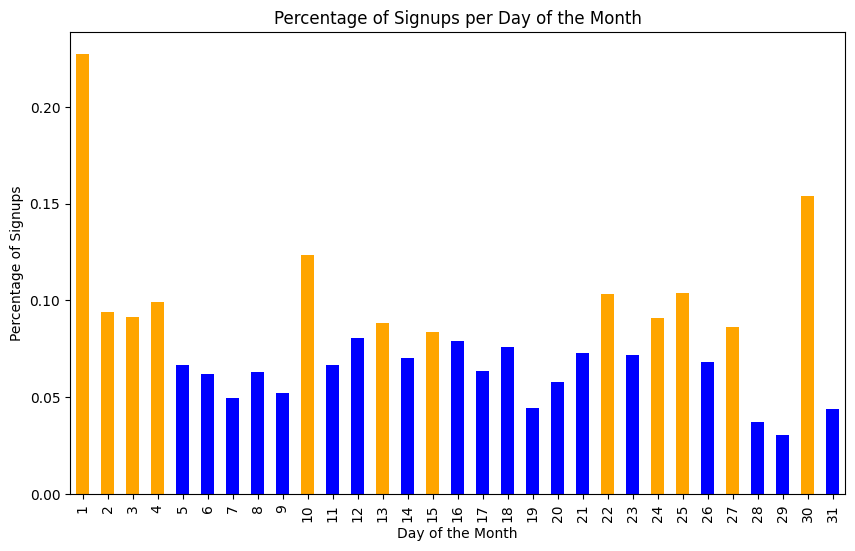

In [103]:
# Plot the percentage of signups per day of the month
percentile_75 = df_conversion_rate["conversion_rate"].quantile(0.60)
colors = ['orange' if count > percentile_75 else 'blue' for count in df_conversion_rate["conversion_rate"]]

plt.figure(figsize=(10, 6))
df_conversion_rate["conversion_rate"].plot(kind='bar', color=colors)
plt.xlabel('Day of the Month')
plt.ylabel('Percentage of Signups')
plt.title('Percentage of Signups per Day of the Month')
plt.show()

conversion_rate
gray      0.741935
orange    0.161290
green     0.096774
Name: proportion, dtype: float64

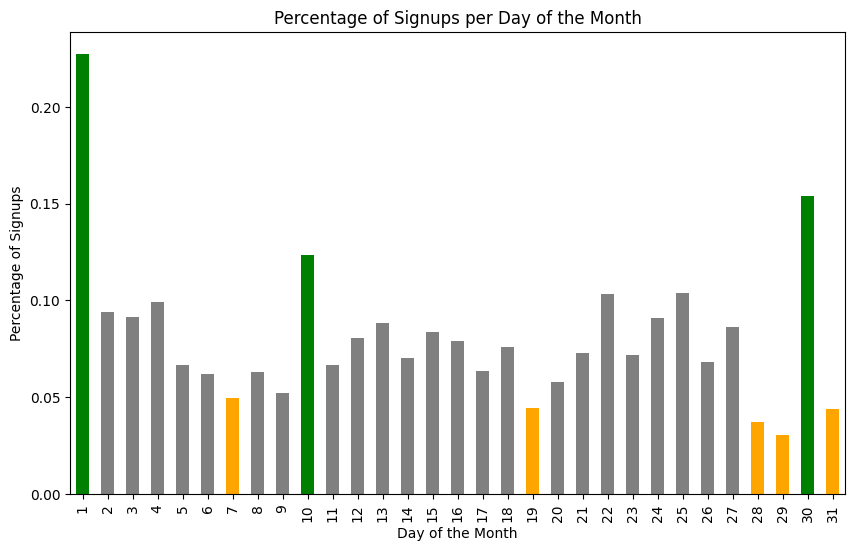

In [104]:
# Calculate the standard deviation of the 'day' column
std_su = df_conversion_rate["conversion_rate"].std() *.8
mean_su = df_conversion_rate["conversion_rate"].mean()
day_encoded = df_conversion_rate["conversion_rate"].map(lambda x: 1 if x > (mean_su + std_su) else (-1 if x < (mean_su - std_su) else 0))

# for day encoded replace 1 with "gray", -1 with "orange" and 0 with "gray", store it as colors.
colors = day_encoded.map({1: 'green', -1: 'orange', 0: 'gray'})
display(colors.value_counts(normalize=True)) # Display the percentage of each color

# Plot the percentage of signups per day of the month
plt.figure(figsize=(10, 6))
df_conversion_rate["conversion_rate"].plot(kind='bar', color=colors)
plt.xlabel('Day of the Month')
plt.ylabel('Percentage of Signups')
plt.title('Percentage of Signups per Day of the Month')
plt.show()

In [105]:

# Create a DataFrame for Plotly
df_plot = df_conversion_rate.reset_index()

# Normalize the columns so that the sum of each column is 1
df_plot['norm_calls_needed_all'] = df_plot["calls_needed_all"] / df_plot["calls_needed_all"].sum()
df_plot['norm_calls_needed_signup'] = df_plot["calls_needed_signup"] / df_plot["calls_needed_signup"].sum()
df_plot['norm_conversion_rate'] = df_plot['conversion_rate'] / df_plot['conversion_rate'].sum()

# Plot using Plotly Express
fig = px.bar(df_plot, x='day', y=['norm_calls_needed_all', 'norm_calls_needed_signup'], 
             title='Number of Calls Needed to Convert a Customer per Day of the Month',
             labels={'value': 'Normalized Number of Calls Needed', 'day': 'Day of the Month'},
             barmode='group', 
             color_discrete_sequence=px.colors.qualitative.Plotly)

# Add conversion rate as a line on a secondary y-axis
fig.add_scatter(x=df_plot['day'], y=df_plot['norm_conversion_rate'], mode='lines+markers', name='Conversion Rate', yaxis='y2')

# Update layout to add secondary y-axis
fig.update_layout(
    xaxis_title='Day of the Month',
    yaxis_title='Normalized Number of Calls Needed',
    yaxis2=dict(
        title='Normalized Conversion Rate',
        overlaying='y',
        side='right'
    )
)

fig.show()

In [106]:
# Convert binary categorical columns to boolean
binary_columns = ['default', 'housing', 'loan']
X[binary_columns] = X[binary_columns].replace({'yes': 1, 'no': 0}).astype('uint8')

# Downcast the numeric columns to the smallest numerical dtype
numeric_columns = X.select_dtypes(include=[np.number]).columns
X[numeric_columns] = X[numeric_columns].apply(pd.to_numeric, downcast='unsigned')

# Convert categorical columns to category dtype
categorical_columns = ['job', 'marital', 'education', 'contact', 'month']
# X[categorical_columns] = X[categorical_columns].apply(lambda col: col.astype('category'))

X_encoded = pd.get_dummies(X, columns=categorical_columns, drop_first=False)  # One-hot encode the months

# Split the data
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)
X_train_encoded, X_test_encoded, y_train, y_test = train_test_split(X_encoded, y, test_size=0.2, random_state=42)

conditions = [
    X_train_encoded['day'].isin(df_conversion_rate['conversion_rate'].nlargest(4).index),
    X_train_encoded['day'].isin(df_conversion_rate['conversion_rate'].nsmallest(5).index)
]
choices = ['high', 'low']
X_train_encoded['day_encoded'] = np.select(conditions, choices, default='medium')

conditions_test = [
    X_test_encoded['day'].isin(df_conversion_rate['conversion_rate'].nlargest(4).index),
    X_test_encoded['day'].isin(df_conversion_rate['conversion_rate'].nsmallest(5).index)
]
X_test_encoded['day_encoded'] = np.select(conditions_test, choices, default='medium')

# if column day in dataset, drop it
if 'day' in X_train_encoded.columns:
    X_train_encoded.drop(columns=['day'], inplace=True)
    X_test_encoded.drop(columns=['day'], inplace=True)

X_train_encoded = pd.get_dummies(X_train_encoded, columns=['day_encoded'], drop_first=False)
X_test_encoded = pd.get_dummies(X_test_encoded, columns=['day_encoded'], drop_first=False)

# Downcast boolean columns to int8
X_train_encoded[X_train_encoded.select_dtypes(include=['bool']).columns] = X_train_encoded.select_dtypes(include=['bool']).astype('int8')
X_test_encoded[X_test_encoded.select_dtypes(include=['bool']).columns] = X_test_encoded.select_dtypes(include=['bool']).astype('int8')

# Display the updated data types
# X_train.dtypes
X_train_encoded.dtypes

age                    uint8
default                uint8
balance                int64
housing                uint8
loan                   uint8
job_admin               int8
job_blue-collar         int8
job_entrepreneur        int8
job_housemaid           int8
job_management          int8
job_retired             int8
job_self-employed       int8
job_services            int8
job_student             int8
job_technician          int8
job_unemployed          int8
job_unknown             int8
marital_divorced        int8
marital_married         int8
marital_single          int8
education_primary       int8
education_secondary     int8
education_tertiary      int8
education_unknown       int8
contact_cellular        int8
contact_telephone       int8
contact_unknown         int8
month_apr               int8
month_aug               int8
month_dec               int8
month_feb               int8
month_jan               int8
month_jul               int8
month_jun               int8
month_mar     

## Base model

In [107]:
import pandas as pd
import numpy as np
import statsmodels.api as sm
from sklearn.model_selection import train_test_split

# Add a constant term for the intercept
X_train_encoded = sm.add_constant(X_train_encoded)

# Fit the OLS model
ols_model = sm.OLS(y_train, X_train_encoded).fit()

# Print the summary of the model
print(ols_model.summary())

                            OLS Regression Results                            
Dep. Variable:               campaign   R-squared:                       0.132
Model:                            OLS   Adj. R-squared:                  0.119
Method:                 Least Squares   F-statistic:                     9.899
Date:                Wed, 06 Nov 2024   Prob (F-statistic):           1.13e-48
Time:                        21:13:09   Log-Likelihood:                -5047.4
No. Observations:                2316   AIC:                         1.017e+04
Df Residuals:                    2280   BIC:                         1.037e+04
Df Model:                          35                                         
Covariance Type:            nonrobust                                         
                          coef    std err          t      P>|t|      [0.025      0.975]
---------------------------------------------------------------------------------------
const                   1.0912    

### **Conclusions from OLS-model**

1. **Effectiveness of Predictors**:
   - Certain variables like marital status, education level, contact method, and month of contact significantly affect the number of calls needed.
   - Contacting customers via cellular phones may require fewer calls, possibly due to higher accessibility.
2. **Model Limitations**:
   - Low R-squared value indicates that the model doesn't explain a large portion of the variability.
   - Non-normality of residuals suggests that OLS assumptions may not be fully met, potentially affecting the reliability of the confidence intervals and p-values.
3. **Recommendations**:
   - **Include Additional Variables**: Consider adding other relevant predictors to improve the model's explanatory power.
   - **Transformations**: Apply transformations to address skewness and kurtosis (e.g., log transformation of the dependent variable).
   - **Robust Regression**: Use regression techniques robust to violations of OLS assumptions, such as Quantile Regression or Generalized Linear Models.
4. **Practical Implications**:
   - **Targeting Strategy**: Focus on months like August and July when more calls are typically required, possibly adjusting campaign strategies during these periods.
   - **Contact Method**: Prioritize cellular contact methods to potentially reduce the number of calls needed.
   - **Customer Segmentation**: Pay attention to marital status and education level when planning call campaigns, as these groups may require more effort to reach.

### Refinement

1. Model Refinement: Remove Non-Significant Variables
2. Interaction Effects: Add Suggested Interaction Terms
3. Implementing Poisson Regression

Implementing Poisson Regression

In [108]:
import pandas as pd
import statsmodels.api as sm
import statsmodels.formula.api as smf
import numpy as np

In [144]:
# Combine y_train and X_train_encoded
data_train = pd.concat([y_train, X_train_encoded], axis=1)
data_train.columns = ['campaign'] + list(X_train_encoded.columns)

data_test = pd.concat([y_test, X_test_encoded], axis=1)
data_test.columns = ['campaign'] + list(X_test_encoded.columns)

**Suggested Interaction Terms**:

1. **Contact Method and Month of Contact**: `contact_method * month`
2. **Marital Status and Education Level**: `marital_status * education_level`
3. **Age and Contact Method**: `age * contact_method`
4. **Job Category and Month**: `job_category * month`
5. **Housing Loan Status and Balance**: `housing_loan * balance`
6. **Default Status and Loan Status**: `default * loan`
7. **Education Level and Age**: `education_level * age`
8. **Marital Status and Job Category**: `marital_status * job_category`
9. **Contact Method and Day Encoded**: `contact_method * day_encoded`
10. **Month and Day Encoded**: `month * day_encoded`

In [146]:
def create_interaction_terms(data, interactions):
    for interaction in interactions:
        term1, term2 = interaction.split('*')
        data[f'{term1}_{term2}'] = data[term1] * data[term2]
    return data

# Define the interaction terms
interaction_terms = [
    'contact_cellular*day_encoded_high',
    'contact_cellular*day_encoded_low',
    'contact_cellular*month_aug',
    'marital_married*education_primary',
    'job_blue-collar*month_jul',
    'housing*balance',
    'default*loan',
    'education_tertiary*age',
    'marital_married*job_blue-collar'
]

# Create the interaction terms
data_train = create_interaction_terms(data_train, interaction_terms)
data_test = create_interaction_terms(data_test, interaction_terms)

In [148]:
# Dropping non-significant variables from previous OLS model
non_significant_vars = ['age', 'default', 'balance', 'loan', 'job_technician', 'job_student']
data_train = data_train.drop(columns=non_significant_vars)
data_test = data_test.drop(columns=non_significant_vars)

#### **5. Implementing the Refinements**

##### **a. Remove Non-Significant Variables**

- **Iteratively Fit the Model**:
  - Start with all variables and note their p-values.
  - Remove the variable with the highest p-value (> 0.05).
  - Re-fit the model and repeat until all variables are significant or necessary. 

#### 4. Addressing Overdispersion and Zero-Inflation

In [153]:
formula = '''
campaign ~ marital_married + education_primary + education_secondary + contact_cellular 
+ month_aug + day_encoded_high + day_encoded_low + day_encoded_medium
'''

In [154]:
# Fit Poisson regression model
model = smf.glm(formula=formula, data=data_train, family=sm.families.Poisson()).fit()

# View the model summary
print(model.summary())

                 Generalized Linear Model Regression Results                  
Dep. Variable:               campaign   No. Observations:                 2316
Model:                            GLM   Df Residuals:                     2308
Model Family:                 Poisson   Df Model:                            7
Link Function:                    Log   Scale:                          1.0000
Method:                          IRLS   Log-Likelihood:                -4510.4
Date:                Wed, 06 Nov 2024   Deviance:                       3073.6
Time:                        21:50:26   Pearson chi2:                 4.62e+03
No. Iterations:                   100   Pseudo R-squ. (CS):             0.1042
Covariance Type:            nonrobust                                         
                          coef    std err          z      P>|z|      [0.025      0.975]
---------------------------------------------------------------------------------------
Intercept               0.7433    

Negative Binomial Regression:

Overdispersion is present, we will switch to Negative Binomial regression, which adds a parameter to model the extra variance.

#### 6. Interpreting the Results

Coefficients:

Positive Coefficient: Indicates that as the predictor increases, the expected number of calls increases.
Negative Coefficient: Indicates a decrease in the expected number of calls with an increase in the predictor.

### 7. Model Diagnostics

In [155]:
# Calculate dispersion
deviance = model.deviance
df_residual = model.df_resid
dispersion = deviance / df_residual

print(f"Dispersion Parameter: {dispersion:.2f}")

Dispersion Parameter: 1.33


In [156]:
# Negative Binomial regression
model_nb = smf.glm(formula=formula, data=data_train, family=sm.families.NegativeBinomial()).fit()

# View summary
print(model_nb.summary())

                 Generalized Linear Model Regression Results                  
Dep. Variable:               campaign   No. Observations:                 2316
Model:                            GLM   Df Residuals:                     2308
Model Family:        NegativeBinomial   Df Model:                            7
Link Function:                    Log   Scale:                          1.0000
Method:                          IRLS   Log-Likelihood:                -4753.1
Date:                Wed, 06 Nov 2024   Deviance:                       776.36
Time:                        21:51:09   Pearson chi2:                 1.36e+03
No. Iterations:                   100   Pseudo R-squ. (CS):            0.02955
Covariance Type:            nonrobust                                         
                          coef    std err          z      P>|z|      [0.025      0.975]
---------------------------------------------------------------------------------------
Intercept               0.7352    

c:\Users\Guill\miniconda3\envs\term_deposit\lib\site-packages\statsmodels\genmod\families\family.py:1367: ValueWarning:

Negative binomial dispersion parameter alpha not set. Using default value alpha=1.0.



In [157]:
# Calculate dispersion for the negative binomial model
neg_binom_deviance = model_nb.deviance
neg_binom_df_residual = model_nb.df_resid
neg_binom_dispersion = neg_binom_deviance / neg_binom_df_residual

print(f"Negative Binomial Dispersion Parameter: {neg_binom_dispersion:.2f}")

Negative Binomial Dispersion Parameter: 0.34


**Considerations**:

- **Multicollinearity**: Adding interaction terms can increase multicollinearity. Check Variance Inflation Factor (VIF) values and address if necessary.
- **Model Complexity**: Balance the addition of interaction terms with model simplicity to avoid overfitting.

In [158]:
# Incident Rate Ratios (IRR)
IRR = np.exp(model_nb.params)
print(IRR)

Intercept              2.085805
marital_married        1.039004
education_primary      1.063384
education_secondary    1.021445
contact_cellular       0.801914
month_aug              1.799127
day_encoded_high       1.250131
day_encoded_low        1.388799
day_encoded_medium     1.201375
dtype: float64


**Address Multicollinearity**:

- **Remove or Combine Variables**: If variables are highly correlated, consider removing one or combining them.

In [174]:
from statsmodels.stats.outliers_influence import variance_inflation_factor

# Selecting relevant features
features = list(model_nb.params.index)

# Calculating VIF
VIF_data = pd.DataFrame()
VIF_data['feature'] = features
VIF_data['VIF'] = [variance_inflation_factor(data_train, i)
                   for i in range(len(features))
                   ]

print(VIF_data)


               feature       VIF
0            Intercept  1.153692
1      marital_married  0.000000
2    education_primary  1.531752
3  education_secondary  1.481527
4     contact_cellular  3.882173
5            month_aug  1.183383
6     day_encoded_high  1.143948
7      day_encoded_low  2.086283
8   day_encoded_medium  1.428892


c:\Users\Guill\miniconda3\envs\term_deposit\lib\site-packages\statsmodels\regression\linear_model.py:1782: RuntimeWarning:

divide by zero encountered in scalar divide



In [179]:
# Example: Dropping one of the correlated variables
cols_high_correlation=['month_dec','month_mar', 'education_unknown','day_encoded_low', 'marital_divorced']
# data_train = data_train.drop(columns=cols_high_correlation)
# data_test = data_test.drop(columns=cols_high_correlation)

# Reasses interaction terms
formula = """campaign ~ marital_married + education_primary + education_secondary
+ contact_cellular + month_aug + day_encoded_high + day_encoded_medium
"""

In [180]:
model_full = smf.glm(formula=formula, data=data_train, family=sm.families.NegativeBinomial()).fit()
print(model_full.summary())

                 Generalized Linear Model Regression Results                  
Dep. Variable:               campaign   No. Observations:                 2316
Model:                            GLM   Df Residuals:                     2308
Model Family:        NegativeBinomial   Df Model:                            7
Link Function:                    Log   Scale:                          1.0000
Method:                          IRLS   Log-Likelihood:                -4753.1
Date:                Wed, 06 Nov 2024   Deviance:                       776.36
Time:                        22:18:02   Pearson chi2:                 1.36e+03
No. Iterations:                     6   Pseudo R-squ. (CS):            0.02955
Covariance Type:            nonrobust                                         
                          coef    std err          z      P>|z|      [0.025      0.975]
---------------------------------------------------------------------------------------
Intercept               1.0635    

c:\Users\Guill\miniconda3\envs\term_deposit\lib\site-packages\statsmodels\genmod\families\family.py:1367: ValueWarning:

Negative binomial dispersion parameter alpha not set. Using default value alpha=1.0.



Make Predictions on Test Data:

In [181]:
# Add a constant to test data if required
# X_test = sm.add_constant(X_test, has_constant='add')

# Predict
y_pred = model_full.predict(data_test)

# Evaluate
from sklearn.metrics import mean_squared_error, mean_absolute_error

mse = mean_squared_error(y_test, y_pred)
mae = mean_absolute_error(y_test, y_pred)

print("Mean Squared Error:", mse)
print("Mean Absolute Error:", mae)

Mean Squared Error: 5.049400836140505
Mean Absolute Error: 1.3461311232656992


# Training

### Machine learning approach

In [197]:
from sklearn.ensemble import RandomForestRegressor, GradientBoostingRegressor
from sklearn.model_selection import cross_val_score

# Random Forest
rf_model = RandomForestRegressor(n_estimators=100, random_state=42)
rf_scores = cross_val_score(rf_model, data_train.drop(columns=['campaign']), y_train, cv=5, scoring='neg_mean_poisson_deviance')

# Gradient Boosting
gb_model = GradientBoostingRegressor(n_estimators=100, random_state=42)
gb_scores = cross_val_score(gb_model, data_train.drop(columns=['campaign']), y_train, cv=5, scoring='neg_mean_poisson_deviance')

print("Random Forest Mean Poisson Deviance:", -rf_scores.mean())
print("Gradient Boosting Mean Poisson Deviance:", -gb_scores.mean())

Random Forest Mean Poisson Deviance: 1.4350637888407483
Gradient Boosting Mean Poisson Deviance: 1.2040636885822749


### AutoML

In [198]:
# Initialize an AutoML instance
automl = AutoML()

# Dynamically get the number of available CPU cores
num_cpus = multiprocessing.cpu_count()

# Log model info to MLflow in the main process
mlflow.set_experiment("flaml_parallel_experiment")
with mlflow.start_run():
    automl = AutoML()
    automl.fit(X_train, y_train, **settings["automl"])

try:
    # Save the model
    with open("automl.pkl", "wb") as f:
        pickle.dump(automl, f)
except Exception as e:
    print("We could not save the model")
    print(e)

Traceback (most recent call last):
  File "c:\Users\Guill\miniconda3\envs\term_deposit\lib\site-packages\mlflow\store\tracking\file_store.py", line 327, in search_experiments
    exp = self._get_experiment(exp_id, view_type)
  File "c:\Users\Guill\miniconda3\envs\term_deposit\lib\site-packages\mlflow\store\tracking\file_store.py", line 421, in _get_experiment
    meta = FileStore._read_yaml(experiment_dir, FileStore.META_DATA_FILE_NAME)
  File "c:\Users\Guill\miniconda3\envs\term_deposit\lib\site-packages\mlflow\store\tracking\file_store.py", line 1367, in _read_yaml
    return _read_helper(root, file_name, attempts_remaining=retries)
  File "c:\Users\Guill\miniconda3\envs\term_deposit\lib\site-packages\mlflow\store\tracking\file_store.py", line 1360, in _read_helper
    result = read_yaml(root, file_name)
  File "c:\Users\Guill\miniconda3\envs\term_deposit\lib\site-packages\mlflow\utils\file_utils.py", line 309, in read_yaml
    raise MissingConfigException(f"Yaml file '{file_path}' d

[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.001035 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 384
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 11
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000187 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 384
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 11
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000222 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, y

[flaml.automl: 11-06 22:24:37] {787} INFO -  at 0.5s,	best lgbm's error=0.8868,	best lgbm's error=0.8868


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000466 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 709
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 11
[LightGBM] [Info] Start training from score 2.418780
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000342 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 712
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 11
[LightGBM] [Info] Start training from score 2.411765
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000270 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 708
[LightGBM] [Info] Number of data points in the train set: 185

INFO:flaml.automl: at 0.5s,	best lgbm's error=0.8868,	best lgbm's error=0.8868
[flaml.automl: 11-06 22:24:37] {728} INFO - iteration 2  current learner xgboost
INFO:flaml.automl:iteration 2  current learner xgboost
[flaml.automl: 11-06 22:24:38] {787} INFO -  at 1.1s,	best xgboost's error=0.9489,	best lgbm's error=0.8868
INFO:flaml.automl: at 1.1s,	best xgboost's error=0.9489,	best lgbm's error=0.8868
[flaml.automl: 11-06 22:24:38] {728} INFO - iteration 3  current learner lgbm
INFO:flaml.automl:iteration 3  current learner lgbm
[flaml.automl: 11-06 22:24:38] {787} INFO -  at 1.3s,	best lgbm's error=0.8665,	best lgbm's error=0.8665
INFO:flaml.automl: at 1.3s,	best lgbm's error=0.8665,	best lgbm's error=0.8665
[flaml.automl: 11-06 22:24:38] {728} INFO - iteration 4  current learner lgbm
INFO:flaml.automl:iteration 4  current learner lgbm


[LightGBM] [Warning] Categorical features with more bins than the configured maximum bin number found.
[LightGBM] [Warning] For categorical features, max_bin and max_bin_by_feature may be ignored with a large number of categories.
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000224 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 63
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 11
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Warning] Categorical features with more bins than the configured maximum bin number found.
[LightGBM] [Warning] For categorical features, max_bin and max_bin_by_feature may be ignored with a large number of categories.
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000496 seconds.
You can set `force_col_wise=tru

[flaml.automl: 11-06 22:24:38] {787} INFO -  at 1.6s,	best lgbm's error=0.8523,	best lgbm's error=0.8523
INFO:flaml.automl: at 1.6s,	best lgbm's error=0.8523,	best lgbm's error=0.8523
[flaml.automl: 11-06 22:24:38] {728} INFO - iteration 5  current learner extra_tree
INFO:flaml.automl:iteration 5  current learner extra_tree


[LightGBM] [Warning] Categorical features with more bins than the configured maximum bin number found.
[LightGBM] [Warning] For categorical features, max_bin and max_bin_by_feature may be ignored with a large number of categories.
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000359 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 63
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 11
[LightGBM] [Info] Start training from score 2.418780
[LightGBM] [Warning] Categorical features with more bins than the configured maximum bin number found.
[LightGBM] [Warning] For categorical features, max_bin and max_bin_by_feature may be ignored with a large number of categories.
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000150 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can 

[flaml.automl: 11-06 22:24:39] {787} INFO -  at 2.1s,	best extra_tree's error=1.1209,	best lgbm's error=0.8523
INFO:flaml.automl: at 2.1s,	best extra_tree's error=1.1209,	best lgbm's error=0.8523
[flaml.automl: 11-06 22:24:39] {728} INFO - iteration 6  current learner rf
INFO:flaml.automl:iteration 6  current learner rf
[flaml.automl: 11-06 22:24:39] {787} INFO -  at 2.6s,	best rf's error=1.1904,	best lgbm's error=0.8523
INFO:flaml.automl: at 2.6s,	best rf's error=1.1904,	best lgbm's error=0.8523
[flaml.automl: 11-06 22:24:39] {728} INFO - iteration 7  current learner lgbm
INFO:flaml.automl:iteration 7  current learner lgbm


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000163 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 256
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 11
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000149 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 256
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 11
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000136 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, y

[flaml.automl: 11-06 22:24:40] {787} INFO -  at 2.9s,	best lgbm's error=0.8472,	best lgbm's error=0.8472
INFO:flaml.automl: at 2.9s,	best lgbm's error=0.8472,	best lgbm's error=0.8472
[flaml.automl: 11-06 22:24:40] {728} INFO - iteration 8  current learner rf
INFO:flaml.automl:iteration 8  current learner rf


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000131 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 257
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 11
[LightGBM] [Info] Start training from score 2.441446
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000120 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 258
[LightGBM] [Info] Number of data points in the train set: 2316, number of used features: 11
[LightGBM] [Info] Start training from score 2.421848
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000141 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, y

[flaml.automl: 11-06 22:24:40] {787} INFO -  at 3.4s,	best rf's error=1.0035,	best lgbm's error=0.8472
INFO:flaml.automl: at 3.4s,	best rf's error=1.0035,	best lgbm's error=0.8472
[flaml.automl: 11-06 22:24:40] {728} INFO - iteration 9  current learner lgbm
INFO:flaml.automl:iteration 9  current learner lgbm


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000873 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 708
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 11
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000333 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 708
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 11
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.010363 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 7

[flaml.automl: 11-06 22:24:41] {787} INFO -  at 4.4s,	best lgbm's error=0.8472,	best lgbm's error=0.8472
INFO:flaml.automl: at 4.4s,	best lgbm's error=0.8472,	best lgbm's error=0.8472
[flaml.automl: 11-06 22:24:41] {728} INFO - iteration 10  current learner lgbm
INFO:flaml.automl:iteration 10  current learner lgbm


[LightGBM] [Warning] Categorical features with more bins than the configured maximum bin number found.
[LightGBM] [Warning] For categorical features, max_bin and max_bin_by_feature may be ignored with a large number of categories.
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000167 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 63
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 11
[LightGBM] [Info] Start training from score 2.441446
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000398 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 708
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 11
[LightGBM] [Inf

[flaml.automl: 11-06 22:24:42] {787} INFO -  at 5.0s,	best lgbm's error=0.8472,	best lgbm's error=0.8472
INFO:flaml.automl: at 5.0s,	best lgbm's error=0.8472,	best lgbm's error=0.8472
[flaml.automl: 11-06 22:24:42] {728} INFO - iteration 11  current learner lgbm
INFO:flaml.automl:iteration 11  current learner lgbm


[LightGBM] [Warning] Categorical features with more bins than the configured maximum bin number found.
[LightGBM] [Warning] For categorical features, max_bin and max_bin_by_feature may be ignored with a large number of categories.
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000145 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 63
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 11
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Warning] Categorical features with more bins than the configured maximum bin number found.
[LightGBM] [Warning] For categorical features, max_bin and max_bin_by_feature may be ignored with a large number of categories.
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000260 seconds.
You can set `force_row_wise=tru

[flaml.automl: 11-06 22:24:42] {787} INFO -  at 5.7s,	best lgbm's error=0.8472,	best lgbm's error=0.8472
INFO:flaml.automl: at 5.7s,	best lgbm's error=0.8472,	best lgbm's error=0.8472
[flaml.automl: 11-06 22:24:42] {728} INFO - iteration 12  current learner rf
INFO:flaml.automl:iteration 12  current learner rf


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000306 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 197
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 11
[LightGBM] [Info] Start training from score 2.411765
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000287 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 196
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 11
[LightGBM] [Info] Start training from score 2.441446


[flaml.automl: 11-06 22:24:43] {787} INFO -  at 6.7s,	best rf's error=0.9777,	best lgbm's error=0.8472
INFO:flaml.automl: at 6.7s,	best rf's error=0.9777,	best lgbm's error=0.8472
[flaml.automl: 11-06 22:24:43] {728} INFO - iteration 13  current learner xgboost
INFO:flaml.automl:iteration 13  current learner xgboost
[flaml.automl: 11-06 22:24:44] {787} INFO -  at 7.0s,	best xgboost's error=0.9431,	best lgbm's error=0.8472
INFO:flaml.automl: at 7.0s,	best xgboost's error=0.9431,	best lgbm's error=0.8472
[flaml.automl: 11-06 22:24:44] {728} INFO - iteration 14  current learner extra_tree
INFO:flaml.automl:iteration 14  current learner extra_tree
[flaml.automl: 11-06 22:24:44] {787} INFO -  at 7.5s,	best extra_tree's error=0.9933,	best lgbm's error=0.8472
INFO:flaml.automl: at 7.5s,	best extra_tree's error=0.9933,	best lgbm's error=0.8472
[flaml.automl: 11-06 22:24:44] {728} INFO - iteration 15  current learner extra_tree
INFO:flaml.automl:iteration 15  current learner extra_tree
[flaml.a

[LightGBM] [Warning] Categorical features with more bins than the configured maximum bin number found.
[LightGBM] [Warning] For categorical features, max_bin and max_bin_by_feature may be ignored with a large number of categories.
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000180 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 63
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 11
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Warning] Categorical features with more bins than the configured maximum bin number found.
[LightGBM] [Warning] For categorical features, max_bin and max_bin_by_feature may be ignored with a large number of categories.
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000238 seconds.
You can set `force_row_wise=tru

[flaml.automl: 11-06 22:24:46] {787} INFO -  at 9.2s,	best lgbm's error=0.8472,	best lgbm's error=0.8472
INFO:flaml.automl: at 9.2s,	best lgbm's error=0.8472,	best lgbm's error=0.8472
[flaml.automl: 11-06 22:24:46] {728} INFO - iteration 17  current learner extra_tree
INFO:flaml.automl:iteration 17  current learner extra_tree
[flaml.automl: 11-06 22:24:46] {787} INFO -  at 9.8s,	best extra_tree's error=0.9346,	best lgbm's error=0.8472
INFO:flaml.automl: at 9.8s,	best extra_tree's error=0.9346,	best lgbm's error=0.8472
[flaml.automl: 11-06 22:24:46] {728} INFO - iteration 18  current learner lgbm
INFO:flaml.automl:iteration 18  current learner lgbm


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000145 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 134
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 11
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000164 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 134
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 11
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000202 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, y

[flaml.automl: 11-06 22:24:47] {787} INFO -  at 10.4s,	best lgbm's error=0.8472,	best lgbm's error=0.8472
INFO:flaml.automl: at 10.4s,	best lgbm's error=0.8472,	best lgbm's error=0.8472
[flaml.automl: 11-06 22:24:47] {728} INFO - iteration 19  current learner lgbm
INFO:flaml.automl:iteration 19  current learner lgbm


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000310 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 708
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 11
[LightGBM] [Info] Start training from score 2.441446
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000314 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 134
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 11
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000677 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 134
[LightGBM] [Info] Number of data points in the train set: 185

[flaml.automl: 11-06 22:24:48] {787} INFO -  at 11.5s,	best lgbm's error=0.8472,	best lgbm's error=0.8472
INFO:flaml.automl: at 11.5s,	best lgbm's error=0.8472,	best lgbm's error=0.8472
[flaml.automl: 11-06 22:24:48] {728} INFO - iteration 20  current learner lgbm
INFO:flaml.automl:iteration 20  current learner lgbm


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000380 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 641
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 11
[LightGBM] [Info] Start training from score 2.441446
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000351 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 708
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 11
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000384 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 708
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 11
[LightGBM] [Info] Start training 

[flaml.automl: 11-06 22:24:49] {787} INFO -  at 12.0s,	best lgbm's error=0.8472,	best lgbm's error=0.8472
INFO:flaml.automl: at 12.0s,	best lgbm's error=0.8472,	best lgbm's error=0.8472
[flaml.automl: 11-06 22:24:49] {728} INFO - iteration 21  current learner lgbm
INFO:flaml.automl:iteration 21  current learner lgbm


[LightGBM] [Warning] Categorical features with more bins than the configured maximum bin number found.
[LightGBM] [Warning] For categorical features, max_bin and max_bin_by_feature may be ignored with a large number of categories.
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000242 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 63
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 11
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Warning] Categorical features with more bins than the configured maximum bin number found.
[LightGBM] [Warning] For categorical features, max_bin and max_bin_by_feature may be ignored with a large number of categories.
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000185 seconds.
You can set `force_row_wise=tru

[flaml.automl: 11-06 22:24:49] {787} INFO -  at 12.6s,	best lgbm's error=0.8472,	best lgbm's error=0.8472
INFO:flaml.automl: at 12.6s,	best lgbm's error=0.8472,	best lgbm's error=0.8472
[flaml.automl: 11-06 22:24:49] {728} INFO - iteration 22  current learner lgbm
INFO:flaml.automl:iteration 22  current learner lgbm


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000426 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 712
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 11
[LightGBM] [Info] Start training from score 2.411765
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000750 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 708
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 11
[LightGBM] [Info] Start training from score 2.441446
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000192 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 87
[LightGBM] [Info] Number of data points in the train set: 1852

[flaml.automl: 11-06 22:24:50] {787} INFO -  at 13.5s,	best lgbm's error=0.8472,	best lgbm's error=0.8472
INFO:flaml.automl: at 13.5s,	best lgbm's error=0.8472,	best lgbm's error=0.8472
[flaml.automl: 11-06 22:24:50] {728} INFO - iteration 23  current learner lgbm
INFO:flaml.automl:iteration 23  current learner lgbm


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000298 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 708
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 11
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000154 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 708
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 11
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000396 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 708
[LightGBM] [Info] Number of data points in the train set: 185

[flaml.automl: 11-06 22:24:51] {787} INFO -  at 14.5s,	best lgbm's error=0.8472,	best lgbm's error=0.8472
INFO:flaml.automl: at 14.5s,	best lgbm's error=0.8472,	best lgbm's error=0.8472
[flaml.automl: 11-06 22:24:51] {728} INFO - iteration 24  current learner lgbm
INFO:flaml.automl:iteration 24  current learner lgbm


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000338 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 87
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 11
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000197 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 87
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 11
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000598 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you

[flaml.automl: 11-06 22:24:52] {787} INFO -  at 15.1s,	best lgbm's error=0.8465,	best lgbm's error=0.8465
INFO:flaml.automl: at 15.1s,	best lgbm's error=0.8465,	best lgbm's error=0.8465
[flaml.automl: 11-06 22:24:52] {728} INFO - iteration 25  current learner lgbm
INFO:flaml.automl:iteration 25  current learner lgbm


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000208 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 87
[LightGBM] [Info] Number of data points in the train set: 2316, number of used features: 11
[LightGBM] [Info] Start training from score 2.421848
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000174 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 87
[LightGBM] [Info] Number of data points in the train set: 2316, number of used features: 11
[LightGBM] [Info] Start training from score 2.421848
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000167 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you

[flaml.automl: 11-06 22:24:53] {787} INFO -  at 16.1s,	best lgbm's error=0.8465,	best lgbm's error=0.8465
INFO:flaml.automl: at 16.1s,	best lgbm's error=0.8465,	best lgbm's error=0.8465
[flaml.automl: 11-06 22:24:53] {728} INFO - iteration 26  current learner lgbm
INFO:flaml.automl:iteration 26  current learner lgbm


[LightGBM] [Warning] Categorical features with more bins than the configured maximum bin number found.
[LightGBM] [Warning] For categorical features, max_bin and max_bin_by_feature may be ignored with a large number of categories.
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000155 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 63
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 11
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Warning] Categorical features with more bins than the configured maximum bin number found.
[LightGBM] [Warning] For categorical features, max_bin and max_bin_by_feature may be ignored with a large number of categories.
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000191 seconds.
You can set `force_row_wise=tru

[flaml.automl: 11-06 22:24:54] {787} INFO -  at 17.7s,	best lgbm's error=0.8465,	best lgbm's error=0.8465
INFO:flaml.automl: at 17.7s,	best lgbm's error=0.8465,	best lgbm's error=0.8465
[flaml.automl: 11-06 22:24:54] {728} INFO - iteration 27  current learner lgbm
INFO:flaml.automl:iteration 27  current learner lgbm


[LightGBM] [Warning] Categorical features with more bins than the configured maximum bin number found.
[LightGBM] [Warning] For categorical features, max_bin and max_bin_by_feature may be ignored with a large number of categories.
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000897 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 63
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 11
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Warning] Categorical features with more bins than the configured maximum bin number found.
[LightGBM] [Warning] For categorical features, max_bin and max_bin_by_feature may be ignored with a large number of categories.
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.001349 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can 

[flaml.automl: 11-06 22:24:55] {787} INFO -  at 18.5s,	best lgbm's error=0.8465,	best lgbm's error=0.8465
INFO:flaml.automl: at 18.5s,	best lgbm's error=0.8465,	best lgbm's error=0.8465
[flaml.automl: 11-06 22:24:55] {728} INFO - iteration 28  current learner lgbm
INFO:flaml.automl:iteration 28  current learner lgbm


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.002272 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 640
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 11
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000584 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 640
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 11
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000278 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 640
[LightGBM] [Info] Number of data points in the train set: 185

[flaml.automl: 11-06 22:24:57] {787} INFO -  at 19.9s,	best lgbm's error=0.8465,	best lgbm's error=0.8465
INFO:flaml.automl: at 19.9s,	best lgbm's error=0.8465,	best lgbm's error=0.8465
[flaml.automl: 11-06 22:24:57] {728} INFO - iteration 29  current learner lgbm
INFO:flaml.automl:iteration 29  current learner lgbm


[LightGBM] [Warning] Categorical features with more bins than the configured maximum bin number found.
[LightGBM] [Warning] For categorical features, max_bin and max_bin_by_feature may be ignored with a large number of categories.
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000266 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 63
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 11
[LightGBM] [Info] Start training from score 2.441446
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000378 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 384
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 11
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-cho

[flaml.automl: 11-06 22:24:58] {787} INFO -  at 20.9s,	best lgbm's error=0.8465,	best lgbm's error=0.8465
INFO:flaml.automl: at 20.9s,	best lgbm's error=0.8465,	best lgbm's error=0.8465
[flaml.automl: 11-06 22:24:58] {728} INFO - iteration 30  current learner lgbm
INFO:flaml.automl:iteration 30  current learner lgbm


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000491 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 63
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 11
[LightGBM] [Info] Start training from score 2.441446
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000298 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 134
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 11
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000189 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 13

[flaml.automl: 11-06 22:24:59] {787} INFO -  at 22.7s,	best lgbm's error=0.8465,	best lgbm's error=0.8465
INFO:flaml.automl: at 22.7s,	best lgbm's error=0.8465,	best lgbm's error=0.8465
[flaml.automl: 11-06 22:24:59] {728} INFO - iteration 31  current learner lgbm
INFO:flaml.automl:iteration 31  current learner lgbm


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000434 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 640
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 11
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000259 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 640
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 11
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.003412 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 6

[flaml.automl: 11-06 22:25:01] {787} INFO -  at 23.9s,	best lgbm's error=0.8465,	best lgbm's error=0.8465


[LightGBM] [Warning] Categorical features with more bins than the configured maximum bin number found.
[LightGBM] [Warning] For categorical features, max_bin and max_bin_by_feature may be ignored with a large number of categories.
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000167 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 63
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 11
[LightGBM] [Info] Start training from score 2.411765
[LightGBM] [Warning] Categorical features with more bins than the configured maximum bin number found.
[LightGBM] [Warning] For categorical features, max_bin and max_bin_by_feature may be ignored with a large number of categories.
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000178 seconds.
You can set `force_row_wise=tru

INFO:flaml.automl: at 23.9s,	best lgbm's error=0.8465,	best lgbm's error=0.8465
[flaml.automl: 11-06 22:25:01] {728} INFO - iteration 32  current learner lgbm
INFO:flaml.automl:iteration 32  current learner lgbm


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000169 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 87
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 11
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000479 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 87
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 11
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000341 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 87
[LightGBM] [Info] Number of data points in the train set: 1852, 

[flaml.automl: 11-06 22:25:02] {787} INFO -  at 25.3s,	best lgbm's error=0.8465,	best lgbm's error=0.8465


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000240 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 87
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 11
[LightGBM] [Info] Start training from score 2.411765
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000790 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 87
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 11
[LightGBM] [Info] Start training from score 2.441446


INFO:flaml.automl: at 25.3s,	best lgbm's error=0.8465,	best lgbm's error=0.8465
[flaml.automl: 11-06 22:25:02] {728} INFO - iteration 33  current learner lgbm
INFO:flaml.automl:iteration 33  current learner lgbm


[LightGBM] [Warning] Categorical features with more bins than the configured maximum bin number found.
[LightGBM] [Warning] For categorical features, max_bin and max_bin_by_feature may be ignored with a large number of categories.
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000267 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 63
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 11
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Warning] Categorical features with more bins than the configured maximum bin number found.
[LightGBM] [Warning] For categorical features, max_bin and max_bin_by_feature may be ignored with a large number of categories.
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000212 seconds.
You can set `force_row_wise=tru

[flaml.automl: 11-06 22:25:03] {787} INFO -  at 26.8s,	best lgbm's error=0.8465,	best lgbm's error=0.8465
INFO:flaml.automl: at 26.8s,	best lgbm's error=0.8465,	best lgbm's error=0.8465
[flaml.automl: 11-06 22:25:03] {728} INFO - iteration 34  current learner lgbm
INFO:flaml.automl:iteration 34  current learner lgbm


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001028 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 708
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 11
[LightGBM] [Info] Start training from score 2.441446
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000340 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 708
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 11
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001863 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 708
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 11
[LightGBM] [Info] Start training 

[flaml.automl: 11-06 22:25:05] {787} INFO -  at 28.6s,	best lgbm's error=0.8465,	best lgbm's error=0.8465
INFO:flaml.automl: at 28.6s,	best lgbm's error=0.8465,	best lgbm's error=0.8465
[flaml.automl: 11-06 22:25:05] {728} INFO - iteration 35  current learner rf
INFO:flaml.automl:iteration 35  current learner rf
[flaml.automl: 11-06 22:25:06] {787} INFO -  at 29.8s,	best rf's error=0.9384,	best lgbm's error=0.8465
INFO:flaml.automl: at 29.8s,	best rf's error=0.9384,	best lgbm's error=0.8465
[flaml.automl: 11-06 22:25:06] {728} INFO - iteration 36  current learner lgbm
INFO:flaml.automl:iteration 36  current learner lgbm


[LightGBM] [Warning] Categorical features with more bins than the configured maximum bin number found.
[LightGBM] [Warning] For categorical features, max_bin and max_bin_by_feature may be ignored with a large number of categories.
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000122 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 63
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 11
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Warning] Categorical features with more bins than the configured maximum bin number found.
[LightGBM] [Warning] For categorical features, max_bin and max_bin_by_feature may be ignored with a large number of categories.
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000360 seconds.
You can set `force_col_wise=tru

[flaml.automl: 11-06 22:25:07] {787} INFO -  at 30.6s,	best lgbm's error=0.8465,	best lgbm's error=0.8465
INFO:flaml.automl: at 30.6s,	best lgbm's error=0.8465,	best lgbm's error=0.8465
[flaml.automl: 11-06 22:25:07] {728} INFO - iteration 37  current learner lgbm
INFO:flaml.automl:iteration 37  current learner lgbm


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000170 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 87
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 11
[LightGBM] [Info] Start training from score 2.411765
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000232 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 87
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 11
[LightGBM] [Info] Start training from score 2.441446
[LightGBM] [Warning] Categorical features with more bins than the configured maximum bin number found.
[LightGBM] [Warning] For categorical features, max_bin and max_bin_by_feature may be ignore

[flaml.automl: 11-06 22:25:08] {787} INFO -  at 31.4s,	best lgbm's error=0.8465,	best lgbm's error=0.8465
INFO:flaml.automl: at 31.4s,	best lgbm's error=0.8465,	best lgbm's error=0.8465
[flaml.automl: 11-06 22:25:08] {728} INFO - iteration 38  current learner lgbm
INFO:flaml.automl:iteration 38  current learner lgbm


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000155 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 196
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 11
[LightGBM] [Info] Start training from score 2.441446
[LightGBM] [Warning] Categorical features with more bins than the configured maximum bin number found.
[LightGBM] [Warning] For categorical features, max_bin and max_bin_by_feature may be ignored with a large number of categories.
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000164 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 63
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 11
[LightGBM] [Inf

[flaml.automl: 11-06 22:25:10] {787} INFO -  at 33.2s,	best lgbm's error=0.8465,	best lgbm's error=0.8465


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000318 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 384
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 11
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000290 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 384
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 11
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000303 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 384
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 11
[LightGBM] [Info] Start training 

INFO:flaml.automl: at 33.2s,	best lgbm's error=0.8465,	best lgbm's error=0.8465
[flaml.automl: 11-06 22:25:10] {728} INFO - iteration 39  current learner lgbm
INFO:flaml.automl:iteration 39  current learner lgbm


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000312 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 134
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 11
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000364 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 134
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 11
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000746 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 134
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 11
[LightGBM] [Info] Start training 

[flaml.automl: 11-06 22:25:11] {787} INFO -  at 34.1s,	best lgbm's error=0.8465,	best lgbm's error=0.8465


[LightGBM] [Warning] Categorical features with more bins than the configured maximum bin number found.
[LightGBM] [Warning] For categorical features, max_bin and max_bin_by_feature may be ignored with a large number of categories.
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000372 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 63
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 11
[LightGBM] [Info] Start training from score 2.383162
[LightGBM] [Warning] Categorical features with more bins than the configured maximum bin number found.
[LightGBM] [Warning] For categorical features, max_bin and max_bin_by_feature may be ignored with a large number of categories.
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000279 seconds.
You can set `force_row_wise=tru

INFO:flaml.automl: at 34.1s,	best lgbm's error=0.8465,	best lgbm's error=0.8465
[flaml.automl: 11-06 22:25:11] {728} INFO - iteration 40  current learner lgbm
INFO:flaml.automl:iteration 40  current learner lgbm


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000347 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 708
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 11
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000375 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 708
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 11
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000361 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 708
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 11
[LightGBM] [Info] Start training 

[flaml.automl: 11-06 22:25:12] {787} INFO -  at 35.1s,	best lgbm's error=0.8465,	best lgbm's error=0.8465
INFO:flaml.automl: at 35.1s,	best lgbm's error=0.8465,	best lgbm's error=0.8465
[flaml.automl: 11-06 22:25:12] {728} INFO - iteration 41  current learner lgbm
INFO:flaml.automl:iteration 41  current learner lgbm


[LightGBM] [Warning] Categorical features with more bins than the configured maximum bin number found.
[LightGBM] [Warning] For categorical features, max_bin and max_bin_by_feature may be ignored with a large number of categories.
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000170 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 63
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 11
[LightGBM] [Info] Start training from score 2.411765
[LightGBM] [Warning] Categorical features with more bins than the configured maximum bin number found.
[LightGBM] [Warning] For categorical features, max_bin and max_bin_by_feature may be ignored with a large number of categories.
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000205 seconds.
You can set `force_row_wise=tru

[flaml.automl: 11-06 22:25:13] {787} INFO -  at 36.4s,	best lgbm's error=0.8465,	best lgbm's error=0.8465


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000375 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 708
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 11
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000316 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 708
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 11
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000291 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 710
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 11
[LightGBM] [Info] Start training 

INFO:flaml.automl: at 36.4s,	best lgbm's error=0.8465,	best lgbm's error=0.8465
[flaml.automl: 11-06 22:25:13] {728} INFO - iteration 42  current learner lgbm
INFO:flaml.automl:iteration 42  current learner lgbm


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000674 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 640
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 11
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000380 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 640
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 11
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000354 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 640
[LightGBM] [Info] Number of data points in the train set: 185

[flaml.automl: 11-06 22:25:14] {787} INFO -  at 37.3s,	best lgbm's error=0.8465,	best lgbm's error=0.8465
INFO:flaml.automl: at 37.3s,	best lgbm's error=0.8465,	best lgbm's error=0.8465
[flaml.automl: 11-06 22:25:14] {728} INFO - iteration 43  current learner lgbm
INFO:flaml.automl:iteration 43  current learner lgbm


[LightGBM] [Warning] Categorical features with more bins than the configured maximum bin number found.
[LightGBM] [Warning] For categorical features, max_bin and max_bin_by_feature may be ignored with a large number of categories.
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000183 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 63
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 11
[LightGBM] [Info] Start training from score 2.418780
[LightGBM] [Warning] Categorical features with more bins than the configured maximum bin number found.
[LightGBM] [Warning] For categorical features, max_bin and max_bin_by_feature may be ignored with a large number of categories.
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000396 seconds.
You can set `force_row_wise=tru

[flaml.automl: 11-06 22:25:15] {787} INFO -  at 38.2s,	best lgbm's error=0.8465,	best lgbm's error=0.8465
INFO:flaml.automl: at 38.2s,	best lgbm's error=0.8465,	best lgbm's error=0.8465
[flaml.automl: 11-06 22:25:15] {728} INFO - iteration 44  current learner rf
INFO:flaml.automl:iteration 44  current learner rf


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000326 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 133
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 11
[LightGBM] [Info] Start training from score 2.441446


[flaml.automl: 11-06 22:25:16] {787} INFO -  at 39.3s,	best rf's error=0.9384,	best lgbm's error=0.8465
INFO:flaml.automl: at 39.3s,	best rf's error=0.9384,	best lgbm's error=0.8465
[flaml.automl: 11-06 22:25:16] {728} INFO - iteration 45  current learner lgbm
INFO:flaml.automl:iteration 45  current learner lgbm


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000167 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 87
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 11
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000159 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 87
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 11
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000119 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you

[flaml.automl: 11-06 22:25:17] {787} INFO -  at 40.6s,	best lgbm's error=0.8465,	best lgbm's error=0.8465


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000217 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 87
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 11
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000115 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 87
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 11
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000437 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 87


INFO:flaml.automl: at 40.6s,	best lgbm's error=0.8465,	best lgbm's error=0.8465
[flaml.automl: 11-06 22:25:17] {728} INFO - iteration 46  current learner lgbm
INFO:flaml.automl:iteration 46  current learner lgbm


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000420 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 87
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 11
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000649 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 87
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 11
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000315 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 87
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 11
[LightGBM] [Info] Start training fro

[flaml.automl: 11-06 22:25:18] {787} INFO -  at 41.6s,	best lgbm's error=0.8465,	best lgbm's error=0.8465
INFO:flaml.automl: at 41.6s,	best lgbm's error=0.8465,	best lgbm's error=0.8465
[flaml.automl: 11-06 22:25:18] {728} INFO - iteration 47  current learner lgbm
INFO:flaml.automl:iteration 47  current learner lgbm


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000178 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 87
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 11
[LightGBM] [Info] Start training from score 2.411765
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000163 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 87
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 11
[LightGBM] [Info] Start training from score 2.441446
[LightGBM] [Warning] Categorical features with more bins than the configured maximum bin number found.
[LightGBM] [Warning] For categorical features, max_bin and max_bin_by_feature may be ignore

[flaml.automl: 11-06 22:25:19] {787} INFO -  at 42.7s,	best lgbm's error=0.8465,	best lgbm's error=0.8465
INFO:flaml.automl: at 42.7s,	best lgbm's error=0.8465,	best lgbm's error=0.8465
[flaml.automl: 11-06 22:25:19] {728} INFO - iteration 48  current learner extra_tree
INFO:flaml.automl:iteration 48  current learner extra_tree
[flaml.automl: 11-06 22:25:21] {787} INFO -  at 44.1s,	best extra_tree's error=0.8996,	best lgbm's error=0.8465
INFO:flaml.automl: at 44.1s,	best extra_tree's error=0.8996,	best lgbm's error=0.8465
[flaml.automl: 11-06 22:25:21] {728} INFO - iteration 49  current learner lgbm
INFO:flaml.automl:iteration 49  current learner lgbm


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001132 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 87
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 11
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000138 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 87
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 11
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000173 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 87


[flaml.automl: 11-06 22:25:22] {787} INFO -  at 45.0s,	best lgbm's error=0.8465,	best lgbm's error=0.8465
INFO:flaml.automl: at 45.0s,	best lgbm's error=0.8465,	best lgbm's error=0.8465
[flaml.automl: 11-06 22:25:22] {728} INFO - iteration 50  current learner lgbm
INFO:flaml.automl:iteration 50  current learner lgbm


[LightGBM] [Warning] Categorical features with more bins than the configured maximum bin number found.
[LightGBM] [Warning] For categorical features, max_bin and max_bin_by_feature may be ignored with a large number of categories.
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000154 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 63
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 11
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Warning] Categorical features with more bins than the configured maximum bin number found.
[LightGBM] [Warning] For categorical features, max_bin and max_bin_by_feature may be ignored with a large number of categories.
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000143 seconds.
You can set `force_row_wise=tru

[flaml.automl: 11-06 22:25:23] {787} INFO -  at 46.0s,	best lgbm's error=0.8465,	best lgbm's error=0.8465
INFO:flaml.automl: at 46.0s,	best lgbm's error=0.8465,	best lgbm's error=0.8465
[flaml.automl: 11-06 22:25:23] {728} INFO - iteration 51  current learner lgbm
INFO:flaml.automl:iteration 51  current learner lgbm


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000184 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 193
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 11
[LightGBM] [Info] Start training from score 2.418780
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000318 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 197
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 11
[LightGBM] [Info] Start training from score 2.411765
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000180 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 1

[flaml.automl: 11-06 22:25:24] {787} INFO -  at 47.1s,	best lgbm's error=0.8465,	best lgbm's error=0.8465
INFO:flaml.automl: at 47.1s,	best lgbm's error=0.8465,	best lgbm's error=0.8465
[flaml.automl: 11-06 22:25:24] {728} INFO - iteration 52  current learner lgbm
INFO:flaml.automl:iteration 52  current learner lgbm


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000359 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 134
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 11
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000404 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 134
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 11
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000197 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 134
[LightGBM] [Info] Number of data points in the train set: 185

[flaml.automl: 11-06 22:25:26] {787} INFO -  at 49.0s,	best lgbm's error=0.8465,	best lgbm's error=0.8465
INFO:flaml.automl: at 49.0s,	best lgbm's error=0.8465,	best lgbm's error=0.8465
[flaml.automl: 11-06 22:25:26] {728} INFO - iteration 53  current learner xgboost
INFO:flaml.automl:iteration 53  current learner xgboost


[LightGBM] [Warning] Categorical features with more bins than the configured maximum bin number found.
[LightGBM] [Warning] For categorical features, max_bin and max_bin_by_feature may be ignored with a large number of categories.
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000185 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 63
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 11
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Warning] Categorical features with more bins than the configured maximum bin number found.
[LightGBM] [Warning] For categorical features, max_bin and max_bin_by_feature may be ignored with a large number of categories.
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000114 seconds.
You can set `force_row_wise=tru

[flaml.automl: 11-06 22:25:26] {787} INFO -  at 49.3s,	best xgboost's error=0.8918,	best lgbm's error=0.8465
INFO:flaml.automl: at 49.3s,	best xgboost's error=0.8918,	best lgbm's error=0.8465
[flaml.automl: 11-06 22:25:26] {728} INFO - iteration 54  current learner xgboost
INFO:flaml.automl:iteration 54  current learner xgboost
[flaml.automl: 11-06 22:25:26] {787} INFO -  at 49.8s,	best xgboost's error=0.8918,	best lgbm's error=0.8465
INFO:flaml.automl: at 49.8s,	best xgboost's error=0.8918,	best lgbm's error=0.8465
[flaml.automl: 11-06 22:25:26] {728} INFO - iteration 55  current learner lgbm
INFO:flaml.automl:iteration 55  current learner lgbm


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000144 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 87
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 11
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000157 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 87
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 11
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000352 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 87


[flaml.automl: 11-06 22:25:27] {787} INFO -  at 50.5s,	best lgbm's error=0.8465,	best lgbm's error=0.8465
INFO:flaml.automl: at 50.5s,	best lgbm's error=0.8465,	best lgbm's error=0.8465
[flaml.automl: 11-06 22:25:27] {728} INFO - iteration 56  current learner lgbm
INFO:flaml.automl:iteration 56  current learner lgbm


[LightGBM] [Warning] Categorical features with more bins than the configured maximum bin number found.
[LightGBM] [Warning] For categorical features, max_bin and max_bin_by_feature may be ignored with a large number of categories.
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000128 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 63
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 11
[LightGBM] [Info] Start training from score 2.441446
[LightGBM] [Warning] Categorical features with more bins than the configured maximum bin number found.
[LightGBM] [Warning] For categorical features, max_bin and max_bin_by_feature may be ignored with a large number of categories.
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000114 seconds.
You can set `force_row_wise=tru

[flaml.automl: 11-06 22:25:28] {787} INFO -  at 51.4s,	best lgbm's error=0.8465,	best lgbm's error=0.8465
INFO:flaml.automl: at 51.4s,	best lgbm's error=0.8465,	best lgbm's error=0.8465
[flaml.automl: 11-06 22:25:28] {728} INFO - iteration 57  current learner xgboost
INFO:flaml.automl:iteration 57  current learner xgboost


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000546 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 708
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 11
[LightGBM] [Info] Start training from score 2.441446


[flaml.automl: 11-06 22:25:29] {787} INFO -  at 52.1s,	best xgboost's error=0.8918,	best lgbm's error=0.8465
INFO:flaml.automl: at 52.1s,	best xgboost's error=0.8918,	best lgbm's error=0.8465
[flaml.automl: 11-06 22:25:29] {728} INFO - iteration 58  current learner xgboost
INFO:flaml.automl:iteration 58  current learner xgboost
[flaml.automl: 11-06 22:25:29] {787} INFO -  at 52.4s,	best xgboost's error=0.8797,	best lgbm's error=0.8465
INFO:flaml.automl: at 52.4s,	best xgboost's error=0.8797,	best lgbm's error=0.8465
[flaml.automl: 11-06 22:25:29] {728} INFO - iteration 59  current learner lgbm
INFO:flaml.automl:iteration 59  current learner lgbm


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000162 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 256
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 11
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000698 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 256
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 11
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000407 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2

[flaml.automl: 11-06 22:25:31] {787} INFO -  at 54.2s,	best lgbm's error=0.8465,	best lgbm's error=0.8465
INFO:flaml.automl: at 54.2s,	best lgbm's error=0.8465,	best lgbm's error=0.8465
[flaml.automl: 11-06 22:25:31] {728} INFO - iteration 60  current learner extra_tree
INFO:flaml.automl:iteration 60  current learner extra_tree
[flaml.automl: 11-06 22:25:33] {787} INFO -  at 56.1s,	best extra_tree's error=0.8996,	best lgbm's error=0.8465
INFO:flaml.automl: at 56.1s,	best extra_tree's error=0.8996,	best lgbm's error=0.8465
[flaml.automl: 11-06 22:25:33] {728} INFO - iteration 61  current learner lgbm
INFO:flaml.automl:iteration 61  current learner lgbm


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000889 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 708
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 11
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000326 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 708
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 11
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000425 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 708
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 11
[LightGBM] [Info] Start training 

[flaml.automl: 11-06 22:25:34] {787} INFO -  at 56.9s,	best lgbm's error=0.8465,	best lgbm's error=0.8465
INFO:flaml.automl: at 56.9s,	best lgbm's error=0.8465,	best lgbm's error=0.8465
[flaml.automl: 11-06 22:25:34] {728} INFO - iteration 62  current learner xgboost
INFO:flaml.automl:iteration 62  current learner xgboost
[flaml.automl: 11-06 22:25:34] {787} INFO -  at 57.7s,	best xgboost's error=0.8797,	best lgbm's error=0.8465
INFO:flaml.automl: at 57.7s,	best xgboost's error=0.8797,	best lgbm's error=0.8465
[flaml.automl: 11-06 22:25:34] {728} INFO - iteration 63  current learner lgbm
INFO:flaml.automl:iteration 63  current learner lgbm


[LightGBM] [Warning] Categorical features with more bins than the configured maximum bin number found.
[LightGBM] [Warning] For categorical features, max_bin and max_bin_by_feature may be ignored with a large number of categories.
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000177 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 63
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 11
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Warning] Categorical features with more bins than the configured maximum bin number found.
[LightGBM] [Warning] For categorical features, max_bin and max_bin_by_feature may be ignored with a large number of categories.
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000778 seconds.
You can set `force_col_wise=tru

[flaml.automl: 11-06 22:25:35] {787} INFO -  at 58.6s,	best lgbm's error=0.8465,	best lgbm's error=0.8465
INFO:flaml.automl: at 58.6s,	best lgbm's error=0.8465,	best lgbm's error=0.8465
[flaml.automl: 11-06 22:25:35] {728} INFO - iteration 64  current learner lgbm
INFO:flaml.automl:iteration 64  current learner lgbm


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000159 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 134
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 11
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000164 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 134
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 11
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000181 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, y

[flaml.automl: 11-06 22:25:36] {787} INFO -  at 59.7s,	best lgbm's error=0.8465,	best lgbm's error=0.8465
INFO:flaml.automl: at 59.7s,	best lgbm's error=0.8465,	best lgbm's error=0.8465
[flaml.automl: 11-06 22:25:36] {728} INFO - iteration 65  current learner lgbm
INFO:flaml.automl:iteration 65  current learner lgbm


[LightGBM] [Warning] Categorical features with more bins than the configured maximum bin number found.
[LightGBM] [Warning] For categorical features, max_bin and max_bin_by_feature may be ignored with a large number of categories.
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000145 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 63
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 11
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Warning] Categorical features with more bins than the configured maximum bin number found.
[LightGBM] [Warning] For categorical features, max_bin and max_bin_by_feature may be ignored with a large number of categories.
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.019737 seconds.
You can set `force_row_wise=tru

[flaml.automl: 11-06 22:25:37] {787} INFO -  at 60.7s,	best lgbm's error=0.8465,	best lgbm's error=0.8465


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000130 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 196
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 11
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000297 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 196
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 11
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000165 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 1

INFO:flaml.automl: at 60.7s,	best lgbm's error=0.8465,	best lgbm's error=0.8465
[flaml.automl: 11-06 22:25:37] {728} INFO - iteration 66  current learner rf
INFO:flaml.automl:iteration 66  current learner rf
[flaml.automl: 11-06 22:25:38] {787} INFO -  at 61.4s,	best rf's error=0.9132,	best lgbm's error=0.8465
INFO:flaml.automl: at 61.4s,	best rf's error=0.9132,	best lgbm's error=0.8465
[flaml.automl: 11-06 22:25:38] {728} INFO - iteration 67  current learner rf
INFO:flaml.automl:iteration 67  current learner rf
[flaml.automl: 11-06 22:25:39] {787} INFO -  at 62.8s,	best rf's error=0.9132,	best lgbm's error=0.8465
INFO:flaml.automl: at 62.8s,	best rf's error=0.9132,	best lgbm's error=0.8465
[flaml.automl: 11-06 22:25:39] {728} INFO - iteration 68  current learner lgbm
INFO:flaml.automl:iteration 68  current learner lgbm


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000297 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 708
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 11
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000365 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 708
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 11
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000350 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 708
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 11
[LightGBM] [Info] Start training 

[flaml.automl: 11-06 22:25:40] {787} INFO -  at 63.7s,	best lgbm's error=0.8465,	best lgbm's error=0.8465
INFO:flaml.automl: at 63.7s,	best lgbm's error=0.8465,	best lgbm's error=0.8465
[flaml.automl: 11-06 22:25:40] {728} INFO - iteration 69  current learner lgbm
INFO:flaml.automl:iteration 69  current learner lgbm


[LightGBM] [Warning] Categorical features with more bins than the configured maximum bin number found.
[LightGBM] [Warning] For categorical features, max_bin and max_bin_by_feature may be ignored with a large number of categories.
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000398 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 63
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 11
[LightGBM] [Info] Start training from score 2.441446
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000270 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 87
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 11
[LightGBM] [Info

[flaml.automl: 11-06 22:25:41] {787} INFO -  at 64.3s,	best lgbm's error=0.8465,	best lgbm's error=0.8465


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000150 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 87
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 11
[LightGBM] [Info] Start training from score 2.383162
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000124 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 87
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 11
[LightGBM] [Info] Start training from score 2.418780
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000120 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you

INFO:flaml.automl: at 64.3s,	best lgbm's error=0.8465,	best lgbm's error=0.8465
[flaml.automl: 11-06 22:25:41] {728} INFO - iteration 70  current learner lgbm
INFO:flaml.automl:iteration 70  current learner lgbm


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000140 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 87
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 11
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000143 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 87
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 11
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000941 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you

[flaml.automl: 11-06 22:25:42] {787} INFO -  at 65.1s,	best lgbm's error=0.8465,	best lgbm's error=0.8465
INFO:flaml.automl: at 65.1s,	best lgbm's error=0.8465,	best lgbm's error=0.8465
[flaml.automl: 11-06 22:25:42] {728} INFO - iteration 71  current learner rf
INFO:flaml.automl:iteration 71  current learner rf
[flaml.automl: 11-06 22:25:43] {787} INFO -  at 66.7s,	best rf's error=0.8994,	best lgbm's error=0.8465
INFO:flaml.automl: at 66.7s,	best rf's error=0.8994,	best lgbm's error=0.8465
[flaml.automl: 11-06 22:25:43] {728} INFO - iteration 72  current learner lgbm
INFO:flaml.automl:iteration 72  current learner lgbm


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000397 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 134
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 11
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000457 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 134
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 11
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000574 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 134
[LightGBM] [Info] Number of data points in the train set: 185

[flaml.automl: 11-06 22:25:45] {787} INFO -  at 68.1s,	best lgbm's error=0.8465,	best lgbm's error=0.8465
INFO:flaml.automl: at 68.1s,	best lgbm's error=0.8465,	best lgbm's error=0.8465
[flaml.automl: 11-06 22:25:45] {728} INFO - iteration 73  current learner lgbm
INFO:flaml.automl:iteration 73  current learner lgbm


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000535 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 708
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 11
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000342 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 708
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 11
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000541 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 708
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 11
[LightGBM] [Info] Start training 

[flaml.automl: 11-06 22:25:46] {787} INFO -  at 69.5s,	best lgbm's error=0.8465,	best lgbm's error=0.8465
INFO:flaml.automl: at 69.5s,	best lgbm's error=0.8465,	best lgbm's error=0.8465
[flaml.automl: 11-06 22:25:46] {728} INFO - iteration 74  current learner lgbm
INFO:flaml.automl:iteration 74  current learner lgbm


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000164 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 87
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 11
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000480 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 87
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 11
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000350 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you

[flaml.automl: 11-06 22:25:47] {787} INFO -  at 70.3s,	best lgbm's error=0.8465,	best lgbm's error=0.8465
INFO:flaml.automl: at 70.3s,	best lgbm's error=0.8465,	best lgbm's error=0.8465
[flaml.automl: 11-06 22:25:47] {728} INFO - iteration 75  current learner extra_tree
INFO:flaml.automl:iteration 75  current learner extra_tree


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000145 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 87
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 11
[LightGBM] [Info] Start training from score 2.411765
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000156 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 87
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 11
[LightGBM] [Info] Start training from score 2.441446


[flaml.automl: 11-06 22:25:50] {787} INFO -  at 73.2s,	best extra_tree's error=0.8996,	best lgbm's error=0.8465
INFO:flaml.automl: at 73.2s,	best extra_tree's error=0.8996,	best lgbm's error=0.8465
[flaml.automl: 11-06 22:25:50] {728} INFO - iteration 76  current learner lgbm
INFO:flaml.automl:iteration 76  current learner lgbm


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000318 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 134
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 11
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000165 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 134
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 11
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.002481 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 1

[flaml.automl: 11-06 22:25:51] {787} INFO -  at 74.4s,	best lgbm's error=0.8465,	best lgbm's error=0.8465
INFO:flaml.automl: at 74.4s,	best lgbm's error=0.8465,	best lgbm's error=0.8465
[flaml.automl: 11-06 22:25:51] {728} INFO - iteration 77  current learner lgbm
INFO:flaml.automl:iteration 77  current learner lgbm


[LightGBM] [Warning] Categorical features with more bins than the configured maximum bin number found.
[LightGBM] [Warning] For categorical features, max_bin and max_bin_by_feature may be ignored with a large number of categories.
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000156 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 63
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 11
[LightGBM] [Info] Start training from score 2.441446
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000285 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 256
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 11
[LightGBM] [Inf

[flaml.automl: 11-06 22:25:53] {787} INFO -  at 76.2s,	best lgbm's error=0.8465,	best lgbm's error=0.8465
INFO:flaml.automl: at 76.2s,	best lgbm's error=0.8465,	best lgbm's error=0.8465
[flaml.automl: 11-06 22:25:53] {728} INFO - iteration 78  current learner lgbm
INFO:flaml.automl:iteration 78  current learner lgbm


[LightGBM] [Warning] Categorical features with more bins than the configured maximum bin number found.
[LightGBM] [Warning] For categorical features, max_bin and max_bin_by_feature may be ignored with a large number of categories.
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000207 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 63
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 11
[LightGBM] [Info] Start training from score 2.441446
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000484 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 87
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 11
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choo

[flaml.automl: 11-06 22:25:54] {787} INFO -  at 77.5s,	best lgbm's error=0.8465,	best lgbm's error=0.8465
INFO:flaml.automl: at 77.5s,	best lgbm's error=0.8465,	best lgbm's error=0.8465
[flaml.automl: 11-06 22:25:54] {728} INFO - iteration 79  current learner lgbm
INFO:flaml.automl:iteration 79  current learner lgbm


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000339 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 87
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 11
[LightGBM] [Info] Start training from score 2.441446
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000942 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 708
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 11
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001278 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 708
[LightGBM] [Info] Number of data points in the train set: 1852

[flaml.automl: 11-06 22:25:55] {787} INFO -  at 78.5s,	best lgbm's error=0.8465,	best lgbm's error=0.8465
INFO:flaml.automl: at 78.5s,	best lgbm's error=0.8465,	best lgbm's error=0.8465
[flaml.automl: 11-06 22:25:55] {728} INFO - iteration 80  current learner lgbm
INFO:flaml.automl:iteration 80  current learner lgbm


[LightGBM] [Warning] Categorical features with more bins than the configured maximum bin number found.
[LightGBM] [Warning] For categorical features, max_bin and max_bin_by_feature may be ignored with a large number of categories.
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.003560 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 63
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 11
[LightGBM] [Info] Start training from score 2.441446
[LightGBM] [Warning] Categorical features with more bins than the configured maximum bin number found.
[LightGBM] [Warning] For categorical features, max_bin and max_bin_by_feature may be ignored with a large number of categories.
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000665 seconds.
You can set `force_col_wise=tru

[flaml.automl: 11-06 22:25:56] {787} INFO -  at 79.8s,	best lgbm's error=0.8465,	best lgbm's error=0.8465
INFO:flaml.automl: at 79.8s,	best lgbm's error=0.8465,	best lgbm's error=0.8465
[flaml.automl: 11-06 22:25:56] {728} INFO - iteration 81  current learner lgbm
INFO:flaml.automl:iteration 81  current learner lgbm


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000179 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 134
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 11
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000370 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 134
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 11
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000598 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 134
[LightGBM] [Info] Number of data points in the train set: 185

[flaml.automl: 11-06 22:25:58] {787} INFO -  at 81.1s,	best lgbm's error=0.8465,	best lgbm's error=0.8465
INFO:flaml.automl: at 81.1s,	best lgbm's error=0.8465,	best lgbm's error=0.8465
[flaml.automl: 11-06 22:25:58] {728} INFO - iteration 82  current learner extra_tree
INFO:flaml.automl:iteration 82  current learner extra_tree
[flaml.automl: 11-06 22:25:58] {787} INFO -  at 81.6s,	best extra_tree's error=0.8996,	best lgbm's error=0.8465
INFO:flaml.automl: at 81.6s,	best extra_tree's error=0.8996,	best lgbm's error=0.8465
[flaml.automl: 11-06 22:25:58] {728} INFO - iteration 83  current learner lgbm
INFO:flaml.automl:iteration 83  current learner lgbm


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000354 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 87
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 11
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000370 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 87
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 11
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000172 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 87
[LightGBM] [Info] Number of data points in the train set: 1852, 

[flaml.automl: 11-06 22:26:00] {787} INFO -  at 83.5s,	best lgbm's error=0.8465,	best lgbm's error=0.8465
INFO:flaml.automl: at 83.5s,	best lgbm's error=0.8465,	best lgbm's error=0.8465
[flaml.automl: 11-06 22:26:00] {728} INFO - iteration 84  current learner lgbm
INFO:flaml.automl:iteration 84  current learner lgbm


[LightGBM] [Warning] Categorical features with more bins than the configured maximum bin number found.
[LightGBM] [Warning] For categorical features, max_bin and max_bin_by_feature may be ignored with a large number of categories.
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000133 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 63
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 11
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Warning] Categorical features with more bins than the configured maximum bin number found.
[LightGBM] [Warning] For categorical features, max_bin and max_bin_by_feature may be ignored with a large number of categories.
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000153 seconds.
You can set `force_row_wise=tru

[flaml.automl: 11-06 22:26:01] {787} INFO -  at 84.8s,	best lgbm's error=0.8465,	best lgbm's error=0.8465


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000178 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 133
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 11
[LightGBM] [Info] Start training from score 2.441446


INFO:flaml.automl: at 84.8s,	best lgbm's error=0.8465,	best lgbm's error=0.8465
[flaml.automl: 11-06 22:26:01] {728} INFO - iteration 85  current learner lgbm
INFO:flaml.automl:iteration 85  current learner lgbm


[LightGBM] [Warning] Categorical features with more bins than the configured maximum bin number found.
[LightGBM] [Warning] For categorical features, max_bin and max_bin_by_feature may be ignored with a large number of categories.
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000138 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 63
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 11
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Warning] Categorical features with more bins than the configured maximum bin number found.
[LightGBM] [Warning] For categorical features, max_bin and max_bin_by_feature may be ignored with a large number of categories.
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000154 seconds.
You can set `force_row_wise=tru

[flaml.automl: 11-06 22:26:03] {787} INFO -  at 86.8s,	best lgbm's error=0.8465,	best lgbm's error=0.8465
INFO:flaml.automl: at 86.8s,	best lgbm's error=0.8465,	best lgbm's error=0.8465
[flaml.automl: 11-06 22:26:03] {728} INFO - iteration 86  current learner lgbm
INFO:flaml.automl:iteration 86  current learner lgbm


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000328 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 708
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 11
[LightGBM] [Info] Start training from score 2.441446
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000347 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 134
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 11
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000523 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 134
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 11
[LightGBM] [Info] Start training 

[flaml.automl: 11-06 22:26:05] {787} INFO -  at 88.0s,	best lgbm's error=0.8465,	best lgbm's error=0.8465
INFO:flaml.automl: at 88.0s,	best lgbm's error=0.8465,	best lgbm's error=0.8465
[flaml.automl: 11-06 22:26:05] {728} INFO - iteration 87  current learner lgbm
INFO:flaml.automl:iteration 87  current learner lgbm


[LightGBM] [Warning] Categorical features with more bins than the configured maximum bin number found.
[LightGBM] [Warning] For categorical features, max_bin and max_bin_by_feature may be ignored with a large number of categories.
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000154 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 63
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 11
[LightGBM] [Info] Start training from score 2.411765
[LightGBM] [Warning] Categorical features with more bins than the configured maximum bin number found.
[LightGBM] [Warning] For categorical features, max_bin and max_bin_by_feature may be ignored with a large number of categories.
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000178 seconds.
You can set `force_row_wise=tru

[flaml.automl: 11-06 22:26:07] {787} INFO -  at 90.2s,	best lgbm's error=0.8465,	best lgbm's error=0.8465
INFO:flaml.automl: at 90.2s,	best lgbm's error=0.8465,	best lgbm's error=0.8465
[flaml.automl: 11-06 22:26:07] {728} INFO - iteration 88  current learner lgbm
INFO:flaml.automl:iteration 88  current learner lgbm


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000361 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 196
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 11
[LightGBM] [Info] Start training from score 2.441446
[LightGBM] [Warning] Categorical features with more bins than the configured maximum bin number found.
[LightGBM] [Warning] For categorical features, max_bin and max_bin_by_feature may be ignored with a large number of categories.
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000717 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 63
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 11
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Warning] Categ

[flaml.automl: 11-06 22:26:09] {787} INFO -  at 92.1s,	best lgbm's error=0.8465,	best lgbm's error=0.8465
INFO:flaml.automl: at 92.1s,	best lgbm's error=0.8465,	best lgbm's error=0.8465
[flaml.automl: 11-06 22:26:09] {728} INFO - iteration 89  current learner lgbm
INFO:flaml.automl:iteration 89  current learner lgbm


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000178 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 196
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 11
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000168 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 196
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 11
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000161 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, y

[flaml.automl: 11-06 22:26:10] {787} INFO -  at 93.8s,	best lgbm's error=0.8465,	best lgbm's error=0.8465
INFO:flaml.automl: at 93.8s,	best lgbm's error=0.8465,	best lgbm's error=0.8465
[flaml.automl: 11-06 22:26:10] {728} INFO - iteration 90  current learner lgbm
INFO:flaml.automl:iteration 90  current learner lgbm


[LightGBM] [Warning] Categorical features with more bins than the configured maximum bin number found.
[LightGBM] [Warning] For categorical features, max_bin and max_bin_by_feature may be ignored with a large number of categories.
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000173 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 63
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 11
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Warning] Categorical features with more bins than the configured maximum bin number found.
[LightGBM] [Warning] For categorical features, max_bin and max_bin_by_feature may be ignored with a large number of categories.
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000234 seconds.
You can set `force_row_wise=tru

[flaml.automl: 11-06 22:26:11] {787} INFO -  at 94.7s,	best lgbm's error=0.8465,	best lgbm's error=0.8465
INFO:flaml.automl: at 94.7s,	best lgbm's error=0.8465,	best lgbm's error=0.8465
[flaml.automl: 11-06 22:26:11] {728} INFO - iteration 91  current learner lgbm
INFO:flaml.automl:iteration 91  current learner lgbm


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001068 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 708
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 11
[LightGBM] [Info] Start training from score 2.441446
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000123 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 87
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 11
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000128 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 87

[flaml.automl: 11-06 22:26:12] {787} INFO -  at 95.4s,	best lgbm's error=0.8465,	best lgbm's error=0.8465
INFO:flaml.automl: at 95.4s,	best lgbm's error=0.8465,	best lgbm's error=0.8465
[flaml.automl: 11-06 22:26:12] {728} INFO - iteration 92  current learner lgbm
INFO:flaml.automl:iteration 92  current learner lgbm


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000129 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 87
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 11
[LightGBM] [Info] Start training from score 2.411765
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000134 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 87
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 11
[LightGBM] [Info] Start training from score 2.441446
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000558 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you

[flaml.automl: 11-06 22:26:13] {787} INFO -  at 96.5s,	best lgbm's error=0.8465,	best lgbm's error=0.8465
INFO:flaml.automl: at 96.5s,	best lgbm's error=0.8465,	best lgbm's error=0.8465
[flaml.automl: 11-06 22:26:13] {728} INFO - iteration 93  current learner lgbm
INFO:flaml.automl:iteration 93  current learner lgbm


[LightGBM] [Warning] Categorical features with more bins than the configured maximum bin number found.
[LightGBM] [Warning] For categorical features, max_bin and max_bin_by_feature may be ignored with a large number of categories.
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000196 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 63
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 11
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Warning] Categorical features with more bins than the configured maximum bin number found.
[LightGBM] [Warning] For categorical features, max_bin and max_bin_by_feature may be ignored with a large number of categories.
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000366 seconds.
You can set `force_row_wise=tru

[flaml.automl: 11-06 22:26:14] {787} INFO -  at 97.8s,	best lgbm's error=0.8465,	best lgbm's error=0.8465


[LightGBM] [Warning] Categorical features with more bins than the configured maximum bin number found.
[LightGBM] [Warning] For categorical features, max_bin and max_bin_by_feature may be ignored with a large number of categories.
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000220 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 63
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 11
[LightGBM] [Info] Start training from score 2.441446


INFO:flaml.automl: at 97.8s,	best lgbm's error=0.8465,	best lgbm's error=0.8465
[flaml.automl: 11-06 22:26:14] {728} INFO - iteration 94  current learner rf
INFO:flaml.automl:iteration 94  current learner rf
[flaml.automl: 11-06 22:26:16] {787} INFO -  at 99.1s,	best rf's error=0.8743,	best lgbm's error=0.8465
INFO:flaml.automl: at 99.1s,	best rf's error=0.8743,	best lgbm's error=0.8465
[flaml.automl: 11-06 22:26:16] {728} INFO - iteration 95  current learner lgbm
INFO:flaml.automl:iteration 95  current learner lgbm


[LightGBM] [Warning] Categorical features with more bins than the configured maximum bin number found.
[LightGBM] [Warning] For categorical features, max_bin and max_bin_by_feature may be ignored with a large number of categories.
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000200 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 63
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 11
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Warning] Categorical features with more bins than the configured maximum bin number found.
[LightGBM] [Warning] For categorical features, max_bin and max_bin_by_feature may be ignored with a large number of categories.
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.002471 seconds.
You can set `force_row_wise=tru

[flaml.automl: 11-06 22:26:17] {787} INFO -  at 99.9s,	best lgbm's error=0.8465,	best lgbm's error=0.8465
INFO:flaml.automl: at 99.9s,	best lgbm's error=0.8465,	best lgbm's error=0.8465
[flaml.automl: 11-06 22:26:17] {728} INFO - iteration 96  current learner lgbm
INFO:flaml.automl:iteration 96  current learner lgbm


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000351 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 87
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 11
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000147 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 87
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 11
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000151 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you

[flaml.automl: 11-06 22:26:17] {787} INFO -  at 100.7s,	best lgbm's error=0.8465,	best lgbm's error=0.8465
INFO:flaml.automl: at 100.7s,	best lgbm's error=0.8465,	best lgbm's error=0.8465
[flaml.automl: 11-06 22:26:17] {728} INFO - iteration 97  current learner lgbm
INFO:flaml.automl:iteration 97  current learner lgbm


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000136 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 87
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 11
[LightGBM] [Info] Start training from score 2.441446
[LightGBM] [Warning] Categorical features with more bins than the configured maximum bin number found.
[LightGBM] [Warning] For categorical features, max_bin and max_bin_by_feature may be ignored with a large number of categories.
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000109 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 63
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 11
[LightGBM] [Info

[flaml.automl: 11-06 22:26:18] {787} INFO -  at 101.5s,	best lgbm's error=0.8465,	best lgbm's error=0.8465
INFO:flaml.automl: at 101.5s,	best lgbm's error=0.8465,	best lgbm's error=0.8465
[flaml.automl: 11-06 22:26:18] {728} INFO - iteration 98  current learner rf
INFO:flaml.automl:iteration 98  current learner rf


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000233 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 133
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 11
[LightGBM] [Info] Start training from score 2.441446


[flaml.automl: 11-06 22:26:22] {787} INFO -  at 105.1s,	best rf's error=0.8743,	best lgbm's error=0.8465
INFO:flaml.automl: at 105.1s,	best rf's error=0.8743,	best lgbm's error=0.8465
[flaml.automl: 11-06 22:26:22] {728} INFO - iteration 99  current learner xgboost
INFO:flaml.automl:iteration 99  current learner xgboost
[flaml.automl: 11-06 22:26:22] {787} INFO -  at 105.3s,	best xgboost's error=0.8761,	best lgbm's error=0.8465
INFO:flaml.automl: at 105.3s,	best xgboost's error=0.8761,	best lgbm's error=0.8465
[flaml.automl: 11-06 22:26:22] {728} INFO - iteration 100  current learner lgbm
INFO:flaml.automl:iteration 100  current learner lgbm


[LightGBM] [Warning] Categorical features with more bins than the configured maximum bin number found.
[LightGBM] [Warning] For categorical features, max_bin and max_bin_by_feature may be ignored with a large number of categories.
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000367 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 63
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 11
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Warning] Categorical features with more bins than the configured maximum bin number found.
[LightGBM] [Warning] For categorical features, max_bin and max_bin_by_feature may be ignored with a large number of categories.
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000174 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can 

[flaml.automl: 11-06 22:26:23] {787} INFO -  at 106.4s,	best lgbm's error=0.8465,	best lgbm's error=0.8465


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000395 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 196
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 11
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000407 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 196
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 11
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000296 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 196
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 11
[LightGBM] [Info] Start training 

INFO:flaml.automl: at 106.4s,	best lgbm's error=0.8465,	best lgbm's error=0.8465
[flaml.automl: 11-06 22:26:23] {728} INFO - iteration 101  current learner lgbm
INFO:flaml.automl:iteration 101  current learner lgbm


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000164 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 87
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 11
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000220 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 87
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 11
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000337 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 87


[flaml.automl: 11-06 22:26:24] {787} INFO -  at 107.1s,	best lgbm's error=0.8465,	best lgbm's error=0.8465
INFO:flaml.automl: at 107.1s,	best lgbm's error=0.8465,	best lgbm's error=0.8465
[flaml.automl: 11-06 22:26:24] {728} INFO - iteration 102  current learner lgbm
INFO:flaml.automl:iteration 102  current learner lgbm


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000390 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 256
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 11
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000584 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 256
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 11
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000368 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 256
[LightGBM] [Info] Number of data points in the train set: 185

[flaml.automl: 11-06 22:26:24] {787} INFO -  at 107.8s,	best lgbm's error=0.8465,	best lgbm's error=0.8465
INFO:flaml.automl: at 107.8s,	best lgbm's error=0.8465,	best lgbm's error=0.8465
[flaml.automl: 11-06 22:26:24] {728} INFO - iteration 103  current learner lgbm
INFO:flaml.automl:iteration 103  current learner lgbm


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000128 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 134
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 11
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000145 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 134
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 11
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000119 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, y

[flaml.automl: 11-06 22:26:25] {787} INFO -  at 108.6s,	best lgbm's error=0.8465,	best lgbm's error=0.8465
INFO:flaml.automl: at 108.6s,	best lgbm's error=0.8465,	best lgbm's error=0.8465
[flaml.automl: 11-06 22:26:25] {728} INFO - iteration 104  current learner lgbm
INFO:flaml.automl:iteration 104  current learner lgbm


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000134 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 196
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 11
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000169 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 196
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 11
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000155 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, y

[flaml.automl: 11-06 22:26:26] {787} INFO -  at 109.4s,	best lgbm's error=0.8465,	best lgbm's error=0.8465
INFO:flaml.automl: at 109.4s,	best lgbm's error=0.8465,	best lgbm's error=0.8465
[flaml.automl: 11-06 22:26:26] {728} INFO - iteration 105  current learner lgbm
INFO:flaml.automl:iteration 105  current learner lgbm


[LightGBM] [Warning] Categorical features with more bins than the configured maximum bin number found.
[LightGBM] [Warning] For categorical features, max_bin and max_bin_by_feature may be ignored with a large number of categories.
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000305 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 63
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 11
[LightGBM] [Info] Start training from score 2.441446
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000189 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 134
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 11
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-cho

[flaml.automl: 11-06 22:26:27] {787} INFO -  at 110.6s,	best lgbm's error=0.8465,	best lgbm's error=0.8465
INFO:flaml.automl: at 110.6s,	best lgbm's error=0.8465,	best lgbm's error=0.8465
[flaml.automl: 11-06 22:26:27] {728} INFO - iteration 106  current learner lgbm
INFO:flaml.automl:iteration 106  current learner lgbm


[LightGBM] [Warning] Categorical features with more bins than the configured maximum bin number found.
[LightGBM] [Warning] For categorical features, max_bin and max_bin_by_feature may be ignored with a large number of categories.
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000192 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 63
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 11
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Warning] Categorical features with more bins than the configured maximum bin number found.
[LightGBM] [Warning] For categorical features, max_bin and max_bin_by_feature may be ignored with a large number of categories.
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000137 seconds.
You can set `force_row_wise=tru

[flaml.automl: 11-06 22:26:29] {787} INFO -  at 112.2s,	best lgbm's error=0.8465,	best lgbm's error=0.8465
INFO:flaml.automl: at 112.2s,	best lgbm's error=0.8465,	best lgbm's error=0.8465
[flaml.automl: 11-06 22:26:29] {728} INFO - iteration 107  current learner rf
INFO:flaml.automl:iteration 107  current learner rf
[flaml.automl: 11-06 22:26:33] {787} INFO -  at 115.9s,	best rf's error=0.8636,	best lgbm's error=0.8465
INFO:flaml.automl: at 115.9s,	best rf's error=0.8636,	best lgbm's error=0.8465
[flaml.automl: 11-06 22:26:33] {728} INFO - iteration 108  current learner lgbm
INFO:flaml.automl:iteration 108  current learner lgbm


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000469 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 256
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 11
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000132 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 256
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 11
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000130 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2

[flaml.automl: 11-06 22:26:33] {787} INFO -  at 116.6s,	best lgbm's error=0.8465,	best lgbm's error=0.8465


[LightGBM] [Warning] Categorical features with more bins than the configured maximum bin number found.
[LightGBM] [Warning] For categorical features, max_bin and max_bin_by_feature may be ignored with a large number of categories.
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.001400 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 63
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 11
[LightGBM] [Info] Start training from score 2.418780
[LightGBM] [Warning] Categorical features with more bins than the configured maximum bin number found.
[LightGBM] [Warning] For categorical features, max_bin and max_bin_by_feature may be ignored with a large number of categories.
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000248 seconds.
You can set `force_row_wise=tru

INFO:flaml.automl: at 116.6s,	best lgbm's error=0.8465,	best lgbm's error=0.8465
[flaml.automl: 11-06 22:26:33] {728} INFO - iteration 109  current learner xgboost
INFO:flaml.automl:iteration 109  current learner xgboost
[flaml.automl: 11-06 22:26:34] {787} INFO -  at 117.0s,	best xgboost's error=0.8747,	best lgbm's error=0.8465
INFO:flaml.automl: at 117.0s,	best xgboost's error=0.8747,	best lgbm's error=0.8465
[flaml.automl: 11-06 22:26:34] {728} INFO - iteration 110  current learner lgbm
INFO:flaml.automl:iteration 110  current learner lgbm


[LightGBM] [Warning] Categorical features with more bins than the configured maximum bin number found.
[LightGBM] [Warning] For categorical features, max_bin and max_bin_by_feature may be ignored with a large number of categories.
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000166 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 63
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 11
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Warning] Categorical features with more bins than the configured maximum bin number found.
[LightGBM] [Warning] For categorical features, max_bin and max_bin_by_feature may be ignored with a large number of categories.
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000785 seconds.
You can set `force_row_wise=tru

[flaml.automl: 11-06 22:26:34] {787} INFO -  at 117.7s,	best lgbm's error=0.8465,	best lgbm's error=0.8465
INFO:flaml.automl: at 117.7s,	best lgbm's error=0.8465,	best lgbm's error=0.8465
[flaml.automl: 11-06 22:26:34] {728} INFO - iteration 111  current learner lgbm
INFO:flaml.automl:iteration 111  current learner lgbm


[LightGBM] [Warning] Categorical features with more bins than the configured maximum bin number found.
[LightGBM] [Warning] For categorical features, max_bin and max_bin_by_feature may be ignored with a large number of categories.
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000146 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 63
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 11
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Warning] Categorical features with more bins than the configured maximum bin number found.
[LightGBM] [Warning] For categorical features, max_bin and max_bin_by_feature may be ignored with a large number of categories.
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000124 seconds.
You can set `force_row_wise=tru

[flaml.automl: 11-06 22:26:35] {787} INFO -  at 118.4s,	best lgbm's error=0.8465,	best lgbm's error=0.8465
INFO:flaml.automl: at 118.4s,	best lgbm's error=0.8465,	best lgbm's error=0.8465
[flaml.automl: 11-06 22:26:35] {728} INFO - iteration 112  current learner lgbm
INFO:flaml.automl:iteration 112  current learner lgbm


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000329 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 133
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 11
[LightGBM] [Info] Start training from score 2.441446
[LightGBM] [Warning] Categorical features with more bins than the configured maximum bin number found.
[LightGBM] [Warning] For categorical features, max_bin and max_bin_by_feature may be ignored with a large number of categories.
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000157 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 63
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 11
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Warning] Categ

[flaml.automl: 11-06 22:26:36] {787} INFO -  at 119.6s,	best lgbm's error=0.8465,	best lgbm's error=0.8465


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000150 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 134
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 11
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000354 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 134
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 11
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000224 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 1

INFO:flaml.automl: at 119.6s,	best lgbm's error=0.8465,	best lgbm's error=0.8465
[flaml.automl: 11-06 22:26:36] {728} INFO - iteration 113  current learner lgbm
INFO:flaml.automl:iteration 113  current learner lgbm


[LightGBM] [Warning] Categorical features with more bins than the configured maximum bin number found.
[LightGBM] [Warning] For categorical features, max_bin and max_bin_by_feature may be ignored with a large number of categories.
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000214 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 63
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 11
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Warning] Categorical features with more bins than the configured maximum bin number found.
[LightGBM] [Warning] For categorical features, max_bin and max_bin_by_feature may be ignored with a large number of categories.
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000309 seconds.
You can set `force_row_wise=tru

[flaml.automl: 11-06 22:26:37] {787} INFO -  at 120.7s,	best lgbm's error=0.8465,	best lgbm's error=0.8465
INFO:flaml.automl: at 120.7s,	best lgbm's error=0.8465,	best lgbm's error=0.8465
[flaml.automl: 11-06 22:26:37] {728} INFO - iteration 114  current learner lgbm
INFO:flaml.automl:iteration 114  current learner lgbm


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000282 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 134
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 11
[LightGBM] [Info] Start training from score 2.411765
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000177 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 133
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 11
[LightGBM] [Info] Start training from score 2.441446
[LightGBM] [Warning] Categorical features with more bins than the configured maximum bin number found.
[LightGBM] [Warning] For categorical features, max_bin and max_bin_by_feature may be ignored with a large number of categories.
[LightGBM] [Info] Auto-ch

[flaml.automl: 11-06 22:26:38] {787} INFO -  at 121.4s,	best lgbm's error=0.8465,	best lgbm's error=0.8465
INFO:flaml.automl: at 121.4s,	best lgbm's error=0.8465,	best lgbm's error=0.8465
[flaml.automl: 11-06 22:26:38] {728} INFO - iteration 115  current learner lgbm
INFO:flaml.automl:iteration 115  current learner lgbm


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000368 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 257
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 11
[LightGBM] [Info] Start training from score 2.441446
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000416 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 640
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 11
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000298 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] T

[flaml.automl: 11-06 22:26:40] {787} INFO -  at 123.1s,	best lgbm's error=0.8465,	best lgbm's error=0.8465
INFO:flaml.automl: at 123.1s,	best lgbm's error=0.8465,	best lgbm's error=0.8465
[flaml.automl: 11-06 22:26:40] {728} INFO - iteration 116  current learner lgbm
INFO:flaml.automl:iteration 116  current learner lgbm


[LightGBM] [Warning] Categorical features with more bins than the configured maximum bin number found.
[LightGBM] [Warning] For categorical features, max_bin and max_bin_by_feature may be ignored with a large number of categories.
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000305 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 63
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 11
[LightGBM] [Info] Start training from score 2.411765
[LightGBM] [Warning] Categorical features with more bins than the configured maximum bin number found.
[LightGBM] [Warning] For categorical features, max_bin and max_bin_by_feature may be ignored with a large number of categories.
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000493 seconds.
You can set `force_col_wise=tru

[flaml.automl: 11-06 22:26:41] {787} INFO -  at 124.2s,	best lgbm's error=0.8465,	best lgbm's error=0.8465


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000206 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 196
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 11
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000301 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 196
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 11
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000229 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 1

INFO:flaml.automl: at 124.2s,	best lgbm's error=0.8465,	best lgbm's error=0.8465
[flaml.automl: 11-06 22:26:41] {728} INFO - iteration 117  current learner lgbm
INFO:flaml.automl:iteration 117  current learner lgbm


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000432 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 134
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 11
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000409 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 134
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 11
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000345 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 134
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 11
[LightGBM] [Info] Start training 

[flaml.automl: 11-06 22:26:42] {787} INFO -  at 125.2s,	best lgbm's error=0.8465,	best lgbm's error=0.8465
INFO:flaml.automl: at 125.2s,	best lgbm's error=0.8465,	best lgbm's error=0.8465
[flaml.automl: 11-06 22:26:42] {728} INFO - iteration 118  current learner lgbm
INFO:flaml.automl:iteration 118  current learner lgbm


[LightGBM] [Warning] Categorical features with more bins than the configured maximum bin number found.
[LightGBM] [Warning] For categorical features, max_bin and max_bin_by_feature may be ignored with a large number of categories.
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000157 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 63
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 11
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Warning] Categorical features with more bins than the configured maximum bin number found.
[LightGBM] [Warning] For categorical features, max_bin and max_bin_by_feature may be ignored with a large number of categories.
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000135 seconds.
You can set `force_row_wise=tru

[flaml.automl: 11-06 22:26:43] {787} INFO -  at 126.0s,	best lgbm's error=0.8465,	best lgbm's error=0.8465
INFO:flaml.automl: at 126.0s,	best lgbm's error=0.8465,	best lgbm's error=0.8465
[flaml.automl: 11-06 22:26:43] {728} INFO - iteration 119  current learner lgbm
INFO:flaml.automl:iteration 119  current learner lgbm


[LightGBM] [Warning] Categorical features with more bins than the configured maximum bin number found.
[LightGBM] [Warning] For categorical features, max_bin and max_bin_by_feature may be ignored with a large number of categories.
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000131 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 63
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 11
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Warning] Categorical features with more bins than the configured maximum bin number found.
[LightGBM] [Warning] For categorical features, max_bin and max_bin_by_feature may be ignored with a large number of categories.
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000142 seconds.
You can set `force_row_wise=tru

[flaml.automl: 11-06 22:26:44] {787} INFO -  at 127.8s,	best lgbm's error=0.8465,	best lgbm's error=0.8465
INFO:flaml.automl: at 127.8s,	best lgbm's error=0.8465,	best lgbm's error=0.8465
[flaml.automl: 11-06 22:26:44] {728} INFO - iteration 120  current learner lgbm
INFO:flaml.automl:iteration 120  current learner lgbm


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000388 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 384
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 11
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000314 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 384
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 11
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000345 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 384
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 11
[LightGBM] [Info] Start training 

[flaml.automl: 11-06 22:26:45] {787} INFO -  at 128.7s,	best lgbm's error=0.8465,	best lgbm's error=0.8465


[LightGBM] [Warning] Categorical features with more bins than the configured maximum bin number found.
[LightGBM] [Warning] For categorical features, max_bin and max_bin_by_feature may be ignored with a large number of categories.
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000220 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 63
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 11
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Warning] Categorical features with more bins than the configured maximum bin number found.
[LightGBM] [Warning] For categorical features, max_bin and max_bin_by_feature may be ignored with a large number of categories.
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000137 seconds.
You can set `force_row_wise=tru

INFO:flaml.automl: at 128.7s,	best lgbm's error=0.8465,	best lgbm's error=0.8465
[flaml.automl: 11-06 22:26:45] {728} INFO - iteration 121  current learner lgbm
INFO:flaml.automl:iteration 121  current learner lgbm


[LightGBM] [Warning] Categorical features with more bins than the configured maximum bin number found.
[LightGBM] [Warning] For categorical features, max_bin and max_bin_by_feature may be ignored with a large number of categories.
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000146 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 63
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 11
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Warning] Categorical features with more bins than the configured maximum bin number found.
[LightGBM] [Warning] For categorical features, max_bin and max_bin_by_feature may be ignored with a large number of categories.
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000181 seconds.
You can set `force_row_wise=tru

[flaml.automl: 11-06 22:26:46] {787} INFO -  at 129.5s,	best lgbm's error=0.8465,	best lgbm's error=0.8465


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

INFO:flaml.automl: at 129.5s,	best lgbm's error=0.8465,	best lgbm's error=0.8465
[flaml.automl: 11-06 22:26:46] {728} INFO - iteration 122  current learner lgbm
INFO:flaml.automl:iteration 122  current learner lgbm


[LightGBM] [Warning] Categorical features with more bins than the configured maximum bin number found.
[LightGBM] [Warning] For categorical features, max_bin and max_bin_by_feature may be ignored with a large number of categories.
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000140 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 63
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 11
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Warning] Categorical features with more bins than the configured maximum bin number found.
[LightGBM] [Warning] For categorical features, max_bin and max_bin_by_feature may be ignored with a large number of categories.
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000343 seconds.
You can set `force_col_wise=tru

[flaml.automl: 11-06 22:26:48] {787} INFO -  at 130.9s,	best lgbm's error=0.8465,	best lgbm's error=0.8465
INFO:flaml.automl: at 130.9s,	best lgbm's error=0.8465,	best lgbm's error=0.8465
[flaml.automl: 11-06 22:26:48] {728} INFO - iteration 123  current learner lgbm
INFO:flaml.automl:iteration 123  current learner lgbm


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[flaml.automl: 11-06 22:26:49] {787} INFO -  at 132.0s,	best lgbm's error=0.8465,	best lgbm's error=0.8465
INFO:flaml.automl: at 132.0s,	best lgbm's error=0.8465,	best lgbm's error=0.8465
[flaml.automl: 11-06 22:26:49] {728} INFO - iteration 124  current learner lgbm
INFO:flaml.automl:iteration 124  current learner lgbm


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Categorical features with more bins than the configured maximum bin number foun

[flaml.automl: 11-06 22:26:49] {787} INFO -  at 132.8s,	best lgbm's error=0.8465,	best lgbm's error=0.8465
INFO:flaml.automl: at 132.8s,	best lgbm's error=0.8465,	best lgbm's error=0.8465
[flaml.automl: 11-06 22:26:49] {728} INFO - iteration 125  current learner lgbm
INFO:flaml.automl:iteration 125  current learner lgbm


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000189 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 134
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 11
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000339 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 134
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 11
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000346 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 134
[LightGBM] [Info] Number of data points in the train set: 185

[flaml.automl: 11-06 22:26:50] {787} INFO -  at 133.5s,	best lgbm's error=0.8465,	best lgbm's error=0.8465
INFO:flaml.automl: at 133.5s,	best lgbm's error=0.8465,	best lgbm's error=0.8465
[flaml.automl: 11-06 22:26:50] {728} INFO - iteration 126  current learner lgbm
INFO:flaml.automl:iteration 126  current learner lgbm


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000324 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 708
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 11
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000331 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 708
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 11
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000392 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 708
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 11
[LightGBM] [Info] Start training 

[flaml.automl: 11-06 22:26:52] {787} INFO -  at 135.4s,	best lgbm's error=0.8465,	best lgbm's error=0.8465
INFO:flaml.automl: at 135.4s,	best lgbm's error=0.8465,	best lgbm's error=0.8465
[flaml.automl: 11-06 22:26:52] {728} INFO - iteration 127  current learner extra_tree
INFO:flaml.automl:iteration 127  current learner extra_tree


[LightGBM] [Warning] Categorical features with more bins than the configured maximum bin number found.
[LightGBM] [Warning] For categorical features, max_bin and max_bin_by_feature may be ignored with a large number of categories.
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000134 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 63
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 11
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Warning] Categorical features with more bins than the configured maximum bin number found.
[LightGBM] [Warning] For categorical features, max_bin and max_bin_by_feature may be ignored with a large number of categories.
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000138 seconds.
You can set `force_row_wise=tru

[flaml.automl: 11-06 22:26:53] {787} INFO -  at 136.5s,	best extra_tree's error=0.8996,	best lgbm's error=0.8465
INFO:flaml.automl: at 136.5s,	best extra_tree's error=0.8996,	best lgbm's error=0.8465
[flaml.automl: 11-06 22:26:53] {728} INFO - iteration 128  current learner lgbm
INFO:flaml.automl:iteration 128  current learner lgbm


[LightGBM] [Warning] Categorical features with more bins than the configured maximum bin number found.
[LightGBM] [Warning] For categorical features, max_bin and max_bin_by_feature may be ignored with a large number of categories.
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000119 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 63
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 11
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Warning] Categorical features with more bins than the configured maximum bin number found.
[LightGBM] [Warning] For categorical features, max_bin and max_bin_by_feature may be ignored with a large number of categories.
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000220 seconds.
You can set `force_row_wise=tru

[flaml.automl: 11-06 22:26:54] {787} INFO -  at 137.2s,	best lgbm's error=0.8465,	best lgbm's error=0.8465
INFO:flaml.automl: at 137.2s,	best lgbm's error=0.8465,	best lgbm's error=0.8465
[flaml.automl: 11-06 22:26:54] {728} INFO - iteration 129  current learner lgbm
INFO:flaml.automl:iteration 129  current learner lgbm


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000188 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 256
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 11
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000360 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 256
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 11
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000208 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2

[flaml.automl: 11-06 22:26:55] {787} INFO -  at 137.9s,	best lgbm's error=0.8465,	best lgbm's error=0.8465
INFO:flaml.automl: at 137.9s,	best lgbm's error=0.8465,	best lgbm's error=0.8465
[flaml.automl: 11-06 22:26:55] {728} INFO - iteration 130  current learner lgbm
INFO:flaml.automl:iteration 130  current learner lgbm


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000311 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 640
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 11
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000401 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 640
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 11
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000350 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 640
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 11
[LightGBM] [Info] Start training 

[flaml.automl: 11-06 22:26:56] {787} INFO -  at 138.9s,	best lgbm's error=0.8465,	best lgbm's error=0.8465
INFO:flaml.automl: at 138.9s,	best lgbm's error=0.8465,	best lgbm's error=0.8465
[flaml.automl: 11-06 22:26:56] {728} INFO - iteration 131  current learner lgbm
INFO:flaml.automl:iteration 131  current learner lgbm


[LightGBM] [Warning] Categorical features with more bins than the configured maximum bin number found.
[LightGBM] [Warning] For categorical features, max_bin and max_bin_by_feature may be ignored with a large number of categories.
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000153 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 63
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 11
[LightGBM] [Info] Start training from score 2.383162
[LightGBM] [Warning] Categorical features with more bins than the configured maximum bin number found.
[LightGBM] [Warning] For categorical features, max_bin and max_bin_by_feature may be ignored with a large number of categories.
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000155 seconds.
You can set `force_row_wise=tru

[flaml.automl: 11-06 22:26:57] {787} INFO -  at 140.0s,	best lgbm's error=0.8465,	best lgbm's error=0.8465


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000365 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 134
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 11
[LightGBM] [Info] Start training from score 2.418780
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000572 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 134
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 11
[LightGBM] [Info] Start training from score 2.411765
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000381 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 133
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 11
[LightGBM] [Info] Start training 

INFO:flaml.automl: at 140.0s,	best lgbm's error=0.8465,	best lgbm's error=0.8465
[flaml.automl: 11-06 22:26:57] {728} INFO - iteration 132  current learner xgboost
INFO:flaml.automl:iteration 132  current learner xgboost
[flaml.automl: 11-06 22:26:57] {787} INFO -  at 140.6s,	best xgboost's error=0.8747,	best lgbm's error=0.8465
INFO:flaml.automl: at 140.6s,	best xgboost's error=0.8747,	best lgbm's error=0.8465
[flaml.automl: 11-06 22:26:57] {728} INFO - iteration 133  current learner lgbm
INFO:flaml.automl:iteration 133  current learner lgbm


[LightGBM] [Warning] Categorical features with more bins than the configured maximum bin number found.
[LightGBM] [Warning] For categorical features, max_bin and max_bin_by_feature may be ignored with a large number of categories.
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000258 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 63
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 11
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Warning] Categorical features with more bins than the configured maximum bin number found.
[LightGBM] [Warning] For categorical features, max_bin and max_bin_by_feature may be ignored with a large number of categories.
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000465 seconds.
You can set `force_col_wise=tru

[flaml.automl: 11-06 22:26:58] {787} INFO -  at 141.7s,	best lgbm's error=0.8465,	best lgbm's error=0.8465
INFO:flaml.automl: at 141.7s,	best lgbm's error=0.8465,	best lgbm's error=0.8465
[flaml.automl: 11-06 22:26:58] {728} INFO - iteration 134  current learner extra_tree
INFO:flaml.automl:iteration 134  current learner extra_tree


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000388 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 641
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 11
[LightGBM] [Info] Start training from score 2.441446


[flaml.automl: 11-06 22:27:00] {787} INFO -  at 143.2s,	best extra_tree's error=0.8996,	best lgbm's error=0.8465
INFO:flaml.automl: at 143.2s,	best extra_tree's error=0.8996,	best lgbm's error=0.8465
[flaml.automl: 11-06 22:27:00] {728} INFO - iteration 135  current learner extra_tree
INFO:flaml.automl:iteration 135  current learner extra_tree
[flaml.automl: 11-06 22:27:03] {787} INFO -  at 145.9s,	best extra_tree's error=0.8865,	best lgbm's error=0.8465
INFO:flaml.automl: at 145.9s,	best extra_tree's error=0.8865,	best lgbm's error=0.8465
[flaml.automl: 11-06 22:27:03] {728} INFO - iteration 136  current learner lgbm
INFO:flaml.automl:iteration 136  current learner lgbm


[LightGBM] [Warning] Categorical features with more bins than the configured maximum bin number found.
[LightGBM] [Warning] For categorical features, max_bin and max_bin_by_feature may be ignored with a large number of categories.
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000768 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 63
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 11
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Warning] Categorical features with more bins than the configured maximum bin number found.
[LightGBM] [Warning] For categorical features, max_bin and max_bin_by_feature may be ignored with a large number of categories.
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000674 seconds.
You can set `force_row_wise=tru

[flaml.automl: 11-06 22:27:04] {787} INFO -  at 147.4s,	best lgbm's error=0.8465,	best lgbm's error=0.8465
INFO:flaml.automl: at 147.4s,	best lgbm's error=0.8465,	best lgbm's error=0.8465
[flaml.automl: 11-06 22:27:04] {728} INFO - iteration 137  current learner lgbm
INFO:flaml.automl:iteration 137  current learner lgbm


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001394 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 133
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 11
[LightGBM] [Info] Start training from score 2.441446
[LightGBM] [Warning] Categorical features with more bins than the configured maximum bin number found.
[LightGBM] [Warning] For categorical features, max_bin and max_bin_by_feature may be ignored with a large number of categories.
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000397 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 63
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 11
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Warning] Categorical features with more bins than the configured maximum bin n

[flaml.automl: 11-06 22:27:07] {787} INFO -  at 149.9s,	best lgbm's error=0.8465,	best lgbm's error=0.8465
INFO:flaml.automl: at 149.9s,	best lgbm's error=0.8465,	best lgbm's error=0.8465
[flaml.automl: 11-06 22:27:07] {728} INFO - iteration 138  current learner lgbm
INFO:flaml.automl:iteration 138  current learner lgbm


[LightGBM] [Warning] Categorical features with more bins than the configured maximum bin number found.
[LightGBM] [Warning] For categorical features, max_bin and max_bin_by_feature may be ignored with a large number of categories.
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000944 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 63
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 11
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Warning] Categorical features with more bins than the configured maximum bin number found.
[LightGBM] [Warning] For categorical features, max_bin and max_bin_by_feature may be ignored with a large number of categories.
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000237 seconds.
You can set `force_row_wise=tru

[flaml.automl: 11-06 22:27:07] {787} INFO -  at 150.8s,	best lgbm's error=0.8465,	best lgbm's error=0.8465


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000397 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 134
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 11
[LightGBM] [Info] Start training from score 2.418780
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000400 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 134
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 11
[LightGBM] [Info] Start training from score 2.411765
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000302 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGB

INFO:flaml.automl: at 150.8s,	best lgbm's error=0.8465,	best lgbm's error=0.8465
[flaml.automl: 11-06 22:27:07] {728} INFO - iteration 139  current learner rf
INFO:flaml.automl:iteration 139  current learner rf
[flaml.automl: 11-06 22:27:16] {787} INFO -  at 159.4s,	best rf's error=0.8636,	best lgbm's error=0.8465
INFO:flaml.automl: at 159.4s,	best rf's error=0.8636,	best lgbm's error=0.8465
[flaml.automl: 11-06 22:27:16] {728} INFO - iteration 140  current learner lgbm
INFO:flaml.automl:iteration 140  current learner lgbm


[LightGBM] [Warning] Categorical features with more bins than the configured maximum bin number found.
[LightGBM] [Warning] For categorical features, max_bin and max_bin_by_feature may be ignored with a large number of categories.
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000198 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 63
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 11
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Warning] Categorical features with more bins than the configured maximum bin number found.
[LightGBM] [Warning] For categorical features, max_bin and max_bin_by_feature may be ignored with a large number of categories.
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000187 seconds.
You can set `force_row_wise=tru

[flaml.automl: 11-06 22:27:17] {787} INFO -  at 160.3s,	best lgbm's error=0.8465,	best lgbm's error=0.8465
INFO:flaml.automl: at 160.3s,	best lgbm's error=0.8465,	best lgbm's error=0.8465
[flaml.automl: 11-06 22:27:17] {728} INFO - iteration 141  current learner lgbm
INFO:flaml.automl:iteration 141  current learner lgbm


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000479 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 133
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 11
[LightGBM] [Info] Start training from score 2.441446
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000377 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 384
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 11
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000361 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 384
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 11
[LightGBM] [Info] Start training 

[flaml.automl: 11-06 22:27:18] {787} INFO -  at 161.2s,	best lgbm's error=0.8465,	best lgbm's error=0.8465
INFO:flaml.automl: at 161.2s,	best lgbm's error=0.8465,	best lgbm's error=0.8465
[flaml.automl: 11-06 22:27:18] {728} INFO - iteration 142  current learner lgbm
INFO:flaml.automl:iteration 142  current learner lgbm


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000443 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 708
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 11
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000704 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 708
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 11
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000308 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 708
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 11
[LightGBM] [Info] Start training 

[flaml.automl: 11-06 22:27:19] {787} INFO -  at 162.0s,	best lgbm's error=0.8465,	best lgbm's error=0.8465
INFO:flaml.automl: at 162.0s,	best lgbm's error=0.8465,	best lgbm's error=0.8465
[flaml.automl: 11-06 22:27:19] {728} INFO - iteration 143  current learner lgbm
INFO:flaml.automl:iteration 143  current learner lgbm


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000455 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 87
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 11
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000161 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 87
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 11
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000170 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 87


[flaml.automl: 11-06 22:27:20] {787} INFO -  at 163.2s,	best lgbm's error=0.8465,	best lgbm's error=0.8465
INFO:flaml.automl: at 163.2s,	best lgbm's error=0.8465,	best lgbm's error=0.8465
[flaml.automl: 11-06 22:27:20] {728} INFO - iteration 144  current learner lgbm
INFO:flaml.automl:iteration 144  current learner lgbm


[LightGBM] [Warning] Categorical features with more bins than the configured maximum bin number found.
[LightGBM] [Warning] For categorical features, max_bin and max_bin_by_feature may be ignored with a large number of categories.
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000130 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 63
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 11
[LightGBM] [Info] Start training from score 2.383162
[LightGBM] [Warning] Categorical features with more bins than the configured maximum bin number found.
[LightGBM] [Warning] For categorical features, max_bin and max_bin_by_feature may be ignored with a large number of categories.
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000147 seconds.
You can set `force_row_wise=tru

[flaml.automl: 11-06 22:27:21] {787} INFO -  at 164.1s,	best lgbm's error=0.8465,	best lgbm's error=0.8465


[LightGBM] [Warning] Categorical features with more bins than the configured maximum bin number found.
[LightGBM] [Warning] For categorical features, max_bin and max_bin_by_feature may be ignored with a large number of categories.
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000506 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 63
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 11
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Warning] Categorical features with more bins than the configured maximum bin number found.
[LightGBM] [Warning] For categorical features, max_bin and max_bin_by_feature may be ignored with a large number of categories.
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000143 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can 

INFO:flaml.automl: at 164.1s,	best lgbm's error=0.8465,	best lgbm's error=0.8465
[flaml.automl: 11-06 22:27:21] {728} INFO - iteration 145  current learner lgbm
INFO:flaml.automl:iteration 145  current learner lgbm


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000312 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 134
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 11
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000162 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 134
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 11
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000341 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 134
[LightGBM] [Info] Number of data points in the train set: 185

[flaml.automl: 11-06 22:27:21] {787} INFO -  at 164.8s,	best lgbm's error=0.8465,	best lgbm's error=0.8465


[LightGBM] [Warning] Categorical features with more bins than the configured maximum bin number found.
[LightGBM] [Warning] For categorical features, max_bin and max_bin_by_feature may be ignored with a large number of categories.
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000131 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 63
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 11
[LightGBM] [Info] Start training from score 2.383162
[LightGBM] [Warning] Categorical features with more bins than the configured maximum bin number found.
[LightGBM] [Warning] For categorical features, max_bin and max_bin_by_feature may be ignored with a large number of categories.
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000155 seconds.
You can set `force_row_wise=tru

INFO:flaml.automl: at 164.8s,	best lgbm's error=0.8465,	best lgbm's error=0.8465
[flaml.automl: 11-06 22:27:21] {728} INFO - iteration 146  current learner lgbm
INFO:flaml.automl:iteration 146  current learner lgbm


[LightGBM] [Warning] Categorical features with more bins than the configured maximum bin number found.
[LightGBM] [Warning] For categorical features, max_bin and max_bin_by_feature may be ignored with a large number of categories.
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000219 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 63
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 11
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Warning] Categorical features with more bins than the configured maximum bin number found.
[LightGBM] [Warning] For categorical features, max_bin and max_bin_by_feature may be ignored with a large number of categories.
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000173 seconds.
You can set `force_row_wise=tru

[flaml.automl: 11-06 22:27:23] {787} INFO -  at 166.4s,	best lgbm's error=0.8465,	best lgbm's error=0.8465
INFO:flaml.automl: at 166.4s,	best lgbm's error=0.8465,	best lgbm's error=0.8465
[flaml.automl: 11-06 22:27:23] {728} INFO - iteration 147  current learner lgbm
INFO:flaml.automl:iteration 147  current learner lgbm


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000359 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 384
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 11
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000381 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 384
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 11
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000529 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 384
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 11
[LightGBM] [Info] Start training 

[flaml.automl: 11-06 22:27:24] {787} INFO -  at 167.1s,	best lgbm's error=0.8465,	best lgbm's error=0.8465
INFO:flaml.automl: at 167.1s,	best lgbm's error=0.8465,	best lgbm's error=0.8465
[flaml.automl: 11-06 22:27:24] {728} INFO - iteration 148  current learner lgbm
INFO:flaml.automl:iteration 148  current learner lgbm


[LightGBM] [Warning] Categorical features with more bins than the configured maximum bin number found.
[LightGBM] [Warning] For categorical features, max_bin and max_bin_by_feature may be ignored with a large number of categories.
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000219 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 63
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 11
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Warning] Categorical features with more bins than the configured maximum bin number found.
[LightGBM] [Warning] For categorical features, max_bin and max_bin_by_feature may be ignored with a large number of categories.
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000217 seconds.
You can set `force_row_wise=tru

[flaml.automl: 11-06 22:27:25] {787} INFO -  at 168.5s,	best lgbm's error=0.8465,	best lgbm's error=0.8465
INFO:flaml.automl: at 168.5s,	best lgbm's error=0.8465,	best lgbm's error=0.8465
[flaml.automl: 11-06 22:27:25] {728} INFO - iteration 149  current learner lgbm
INFO:flaml.automl:iteration 149  current learner lgbm


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000163 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 134
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 11
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000293 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 134
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 11
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000361 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 134
[LightGBM] [Info] Number of data points in the train set: 185

[flaml.automl: 11-06 22:27:26] {787} INFO -  at 169.2s,	best lgbm's error=0.8465,	best lgbm's error=0.8465
INFO:flaml.automl: at 169.2s,	best lgbm's error=0.8465,	best lgbm's error=0.8465
[flaml.automl: 11-06 22:27:26] {728} INFO - iteration 150  current learner lgbm
INFO:flaml.automl:iteration 150  current learner lgbm


[LightGBM] [Warning] Categorical features with more bins than the configured maximum bin number found.
[LightGBM] [Warning] For categorical features, max_bin and max_bin_by_feature may be ignored with a large number of categories.
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000175 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 63
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 11
[LightGBM] [Info] Start training from score 2.441446
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000400 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 708
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 11
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-cho

[flaml.automl: 11-06 22:27:27] {787} INFO -  at 169.9s,	best lgbm's error=0.8465,	best lgbm's error=0.8465
INFO:flaml.automl: at 169.9s,	best lgbm's error=0.8465,	best lgbm's error=0.8465
[flaml.automl: 11-06 22:27:27] {728} INFO - iteration 151  current learner lgbm
INFO:flaml.automl:iteration 151  current learner lgbm


[LightGBM] [Warning] Categorical features with more bins than the configured maximum bin number found.
[LightGBM] [Warning] For categorical features, max_bin and max_bin_by_feature may be ignored with a large number of categories.
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000133 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 63
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 11
[LightGBM] [Info] Start training from score 2.411765
[LightGBM] [Warning] Categorical features with more bins than the configured maximum bin number found.
[LightGBM] [Warning] For categorical features, max_bin and max_bin_by_feature may be ignored with a large number of categories.
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000153 seconds.
You can set `force_row_wise=tru

[flaml.automl: 11-06 22:27:28] {787} INFO -  at 170.9s,	best lgbm's error=0.8465,	best lgbm's error=0.8465
INFO:flaml.automl: at 170.9s,	best lgbm's error=0.8465,	best lgbm's error=0.8465
[flaml.automl: 11-06 22:27:28] {728} INFO - iteration 152  current learner lgbm
INFO:flaml.automl:iteration 152  current learner lgbm


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000430 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 87
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 11
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000428 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 87
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 11
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000322 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 87
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 11
[LightGBM] [Info] Start training fro

[flaml.automl: 11-06 22:27:28] {787} INFO -  at 171.7s,	best lgbm's error=0.8465,	best lgbm's error=0.8465
INFO:flaml.automl: at 171.7s,	best lgbm's error=0.8465,	best lgbm's error=0.8465
[flaml.automl: 11-06 22:27:28] {728} INFO - iteration 153  current learner lgbm
INFO:flaml.automl:iteration 153  current learner lgbm


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Categorical features with more bins than the configured maximum bin number found.
[LightGBM] [Warning] For categorical features, max_bin and max_bin_by_feature may be ignored with a large number of categories.
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000450 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 63
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 11
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Warning] Categorical features with more bins than the configured maximum bin number found.
[LightGBM] [Warning] For categorical features, max_bin and max_bin_by_feature may be ignored with a large number of categories.
[LightGBM] [Info] Auto-choosing col-wise multi-th

[flaml.automl: 11-06 22:27:29] {787} INFO -  at 172.7s,	best lgbm's error=0.8465,	best lgbm's error=0.8465


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000496 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 708
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 11
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000304 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 708
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 11
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000483 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 708
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 11
[LightGBM] [Info] Start training 

INFO:flaml.automl: at 172.7s,	best lgbm's error=0.8465,	best lgbm's error=0.8465
[flaml.automl: 11-06 22:27:29] {728} INFO - iteration 154  current learner lgbm
INFO:flaml.automl:iteration 154  current learner lgbm


[LightGBM] [Warning] Categorical features with more bins than the configured maximum bin number found.
[LightGBM] [Warning] For categorical features, max_bin and max_bin_by_feature may be ignored with a large number of categories.
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000222 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 63
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 11
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Warning] Categorical features with more bins than the configured maximum bin number found.
[LightGBM] [Warning] For categorical features, max_bin and max_bin_by_feature may be ignored with a large number of categories.
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000154 seconds.
You can set `force_row_wise=tru

[flaml.automl: 11-06 22:27:30] {787} INFO -  at 173.4s,	best lgbm's error=0.8465,	best lgbm's error=0.8465


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000291 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 193
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 11
[LightGBM] [Info] Start training from score 2.418780
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000352 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 197
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 11
[LightGBM] [Info] Start training from score 2.411765
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000941 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 196
[LightGBM] [Info] Number of data points in the train set: 185

INFO:flaml.automl: at 173.4s,	best lgbm's error=0.8465,	best lgbm's error=0.8465
[flaml.automl: 11-06 22:27:30] {728} INFO - iteration 155  current learner lgbm
INFO:flaml.automl:iteration 155  current learner lgbm


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000401 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 384
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 11
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000629 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 384
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 11
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000354 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 384
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 11
[LightGBM] [Info] Start training 

[flaml.automl: 11-06 22:27:31] {787} INFO -  at 174.3s,	best lgbm's error=0.8465,	best lgbm's error=0.8465
INFO:flaml.automl: at 174.3s,	best lgbm's error=0.8465,	best lgbm's error=0.8465
[flaml.automl: 11-06 22:27:31] {728} INFO - iteration 156  current learner lgbm
INFO:flaml.automl:iteration 156  current learner lgbm


[LightGBM] [Warning] Categorical features with more bins than the configured maximum bin number found.
[LightGBM] [Warning] For categorical features, max_bin and max_bin_by_feature may be ignored with a large number of categories.
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000239 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 63
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 11
[LightGBM] [Info] Start training from score 2.411765
[LightGBM] [Warning] Categorical features with more bins than the configured maximum bin number found.
[LightGBM] [Warning] For categorical features, max_bin and max_bin_by_feature may be ignored with a large number of categories.
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000466 seconds.
You can set `force_row_wise=tru

[flaml.automl: 11-06 22:27:32] {787} INFO -  at 175.0s,	best lgbm's error=0.8465,	best lgbm's error=0.8465
INFO:flaml.automl: at 175.0s,	best lgbm's error=0.8465,	best lgbm's error=0.8465
[flaml.automl: 11-06 22:27:32] {728} INFO - iteration 157  current learner lgbm
INFO:flaml.automl:iteration 157  current learner lgbm


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000403 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 197
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 11
[LightGBM] [Info] Start training from score 2.411765
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000291 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 196
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 11
[LightGBM] [Info] Start training from score 2.441446
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000200 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 87
[LightGBM] [Info] Number of data points in the train set: 1852

[flaml.automl: 11-06 22:27:33] {787} INFO -  at 176.1s,	best lgbm's error=0.8465,	best lgbm's error=0.8465
INFO:flaml.automl: at 176.1s,	best lgbm's error=0.8465,	best lgbm's error=0.8465
[flaml.automl: 11-06 22:27:33] {728} INFO - iteration 158  current learner lgbm
INFO:flaml.automl:iteration 158  current learner lgbm


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000526 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 87
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 11
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000427 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 87
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 11
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000132 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 87
[LightGBM] [Info] Number of data points in the train set: 1852, 

[flaml.automl: 11-06 22:27:33] {787} INFO -  at 176.8s,	best lgbm's error=0.8465,	best lgbm's error=0.8465
INFO:flaml.automl: at 176.8s,	best lgbm's error=0.8465,	best lgbm's error=0.8465
[flaml.automl: 11-06 22:27:33] {728} INFO - iteration 159  current learner extra_tree
INFO:flaml.automl:iteration 159  current learner extra_tree
[flaml.automl: 11-06 22:27:42] {787} INFO -  at 185.4s,	best extra_tree's error=0.8865,	best lgbm's error=0.8465
INFO:flaml.automl: at 185.4s,	best extra_tree's error=0.8865,	best lgbm's error=0.8465
[flaml.automl: 11-06 22:27:42] {728} INFO - iteration 160  current learner lgbm
INFO:flaml.automl:iteration 160  current learner lgbm


[LightGBM] [Warning] Categorical features with more bins than the configured maximum bin number found.
[LightGBM] [Warning] For categorical features, max_bin and max_bin_by_feature may be ignored with a large number of categories.
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000666 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 63
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 11
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Warning] Categorical features with more bins than the configured maximum bin number found.
[LightGBM] [Warning] For categorical features, max_bin and max_bin_by_feature may be ignored with a large number of categories.
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000194 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can 

[flaml.automl: 11-06 22:27:43] {787} INFO -  at 186.6s,	best lgbm's error=0.8465,	best lgbm's error=0.8465
INFO:flaml.automl: at 186.6s,	best lgbm's error=0.8465,	best lgbm's error=0.8465
[flaml.automl: 11-06 22:27:43] {728} INFO - iteration 161  current learner lgbm
INFO:flaml.automl:iteration 161  current learner lgbm


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000463 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 710
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 11
[LightGBM] [Info] Start training from score 2.383162
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000376 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 709
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 11
[LightGBM] [Info] Start training from score 2.418780
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000302 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 712
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 11
[LightGBM] [Info] Start training 

[flaml.automl: 11-06 22:27:46] {787} INFO -  at 189.0s,	best lgbm's error=0.8465,	best lgbm's error=0.8465
INFO:flaml.automl: at 189.0s,	best lgbm's error=0.8465,	best lgbm's error=0.8465
[flaml.automl: 11-06 22:27:46] {728} INFO - iteration 162  current learner lgbm
INFO:flaml.automl:iteration 162  current learner lgbm


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000307 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 256
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 11
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000432 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 256
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 11
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000326 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 256
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 11
[LightGBM] [Info] Start training 

[flaml.automl: 11-06 22:27:47] {787} INFO -  at 190.0s,	best lgbm's error=0.8465,	best lgbm's error=0.8465
INFO:flaml.automl: at 190.0s,	best lgbm's error=0.8465,	best lgbm's error=0.8465
[flaml.automl: 11-06 22:27:47] {728} INFO - iteration 163  current learner lgbm
INFO:flaml.automl:iteration 163  current learner lgbm


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000497 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 196
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 11
[LightGBM] [Info] Start training from score 2.441446
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000334 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 708
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 11
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000532 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 708
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 11
[LightGBM] [Info] Start training 

[flaml.automl: 11-06 22:27:48] {787} INFO -  at 190.9s,	best lgbm's error=0.8465,	best lgbm's error=0.8465


[LightGBM] [Warning] Categorical features with more bins than the configured maximum bin number found.
[LightGBM] [Warning] For categorical features, max_bin and max_bin_by_feature may be ignored with a large number of categories.
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000129 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 63
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 11
[LightGBM] [Info] Start training from score 2.418780
[LightGBM] [Warning] Categorical features with more bins than the configured maximum bin number found.
[LightGBM] [Warning] For categorical features, max_bin and max_bin_by_feature may be ignored with a large number of categories.
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000165 seconds.
You can set `force_row_wise=tru

INFO:flaml.automl: at 190.9s,	best lgbm's error=0.8465,	best lgbm's error=0.8465
[flaml.automl: 11-06 22:27:48] {728} INFO - iteration 164  current learner lgbm
INFO:flaml.automl:iteration 164  current learner lgbm


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000392 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 196
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 11
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000297 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 196
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 11
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000146 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 196
[LightGBM] [Info] Number of data points in the train set: 185

[flaml.automl: 11-06 22:27:49] {787} INFO -  at 192.5s,	best lgbm's error=0.8465,	best lgbm's error=0.8465
INFO:flaml.automl: at 192.5s,	best lgbm's error=0.8465,	best lgbm's error=0.8465
[flaml.automl: 11-06 22:27:49] {728} INFO - iteration 165  current learner lgbm
INFO:flaml.automl:iteration 165  current learner lgbm


[LightGBM] [Warning] Categorical features with more bins than the configured maximum bin number found.
[LightGBM] [Warning] For categorical features, max_bin and max_bin_by_feature may be ignored with a large number of categories.
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000764 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 63
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 11
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Warning] Categorical features with more bins than the configured maximum bin number found.
[LightGBM] [Warning] For categorical features, max_bin and max_bin_by_feature may be ignored with a large number of categories.
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000160 seconds.
You can set `force_row_wise=tru

[flaml.automl: 11-06 22:27:51] {787} INFO -  at 194.0s,	best lgbm's error=0.8465,	best lgbm's error=0.8465
INFO:flaml.automl: at 194.0s,	best lgbm's error=0.8465,	best lgbm's error=0.8465
[flaml.automl: 11-06 22:27:51] {728} INFO - iteration 166  current learner lgbm
INFO:flaml.automl:iteration 166  current learner lgbm


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000644 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 640
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 11
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000423 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 640
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 11
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000536 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 640
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 11
[LightGBM] [Info] Start training 

[flaml.automl: 11-06 22:27:52] {787} INFO -  at 195.2s,	best lgbm's error=0.8465,	best lgbm's error=0.8465
INFO:flaml.automl: at 195.2s,	best lgbm's error=0.8465,	best lgbm's error=0.8465
[flaml.automl: 11-06 22:27:52] {728} INFO - iteration 167  current learner lgbm
INFO:flaml.automl:iteration 167  current learner lgbm


[LightGBM] [Warning] Categorical features with more bins than the configured maximum bin number found.
[LightGBM] [Warning] For categorical features, max_bin and max_bin_by_feature may be ignored with a large number of categories.
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000144 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 63
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 11
[LightGBM] [Info] Start training from score 2.411765
[LightGBM] [Warning] Categorical features with more bins than the configured maximum bin number found.
[LightGBM] [Warning] For categorical features, max_bin and max_bin_by_feature may be ignored with a large number of categories.
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000124 seconds.
You can set `force_row_wise=tru

[flaml.automl: 11-06 22:27:53] {787} INFO -  at 196.8s,	best lgbm's error=0.8465,	best lgbm's error=0.8465
INFO:flaml.automl: at 196.8s,	best lgbm's error=0.8465,	best lgbm's error=0.8465
[flaml.automl: 11-06 22:27:53] {728} INFO - iteration 168  current learner lgbm
INFO:flaml.automl:iteration 168  current learner lgbm


[LightGBM] [Warning] Categorical features with more bins than the configured maximum bin number found.
[LightGBM] [Warning] For categorical features, max_bin and max_bin_by_feature may be ignored with a large number of categories.
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000323 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 63
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 11
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Warning] Categorical features with more bins than the configured maximum bin number found.
[LightGBM] [Warning] For categorical features, max_bin and max_bin_by_feature may be ignored with a large number of categories.
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000191 seconds.
You can set `force_row_wise=tru

[flaml.automl: 11-06 22:27:54] {787} INFO -  at 197.8s,	best lgbm's error=0.8465,	best lgbm's error=0.8465


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000337 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 134
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 11
[LightGBM] [Info] Start training from score 2.411765
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000141 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 133
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 11
[LightGBM] [Info] Start training from score 2.441446


INFO:flaml.automl: at 197.8s,	best lgbm's error=0.8465,	best lgbm's error=0.8465
[flaml.automl: 11-06 22:27:54] {728} INFO - iteration 169  current learner lgbm
INFO:flaml.automl:iteration 169  current learner lgbm


[LightGBM] [Warning] Categorical features with more bins than the configured maximum bin number found.
[LightGBM] [Warning] For categorical features, max_bin and max_bin_by_feature may be ignored with a large number of categories.
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000173 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 63
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 11
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Warning] Categorical features with more bins than the configured maximum bin number found.
[LightGBM] [Warning] For categorical features, max_bin and max_bin_by_feature may be ignored with a large number of categories.
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000146 seconds.
You can set `force_row_wise=tru

[flaml.automl: 11-06 22:27:55] {787} INFO -  at 198.7s,	best lgbm's error=0.8465,	best lgbm's error=0.8465
INFO:flaml.automl: at 198.7s,	best lgbm's error=0.8465,	best lgbm's error=0.8465
[flaml.automl: 11-06 22:27:55] {728} INFO - iteration 170  current learner lgbm
INFO:flaml.automl:iteration 170  current learner lgbm


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000366 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 196
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 11
[LightGBM] [Info] Start training from score 2.441446
[LightGBM] [Warning] Categorical features with more bins than the configured maximum bin number found.
[LightGBM] [Warning] For categorical features, max_bin and max_bin_by_feature may be ignored with a large number of categories.
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000255 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 63
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 11
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Warning] Categ

[flaml.automl: 11-06 22:27:56] {787} INFO -  at 199.8s,	best lgbm's error=0.8465,	best lgbm's error=0.8465
INFO:flaml.automl: at 199.8s,	best lgbm's error=0.8465,	best lgbm's error=0.8465
[flaml.automl: 11-06 22:27:56] {728} INFO - iteration 171  current learner lgbm
INFO:flaml.automl:iteration 171  current learner lgbm


[LightGBM] [Warning] Categorical features with more bins than the configured maximum bin number found.
[LightGBM] [Warning] For categorical features, max_bin and max_bin_by_feature may be ignored with a large number of categories.
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000190 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 63
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 11
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Categorical features with more bins than the configured maximum bin number found.
[LightGBM] [Warning] For categorical features, max_bin and max_bin_by_feature may be ignored with a large number of categories.
[LightGBM] [Info] Auto-choosing row-wise multi-threading, th

[flaml.automl: 11-06 22:27:58] {787} INFO -  at 201.4s,	best lgbm's error=0.8465,	best lgbm's error=0.8465
INFO:flaml.automl: at 201.4s,	best lgbm's error=0.8465,	best lgbm's error=0.8465
[flaml.automl: 11-06 22:27:58] {728} INFO - iteration 172  current learner lgbm
INFO:flaml.automl:iteration 172  current learner lgbm


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000342 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 134
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 11
[LightGBM] [Info] Start training from score 2.411765
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000350 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 133
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 11
[LightGBM] [Info] Start training from score 2.441446
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000343 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 384
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 11
[LightGBM] [Info] Start training 

[flaml.automl: 11-06 22:28:00] {787} INFO -  at 203.2s,	best lgbm's error=0.8465,	best lgbm's error=0.8465
INFO:flaml.automl: at 203.2s,	best lgbm's error=0.8465,	best lgbm's error=0.8465
[flaml.automl: 11-06 22:28:00] {728} INFO - iteration 173  current learner lgbm
INFO:flaml.automl:iteration 173  current learner lgbm


[LightGBM] [Warning] Categorical features with more bins than the configured maximum bin number found.
[LightGBM] [Warning] For categorical features, max_bin and max_bin_by_feature may be ignored with a large number of categories.
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000156 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 63
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 11
[LightGBM] [Info] Start training from score 2.441446
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000447 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 708
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 11
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-cho

[flaml.automl: 11-06 22:28:01] {787} INFO -  at 204.7s,	best lgbm's error=0.8465,	best lgbm's error=0.8465
INFO:flaml.automl: at 204.7s,	best lgbm's error=0.8465,	best lgbm's error=0.8465
[flaml.automl: 11-06 22:28:01] {728} INFO - iteration 174  current learner lgbm
INFO:flaml.automl:iteration 174  current learner lgbm


[LightGBM] [Warning] Categorical features with more bins than the configured maximum bin number found.
[LightGBM] [Warning] For categorical features, max_bin and max_bin_by_feature may be ignored with a large number of categories.
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000293 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 63
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 11
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Warning] Categorical features with more bins than the configured maximum bin number found.
[LightGBM] [Warning] For categorical features, max_bin and max_bin_by_feature may be ignored with a large number of categories.
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000866 seconds.
You can set `force_row_wise=tru

[flaml.automl: 11-06 22:28:02] {787} INFO -  at 205.7s,	best lgbm's error=0.8465,	best lgbm's error=0.8465
INFO:flaml.automl: at 205.7s,	best lgbm's error=0.8465,	best lgbm's error=0.8465
[flaml.automl: 11-06 22:28:02] {728} INFO - iteration 175  current learner lgbm
INFO:flaml.automl:iteration 175  current learner lgbm


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000400 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 712
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 11
[LightGBM] [Info] Start training from score 2.411765
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000360 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 708
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 11
[LightGBM] [Info] Start training from score 2.441446
[LightGBM] [Warning] Categorical features with more bins than the configured maximum bin number found.
[LightGBM] [Warning] For categorical features, max_bin and max_bin_by_feature may be ignored with a large number of categories.
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.0

[flaml.automl: 11-06 22:28:04] {787} INFO -  at 207.0s,	best lgbm's error=0.8465,	best lgbm's error=0.8465
INFO:flaml.automl: at 207.0s,	best lgbm's error=0.8465,	best lgbm's error=0.8465
[flaml.automl: 11-06 22:28:04] {728} INFO - iteration 176  current learner lgbm
INFO:flaml.automl:iteration 176  current learner lgbm


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000463 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 708
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 11
[LightGBM] [Info] Start training from score 2.441446
[LightGBM] [Warning] Categorical features with more bins than the configured maximum bin number found.
[LightGBM] [Warning] For categorical features, max_bin and max_bin_by_feature may be ignored with a large number of categories.
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.002034 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 63
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 11
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Warning] Categ

[flaml.automl: 11-06 22:28:05] {787} INFO -  at 208.0s,	best lgbm's error=0.8465,	best lgbm's error=0.8465
INFO:flaml.automl: at 208.0s,	best lgbm's error=0.8465,	best lgbm's error=0.8465
[flaml.automl: 11-06 22:28:05] {728} INFO - iteration 177  current learner lgbm
INFO:flaml.automl:iteration 177  current learner lgbm


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000140 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 197
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 11
[LightGBM] [Info] Start training from score 2.411765
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000407 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 196
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 11
[LightGBM] [Info] Start training from score 2.441446
[LightGBM] [Warning] Categorical features with more bins than the configured maximum bin number found.
[LightGBM] [Warning] For categorical features, max_bin and max_bin_by_feature may be ignored with a large number of categories.
[LightGBM] [Info] Auto-ch

[flaml.automl: 11-06 22:28:06] {787} INFO -  at 208.9s,	best lgbm's error=0.8465,	best lgbm's error=0.8465
INFO:flaml.automl: at 208.9s,	best lgbm's error=0.8465,	best lgbm's error=0.8465
[flaml.automl: 11-06 22:28:06] {728} INFO - iteration 178  current learner lgbm
INFO:flaml.automl:iteration 178  current learner lgbm


[LightGBM] [Warning] Categorical features with more bins than the configured maximum bin number found.
[LightGBM] [Warning] For categorical features, max_bin and max_bin_by_feature may be ignored with a large number of categories.
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000147 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 63
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 11
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Warning] Categorical features with more bins than the configured maximum bin number found.
[LightGBM] [Warning] For categorical features, max_bin and max_bin_by_feature may be ignored with a large number of categories.
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000417 seconds.
You can set `force_col_wise=tru

[flaml.automl: 11-06 22:28:07] {787} INFO -  at 209.9s,	best lgbm's error=0.8465,	best lgbm's error=0.8465
INFO:flaml.automl: at 209.9s,	best lgbm's error=0.8465,	best lgbm's error=0.8465
[flaml.automl: 11-06 22:28:07] {728} INFO - iteration 179  current learner lgbm
INFO:flaml.automl:iteration 179  current learner lgbm


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000346 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 385
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 11
[LightGBM] [Info] Start training from score 2.441446
[LightGBM] [Warning] Categorical features with more bins than the configured maximum bin number found.
[LightGBM] [Warning] For categorical features, max_bin and max_bin_by_feature may be ignored with a large number of categories.
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000133 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 63
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 11
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Warning] Categ

[flaml.automl: 11-06 22:28:08] {787} INFO -  at 211.3s,	best lgbm's error=0.8465,	best lgbm's error=0.8465
INFO:flaml.automl: at 211.3s,	best lgbm's error=0.8465,	best lgbm's error=0.8465
[flaml.automl: 11-06 22:28:08] {728} INFO - iteration 180  current learner lgbm
INFO:flaml.automl:iteration 180  current learner lgbm


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000146 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 87
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 11
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000356 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 87
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 11
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000343 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 87
[LightGBM] [Info] Number of data points in the train set: 1852, 

[flaml.automl: 11-06 22:28:10] {787} INFO -  at 212.9s,	best lgbm's error=0.8465,	best lgbm's error=0.8465
INFO:flaml.automl: at 212.9s,	best lgbm's error=0.8465,	best lgbm's error=0.8465
[flaml.automl: 11-06 22:28:10] {728} INFO - iteration 181  current learner lgbm
INFO:flaml.automl:iteration 181  current learner lgbm


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000293 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 196
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 11
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000392 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 196
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 11
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000542 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 196
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 11
[LightGBM] [Info] Start training 

[flaml.automl: 11-06 22:28:10] {787} INFO -  at 213.6s,	best lgbm's error=0.8465,	best lgbm's error=0.8465
INFO:flaml.automl: at 213.6s,	best lgbm's error=0.8465,	best lgbm's error=0.8465
[flaml.automl: 11-06 22:28:10] {728} INFO - iteration 182  current learner lgbm
INFO:flaml.automl:iteration 182  current learner lgbm


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[flaml.automl: 11-06 22:28:11] {787} INFO -  at 214.4s,	best lgbm's error=0.8465,	best lgbm's error=0.8465
INFO:flaml.automl: at 214.4s,	best lgbm's error=0.8465,	best lgbm's error=0.8465
[flaml.automl: 11-06 22:28:11] {728} INFO - iteration 183  current learner lgbm
INFO:flaml.automl:iteration 183  current learner lgbm


[LightGBM] [Warning] Categorical features with more bins than the configured maximum bin number found.
[LightGBM] [Warning] For categorical features, max_bin and max_bin_by_feature may be ignored with a large number of categories.
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000220 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 63
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 11
[LightGBM] [Info] Start training from score 2.441446
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000304 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 196
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 11
[LightGBM] [Inf

[flaml.automl: 11-06 22:28:12] {787} INFO -  at 215.4s,	best lgbm's error=0.8465,	best lgbm's error=0.8465
INFO:flaml.automl: at 215.4s,	best lgbm's error=0.8465,	best lgbm's error=0.8465
[flaml.automl: 11-06 22:28:12] {728} INFO - iteration 184  current learner lgbm
INFO:flaml.automl:iteration 184  current learner lgbm


[LightGBM] [Warning] Categorical features with more bins than the configured maximum bin number found.
[LightGBM] [Warning] For categorical features, max_bin and max_bin_by_feature may be ignored with a large number of categories.
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000303 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 63
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 11
[LightGBM] [Info] Start training from score 2.411765
[LightGBM] [Warning] Categorical features with more bins than the configured maximum bin number found.
[LightGBM] [Warning] For categorical features, max_bin and max_bin_by_feature may be ignored with a large number of categories.
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000225 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can 

[flaml.automl: 11-06 22:28:13] {787} INFO -  at 216.0s,	best lgbm's error=0.8465,	best lgbm's error=0.8465
INFO:flaml.automl: at 216.0s,	best lgbm's error=0.8465,	best lgbm's error=0.8465


[LightGBM] [Warning] Categorical features with more bins than the configured maximum bin number found.
[LightGBM] [Warning] For categorical features, max_bin and max_bin_by_feature may be ignored with a large number of categories.
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000116 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 63
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 11
[LightGBM] [Info] Start training from score 2.418780
[LightGBM] [Warning] Categorical features with more bins than the configured maximum bin number found.
[LightGBM] [Warning] For categorical features, max_bin and max_bin_by_feature may be ignored with a large number of categories.
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000129 seconds.
You can set `force_row_wise=tru

[flaml.automl: 11-06 22:28:13] {728} INFO - iteration 185  current learner lgbm
INFO:flaml.automl:iteration 185  current learner lgbm


[LightGBM] [Warning] Categorical features with more bins than the configured maximum bin number found.
[LightGBM] [Warning] For categorical features, max_bin and max_bin_by_feature may be ignored with a large number of categories.
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000250 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 63
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 11
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Warning] Categorical features with more bins than the configured maximum bin number found.
[LightGBM] [Warning] For categorical features, max_bin and max_bin_by_feature may be ignored with a large number of categories.
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000146 seconds.
You can set `force_row_wise=tru

[flaml.automl: 11-06 22:28:14] {787} INFO -  at 216.9s,	best lgbm's error=0.8465,	best lgbm's error=0.8465
INFO:flaml.automl: at 216.9s,	best lgbm's error=0.8465,	best lgbm's error=0.8465
[flaml.automl: 11-06 22:28:14] {728} INFO - iteration 186  current learner lgbm
INFO:flaml.automl:iteration 186  current learner lgbm


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000348 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 196
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 11
[LightGBM] [Info] Start training from score 2.441446
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000334 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 708
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 11
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000412 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 708
[LightGBM] [Info] Number of data points in the train set: 185

[flaml.automl: 11-06 22:28:14] {787} INFO -  at 217.7s,	best lgbm's error=0.8465,	best lgbm's error=0.8465
INFO:flaml.automl: at 217.7s,	best lgbm's error=0.8465,	best lgbm's error=0.8465
[flaml.automl: 11-06 22:28:14] {728} INFO - iteration 187  current learner lgbm
INFO:flaml.automl:iteration 187  current learner lgbm


[LightGBM] [Warning] Categorical features with more bins than the configured maximum bin number found.
[LightGBM] [Warning] For categorical features, max_bin and max_bin_by_feature may be ignored with a large number of categories.
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000130 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 63
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 11
[LightGBM] [Info] Start training from score 2.411765
[LightGBM] [Warning] Categorical features with more bins than the configured maximum bin number found.
[LightGBM] [Warning] For categorical features, max_bin and max_bin_by_feature may be ignored with a large number of categories.
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000150 seconds.
You can set `force_row_wise=tru

[flaml.automl: 11-06 22:28:15] {787} INFO -  at 218.4s,	best lgbm's error=0.8465,	best lgbm's error=0.8465
INFO:flaml.automl: at 218.4s,	best lgbm's error=0.8465,	best lgbm's error=0.8465
[flaml.automl: 11-06 22:28:15] {728} INFO - iteration 188  current learner lgbm
INFO:flaml.automl:iteration 188  current learner lgbm


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000334 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 87
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 11
[LightGBM] [Info] Start training from score 2.418780
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000336 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 87
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 11
[LightGBM] [Info] Start training from score 2.411765
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000162 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 87
[LightGBM] [Info] Number of data points in the train set: 1853, 

[flaml.automl: 11-06 22:28:16] {787} INFO -  at 219.0s,	best lgbm's error=0.8465,	best lgbm's error=0.8465


[LightGBM] [Warning] Categorical features with more bins than the configured maximum bin number found.
[LightGBM] [Warning] For categorical features, max_bin and max_bin_by_feature may be ignored with a large number of categories.
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000131 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 63
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 11
[LightGBM] [Info] Start training from score 2.383162
[LightGBM] [Warning] Categorical features with more bins than the configured maximum bin number found.
[LightGBM] [Warning] For categorical features, max_bin and max_bin_by_feature may be ignored with a large number of categories.
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000126 seconds.
You can set `force_row_wise=tru

INFO:flaml.automl: at 219.0s,	best lgbm's error=0.8465,	best lgbm's error=0.8465
[flaml.automl: 11-06 22:28:16] {728} INFO - iteration 189  current learner lgbm
INFO:flaml.automl:iteration 189  current learner lgbm


[LightGBM] [Warning] Categorical features with more bins than the configured maximum bin number found.
[LightGBM] [Warning] For categorical features, max_bin and max_bin_by_feature may be ignored with a large number of categories.
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000210 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 63
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 11
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Warning] Categorical features with more bins than the configured maximum bin number found.
[LightGBM] [Warning] For categorical features, max_bin and max_bin_by_feature may be ignored with a large number of categories.
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000151 seconds.
You can set `force_row_wise=tru

[flaml.automl: 11-06 22:28:17] {787} INFO -  at 220.0s,	best lgbm's error=0.8465,	best lgbm's error=0.8465
INFO:flaml.automl: at 220.0s,	best lgbm's error=0.8465,	best lgbm's error=0.8465
[flaml.automl: 11-06 22:28:17] {728} INFO - iteration 190  current learner extra_tree
INFO:flaml.automl:iteration 190  current learner extra_tree


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000392 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 257
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 11
[LightGBM] [Info] Start training from score 2.418780
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000694 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 257
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 11
[LightGBM] [Info] Start training from score 2.411765
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000373 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 257
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 11
[LightGBM] [Info] Start training 

[flaml.automl: 11-06 22:28:25] {787} INFO -  at 228.7s,	best extra_tree's error=0.8861,	best lgbm's error=0.8465
INFO:flaml.automl: at 228.7s,	best extra_tree's error=0.8861,	best lgbm's error=0.8465
[flaml.automl: 11-06 22:28:25] {728} INFO - iteration 191  current learner lgbm
INFO:flaml.automl:iteration 191  current learner lgbm


[LightGBM] [Warning] Categorical features with more bins than the configured maximum bin number found.
[LightGBM] [Warning] For categorical features, max_bin and max_bin_by_feature may be ignored with a large number of categories.
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000334 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 63
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 11
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Warning] Categorical features with more bins than the configured maximum bin number found.
[LightGBM] [Warning] For categorical features, max_bin and max_bin_by_feature may be ignored with a large number of categories.
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000174 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can 

[flaml.automl: 11-06 22:28:26] {787} INFO -  at 229.6s,	best lgbm's error=0.8465,	best lgbm's error=0.8465
INFO:flaml.automl: at 229.6s,	best lgbm's error=0.8465,	best lgbm's error=0.8465
[flaml.automl: 11-06 22:28:26] {728} INFO - iteration 192  current learner lgbm
INFO:flaml.automl:iteration 192  current learner lgbm


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000302 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 385
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 11
[LightGBM] [Info] Start training from score 2.441446
[LightGBM] [Warning] Categorical features with more bins than the configured maximum bin number found.
[LightGBM] [Warning] For categorical features, max_bin and max_bin_by_feature may be ignored with a large number of categories.
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000274 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 63
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 11
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Warning] Categ

[flaml.automl: 11-06 22:28:27] {787} INFO -  at 230.3s,	best lgbm's error=0.8465,	best lgbm's error=0.8465
INFO:flaml.automl: at 230.3s,	best lgbm's error=0.8465,	best lgbm's error=0.8465
[flaml.automl: 11-06 22:28:27] {728} INFO - iteration 193  current learner lgbm
INFO:flaml.automl:iteration 193  current learner lgbm


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000412 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 257
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 11
[LightGBM] [Info] Start training from score 2.411765
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000813 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 257
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 11
[LightGBM] [Info] Start training from score 2.441446
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000438 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 134
[LightGBM] [Info] Number of data points in the train set: 185

[flaml.automl: 11-06 22:28:28] {787} INFO -  at 231.1s,	best lgbm's error=0.8465,	best lgbm's error=0.8465
INFO:flaml.automl: at 231.1s,	best lgbm's error=0.8465,	best lgbm's error=0.8465
[flaml.automl: 11-06 22:28:28] {728} INFO - iteration 194  current learner lgbm
INFO:flaml.automl:iteration 194  current learner lgbm


[LightGBM] [Warning] Categorical features with more bins than the configured maximum bin number found.
[LightGBM] [Warning] For categorical features, max_bin and max_bin_by_feature may be ignored with a large number of categories.
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000284 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 63
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 11
[LightGBM] [Info] Start training from score 2.411765
[LightGBM] [Warning] Categorical features with more bins than the configured maximum bin number found.
[LightGBM] [Warning] For categorical features, max_bin and max_bin_by_feature may be ignored with a large number of categories.
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000277 seconds.
You can set `force_row_wise=tru

[flaml.automl: 11-06 22:28:29] {787} INFO -  at 231.9s,	best lgbm's error=0.8465,	best lgbm's error=0.8465
INFO:flaml.automl: at 231.9s,	best lgbm's error=0.8465,	best lgbm's error=0.8465
[flaml.automl: 11-06 22:28:29] {728} INFO - iteration 195  current learner lgbm
INFO:flaml.automl:iteration 195  current learner lgbm


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000405 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 133
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 11
[LightGBM] [Info] Start training from score 2.441446
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000397 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 196
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 11
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000359 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 196
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 11
[LightGBM] [Info] Start training 

[flaml.automl: 11-06 22:28:29] {787} INFO -  at 232.8s,	best lgbm's error=0.8465,	best lgbm's error=0.8465
INFO:flaml.automl: at 232.8s,	best lgbm's error=0.8465,	best lgbm's error=0.8465
[flaml.automl: 11-06 22:28:29] {728} INFO - iteration 196  current learner lgbm
INFO:flaml.automl:iteration 196  current learner lgbm


[LightGBM] [Warning] Categorical features with more bins than the configured maximum bin number found.
[LightGBM] [Warning] For categorical features, max_bin and max_bin_by_feature may be ignored with a large number of categories.
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000355 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 63
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 11
[LightGBM] [Info] Start training from score 2.411765
[LightGBM] [Warning] Categorical features with more bins than the configured maximum bin number found.
[LightGBM] [Warning] For categorical features, max_bin and max_bin_by_feature may be ignored with a large number of categories.
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000130 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can 

[flaml.automl: 11-06 22:28:31] {787} INFO -  at 233.9s,	best lgbm's error=0.8465,	best lgbm's error=0.8465
INFO:flaml.automl: at 233.9s,	best lgbm's error=0.8465,	best lgbm's error=0.8465
[flaml.automl: 11-06 22:28:31] {728} INFO - iteration 197  current learner lgbm
INFO:flaml.automl:iteration 197  current learner lgbm


[LightGBM] [Warning] Categorical features with more bins than the configured maximum bin number found.
[LightGBM] [Warning] For categorical features, max_bin and max_bin_by_feature may be ignored with a large number of categories.
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000177 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 63
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 11
[LightGBM] [Info] Start training from score 2.441446
[LightGBM] [Warning] Categorical features with more bins than the configured maximum bin number found.
[LightGBM] [Warning] For categorical features, max_bin and max_bin_by_feature may be ignored with a large number of categories.
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000150 seconds.
You can set `force_row_wise=tru

[flaml.automl: 11-06 22:28:32] {787} INFO -  at 234.9s,	best lgbm's error=0.8465,	best lgbm's error=0.8465
INFO:flaml.automl: at 234.9s,	best lgbm's error=0.8465,	best lgbm's error=0.8465
[flaml.automl: 11-06 22:28:32] {728} INFO - iteration 198  current learner lgbm
INFO:flaml.automl:iteration 198  current learner lgbm


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000423 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 87
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 11
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000347 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 87
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 11
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000336 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 87
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 11
[LightGBM] [Info] Start training fro

[flaml.automl: 11-06 22:28:32] {787} INFO -  at 235.8s,	best lgbm's error=0.8465,	best lgbm's error=0.8465
INFO:flaml.automl: at 235.8s,	best lgbm's error=0.8465,	best lgbm's error=0.8465
[flaml.automl: 11-06 22:28:32] {728} INFO - iteration 199  current learner lgbm
INFO:flaml.automl:iteration 199  current learner lgbm


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000472 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 256
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 11
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000541 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 256
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 11
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000432 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 256
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 11
[LightGBM] [Info] Start training 

[flaml.automl: 11-06 22:28:33] {787} INFO -  at 236.8s,	best lgbm's error=0.8465,	best lgbm's error=0.8465
INFO:flaml.automl: at 236.8s,	best lgbm's error=0.8465,	best lgbm's error=0.8465
[flaml.automl: 11-06 22:28:33] {728} INFO - iteration 200  current learner lgbm
INFO:flaml.automl:iteration 200  current learner lgbm


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000502 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 134
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 11
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000340 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 134
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 11
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000313 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 134
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 11
[LightGBM] [Info] Start training 

[flaml.automl: 11-06 22:28:34] {787} INFO -  at 237.8s,	best lgbm's error=0.8465,	best lgbm's error=0.8465


[LightGBM] [Warning] Categorical features with more bins than the configured maximum bin number found.
[LightGBM] [Warning] For categorical features, max_bin and max_bin_by_feature may be ignored with a large number of categories.
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000176 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 63
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 11
[LightGBM] [Info] Start training from score 2.411765
[LightGBM] [Warning] Categorical features with more bins than the configured maximum bin number found.
[LightGBM] [Warning] For categorical features, max_bin and max_bin_by_feature may be ignored with a large number of categories.
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000131 seconds.
You can set `force_row_wise=tru

INFO:flaml.automl: at 237.8s,	best lgbm's error=0.8465,	best lgbm's error=0.8465
[flaml.automl: 11-06 22:28:34] {728} INFO - iteration 201  current learner lgbm
INFO:flaml.automl:iteration 201  current learner lgbm


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000783 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 384
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 11
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000612 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 384
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 11
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000495 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 384
[LightGBM] [Info] Number of data points in the train set: 185

[flaml.automl: 11-06 22:28:36] {787} INFO -  at 239.0s,	best lgbm's error=0.8465,	best lgbm's error=0.8465
INFO:flaml.automl: at 239.0s,	best lgbm's error=0.8465,	best lgbm's error=0.8465
[flaml.automl: 11-06 22:28:36] {728} INFO - iteration 202  current learner lgbm
INFO:flaml.automl:iteration 202  current learner lgbm


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000438 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 196
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 11
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000422 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 196
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 11
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000688 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 196
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 11
[LightGBM] [Info] Start training 

[flaml.automl: 11-06 22:28:37] {787} INFO -  at 240.1s,	best lgbm's error=0.8465,	best lgbm's error=0.8465
INFO:flaml.automl: at 240.1s,	best lgbm's error=0.8465,	best lgbm's error=0.8465
[flaml.automl: 11-06 22:28:37] {728} INFO - iteration 203  current learner lgbm
INFO:flaml.automl:iteration 203  current learner lgbm


[LightGBM] [Warning] Categorical features with more bins than the configured maximum bin number found.
[LightGBM] [Warning] For categorical features, max_bin and max_bin_by_feature may be ignored with a large number of categories.
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000127 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 63
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 11
[LightGBM] [Info] Start training from score 2.441446
[LightGBM] [Warning] Categorical features with more bins than the configured maximum bin number found.
[LightGBM] [Warning] For categorical features, max_bin and max_bin_by_feature may be ignored with a large number of categories.
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000620 seconds.
You can set `force_row_wise=tru

[flaml.automl: 11-06 22:28:38] {787} INFO -  at 241.2s,	best lgbm's error=0.8465,	best lgbm's error=0.8465
INFO:flaml.automl: at 241.2s,	best lgbm's error=0.8465,	best lgbm's error=0.8465
[flaml.automl: 11-06 22:28:38] {728} INFO - iteration 204  current learner lgbm
INFO:flaml.automl:iteration 204  current learner lgbm


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000507 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 640
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 11
[LightGBM] [Info] Start training from score 2.411765
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000443 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 641
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 11
[LightGBM] [Info] Start training from score 2.441446
[LightGBM] [Warning] Categorical features with more bins than the configured maximum bin number found.
[LightGBM] [Warning] For categorical features, max_bin and max_bin_by_feature may be ignored with a large number of categories.
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.0

[flaml.automl: 11-06 22:28:39] {787} INFO -  at 242.8s,	best lgbm's error=0.8465,	best lgbm's error=0.8465
INFO:flaml.automl: at 242.8s,	best lgbm's error=0.8465,	best lgbm's error=0.8465
[flaml.automl: 11-06 22:28:39] {728} INFO - iteration 205  current learner lgbm
INFO:flaml.automl:iteration 205  current learner lgbm


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000579 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 133
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 11
[LightGBM] [Info] Start training from score 2.441446
[LightGBM] [Warning] Categorical features with more bins than the configured maximum bin number found.
[LightGBM] [Warning] For categorical features, max_bin and max_bin_by_feature may be ignored with a large number of categories.
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000378 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 63
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 11
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Warning] Categ

[flaml.automl: 11-06 22:28:41] {787} INFO -  at 244.1s,	best lgbm's error=0.8465,	best lgbm's error=0.8465
INFO:flaml.automl: at 244.1s,	best lgbm's error=0.8465,	best lgbm's error=0.8465
[flaml.automl: 11-06 22:28:41] {728} INFO - iteration 206  current learner lgbm
INFO:flaml.automl:iteration 206  current learner lgbm


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000620 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 385
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 11
[LightGBM] [Info] Start training from score 2.411765
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000364 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 385
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 11
[LightGBM] [Info] Start training from score 2.441446
[LightGBM] [Warning] Categorical features with more bins than the configured maximum bin number found.
[LightGBM] [Warning] For categorical features, max_bin and max_bin_by_feature may be ignored with a large number of categories.
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.0

[flaml.automl: 11-06 22:28:42] {787} INFO -  at 245.1s,	best lgbm's error=0.8465,	best lgbm's error=0.8465
INFO:flaml.automl: at 245.1s,	best lgbm's error=0.8465,	best lgbm's error=0.8465
[flaml.automl: 11-06 22:28:42] {728} INFO - iteration 207  current learner lgbm
INFO:flaml.automl:iteration 207  current learner lgbm


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000529 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 133
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 11
[LightGBM] [Info] Start training from score 2.441446
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000589 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 256
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 11
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000642 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 256
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 11
[LightGBM] [Info] Start training 

[flaml.automl: 11-06 22:28:43] {787} INFO -  at 246.3s,	best lgbm's error=0.8465,	best lgbm's error=0.8465


[LightGBM] [Warning] Categorical features with more bins than the configured maximum bin number found.
[LightGBM] [Warning] For categorical features, max_bin and max_bin_by_feature may be ignored with a large number of categories.
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000156 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 63
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 11
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Warning] Categorical features with more bins than the configured maximum bin number found.
[LightGBM] [Warning] For categorical features, max_bin and max_bin_by_feature may be ignored with a large number of categories.
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000156 seconds.
You can set `force_row_wise=tru

INFO:flaml.automl: at 246.3s,	best lgbm's error=0.8465,	best lgbm's error=0.8465
[flaml.automl: 11-06 22:28:43] {728} INFO - iteration 208  current learner lgbm
INFO:flaml.automl:iteration 208  current learner lgbm


[LightGBM] [Warning] Categorical features with more bins than the configured maximum bin number found.
[LightGBM] [Warning] For categorical features, max_bin and max_bin_by_feature may be ignored with a large number of categories.
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000200 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 63
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 11
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Warning] Categorical features with more bins than the configured maximum bin number found.
[LightGBM] [Warning] For categorical features, max_bin and max_bin_by_feature may be ignored with a large number of categories.
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000523 seconds.
You can set `force_row_wise=tru

[flaml.automl: 11-06 22:28:44] {787} INFO -  at 247.4s,	best lgbm's error=0.8465,	best lgbm's error=0.8465
INFO:flaml.automl: at 247.4s,	best lgbm's error=0.8465,	best lgbm's error=0.8465
[flaml.automl: 11-06 22:28:44] {728} INFO - iteration 209  current learner lgbm
INFO:flaml.automl:iteration 209  current learner lgbm


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000606 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 712
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 11
[LightGBM] [Info] Start training from score 2.411765
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000417 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 708
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 11
[LightGBM] [Info] Start training from score 2.441446
[LightGBM] [Warning] Categorical features with more bins than the configured maximum bin number found.
[LightGBM] [Warning] For categorical features, max_bin and max_bin_by_feature may be ignored with a large number of categories.
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.0

[flaml.automl: 11-06 22:28:45] {787} INFO -  at 248.5s,	best lgbm's error=0.8465,	best lgbm's error=0.8465
INFO:flaml.automl: at 248.5s,	best lgbm's error=0.8465,	best lgbm's error=0.8465
[flaml.automl: 11-06 22:28:45] {728} INFO - iteration 210  current learner lgbm
INFO:flaml.automl:iteration 210  current learner lgbm


[LightGBM] [Warning] Categorical features with more bins than the configured maximum bin number found.
[LightGBM] [Warning] For categorical features, max_bin and max_bin_by_feature may be ignored with a large number of categories.
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000187 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 63
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 11
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Warning] Categorical features with more bins than the configured maximum bin number found.
[LightGBM] [Warning] For categorical features, max_bin and max_bin_by_feature may be ignored with a large number of categories.
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000252 seconds.
You can set `force_row_wise=tru

[flaml.automl: 11-06 22:28:46] {787} INFO -  at 249.4s,	best lgbm's error=0.8465,	best lgbm's error=0.8465
INFO:flaml.automl: at 249.4s,	best lgbm's error=0.8465,	best lgbm's error=0.8465
[flaml.automl: 11-06 22:28:46] {728} INFO - iteration 211  current learner lgbm
INFO:flaml.automl:iteration 211  current learner lgbm


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000697 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 87
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 11
[LightGBM] [Info] Start training from score 2.441446
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000622 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 196
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 11
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000611 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 196
[LightGBM] [Info] Number of data points in the train set: 1852

[flaml.automl: 11-06 22:28:47] {787} INFO -  at 250.2s,	best lgbm's error=0.8465,	best lgbm's error=0.8465
INFO:flaml.automl: at 250.2s,	best lgbm's error=0.8465,	best lgbm's error=0.8465
[flaml.automl: 11-06 22:28:47] {728} INFO - iteration 212  current learner lgbm
INFO:flaml.automl:iteration 212  current learner lgbm


[LightGBM] [Warning] Categorical features with more bins than the configured maximum bin number found.
[LightGBM] [Warning] For categorical features, max_bin and max_bin_by_feature may be ignored with a large number of categories.
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000370 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 63
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 11
[LightGBM] [Info] Start training from score 2.411765
[LightGBM] [Warning] Categorical features with more bins than the configured maximum bin number found.
[LightGBM] [Warning] For categorical features, max_bin and max_bin_by_feature may be ignored with a large number of categories.
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000166 seconds.
You can set `force_row_wise=tru

[flaml.automl: 11-06 22:28:48] {787} INFO -  at 251.2s,	best lgbm's error=0.8465,	best lgbm's error=0.8465
INFO:flaml.automl: at 251.2s,	best lgbm's error=0.8465,	best lgbm's error=0.8465
[flaml.automl: 11-06 22:28:48] {728} INFO - iteration 213  current learner lgbm
INFO:flaml.automl:iteration 213  current learner lgbm


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000510 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 384
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 11
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000311 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 384
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 11
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000320 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 384
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 11
[LightGBM] [Info] Start training 

[flaml.automl: 11-06 22:28:49] {787} INFO -  at 251.9s,	best lgbm's error=0.8465,	best lgbm's error=0.8465
INFO:flaml.automl: at 251.9s,	best lgbm's error=0.8465,	best lgbm's error=0.8465
[flaml.automl: 11-06 22:28:49] {728} INFO - iteration 214  current learner lgbm
INFO:flaml.automl:iteration 214  current learner lgbm


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000361 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 87
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 11
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000297 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 87
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 11
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000364 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 87
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 11
[LightGBM] [Info] Start training fro

[flaml.automl: 11-06 22:28:49] {787} INFO -  at 252.7s,	best lgbm's error=0.8465,	best lgbm's error=0.8465
INFO:flaml.automl: at 252.7s,	best lgbm's error=0.8465,	best lgbm's error=0.8465
[flaml.automl: 11-06 22:28:49] {728} INFO - iteration 215  current learner lgbm
INFO:flaml.automl:iteration 215  current learner lgbm


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000371 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 87
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 11
[LightGBM] [Info] Start training from score 2.441446
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001942 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 256
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 11
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000391 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 256
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 11
[LightGBM] [Info] Start training f

[flaml.automl: 11-06 22:28:50] {787} INFO -  at 253.6s,	best lgbm's error=0.8465,	best lgbm's error=0.8465
INFO:flaml.automl: at 253.6s,	best lgbm's error=0.8465,	best lgbm's error=0.8465
[flaml.automl: 11-06 22:28:50] {728} INFO - iteration 216  current learner lgbm
INFO:flaml.automl:iteration 216  current learner lgbm


[LightGBM] [Warning] Categorical features with more bins than the configured maximum bin number found.
[LightGBM] [Warning] For categorical features, max_bin and max_bin_by_feature may be ignored with a large number of categories.
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.002166 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 63
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 11
[LightGBM] [Info] Start training from score 2.441446
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000642 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 384
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 11
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-cho

[flaml.automl: 11-06 22:28:51] {787} INFO -  at 254.3s,	best lgbm's error=0.8465,	best lgbm's error=0.8465
INFO:flaml.automl: at 254.3s,	best lgbm's error=0.8465,	best lgbm's error=0.8465
[flaml.automl: 11-06 22:28:51] {728} INFO - iteration 217  current learner lgbm
INFO:flaml.automl:iteration 217  current learner lgbm


[LightGBM] [Warning] Categorical features with more bins than the configured maximum bin number found.
[LightGBM] [Warning] For categorical features, max_bin and max_bin_by_feature may be ignored with a large number of categories.
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000172 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 63
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 11
[LightGBM] [Info] Start training from score 2.441446
[LightGBM] [Warning] Categorical features with more bins than the configured maximum bin number found.
[LightGBM] [Warning] For categorical features, max_bin and max_bin_by_feature may be ignored with a large number of categories.
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000263 seconds.
You can set `force_row_wise=tru

[flaml.automl: 11-06 22:28:52] {787} INFO -  at 255.5s,	best lgbm's error=0.8465,	best lgbm's error=0.8465
INFO:flaml.automl: at 255.5s,	best lgbm's error=0.8465,	best lgbm's error=0.8465
[flaml.automl: 11-06 22:28:52] {728} INFO - iteration 218  current learner lgbm
INFO:flaml.automl:iteration 218  current learner lgbm


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000523 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 384
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 11
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000447 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 384
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 11
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000448 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 384
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 11
[LightGBM] [Info] Start training 

[flaml.automl: 11-06 22:28:53] {787} INFO -  at 256.2s,	best lgbm's error=0.8465,	best lgbm's error=0.8465
INFO:flaml.automl: at 256.2s,	best lgbm's error=0.8465,	best lgbm's error=0.8465
[flaml.automl: 11-06 22:28:53] {728} INFO - iteration 219  current learner lgbm
INFO:flaml.automl:iteration 219  current learner lgbm


[LightGBM] [Warning] Categorical features with more bins than the configured maximum bin number found.
[LightGBM] [Warning] For categorical features, max_bin and max_bin_by_feature may be ignored with a large number of categories.
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000156 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 63
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 11
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Warning] Categorical features with more bins than the configured maximum bin number found.
[LightGBM] [Warning] For categorical features, max_bin and max_bin_by_feature may be ignored with a large number of categories.
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000137 seconds.
You can set `force_row_wise=tru

[flaml.automl: 11-06 22:28:54] {787} INFO -  at 257.0s,	best lgbm's error=0.8465,	best lgbm's error=0.8465
INFO:flaml.automl: at 257.0s,	best lgbm's error=0.8465,	best lgbm's error=0.8465
[flaml.automl: 11-06 22:28:54] {728} INFO - iteration 220  current learner lgbm
INFO:flaml.automl:iteration 220  current learner lgbm


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000507 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 196
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 11
[LightGBM] [Info] Start training from score 2.441446
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000382 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 134
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 11
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000408 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 134
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 11
[LightGBM] [Info] Start training 

[flaml.automl: 11-06 22:28:54] {787} INFO -  at 257.8s,	best lgbm's error=0.8465,	best lgbm's error=0.8465
INFO:flaml.automl: at 257.8s,	best lgbm's error=0.8465,	best lgbm's error=0.8465
[flaml.automl: 11-06 22:28:54] {728} INFO - iteration 221  current learner lgbm
INFO:flaml.automl:iteration 221  current learner lgbm


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000538 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 708
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 11
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000540 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 708
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 11
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000478 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 708
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 11
[LightGBM] [Info] Start training 

[flaml.automl: 11-06 22:28:56] {787} INFO -  at 259.2s,	best lgbm's error=0.8465,	best lgbm's error=0.8465
INFO:flaml.automl: at 259.2s,	best lgbm's error=0.8465,	best lgbm's error=0.8465
[flaml.automl: 11-06 22:28:56] {728} INFO - iteration 222  current learner lgbm
INFO:flaml.automl:iteration 222  current learner lgbm


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000405 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 256
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 11
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000416 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 256
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 11
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000309 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 256
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 11
[LightGBM] [Info] Start training 

[flaml.automl: 11-06 22:28:57] {787} INFO -  at 260.3s,	best lgbm's error=0.8465,	best lgbm's error=0.8465
INFO:flaml.automl: at 260.3s,	best lgbm's error=0.8465,	best lgbm's error=0.8465
[flaml.automl: 11-06 22:28:57] {728} INFO - iteration 223  current learner lgbm
INFO:flaml.automl:iteration 223  current learner lgbm


[LightGBM] [Warning] Categorical features with more bins than the configured maximum bin number found.
[LightGBM] [Warning] For categorical features, max_bin and max_bin_by_feature may be ignored with a large number of categories.
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000175 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 63
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 11
[LightGBM] [Info] Start training from score 2.441446
[LightGBM] [Warning] Categorical features with more bins than the configured maximum bin number found.
[LightGBM] [Warning] For categorical features, max_bin and max_bin_by_feature may be ignored with a large number of categories.
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000276 seconds.
You can set `force_row_wise=tru

[flaml.automl: 11-06 22:28:58] {787} INFO -  at 261.1s,	best lgbm's error=0.8465,	best lgbm's error=0.8465
INFO:flaml.automl: at 261.1s,	best lgbm's error=0.8465,	best lgbm's error=0.8465
[flaml.automl: 11-06 22:28:58] {728} INFO - iteration 224  current learner rf
INFO:flaml.automl:iteration 224  current learner rf
[flaml.automl: 11-06 22:29:07] {787} INFO -  at 270.4s,	best rf's error=0.8636,	best lgbm's error=0.8465
INFO:flaml.automl: at 270.4s,	best rf's error=0.8636,	best lgbm's error=0.8465
[flaml.automl: 11-06 22:29:07] {728} INFO - iteration 225  current learner lgbm
INFO:flaml.automl:iteration 225  current learner lgbm


[LightGBM] [Warning] Categorical features with more bins than the configured maximum bin number found.
[LightGBM] [Warning] For categorical features, max_bin and max_bin_by_feature may be ignored with a large number of categories.
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000345 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 63
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 11
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Warning] Categorical features with more bins than the configured maximum bin number found.
[LightGBM] [Warning] For categorical features, max_bin and max_bin_by_feature may be ignored with a large number of categories.
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000191 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can 

[flaml.automl: 11-06 22:29:08] {787} INFO -  at 271.1s,	best lgbm's error=0.8465,	best lgbm's error=0.8465
INFO:flaml.automl: at 271.1s,	best lgbm's error=0.8465,	best lgbm's error=0.8465
[flaml.automl: 11-06 22:29:08] {728} INFO - iteration 226  current learner lgbm
INFO:flaml.automl:iteration 226  current learner lgbm


[LightGBM] [Warning] Categorical features with more bins than the configured maximum bin number found.
[LightGBM] [Warning] For categorical features, max_bin and max_bin_by_feature may be ignored with a large number of categories.
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000659 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 63
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 11
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Warning] Categorical features with more bins than the configured maximum bin number found.
[LightGBM] [Warning] For categorical features, max_bin and max_bin_by_feature may be ignored with a large number of categories.
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000160 seconds.
You can set `force_row_wise=tru

[flaml.automl: 11-06 22:29:11] {787} INFO -  at 274.1s,	best lgbm's error=0.8465,	best lgbm's error=0.8465
INFO:flaml.automl: at 274.1s,	best lgbm's error=0.8465,	best lgbm's error=0.8465
[flaml.automl: 11-06 22:29:11] {728} INFO - iteration 227  current learner lgbm
INFO:flaml.automl:iteration 227  current learner lgbm


[LightGBM] [Warning] Categorical features with more bins than the configured maximum bin number found.
[LightGBM] [Warning] For categorical features, max_bin and max_bin_by_feature may be ignored with a large number of categories.
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000133 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 63
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 11
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Warning] Categorical features with more bins than the configured maximum bin number found.
[LightGBM] [Warning] For categorical features, max_bin and max_bin_by_feature may be ignored with a large number of categories.
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000183 seconds.
You can set `force_row_wise=tru

[flaml.automl: 11-06 22:29:12] {787} INFO -  at 275.0s,	best lgbm's error=0.8465,	best lgbm's error=0.8465
INFO:flaml.automl: at 275.0s,	best lgbm's error=0.8465,	best lgbm's error=0.8465
[flaml.automl: 11-06 22:29:12] {728} INFO - iteration 228  current learner lgbm
INFO:flaml.automl:iteration 228  current learner lgbm


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000339 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 257
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 11
[LightGBM] [Info] Start training from score 2.441446
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000766 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 708
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 11
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000537 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 708
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 11
[LightGBM] [Info] Start training 

[flaml.automl: 11-06 22:29:13] {787} INFO -  at 276.1s,	best lgbm's error=0.8465,	best lgbm's error=0.8465
INFO:flaml.automl: at 276.1s,	best lgbm's error=0.8465,	best lgbm's error=0.8465
[flaml.automl: 11-06 22:29:13] {728} INFO - iteration 229  current learner lgbm
INFO:flaml.automl:iteration 229  current learner lgbm


[LightGBM] [Warning] Categorical features with more bins than the configured maximum bin number found.
[LightGBM] [Warning] For categorical features, max_bin and max_bin_by_feature may be ignored with a large number of categories.
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000212 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 63
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 11
[LightGBM] [Info] Start training from score 2.441446
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000553 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 708
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 11
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-cho

[flaml.automl: 11-06 22:29:14] {787} INFO -  at 276.9s,	best lgbm's error=0.8465,	best lgbm's error=0.8465
INFO:flaml.automl: at 276.9s,	best lgbm's error=0.8465,	best lgbm's error=0.8465
[flaml.automl: 11-06 22:29:14] {728} INFO - iteration 230  current learner lgbm
INFO:flaml.automl:iteration 230  current learner lgbm


[LightGBM] [Warning] Categorical features with more bins than the configured maximum bin number found.
[LightGBM] [Warning] For categorical features, max_bin and max_bin_by_feature may be ignored with a large number of categories.
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000132 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 63
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 11
[LightGBM] [Info] Start training from score 2.411765
[LightGBM] [Warning] Categorical features with more bins than the configured maximum bin number found.
[LightGBM] [Warning] For categorical features, max_bin and max_bin_by_feature may be ignored with a large number of categories.
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000143 seconds.
You can set `force_row_wise=tru

[flaml.automl: 11-06 22:29:15] {787} INFO -  at 278.6s,	best lgbm's error=0.8465,	best lgbm's error=0.8465
INFO:flaml.automl: at 278.6s,	best lgbm's error=0.8465,	best lgbm's error=0.8465
[flaml.automl: 11-06 22:29:15] {728} INFO - iteration 231  current learner lgbm
INFO:flaml.automl:iteration 231  current learner lgbm


[LightGBM] [Warning] Categorical features with more bins than the configured maximum bin number found.
[LightGBM] [Warning] For categorical features, max_bin and max_bin_by_feature may be ignored with a large number of categories.
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000174 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 63
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 11
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Warning] Categorical features with more bins than the configured maximum bin number found.
[LightGBM] [Warning] For categorical features, max_bin and max_bin_by_feature may be ignored with a large number of categories.
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000118 seconds.
You can set `force_row_wise=tru

[flaml.automl: 11-06 22:29:16] {787} INFO -  at 279.6s,	best lgbm's error=0.8465,	best lgbm's error=0.8465
INFO:flaml.automl: at 279.6s,	best lgbm's error=0.8465,	best lgbm's error=0.8465
[flaml.automl: 11-06 22:29:16] {728} INFO - iteration 232  current learner lgbm
INFO:flaml.automl:iteration 232  current learner lgbm


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000214 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 63
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 11
[LightGBM] [Info] Start training from score 2.383162
[LightGBM] [Warning] Categorical features with more bins than the configured maximum bin number found.
[LightGBM] [Warning] For categorical features, max_bin and max_bin_by_feature may be ignored with a large number of categories.
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000186 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 63
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 11
[LightGBM] [Info

[flaml.automl: 11-06 22:29:17] {787} INFO -  at 280.6s,	best lgbm's error=0.8465,	best lgbm's error=0.8465
INFO:flaml.automl: at 280.6s,	best lgbm's error=0.8465,	best lgbm's error=0.8465
[flaml.automl: 11-06 22:29:17] {728} INFO - iteration 233  current learner lgbm
INFO:flaml.automl:iteration 233  current learner lgbm


[LightGBM] [Warning] Categorical features with more bins than the configured maximum bin number found.
[LightGBM] [Warning] For categorical features, max_bin and max_bin_by_feature may be ignored with a large number of categories.
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000511 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 63
[LightGBM] [Info] Number of data points in the train set: 2316, number of used features: 11
[LightGBM] [Info] Start training from score 2.421848
[LightGBM] [Warning] Categorical features with more bins than the configured maximum bin number found.
[LightGBM] [Warning] For categorical features, max_bin and max_bin_by_feature may be ignored with a large number of categories.
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000160 seconds.
You can set `force_row_wise=tru

[flaml.automl: 11-06 22:29:19] {787} INFO -  at 282.8s,	best lgbm's error=0.8465,	best lgbm's error=0.8465
INFO:flaml.automl: at 282.8s,	best lgbm's error=0.8465,	best lgbm's error=0.8465
[flaml.automl: 11-06 22:29:19] {728} INFO - iteration 234  current learner lgbm
INFO:flaml.automl:iteration 234  current learner lgbm


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[flaml.automl: 11-06 22:29:21] {787} INFO -  at 284.1s,	best lgbm's error=0.8465,	best lgbm's error=0.8465
INFO:flaml.automl: at 284.1s,	best lgbm's error=0.8465,	best lgbm's error=0.8465
[flaml.automl: 11-06 22:29:21] {728} INFO - iteration 235  current learner lgbm
INFO:flaml.automl:iteration 235  current learner lgbm


[LightGBM] [Warning] Categorical features with more bins than the configured maximum bin number found.
[LightGBM] [Warning] For categorical features, max_bin and max_bin_by_feature may be ignored with a large number of categories.
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000152 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 63
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 11
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Warning] Categorical features with more bins than the configured maximum bin number found.
[LightGBM] [Warning] For categorical features, max_bin and max_bin_by_feature may be ignored with a large number of categories.
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000209 seconds.
You can set `force_row_wise=tru

[flaml.automl: 11-06 22:29:22] {787} INFO -  at 285.5s,	best lgbm's error=0.8465,	best lgbm's error=0.8465
INFO:flaml.automl: at 285.5s,	best lgbm's error=0.8465,	best lgbm's error=0.8465
[flaml.automl: 11-06 22:29:22] {728} INFO - iteration 236  current learner lgbm
INFO:flaml.automl:iteration 236  current learner lgbm


[LightGBM] [Warning] Categorical features with more bins than the configured maximum bin number found.
[LightGBM] [Warning] For categorical features, max_bin and max_bin_by_feature may be ignored with a large number of categories.
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000405 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 63
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 11
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Warning] Categorical features with more bins than the configured maximum bin number found.
[LightGBM] [Warning] For categorical features, max_bin and max_bin_by_feature may be ignored with a large number of categories.
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000555 seconds.
You can set `force_row_wise=tru

[flaml.automl: 11-06 22:29:23] {787} INFO -  at 286.8s,	best lgbm's error=0.8465,	best lgbm's error=0.8465
INFO:flaml.automl: at 286.8s,	best lgbm's error=0.8465,	best lgbm's error=0.8465
[flaml.automl: 11-06 22:29:23] {728} INFO - iteration 237  current learner rf
INFO:flaml.automl:iteration 237  current learner rf


[LightGBM] [Warning] Categorical features with more bins than the configured maximum bin number found.
[LightGBM] [Warning] For categorical features, max_bin and max_bin_by_feature may be ignored with a large number of categories.
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000476 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 63
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 11
[LightGBM] [Info] Start training from score 2.441446


[flaml.automl: 11-06 22:29:24] {787} INFO -  at 287.3s,	best rf's error=0.8636,	best lgbm's error=0.8465
INFO:flaml.automl: at 287.3s,	best rf's error=0.8636,	best lgbm's error=0.8465
[flaml.automl: 11-06 22:29:24] {728} INFO - iteration 238  current learner extra_tree
INFO:flaml.automl:iteration 238  current learner extra_tree
[flaml.automl: 11-06 22:29:52] {787} INFO -  at 315.2s,	best extra_tree's error=0.8861,	best lgbm's error=0.8465
INFO:flaml.automl: at 315.2s,	best extra_tree's error=0.8861,	best lgbm's error=0.8465
[flaml.automl: 11-06 22:29:52] {728} INFO - iteration 239  current learner lgbm
INFO:flaml.automl:iteration 239  current learner lgbm


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001005 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 134
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 11
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.001195 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 134
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 11
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000361 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 134
[LightGBM] [Info] Number of data points in the train set: 185

[flaml.automl: 11-06 22:29:54] {787} INFO -  at 317.3s,	best lgbm's error=0.8465,	best lgbm's error=0.8465
INFO:flaml.automl: at 317.3s,	best lgbm's error=0.8465,	best lgbm's error=0.8465
[flaml.automl: 11-06 22:29:54] {728} INFO - iteration 240  current learner lgbm
INFO:flaml.automl:iteration 240  current learner lgbm


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000419 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 87
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 11
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000478 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 87
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 11
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000320 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 87
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 11
[LightGBM] [Info] Start training fro

[flaml.automl: 11-06 22:29:56] {787} INFO -  at 318.9s,	best lgbm's error=0.8465,	best lgbm's error=0.8465
INFO:flaml.automl: at 318.9s,	best lgbm's error=0.8465,	best lgbm's error=0.8465
[flaml.automl: 11-06 22:29:56] {728} INFO - iteration 241  current learner lgbm
INFO:flaml.automl:iteration 241  current learner lgbm


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000303 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 87
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 11
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000365 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 87
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 11
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000132 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 87
[LightGBM] [Info] Number of data points in the train set: 1852, 

[flaml.automl: 11-06 22:29:59] {787} INFO -  at 322.0s,	best lgbm's error=0.8465,	best lgbm's error=0.8465
INFO:flaml.automl: at 322.0s,	best lgbm's error=0.8465,	best lgbm's error=0.8465
[flaml.automl: 11-06 22:29:59] {728} INFO - iteration 242  current learner lgbm
INFO:flaml.automl:iteration 242  current learner lgbm


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000431 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 256
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 11
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000507 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 256
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 11
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000317 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 256
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 11
[LightGBM] [Info] Start training 

[flaml.automl: 11-06 22:30:00] {787} INFO -  at 323.7s,	best lgbm's error=0.8465,	best lgbm's error=0.8465
INFO:flaml.automl: at 323.7s,	best lgbm's error=0.8465,	best lgbm's error=0.8465
[flaml.automl: 11-06 22:30:00] {728} INFO - iteration 243  current learner lgbm
INFO:flaml.automl:iteration 243  current learner lgbm


[LightGBM] [Warning] Categorical features with more bins than the configured maximum bin number found.
[LightGBM] [Warning] For categorical features, max_bin and max_bin_by_feature may be ignored with a large number of categories.
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000137 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 63
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 11
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Warning] Categorical features with more bins than the configured maximum bin number found.
[LightGBM] [Warning] For categorical features, max_bin and max_bin_by_feature may be ignored with a large number of categories.
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000156 seconds.
You can set `force_row_wise=tru

[flaml.automl: 11-06 22:30:02] {787} INFO -  at 325.2s,	best lgbm's error=0.8465,	best lgbm's error=0.8465
INFO:flaml.automl: at 325.2s,	best lgbm's error=0.8465,	best lgbm's error=0.8465
[flaml.automl: 11-06 22:30:02] {728} INFO - iteration 244  current learner lgbm
INFO:flaml.automl:iteration 244  current learner lgbm


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000435 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 134
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 11
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000409 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 134
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 11
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000493 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 134
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 11
[LightGBM] [Info] Start training 

[flaml.automl: 11-06 22:30:05] {787} INFO -  at 328.6s,	best lgbm's error=0.8465,	best lgbm's error=0.8465
INFO:flaml.automl: at 328.6s,	best lgbm's error=0.8465,	best lgbm's error=0.8465
[flaml.automl: 11-06 22:30:05] {728} INFO - iteration 245  current learner lgbm
INFO:flaml.automl:iteration 245  current learner lgbm


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[flaml.automl: 11-06 22:30:07] {787} INFO -  at 329.9s,	best lgbm's error=0.8465,	best lgbm's error=0.8465
INFO:flaml.automl: at 329.9s,	best lgbm's error=0.8465,	best lgbm's error=0.8465
[flaml.automl: 11-06 22:30:07] {728} INFO - iteration 246  current learner lgbm
INFO:flaml.automl:iteration 246  current learner lgbm


[LightGBM] [Warning] Categorical features with more bins than the configured maximum bin number found.
[LightGBM] [Warning] For categorical features, max_bin and max_bin_by_feature may be ignored with a large number of categories.
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000312 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 63
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 11
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Warning] Categorical features with more bins than the configured maximum bin number found.
[LightGBM] [Warning] For categorical features, max_bin and max_bin_by_feature may be ignored with a large number of categories.
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000140 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can 

[flaml.automl: 11-06 22:30:11] {787} INFO -  at 333.9s,	best lgbm's error=0.8465,	best lgbm's error=0.8465
INFO:flaml.automl: at 333.9s,	best lgbm's error=0.8465,	best lgbm's error=0.8465
[flaml.automl: 11-06 22:30:11] {728} INFO - iteration 247  current learner lgbm
INFO:flaml.automl:iteration 247  current learner lgbm


[LightGBM] [Warning] Categorical features with more bins than the configured maximum bin number found.
[LightGBM] [Warning] For categorical features, max_bin and max_bin_by_feature may be ignored with a large number of categories.
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000437 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 63
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 11
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Warning] Categorical features with more bins than the configured maximum bin number found.
[LightGBM] [Warning] For categorical features, max_bin and max_bin_by_feature may be ignored with a large number of categories.
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000166 seconds.
You can set `force_row_wise=tru

[flaml.automl: 11-06 22:30:12] {787} INFO -  at 335.1s,	best lgbm's error=0.8465,	best lgbm's error=0.8465
INFO:flaml.automl: at 335.1s,	best lgbm's error=0.8465,	best lgbm's error=0.8465
[flaml.automl: 11-06 22:30:12] {728} INFO - iteration 248  current learner lgbm
INFO:flaml.automl:iteration 248  current learner lgbm


[LightGBM] [Warning] Categorical features with more bins than the configured maximum bin number found.
[LightGBM] [Warning] For categorical features, max_bin and max_bin_by_feature may be ignored with a large number of categories.
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000129 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 63
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 11
[LightGBM] [Info] Start training from score 2.441446
[LightGBM] [Warning] Categorical features with more bins than the configured maximum bin number found.
[LightGBM] [Warning] For categorical features, max_bin and max_bin_by_feature may be ignored with a large number of categories.
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000167 seconds.
You can set `force_row_wise=tru

[flaml.automl: 11-06 22:30:13] {787} INFO -  at 336.3s,	best lgbm's error=0.8465,	best lgbm's error=0.8465
INFO:flaml.automl: at 336.3s,	best lgbm's error=0.8465,	best lgbm's error=0.8465
[flaml.automl: 11-06 22:30:13] {728} INFO - iteration 249  current learner lgbm
INFO:flaml.automl:iteration 249  current learner lgbm


[LightGBM] [Warning] Categorical features with more bins than the configured maximum bin number found.
[LightGBM] [Warning] For categorical features, max_bin and max_bin_by_feature may be ignored with a large number of categories.
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000168 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 63
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 11
[LightGBM] [Info] Start training from score 2.411765
[LightGBM] [Warning] Categorical features with more bins than the configured maximum bin number found.
[LightGBM] [Warning] For categorical features, max_bin and max_bin_by_feature may be ignored with a large number of categories.
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000121 seconds.
You can set `force_row_wise=tru

[flaml.automl: 11-06 22:30:15] {787} INFO -  at 338.2s,	best lgbm's error=0.8465,	best lgbm's error=0.8465
INFO:flaml.automl: at 338.2s,	best lgbm's error=0.8465,	best lgbm's error=0.8465
[flaml.automl: 11-06 22:30:15] {728} INFO - iteration 250  current learner lgbm
INFO:flaml.automl:iteration 250  current learner lgbm


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000413 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 196
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 11
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000405 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 196
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 11
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000309 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 196
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 11
[LightGBM] [Info] Start training 

[flaml.automl: 11-06 22:30:16] {787} INFO -  at 339.5s,	best lgbm's error=0.8465,	best lgbm's error=0.8465
INFO:flaml.automl: at 339.5s,	best lgbm's error=0.8465,	best lgbm's error=0.8465
[flaml.automl: 11-06 22:30:16] {728} INFO - iteration 251  current learner lgbm
INFO:flaml.automl:iteration 251  current learner lgbm


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000403 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 87
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 11
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000347 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 87
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 11
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000125 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 87
[LightGBM] [Info] Number of data points in the train set: 1852, 

[flaml.automl: 11-06 22:30:18] {787} INFO -  at 341.1s,	best lgbm's error=0.8465,	best lgbm's error=0.8465
INFO:flaml.automl: at 341.1s,	best lgbm's error=0.8465,	best lgbm's error=0.8465
[flaml.automl: 11-06 22:30:18] {728} INFO - iteration 252  current learner lgbm
INFO:flaml.automl:iteration 252  current learner lgbm


[LightGBM] [Warning] Categorical features with more bins than the configured maximum bin number found.
[LightGBM] [Warning] For categorical features, max_bin and max_bin_by_feature may be ignored with a large number of categories.
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000125 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 63
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 11
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Warning] Categorical features with more bins than the configured maximum bin number found.
[LightGBM] [Warning] For categorical features, max_bin and max_bin_by_feature may be ignored with a large number of categories.
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000162 seconds.
You can set `force_row_wise=tru

[flaml.automl: 11-06 22:30:19] {787} INFO -  at 342.3s,	best lgbm's error=0.8465,	best lgbm's error=0.8465
INFO:flaml.automl: at 342.3s,	best lgbm's error=0.8465,	best lgbm's error=0.8465
[flaml.automl: 11-06 22:30:19] {728} INFO - iteration 253  current learner lgbm
INFO:flaml.automl:iteration 253  current learner lgbm


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000811 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 134
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 11
[LightGBM] [Info] Start training from 

[flaml.automl: 11-06 22:30:21] {787} INFO -  at 344.0s,	best lgbm's error=0.8465,	best lgbm's error=0.8465
INFO:flaml.automl: at 344.0s,	best lgbm's error=0.8465,	best lgbm's error=0.8465
[flaml.automl: 11-06 22:30:21] {728} INFO - iteration 254  current learner lgbm
INFO:flaml.automl:iteration 254  current learner lgbm


[LightGBM] [Warning] Categorical features with more bins than the configured maximum bin number found.
[LightGBM] [Warning] For categorical features, max_bin and max_bin_by_feature may be ignored with a large number of categories.
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000130 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 63
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 11
[LightGBM] [Info] Start training from score 2.441446
[LightGBM] [Warning] Categorical features with more bins than the configured maximum bin number found.
[LightGBM] [Warning] For categorical features, max_bin and max_bin_by_feature may be ignored with a large number of categories.
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000522 seconds.
You can set `force_col_wise=tru

[flaml.automl: 11-06 22:30:23] {787} INFO -  at 346.8s,	best lgbm's error=0.8465,	best lgbm's error=0.8465
INFO:flaml.automl: at 346.8s,	best lgbm's error=0.8465,	best lgbm's error=0.8465
[flaml.automl: 11-06 22:30:23] {728} INFO - iteration 255  current learner lgbm
INFO:flaml.automl:iteration 255  current learner lgbm


[LightGBM] [Warning] Categorical features with more bins than the configured maximum bin number found.
[LightGBM] [Warning] For categorical features, max_bin and max_bin_by_feature may be ignored with a large number of categories.
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000155 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 63
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 11
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Warning] Categorical features with more bins than the configured maximum bin number found.
[LightGBM] [Warning] For categorical features, max_bin and max_bin_by_feature may be ignored with a large number of categories.
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000148 seconds.
You can set `force_row_wise=tru

[flaml.automl: 11-06 22:30:25] {787} INFO -  at 348.5s,	best lgbm's error=0.8465,	best lgbm's error=0.8465
INFO:flaml.automl: at 348.5s,	best lgbm's error=0.8465,	best lgbm's error=0.8465
[flaml.automl: 11-06 22:30:25] {728} INFO - iteration 256  current learner lgbm
INFO:flaml.automl:iteration 256  current learner lgbm


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000153 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 87
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 11
[LightGBM] [Info] Start training from score 2.411765
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000320 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 87
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 11
[LightGBM] [Info] Start training from score 2.441446
[LightGBM] [Warning] Categorical features with more bins than the configured maximum bin number found.
[LightGBM] [Warning] For categorical features, max_bin and max_bin_by_feature may be ignored with a large number of categories.
[LightGBM] [Info] Auto-choo

[flaml.automl: 11-06 22:30:28] {787} INFO -  at 351.5s,	best lgbm's error=0.8465,	best lgbm's error=0.8465
INFO:flaml.automl: at 351.5s,	best lgbm's error=0.8465,	best lgbm's error=0.8465
[flaml.automl: 11-06 22:30:28] {728} INFO - iteration 257  current learner lgbm
INFO:flaml.automl:iteration 257  current learner lgbm


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[flaml.automl: 11-06 22:30:30] {787} INFO -  at 353.1s,	best lgbm's error=0.8465,	best lgbm's error=0.8465
INFO:flaml.automl: at 353.1s,	best lgbm's error=0.8465,	best lgbm's error=0.8465
[flaml.automl: 11-06 22:30:30] {728} INFO - iteration 258  current learner lgbm
INFO:flaml.automl:iteration 258  current learner lgbm


[LightGBM] [Warning] Categorical features with more bins than the configured maximum bin number found.
[LightGBM] [Warning] For categorical features, max_bin and max_bin_by_feature may be ignored with a large number of categories.
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000155 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 63
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 11
[LightGBM] [Info] Start training from score 2.441446
[LightGBM] [Warning] Categorical features with more bins than the configured maximum bin number found.
[LightGBM] [Warning] For categorical features, max_bin and max_bin_by_feature may be ignored with a large number of categories.
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000627 seconds.
You can set `force_row_wise=tru

[flaml.automl: 11-06 22:30:31] {787} INFO -  at 354.5s,	best lgbm's error=0.8465,	best lgbm's error=0.8465
INFO:flaml.automl: at 354.5s,	best lgbm's error=0.8465,	best lgbm's error=0.8465
[flaml.automl: 11-06 22:30:31] {728} INFO - iteration 259  current learner lgbm
INFO:flaml.automl:iteration 259  current learner lgbm


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Categorical features with more bins than the configured maximum bin number found.
[LightGBM] [Warning] For categorical features, max_bin and max_bin_by_feature may be ignored with a large number of categories.
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000161 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 63
[LightGBM] [Info] Number of data points in the train set: 185

[flaml.automl: 11-06 22:30:33] {787} INFO -  at 356.0s,	best lgbm's error=0.8465,	best lgbm's error=0.8465


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000341 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 257
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 11
[LightGBM] [Info] Start training from score 2.383162
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000318 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 257
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 11
[LightGBM] [Info] Start training from score 2.418780
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000423 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 257
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 11
[LightGBM] [Info] Start training 

INFO:flaml.automl: at 356.0s,	best lgbm's error=0.8465,	best lgbm's error=0.8465
[flaml.automl: 11-06 22:30:33] {728} INFO - iteration 260  current learner lgbm
INFO:flaml.automl:iteration 260  current learner lgbm


[LightGBM] [Warning] Categorical features with more bins than the configured maximum bin number found.
[LightGBM] [Warning] For categorical features, max_bin and max_bin_by_feature may be ignored with a large number of categories.
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.001074 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 63
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 11
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Warning] Categorical features with more bins than the configured maximum bin number found.
[LightGBM] [Warning] For categorical features, max_bin and max_bin_by_feature may be ignored with a large number of categories.
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001815 seconds.
You can set `force_col_wise=tru

[flaml.automl: 11-06 22:30:34] {787} INFO -  at 357.1s,	best lgbm's error=0.8465,	best lgbm's error=0.8465
INFO:flaml.automl: at 357.1s,	best lgbm's error=0.8465,	best lgbm's error=0.8465
[flaml.automl: 11-06 22:30:34] {728} INFO - iteration 261  current learner lgbm
INFO:flaml.automl:iteration 261  current learner lgbm


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000959 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 708
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 11
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000423 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 708
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 11
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000841 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 708
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 11
[LightGBM] [Info] Start training 

[flaml.automl: 11-06 22:30:36] {787} INFO -  at 359.2s,	best lgbm's error=0.8465,	best lgbm's error=0.8465
INFO:flaml.automl: at 359.2s,	best lgbm's error=0.8465,	best lgbm's error=0.8465
[flaml.automl: 11-06 22:30:36] {728} INFO - iteration 262  current learner lgbm
INFO:flaml.automl:iteration 262  current learner lgbm


[LightGBM] [Warning] Categorical features with more bins than the configured maximum bin number found.
[LightGBM] [Warning] For categorical features, max_bin and max_bin_by_feature may be ignored with a large number of categories.
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000162 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 63
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 11
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Categorical features with more bins than the configured maximum bin number found.
[LightGBM] [Warning] For categorical features, max_bin and max_bin_by_feature may be ignored with a large number of categories.
[LightGBM] [Info] Auto-choosing row-wise multi-threading, th

[flaml.automl: 11-06 22:30:37] {787} INFO -  at 360.4s,	best lgbm's error=0.8465,	best lgbm's error=0.8465
INFO:flaml.automl: at 360.4s,	best lgbm's error=0.8465,	best lgbm's error=0.8465
[flaml.automl: 11-06 22:30:37] {728} INFO - iteration 263  current learner lgbm
INFO:flaml.automl:iteration 263  current learner lgbm


[LightGBM] [Warning] Categorical features with more bins than the configured maximum bin number found.
[LightGBM] [Warning] For categorical features, max_bin and max_bin_by_feature may be ignored with a large number of categories.
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000118 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 63
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 11
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Warning] Categorical features with more bins than the configured maximum bin number found.
[LightGBM] [Warning] For categorical features, max_bin and max_bin_by_feature may be ignored with a large number of categories.
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000138 seconds.
You can set `force_row_wise=tru

[flaml.automl: 11-06 22:30:40] {787} INFO -  at 362.9s,	best lgbm's error=0.8465,	best lgbm's error=0.8465


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

INFO:flaml.automl: at 362.9s,	best lgbm's error=0.8465,	best lgbm's error=0.8465
[flaml.automl: 11-06 22:30:40] {728} INFO - iteration 264  current learner lgbm
INFO:flaml.automl:iteration 264  current learner lgbm


[LightGBM] [Warning] Categorical features with more bins than the configured maximum bin number found.
[LightGBM] [Warning] For categorical features, max_bin and max_bin_by_feature may be ignored with a large number of categories.
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000244 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 63
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 11
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Warning] Categorical features with more bins than the configured maximum bin number found.
[LightGBM] [Warning] For categorical features, max_bin and max_bin_by_feature may be ignored with a large number of categories.
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000198 seconds.
You can set `force_row_wise=tru

[flaml.automl: 11-06 22:30:41] {787} INFO -  at 364.1s,	best lgbm's error=0.8465,	best lgbm's error=0.8465
INFO:flaml.automl: at 364.1s,	best lgbm's error=0.8465,	best lgbm's error=0.8465
[flaml.automl: 11-06 22:30:41] {728} INFO - iteration 265  current learner lgbm
INFO:flaml.automl:iteration 265  current learner lgbm


[LightGBM] [Warning] Categorical features with more bins than the configured maximum bin number found.
[LightGBM] [Warning] For categorical features, max_bin and max_bin_by_feature may be ignored with a large number of categories.
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000558 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 63
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 11
[LightGBM] [Info] Start training from score 2.441446
[LightGBM] [Warning] Categorical features with more bins than the configured maximum bin number found.
[LightGBM] [Warning] For categorical features, max_bin and max_bin_by_feature may be ignored with a large number of categories.
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000129 seconds.
You can set `force_row_wise=tru

[flaml.automl: 11-06 22:30:42] {787} INFO -  at 365.8s,	best lgbm's error=0.8465,	best lgbm's error=0.8465
INFO:flaml.automl: at 365.8s,	best lgbm's error=0.8465,	best lgbm's error=0.8465
[flaml.automl: 11-06 22:30:42] {728} INFO - iteration 266  current learner lgbm
INFO:flaml.automl:iteration 266  current learner lgbm


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000616 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 384
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 11
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000397 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 384
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 11
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000301 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 384
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 11
[LightGBM] [Info] Start training 

[flaml.automl: 11-06 22:30:44] {787} INFO -  at 366.9s,	best lgbm's error=0.8465,	best lgbm's error=0.8465
INFO:flaml.automl: at 366.9s,	best lgbm's error=0.8465,	best lgbm's error=0.8465
[flaml.automl: 11-06 22:30:44] {728} INFO - iteration 267  current learner lgbm
INFO:flaml.automl:iteration 267  current learner lgbm


[LightGBM] [Warning] Categorical features with more bins than the configured maximum bin number found.
[LightGBM] [Warning] For categorical features, max_bin and max_bin_by_feature may be ignored with a large number of categories.
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000176 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 63
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 11
[LightGBM] [Info] Start training from score 2.441446
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000311 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 256
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 11
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-cho

[flaml.automl: 11-06 22:30:45] {787} INFO -  at 368.2s,	best lgbm's error=0.8465,	best lgbm's error=0.8465
INFO:flaml.automl: at 368.2s,	best lgbm's error=0.8465,	best lgbm's error=0.8465
[flaml.automl: 11-06 22:30:45] {728} INFO - iteration 268  current learner lgbm
INFO:flaml.automl:iteration 268  current learner lgbm


[LightGBM] [Warning] Categorical features with more bins than the configured maximum bin number found.
[LightGBM] [Warning] For categorical features, max_bin and max_bin_by_feature may be ignored with a large number of categories.
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000135 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 63
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 11
[LightGBM] [Info] Start training from score 2.411765
[LightGBM] [Warning] Categorical features with more bins than the configured maximum bin number found.
[LightGBM] [Warning] For categorical features, max_bin and max_bin_by_feature may be ignored with a large number of categories.
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000188 seconds.
You can set `force_row_wise=tru

[flaml.automl: 11-06 22:30:47] {787} INFO -  at 369.9s,	best lgbm's error=0.8465,	best lgbm's error=0.8465
INFO:flaml.automl: at 369.9s,	best lgbm's error=0.8465,	best lgbm's error=0.8465
[flaml.automl: 11-06 22:30:47] {728} INFO - iteration 269  current learner lgbm
INFO:flaml.automl:iteration 269  current learner lgbm


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000403 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 134
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 11
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000319 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 134
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 11
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000376 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 134
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 11
[LightGBM] [Info] Start training 

[flaml.automl: 11-06 22:30:48] {787} INFO -  at 371.1s,	best lgbm's error=0.8465,	best lgbm's error=0.8465
INFO:flaml.automl: at 371.1s,	best lgbm's error=0.8465,	best lgbm's error=0.8465
[flaml.automl: 11-06 22:30:48] {728} INFO - iteration 270  current learner lgbm
INFO:flaml.automl:iteration 270  current learner lgbm


[LightGBM] [Warning] Categorical features with more bins than the configured maximum bin number found.
[LightGBM] [Warning] For categorical features, max_bin and max_bin_by_feature may be ignored with a large number of categories.
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000132 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 63
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 11
[LightGBM] [Info] Start training from score 2.441446
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000371 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 256
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 11
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Warning] No fu

[flaml.automl: 11-06 22:30:49] {787} INFO -  at 372.7s,	best lgbm's error=0.8465,	best lgbm's error=0.8465
INFO:flaml.automl: at 372.7s,	best lgbm's error=0.8465,	best lgbm's error=0.8465
[flaml.automl: 11-06 22:30:49] {728} INFO - iteration 271  current learner lgbm
INFO:flaml.automl:iteration 271  current learner lgbm


[LightGBM] [Warning] Categorical features with more bins than the configured maximum bin number found.
[LightGBM] [Warning] For categorical features, max_bin and max_bin_by_feature may be ignored with a large number of categories.
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000489 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 63
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 11
[LightGBM] [Info] Start training from score 2.441446
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000512 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 708
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 11
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.00

[flaml.automl: 11-06 22:30:51] {787} INFO -  at 374.2s,	best lgbm's error=0.8465,	best lgbm's error=0.8465
INFO:flaml.automl: at 374.2s,	best lgbm's error=0.8465,	best lgbm's error=0.8465
[flaml.automl: 11-06 22:30:51] {728} INFO - iteration 272  current learner lgbm
INFO:flaml.automl:iteration 272  current learner lgbm


[LightGBM] [Warning] Categorical features with more bins than the configured maximum bin number found.
[LightGBM] [Warning] For categorical features, max_bin and max_bin_by_feature may be ignored with a large number of categories.
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000161 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 63
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 11
[LightGBM] [Info] Start training from score 2.411765
[LightGBM] [Warning] Categorical features with more bins than the configured maximum bin number found.
[LightGBM] [Warning] For categorical features, max_bin and max_bin_by_feature may be ignored with a large number of categories.
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000298 seconds.
You can set `force_col_wise=tru

[flaml.automl: 11-06 22:30:52] {787} INFO -  at 375.6s,	best lgbm's error=0.8465,	best lgbm's error=0.8465
INFO:flaml.automl: at 375.6s,	best lgbm's error=0.8465,	best lgbm's error=0.8465
[flaml.automl: 11-06 22:30:52] {728} INFO - iteration 273  current learner lgbm
INFO:flaml.automl:iteration 273  current learner lgbm


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[flaml.automl: 11-06 22:30:53] {787} INFO -  at 376.2s,	best lgbm's error=0.8459,	best lgbm's error=0.8459


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000329 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 87
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 11
[LightGBM] [Info] Start training from score 2.441446
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000299 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 87
[LightGBM] [Info] Number of data points in the train set: 2316, number of used features: 11
[LightGBM] [Info] Start training from score 2.421848
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000348 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 87
[LightGBM] [Info] Number of data points in the train set: 2316, number of used features: 11
[LightGBM] [Info] Start training fro

INFO:flaml.automl: at 376.2s,	best lgbm's error=0.8459,	best lgbm's error=0.8459
[flaml.automl: 11-06 22:30:53] {728} INFO - iteration 274  current learner lgbm
INFO:flaml.automl:iteration 274  current learner lgbm


[LightGBM] [Warning] Categorical features with more bins than the configured maximum bin number found.
[LightGBM] [Warning] For categorical features, max_bin and max_bin_by_feature may be ignored with a large number of categories.
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000171 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 63
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 11
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Warning] Categorical features with more bins than the configured maximum bin number found.
[LightGBM] [Warning] For categorical features, max_bin and max_bin_by_feature may be ignored with a large number of categories.
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000181 seconds.
You can set `force_row_wise=tru

[flaml.automl: 11-06 22:30:54] {787} INFO -  at 377.3s,	best lgbm's error=0.8459,	best lgbm's error=0.8459


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000397 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 257
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 11
[LightGBM] [Info] Start training from score 2.383162
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000306 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 257
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 11
[LightGBM] [Info] Start training from score 2.418780
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000500 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 257
[LightGBM] [Info] Number of data points in the train set: 185

INFO:flaml.automl: at 377.3s,	best lgbm's error=0.8459,	best lgbm's error=0.8459
[flaml.automl: 11-06 22:30:54] {728} INFO - iteration 275  current learner lgbm
INFO:flaml.automl:iteration 275  current learner lgbm


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000289 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 87
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 11
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000415 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 87
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 11
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000280 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 87
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 11
[LightGBM] [Info] Start training fro

[flaml.automl: 11-06 22:30:55] {787} INFO -  at 378.5s,	best lgbm's error=0.8459,	best lgbm's error=0.8459
INFO:flaml.automl: at 378.5s,	best lgbm's error=0.8459,	best lgbm's error=0.8459
[flaml.automl: 11-06 22:30:55] {728} INFO - iteration 276  current learner lgbm
INFO:flaml.automl:iteration 276  current learner lgbm


[LightGBM] [Warning] Categorical features with more bins than the configured maximum bin number found.
[LightGBM] [Warning] For categorical features, max_bin and max_bin_by_feature may be ignored with a large number of categories.
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000120 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 63
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 11
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Warning] Categorical features with more bins than the configured maximum bin number found.
[LightGBM] [Warning] For categorical features, max_bin and max_bin_by_feature may be ignored with a large number of categories.
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000161 seconds.
You can set `force_row_wise=tru

[flaml.automl: 11-06 22:30:57] {787} INFO -  at 380.2s,	best lgbm's error=0.8459,	best lgbm's error=0.8459
INFO:flaml.automl: at 380.2s,	best lgbm's error=0.8459,	best lgbm's error=0.8459
[flaml.automl: 11-06 22:30:57] {728} INFO - iteration 277  current learner lgbm
INFO:flaml.automl:iteration 277  current learner lgbm


[LightGBM] [Warning] Categorical features with more bins than the configured maximum bin number found.
[LightGBM] [Warning] For categorical features, max_bin and max_bin_by_feature may be ignored with a large number of categories.
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000358 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 63
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 11
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Warning] Categorical features with more bins than the configured maximum bin number found.
[LightGBM] [Warning] For categorical features, max_bin and max_bin_by_feature may be ignored with a large number of categories.
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000209 seconds.
You can set `force_row_wise=tru

[flaml.automl: 11-06 22:30:59] {787} INFO -  at 381.9s,	best lgbm's error=0.8459,	best lgbm's error=0.8459
INFO:flaml.automl: at 381.9s,	best lgbm's error=0.8459,	best lgbm's error=0.8459
[flaml.automl: 11-06 22:30:59] {728} INFO - iteration 278  current learner lgbm
INFO:flaml.automl:iteration 278  current learner lgbm


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000508 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 712
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 11
[LightGBM] [Info] Start training from score 2.411765
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000535 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 708
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 11
[LightGBM] [Info] Start training from score 2.441446
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000479 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 196
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 11
[LightGBM] [Info] Start training 

[flaml.automl: 11-06 22:31:00] {787} INFO -  at 383.2s,	best lgbm's error=0.8459,	best lgbm's error=0.8459
INFO:flaml.automl: at 383.2s,	best lgbm's error=0.8459,	best lgbm's error=0.8459
[flaml.automl: 11-06 22:31:00] {728} INFO - iteration 279  current learner lgbm
INFO:flaml.automl:iteration 279  current learner lgbm


[LightGBM] [Warning] Categorical features with more bins than the configured maximum bin number found.
[LightGBM] [Warning] For categorical features, max_bin and max_bin_by_feature may be ignored with a large number of categories.
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000169 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 63
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 11
[LightGBM] [Info] Start training from score 2.441446
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000450 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 134
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 11
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-cho

[flaml.automl: 11-06 22:31:01] {787} INFO -  at 384.4s,	best lgbm's error=0.8459,	best lgbm's error=0.8459
INFO:flaml.automl: at 384.4s,	best lgbm's error=0.8459,	best lgbm's error=0.8459
[flaml.automl: 11-06 22:31:01] {728} INFO - iteration 280  current learner lgbm
INFO:flaml.automl:iteration 280  current learner lgbm


[LightGBM] [Warning] Categorical features with more bins than the configured maximum bin number found.
[LightGBM] [Warning] For categorical features, max_bin and max_bin_by_feature may be ignored with a large number of categories.
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000201 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 63
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 11
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Warning] Categorical features with more bins than the configured maximum bin number found.
[LightGBM] [Warning] For categorical features, max_bin and max_bin_by_feature may be ignored with a large number of categories.
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000386 seconds.
You can set `force_col_wise=tru

[flaml.automl: 11-06 22:31:02] {787} INFO -  at 385.5s,	best lgbm's error=0.8459,	best lgbm's error=0.8459
INFO:flaml.automl: at 385.5s,	best lgbm's error=0.8459,	best lgbm's error=0.8459
[flaml.automl: 11-06 22:31:02] {728} INFO - iteration 281  current learner lgbm
INFO:flaml.automl:iteration 281  current learner lgbm


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000441 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 134
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 11
[LightGBM] [Info] Start training from score 2.411765
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000347 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 133
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 11
[LightGBM] [Info] Start training from score 2.441446
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000732 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 640
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 11
[LightGBM] [Info] Start training 

[flaml.automl: 11-06 22:31:04] {787} INFO -  at 386.9s,	best lgbm's error=0.8459,	best lgbm's error=0.8459
INFO:flaml.automl: at 386.9s,	best lgbm's error=0.8459,	best lgbm's error=0.8459
[flaml.automl: 11-06 22:31:04] {728} INFO - iteration 282  current learner lgbm
INFO:flaml.automl:iteration 282  current learner lgbm


[LightGBM] [Warning] Categorical features with more bins than the configured maximum bin number found.
[LightGBM] [Warning] For categorical features, max_bin and max_bin_by_feature may be ignored with a large number of categories.
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000163 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 63
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 11
[LightGBM] [Info] Start training from score 2.411765
[LightGBM] [Warning] Categorical features with more bins than the configured maximum bin number found.
[LightGBM] [Warning] For categorical features, max_bin and max_bin_by_feature may be ignored with a large number of categories.
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000564 seconds.
You can set `force_col_wise=tru

[flaml.automl: 11-06 22:31:05] {787} INFO -  at 388.0s,	best lgbm's error=0.8459,	best lgbm's error=0.8459


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000128 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 87
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 11
[LightGBM] [Info] Start training from score 2.411765
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000151 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 87
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 11
[LightGBM] [Info] Start training from score 2.441446


INFO:flaml.automl: at 388.0s,	best lgbm's error=0.8459,	best lgbm's error=0.8459
[flaml.automl: 11-06 22:31:05] {728} INFO - iteration 283  current learner lgbm
INFO:flaml.automl:iteration 283  current learner lgbm


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000310 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 196
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 11
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000394 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 196
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 11
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000455 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 196
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 11
[LightGBM] [Info] Start training 

[flaml.automl: 11-06 22:31:06] {787} INFO -  at 389.2s,	best lgbm's error=0.8459,	best lgbm's error=0.8459
INFO:flaml.automl: at 389.2s,	best lgbm's error=0.8459,	best lgbm's error=0.8459
[flaml.automl: 11-06 22:31:06] {728} INFO - iteration 284  current learner lgbm
INFO:flaml.automl:iteration 284  current learner lgbm


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000443 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 134
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 11
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000156 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 134
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 11
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000352 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 134
[LightGBM] [Info] Number of data points in the train set: 185

[flaml.automl: 11-06 22:31:07] {787} INFO -  at 390.2s,	best lgbm's error=0.8459,	best lgbm's error=0.8459
INFO:flaml.automl: at 390.2s,	best lgbm's error=0.8459,	best lgbm's error=0.8459
[flaml.automl: 11-06 22:31:07] {728} INFO - iteration 285  current learner lgbm
INFO:flaml.automl:iteration 285  current learner lgbm


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000176 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 87
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 11
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000400 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 87
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 11
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001365 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 87
[LightGBM] [Info] Number of data points in the train set: 1852, 

[flaml.automl: 11-06 22:31:08] {787} INFO -  at 391.4s,	best lgbm's error=0.8459,	best lgbm's error=0.8459
INFO:flaml.automl: at 391.4s,	best lgbm's error=0.8459,	best lgbm's error=0.8459
[flaml.automl: 11-06 22:31:08] {728} INFO - iteration 286  current learner lgbm
INFO:flaml.automl:iteration 286  current learner lgbm


[LightGBM] [Warning] Categorical features with more bins than the configured maximum bin number found.
[LightGBM] [Warning] For categorical features, max_bin and max_bin_by_feature may be ignored with a large number of categories.
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000138 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 63
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 11
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Warning] Categorical features with more bins than the configured maximum bin number found.
[LightGBM] [Warning] For categorical features, max_bin and max_bin_by_feature may be ignored with a large number of categories.
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000143 seconds.
You can set `force_row_wise=tru

[flaml.automl: 11-06 22:31:09] {787} INFO -  at 392.6s,	best lgbm's error=0.8459,	best lgbm's error=0.8459
INFO:flaml.automl: at 392.6s,	best lgbm's error=0.8459,	best lgbm's error=0.8459
[flaml.automl: 11-06 22:31:09] {728} INFO - iteration 287  current learner lgbm
INFO:flaml.automl:iteration 287  current learner lgbm


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000320 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 87
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 11
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000378 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 87
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 11
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000827 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 87
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 11
[LightGBM] [Info] Start training fro

[flaml.automl: 11-06 22:31:10] {787} INFO -  at 393.7s,	best lgbm's error=0.8459,	best lgbm's error=0.8459
INFO:flaml.automl: at 393.7s,	best lgbm's error=0.8459,	best lgbm's error=0.8459
[flaml.automl: 11-06 22:31:10] {728} INFO - iteration 288  current learner lgbm
INFO:flaml.automl:iteration 288  current learner lgbm


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000455 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 384
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 11
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000434 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 384
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 11
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000990 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 384
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 11
[LightGBM] [Info] Start training 

[flaml.automl: 11-06 22:31:11] {787} INFO -  at 394.6s,	best lgbm's error=0.8459,	best lgbm's error=0.8459
INFO:flaml.automl: at 394.6s,	best lgbm's error=0.8459,	best lgbm's error=0.8459
[flaml.automl: 11-06 22:31:11] {728} INFO - iteration 289  current learner lgbm
INFO:flaml.automl:iteration 289  current learner lgbm


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000435 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 134
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 11
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000298 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 134
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 11
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning]

[flaml.automl: 11-06 22:31:14] {787} INFO -  at 397.0s,	best lgbm's error=0.8459,	best lgbm's error=0.8459
INFO:flaml.automl: at 397.0s,	best lgbm's error=0.8459,	best lgbm's error=0.8459
[flaml.automl: 11-06 22:31:14] {728} INFO - iteration 290  current learner lgbm
INFO:flaml.automl:iteration 290  current learner lgbm


[LightGBM] [Warning] Categorical features with more bins than the configured maximum bin number found.
[LightGBM] [Warning] For categorical features, max_bin and max_bin_by_feature may be ignored with a large number of categories.
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000174 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 63
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 11
[LightGBM] [Info] Start training from score 2.383162
[LightGBM] [Warning] Categorical features with more bins than the configured maximum bin number found.
[LightGBM] [Warning] For categorical features, max_bin and max_bin_by_feature may be ignored with a large number of categories.
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000174 seconds.
You can set `force_row_wise=tru

[flaml.automl: 11-06 22:31:15] {787} INFO -  at 398.2s,	best lgbm's error=0.8459,	best lgbm's error=0.8459
INFO:flaml.automl: at 398.2s,	best lgbm's error=0.8459,	best lgbm's error=0.8459
[flaml.automl: 11-06 22:31:15] {728} INFO - iteration 291  current learner lgbm
INFO:flaml.automl:iteration 291  current learner lgbm


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000171 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 87
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 11
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000351 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 87
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 11
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000786 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 87
[LightGBM] [Info] Number of data points in the train set: 1852, 

[flaml.automl: 11-06 22:31:16] {787} INFO -  at 399.4s,	best lgbm's error=0.8445,	best lgbm's error=0.8445
INFO:flaml.automl: at 399.4s,	best lgbm's error=0.8445,	best lgbm's error=0.8445
[flaml.automl: 11-06 22:31:16] {728} INFO - iteration 292  current learner lgbm
INFO:flaml.automl:iteration 292  current learner lgbm


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000334 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 87
[LightGBM] [Info] Number of data points in the train set: 2316, number of used features: 11
[LightGBM] [Info] Start training from score 2.421848
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000342 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 87
[LightGBM] [Info] Number of data points in the train set: 2316, number of used features: 11
[LightGBM] [Info] Start training from score 2.421848
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000284 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 87
[LightGBM] [Info] Number of data points in the train set: 2316, number of used features: 11
[LightGBM] [Info] Start training fro

[flaml.automl: 11-06 22:31:17] {787} INFO -  at 400.0s,	best lgbm's error=0.8445,	best lgbm's error=0.8445


[LightGBM] [Warning] Categorical features with more bins than the configured maximum bin number found.
[LightGBM] [Warning] For categorical features, max_bin and max_bin_by_feature may be ignored with a large number of categories.
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000169 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 63
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 11
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Warning] Categorical features with more bins than the configured maximum bin number found.
[LightGBM] [Warning] For categorical features, max_bin and max_bin_by_feature may be ignored with a large number of categories.
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000240 seconds.
You can set `force_row_wise=tru

INFO:flaml.automl: at 400.0s,	best lgbm's error=0.8445,	best lgbm's error=0.8445
[flaml.automl: 11-06 22:31:17] {728} INFO - iteration 293  current learner lgbm
INFO:flaml.automl:iteration 293  current learner lgbm


[LightGBM] [Warning] Categorical features with more bins than the configured maximum bin number found.
[LightGBM] [Warning] For categorical features, max_bin and max_bin_by_feature may be ignored with a large number of categories.
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000193 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 63
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 11
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Warning] Categorical features with more bins than the configured maximum bin number found.
[LightGBM] [Warning] For categorical features, max_bin and max_bin_by_feature may be ignored with a large number of categories.
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000161 seconds.
You can set `force_row_wise=tru

[flaml.automl: 11-06 22:31:17] {787} INFO -  at 400.7s,	best lgbm's error=0.8445,	best lgbm's error=0.8445
INFO:flaml.automl: at 400.7s,	best lgbm's error=0.8445,	best lgbm's error=0.8445
[flaml.automl: 11-06 22:31:17] {728} INFO - iteration 294  current learner lgbm
INFO:flaml.automl:iteration 294  current learner lgbm


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000319 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 384
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 11
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000534 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 384
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 11
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000410 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 384
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 11
[LightGBM] [Info] Start training 

[flaml.automl: 11-06 22:31:18] {787} INFO -  at 401.3s,	best lgbm's error=0.8445,	best lgbm's error=0.8445
INFO:flaml.automl: at 401.3s,	best lgbm's error=0.8445,	best lgbm's error=0.8445
[flaml.automl: 11-06 22:31:18] {728} INFO - iteration 295  current learner lgbm
INFO:flaml.automl:iteration 295  current learner lgbm


[LightGBM] [Warning] Categorical features with more bins than the configured maximum bin number found.
[LightGBM] [Warning] For categorical features, max_bin and max_bin_by_feature may be ignored with a large number of categories.
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000154 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 63
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 11
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Warning] Categorical features with more bins than the configured maximum bin number found.
[LightGBM] [Warning] For categorical features, max_bin and max_bin_by_feature may be ignored with a large number of categories.
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000123 seconds.
You can set `force_row_wise=tru

[flaml.automl: 11-06 22:31:19] {787} INFO -  at 401.9s,	best lgbm's error=0.8445,	best lgbm's error=0.8445
INFO:flaml.automl: at 401.9s,	best lgbm's error=0.8445,	best lgbm's error=0.8445
[flaml.automl: 11-06 22:31:19] {728} INFO - iteration 296  current learner lgbm
INFO:flaml.automl:iteration 296  current learner lgbm


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000716 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 708
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 11
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000492 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 708
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 11
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000344 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 708
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 11
[LightGBM] [Info] Start training 

[flaml.automl: 11-06 22:31:19] {787} INFO -  at 402.5s,	best lgbm's error=0.8445,	best lgbm's error=0.8445
INFO:flaml.automl: at 402.5s,	best lgbm's error=0.8445,	best lgbm's error=0.8445
[flaml.automl: 11-06 22:31:19] {728} INFO - iteration 297  current learner lgbm
INFO:flaml.automl:iteration 297  current learner lgbm


[LightGBM] [Warning] Categorical features with more bins than the configured maximum bin number found.
[LightGBM] [Warning] For categorical features, max_bin and max_bin_by_feature may be ignored with a large number of categories.
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000583 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 63
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 11
[LightGBM] [Info] Start training from score 2.441446
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000371 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 134
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 11
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-cho

[flaml.automl: 11-06 22:31:20] {787} INFO -  at 403.3s,	best lgbm's error=0.8445,	best lgbm's error=0.8445
INFO:flaml.automl: at 403.3s,	best lgbm's error=0.8445,	best lgbm's error=0.8445
[flaml.automl: 11-06 22:31:20] {728} INFO - iteration 298  current learner lgbm
INFO:flaml.automl:iteration 298  current learner lgbm


[LightGBM] [Warning] Categorical features with more bins than the configured maximum bin number found.
[LightGBM] [Warning] For categorical features, max_bin and max_bin_by_feature may be ignored with a large number of categories.
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000135 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 63
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 11
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Warning] Categorical features with more bins than the configured maximum bin number found.
[LightGBM] [Warning] For categorical features, max_bin and max_bin_by_feature may be ignored with a large number of categories.
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000238 seconds.
You can set `force_row_wise=tru

[flaml.automl: 11-06 22:31:21] {787} INFO -  at 404.3s,	best lgbm's error=0.8445,	best lgbm's error=0.8445
INFO:flaml.automl: at 404.3s,	best lgbm's error=0.8445,	best lgbm's error=0.8445
[flaml.automl: 11-06 22:31:21] {728} INFO - iteration 299  current learner lgbm
INFO:flaml.automl:iteration 299  current learner lgbm


[LightGBM] [Warning] Categorical features with more bins than the configured maximum bin number found.
[LightGBM] [Warning] For categorical features, max_bin and max_bin_by_feature may be ignored with a large number of categories.
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000155 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 63
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 11
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Warning] Categorical features with more bins than the configured maximum bin number found.
[LightGBM] [Warning] For categorical features, max_bin and max_bin_by_feature may be ignored with a large number of categories.
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000117 seconds.
You can set `force_row_wise=tru

[flaml.automl: 11-06 22:31:21] {787} INFO -  at 404.8s,	best lgbm's error=0.8445,	best lgbm's error=0.8445
INFO:flaml.automl: at 404.8s,	best lgbm's error=0.8445,	best lgbm's error=0.8445
[flaml.automl: 11-06 22:31:21] {728} INFO - iteration 300  current learner lgbm
INFO:flaml.automl:iteration 300  current learner lgbm


[LightGBM] [Warning] Categorical features with more bins than the configured maximum bin number found.
[LightGBM] [Warning] For categorical features, max_bin and max_bin_by_feature may be ignored with a large number of categories.
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000350 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 63
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 11
[LightGBM] [Info] Start training from score 2.441446
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000447 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 640
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 11
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-cho

[flaml.automl: 11-06 22:31:22] {787} INFO -  at 405.6s,	best lgbm's error=0.8445,	best lgbm's error=0.8445
INFO:flaml.automl: at 405.6s,	best lgbm's error=0.8445,	best lgbm's error=0.8445
[flaml.automl: 11-06 22:31:22] {728} INFO - iteration 301  current learner lgbm
INFO:flaml.automl:iteration 301  current learner lgbm


[LightGBM] [Warning] Categorical features with more bins than the configured maximum bin number found.
[LightGBM] [Warning] For categorical features, max_bin and max_bin_by_feature may be ignored with a large number of categories.
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000129 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 63
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 11
[LightGBM] [Info] Start training from score 2.441446
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000365 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 640
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 11
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-cho

[flaml.automl: 11-06 22:31:23] {787} INFO -  at 406.3s,	best lgbm's error=0.8445,	best lgbm's error=0.8445
INFO:flaml.automl: at 406.3s,	best lgbm's error=0.8445,	best lgbm's error=0.8445
[flaml.automl: 11-06 22:31:23] {728} INFO - iteration 302  current learner lgbm
INFO:flaml.automl:iteration 302  current learner lgbm


[LightGBM] [Warning] Categorical features with more bins than the configured maximum bin number found.
[LightGBM] [Warning] For categorical features, max_bin and max_bin_by_feature may be ignored with a large number of categories.
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000148 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 63
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 11
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Warning] Categorical features with more bins than the configured maximum bin number found.
[LightGBM] [Warning] For categorical features, max_bin and max_bin_by_feature may be ignored with a large number of categories.
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000406 seconds.
You can set `force_col_wise=tru

[flaml.automl: 11-06 22:31:24] {787} INFO -  at 407.0s,	best lgbm's error=0.8445,	best lgbm's error=0.8445
INFO:flaml.automl: at 407.0s,	best lgbm's error=0.8445,	best lgbm's error=0.8445
[flaml.automl: 11-06 22:31:24] {728} INFO - iteration 303  current learner lgbm
INFO:flaml.automl:iteration 303  current learner lgbm


[LightGBM] [Warning] Categorical features with more bins than the configured maximum bin number found.
[LightGBM] [Warning] For categorical features, max_bin and max_bin_by_feature may be ignored with a large number of categories.
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000555 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 63
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 11
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Warning] Categorical features with more bins than the configured maximum bin number found.
[LightGBM] [Warning] For categorical features, max_bin and max_bin_by_feature may be ignored with a large number of categories.
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000197 seconds.
You can set `force_row_wise=tru

[flaml.automl: 11-06 22:31:24] {787} INFO -  at 407.6s,	best lgbm's error=0.8445,	best lgbm's error=0.8445
INFO:flaml.automl: at 407.6s,	best lgbm's error=0.8445,	best lgbm's error=0.8445
[flaml.automl: 11-06 22:31:24] {728} INFO - iteration 304  current learner lgbm
INFO:flaml.automl:iteration 304  current learner lgbm


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000350 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 709
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 11
[LightGBM] [Info] Start training from score 2.418780
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000403 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 712
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 11
[LightGBM] [Info] Start training from score 2.411765
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000398 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 708
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 11
[LightGBM] [Info] Start training 

[flaml.automl: 11-06 22:31:25] {787} INFO -  at 408.3s,	best lgbm's error=0.8445,	best lgbm's error=0.8445


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000325 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 134
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 11
[LightGBM] [Info] Start training from score 2.418780
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000358 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 134
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 11
[LightGBM] [Info] Start training from score 2.411765
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000281 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 133
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 11
[LightGBM] [Info] Start training 

INFO:flaml.automl: at 408.3s,	best lgbm's error=0.8445,	best lgbm's error=0.8445
[flaml.automl: 11-06 22:31:25] {728} INFO - iteration 305  current learner lgbm
INFO:flaml.automl:iteration 305  current learner lgbm


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000308 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 87
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 11
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000375 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 87
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 11
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000269 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 87
[LightGBM] [Info] Number of data points in the train set: 1852, 

[flaml.automl: 11-06 22:31:26] {787} INFO -  at 408.9s,	best lgbm's error=0.8445,	best lgbm's error=0.8445
INFO:flaml.automl: at 408.9s,	best lgbm's error=0.8445,	best lgbm's error=0.8445
[flaml.automl: 11-06 22:31:26] {728} INFO - iteration 306  current learner xgboost
INFO:flaml.automl:iteration 306  current learner xgboost


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000141 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 87
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 11
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000542 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 87
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 11
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000130 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 87


[flaml.automl: 11-06 22:31:26] {787} INFO -  at 409.1s,	best xgboost's error=0.8593,	best lgbm's error=0.8445
INFO:flaml.automl: at 409.1s,	best xgboost's error=0.8593,	best lgbm's error=0.8445
[flaml.automl: 11-06 22:31:26] {728} INFO - iteration 307  current learner lgbm
INFO:flaml.automl:iteration 307  current learner lgbm


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000132 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 87
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 11
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000392 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 87
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 11
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000158 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 87


[flaml.automl: 11-06 22:31:26] {787} INFO -  at 409.7s,	best lgbm's error=0.8445,	best lgbm's error=0.8445
INFO:flaml.automl: at 409.7s,	best lgbm's error=0.8445,	best lgbm's error=0.8445
[flaml.automl: 11-06 22:31:26] {728} INFO - iteration 308  current learner xgboost
INFO:flaml.automl:iteration 308  current learner xgboost


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000390 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 87
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 11
[LightGBM] [Info] Start training from score 2.411765
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000153 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 87
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 11
[LightGBM] [Info] Start training from score 2.441446


[flaml.automl: 11-06 22:31:27] {787} INFO -  at 410.2s,	best xgboost's error=0.8593,	best lgbm's error=0.8445
INFO:flaml.automl: at 410.2s,	best xgboost's error=0.8593,	best lgbm's error=0.8445
[flaml.automl: 11-06 22:31:27] {728} INFO - iteration 309  current learner lgbm
INFO:flaml.automl:iteration 309  current learner lgbm


[LightGBM] [Warning] Categorical features with more bins than the configured maximum bin number found.
[LightGBM] [Warning] For categorical features, max_bin and max_bin_by_feature may be ignored with a large number of categories.
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000197 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 63
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 11
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Warning] Categorical features with more bins than the configured maximum bin number found.
[LightGBM] [Warning] For categorical features, max_bin and max_bin_by_feature may be ignored with a large number of categories.
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000209 seconds.
You can set `force_row_wise=tru

[flaml.automl: 11-06 22:31:28] {787} INFO -  at 411.1s,	best lgbm's error=0.8445,	best lgbm's error=0.8445
INFO:flaml.automl: at 411.1s,	best lgbm's error=0.8445,	best lgbm's error=0.8445
[flaml.automl: 11-06 22:31:28] {728} INFO - iteration 310  current learner lgbm
INFO:flaml.automl:iteration 310  current learner lgbm


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000139 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 87
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 11
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000399 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 87
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 11
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000155 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 87


[flaml.automl: 11-06 22:31:28] {787} INFO -  at 411.8s,	best lgbm's error=0.8445,	best lgbm's error=0.8445
INFO:flaml.automl: at 411.8s,	best lgbm's error=0.8445,	best lgbm's error=0.8445
[flaml.automl: 11-06 22:31:28] {728} INFO - iteration 311  current learner lgbm
INFO:flaml.automl:iteration 311  current learner lgbm


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000152 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 63
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 11
[LightGBM] [Info] Start training from score 2.411765
[LightGBM] [Warning] Categorical features with more bins than the configured maximum bin number found.
[LightGBM] [Warning] For categorical features, max_bin and max_bin_by_feature may be ignored with a large number of categories.
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000137 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 63
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 11
[LightGBM] [Info

[flaml.automl: 11-06 22:31:29] {787} INFO -  at 412.6s,	best lgbm's error=0.8445,	best lgbm's error=0.8445
INFO:flaml.automl: at 412.6s,	best lgbm's error=0.8445,	best lgbm's error=0.8445
[flaml.automl: 11-06 22:31:29] {728} INFO - iteration 312  current learner lgbm
INFO:flaml.automl:iteration 312  current learner lgbm


[LightGBM] [Warning] Categorical features with more bins than the configured maximum bin number found.
[LightGBM] [Warning] For categorical features, max_bin and max_bin_by_feature may be ignored with a large number of categories.
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000482 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 63
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 11
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Warning] Categorical features with more bins than the configured maximum bin number found.
[LightGBM] [Warning] For categorical features, max_bin and max_bin_by_feature may be ignored with a large number of categories.
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000148 seconds.
You can set `force_row_wise=tru

[flaml.automl: 11-06 22:31:30] {787} INFO -  at 413.2s,	best lgbm's error=0.8445,	best lgbm's error=0.8445
INFO:flaml.automl: at 413.2s,	best lgbm's error=0.8445,	best lgbm's error=0.8445
[flaml.automl: 11-06 22:31:30] {728} INFO - iteration 313  current learner lgbm
INFO:flaml.automl:iteration 313  current learner lgbm


[LightGBM] [Warning] Categorical features with more bins than the configured maximum bin number found.
[LightGBM] [Warning] For categorical features, max_bin and max_bin_by_feature may be ignored with a large number of categories.
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000702 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 63
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 11
[LightGBM] [Info] Start training from score 2.441446
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000460 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 256
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 11
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-cho

[flaml.automl: 11-06 22:31:31] {787} INFO -  at 413.9s,	best lgbm's error=0.8445,	best lgbm's error=0.8445
INFO:flaml.automl: at 413.9s,	best lgbm's error=0.8445,	best lgbm's error=0.8445
[flaml.automl: 11-06 22:31:31] {728} INFO - iteration 314  current learner lgbm
INFO:flaml.automl:iteration 314  current learner lgbm


[LightGBM] [Warning] Categorical features with more bins than the configured maximum bin number found.
[LightGBM] [Warning] For categorical features, max_bin and max_bin_by_feature may be ignored with a large number of categories.
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000173 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 63
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 11
[LightGBM] [Info] Start training from score 2.441446
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000344 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 708
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 11
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-cho

[flaml.automl: 11-06 22:31:31] {787} INFO -  at 414.5s,	best lgbm's error=0.8445,	best lgbm's error=0.8445
INFO:flaml.automl: at 414.5s,	best lgbm's error=0.8445,	best lgbm's error=0.8445
[flaml.automl: 11-06 22:31:31] {728} INFO - iteration 315  current learner lgbm
INFO:flaml.automl:iteration 315  current learner lgbm


[LightGBM] [Warning] Categorical features with more bins than the configured maximum bin number found.
[LightGBM] [Warning] For categorical features, max_bin and max_bin_by_feature may be ignored with a large number of categories.
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000128 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 63
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 11
[LightGBM] [Info] Start training from score 2.418780
[LightGBM] [Warning] Categorical features with more bins than the configured maximum bin number found.
[LightGBM] [Warning] For categorical features, max_bin and max_bin_by_feature may be ignored with a large number of categories.
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000163 seconds.
You can set `force_row_wise=tru

[flaml.automl: 11-06 22:31:32] {787} INFO -  at 415.1s,	best lgbm's error=0.8445,	best lgbm's error=0.8445
INFO:flaml.automl: at 415.1s,	best lgbm's error=0.8445,	best lgbm's error=0.8445
[flaml.automl: 11-06 22:31:32] {728} INFO - iteration 316  current learner lgbm
INFO:flaml.automl:iteration 316  current learner lgbm


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000413 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 63
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 11
[LightGBM] [Info] Start training from score 2.441446
[LightGBM] [Warning] Categorical features with more bins than the configured maximum bin number found.
[LightGBM] [Warning] For categorical features, max_bin and max_bin_by_feature may be ignored with a large number of categories.
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000130 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 63
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 11
[LightGBM] [Info

[flaml.automl: 11-06 22:31:32] {787} INFO -  at 415.7s,	best lgbm's error=0.8445,	best lgbm's error=0.8445
INFO:flaml.automl: at 415.7s,	best lgbm's error=0.8445,	best lgbm's error=0.8445
[flaml.automl: 11-06 22:31:32] {728} INFO - iteration 317  current learner lgbm
INFO:flaml.automl:iteration 317  current learner lgbm


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000356 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 87
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 11
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000312 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 87
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 11
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000311 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 87
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 11
[LightGBM] [Info] Start training fro

[flaml.automl: 11-06 22:31:34] {787} INFO -  at 417.1s,	best lgbm's error=0.8445,	best lgbm's error=0.8445
INFO:flaml.automl: at 417.1s,	best lgbm's error=0.8445,	best lgbm's error=0.8445
[flaml.automl: 11-06 22:31:34] {728} INFO - iteration 318  current learner xgboost
INFO:flaml.automl:iteration 318  current learner xgboost
[flaml.automl: 11-06 22:31:34] {787} INFO -  at 417.6s,	best xgboost's error=0.8593,	best lgbm's error=0.8445
INFO:flaml.automl: at 417.6s,	best xgboost's error=0.8593,	best lgbm's error=0.8445
[flaml.automl: 11-06 22:31:34] {728} INFO - iteration 319  current learner lgbm
INFO:flaml.automl:iteration 319  current learner lgbm


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000653 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 134
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 11
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000390 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 134
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 11
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000545 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 134
[LightGBM] [Info] Number of data points in the train set: 185

[flaml.automl: 11-06 22:31:35] {787} INFO -  at 418.5s,	best lgbm's error=0.8445,	best lgbm's error=0.8445
INFO:flaml.automl: at 418.5s,	best lgbm's error=0.8445,	best lgbm's error=0.8445
[flaml.automl: 11-06 22:31:35] {728} INFO - iteration 320  current learner lgbm
INFO:flaml.automl:iteration 320  current learner lgbm


[LightGBM] [Warning] Categorical features with more bins than the configured maximum bin number found.
[LightGBM] [Warning] For categorical features, max_bin and max_bin_by_feature may be ignored with a large number of categories.
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000148 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 63
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 11
[LightGBM] [Info] Start training from score 2.418780
[LightGBM] [Warning] Categorical features with more bins than the configured maximum bin number found.
[LightGBM] [Warning] For categorical features, max_bin and max_bin_by_feature may be ignored with a large number of categories.
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000186 seconds.
You can set `force_row_wise=tru

[flaml.automl: 11-06 22:31:36] {787} INFO -  at 419.2s,	best lgbm's error=0.8445,	best lgbm's error=0.8445
INFO:flaml.automl: at 419.2s,	best lgbm's error=0.8445,	best lgbm's error=0.8445
[flaml.automl: 11-06 22:31:36] {728} INFO - iteration 321  current learner xgboost
INFO:flaml.automl:iteration 321  current learner xgboost
[flaml.automl: 11-06 22:31:36] {787} INFO -  at 419.7s,	best xgboost's error=0.8593,	best lgbm's error=0.8445
INFO:flaml.automl: at 419.7s,	best xgboost's error=0.8593,	best lgbm's error=0.8445
[flaml.automl: 11-06 22:31:36] {728} INFO - iteration 322  current learner lgbm
INFO:flaml.automl:iteration 322  current learner lgbm


[LightGBM] [Warning] Categorical features with more bins than the configured maximum bin number found.
[LightGBM] [Warning] For categorical features, max_bin and max_bin_by_feature may be ignored with a large number of categories.
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000148 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 63
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 11
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Warning] Categorical features with more bins than the configured maximum bin number found.
[LightGBM] [Warning] For categorical features, max_bin and max_bin_by_feature may be ignored with a large number of categories.
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000180 seconds.
You can set `force_row_wise=tru

[flaml.automl: 11-06 22:31:38] {787} INFO -  at 420.9s,	best lgbm's error=0.8445,	best lgbm's error=0.8445
INFO:flaml.automl: at 420.9s,	best lgbm's error=0.8445,	best lgbm's error=0.8445
[flaml.automl: 11-06 22:31:38] {728} INFO - iteration 323  current learner lgbm
INFO:flaml.automl:iteration 323  current learner lgbm


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000350 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 134
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 11
[LightGBM] [Info] Start training from score 2.383162
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000304 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 134
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 11
[LightGBM] [Info] Start training from score 2.418780
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000318 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 134
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 11
[LightGBM] [Info] Start training 

[flaml.automl: 11-06 22:31:39] {787} INFO -  at 421.9s,	best lgbm's error=0.8445,	best lgbm's error=0.8445
INFO:flaml.automl: at 421.9s,	best lgbm's error=0.8445,	best lgbm's error=0.8445
[flaml.automl: 11-06 22:31:39] {728} INFO - iteration 324  current learner lgbm
INFO:flaml.automl:iteration 324  current learner lgbm


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000498 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 708
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 11
[LightGBM] [Info] Start training from score 2.441446
[LightGBM] [Warning] Categorical features with more bins than the configured maximum bin number found.
[LightGBM] [Warning] For categorical features, max_bin and max_bin_by_feature may be ignored with a large number of categories.
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000280 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 63
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 11
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Warning] Categ

[flaml.automl: 11-06 22:31:39] {787} INFO -  at 422.5s,	best lgbm's error=0.8445,	best lgbm's error=0.8445
INFO:flaml.automl: at 422.5s,	best lgbm's error=0.8445,	best lgbm's error=0.8445
[flaml.automl: 11-06 22:31:39] {728} INFO - iteration 325  current learner lgbm
INFO:flaml.automl:iteration 325  current learner lgbm


[LightGBM] [Warning] Categorical features with more bins than the configured maximum bin number found.
[LightGBM] [Warning] For categorical features, max_bin and max_bin_by_feature may be ignored with a large number of categories.
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000140 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 63
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 11
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Warning] Categorical features with more bins than the configured maximum bin number found.
[LightGBM] [Warning] For categorical features, max_bin and max_bin_by_feature may be ignored with a large number of categories.
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000159 seconds.
You can set `force_row_wise=tru

[flaml.automl: 11-06 22:31:40] {787} INFO -  at 423.3s,	best lgbm's error=0.8445,	best lgbm's error=0.8445
INFO:flaml.automl: at 423.3s,	best lgbm's error=0.8445,	best lgbm's error=0.8445
[flaml.automl: 11-06 22:31:40] {728} INFO - iteration 326  current learner lgbm
INFO:flaml.automl:iteration 326  current learner lgbm


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000640 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 708
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 11
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000694 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 708
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 11
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000755 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 708
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 11
[LightGBM] [Info] Start training 

[flaml.automl: 11-06 22:31:41] {787} INFO -  at 424.2s,	best lgbm's error=0.8445,	best lgbm's error=0.8445
INFO:flaml.automl: at 424.2s,	best lgbm's error=0.8445,	best lgbm's error=0.8445
[flaml.automl: 11-06 22:31:41] {728} INFO - iteration 327  current learner lgbm
INFO:flaml.automl:iteration 327  current learner lgbm


[LightGBM] [Warning] Categorical features with more bins than the configured maximum bin number found.
[LightGBM] [Warning] For categorical features, max_bin and max_bin_by_feature may be ignored with a large number of categories.
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000174 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 63
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 11
[LightGBM] [Info] Start training from score 2.411765
[LightGBM] [Warning] Categorical features with more bins than the configured maximum bin number found.
[LightGBM] [Warning] For categorical features, max_bin and max_bin_by_feature may be ignored with a large number of categories.
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000258 seconds.
You can set `force_row_wise=tru

[flaml.automl: 11-06 22:31:42] {787} INFO -  at 424.9s,	best lgbm's error=0.8445,	best lgbm's error=0.8445
INFO:flaml.automl: at 424.9s,	best lgbm's error=0.8445,	best lgbm's error=0.8445
[flaml.automl: 11-06 22:31:42] {728} INFO - iteration 328  current learner xgboost
INFO:flaml.automl:iteration 328  current learner xgboost


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000378 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 708
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 11
[LightGBM] [Info] Start training from score 2.441446


[flaml.automl: 11-06 22:31:42] {787} INFO -  at 425.7s,	best xgboost's error=0.8568,	best lgbm's error=0.8445
INFO:flaml.automl: at 425.7s,	best xgboost's error=0.8568,	best lgbm's error=0.8445
[flaml.automl: 11-06 22:31:42] {728} INFO - iteration 329  current learner lgbm
INFO:flaml.automl:iteration 329  current learner lgbm


[LightGBM] [Warning] Categorical features with more bins than the configured maximum bin number found.
[LightGBM] [Warning] For categorical features, max_bin and max_bin_by_feature may be ignored with a large number of categories.
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000394 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 63
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 11
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Warning] Categorical features with more bins than the configured maximum bin number found.
[LightGBM] [Warning] For categorical features, max_bin and max_bin_by_feature may be ignored with a large number of categories.
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000500 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can 

[flaml.automl: 11-06 22:31:43] {787} INFO -  at 426.4s,	best lgbm's error=0.8445,	best lgbm's error=0.8445
INFO:flaml.automl: at 426.4s,	best lgbm's error=0.8445,	best lgbm's error=0.8445
[flaml.automl: 11-06 22:31:43] {728} INFO - iteration 330  current learner lgbm
INFO:flaml.automl:iteration 330  current learner lgbm


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000420 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 134
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 11
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000470 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 134
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 11
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000404 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 134
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 11
[LightGBM] [Info] Start training 

[flaml.automl: 11-06 22:31:44] {787} INFO -  at 427.3s,	best lgbm's error=0.8445,	best lgbm's error=0.8445
INFO:flaml.automl: at 427.3s,	best lgbm's error=0.8445,	best lgbm's error=0.8445
[flaml.automl: 11-06 22:31:44] {728} INFO - iteration 331  current learner lgbm
INFO:flaml.automl:iteration 331  current learner lgbm


[LightGBM] [Warning] Categorical features with more bins than the configured maximum bin number found.
[LightGBM] [Warning] For categorical features, max_bin and max_bin_by_feature may be ignored with a large number of categories.
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000159 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 63
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 11
[LightGBM] [Info] Start training from score 2.441446
[LightGBM] [Warning] Categorical features with more bins than the configured maximum bin number found.
[LightGBM] [Warning] For categorical features, max_bin and max_bin_by_feature may be ignored with a large number of categories.
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000175 seconds.
You can set `force_row_wise=tru

[flaml.automl: 11-06 22:31:45] {787} INFO -  at 428.2s,	best lgbm's error=0.8445,	best lgbm's error=0.8445
INFO:flaml.automl: at 428.2s,	best lgbm's error=0.8445,	best lgbm's error=0.8445
[flaml.automl: 11-06 22:31:45] {728} INFO - iteration 332  current learner lgbm
INFO:flaml.automl:iteration 332  current learner lgbm


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000328 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 196
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 11
[LightGBM] [Info] Start training from score 2.441446
[LightGBM] [Warning] Categorical features with more bins than the configured maximum bin number found.
[LightGBM] [Warning] For categorical features, max_bin and max_bin_by_feature may be ignored with a large number of categories.
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000204 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 63
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 11
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Warning] Categ

[flaml.automl: 11-06 22:31:46] {787} INFO -  at 428.9s,	best lgbm's error=0.8445,	best lgbm's error=0.8445
INFO:flaml.automl: at 428.9s,	best lgbm's error=0.8445,	best lgbm's error=0.8445
[flaml.automl: 11-06 22:31:46] {728} INFO - iteration 333  current learner lgbm
INFO:flaml.automl:iteration 333  current learner lgbm


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000484 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 385
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 11
[LightGBM] [Info] Start training from score 2.411765
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000436 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 385
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 11
[LightGBM] [Info] Start training from score 2.441446
[LightGBM] [Warning] Categorical features with more bins than the configured maximum bin number found.
[LightGBM] [Warning] For categorical features, max_bin and max_bin_by_feature may be ignored with a large number of categories.
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.0

[flaml.automl: 11-06 22:31:46] {787} INFO -  at 429.7s,	best lgbm's error=0.8445,	best lgbm's error=0.8445


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000374 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 197
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 11
[LightGBM] [Info] Start training from score 2.411765
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000372 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 196
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 11
[LightGBM] [Info] Start training from score 2.441446


INFO:flaml.automl: at 429.7s,	best lgbm's error=0.8445,	best lgbm's error=0.8445
[flaml.automl: 11-06 22:31:46] {728} INFO - iteration 334  current learner lgbm
INFO:flaml.automl:iteration 334  current learner lgbm


[LightGBM] [Warning] Categorical features with more bins than the configured maximum bin number found.
[LightGBM] [Warning] For categorical features, max_bin and max_bin_by_feature may be ignored with a large number of categories.
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000194 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 63
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 11
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Warning] Categorical features with more bins than the configured maximum bin number found.
[LightGBM] [Warning] For categorical features, max_bin and max_bin_by_feature may be ignored with a large number of categories.
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000193 seconds.
You can set `force_row_wise=tru

[flaml.automl: 11-06 22:31:47] {787} INFO -  at 430.7s,	best lgbm's error=0.8445,	best lgbm's error=0.8445
INFO:flaml.automl: at 430.7s,	best lgbm's error=0.8445,	best lgbm's error=0.8445
[flaml.automl: 11-06 22:31:47] {728} INFO - iteration 335  current learner lgbm
INFO:flaml.automl:iteration 335  current learner lgbm


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000565 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 708
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 11
[LightGBM] [Info] Start training from score 2.441446
[LightGBM] [Warning] Categorical features with more bins than the configured maximum bin number found.
[LightGBM] [Warning] For categorical features, max_bin and max_bin_by_feature may be ignored with a large number of categories.
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000272 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 63
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 11
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Warning] Categ

[flaml.automl: 11-06 22:31:48] {787} INFO -  at 431.4s,	best lgbm's error=0.8445,	best lgbm's error=0.8445
INFO:flaml.automl: at 431.4s,	best lgbm's error=0.8445,	best lgbm's error=0.8445
[flaml.automl: 11-06 22:31:48] {728} INFO - iteration 336  current learner xgboost
INFO:flaml.automl:iteration 336  current learner xgboost


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000343 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 134
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 11
[LightGBM] [Info] Start training from score 2.411765
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000350 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 133
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 11
[LightGBM] [Info] Start training from score 2.441446


[flaml.automl: 11-06 22:31:50] {787} INFO -  at 433.3s,	best xgboost's error=0.8522,	best lgbm's error=0.8445
INFO:flaml.automl: at 433.3s,	best xgboost's error=0.8522,	best lgbm's error=0.8445
[flaml.automl: 11-06 22:31:50] {728} INFO - iteration 337  current learner lgbm
INFO:flaml.automl:iteration 337  current learner lgbm


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000590 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 708
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 11
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.002345 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 708
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 11
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000371 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 708
[LightGBM] [Info] Number of data points in the train set: 185

[flaml.automl: 11-06 22:31:51] {787} INFO -  at 434.2s,	best lgbm's error=0.8445,	best lgbm's error=0.8445
INFO:flaml.automl: at 434.2s,	best lgbm's error=0.8445,	best lgbm's error=0.8445
[flaml.automl: 11-06 22:31:51] {728} INFO - iteration 338  current learner xgboost
INFO:flaml.automl:iteration 338  current learner xgboost


[LightGBM] [Warning] Categorical features with more bins than the configured maximum bin number found.
[LightGBM] [Warning] For categorical features, max_bin and max_bin_by_feature may be ignored with a large number of categories.
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000171 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 63
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 11
[LightGBM] [Info] Start training from score 2.418780
[LightGBM] [Warning] Categorical features with more bins than the configured maximum bin number found.
[LightGBM] [Warning] For categorical features, max_bin and max_bin_by_feature may be ignored with a large number of categories.
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000503 seconds.
You can set `force_row_wise=tru

[flaml.automl: 11-06 22:31:55] {787} INFO -  at 438.5s,	best xgboost's error=0.8522,	best lgbm's error=0.8445
INFO:flaml.automl: at 438.5s,	best xgboost's error=0.8522,	best lgbm's error=0.8445
[flaml.automl: 11-06 22:31:55] {728} INFO - iteration 339  current learner lgbm
INFO:flaml.automl:iteration 339  current learner lgbm


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000387 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 196
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 11
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.001178 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 196
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 11
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000444 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 196
[LightGBM] [Info] Number of data points in the train set: 185

[flaml.automl: 11-06 22:31:56] {787} INFO -  at 439.8s,	best lgbm's error=0.8445,	best lgbm's error=0.8445
INFO:flaml.automl: at 439.8s,	best lgbm's error=0.8445,	best lgbm's error=0.8445
[flaml.automl: 11-06 22:31:56] {728} INFO - iteration 340  current learner lgbm
INFO:flaml.automl:iteration 340  current learner lgbm


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000423 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 134
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 11
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000403 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 134
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 11
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.042189 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 134
[LightGBM] [Info] Number of data points in the train set: 185

[flaml.automl: 11-06 22:31:59] {787} INFO -  at 441.9s,	best lgbm's error=0.8445,	best lgbm's error=0.8445
INFO:flaml.automl: at 441.9s,	best lgbm's error=0.8445,	best lgbm's error=0.8445
[flaml.automl: 11-06 22:31:59] {728} INFO - iteration 341  current learner lgbm
INFO:flaml.automl:iteration 341  current learner lgbm


[LightGBM] [Warning] Categorical features with more bins than the configured maximum bin number found.
[LightGBM] [Warning] For categorical features, max_bin and max_bin_by_feature may be ignored with a large number of categories.
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000181 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 63
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 11
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Warning] Categorical features with more bins than the configured maximum bin number found.
[LightGBM] [Warning] For categorical features, max_bin and max_bin_by_feature may be ignored with a large number of categories.
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000180 seconds.
You can set `force_row_wise=tru

[flaml.automl: 11-06 22:31:59] {787} INFO -  at 442.8s,	best lgbm's error=0.8445,	best lgbm's error=0.8445
INFO:flaml.automl: at 442.8s,	best lgbm's error=0.8445,	best lgbm's error=0.8445
[flaml.automl: 11-06 22:31:59] {728} INFO - iteration 342  current learner lgbm
INFO:flaml.automl:iteration 342  current learner lgbm


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000555 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 708
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 11
[LightGBM] [Info] Start training from score 2.441446
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000539 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 256
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 11
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.006799 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 256
[LightGBM] [Info] Number of data points in the train set: 185

[flaml.automl: 11-06 22:32:00] {787} INFO -  at 443.6s,	best lgbm's error=0.8445,	best lgbm's error=0.8445
INFO:flaml.automl: at 443.6s,	best lgbm's error=0.8445,	best lgbm's error=0.8445
[flaml.automl: 11-06 22:32:00] {728} INFO - iteration 343  current learner lgbm
INFO:flaml.automl:iteration 343  current learner lgbm


[LightGBM] [Warning] Categorical features with more bins than the configured maximum bin number found.
[LightGBM] [Warning] For categorical features, max_bin and max_bin_by_feature may be ignored with a large number of categories.
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000317 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 63
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 11
[LightGBM] [Info] Start training from score 2.411765
[LightGBM] [Warning] Categorical features with more bins than the configured maximum bin number found.
[LightGBM] [Warning] For categorical features, max_bin and max_bin_by_feature may be ignored with a large number of categories.
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000174 seconds.
You can set `force_row_wise=tru

[flaml.automl: 11-06 22:32:01] {787} INFO -  at 444.3s,	best lgbm's error=0.8445,	best lgbm's error=0.8445
INFO:flaml.automl: at 444.3s,	best lgbm's error=0.8445,	best lgbm's error=0.8445
[flaml.automl: 11-06 22:32:01] {728} INFO - iteration 344  current learner lgbm
INFO:flaml.automl:iteration 344  current learner lgbm


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000388 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 709
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 11
[LightGBM] [Info] Start training from score 2.418780
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000519 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 712
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 11
[LightGBM] [Info] Start training from score 2.411765
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000438 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 708
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 11
[LightGBM] [Info] Start training 

[flaml.automl: 11-06 22:32:02] {787} INFO -  at 444.9s,	best lgbm's error=0.8445,	best lgbm's error=0.8445
INFO:flaml.automl: at 444.9s,	best lgbm's error=0.8445,	best lgbm's error=0.8445
[flaml.automl: 11-06 22:32:02] {728} INFO - iteration 345  current learner lgbm
INFO:flaml.automl:iteration 345  current learner lgbm


[LightGBM] [Warning] Categorical features with more bins than the configured maximum bin number found.
[LightGBM] [Warning] For categorical features, max_bin and max_bin_by_feature may be ignored with a large number of categories.
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000170 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 63
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 11
[LightGBM] [Info] Start training from score 2.411765
[LightGBM] [Warning] Categorical features with more bins than the configured maximum bin number found.
[LightGBM] [Warning] For categorical features, max_bin and max_bin_by_feature may be ignored with a large number of categories.
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000396 seconds.
You can set `force_row_wise=tru

[flaml.automl: 11-06 22:32:03] {787} INFO -  at 446.1s,	best lgbm's error=0.8445,	best lgbm's error=0.8445
INFO:flaml.automl: at 446.1s,	best lgbm's error=0.8445,	best lgbm's error=0.8445
[flaml.automl: 11-06 22:32:03] {728} INFO - iteration 346  current learner lgbm
INFO:flaml.automl:iteration 346  current learner lgbm


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000420 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 708
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 11
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000553 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 710
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 11
[LightGBM] [Info] Start training from score 2.383162
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000500 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 709
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 11
[LightGBM] [Info] Start training 

[flaml.automl: 11-06 22:32:04] {787} INFO -  at 447.5s,	best lgbm's error=0.8445,	best lgbm's error=0.8445
INFO:flaml.automl: at 447.5s,	best lgbm's error=0.8445,	best lgbm's error=0.8445
[flaml.automl: 11-06 22:32:04] {728} INFO - iteration 347  current learner lgbm
INFO:flaml.automl:iteration 347  current learner lgbm


[LightGBM] [Warning] Categorical features with more bins than the configured maximum bin number found.
[LightGBM] [Warning] For categorical features, max_bin and max_bin_by_feature may be ignored with a large number of categories.
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000186 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 63
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 11
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Warning] Categorical features with more bins than the configured maximum bin number found.
[LightGBM] [Warning] For categorical features, max_bin and max_bin_by_feature may be ignored with a large number of categories.
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000149 seconds.
You can set `force_row_wise=tru

[flaml.automl: 11-06 22:32:06] {787} INFO -  at 449.0s,	best lgbm's error=0.8445,	best lgbm's error=0.8445
INFO:flaml.automl: at 449.0s,	best lgbm's error=0.8445,	best lgbm's error=0.8445
[flaml.automl: 11-06 22:32:06] {728} INFO - iteration 348  current learner lgbm
INFO:flaml.automl:iteration 348  current learner lgbm


[LightGBM] [Warning] Categorical features with more bins than the configured maximum bin number found.
[LightGBM] [Warning] For categorical features, max_bin and max_bin_by_feature may be ignored with a large number of categories.
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000246 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 63
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 11
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Warning] Categorical features with more bins than the configured maximum bin number found.
[LightGBM] [Warning] For categorical features, max_bin and max_bin_by_feature may be ignored with a large number of categories.
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000136 seconds.
You can set `force_row_wise=tru

[flaml.automl: 11-06 22:32:07] {787} INFO -  at 449.9s,	best lgbm's error=0.8445,	best lgbm's error=0.8445
INFO:flaml.automl: at 449.9s,	best lgbm's error=0.8445,	best lgbm's error=0.8445
[flaml.automl: 11-06 22:32:07] {728} INFO - iteration 349  current learner lgbm
INFO:flaml.automl:iteration 349  current learner lgbm


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000811 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 134
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 11
[LightGBM] [Info] Start training from score 2.411765
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000643 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 133
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 11
[LightGBM] [Info] Start training from score 2.441446
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000369 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 256
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 11
[LightGBM] [Info] Start training 

[flaml.automl: 11-06 22:32:07] {787} INFO -  at 450.6s,	best lgbm's error=0.8445,	best lgbm's error=0.8445
INFO:flaml.automl: at 450.6s,	best lgbm's error=0.8445,	best lgbm's error=0.8445
[flaml.automl: 11-06 22:32:07] {728} INFO - iteration 350  current learner lgbm
INFO:flaml.automl:iteration 350  current learner lgbm


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000148 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 87
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 11
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.001660 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 87
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 11
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000345 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 87


[flaml.automl: 11-06 22:32:08] {787} INFO -  at 451.2s,	best lgbm's error=0.8445,	best lgbm's error=0.8445
INFO:flaml.automl: at 451.2s,	best lgbm's error=0.8445,	best lgbm's error=0.8445
[flaml.automl: 11-06 22:32:08] {728} INFO - iteration 351  current learner lgbm
INFO:flaml.automl:iteration 351  current learner lgbm


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000132 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 87
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 11
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000334 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 87
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 11
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000415 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 87
[LightGBM] [Info] Number of data points in the train set: 1852, 

[flaml.automl: 11-06 22:32:09] {787} INFO -  at 452.1s,	best lgbm's error=0.8445,	best lgbm's error=0.8445
INFO:flaml.automl: at 452.1s,	best lgbm's error=0.8445,	best lgbm's error=0.8445
[flaml.automl: 11-06 22:32:09] {728} INFO - iteration 352  current learner lgbm
INFO:flaml.automl:iteration 352  current learner lgbm


[LightGBM] [Warning] Categorical features with more bins than the configured maximum bin number found.
[LightGBM] [Warning] For categorical features, max_bin and max_bin_by_feature may be ignored with a large number of categories.
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000151 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 63
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 11
[LightGBM] [Info] Start training from score 2.441446
[LightGBM] [Warning] Categorical features with more bins than the configured maximum bin number found.
[LightGBM] [Warning] For categorical features, max_bin and max_bin_by_feature may be ignored with a large number of categories.
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000159 seconds.
You can set `force_row_wise=tru

[flaml.automl: 11-06 22:32:09] {787} INFO -  at 452.8s,	best lgbm's error=0.8445,	best lgbm's error=0.8445
INFO:flaml.automl: at 452.8s,	best lgbm's error=0.8445,	best lgbm's error=0.8445
[flaml.automl: 11-06 22:32:09] {728} INFO - iteration 353  current learner lgbm
INFO:flaml.automl:iteration 353  current learner lgbm


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000332 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 196
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 11
[LightGBM] [Info] Start training from score 2.441446
[LightGBM] [Warning] Categorical features with more bins than the configured maximum bin number found.
[LightGBM] [Warning] For categorical features, max_bin and max_bin_by_feature may be ignored with a large number of categories.
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000189 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 63
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 11
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Warning] Categ

[flaml.automl: 11-06 22:32:10] {787} INFO -  at 453.5s,	best lgbm's error=0.8445,	best lgbm's error=0.8445
INFO:flaml.automl: at 453.5s,	best lgbm's error=0.8445,	best lgbm's error=0.8445
[flaml.automl: 11-06 22:32:10] {728} INFO - iteration 354  current learner lgbm
INFO:flaml.automl:iteration 354  current learner lgbm


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000433 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 712
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 11
[LightGBM] [Info] Start training from score 2.411765
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000504 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 708
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 11
[LightGBM] [Info] Start training from score 2.441446
[LightGBM] [Warning] Categorical features with more bins than the configured maximum bin number found.
[LightGBM] [Warning] For categorical features, max_bin and max_bin_by_feature may be ignored with a large number of categories.
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.0

[flaml.automl: 11-06 22:32:11] {787} INFO -  at 454.3s,	best lgbm's error=0.8445,	best lgbm's error=0.8445
INFO:flaml.automl: at 454.3s,	best lgbm's error=0.8445,	best lgbm's error=0.8445
[flaml.automl: 11-06 22:32:11] {728} INFO - iteration 355  current learner lgbm
INFO:flaml.automl:iteration 355  current learner lgbm


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000421 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 712
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 11
[LightGBM] [Info] Start training from score 2.411765
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000471 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 708
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 11
[LightGBM] [Info] Start training from score 2.441446
[LightGBM] [Warning] Categorical features with more bins than the configured maximum bin number found.
[LightGBM] [Warning] For categorical features, max_bin and max_bin_by_feature may be ignored with a large number of categories.
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.0

[flaml.automl: 11-06 22:32:12] {787} INFO -  at 454.9s,	best lgbm's error=0.8445,	best lgbm's error=0.8445
INFO:flaml.automl: at 454.9s,	best lgbm's error=0.8445,	best lgbm's error=0.8445
[flaml.automl: 11-06 22:32:12] {728} INFO - iteration 356  current learner lgbm
INFO:flaml.automl:iteration 356  current learner lgbm


[LightGBM] [Warning] Categorical features with more bins than the configured maximum bin number found.
[LightGBM] [Warning] For categorical features, max_bin and max_bin_by_feature may be ignored with a large number of categories.
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000160 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 63
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 11
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Warning] Categorical features with more bins than the configured maximum bin number found.
[LightGBM] [Warning] For categorical features, max_bin and max_bin_by_feature may be ignored with a large number of categories.
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000179 seconds.
You can set `force_row_wise=tru

[flaml.automl: 11-06 22:32:12] {787} INFO -  at 455.7s,	best lgbm's error=0.8445,	best lgbm's error=0.8445
INFO:flaml.automl: at 455.7s,	best lgbm's error=0.8445,	best lgbm's error=0.8445
[flaml.automl: 11-06 22:32:12] {728} INFO - iteration 357  current learner lgbm
INFO:flaml.automl:iteration 357  current learner lgbm


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000472 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 640
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 11
[LightGBM] [Info] Start training from score 2.411765
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001695 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 641
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 11
[LightGBM] [Info] Start training from score 2.441446
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000361 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 134
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 11
[LightGBM] [Info] Start training 

[flaml.automl: 11-06 22:32:13] {787} INFO -  at 456.4s,	best lgbm's error=0.8445,	best lgbm's error=0.8445
INFO:flaml.automl: at 456.4s,	best lgbm's error=0.8445,	best lgbm's error=0.8445
[flaml.automl: 11-06 22:32:13] {728} INFO - iteration 358  current learner lgbm
INFO:flaml.automl:iteration 358  current learner lgbm


[LightGBM] [Warning] Categorical features with more bins than the configured maximum bin number found.
[LightGBM] [Warning] For categorical features, max_bin and max_bin_by_feature may be ignored with a large number of categories.
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000167 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 63
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 11
[LightGBM] [Info] Start training from score 2.441446
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001071 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 384
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 11
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-cho

[flaml.automl: 11-06 22:32:14] {787} INFO -  at 457.1s,	best lgbm's error=0.8445,	best lgbm's error=0.8445
INFO:flaml.automl: at 457.1s,	best lgbm's error=0.8445,	best lgbm's error=0.8445
[flaml.automl: 11-06 22:32:14] {728} INFO - iteration 359  current learner lgbm
INFO:flaml.automl:iteration 359  current learner lgbm


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000367 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 196
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 11
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000496 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 196
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 11
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000299 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 196
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 11
[LightGBM] [Info] Start training 

[flaml.automl: 11-06 22:32:14] {787} INFO -  at 457.7s,	best lgbm's error=0.8445,	best lgbm's error=0.8445
INFO:flaml.automl: at 457.7s,	best lgbm's error=0.8445,	best lgbm's error=0.8445
[flaml.automl: 11-06 22:32:14] {728} INFO - iteration 360  current learner lgbm
INFO:flaml.automl:iteration 360  current learner lgbm


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000333 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 63
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 11
[LightGBM] [Info] Start training from score 2.383162
[LightGBM] [Warning] Categorical features with more bins than the configured maximum bin number found.
[LightGBM] [Warning] For categorical features, max_bin and max_bin_by_feature may be ignored with a large number of categories.
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000177 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 63
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 11
[LightGBM] [Info] Start training from score 2.418780
[LightGBM] [Warning] Catego

[flaml.automl: 11-06 22:32:15] {787} INFO -  at 458.3s,	best lgbm's error=0.8445,	best lgbm's error=0.8445
INFO:flaml.automl: at 458.3s,	best lgbm's error=0.8445,	best lgbm's error=0.8445
[flaml.automl: 11-06 22:32:15] {728} INFO - iteration 361  current learner lgbm
INFO:flaml.automl:iteration 361  current learner lgbm


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001134 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 709
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 11
[LightGBM] [Info] Start training from score 2.418780
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000441 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 712
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 11
[LightGBM] [Info] Start training from score 2.411765
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000473 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 708
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 11
[LightGBM] [Info] Start training 

[flaml.automl: 11-06 22:32:16] {787} INFO -  at 459.4s,	best lgbm's error=0.8445,	best lgbm's error=0.8445
INFO:flaml.automl: at 459.4s,	best lgbm's error=0.8445,	best lgbm's error=0.8445
[flaml.automl: 11-06 22:32:16] {728} INFO - iteration 362  current learner lgbm
INFO:flaml.automl:iteration 362  current learner lgbm


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000409 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 134
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 11
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000399 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 134
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 11
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000295 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 134
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 11
[LightGBM] [Info] Start training 

[flaml.automl: 11-06 22:32:17] {787} INFO -  at 460.0s,	best lgbm's error=0.8445,	best lgbm's error=0.8445
INFO:flaml.automl: at 460.0s,	best lgbm's error=0.8445,	best lgbm's error=0.8445
[flaml.automl: 11-06 22:32:17] {728} INFO - iteration 363  current learner lgbm
INFO:flaml.automl:iteration 363  current learner lgbm


[LightGBM] [Warning] Categorical features with more bins than the configured maximum bin number found.
[LightGBM] [Warning] For categorical features, max_bin and max_bin_by_feature may be ignored with a large number of categories.
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000156 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 63
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 11
[LightGBM] [Info] Start training from score 2.411765
[LightGBM] [Warning] Categorical features with more bins than the configured maximum bin number found.
[LightGBM] [Warning] For categorical features, max_bin and max_bin_by_feature may be ignored with a large number of categories.
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000124 seconds.
You can set `force_row_wise=tru

[flaml.automl: 11-06 22:32:18] {787} INFO -  at 460.9s,	best lgbm's error=0.8445,	best lgbm's error=0.8445
INFO:flaml.automl: at 460.9s,	best lgbm's error=0.8445,	best lgbm's error=0.8445
[flaml.automl: 11-06 22:32:18] {728} INFO - iteration 364  current learner lgbm
INFO:flaml.automl:iteration 364  current learner lgbm


[LightGBM] [Warning] Categorical features with more bins than the configured maximum bin number found.
[LightGBM] [Warning] For categorical features, max_bin and max_bin_by_feature may be ignored with a large number of categories.
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000158 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 63
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 11
[LightGBM] [Info] Start training from score 2.441446
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Categorical features with more bins than the configured maximum bin number found.
[LightGBM] [Warning] For categorical features, max_bin and max_bin_by_feature may be ignored with a large number of categories.
[LightGBM] [Info] Auto-choosing row-wise multi-threading, th

[flaml.automl: 11-06 22:32:19] {787} INFO -  at 462.0s,	best lgbm's error=0.8445,	best lgbm's error=0.8445
INFO:flaml.automl: at 462.0s,	best lgbm's error=0.8445,	best lgbm's error=0.8445
[flaml.automl: 11-06 22:32:19] {728} INFO - iteration 365  current learner lgbm
INFO:flaml.automl:iteration 365  current learner lgbm


[LightGBM] [Warning] Categorical features with more bins than the configured maximum bin number found.
[LightGBM] [Warning] For categorical features, max_bin and max_bin_by_feature may be ignored with a large number of categories.
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000385 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 63
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 11
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Warning] Categorical features with more bins than the configured maximum bin number found.
[LightGBM] [Warning] For categorical features, max_bin and max_bin_by_feature may be ignored with a large number of categories.
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000207 seconds.
You can set `force_row_wise=tru

[flaml.automl: 11-06 22:32:19] {787} INFO -  at 462.7s,	best lgbm's error=0.8445,	best lgbm's error=0.8445


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000363 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 384
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 11
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000311 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 384
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 11
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000458 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 384
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 11
[LightGBM] [Info] Start training 

INFO:flaml.automl: at 462.7s,	best lgbm's error=0.8445,	best lgbm's error=0.8445
[flaml.automl: 11-06 22:32:19] {728} INFO - iteration 366  current learner lgbm
INFO:flaml.automl:iteration 366  current learner lgbm


[LightGBM] [Warning] Categorical features with more bins than the configured maximum bin number found.
[LightGBM] [Warning] For categorical features, max_bin and max_bin_by_feature may be ignored with a large number of categories.
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000174 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 63
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 11
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Warning] Categorical features with more bins than the configured maximum bin number found.
[LightGBM] [Warning] For categorical features, max_bin and max_bin_by_feature may be ignored with a large number of categories.
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000145 seconds.
You can set `force_row_wise=tru

[flaml.automl: 11-06 22:32:20] {787} INFO -  at 463.4s,	best lgbm's error=0.8445,	best lgbm's error=0.8445


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000344 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 134
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 11
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000425 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 134
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 11
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000328 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 134
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 11
[LightGBM] [Info] Start training 

INFO:flaml.automl: at 463.4s,	best lgbm's error=0.8445,	best lgbm's error=0.8445
[flaml.automl: 11-06 22:32:20] {728} INFO - iteration 367  current learner lgbm
INFO:flaml.automl:iteration 367  current learner lgbm


[LightGBM] [Warning] Categorical features with more bins than the configured maximum bin number found.
[LightGBM] [Warning] For categorical features, max_bin and max_bin_by_feature may be ignored with a large number of categories.
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.001106 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 63
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 11
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Warning] Categorical features with more bins than the configured maximum bin number found.
[LightGBM] [Warning] For categorical features, max_bin and max_bin_by_feature may be ignored with a large number of categories.
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.001772 seconds.
You can set `force_row_wise=tru

[flaml.automl: 11-06 22:32:21] {787} INFO -  at 464.0s,	best lgbm's error=0.8445,	best lgbm's error=0.8445
INFO:flaml.automl: at 464.0s,	best lgbm's error=0.8445,	best lgbm's error=0.8445
[flaml.automl: 11-06 22:32:21] {728} INFO - iteration 368  current learner lgbm
INFO:flaml.automl:iteration 368  current learner lgbm


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000725 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 710
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 11
[LightGBM] [Info] Start training from score 2.383162
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000691 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 709
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 11
[LightGBM] [Info] Start training from score 2.418780
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000399 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 712
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 11
[LightGBM] [Info] Start training 

[flaml.automl: 11-06 22:32:21] {787} INFO -  at 464.7s,	best lgbm's error=0.8445,	best lgbm's error=0.8445
INFO:flaml.automl: at 464.7s,	best lgbm's error=0.8445,	best lgbm's error=0.8445
[flaml.automl: 11-06 22:32:21] {728} INFO - iteration 369  current learner lgbm
INFO:flaml.automl:iteration 369  current learner lgbm


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.001444 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 87
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 11
[LightGBM] [Info] Start training from score 2.411765
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000119 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 87
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 11
[LightGBM] [Info] Start training from score 2.441446
[LightGBM] [Warning] Categorical features with more bins than the configured maximum bin number found.
[LightGBM] [Warning] For categorical features, max_bin and max_bin_by_feature may be ignore

[flaml.automl: 11-06 22:32:22] {787} INFO -  at 465.5s,	best lgbm's error=0.8445,	best lgbm's error=0.8445
INFO:flaml.automl: at 465.5s,	best lgbm's error=0.8445,	best lgbm's error=0.8445
[flaml.automl: 11-06 22:32:22] {728} INFO - iteration 370  current learner lgbm
INFO:flaml.automl:iteration 370  current learner lgbm


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000353 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 257
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 11
[LightGBM] [Info] Start training from score 2.418780
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000296 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 257
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 11
[LightGBM] [Info] Start training from score 2.411765
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000401 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 257
[LightGBM] [Info] Number of data points in the train set: 185

[flaml.automl: 11-06 22:32:23] {787} INFO -  at 466.1s,	best lgbm's error=0.8445,	best lgbm's error=0.8445
INFO:flaml.automl: at 466.1s,	best lgbm's error=0.8445,	best lgbm's error=0.8445
[flaml.automl: 11-06 22:32:23] {728} INFO - iteration 371  current learner lgbm
INFO:flaml.automl:iteration 371  current learner lgbm


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000195 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 134
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 11
[LightGBM] [Info] Start training from score 2.411765
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000348 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 133
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 11
[LightGBM] [Info] Start training from score 2.441446
[LightGBM] [Warning] Categorical features with more bins than the configured maximum bin number found.
[LightGBM] [Warning] For categorical features, max_bin and max_bin_by_feature may be ignored with a large number of categories.
[LightGBM] [Info] Auto-ch

[flaml.automl: 11-06 22:32:23] {787} INFO -  at 466.8s,	best lgbm's error=0.8445,	best lgbm's error=0.8445
INFO:flaml.automl: at 466.8s,	best lgbm's error=0.8445,	best lgbm's error=0.8445
[flaml.automl: 11-06 22:32:23] {728} INFO - iteration 372  current learner lgbm
INFO:flaml.automl:iteration 372  current learner lgbm


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000651 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 257
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 11
[LightGBM] [Info] Start training from score 2.441446
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000346 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 134
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 11
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000632 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 134
[LightGBM] [Info] Number of data points in the train set: 185

[flaml.automl: 11-06 22:32:24] {787} INFO -  at 467.4s,	best lgbm's error=0.8445,	best lgbm's error=0.8445


[LightGBM] [Warning] Categorical features with more bins than the configured maximum bin number found.
[LightGBM] [Warning] For categorical features, max_bin and max_bin_by_feature may be ignored with a large number of categories.
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000402 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 63
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 11
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Warning] Categorical features with more bins than the configured maximum bin number found.
[LightGBM] [Warning] For categorical features, max_bin and max_bin_by_feature may be ignored with a large number of categories.
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000141 seconds.
You can set `force_row_wise=tru

INFO:flaml.automl: at 467.4s,	best lgbm's error=0.8445,	best lgbm's error=0.8445
[flaml.automl: 11-06 22:32:24] {728} INFO - iteration 373  current learner lgbm
INFO:flaml.automl:iteration 373  current learner lgbm


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000310 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 196
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 11
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000379 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 196
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 11
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000407 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 196
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 11
[LightGBM] [Info] Start training 

[flaml.automl: 11-06 22:32:25] {787} INFO -  at 468.1s,	best lgbm's error=0.8445,	best lgbm's error=0.8445
INFO:flaml.automl: at 468.1s,	best lgbm's error=0.8445,	best lgbm's error=0.8445
[flaml.automl: 11-06 22:32:25] {728} INFO - iteration 374  current learner lgbm
INFO:flaml.automl:iteration 374  current learner lgbm


[LightGBM] [Warning] Categorical features with more bins than the configured maximum bin number found.
[LightGBM] [Warning] For categorical features, max_bin and max_bin_by_feature may be ignored with a large number of categories.
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000233 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 63
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 11
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Warning] Categorical features with more bins than the configured maximum bin number found.
[LightGBM] [Warning] For categorical features, max_bin and max_bin_by_feature may be ignored with a large number of categories.
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000139 seconds.
You can set `force_row_wise=tru

[flaml.automl: 11-06 22:32:25] {787} INFO -  at 468.6s,	best lgbm's error=0.8445,	best lgbm's error=0.8445
INFO:flaml.automl: at 468.6s,	best lgbm's error=0.8445,	best lgbm's error=0.8445
[flaml.automl: 11-06 22:32:25] {728} INFO - iteration 375  current learner lgbm
INFO:flaml.automl:iteration 375  current learner lgbm


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000421 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 256
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 11
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000821 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 256
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 11
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000362 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 256
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 11
[LightGBM] [Info] Start training 

[flaml.automl: 11-06 22:32:26] {787} INFO -  at 469.4s,	best lgbm's error=0.8445,	best lgbm's error=0.8445


[LightGBM] [Warning] Categorical features with more bins than the configured maximum bin number found.
[LightGBM] [Warning] For categorical features, max_bin and max_bin_by_feature may be ignored with a large number of categories.
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000156 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 63
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 11
[LightGBM] [Info] Start training from score 2.411765
[LightGBM] [Warning] Categorical features with more bins than the configured maximum bin number found.
[LightGBM] [Warning] For categorical features, max_bin and max_bin_by_feature may be ignored with a large number of categories.
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000155 seconds.
You can set `force_row_wise=tru

INFO:flaml.automl: at 469.4s,	best lgbm's error=0.8445,	best lgbm's error=0.8445
[flaml.automl: 11-06 22:32:26] {728} INFO - iteration 376  current learner lgbm
INFO:flaml.automl:iteration 376  current learner lgbm


[LightGBM] [Warning] Categorical features with more bins than the configured maximum bin number found.
[LightGBM] [Warning] For categorical features, max_bin and max_bin_by_feature may be ignored with a large number of categories.
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000123 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 63
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 11
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Warning] Categorical features with more bins than the configured maximum bin number found.
[LightGBM] [Warning] For categorical features, max_bin and max_bin_by_feature may be ignored with a large number of categories.
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000137 seconds.
You can set `force_row_wise=tru

[flaml.automl: 11-06 22:32:27] {787} INFO -  at 470.4s,	best lgbm's error=0.8445,	best lgbm's error=0.8445
INFO:flaml.automl: at 470.4s,	best lgbm's error=0.8445,	best lgbm's error=0.8445
[flaml.automl: 11-06 22:32:27] {728} INFO - iteration 377  current learner lgbm
INFO:flaml.automl:iteration 377  current learner lgbm


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000324 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 87
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 11
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000387 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 87
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 11
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000801 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 87
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 11
[LightGBM] [Info] Start training fro

[flaml.automl: 11-06 22:32:28] {787} INFO -  at 471.2s,	best lgbm's error=0.8445,	best lgbm's error=0.8445
INFO:flaml.automl: at 471.2s,	best lgbm's error=0.8445,	best lgbm's error=0.8445
[flaml.automl: 11-06 22:32:28] {728} INFO - iteration 378  current learner lgbm
INFO:flaml.automl:iteration 378  current learner lgbm


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000176 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 87
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 11
[LightGBM] [Info] Start training from score 2.411765
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000345 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 87
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 11
[LightGBM] [Info] Start training from score 2.441446
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000598 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 708
[LightGBM] [Info] Number of data points in the train set: 1852,

[flaml.automl: 11-06 22:32:28] {787} INFO -  at 471.8s,	best lgbm's error=0.8445,	best lgbm's error=0.8445
INFO:flaml.automl: at 471.8s,	best lgbm's error=0.8445,	best lgbm's error=0.8445
[flaml.automl: 11-06 22:32:28] {728} INFO - iteration 379  current learner lgbm
INFO:flaml.automl:iteration 379  current learner lgbm


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000158 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 63
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 11
[LightGBM] [Info] Start training from score 2.418780
[LightGBM] [Warning] Categorical features with more bins than the configured maximum bin number found.
[LightGBM] [Warning] For categorical features, max_bin and max_bin_by_feature may be ignored with a large number of categories.
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000118 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 63
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 11
[LightGBM] [Info

[flaml.automl: 11-06 22:32:29] {787} INFO -  at 472.4s,	best lgbm's error=0.8445,	best lgbm's error=0.8445
INFO:flaml.automl: at 472.4s,	best lgbm's error=0.8445,	best lgbm's error=0.8445
[flaml.automl: 11-06 22:32:29] {728} INFO - iteration 380  current learner lgbm
INFO:flaml.automl:iteration 380  current learner lgbm


[LightGBM] [Warning] Categorical features with more bins than the configured maximum bin number found.
[LightGBM] [Warning] For categorical features, max_bin and max_bin_by_feature may be ignored with a large number of categories.
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000134 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 63
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 11
[LightGBM] [Info] Start training from score 2.441446
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000131 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 87
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 11
[LightGBM] [Info

[flaml.automl: 11-06 22:32:30] {787} INFO -  at 473.1s,	best lgbm's error=0.8445,	best lgbm's error=0.8445
INFO:flaml.automl: at 473.1s,	best lgbm's error=0.8445,	best lgbm's error=0.8445
[flaml.automl: 11-06 22:32:30] {728} INFO - iteration 381  current learner lgbm
INFO:flaml.automl:iteration 381  current learner lgbm


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000355 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 63
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 11
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Warning] Categorical features with more bins than the configured maximum bin number found.
[LightGBM] [Warning] For categorical features, max_bin and max_bin_by_feature may be ignored with a large number of categories.
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000124 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 63
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 11
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Warning] Catego

[flaml.automl: 11-06 22:32:30] {787} INFO -  at 473.8s,	best lgbm's error=0.8445,	best lgbm's error=0.8445
INFO:flaml.automl: at 473.8s,	best lgbm's error=0.8445,	best lgbm's error=0.8445
[flaml.automl: 11-06 22:32:30] {728} INFO - iteration 382  current learner lgbm
INFO:flaml.automl:iteration 382  current learner lgbm


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000707 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 87
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 11
[LightGBM] [Info] Start training from score 2.411765
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000144 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 87
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 11
[LightGBM] [Info] Start training from score 2.441446
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000808 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 134
[LightGBM] [Info] Number of data points in the train set: 1852,

[flaml.automl: 11-06 22:32:31] {787} INFO -  at 474.4s,	best lgbm's error=0.8445,	best lgbm's error=0.8445
INFO:flaml.automl: at 474.4s,	best lgbm's error=0.8445,	best lgbm's error=0.8445
[flaml.automl: 11-06 22:32:31] {728} INFO - iteration 383  current learner lgbm
INFO:flaml.automl:iteration 383  current learner lgbm


[LightGBM] [Warning] Categorical features with more bins than the configured maximum bin number found.
[LightGBM] [Warning] For categorical features, max_bin and max_bin_by_feature may be ignored with a large number of categories.
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000127 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 63
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 11
[LightGBM] [Info] Start training from score 2.441446
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000449 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 640
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 11
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-cho

[flaml.automl: 11-06 22:32:32] {787} INFO -  at 475.1s,	best lgbm's error=0.8445,	best lgbm's error=0.8445
INFO:flaml.automl: at 475.1s,	best lgbm's error=0.8445,	best lgbm's error=0.8445
[flaml.automl: 11-06 22:32:32] {728} INFO - iteration 384  current learner lgbm
INFO:flaml.automl:iteration 384  current learner lgbm


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000395 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 196
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 11
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000617 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 196
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 11
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000465 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 196
[LightGBM] [Info] Number of data points in the train set: 185

[flaml.automl: 11-06 22:32:32] {787} INFO -  at 475.7s,	best lgbm's error=0.8445,	best lgbm's error=0.8445


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

INFO:flaml.automl: at 475.7s,	best lgbm's error=0.8445,	best lgbm's error=0.8445
[flaml.automl: 11-06 22:32:32] {728} INFO - iteration 385  current learner lgbm
INFO:flaml.automl:iteration 385  current learner lgbm


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000454 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 196
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 11
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000346 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 196
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 11
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000306 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 196
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 11
[LightGBM] [Info] Start training 

[flaml.automl: 11-06 22:32:33] {787} INFO -  at 476.2s,	best lgbm's error=0.8445,	best lgbm's error=0.8445
INFO:flaml.automl: at 476.2s,	best lgbm's error=0.8445,	best lgbm's error=0.8445
[flaml.automl: 11-06 22:32:33] {728} INFO - iteration 386  current learner xgboost
INFO:flaml.automl:iteration 386  current learner xgboost


[LightGBM] [Warning] Categorical features with more bins than the configured maximum bin number found.
[LightGBM] [Warning] For categorical features, max_bin and max_bin_by_feature may be ignored with a large number of categories.
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000147 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 63
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 11
[LightGBM] [Info] Start training from score 2.441446


[flaml.automl: 11-06 22:32:34] {787} INFO -  at 477.3s,	best xgboost's error=0.8492,	best lgbm's error=0.8445
INFO:flaml.automl: at 477.3s,	best xgboost's error=0.8492,	best lgbm's error=0.8445
[flaml.automl: 11-06 22:32:34] {728} INFO - iteration 387  current learner lgbm
INFO:flaml.automl:iteration 387  current learner lgbm


[LightGBM] [Warning] Categorical features with more bins than the configured maximum bin number found.
[LightGBM] [Warning] For categorical features, max_bin and max_bin_by_feature may be ignored with a large number of categories.
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000128 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 63
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 11
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Warning] Categorical features with more bins than the configured maximum bin number found.
[LightGBM] [Warning] For categorical features, max_bin and max_bin_by_feature may be ignored with a large number of categories.
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000145 seconds.
You can set `force_row_wise=tru

[flaml.automl: 11-06 22:32:35] {787} INFO -  at 478.1s,	best lgbm's error=0.8445,	best lgbm's error=0.8445
INFO:flaml.automl: at 478.1s,	best lgbm's error=0.8445,	best lgbm's error=0.8445
[flaml.automl: 11-06 22:32:35] {728} INFO - iteration 388  current learner lgbm
INFO:flaml.automl:iteration 388  current learner lgbm


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000312 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 196
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 11
[LightGBM] [Info] Start training from score 2.441446
[LightGBM] [Warning] Categorical features with more bins than the configured maximum bin number found.
[LightGBM] [Warning] For categorical features, max_bin and max_bin_by_feature may be ignored with a large number of categories.
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000264 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 63
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 11
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Warning] Categ

[flaml.automl: 11-06 22:32:35] {787} INFO -  at 478.8s,	best lgbm's error=0.8445,	best lgbm's error=0.8445
INFO:flaml.automl: at 478.8s,	best lgbm's error=0.8445,	best lgbm's error=0.8445
[flaml.automl: 11-06 22:32:35] {728} INFO - iteration 389  current learner rf
INFO:flaml.automl:iteration 389  current learner rf
[flaml.automl: 11-06 22:32:36] {787} INFO -  at 479.8s,	best rf's error=0.8636,	best lgbm's error=0.8445
INFO:flaml.automl: at 479.8s,	best rf's error=0.8636,	best lgbm's error=0.8445
[flaml.automl: 11-06 22:32:36] {728} INFO - iteration 390  current learner lgbm
INFO:flaml.automl:iteration 390  current learner lgbm


[LightGBM] [Warning] Categorical features with more bins than the configured maximum bin number found.
[LightGBM] [Warning] For categorical features, max_bin and max_bin_by_feature may be ignored with a large number of categories.
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000231 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 63
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 11
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Warning] Categorical features with more bins than the configured maximum bin number found.
[LightGBM] [Warning] For categorical features, max_bin and max_bin_by_feature may be ignored with a large number of categories.
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000130 seconds.
You can set `force_row_wise=tru

[flaml.automl: 11-06 22:32:37] {787} INFO -  at 480.4s,	best lgbm's error=0.8445,	best lgbm's error=0.8445
INFO:flaml.automl: at 480.4s,	best lgbm's error=0.8445,	best lgbm's error=0.8445
[flaml.automl: 11-06 22:32:37] {728} INFO - iteration 391  current learner lgbm
INFO:flaml.automl:iteration 391  current learner lgbm


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000408 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 134
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 11
[LightGBM] [Info] Start training from score 2.411765
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000434 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 133
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 11
[LightGBM] [Info] Start training from score 2.441446
[LightGBM] [Warning] Categorical features with more bins than the configured maximum bin number found.
[LightGBM] [Warning] For categorical features, max_bin and max_bin_by_feature may be ignored with a large number of categories.
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.0

[flaml.automl: 11-06 22:32:38] {787} INFO -  at 480.9s,	best lgbm's error=0.8445,	best lgbm's error=0.8445
INFO:flaml.automl: at 480.9s,	best lgbm's error=0.8445,	best lgbm's error=0.8445
[flaml.automl: 11-06 22:32:38] {728} INFO - iteration 392  current learner lgbm
INFO:flaml.automl:iteration 392  current learner lgbm


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000332 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 134
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 11
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000427 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 134
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 11
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000913 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 134
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 11
[LightGBM] [Info] Start training 

[flaml.automl: 11-06 22:32:38] {787} INFO -  at 481.5s,	best lgbm's error=0.8445,	best lgbm's error=0.8445
INFO:flaml.automl: at 481.5s,	best lgbm's error=0.8445,	best lgbm's error=0.8445
[flaml.automl: 11-06 22:32:38] {728} INFO - iteration 393  current learner lgbm
INFO:flaml.automl:iteration 393  current learner lgbm


[LightGBM] [Warning] Categorical features with more bins than the configured maximum bin number found.
[LightGBM] [Warning] For categorical features, max_bin and max_bin_by_feature may be ignored with a large number of categories.
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000154 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 63
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 11
[LightGBM] [Info] Start training from score 2.418780
[LightGBM] [Warning] Categorical features with more bins than the configured maximum bin number found.
[LightGBM] [Warning] For categorical features, max_bin and max_bin_by_feature may be ignored with a large number of categories.
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000120 seconds.
You can set `force_row_wise=tru

[flaml.automl: 11-06 22:32:39] {787} INFO -  at 482.1s,	best lgbm's error=0.8445,	best lgbm's error=0.8445


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000480 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 87
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 11
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000363 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 87
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 11
[LightGBM] [Info] Start training from score 2.383162
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001169 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 87
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 11
[LightGBM] [Info] Start training fro

INFO:flaml.automl: at 482.1s,	best lgbm's error=0.8445,	best lgbm's error=0.8445
[flaml.automl: 11-06 22:32:39] {728} INFO - iteration 394  current learner lgbm
INFO:flaml.automl:iteration 394  current learner lgbm


[LightGBM] [Warning] Categorical features with more bins than the configured maximum bin number found.
[LightGBM] [Warning] For categorical features, max_bin and max_bin_by_feature may be ignored with a large number of categories.
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000184 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 63
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 11
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Warning] Categorical features with more bins than the configured maximum bin number found.
[LightGBM] [Warning] For categorical features, max_bin and max_bin_by_feature may be ignored with a large number of categories.
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000227 seconds.
You can set `force_row_wise=tru

[flaml.automl: 11-06 22:32:39] {787} INFO -  at 482.7s,	best lgbm's error=0.8445,	best lgbm's error=0.8445
INFO:flaml.automl: at 482.7s,	best lgbm's error=0.8445,	best lgbm's error=0.8445
[flaml.automl: 11-06 22:32:39] {728} INFO - iteration 395  current learner lgbm
INFO:flaml.automl:iteration 395  current learner lgbm


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000735 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 709
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 11
[LightGBM] [Info] Start training from score 2.418780
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000343 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 712
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 11
[LightGBM] [Info] Start training from score 2.411765
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000391 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 708
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 11
[LightGBM] [Info] Start training 

[flaml.automl: 11-06 22:32:40] {787} INFO -  at 483.3s,	best lgbm's error=0.8445,	best lgbm's error=0.8445


[LightGBM] [Warning] Categorical features with more bins than the configured maximum bin number found.
[LightGBM] [Warning] For categorical features, max_bin and max_bin_by_feature may be ignored with a large number of categories.
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000236 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 63
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 11
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Warning] Categorical features with more bins than the configured maximum bin number found.
[LightGBM] [Warning] For categorical features, max_bin and max_bin_by_feature may be ignored with a large number of categories.
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000153 seconds.
You can set `force_row_wise=tru

INFO:flaml.automl: at 483.3s,	best lgbm's error=0.8445,	best lgbm's error=0.8445
[flaml.automl: 11-06 22:32:40] {728} INFO - iteration 396  current learner lgbm
INFO:flaml.automl:iteration 396  current learner lgbm


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000164 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 134
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 11
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000363 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 134
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 11
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000407 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 134
[LightGBM] [Info] Number of data points in the train set: 185

[flaml.automl: 11-06 22:32:41] {787} INFO -  at 484.1s,	best lgbm's error=0.8445,	best lgbm's error=0.8445
INFO:flaml.automl: at 484.1s,	best lgbm's error=0.8445,	best lgbm's error=0.8445
[flaml.automl: 11-06 22:32:41] {728} INFO - iteration 397  current learner lgbm
INFO:flaml.automl:iteration 397  current learner lgbm


[LightGBM] [Warning] Categorical features with more bins than the configured maximum bin number found.
[LightGBM] [Warning] For categorical features, max_bin and max_bin_by_feature may be ignored with a large number of categories.
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000143 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 63
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 11
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Warning] Categorical features with more bins than the configured maximum bin number found.
[LightGBM] [Warning] For categorical features, max_bin and max_bin_by_feature may be ignored with a large number of categories.
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000144 seconds.
You can set `force_row_wise=tru

[flaml.automl: 11-06 22:32:41] {787} INFO -  at 484.7s,	best lgbm's error=0.8445,	best lgbm's error=0.8445
INFO:flaml.automl: at 484.7s,	best lgbm's error=0.8445,	best lgbm's error=0.8445
[flaml.automl: 11-06 22:32:41] {728} INFO - iteration 398  current learner lgbm
INFO:flaml.automl:iteration 398  current learner lgbm


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000374 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 196
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 11
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000356 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 196
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 11
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000349 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 196
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 11
[LightGBM] [Info] Start training 

[flaml.automl: 11-06 22:32:42] {787} INFO -  at 485.3s,	best lgbm's error=0.8445,	best lgbm's error=0.8445
INFO:flaml.automl: at 485.3s,	best lgbm's error=0.8445,	best lgbm's error=0.8445
[flaml.automl: 11-06 22:32:42] {728} INFO - iteration 399  current learner lgbm
INFO:flaml.automl:iteration 399  current learner lgbm


[LightGBM] [Warning] Categorical features with more bins than the configured maximum bin number found.
[LightGBM] [Warning] For categorical features, max_bin and max_bin_by_feature may be ignored with a large number of categories.
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000154 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 63
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 11
[LightGBM] [Info] Start training from score 2.411765
[LightGBM] [Warning] Categorical features with more bins than the configured maximum bin number found.
[LightGBM] [Warning] For categorical features, max_bin and max_bin_by_feature may be ignored with a large number of categories.
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000135 seconds.
You can set `force_row_wise=tru

[flaml.automl: 11-06 22:32:43] {787} INFO -  at 486.3s,	best lgbm's error=0.8445,	best lgbm's error=0.8445
INFO:flaml.automl: at 486.3s,	best lgbm's error=0.8445,	best lgbm's error=0.8445
[flaml.automl: 11-06 22:32:43] {728} INFO - iteration 400  current learner lgbm
INFO:flaml.automl:iteration 400  current learner lgbm


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000429 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 134
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 11
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000356 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 134
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 11
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000536 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 134
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 11
[LightGBM] [Info] Start training 

[flaml.automl: 11-06 22:32:44] {787} INFO -  at 487.2s,	best lgbm's error=0.8445,	best lgbm's error=0.8445
INFO:flaml.automl: at 487.2s,	best lgbm's error=0.8445,	best lgbm's error=0.8445
[flaml.automl: 11-06 22:32:44] {728} INFO - iteration 401  current learner lgbm
INFO:flaml.automl:iteration 401  current learner lgbm


[LightGBM] [Warning] Categorical features with more bins than the configured maximum bin number found.
[LightGBM] [Warning] For categorical features, max_bin and max_bin_by_feature may be ignored with a large number of categories.
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000179 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 63
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 11
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Warning] Categorical features with more bins than the configured maximum bin number found.
[LightGBM] [Warning] For categorical features, max_bin and max_bin_by_feature may be ignored with a large number of categories.
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000141 seconds.
You can set `force_row_wise=tru

[flaml.automl: 11-06 22:32:44] {787} INFO -  at 487.8s,	best lgbm's error=0.8445,	best lgbm's error=0.8445
INFO:flaml.automl: at 487.8s,	best lgbm's error=0.8445,	best lgbm's error=0.8445
[flaml.automl: 11-06 22:32:44] {728} INFO - iteration 402  current learner lgbm
INFO:flaml.automl:iteration 402  current learner lgbm


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000348 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 712
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 11
[LightGBM] [Info] Start training from score 2.411765
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000473 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 708
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 11
[LightGBM] [Info] Start training from score 2.441446
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000369 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 134
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 11
[LightGBM] [Info] Start training 

[flaml.automl: 11-06 22:32:45] {787} INFO -  at 488.4s,	best lgbm's error=0.8445,	best lgbm's error=0.8445
INFO:flaml.automl: at 488.4s,	best lgbm's error=0.8445,	best lgbm's error=0.8445
[flaml.automl: 11-06 22:32:45] {728} INFO - iteration 403  current learner lgbm
INFO:flaml.automl:iteration 403  current learner lgbm


[LightGBM] [Warning] Categorical features with more bins than the configured maximum bin number found.
[LightGBM] [Warning] For categorical features, max_bin and max_bin_by_feature may be ignored with a large number of categories.
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000139 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 63
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 11
[LightGBM] [Info] Start training from score 2.441446
[LightGBM] [Warning] Categorical features with more bins than the configured maximum bin number found.
[LightGBM] [Warning] For categorical features, max_bin and max_bin_by_feature may be ignored with a large number of categories.
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000461 seconds.
You can set `force_row_wise=tru

[flaml.automl: 11-06 22:32:46] {787} INFO -  at 489.1s,	best lgbm's error=0.8445,	best lgbm's error=0.8445
INFO:flaml.automl: at 489.1s,	best lgbm's error=0.8445,	best lgbm's error=0.8445
[flaml.automl: 11-06 22:32:46] {728} INFO - iteration 404  current learner lgbm
INFO:flaml.automl:iteration 404  current learner lgbm


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000286 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 134
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 11
[LightGBM] [Info] Start training from score 2.383162
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000341 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 134
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 11
[LightGBM] [Info] Start training from score 2.418780
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000310 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 134
[LightGBM] [Info] Number of data points in the train set: 185

[flaml.automl: 11-06 22:32:46] {787} INFO -  at 489.7s,	best lgbm's error=0.8445,	best lgbm's error=0.8445
INFO:flaml.automl: at 489.7s,	best lgbm's error=0.8445,	best lgbm's error=0.8445
[flaml.automl: 11-06 22:32:46] {728} INFO - iteration 405  current learner lgbm
INFO:flaml.automl:iteration 405  current learner lgbm


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000358 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 385
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 11
[LightGBM] [Info] Start training from score 2.441446
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000132 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 87
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 11
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000171 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 87

[flaml.automl: 11-06 22:32:47] {787} INFO -  at 490.3s,	best lgbm's error=0.8445,	best lgbm's error=0.8445


[LightGBM] [Warning] Categorical features with more bins than the configured maximum bin number found.
[LightGBM] [Warning] For categorical features, max_bin and max_bin_by_feature may be ignored with a large number of categories.
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000123 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 63
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 11
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Warning] Categorical features with more bins than the configured maximum bin number found.
[LightGBM] [Warning] For categorical features, max_bin and max_bin_by_feature may be ignored with a large number of categories.
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000149 seconds.
You can set `force_row_wise=tru

INFO:flaml.automl: at 490.3s,	best lgbm's error=0.8445,	best lgbm's error=0.8445
[flaml.automl: 11-06 22:32:47] {728} INFO - iteration 406  current learner lgbm
INFO:flaml.automl:iteration 406  current learner lgbm


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000356 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 196
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 11
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000332 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 196
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 11
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000406 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 196
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 11
[LightGBM] [Info] Start training 

[flaml.automl: 11-06 22:32:48] {787} INFO -  at 491.3s,	best lgbm's error=0.8445,	best lgbm's error=0.8445
INFO:flaml.automl: at 491.3s,	best lgbm's error=0.8445,	best lgbm's error=0.8445
[flaml.automl: 11-06 22:32:48] {728} INFO - iteration 407  current learner lgbm
INFO:flaml.automl:iteration 407  current learner lgbm


[LightGBM] [Warning] Categorical features with more bins than the configured maximum bin number found.
[LightGBM] [Warning] For categorical features, max_bin and max_bin_by_feature may be ignored with a large number of categories.
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000163 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 63
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 11
[LightGBM] [Info] Start training from score 2.441446
[LightGBM] [Warning] Categorical features with more bins than the configured maximum bin number found.
[LightGBM] [Warning] For categorical features, max_bin and max_bin_by_feature may be ignored with a large number of categories.
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000163 seconds.
You can set `force_row_wise=tru

[flaml.automl: 11-06 22:32:48] {787} INFO -  at 491.8s,	best lgbm's error=0.8445,	best lgbm's error=0.8445
INFO:flaml.automl: at 491.8s,	best lgbm's error=0.8445,	best lgbm's error=0.8445
[flaml.automl: 11-06 22:32:48] {728} INFO - iteration 408  current learner lgbm
INFO:flaml.automl:iteration 408  current learner lgbm


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000396 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 87
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 11
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000803 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 87
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 11
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000424 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 87
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 11
[LightGBM] [Info] Start training fro

[flaml.automl: 11-06 22:32:50] {787} INFO -  at 493.0s,	best lgbm's error=0.8445,	best lgbm's error=0.8445
INFO:flaml.automl: at 493.0s,	best lgbm's error=0.8445,	best lgbm's error=0.8445
[flaml.automl: 11-06 22:32:50] {728} INFO - iteration 409  current learner lgbm
INFO:flaml.automl:iteration 409  current learner lgbm


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000158 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 87
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 11
[LightGBM] [Info] Start training from score 2.418780
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000164 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 87
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 11
[LightGBM] [Info] Start training from score 2.411765
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000136 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you

[flaml.automl: 11-06 22:32:50] {787} INFO -  at 493.5s,	best lgbm's error=0.8445,	best lgbm's error=0.8445
INFO:flaml.automl: at 493.5s,	best lgbm's error=0.8445,	best lgbm's error=0.8445
[flaml.automl: 11-06 22:32:50] {728} INFO - iteration 410  current learner lgbm
INFO:flaml.automl:iteration 410  current learner lgbm


[LightGBM] [Warning] Categorical features with more bins than the configured maximum bin number found.
[LightGBM] [Warning] For categorical features, max_bin and max_bin_by_feature may be ignored with a large number of categories.
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000159 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 63
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 11
[LightGBM] [Info] Start training from score 2.418780
[LightGBM] [Warning] Categorical features with more bins than the configured maximum bin number found.
[LightGBM] [Warning] For categorical features, max_bin and max_bin_by_feature may be ignored with a large number of categories.
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000173 seconds.
You can set `force_row_wise=tru

[flaml.automl: 11-06 22:32:51] {787} INFO -  at 494.2s,	best lgbm's error=0.8445,	best lgbm's error=0.8445
INFO:flaml.automl: at 494.2s,	best lgbm's error=0.8445,	best lgbm's error=0.8445
[flaml.automl: 11-06 22:32:51] {728} INFO - iteration 411  current learner lgbm
INFO:flaml.automl:iteration 411  current learner lgbm


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000739 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 63
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 11
[LightGBM] [Info] Start training from score 2.383162
[LightGBM] [Warning] Categorical features with more bins than the configured maximum bin number found.
[LightGBM] [Warning] For categorical features, max_bin and max_bin_by_feature may be ignored with a large number of categories.
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000160 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 63
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 11
[LightGBM] [Info

[flaml.automl: 11-06 22:32:51] {787} INFO -  at 494.7s,	best lgbm's error=0.8445,	best lgbm's error=0.8445


[LightGBM] [Warning] Categorical features with more bins than the configured maximum bin number found.
[LightGBM] [Warning] For categorical features, max_bin and max_bin_by_feature may be ignored with a large number of categories.
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000150 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 63
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 11
[LightGBM] [Info] Start training from score 2.383162
[LightGBM] [Warning] Categorical features with more bins than the configured maximum bin number found.
[LightGBM] [Warning] For categorical features, max_bin and max_bin_by_feature may be ignored with a large number of categories.
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000154 seconds.
You can set `force_row_wise=tru

INFO:flaml.automl: at 494.7s,	best lgbm's error=0.8445,	best lgbm's error=0.8445
[flaml.automl: 11-06 22:32:51] {728} INFO - iteration 412  current learner lgbm
INFO:flaml.automl:iteration 412  current learner lgbm


[LightGBM] [Warning] Categorical features with more bins than the configured maximum bin number found.
[LightGBM] [Warning] For categorical features, max_bin and max_bin_by_feature may be ignored with a large number of categories.
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000245 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 63
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 11
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Warning] Categorical features with more bins than the configured maximum bin number found.
[LightGBM] [Warning] For categorical features, max_bin and max_bin_by_feature may be ignored with a large number of categories.
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000199 seconds.
You can set `force_row_wise=tru

[flaml.automl: 11-06 22:32:52] {787} INFO -  at 495.5s,	best lgbm's error=0.8445,	best lgbm's error=0.8445
INFO:flaml.automl: at 495.5s,	best lgbm's error=0.8445,	best lgbm's error=0.8445
[flaml.automl: 11-06 22:32:52] {728} INFO - iteration 413  current learner lgbm
INFO:flaml.automl:iteration 413  current learner lgbm


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000359 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 385
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 11
[LightGBM] [Info] Start training from score 2.411765
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000388 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 385
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 11
[LightGBM] [Info] Start training from score 2.441446
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000712 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 384
[LightGBM] [Info] Number of data points in the train set: 185

[flaml.automl: 11-06 22:32:53] {787} INFO -  at 496.2s,	best lgbm's error=0.8445,	best lgbm's error=0.8445
INFO:flaml.automl: at 496.2s,	best lgbm's error=0.8445,	best lgbm's error=0.8445
[flaml.automl: 11-06 22:32:53] {728} INFO - iteration 414  current learner lgbm
INFO:flaml.automl:iteration 414  current learner lgbm


[LightGBM] [Warning] Categorical features with more bins than the configured maximum bin number found.
[LightGBM] [Warning] For categorical features, max_bin and max_bin_by_feature may be ignored with a large number of categories.
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000151 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 63
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 11
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Warning] Categorical features with more bins than the configured maximum bin number found.
[LightGBM] [Warning] For categorical features, max_bin and max_bin_by_feature may be ignored with a large number of categories.
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000140 seconds.
You can set `force_row_wise=tru

[flaml.automl: 11-06 22:32:53] {787} INFO -  at 496.8s,	best lgbm's error=0.8445,	best lgbm's error=0.8445
INFO:flaml.automl: at 496.8s,	best lgbm's error=0.8445,	best lgbm's error=0.8445
[flaml.automl: 11-06 22:32:53] {728} INFO - iteration 415  current learner lgbm
INFO:flaml.automl:iteration 415  current learner lgbm


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000376 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 197
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 11
[LightGBM] [Info] Start training from score 2.411765
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000409 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 196
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 11
[LightGBM] [Info] Start training from score 2.441446
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000861 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 708
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 11
[LightGBM] [Info] Start training 

[flaml.automl: 11-06 22:32:55] {787} INFO -  at 497.9s,	best lgbm's error=0.8445,	best lgbm's error=0.8445
INFO:flaml.automl: at 497.9s,	best lgbm's error=0.8445,	best lgbm's error=0.8445
[flaml.automl: 11-06 22:32:55] {728} INFO - iteration 416  current learner lgbm
INFO:flaml.automl:iteration 416  current learner lgbm


[LightGBM] [Warning] Categorical features with more bins than the configured maximum bin number found.
[LightGBM] [Warning] For categorical features, max_bin and max_bin_by_feature may be ignored with a large number of categories.
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000159 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 63
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 11
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Warning] Categorical features with more bins than the configured maximum bin number found.
[LightGBM] [Warning] For categorical features, max_bin and max_bin_by_feature may be ignored with a large number of categories.
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000160 seconds.
You can set `force_row_wise=tru

[flaml.automl: 11-06 22:32:55] {787} INFO -  at 498.6s,	best lgbm's error=0.8445,	best lgbm's error=0.8445
INFO:flaml.automl: at 498.6s,	best lgbm's error=0.8445,	best lgbm's error=0.8445
[flaml.automl: 11-06 22:32:55] {728} INFO - iteration 417  current learner lgbm
INFO:flaml.automl:iteration 417  current learner lgbm


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000395 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 196
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 11
[LightGBM] [Info] Start training from score 2.441446
[LightGBM] [Warning] Categorical features with more bins than the configured maximum bin number found.
[LightGBM] [Warning] For categorical features, max_bin and max_bin_by_feature may be ignored with a large number of categories.
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000140 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 63
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 11
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Warning] Categ

[flaml.automl: 11-06 22:32:56] {787} INFO -  at 499.4s,	best lgbm's error=0.8445,	best lgbm's error=0.8445
INFO:flaml.automl: at 499.4s,	best lgbm's error=0.8445,	best lgbm's error=0.8445
[flaml.automl: 11-06 22:32:56] {728} INFO - iteration 418  current learner lgbm
INFO:flaml.automl:iteration 418  current learner lgbm


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001157 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 134
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 11
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000471 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 134
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 11
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000446 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 134
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 11
[LightGBM] [Info] Start training 

[flaml.automl: 11-06 22:32:57] {787} INFO -  at 500.3s,	best lgbm's error=0.8445,	best lgbm's error=0.8445
INFO:flaml.automl: at 500.3s,	best lgbm's error=0.8445,	best lgbm's error=0.8445
[flaml.automl: 11-06 22:32:57] {728} INFO - iteration 419  current learner lgbm
INFO:flaml.automl:iteration 419  current learner lgbm


[LightGBM] [Warning] Categorical features with more bins than the configured maximum bin number found.
[LightGBM] [Warning] For categorical features, max_bin and max_bin_by_feature may be ignored with a large number of categories.
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000481 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 63
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 11
[LightGBM] [Info] Start training from score 2.441446
[LightGBM] [Warning] Categorical features with more bins than the configured maximum bin number found.
[LightGBM] [Warning] For categorical features, max_bin and max_bin_by_feature may be ignored with a large number of categories.
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000632 seconds.
You can set `force_row_wise=tru

[flaml.automl: 11-06 22:32:58] {787} INFO -  at 501.2s,	best lgbm's error=0.8445,	best lgbm's error=0.8445
INFO:flaml.automl: at 501.2s,	best lgbm's error=0.8445,	best lgbm's error=0.8445
[flaml.automl: 11-06 22:32:58] {728} INFO - iteration 420  current learner lgbm
INFO:flaml.automl:iteration 420  current learner lgbm


[LightGBM] [Warning] Categorical features with more bins than the configured maximum bin number found.
[LightGBM] [Warning] For categorical features, max_bin and max_bin_by_feature may be ignored with a large number of categories.
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000180 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 63
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 11
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Warning] Categorical features with more bins than the configured maximum bin number found.
[LightGBM] [Warning] For categorical features, max_bin and max_bin_by_feature may be ignored with a large number of categories.
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000184 seconds.
You can set `force_row_wise=tru

[flaml.automl: 11-06 22:32:59] {787} INFO -  at 501.9s,	best lgbm's error=0.8445,	best lgbm's error=0.8445
INFO:flaml.automl: at 501.9s,	best lgbm's error=0.8445,	best lgbm's error=0.8445
[flaml.automl: 11-06 22:32:59] {728} INFO - iteration 421  current learner lgbm
INFO:flaml.automl:iteration 421  current learner lgbm


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000146 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 87
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 11
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000334 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 87
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 11
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000327 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 87
[LightGBM] [Info] Number of data points in the train set: 1852, 

[flaml.automl: 11-06 22:32:59] {787} INFO -  at 502.7s,	best lgbm's error=0.8445,	best lgbm's error=0.8445
INFO:flaml.automl: at 502.7s,	best lgbm's error=0.8445,	best lgbm's error=0.8445
[flaml.automl: 11-06 22:32:59] {728} INFO - iteration 422  current learner lgbm
INFO:flaml.automl:iteration 422  current learner lgbm


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000960 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 640
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 11
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000879 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 640
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 11
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000500 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 640
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 11
[LightGBM] [Info] Start training 

[flaml.automl: 11-06 22:33:00] {787} INFO -  at 503.4s,	best lgbm's error=0.8445,	best lgbm's error=0.8445
INFO:flaml.automl: at 503.4s,	best lgbm's error=0.8445,	best lgbm's error=0.8445
[flaml.automl: 11-06 22:33:00] {728} INFO - iteration 423  current learner lgbm
INFO:flaml.automl:iteration 423  current learner lgbm


[LightGBM] [Warning] Categorical features with more bins than the configured maximum bin number found.
[LightGBM] [Warning] For categorical features, max_bin and max_bin_by_feature may be ignored with a large number of categories.
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000147 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 63
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 11
[LightGBM] [Info] Start training from score 2.418780
[LightGBM] [Warning] Categorical features with more bins than the configured maximum bin number found.
[LightGBM] [Warning] For categorical features, max_bin and max_bin_by_feature may be ignored with a large number of categories.
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000181 seconds.
You can set `force_row_wise=tru

[flaml.automl: 11-06 22:33:01] {787} INFO -  at 504.1s,	best lgbm's error=0.8445,	best lgbm's error=0.8445
INFO:flaml.automl: at 504.1s,	best lgbm's error=0.8445,	best lgbm's error=0.8445
[flaml.automl: 11-06 22:33:01] {728} INFO - iteration 424  current learner lgbm
INFO:flaml.automl:iteration 424  current learner lgbm


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Categorical features with more bins than the configured maximum bin number found.
[LightGBM] [Warning] For categorical features, max_bin and max_bin_by_feature may be ignored with a large number of categories.
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000204 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 63
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 11
[LightGBM] [Info] Start training from score 

[flaml.automl: 11-06 22:33:02] {787} INFO -  at 504.9s,	best lgbm's error=0.8445,	best lgbm's error=0.8445
INFO:flaml.automl: at 504.9s,	best lgbm's error=0.8445,	best lgbm's error=0.8445
[flaml.automl: 11-06 22:33:02] {728} INFO - iteration 425  current learner lgbm
INFO:flaml.automl:iteration 425  current learner lgbm


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000730 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 134
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 11
[LightGBM] [Info] Start training from score 2.411765
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000721 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 133
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 11
[LightGBM] [Info] Start training from score 2.441446
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000338 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 708
[LightGBM] [Info] Number of data points in the train set: 185

[flaml.automl: 11-06 22:33:02] {787} INFO -  at 505.6s,	best lgbm's error=0.8445,	best lgbm's error=0.8445
INFO:flaml.automl: at 505.6s,	best lgbm's error=0.8445,	best lgbm's error=0.8445
[flaml.automl: 11-06 22:33:02] {728} INFO - iteration 426  current learner lgbm
INFO:flaml.automl:iteration 426  current learner lgbm


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000354 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 87
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 11
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000174 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 87
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 11
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000198 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 87


[flaml.automl: 11-06 22:33:03] {787} INFO -  at 506.3s,	best lgbm's error=0.8445,	best lgbm's error=0.8445
INFO:flaml.automl: at 506.3s,	best lgbm's error=0.8445,	best lgbm's error=0.8445
[flaml.automl: 11-06 22:33:03] {728} INFO - iteration 427  current learner lgbm
INFO:flaml.automl:iteration 427  current learner lgbm


[LightGBM] [Warning] Categorical features with more bins than the configured maximum bin number found.
[LightGBM] [Warning] For categorical features, max_bin and max_bin_by_feature may be ignored with a large number of categories.
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000118 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 63
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 11
[LightGBM] [Info] Start training from score 2.411765
[LightGBM] [Warning] Categorical features with more bins than the configured maximum bin number found.
[LightGBM] [Warning] For categorical features, max_bin and max_bin_by_feature may be ignored with a large number of categories.
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000381 seconds.
You can set `force_row_wise=tru

[flaml.automl: 11-06 22:33:04] {787} INFO -  at 507.1s,	best lgbm's error=0.8445,	best lgbm's error=0.8445
INFO:flaml.automl: at 507.1s,	best lgbm's error=0.8445,	best lgbm's error=0.8445
[flaml.automl: 11-06 22:33:04] {728} INFO - iteration 428  current learner lgbm
INFO:flaml.automl:iteration 428  current learner lgbm


[LightGBM] [Warning] Categorical features with more bins than the configured maximum bin number found.
[LightGBM] [Warning] For categorical features, max_bin and max_bin_by_feature may be ignored with a large number of categories.
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000141 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 63
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 11
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Warning] Categorical features with more bins than the configured maximum bin number found.
[LightGBM] [Warning] For categorical features, max_bin and max_bin_by_feature may be ignored with a large number of categories.
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000209 seconds.
You can set `force_row_wise=tru

[flaml.automl: 11-06 22:33:05] {787} INFO -  at 508.7s,	best lgbm's error=0.8445,	best lgbm's error=0.8445
INFO:flaml.automl: at 508.7s,	best lgbm's error=0.8445,	best lgbm's error=0.8445
[flaml.automl: 11-06 22:33:05] {728} INFO - iteration 429  current learner lgbm
INFO:flaml.automl:iteration 429  current learner lgbm


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000545 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 640
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 11
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000433 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 640
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 11
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.001759 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 640
[LightGBM] [Info] Number of data points in the train set: 185

[flaml.automl: 11-06 22:33:06] {787} INFO -  at 509.4s,	best lgbm's error=0.8445,	best lgbm's error=0.8445
INFO:flaml.automl: at 509.4s,	best lgbm's error=0.8445,	best lgbm's error=0.8445
[flaml.automl: 11-06 22:33:06] {728} INFO - iteration 430  current learner lgbm
INFO:flaml.automl:iteration 430  current learner lgbm


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000343 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 196
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 11
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000343 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 196
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 11
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000387 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 196
[LightGBM] [Info] Number of data points in the train set: 185

[flaml.automl: 11-06 22:33:07] {787} INFO -  at 510.1s,	best lgbm's error=0.8445,	best lgbm's error=0.8445
INFO:flaml.automl: at 510.1s,	best lgbm's error=0.8445,	best lgbm's error=0.8445
[flaml.automl: 11-06 22:33:07] {728} INFO - iteration 431  current learner lgbm
INFO:flaml.automl:iteration 431  current learner lgbm


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000157 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 87
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 11
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000351 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 87
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 11
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000333 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 87
[LightGBM] [Info] Number of data points in the train set: 1852, 

[flaml.automl: 11-06 22:33:07] {787} INFO -  at 510.8s,	best lgbm's error=0.8445,	best lgbm's error=0.8445
INFO:flaml.automl: at 510.8s,	best lgbm's error=0.8445,	best lgbm's error=0.8445
[flaml.automl: 11-06 22:33:07] {728} INFO - iteration 432  current learner lgbm
INFO:flaml.automl:iteration 432  current learner lgbm


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000129 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 87
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 11
[LightGBM] [Info] Start training from score 2.411765
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000135 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 87
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 11
[LightGBM] [Info] Start training from score 2.441446
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000677 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 87


[flaml.automl: 11-06 22:33:09] {787} INFO -  at 512.0s,	best lgbm's error=0.8445,	best lgbm's error=0.8445
INFO:flaml.automl: at 512.0s,	best lgbm's error=0.8445,	best lgbm's error=0.8445
[flaml.automl: 11-06 22:33:09] {728} INFO - iteration 433  current learner lgbm
INFO:flaml.automl:iteration 433  current learner lgbm


[LightGBM] [Warning] Categorical features with more bins than the configured maximum bin number found.
[LightGBM] [Warning] For categorical features, max_bin and max_bin_by_feature may be ignored with a large number of categories.
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000147 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 63
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 11
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Warning] Categorical features with more bins than the configured maximum bin number found.
[LightGBM] [Warning] For categorical features, max_bin and max_bin_by_feature may be ignored with a large number of categories.
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000119 seconds.
You can set `force_row_wise=tru

[flaml.automl: 11-06 22:33:09] {787} INFO -  at 512.6s,	best lgbm's error=0.8445,	best lgbm's error=0.8445
INFO:flaml.automl: at 512.6s,	best lgbm's error=0.8445,	best lgbm's error=0.8445
[flaml.automl: 11-06 22:33:09] {728} INFO - iteration 434  current learner lgbm
INFO:flaml.automl:iteration 434  current learner lgbm


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000403 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 708
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 11
[LightGBM] [Info] Start training from score 2.441446
[LightGBM] [Warning] Categorical features with more bins than the configured maximum bin number found.
[LightGBM] [Warning] For categorical features, max_bin and max_bin_by_feature may be ignored with a large number of categories.
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000465 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 63
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 11
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Warning] Categ

[flaml.automl: 11-06 22:33:10] {787} INFO -  at 513.3s,	best lgbm's error=0.8445,	best lgbm's error=0.8445
INFO:flaml.automl: at 513.3s,	best lgbm's error=0.8445,	best lgbm's error=0.8445
[flaml.automl: 11-06 22:33:10] {728} INFO - iteration 435  current learner lgbm
INFO:flaml.automl:iteration 435  current learner lgbm


[LightGBM] [Warning] Categorical features with more bins than the configured maximum bin number found.
[LightGBM] [Warning] For categorical features, max_bin and max_bin_by_feature may be ignored with a large number of categories.
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.001310 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 63
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 11
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Warning] Categorical features with more bins than the configured maximum bin number found.
[LightGBM] [Warning] For categorical features, max_bin and max_bin_by_feature may be ignored with a large number of categories.
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001792 seconds.
You can set `force_col_wise=tru

[flaml.automl: 11-06 22:33:10] {787} INFO -  at 513.8s,	best lgbm's error=0.8445,	best lgbm's error=0.8445
INFO:flaml.automl: at 513.8s,	best lgbm's error=0.8445,	best lgbm's error=0.8445
[flaml.automl: 11-06 22:33:10] {728} INFO - iteration 436  current learner xgboost
INFO:flaml.automl:iteration 436  current learner xgboost


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000476 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 709
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 11
[LightGBM] [Info] Start training from score 2.418780
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000389 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 712
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 11
[LightGBM] [Info] Start training from score 2.411765
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000406 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 708
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 11
[LightGBM] [Info] Start training 

[flaml.automl: 11-06 22:33:13] {787} INFO -  at 516.0s,	best xgboost's error=0.8492,	best lgbm's error=0.8445
INFO:flaml.automl: at 516.0s,	best xgboost's error=0.8492,	best lgbm's error=0.8445
[flaml.automl: 11-06 22:33:13] {728} INFO - iteration 437  current learner lgbm
INFO:flaml.automl:iteration 437  current learner lgbm


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000418 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 708
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 11
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000430 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 708
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 11
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000417 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 708
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 11
[LightGBM] [Info] Start training 

[flaml.automl: 11-06 22:33:13] {787} INFO -  at 516.8s,	best lgbm's error=0.8445,	best lgbm's error=0.8445
INFO:flaml.automl: at 516.8s,	best lgbm's error=0.8445,	best lgbm's error=0.8445
[flaml.automl: 11-06 22:33:13] {728} INFO - iteration 438  current learner lgbm
INFO:flaml.automl:iteration 438  current learner lgbm


[LightGBM] [Warning] Categorical features with more bins than the configured maximum bin number found.
[LightGBM] [Warning] For categorical features, max_bin and max_bin_by_feature may be ignored with a large number of categories.
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000125 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 63
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 11
[LightGBM] [Info] Start training from score 2.383162
[LightGBM] [Warning] Categorical features with more bins than the configured maximum bin number found.
[LightGBM] [Warning] For categorical features, max_bin and max_bin_by_feature may be ignored with a large number of categories.
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000126 seconds.
You can set `force_row_wise=tru

[flaml.automl: 11-06 22:33:14] {787} INFO -  at 517.4s,	best lgbm's error=0.8445,	best lgbm's error=0.8445
INFO:flaml.automl: at 517.4s,	best lgbm's error=0.8445,	best lgbm's error=0.8445
[flaml.automl: 11-06 22:33:14] {728} INFO - iteration 439  current learner lgbm
INFO:flaml.automl:iteration 439  current learner lgbm


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000451 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 708
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 11
[LightGBM] [Info] Start training from score 2.441446
[LightGBM] [Warning] Categorical features with more bins than the configured maximum bin number found.
[LightGBM] [Warning] For categorical features, max_bin and max_bin_by_feature may be ignored with a large number of categories.
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000170 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 63
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 11
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Warning] Categ

[flaml.automl: 11-06 22:33:15] {787} INFO -  at 518.1s,	best lgbm's error=0.8445,	best lgbm's error=0.8445
INFO:flaml.automl: at 518.1s,	best lgbm's error=0.8445,	best lgbm's error=0.8445
[flaml.automl: 11-06 22:33:15] {728} INFO - iteration 440  current learner lgbm
INFO:flaml.automl:iteration 440  current learner lgbm


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000453 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 133
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 11
[LightGBM] [Info] Start training from score 2.441446
[LightGBM] [Warning] Categorical features with more bins than the configured maximum bin number found.
[LightGBM] [Warning] For categorical features, max_bin and max_bin_by_feature may be ignored with a large number of categories.
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000134 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 63
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 11
[LightGBM] [Inf

[flaml.automl: 11-06 22:33:15] {787} INFO -  at 518.8s,	best lgbm's error=0.8445,	best lgbm's error=0.8445
INFO:flaml.automl: at 518.8s,	best lgbm's error=0.8445,	best lgbm's error=0.8445
[flaml.automl: 11-06 22:33:15] {728} INFO - iteration 441  current learner xgboost
INFO:flaml.automl:iteration 441  current learner xgboost


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000351 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 134
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 11
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000289 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 134
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 11
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000415 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 134
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 11
[LightGBM] [Info] Start training 

[flaml.automl: 11-06 22:33:18] {787} INFO -  at 521.0s,	best xgboost's error=0.8492,	best lgbm's error=0.8445
INFO:flaml.automl: at 521.0s,	best xgboost's error=0.8492,	best lgbm's error=0.8445
[flaml.automl: 11-06 22:33:18] {728} INFO - iteration 442  current learner lgbm
INFO:flaml.automl:iteration 442  current learner lgbm


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000356 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 708
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 11
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000464 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 708
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 11
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000634 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 708
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 11
[LightGBM] [Info] Start training 

[flaml.automl: 11-06 22:33:18] {787} INFO -  at 521.5s,	best lgbm's error=0.8445,	best lgbm's error=0.8445
INFO:flaml.automl: at 521.5s,	best lgbm's error=0.8445,	best lgbm's error=0.8445
[flaml.automl: 11-06 22:33:18] {728} INFO - iteration 443  current learner lgbm
INFO:flaml.automl:iteration 443  current learner lgbm


[LightGBM] [Warning] Categorical features with more bins than the configured maximum bin number found.
[LightGBM] [Warning] For categorical features, max_bin and max_bin_by_feature may be ignored with a large number of categories.
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000163 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 63
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 11
[LightGBM] [Info] Start training from score 2.411765
[LightGBM] [Warning] Categorical features with more bins than the configured maximum bin number found.
[LightGBM] [Warning] For categorical features, max_bin and max_bin_by_feature may be ignored with a large number of categories.
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000154 seconds.
You can set `force_row_wise=tru

[flaml.automl: 11-06 22:33:20] {787} INFO -  at 523.2s,	best lgbm's error=0.8445,	best lgbm's error=0.8445
INFO:flaml.automl: at 523.2s,	best lgbm's error=0.8445,	best lgbm's error=0.8445
[flaml.automl: 11-06 22:33:20] {728} INFO - iteration 444  current learner lgbm
INFO:flaml.automl:iteration 444  current learner lgbm


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000334 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 708
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 11
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000570 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 708
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 11
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000491 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 708
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 11
[LightGBM] [Info] Start training 

[flaml.automl: 11-06 22:33:20] {787} INFO -  at 523.8s,	best lgbm's error=0.8445,	best lgbm's error=0.8445
INFO:flaml.automl: at 523.8s,	best lgbm's error=0.8445,	best lgbm's error=0.8445
[flaml.automl: 11-06 22:33:20] {728} INFO - iteration 445  current learner lgbm
INFO:flaml.automl:iteration 445  current learner lgbm


[LightGBM] [Warning] Categorical features with more bins than the configured maximum bin number found.
[LightGBM] [Warning] For categorical features, max_bin and max_bin_by_feature may be ignored with a large number of categories.
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000464 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 63
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 11
[LightGBM] [Info] Start training from score 2.441446
[LightGBM] [Warning] Categorical features with more bins than the configured maximum bin number found.
[LightGBM] [Warning] For categorical features, max_bin and max_bin_by_feature may be ignored with a large number of categories.
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000178 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can 

[flaml.automl: 11-06 22:33:21] {787} INFO -  at 524.5s,	best lgbm's error=0.8445,	best lgbm's error=0.8445
INFO:flaml.automl: at 524.5s,	best lgbm's error=0.8445,	best lgbm's error=0.8445
[flaml.automl: 11-06 22:33:21] {728} INFO - iteration 446  current learner lgbm
INFO:flaml.automl:iteration 446  current learner lgbm


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000386 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 197
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 11
[LightGBM] [Info] Start training from score 2.411765
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000395 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 196
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 11
[LightGBM] [Info] Start training from score 2.441446
[LightGBM] [Warning] Categorical features with more bins than the configured maximum bin number found.
[LightGBM] [Warning] For categorical features, max_bin and max_bin_by_feature may be ignored with a large number of categories.
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.0

[flaml.automl: 11-06 22:33:22] {787} INFO -  at 525.0s,	best lgbm's error=0.8445,	best lgbm's error=0.8445
INFO:flaml.automl: at 525.0s,	best lgbm's error=0.8445,	best lgbm's error=0.8445
[flaml.automl: 11-06 22:33:22] {728} INFO - iteration 447  current learner lgbm
INFO:flaml.automl:iteration 447  current learner lgbm


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000614 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 709
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 11
[LightGBM] [Info] Start training from score 2.418780
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000394 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 712
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 11
[LightGBM] [Info] Start training from score 2.411765
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000363 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 708
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 11
[LightGBM] [Info] Start training 

[flaml.automl: 11-06 22:33:22] {787} INFO -  at 525.7s,	best lgbm's error=0.8445,	best lgbm's error=0.8445
INFO:flaml.automl: at 525.7s,	best lgbm's error=0.8445,	best lgbm's error=0.8445
[flaml.automl: 11-06 22:33:22] {728} INFO - iteration 448  current learner lgbm
INFO:flaml.automl:iteration 448  current learner lgbm


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000491 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 712
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 11
[LightGBM] [Info] Start training from score 2.411765
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000417 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 708
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 11
[LightGBM] [Info] Start training from score 2.441446
[LightGBM] [Warning] Categorical features with more bins than the configured maximum bin number found.
[LightGBM] [Warning] For categorical features, max_bin and max_bin_by_feature may be ignored with a large number of categories.
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.0

[flaml.automl: 11-06 22:33:23] {787} INFO -  at 526.4s,	best lgbm's error=0.8445,	best lgbm's error=0.8445
INFO:flaml.automl: at 526.4s,	best lgbm's error=0.8445,	best lgbm's error=0.8445
[flaml.automl: 11-06 22:33:23] {728} INFO - iteration 449  current learner lgbm
INFO:flaml.automl:iteration 449  current learner lgbm


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000497 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 133
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 11
[LightGBM] [Info] Start training from score 2.441446
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000327 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 87
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 11
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000660 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 87
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 11
[LightGBM] [Info] Start training fr

[flaml.automl: 11-06 22:33:24] {787} INFO -  at 526.9s,	best lgbm's error=0.8445,	best lgbm's error=0.8445
INFO:flaml.automl: at 526.9s,	best lgbm's error=0.8445,	best lgbm's error=0.8445
[flaml.automl: 11-06 22:33:24] {728} INFO - iteration 450  current learner lgbm
INFO:flaml.automl:iteration 450  current learner lgbm


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000143 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 87
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 11
[LightGBM] [Info] Start training from score 2.383162
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000348 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 87
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 11
[LightGBM] [Info] Start training from score 2.418780
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000370 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 87
[LightGBM] [Info] Number of data points in the train set: 1853, 

[flaml.automl: 11-06 22:33:24] {787} INFO -  at 527.7s,	best lgbm's error=0.8445,	best lgbm's error=0.8445
INFO:flaml.automl: at 527.7s,	best lgbm's error=0.8445,	best lgbm's error=0.8445
[flaml.automl: 11-06 22:33:24] {728} INFO - iteration 451  current learner lgbm
INFO:flaml.automl:iteration 451  current learner lgbm


[LightGBM] [Warning] Categorical features with more bins than the configured maximum bin number found.
[LightGBM] [Warning] For categorical features, max_bin and max_bin_by_feature may be ignored with a large number of categories.
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000127 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 63
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 11
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Warning] Categorical features with more bins than the configured maximum bin number found.
[LightGBM] [Warning] For categorical features, max_bin and max_bin_by_feature may be ignored with a large number of categories.
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000166 seconds.
You can set `force_row_wise=tru

[flaml.automl: 11-06 22:33:25] {787} INFO -  at 528.6s,	best lgbm's error=0.8445,	best lgbm's error=0.8445
INFO:flaml.automl: at 528.6s,	best lgbm's error=0.8445,	best lgbm's error=0.8445
[flaml.automl: 11-06 22:33:25] {728} INFO - iteration 452  current learner lgbm
INFO:flaml.automl:iteration 452  current learner lgbm


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000903 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 708
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 11
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000863 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 708
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 11
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000345 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 708
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 11
[LightGBM] [Info] Start training 

[flaml.automl: 11-06 22:33:26] {787} INFO -  at 529.6s,	best lgbm's error=0.8445,	best lgbm's error=0.8445
INFO:flaml.automl: at 529.6s,	best lgbm's error=0.8445,	best lgbm's error=0.8445
[flaml.automl: 11-06 22:33:26] {728} INFO - iteration 453  current learner lgbm
INFO:flaml.automl:iteration 453  current learner lgbm


[LightGBM] [Warning] Categorical features with more bins than the configured maximum bin number found.
[LightGBM] [Warning] For categorical features, max_bin and max_bin_by_feature may be ignored with a large number of categories.
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000136 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 63
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 11
[LightGBM] [Info] Start training from score 2.418780
[LightGBM] [Warning] Categorical features with more bins than the configured maximum bin number found.
[LightGBM] [Warning] For categorical features, max_bin and max_bin_by_feature may be ignored with a large number of categories.
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000554 seconds.
You can set `force_col_wise=tru

[flaml.automl: 11-06 22:33:27] {787} INFO -  at 530.3s,	best lgbm's error=0.8445,	best lgbm's error=0.8445
INFO:flaml.automl: at 530.3s,	best lgbm's error=0.8445,	best lgbm's error=0.8445
[flaml.automl: 11-06 22:33:27] {728} INFO - iteration 454  current learner lgbm
INFO:flaml.automl:iteration 454  current learner lgbm


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000481 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 257
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 11
[LightGBM] [Info] Start training from score 2.411765
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000403 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 257
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 11
[LightGBM] [Info] Start training from score 2.441446
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000512 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 87
[LightGBM] [Info] Number of data points in the train set: 1852

[flaml.automl: 11-06 22:33:28] {787} INFO -  at 530.9s,	best lgbm's error=0.8445,	best lgbm's error=0.8445
INFO:flaml.automl: at 530.9s,	best lgbm's error=0.8445,	best lgbm's error=0.8445
[flaml.automl: 11-06 22:33:28] {728} INFO - iteration 455  current learner lgbm
INFO:flaml.automl:iteration 455  current learner lgbm


[LightGBM] [Warning] Categorical features with more bins than the configured maximum bin number found.
[LightGBM] [Warning] For categorical features, max_bin and max_bin_by_feature may be ignored with a large number of categories.
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000133 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 63
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 11
[LightGBM] [Info] Start training from score 2.383162
[LightGBM] [Warning] Categorical features with more bins than the configured maximum bin number found.
[LightGBM] [Warning] For categorical features, max_bin and max_bin_by_feature may be ignored with a large number of categories.
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000179 seconds.
You can set `force_row_wise=tru

[flaml.automl: 11-06 22:33:28] {787} INFO -  at 531.4s,	best lgbm's error=0.8445,	best lgbm's error=0.8445
INFO:flaml.automl: at 531.4s,	best lgbm's error=0.8445,	best lgbm's error=0.8445
[flaml.automl: 11-06 22:33:28] {728} INFO - iteration 456  current learner lgbm
INFO:flaml.automl:iteration 456  current learner lgbm


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000569 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 196
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 11
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000364 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 196
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 11
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000422 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 196
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 11
[LightGBM] [Info] Start training 

[flaml.automl: 11-06 22:33:29] {787} INFO -  at 532.0s,	best lgbm's error=0.8445,	best lgbm's error=0.8445
INFO:flaml.automl: at 532.0s,	best lgbm's error=0.8445,	best lgbm's error=0.8445
[flaml.automl: 11-06 22:33:29] {728} INFO - iteration 457  current learner lgbm
INFO:flaml.automl:iteration 457  current learner lgbm


[LightGBM] [Warning] Categorical features with more bins than the configured maximum bin number found.
[LightGBM] [Warning] For categorical features, max_bin and max_bin_by_feature may be ignored with a large number of categories.
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000127 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 63
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 11
[LightGBM] [Info] Start training from score 2.411765
[LightGBM] [Warning] Categorical features with more bins than the configured maximum bin number found.
[LightGBM] [Warning] For categorical features, max_bin and max_bin_by_feature may be ignored with a large number of categories.
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000494 seconds.
You can set `force_row_wise=tru

[flaml.automl: 11-06 22:33:29] {787} INFO -  at 532.8s,	best lgbm's error=0.8445,	best lgbm's error=0.8445


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000291 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 197
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 11
[LightGBM] [Info] Start training from score 2.411765
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000323 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 196
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 11
[LightGBM] [Info] Start training from score 2.441446


INFO:flaml.automl: at 532.8s,	best lgbm's error=0.8445,	best lgbm's error=0.8445
[flaml.automl: 11-06 22:33:29] {728} INFO - iteration 458  current learner lgbm
INFO:flaml.automl:iteration 458  current learner lgbm


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000384 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 134
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 11
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000352 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 134
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 11
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000434 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 134
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 11
[LightGBM] [Info] Start training 

[flaml.automl: 11-06 22:33:30] {787} INFO -  at 533.3s,	best lgbm's error=0.8445,	best lgbm's error=0.8445
INFO:flaml.automl: at 533.3s,	best lgbm's error=0.8445,	best lgbm's error=0.8445
[flaml.automl: 11-06 22:33:30] {728} INFO - iteration 459  current learner lgbm
INFO:flaml.automl:iteration 459  current learner lgbm


[LightGBM] [Warning] Categorical features with more bins than the configured maximum bin number found.
[LightGBM] [Warning] For categorical features, max_bin and max_bin_by_feature may be ignored with a large number of categories.
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000250 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 63
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 11
[LightGBM] [Info] Start training from score 2.411765
[LightGBM] [Warning] Categorical features with more bins than the configured maximum bin number found.
[LightGBM] [Warning] For categorical features, max_bin and max_bin_by_feature may be ignored with a large number of categories.
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000253 seconds.
You can set `force_row_wise=tru

[flaml.automl: 11-06 22:33:31] {787} INFO -  at 534.2s,	best lgbm's error=0.8445,	best lgbm's error=0.8445
INFO:flaml.automl: at 534.2s,	best lgbm's error=0.8445,	best lgbm's error=0.8445
[flaml.automl: 11-06 22:33:31] {728} INFO - iteration 460  current learner lgbm
INFO:flaml.automl:iteration 460  current learner lgbm


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000428 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 87
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 11
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000395 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 87
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 11
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000324 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 87
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 11
[LightGBM] [Info] Start training fro

[flaml.automl: 11-06 22:33:32] {787} INFO -  at 535.2s,	best lgbm's error=0.8445,	best lgbm's error=0.8445
INFO:flaml.automl: at 535.2s,	best lgbm's error=0.8445,	best lgbm's error=0.8445
[flaml.automl: 11-06 22:33:32] {728} INFO - iteration 461  current learner lgbm
INFO:flaml.automl:iteration 461  current learner lgbm


[LightGBM] [Warning] Categorical features with more bins than the configured maximum bin number found.
[LightGBM] [Warning] For categorical features, max_bin and max_bin_by_feature may be ignored with a large number of categories.
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000252 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 63
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 11
[LightGBM] [Info] Start training from score 2.411765
[LightGBM] [Warning] Categorical features with more bins than the configured maximum bin number found.
[LightGBM] [Warning] For categorical features, max_bin and max_bin_by_feature may be ignored with a large number of categories.
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000497 seconds.
You can set `force_row_wise=tru

[flaml.automl: 11-06 22:33:33] {787} INFO -  at 535.9s,	best lgbm's error=0.8445,	best lgbm's error=0.8445
INFO:flaml.automl: at 535.9s,	best lgbm's error=0.8445,	best lgbm's error=0.8445
[flaml.automl: 11-06 22:33:33] {728} INFO - iteration 462  current learner lgbm
INFO:flaml.automl:iteration 462  current learner lgbm


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000121 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 87
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 11
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000192 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 87
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 11
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000411 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 87


[flaml.automl: 11-06 22:33:33] {787} INFO -  at 536.4s,	best lgbm's error=0.8445,	best lgbm's error=0.8445
INFO:flaml.automl: at 536.4s,	best lgbm's error=0.8445,	best lgbm's error=0.8445
[flaml.automl: 11-06 22:33:33] {728} INFO - iteration 463  current learner lgbm
INFO:flaml.automl:iteration 463  current learner lgbm


[LightGBM] [Warning] Categorical features with more bins than the configured maximum bin number found.
[LightGBM] [Warning] For categorical features, max_bin and max_bin_by_feature may be ignored with a large number of categories.
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000147 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 63
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 11
[LightGBM] [Info] Start training from score 2.441446
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000343 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 87
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 11
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choo

[flaml.automl: 11-06 22:33:34] {787} INFO -  at 537.1s,	best lgbm's error=0.8445,	best lgbm's error=0.8445
INFO:flaml.automl: at 537.1s,	best lgbm's error=0.8445,	best lgbm's error=0.8445
[flaml.automl: 11-06 22:33:34] {728} INFO - iteration 464  current learner lgbm
INFO:flaml.automl:iteration 464  current learner lgbm


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000362 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 87
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 11
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000140 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 87
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 11
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000143 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 87


[flaml.automl: 11-06 22:33:34] {787} INFO -  at 537.6s,	best lgbm's error=0.8445,	best lgbm's error=0.8445
INFO:flaml.automl: at 537.6s,	best lgbm's error=0.8445,	best lgbm's error=0.8445
[flaml.automl: 11-06 22:33:34] {728} INFO - iteration 465  current learner xgboost
INFO:flaml.automl:iteration 465  current learner xgboost
[flaml.automl: 11-06 22:33:37] {787} INFO -  at 540.6s,	best xgboost's error=0.8492,	best lgbm's error=0.8445
INFO:flaml.automl: at 540.6s,	best xgboost's error=0.8492,	best lgbm's error=0.8445
[flaml.automl: 11-06 22:33:37] {728} INFO - iteration 466  current learner lgbm
INFO:flaml.automl:iteration 466  current learner lgbm


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.019118 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 640
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 11
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000405 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 640
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 11
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000408 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 640
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 11
[LightGBM] [Info] Start training 

[flaml.automl: 11-06 22:33:38] {787} INFO -  at 541.4s,	best lgbm's error=0.8445,	best lgbm's error=0.8445
INFO:flaml.automl: at 541.4s,	best lgbm's error=0.8445,	best lgbm's error=0.8445
[flaml.automl: 11-06 22:33:38] {728} INFO - iteration 467  current learner lgbm
INFO:flaml.automl:iteration 467  current learner lgbm


[LightGBM] [Warning] Categorical features with more bins than the configured maximum bin number found.
[LightGBM] [Warning] For categorical features, max_bin and max_bin_by_feature may be ignored with a large number of categories.
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000180 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 63
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 11
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Warning] Categorical features with more bins than the configured maximum bin number found.
[LightGBM] [Warning] For categorical features, max_bin and max_bin_by_feature may be ignored with a large number of categories.
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000123 seconds.
You can set `force_row_wise=tru

[flaml.automl: 11-06 22:33:39] {787} INFO -  at 542.2s,	best lgbm's error=0.8445,	best lgbm's error=0.8445
INFO:flaml.automl: at 542.2s,	best lgbm's error=0.8445,	best lgbm's error=0.8445
[flaml.automl: 11-06 22:33:39] {728} INFO - iteration 468  current learner lgbm
INFO:flaml.automl:iteration 468  current learner lgbm


[LightGBM] [Warning] Categorical features with more bins than the configured maximum bin number found.
[LightGBM] [Warning] For categorical features, max_bin and max_bin_by_feature may be ignored with a large number of categories.
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000169 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 63
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 11
[LightGBM] [Info] Start training from score 2.441446
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000600 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 384
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 11
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-cho

[flaml.automl: 11-06 22:33:40] {787} INFO -  at 543.2s,	best lgbm's error=0.8445,	best lgbm's error=0.8445
INFO:flaml.automl: at 543.2s,	best lgbm's error=0.8445,	best lgbm's error=0.8445
[flaml.automl: 11-06 22:33:40] {728} INFO - iteration 469  current learner lgbm
INFO:flaml.automl:iteration 469  current learner lgbm


[LightGBM] [Warning] Categorical features with more bins than the configured maximum bin number found.
[LightGBM] [Warning] For categorical features, max_bin and max_bin_by_feature may be ignored with a large number of categories.
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000160 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 63
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 11
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Warning] Categorical features with more bins than the configured maximum bin number found.
[LightGBM] [Warning] For categorical features, max_bin and max_bin_by_feature may be ignored with a large number of categories.
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000165 seconds.
You can set `force_row_wise=tru

[flaml.automl: 11-06 22:33:40] {787} INFO -  at 543.7s,	best lgbm's error=0.8445,	best lgbm's error=0.8445
INFO:flaml.automl: at 543.7s,	best lgbm's error=0.8445,	best lgbm's error=0.8445
[flaml.automl: 11-06 22:33:40] {728} INFO - iteration 470  current learner lgbm
INFO:flaml.automl:iteration 470  current learner lgbm


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000359 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 257
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 11
[LightGBM] [Info] Start training from score 2.441446
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000501 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 708
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 11
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000358 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 708
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 11
[LightGBM] [Info] Start training 

[flaml.automl: 11-06 22:33:41] {787} INFO -  at 544.3s,	best lgbm's error=0.8445,	best lgbm's error=0.8445
INFO:flaml.automl: at 544.3s,	best lgbm's error=0.8445,	best lgbm's error=0.8445
[flaml.automl: 11-06 22:33:41] {728} INFO - iteration 471  current learner lgbm
INFO:flaml.automl:iteration 471  current learner lgbm


[LightGBM] [Warning] Categorical features with more bins than the configured maximum bin number found.
[LightGBM] [Warning] For categorical features, max_bin and max_bin_by_feature may be ignored with a large number of categories.
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000130 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 63
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 11
[LightGBM] [Info] Start training from score 2.418780
[LightGBM] [Warning] Categorical features with more bins than the configured maximum bin number found.
[LightGBM] [Warning] For categorical features, max_bin and max_bin_by_feature may be ignored with a large number of categories.
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000145 seconds.
You can set `force_row_wise=tru

[flaml.automl: 11-06 22:33:41] {787} INFO -  at 544.8s,	best lgbm's error=0.8445,	best lgbm's error=0.8445
INFO:flaml.automl: at 544.8s,	best lgbm's error=0.8445,	best lgbm's error=0.8445
[flaml.automl: 11-06 22:33:41] {728} INFO - iteration 472  current learner lgbm
INFO:flaml.automl:iteration 472  current learner lgbm


[LightGBM] [Warning] Categorical features with more bins than the configured maximum bin number found.
[LightGBM] [Warning] For categorical features, max_bin and max_bin_by_feature may be ignored with a large number of categories.
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000125 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 63
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 11
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Warning] Categorical features with more bins than the configured maximum bin number found.
[LightGBM] [Warning] For categorical features, max_bin and max_bin_by_feature may be ignored with a large number of categories.
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000162 seconds.
You can set `force_row_wise=tru

[flaml.automl: 11-06 22:33:42] {787} INFO -  at 545.4s,	best lgbm's error=0.8445,	best lgbm's error=0.8445
INFO:flaml.automl: at 545.4s,	best lgbm's error=0.8445,	best lgbm's error=0.8445
[flaml.automl: 11-06 22:33:42] {728} INFO - iteration 473  current learner lgbm
INFO:flaml.automl:iteration 473  current learner lgbm


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000413 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 134
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 11
[LightGBM] [Info] Start training from score 2.418780
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000360 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 134
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 11
[LightGBM] [Info] Start training from score 2.411765
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000295 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 133
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 11
[LightGBM] [Info] Start training 

[flaml.automl: 11-06 22:33:43] {787} INFO -  at 546.1s,	best lgbm's error=0.8445,	best lgbm's error=0.8445
INFO:flaml.automl: at 546.1s,	best lgbm's error=0.8445,	best lgbm's error=0.8445
[flaml.automl: 11-06 22:33:43] {728} INFO - iteration 474  current learner lgbm
INFO:flaml.automl:iteration 474  current learner lgbm


[LightGBM] [Warning] Categorical features with more bins than the configured maximum bin number found.
[LightGBM] [Warning] For categorical features, max_bin and max_bin_by_feature may be ignored with a large number of categories.
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000313 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 63
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 11
[LightGBM] [Info] Start training from score 2.411765
[LightGBM] [Warning] Categorical features with more bins than the configured maximum bin number found.
[LightGBM] [Warning] For categorical features, max_bin and max_bin_by_feature may be ignored with a large number of categories.
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000173 seconds.
You can set `force_row_wise=tru

[flaml.automl: 11-06 22:33:43] {787} INFO -  at 546.7s,	best lgbm's error=0.8445,	best lgbm's error=0.8445


[LightGBM] [Warning] Categorical features with more bins than the configured maximum bin number found.
[LightGBM] [Warning] For categorical features, max_bin and max_bin_by_feature may be ignored with a large number of categories.
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000364 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 63
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 11
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Warning] Categorical features with more bins than the configured maximum bin number found.
[LightGBM] [Warning] For categorical features, max_bin and max_bin_by_feature may be ignored with a large number of categories.
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000197 seconds.
You can set `force_row_wise=tru

INFO:flaml.automl: at 546.7s,	best lgbm's error=0.8445,	best lgbm's error=0.8445
[flaml.automl: 11-06 22:33:43] {728} INFO - iteration 475  current learner lgbm
INFO:flaml.automl:iteration 475  current learner lgbm


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000165 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 87
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 11
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000310 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 87
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 11
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000324 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 87
[LightGBM] [Info] Number of data points in the train set: 1852, 

[flaml.automl: 11-06 22:33:44] {787} INFO -  at 547.3s,	best lgbm's error=0.8445,	best lgbm's error=0.8445
INFO:flaml.automl: at 547.3s,	best lgbm's error=0.8445,	best lgbm's error=0.8445
[flaml.automl: 11-06 22:33:44] {728} INFO - iteration 476  current learner lgbm
INFO:flaml.automl:iteration 476  current learner lgbm


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000130 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 87
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 11
[LightGBM] [Info] Start training from score 2.411765
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000537 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 87
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 11
[LightGBM] [Info] Start training from score 2.441446
[LightGBM] [Warning] Categorical features with more bins than the configured maximum bin number found.
[LightGBM] [Warning] For categorical features, max_bin and max_bin_by_feature may be ignore

[flaml.automl: 11-06 22:33:44] {787} INFO -  at 547.8s,	best lgbm's error=0.8445,	best lgbm's error=0.8445
INFO:flaml.automl: at 547.8s,	best lgbm's error=0.8445,	best lgbm's error=0.8445
[flaml.automl: 11-06 22:33:44] {728} INFO - iteration 477  current learner lgbm
INFO:flaml.automl:iteration 477  current learner lgbm


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000548 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 87
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 11
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000759 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 87
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 11
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000721 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 87
[LightGBM] [Info] Number of data points in the train set: 1852, 

[flaml.automl: 11-06 22:33:46] {787} INFO -  at 549.3s,	best lgbm's error=0.8445,	best lgbm's error=0.8445
INFO:flaml.automl: at 549.3s,	best lgbm's error=0.8445,	best lgbm's error=0.8445
[flaml.automl: 11-06 22:33:46] {728} INFO - iteration 478  current learner lgbm
INFO:flaml.automl:iteration 478  current learner lgbm


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000331 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 87
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 11
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000403 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 87
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 11
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000297 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 87
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 11
[LightGBM] [Info] Start training fro

[flaml.automl: 11-06 22:33:47] {787} INFO -  at 550.3s,	best lgbm's error=0.8445,	best lgbm's error=0.8445
INFO:flaml.automl: at 550.3s,	best lgbm's error=0.8445,	best lgbm's error=0.8445
[flaml.automl: 11-06 22:33:47] {728} INFO - iteration 479  current learner lgbm
INFO:flaml.automl:iteration 479  current learner lgbm


[LightGBM] [Warning] Categorical features with more bins than the configured maximum bin number found.
[LightGBM] [Warning] For categorical features, max_bin and max_bin_by_feature may be ignored with a large number of categories.
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000691 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 63
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 11
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Warning] Categorical features with more bins than the configured maximum bin number found.
[LightGBM] [Warning] For categorical features, max_bin and max_bin_by_feature may be ignored with a large number of categories.
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000126 seconds.
You can set `force_row_wise=tru

[flaml.automl: 11-06 22:33:48] {787} INFO -  at 551.3s,	best lgbm's error=0.8445,	best lgbm's error=0.8445
INFO:flaml.automl: at 551.3s,	best lgbm's error=0.8445,	best lgbm's error=0.8445
[flaml.automl: 11-06 22:33:48] {728} INFO - iteration 480  current learner lgbm
INFO:flaml.automl:iteration 480  current learner lgbm


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000138 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 87
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 11
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000387 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 87
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 11
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000418 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 87
[LightGBM] [Info] Number of data points in the train set: 1852, 

[flaml.automl: 11-06 22:33:48] {787} INFO -  at 551.8s,	best lgbm's error=0.8445,	best lgbm's error=0.8445
INFO:flaml.automl: at 551.8s,	best lgbm's error=0.8445,	best lgbm's error=0.8445
[flaml.automl: 11-06 22:33:48] {728} INFO - iteration 481  current learner lgbm
INFO:flaml.automl:iteration 481  current learner lgbm


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000301 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 87
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 11
[LightGBM] [Info] Start training from score 2.411765
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000126 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 87
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 11
[LightGBM] [Info] Start training from score 2.441446
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000390 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 134
[LightGBM] [Info] Number of data points in the train set: 1852,

[flaml.automl: 11-06 22:33:49] {787} INFO -  at 552.5s,	best lgbm's error=0.8445,	best lgbm's error=0.8445
INFO:flaml.automl: at 552.5s,	best lgbm's error=0.8445,	best lgbm's error=0.8445
[flaml.automl: 11-06 22:33:49] {728} INFO - iteration 482  current learner lgbm
INFO:flaml.automl:iteration 482  current learner lgbm


[LightGBM] [Warning] Categorical features with more bins than the configured maximum bin number found.
[LightGBM] [Warning] For categorical features, max_bin and max_bin_by_feature may be ignored with a large number of categories.
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000461 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 63
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 11
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Warning] Categorical features with more bins than the configured maximum bin number found.
[LightGBM] [Warning] For categorical features, max_bin and max_bin_by_feature may be ignored with a large number of categories.
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.007158 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can 

[flaml.automl: 11-06 22:33:50] {787} INFO -  at 553.3s,	best lgbm's error=0.8445,	best lgbm's error=0.8445
INFO:flaml.automl: at 553.3s,	best lgbm's error=0.8445,	best lgbm's error=0.8445
[flaml.automl: 11-06 22:33:50] {728} INFO - iteration 483  current learner lgbm
INFO:flaml.automl:iteration 483  current learner lgbm


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000393 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 196
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 11
[LightGBM] [Info] Start training from score 2.441446
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000373 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 134
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 11
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000385 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 134
[LightGBM] [Info] Number of data points in the tra

[flaml.automl: 11-06 22:33:51] {787} INFO -  at 553.9s,	best lgbm's error=0.8445,	best lgbm's error=0.8445


[LightGBM] [Warning] Categorical features with more bins than the configured maximum bin number found.
[LightGBM] [Warning] For categorical features, max_bin and max_bin_by_feature may be ignored with a large number of categories.
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000253 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 63
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 11
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Warning] Categorical features with more bins than the configured maximum bin number found.
[LightGBM] [Warning] For categorical features, max_bin and max_bin_by_feature may be ignored with a large number of categories.
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000292 seconds.
You can set `force_row_wise=tru

INFO:flaml.automl: at 553.9s,	best lgbm's error=0.8445,	best lgbm's error=0.8445
[flaml.automl: 11-06 22:33:51] {728} INFO - iteration 484  current learner lgbm
INFO:flaml.automl:iteration 484  current learner lgbm


[LightGBM] [Warning] Categorical features with more bins than the configured maximum bin number found.
[LightGBM] [Warning] For categorical features, max_bin and max_bin_by_feature may be ignored with a large number of categories.
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000151 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 63
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 11
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Warning] Categorical features with more bins than the configured maximum bin number found.
[LightGBM] [Warning] For categorical features, max_bin and max_bin_by_feature may be ignored with a large number of categories.
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000503 seconds.
You can set `force_row_wise=tru

[flaml.automl: 11-06 22:33:51] {787} INFO -  at 554.4s,	best lgbm's error=0.8445,	best lgbm's error=0.8445
INFO:flaml.automl: at 554.4s,	best lgbm's error=0.8445,	best lgbm's error=0.8445
[flaml.automl: 11-06 22:33:51] {728} INFO - iteration 485  current learner lgbm
INFO:flaml.automl:iteration 485  current learner lgbm


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000353 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 257
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 11
[LightGBM] [Info] Start training from score 2.411765
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000531 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 257
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 11
[LightGBM] [Info] Start training from score 2.441446
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000388 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 256
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 11
[LightGBM] [Info] Start training 

[flaml.automl: 11-06 22:33:52] {787} INFO -  at 555.2s,	best lgbm's error=0.8445,	best lgbm's error=0.8445
INFO:flaml.automl: at 555.2s,	best lgbm's error=0.8445,	best lgbm's error=0.8445
[flaml.automl: 11-06 22:33:52] {728} INFO - iteration 486  current learner lgbm
INFO:flaml.automl:iteration 486  current learner lgbm


[LightGBM] [Warning] Categorical features with more bins than the configured maximum bin number found.
[LightGBM] [Warning] For categorical features, max_bin and max_bin_by_feature may be ignored with a large number of categories.
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000147 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 63
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 11
[LightGBM] [Info] Start training from score 2.411765
[LightGBM] [Warning] Categorical features with more bins than the configured maximum bin number found.
[LightGBM] [Warning] For categorical features, max_bin and max_bin_by_feature may be ignored with a large number of categories.
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000156 seconds.
You can set `force_row_wise=tru

[flaml.automl: 11-06 22:33:52] {787} INFO -  at 555.7s,	best lgbm's error=0.8445,	best lgbm's error=0.8445
INFO:flaml.automl: at 555.7s,	best lgbm's error=0.8445,	best lgbm's error=0.8445
[flaml.automl: 11-06 22:33:52] {728} INFO - iteration 487  current learner lgbm
INFO:flaml.automl:iteration 487  current learner lgbm


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000132 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 87
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 11
[LightGBM] [Info] Start training from score 2.441446
[LightGBM] [Warning] Categorical features with more bins than the configured maximum bin number found.
[LightGBM] [Warning] For categorical features, max_bin and max_bin_by_feature may be ignored with a large number of categories.
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000149 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 63
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 11
[LightGBM] [Info

[flaml.automl: 11-06 22:33:53] {787} INFO -  at 556.2s,	best lgbm's error=0.8445,	best lgbm's error=0.8445
INFO:flaml.automl: at 556.2s,	best lgbm's error=0.8445,	best lgbm's error=0.8445
[flaml.automl: 11-06 22:33:53] {728} INFO - iteration 488  current learner lgbm
INFO:flaml.automl:iteration 488  current learner lgbm


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000295 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 193
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 11
[LightGBM] [Info] Start training from score 2.418780
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000359 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 197
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 11
[LightGBM] [Info] Start training from score 2.411765
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000371 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 196
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 11
[LightGBM] [Info] Start training 

[flaml.automl: 11-06 22:33:54] {787} INFO -  at 557.0s,	best lgbm's error=0.8445,	best lgbm's error=0.8445
INFO:flaml.automl: at 557.0s,	best lgbm's error=0.8445,	best lgbm's error=0.8445
[flaml.automl: 11-06 22:33:54] {728} INFO - iteration 489  current learner lgbm
INFO:flaml.automl:iteration 489  current learner lgbm


[LightGBM] [Warning] Categorical features with more bins than the configured maximum bin number found.
[LightGBM] [Warning] For categorical features, max_bin and max_bin_by_feature may be ignored with a large number of categories.
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000969 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 63
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 11
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Warning] Categorical features with more bins than the configured maximum bin number found.
[LightGBM] [Warning] For categorical features, max_bin and max_bin_by_feature may be ignored with a large number of categories.
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000409 seconds.
You can set `force_row_wise=tru

[flaml.automl: 11-06 22:33:54] {787} INFO -  at 557.6s,	best lgbm's error=0.8445,	best lgbm's error=0.8445
INFO:flaml.automl: at 557.6s,	best lgbm's error=0.8445,	best lgbm's error=0.8445
[flaml.automl: 11-06 22:33:54] {728} INFO - iteration 490  current learner lgbm
INFO:flaml.automl:iteration 490  current learner lgbm


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000552 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 385
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 11
[LightGBM] [Info] Start training from score 2.411765
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000358 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 385
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 11
[LightGBM] [Info] Start training from score 2.441446
[LightGBM] [Warning] Categorical features with more bins than the configured maximum bin number found.
[LightGBM] [Warning] For categorical features, max_bin and max_bin_by_feature may be ignored with a large number of categories.
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.0

[flaml.automl: 11-06 22:33:55] {787} INFO -  at 558.3s,	best lgbm's error=0.8445,	best lgbm's error=0.8445
INFO:flaml.automl: at 558.3s,	best lgbm's error=0.8445,	best lgbm's error=0.8445
[flaml.automl: 11-06 22:33:55] {728} INFO - iteration 491  current learner lgbm
INFO:flaml.automl:iteration 491  current learner lgbm


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000328 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 708
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 11
[LightGBM] [Info] Start training from score 2.441446
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000427 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 640
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 11
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000409 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 640
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 11
[LightGBM] [Info] Start training 

[flaml.automl: 11-06 22:33:56] {787} INFO -  at 559.0s,	best lgbm's error=0.8445,	best lgbm's error=0.8445
INFO:flaml.automl: at 559.0s,	best lgbm's error=0.8445,	best lgbm's error=0.8445
[flaml.automl: 11-06 22:33:56] {728} INFO - iteration 492  current learner lgbm
INFO:flaml.automl:iteration 492  current learner lgbm


[LightGBM] [Warning] Categorical features with more bins than the configured maximum bin number found.
[LightGBM] [Warning] For categorical features, max_bin and max_bin_by_feature may be ignored with a large number of categories.
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000175 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 63
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 11
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Warning] Categorical features with more bins than the configured maximum bin number found.
[LightGBM] [Warning] For categorical features, max_bin and max_bin_by_feature may be ignored with a large number of categories.
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000120 seconds.
You can set `force_row_wise=tru

[flaml.automl: 11-06 22:33:57] {787} INFO -  at 559.9s,	best lgbm's error=0.8445,	best lgbm's error=0.8445
INFO:flaml.automl: at 559.9s,	best lgbm's error=0.8445,	best lgbm's error=0.8445
[flaml.automl: 11-06 22:33:57] {728} INFO - iteration 493  current learner lgbm
INFO:flaml.automl:iteration 493  current learner lgbm


[LightGBM] [Warning] Categorical features with more bins than the configured maximum bin number found.
[LightGBM] [Warning] For categorical features, max_bin and max_bin_by_feature may be ignored with a large number of categories.
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000131 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 63
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 11
[LightGBM] [Info] Start training from score 2.441446
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000233 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 87
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 11
[LightGBM] [Info

[flaml.automl: 11-06 22:33:57] {787} INFO -  at 560.6s,	best lgbm's error=0.8445,	best lgbm's error=0.8445
INFO:flaml.automl: at 560.6s,	best lgbm's error=0.8445,	best lgbm's error=0.8445
[flaml.automl: 11-06 22:33:57] {728} INFO - iteration 494  current learner lgbm
INFO:flaml.automl:iteration 494  current learner lgbm


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000146 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 87
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 11
[LightGBM] [Info] Start training from score 2.441446
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000460 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 708
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 11
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000508 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 708
[LightGBM] [Info] Number of data points in the train set: 1852

[flaml.automl: 11-06 22:33:58] {787} INFO -  at 561.4s,	best lgbm's error=0.8445,	best lgbm's error=0.8445
INFO:flaml.automl: at 561.4s,	best lgbm's error=0.8445,	best lgbm's error=0.8445
[flaml.automl: 11-06 22:33:58] {728} INFO - iteration 495  current learner lgbm
INFO:flaml.automl:iteration 495  current learner lgbm


[LightGBM] [Warning] Categorical features with more bins than the configured maximum bin number found.
[LightGBM] [Warning] For categorical features, max_bin and max_bin_by_feature may be ignored with a large number of categories.
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000199 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 63
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 11
[LightGBM] [Info] Start training from score 2.441446
[LightGBM] [Warning] Categorical features with more bins than the configured maximum bin number found.
[LightGBM] [Warning] For categorical features, max_bin and max_bin_by_feature may be ignored with a large number of categories.
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000176 seconds.
You can set `force_row_wise=tru

[flaml.automl: 11-06 22:33:59] {787} INFO -  at 562.0s,	best lgbm's error=0.8445,	best lgbm's error=0.8445
INFO:flaml.automl: at 562.0s,	best lgbm's error=0.8445,	best lgbm's error=0.8445
[flaml.automl: 11-06 22:33:59] {728} INFO - iteration 496  current learner lgbm
INFO:flaml.automl:iteration 496  current learner lgbm


[LightGBM] [Warning] Categorical features with more bins than the configured maximum bin number found.
[LightGBM] [Warning] For categorical features, max_bin and max_bin_by_feature may be ignored with a large number of categories.
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000173 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 63
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 11
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Warning] Categorical features with more bins than the configured maximum bin number found.
[LightGBM] [Warning] For categorical features, max_bin and max_bin_by_feature may be ignored with a large number of categories.
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000151 seconds.
You can set `force_row_wise=tru

[flaml.automl: 11-06 22:33:59] {787} INFO -  at 562.7s,	best lgbm's error=0.8445,	best lgbm's error=0.8445
INFO:flaml.automl: at 562.7s,	best lgbm's error=0.8445,	best lgbm's error=0.8445
[flaml.automl: 11-06 22:33:59] {728} INFO - iteration 497  current learner lgbm
INFO:flaml.automl:iteration 497  current learner lgbm


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000361 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 196
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 11
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000328 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 196
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 11
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000435 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 196
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 11
[LightGBM] [Info] Start training 

[flaml.automl: 11-06 22:34:00] {787} INFO -  at 563.4s,	best lgbm's error=0.8445,	best lgbm's error=0.8445
INFO:flaml.automl: at 563.4s,	best lgbm's error=0.8445,	best lgbm's error=0.8445
[flaml.automl: 11-06 22:34:00] {728} INFO - iteration 498  current learner lgbm
INFO:flaml.automl:iteration 498  current learner lgbm


[LightGBM] [Warning] Categorical features with more bins than the configured maximum bin number found.
[LightGBM] [Warning] For categorical features, max_bin and max_bin_by_feature may be ignored with a large number of categories.
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000160 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 63
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 11
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Warning] Categorical features with more bins than the configured maximum bin number found.
[LightGBM] [Warning] For categorical features, max_bin and max_bin_by_feature may be ignored with a large number of categories.
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000201 seconds.
You can set `force_row_wise=tru

[flaml.automl: 11-06 22:34:01] {787} INFO -  at 564.0s,	best lgbm's error=0.8445,	best lgbm's error=0.8445
INFO:flaml.automl: at 564.0s,	best lgbm's error=0.8445,	best lgbm's error=0.8445
[flaml.automl: 11-06 22:34:01] {728} INFO - iteration 499  current learner lgbm
INFO:flaml.automl:iteration 499  current learner lgbm


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000728 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 134
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 11
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000213 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 134
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 11
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000298 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 134
[LightGBM] [Info] Number of data points in the train set: 185

[flaml.automl: 11-06 22:34:01] {787} INFO -  at 564.8s,	best lgbm's error=0.8445,	best lgbm's error=0.8445
INFO:flaml.automl: at 564.8s,	best lgbm's error=0.8445,	best lgbm's error=0.8445
[flaml.automl: 11-06 22:34:01] {728} INFO - iteration 500  current learner lgbm
INFO:flaml.automl:iteration 500  current learner lgbm


[LightGBM] [Warning] Categorical features with more bins than the configured maximum bin number found.
[LightGBM] [Warning] For categorical features, max_bin and max_bin_by_feature may be ignored with a large number of categories.
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000144 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 63
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 11
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Warning] Categorical features with more bins than the configured maximum bin number found.
[LightGBM] [Warning] For categorical features, max_bin and max_bin_by_feature may be ignored with a large number of categories.
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000147 seconds.
You can set `force_row_wise=tru

[flaml.automl: 11-06 22:34:02] {787} INFO -  at 565.3s,	best lgbm's error=0.8445,	best lgbm's error=0.8445
INFO:flaml.automl: at 565.3s,	best lgbm's error=0.8445,	best lgbm's error=0.8445
[flaml.automl: 11-06 22:34:02] {728} INFO - iteration 501  current learner lgbm
INFO:flaml.automl:iteration 501  current learner lgbm


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000398 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 708
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 11
[LightGBM] [Info] Start training from score 2.441446
[LightGBM] [Warning] Categorical features with more bins than the configured maximum bin number found.
[LightGBM] [Warning] For categorical features, max_bin and max_bin_by_feature may be ignored with a large number of categories.
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000128 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 63
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 11
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Warning] Categ

[flaml.automl: 11-06 22:34:02] {787} INFO -  at 565.8s,	best lgbm's error=0.8445,	best lgbm's error=0.8445
INFO:flaml.automl: at 565.8s,	best lgbm's error=0.8445,	best lgbm's error=0.8445
[flaml.automl: 11-06 22:34:02] {728} INFO - iteration 502  current learner lgbm
INFO:flaml.automl:iteration 502  current learner lgbm


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000120 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 87
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 11
[LightGBM] [Info] Start training from score 2.411765
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000175 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 87
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 11
[LightGBM] [Info] Start training from score 2.441446
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000342 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 134

[flaml.automl: 11-06 22:34:03] {787} INFO -  at 566.4s,	best lgbm's error=0.8445,	best lgbm's error=0.8445
INFO:flaml.automl: at 566.4s,	best lgbm's error=0.8445,	best lgbm's error=0.8445


[LightGBM] [Warning] Categorical features with more bins than the configured maximum bin number found.
[LightGBM] [Warning] For categorical features, max_bin and max_bin_by_feature may be ignored with a large number of categories.
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000150 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 63
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 11
[LightGBM] [Info] Start training from score 2.383162
[LightGBM] [Warning] Categorical features with more bins than the configured maximum bin number found.
[LightGBM] [Warning] For categorical features, max_bin and max_bin_by_feature may be ignored with a large number of categories.
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000143 seconds.
You can set `force_row_wise=tru

[flaml.automl: 11-06 22:34:03] {728} INFO - iteration 503  current learner lgbm
INFO:flaml.automl:iteration 503  current learner lgbm


[LightGBM] [Warning] Categorical features with more bins than the configured maximum bin number found.
[LightGBM] [Warning] For categorical features, max_bin and max_bin_by_feature may be ignored with a large number of categories.
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000225 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 63
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 11
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Warning] Categorical features with more bins than the configured maximum bin number found.
[LightGBM] [Warning] For categorical features, max_bin and max_bin_by_feature may be ignored with a large number of categories.
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000177 seconds.
You can set `force_row_wise=tru

[flaml.automl: 11-06 22:34:04] {787} INFO -  at 567.0s,	best lgbm's error=0.8445,	best lgbm's error=0.8445
INFO:flaml.automl: at 567.0s,	best lgbm's error=0.8445,	best lgbm's error=0.8445
[flaml.automl: 11-06 22:34:04] {728} INFO - iteration 504  current learner lgbm
INFO:flaml.automl:iteration 504  current learner lgbm


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000430 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 257
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 11
[LightGBM] [Info] Start training from score 2.411765
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000351 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 257
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 11
[LightGBM] [Info] Start training from score 2.441446
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000728 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 256
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 11
[LightGBM] [Info] Start training 

[flaml.automl: 11-06 22:34:04] {787} INFO -  at 567.6s,	best lgbm's error=0.8445,	best lgbm's error=0.8445
INFO:flaml.automl: at 567.6s,	best lgbm's error=0.8445,	best lgbm's error=0.8445
[flaml.automl: 11-06 22:34:04] {728} INFO - iteration 505  current learner lgbm
INFO:flaml.automl:iteration 505  current learner lgbm


[LightGBM] [Warning] Categorical features with more bins than the configured maximum bin number found.
[LightGBM] [Warning] For categorical features, max_bin and max_bin_by_feature may be ignored with a large number of categories.
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000144 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 63
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 11
[LightGBM] [Info] Start training from score 2.441446
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000381 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 134
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 11
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-cho

[flaml.automl: 11-06 22:34:05] {787} INFO -  at 568.8s,	best lgbm's error=0.8445,	best lgbm's error=0.8445
INFO:flaml.automl: at 568.8s,	best lgbm's error=0.8445,	best lgbm's error=0.8445
[flaml.automl: 11-06 22:34:05] {728} INFO - iteration 506  current learner lgbm
INFO:flaml.automl:iteration 506  current learner lgbm


[LightGBM] [Warning] Categorical features with more bins than the configured maximum bin number found.
[LightGBM] [Warning] For categorical features, max_bin and max_bin_by_feature may be ignored with a large number of categories.
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000126 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 63
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 11
[LightGBM] [Info] Start training from score 2.383162
[LightGBM] [Warning] Categorical features with more bins than the configured maximum bin number found.
[LightGBM] [Warning] For categorical features, max_bin and max_bin_by_feature may be ignored with a large number of categories.
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000117 seconds.
You can set `force_row_wise=tru

[flaml.automl: 11-06 22:34:07] {787} INFO -  at 570.5s,	best lgbm's error=0.8445,	best lgbm's error=0.8445
INFO:flaml.automl: at 570.5s,	best lgbm's error=0.8445,	best lgbm's error=0.8445
[flaml.automl: 11-06 22:34:07] {728} INFO - iteration 507  current learner lgbm
INFO:flaml.automl:iteration 507  current learner lgbm


[LightGBM] [Warning] Categorical features with more bins than the configured maximum bin number found.
[LightGBM] [Warning] For categorical features, max_bin and max_bin_by_feature may be ignored with a large number of categories.
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000163 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 63
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 11
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Warning] Categorical features with more bins than the configured maximum bin number found.
[LightGBM] [Warning] For categorical features, max_bin and max_bin_by_feature may be ignored with a large number of categories.
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000140 seconds.
You can set `force_row_wise=tru

[flaml.automl: 11-06 22:34:08] {787} INFO -  at 571.1s,	best lgbm's error=0.8445,	best lgbm's error=0.8445
INFO:flaml.automl: at 571.1s,	best lgbm's error=0.8445,	best lgbm's error=0.8445
[flaml.automl: 11-06 22:34:08] {728} INFO - iteration 508  current learner lgbm
INFO:flaml.automl:iteration 508  current learner lgbm


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000421 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 712
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 11
[LightGBM] [Info] Start training from score 2.411765
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000381 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 708
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 11
[LightGBM] [Info] Start training from score 2.441446
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000450 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 256
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 11
[LightGBM] [Info] Start training 

[flaml.automl: 11-06 22:34:08] {787} INFO -  at 571.6s,	best lgbm's error=0.8445,	best lgbm's error=0.8445


[LightGBM] [Warning] Categorical features with more bins than the configured maximum bin number found.
[LightGBM] [Warning] For categorical features, max_bin and max_bin_by_feature may be ignored with a large number of categories.
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000154 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 63
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 11
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Warning] Categorical features with more bins than the configured maximum bin number found.
[LightGBM] [Warning] For categorical features, max_bin and max_bin_by_feature may be ignored with a large number of categories.
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000140 seconds.
You can set `force_row_wise=tru

INFO:flaml.automl: at 571.6s,	best lgbm's error=0.8445,	best lgbm's error=0.8445
[flaml.automl: 11-06 22:34:08] {728} INFO - iteration 509  current learner lgbm
INFO:flaml.automl:iteration 509  current learner lgbm


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000170 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 256
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 11
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000393 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 256
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 11
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000388 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 256
[LightGBM] [Info] Number of data points in the train set: 185

[flaml.automl: 11-06 22:34:09] {787} INFO -  at 572.3s,	best lgbm's error=0.8445,	best lgbm's error=0.8445
INFO:flaml.automl: at 572.3s,	best lgbm's error=0.8445,	best lgbm's error=0.8445
[flaml.automl: 11-06 22:34:09] {728} INFO - iteration 510  current learner lgbm
INFO:flaml.automl:iteration 510  current learner lgbm


[LightGBM] [Warning] Categorical features with more bins than the configured maximum bin number found.
[LightGBM] [Warning] For categorical features, max_bin and max_bin_by_feature may be ignored with a large number of categories.
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000141 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 63
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 11
[LightGBM] [Info] Start training from score 2.418780
[LightGBM] [Warning] Categorical features with more bins than the configured maximum bin number found.
[LightGBM] [Warning] For categorical features, max_bin and max_bin_by_feature may be ignored with a large number of categories.
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000134 seconds.
You can set `force_row_wise=tru

[flaml.automl: 11-06 22:34:10] {787} INFO -  at 572.9s,	best lgbm's error=0.8445,	best lgbm's error=0.8445
INFO:flaml.automl: at 572.9s,	best lgbm's error=0.8445,	best lgbm's error=0.8445
[flaml.automl: 11-06 22:34:10] {728} INFO - iteration 511  current learner lgbm
INFO:flaml.automl:iteration 511  current learner lgbm


[LightGBM] [Warning] Categorical features with more bins than the configured maximum bin number found.
[LightGBM] [Warning] For categorical features, max_bin and max_bin_by_feature may be ignored with a large number of categories.
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000251 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 63
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 11
[LightGBM] [Info] Start training from score 2.411765
[LightGBM] [Warning] Categorical features with more bins than the configured maximum bin number found.
[LightGBM] [Warning] For categorical features, max_bin and max_bin_by_feature may be ignored with a large number of categories.
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000134 seconds.
You can set `force_row_wise=tru

[flaml.automl: 11-06 22:34:10] {787} INFO -  at 573.5s,	best lgbm's error=0.8445,	best lgbm's error=0.8445
INFO:flaml.automl: at 573.5s,	best lgbm's error=0.8445,	best lgbm's error=0.8445
[flaml.automl: 11-06 22:34:10] {728} INFO - iteration 512  current learner lgbm
INFO:flaml.automl:iteration 512  current learner lgbm


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000309 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 196
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 11
[LightGBM] [Info] Start training from score 2.441446
[LightGBM] [Warning] Categorical features with more bins than the configured maximum bin number found.
[LightGBM] [Warning] For categorical features, max_bin and max_bin_by_feature may be ignored with a large number of categories.
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000204 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 63
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 11
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Warning] Categ

[flaml.automl: 11-06 22:34:11] {787} INFO -  at 574.1s,	best lgbm's error=0.8445,	best lgbm's error=0.8445
INFO:flaml.automl: at 574.1s,	best lgbm's error=0.8445,	best lgbm's error=0.8445
[flaml.automl: 11-06 22:34:11] {728} INFO - iteration 513  current learner lgbm
INFO:flaml.automl:iteration 513  current learner lgbm


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000281 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 134
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 11
[LightGBM] [Info] Start training from score 2.411765
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000287 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 133
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 11
[LightGBM] [Info] Start training from score 2.441446
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000330 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 196
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 11
[LightGBM] [Info] Start training 

[flaml.automl: 11-06 22:34:12] {787} INFO -  at 575.2s,	best lgbm's error=0.8445,	best lgbm's error=0.8445
INFO:flaml.automl: at 575.2s,	best lgbm's error=0.8445,	best lgbm's error=0.8445
[flaml.automl: 11-06 22:34:12] {728} INFO - iteration 514  current learner lgbm
INFO:flaml.automl:iteration 514  current learner lgbm


[LightGBM] [Warning] Categorical features with more bins than the configured maximum bin number found.
[LightGBM] [Warning] For categorical features, max_bin and max_bin_by_feature may be ignored with a large number of categories.
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000122 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 63
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 11
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Warning] Categorical features with more bins than the configured maximum bin number found.
[LightGBM] [Warning] For categorical features, max_bin and max_bin_by_feature may be ignored with a large number of categories.
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000188 seconds.
You can set `force_row_wise=tru

[flaml.automl: 11-06 22:34:13] {787} INFO -  at 575.9s,	best lgbm's error=0.8445,	best lgbm's error=0.8445
INFO:flaml.automl: at 575.9s,	best lgbm's error=0.8445,	best lgbm's error=0.8445
[flaml.automl: 11-06 22:34:13] {728} INFO - iteration 515  current learner lgbm
INFO:flaml.automl:iteration 515  current learner lgbm


[LightGBM] [Warning] Categorical features with more bins than the configured maximum bin number found.
[LightGBM] [Warning] For categorical features, max_bin and max_bin_by_feature may be ignored with a large number of categories.
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000155 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 63
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 11
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Warning] Categorical features with more bins than the configured maximum bin number found.
[LightGBM] [Warning] For categorical features, max_bin and max_bin_by_feature may be ignored with a large number of categories.
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000156 seconds.
You can set `force_row_wise=tru

[flaml.automl: 11-06 22:34:13] {787} INFO -  at 576.7s,	best lgbm's error=0.8445,	best lgbm's error=0.8445
INFO:flaml.automl: at 576.7s,	best lgbm's error=0.8445,	best lgbm's error=0.8445
[flaml.automl: 11-06 22:34:13] {728} INFO - iteration 516  current learner lgbm
INFO:flaml.automl:iteration 516  current learner lgbm


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000291 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 134
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 11
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000362 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 134
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 11
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000320 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 134
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 11
[LightGBM] [Info] Start training 

[flaml.automl: 11-06 22:34:14] {787} INFO -  at 577.3s,	best lgbm's error=0.8445,	best lgbm's error=0.8445
INFO:flaml.automl: at 577.3s,	best lgbm's error=0.8445,	best lgbm's error=0.8445
[flaml.automl: 11-06 22:34:14] {728} INFO - iteration 517  current learner lgbm
INFO:flaml.automl:iteration 517  current learner lgbm


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000146 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 63
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 11
[LightGBM] [Info] Start training from score 2.411765
[LightGBM] [Warning] Categorical features with more bins than the configured maximum bin number found.
[LightGBM] [Warning] For categorical features, max_bin and max_bin_by_feature may be ignored with a large number of categories.
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000151 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 63
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 11
[LightGBM] [Info

[flaml.automl: 11-06 22:34:15] {787} INFO -  at 577.9s,	best lgbm's error=0.8445,	best lgbm's error=0.8445
INFO:flaml.automl: at 577.9s,	best lgbm's error=0.8445,	best lgbm's error=0.8445
[flaml.automl: 11-06 22:34:15] {728} INFO - iteration 518  current learner lgbm
INFO:flaml.automl:iteration 518  current learner lgbm


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001277 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 256
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 11
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000362 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 256
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 11
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000523 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 256
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 11
[LightGBM] [Info] Start training 

[flaml.automl: 11-06 22:34:15] {787} INFO -  at 578.5s,	best lgbm's error=0.8445,	best lgbm's error=0.8445
INFO:flaml.automl: at 578.5s,	best lgbm's error=0.8445,	best lgbm's error=0.8445
[flaml.automl: 11-06 22:34:15] {728} INFO - iteration 519  current learner lgbm
INFO:flaml.automl:iteration 519  current learner lgbm


[LightGBM] [Warning] Categorical features with more bins than the configured maximum bin number found.
[LightGBM] [Warning] For categorical features, max_bin and max_bin_by_feature may be ignored with a large number of categories.
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000830 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 63
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 11
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Warning] Categorical features with more bins than the configured maximum bin number found.
[LightGBM] [Warning] For categorical features, max_bin and max_bin_by_feature may be ignored with a large number of categories.
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000176 seconds.
You can set `force_row_wise=tru

[flaml.automl: 11-06 22:34:16] {787} INFO -  at 579.1s,	best lgbm's error=0.8445,	best lgbm's error=0.8445
INFO:flaml.automl: at 579.1s,	best lgbm's error=0.8445,	best lgbm's error=0.8445
[flaml.automl: 11-06 22:34:16] {728} INFO - iteration 520  current learner lgbm
INFO:flaml.automl:iteration 520  current learner lgbm


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000494 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 709
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 11
[LightGBM] [Info] Start training from score 2.418780
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000555 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 712
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 11
[LightGBM] [Info] Start training from score 2.411765
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000821 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 708
[LightGBM] [Info] Number of data points in the train set: 185

[flaml.automl: 11-06 22:34:17] {787} INFO -  at 580.3s,	best lgbm's error=0.8445,	best lgbm's error=0.8445
INFO:flaml.automl: at 580.3s,	best lgbm's error=0.8445,	best lgbm's error=0.8445
[flaml.automl: 11-06 22:34:17] {728} INFO - iteration 521  current learner lgbm
INFO:flaml.automl:iteration 521  current learner lgbm


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000453 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 196
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 11
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000319 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 196
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 11
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000302 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 196
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 11
[LightGBM] [Info] Start training 

[flaml.automl: 11-06 22:34:17] {787} INFO -  at 580.8s,	best lgbm's error=0.8445,	best lgbm's error=0.8445


[LightGBM] [Warning] Categorical features with more bins than the configured maximum bin number found.
[LightGBM] [Warning] For categorical features, max_bin and max_bin_by_feature may be ignored with a large number of categories.
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000137 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 63
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 11
[LightGBM] [Info] Start training from score 2.383162
[LightGBM] [Warning] Categorical features with more bins than the configured maximum bin number found.
[LightGBM] [Warning] For categorical features, max_bin and max_bin_by_feature may be ignored with a large number of categories.
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000123 seconds.
You can set `force_row_wise=tru

INFO:flaml.automl: at 580.8s,	best lgbm's error=0.8445,	best lgbm's error=0.8445
[flaml.automl: 11-06 22:34:17] {728} INFO - iteration 522  current learner lgbm
INFO:flaml.automl:iteration 522  current learner lgbm


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000369 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 134
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 11
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000714 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 134
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 11
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000439 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 134
[LightGBM] [Info] Number of data points in the train set: 185

[flaml.automl: 11-06 22:34:18] {787} INFO -  at 581.4s,	best lgbm's error=0.8445,	best lgbm's error=0.8445
INFO:flaml.automl: at 581.4s,	best lgbm's error=0.8445,	best lgbm's error=0.8445
[flaml.automl: 11-06 22:34:18] {728} INFO - iteration 523  current learner lgbm
INFO:flaml.automl:iteration 523  current learner lgbm


[LightGBM] [Warning] Categorical features with more bins than the configured maximum bin number found.
[LightGBM] [Warning] For categorical features, max_bin and max_bin_by_feature may be ignored with a large number of categories.
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000140 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 63
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 11
[LightGBM] [Info] Start training from score 2.418780
[LightGBM] [Warning] Categorical features with more bins than the configured maximum bin number found.
[LightGBM] [Warning] For categorical features, max_bin and max_bin_by_feature may be ignored with a large number of categories.
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000139 seconds.
You can set `force_row_wise=tru

[flaml.automl: 11-06 22:34:19] {787} INFO -  at 581.9s,	best lgbm's error=0.8445,	best lgbm's error=0.8445
INFO:flaml.automl: at 581.9s,	best lgbm's error=0.8445,	best lgbm's error=0.8445
[flaml.automl: 11-06 22:34:19] {728} INFO - iteration 524  current learner lgbm
INFO:flaml.automl:iteration 524  current learner lgbm


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000165 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 87
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 11
[LightGBM] [Info] Start training from score 2.383162
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000385 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 87
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 11
[LightGBM] [Info] Start training from score 2.418780
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000128 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 87


[flaml.automl: 11-06 22:34:19] {787} INFO -  at 582.6s,	best lgbm's error=0.8445,	best lgbm's error=0.8445
INFO:flaml.automl: at 582.6s,	best lgbm's error=0.8445,	best lgbm's error=0.8445
[flaml.automl: 11-06 22:34:19] {728} INFO - iteration 525  current learner lgbm
INFO:flaml.automl:iteration 525  current learner lgbm


[LightGBM] [Warning] Categorical features with more bins than the configured maximum bin number found.
[LightGBM] [Warning] For categorical features, max_bin and max_bin_by_feature may be ignored with a large number of categories.
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000133 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 63
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 11
[LightGBM] [Info] Start training from score 2.411765
[LightGBM] [Warning] Categorical features with more bins than the configured maximum bin number found.
[LightGBM] [Warning] For categorical features, max_bin and max_bin_by_feature may be ignored with a large number of categories.
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000369 seconds.
You can set `force_row_wise=tru

[flaml.automl: 11-06 22:34:20] {787} INFO -  at 583.5s,	best lgbm's error=0.8445,	best lgbm's error=0.8445
INFO:flaml.automl: at 583.5s,	best lgbm's error=0.8445,	best lgbm's error=0.8445
[flaml.automl: 11-06 22:34:20] {728} INFO - iteration 526  current learner lgbm
INFO:flaml.automl:iteration 526  current learner lgbm


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000562 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 640
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 11
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000423 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 640
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 11
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000384 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 640
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 11
[LightGBM] [Info] Start training 

[flaml.automl: 11-06 22:34:21] {787} INFO -  at 584.2s,	best lgbm's error=0.8445,	best lgbm's error=0.8445
INFO:flaml.automl: at 584.2s,	best lgbm's error=0.8445,	best lgbm's error=0.8445
[flaml.automl: 11-06 22:34:21] {728} INFO - iteration 527  current learner lgbm
INFO:flaml.automl:iteration 527  current learner lgbm


[LightGBM] [Warning] Categorical features with more bins than the configured maximum bin number found.
[LightGBM] [Warning] For categorical features, max_bin and max_bin_by_feature may be ignored with a large number of categories.
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000144 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 63
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 11
[LightGBM] [Info] Start training from score 2.441446
[LightGBM] [Warning] Categorical features with more bins than the configured maximum bin number found.
[LightGBM] [Warning] For categorical features, max_bin and max_bin_by_feature may be ignored with a large number of categories.
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000136 seconds.
You can set `force_row_wise=tru

[flaml.automl: 11-06 22:34:22] {787} INFO -  at 585.0s,	best lgbm's error=0.8445,	best lgbm's error=0.8445
INFO:flaml.automl: at 585.0s,	best lgbm's error=0.8445,	best lgbm's error=0.8445
[flaml.automl: 11-06 22:34:22] {728} INFO - iteration 528  current learner lgbm
INFO:flaml.automl:iteration 528  current learner lgbm


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000402 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 196
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 11
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000298 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 196
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 11
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000357 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 196
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 11
[LightGBM] [Info] Start training 

[flaml.automl: 11-06 22:34:22] {787} INFO -  at 585.6s,	best lgbm's error=0.8445,	best lgbm's error=0.8445
INFO:flaml.automl: at 585.6s,	best lgbm's error=0.8445,	best lgbm's error=0.8445
[flaml.automl: 11-06 22:34:22] {728} INFO - iteration 529  current learner lgbm
INFO:flaml.automl:iteration 529  current learner lgbm


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000345 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 134
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 11
[LightGBM] [Info] Start training from score 2.411765
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000419 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 133
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 11
[LightGBM] [Info] Start training from score 2.441446
[LightGBM] [Warning] Categorical features with more bins than the configured maximum bin number found.
[LightGBM] [Warning] For categorical features, max_bin and max_bin_by_feature may be ignored with a large number of categories.
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.0

[flaml.automl: 11-06 22:34:23] {787} INFO -  at 586.2s,	best lgbm's error=0.8445,	best lgbm's error=0.8445


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000382 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 256
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 11
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000317 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 256
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 11
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000314 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 256
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 11
[LightGBM] [Info] Start training 

INFO:flaml.automl: at 586.2s,	best lgbm's error=0.8445,	best lgbm's error=0.8445
[flaml.automl: 11-06 22:34:23] {728} INFO - iteration 530  current learner lgbm
INFO:flaml.automl:iteration 530  current learner lgbm


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000298 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 87
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 11
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000397 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 87
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 11
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000146 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 87
[LightGBM] [Info] Number of data points in the train set: 1852, 

[flaml.automl: 11-06 22:34:23] {787} INFO -  at 586.8s,	best lgbm's error=0.8445,	best lgbm's error=0.8445
INFO:flaml.automl: at 586.8s,	best lgbm's error=0.8445,	best lgbm's error=0.8445
[flaml.automl: 11-06 22:34:23] {728} INFO - iteration 531  current learner lgbm
INFO:flaml.automl:iteration 531  current learner lgbm


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000124 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 87
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 11
[LightGBM] [Info] Start training from score 2.411765
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000349 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 87
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 11
[LightGBM] [Info] Start training from score 2.441446
[LightGBM] [Warning] Categorical features with more bins than the configured maximum bin number found.
[LightGBM] [Warning] For categorical features, max_bin and max_bin_by_feature may be ignored with a large number of categories.
[LightGBM] [Info] Auto-choo

[flaml.automl: 11-06 22:34:24] {787} INFO -  at 587.4s,	best lgbm's error=0.8445,	best lgbm's error=0.8445
INFO:flaml.automl: at 587.4s,	best lgbm's error=0.8445,	best lgbm's error=0.8445
[flaml.automl: 11-06 22:34:24] {728} INFO - iteration 532  current learner lgbm
INFO:flaml.automl:iteration 532  current learner lgbm


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000564 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 712
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 11
[LightGBM] [Info] Start training from score 2.411765
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000637 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 708
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 11
[LightGBM] [Info] Start training from score 2.441446
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000559 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 87
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 11
[LightGBM] [Info] Start training f

[flaml.automl: 11-06 22:34:25] {787} INFO -  at 588.0s,	best lgbm's error=0.8445,	best lgbm's error=0.8445
INFO:flaml.automl: at 588.0s,	best lgbm's error=0.8445,	best lgbm's error=0.8445
[flaml.automl: 11-06 22:34:25] {728} INFO - iteration 533  current learner lgbm
INFO:flaml.automl:iteration 533  current learner lgbm


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000287 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 87
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 11
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000328 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 87
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 11
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000314 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 87
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 11
[LightGBM] [Info] Start training fro

[flaml.automl: 11-06 22:34:25] {787} INFO -  at 588.5s,	best lgbm's error=0.8445,	best lgbm's error=0.8445
INFO:flaml.automl: at 588.5s,	best lgbm's error=0.8445,	best lgbm's error=0.8445
[flaml.automl: 11-06 22:34:25] {728} INFO - iteration 534  current learner lgbm
INFO:flaml.automl:iteration 534  current learner lgbm


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000124 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 87
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 11
[LightGBM] [Info] Start training from score 2.441446
[LightGBM] [Warning] Categorical features with more bins than the configured maximum bin number found.
[LightGBM] [Warning] For categorical features, max_bin and max_bin_by_feature may be ignored with a large number of categories.
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000164 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 63
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 11
[LightGBM] [Info

[flaml.automl: 11-06 22:34:26] {787} INFO -  at 589.2s,	best lgbm's error=0.8445,	best lgbm's error=0.8445
INFO:flaml.automl: at 589.2s,	best lgbm's error=0.8445,	best lgbm's error=0.8445
[flaml.automl: 11-06 22:34:26] {728} INFO - iteration 535  current learner lgbm
INFO:flaml.automl:iteration 535  current learner lgbm


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000179 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 134
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 11
[LightGBM] [Info] Start training from score 2.411765
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000452 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 133
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 11
[LightGBM] [Info] Start training from score 2.441446
[LightGBM] [Warning] Categorical features with more bins than the configured maximum bin number found.
[LightGBM] [Warning] For categorical features, max_bin and max_bin_by_feature may be ignored with a large number of categories.
[LightGBM] [Info] Auto-ch

[flaml.automl: 11-06 22:34:27] {787} INFO -  at 589.9s,	best lgbm's error=0.8445,	best lgbm's error=0.8445


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000420 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 134
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 11
[LightGBM] [Info] Start training from score 2.418780
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000391 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 134
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 11
[LightGBM] [Info] Start training from score 2.411765
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000416 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 133
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 11
[LightGBM] [Info] Start training 

INFO:flaml.automl: at 589.9s,	best lgbm's error=0.8445,	best lgbm's error=0.8445
[flaml.automl: 11-06 22:34:27] {728} INFO - iteration 536  current learner lgbm
INFO:flaml.automl:iteration 536  current learner lgbm


[LightGBM] [Warning] Categorical features with more bins than the configured maximum bin number found.
[LightGBM] [Warning] For categorical features, max_bin and max_bin_by_feature may be ignored with a large number of categories.
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000376 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 63
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 11
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Warning] Categorical features with more bins than the configured maximum bin number found.
[LightGBM] [Warning] For categorical features, max_bin and max_bin_by_feature may be ignored with a large number of categories.
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000162 seconds.
You can set `force_row_wise=tru

[flaml.automl: 11-06 22:34:27] {787} INFO -  at 590.5s,	best lgbm's error=0.8445,	best lgbm's error=0.8445
INFO:flaml.automl: at 590.5s,	best lgbm's error=0.8445,	best lgbm's error=0.8445
[flaml.automl: 11-06 22:34:27] {728} INFO - iteration 537  current learner lgbm
INFO:flaml.automl:iteration 537  current learner lgbm


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000494 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 640
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 11
[LightGBM] [Info] Start training from score 2.411765
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000393 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 641
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 11
[LightGBM] [Info] Start training from score 2.441446
[LightGBM] [Warning] Categorical features with more bins than the configured maximum bin number found.
[LightGBM] [Warning] For categorical features, max_bin and max_bin_by_feature may be ignored with a large number of categories.
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.0

[flaml.automl: 11-06 22:34:29] {787} INFO -  at 592.1s,	best lgbm's error=0.8445,	best lgbm's error=0.8445
INFO:flaml.automl: at 592.1s,	best lgbm's error=0.8445,	best lgbm's error=0.8445
[flaml.automl: 11-06 22:34:29] {728} INFO - iteration 538  current learner lgbm
INFO:flaml.automl:iteration 538  current learner lgbm


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000361 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 384
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 11
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000469 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 384
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 11
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000310 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 384
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 11
[LightGBM] [Info] Start training 

[flaml.automl: 11-06 22:34:30] {787} INFO -  at 592.9s,	best lgbm's error=0.8445,	best lgbm's error=0.8445
INFO:flaml.automl: at 592.9s,	best lgbm's error=0.8445,	best lgbm's error=0.8445
[flaml.automl: 11-06 22:34:30] {728} INFO - iteration 539  current learner lgbm
INFO:flaml.automl:iteration 539  current learner lgbm


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000345 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 87
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 11
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000374 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 87
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 11
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000352 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 87
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 11
[LightGBM] [Info] Start training fro

[flaml.automl: 11-06 22:34:30] {787} INFO -  at 593.4s,	best lgbm's error=0.8445,	best lgbm's error=0.8445
INFO:flaml.automl: at 593.4s,	best lgbm's error=0.8445,	best lgbm's error=0.8445
[flaml.automl: 11-06 22:34:30] {728} INFO - iteration 540  current learner lgbm
INFO:flaml.automl:iteration 540  current learner lgbm


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000133 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 87
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 11
[LightGBM] [Info] Start training from score 2.418780
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000168 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 87
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 11
[LightGBM] [Info] Start training from score 2.411765
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000144 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you

[flaml.automl: 11-06 22:34:31] {787} INFO -  at 594.2s,	best lgbm's error=0.8445,	best lgbm's error=0.8445
INFO:flaml.automl: at 594.2s,	best lgbm's error=0.8445,	best lgbm's error=0.8445
[flaml.automl: 11-06 22:34:31] {728} INFO - iteration 541  current learner xgboost
INFO:flaml.automl:iteration 541  current learner xgboost


[LightGBM] [Warning] Categorical features with more bins than the configured maximum bin number found.
[LightGBM] [Warning] For categorical features, max_bin and max_bin_by_feature may be ignored with a large number of categories.
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000319 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 63
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 11
[LightGBM] [Info] Start training from score 2.441446


[flaml.automl: 11-06 22:34:33] {787} INFO -  at 596.4s,	best xgboost's error=0.8492,	best lgbm's error=0.8445
INFO:flaml.automl: at 596.4s,	best xgboost's error=0.8492,	best lgbm's error=0.8445
[flaml.automl: 11-06 22:34:33] {728} INFO - iteration 542  current learner lgbm
INFO:flaml.automl:iteration 542  current learner lgbm


[LightGBM] [Warning] Categorical features with more bins than the configured maximum bin number found.
[LightGBM] [Warning] For categorical features, max_bin and max_bin_by_feature may be ignored with a large number of categories.
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000186 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 63
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 11
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Warning] Categorical features with more bins than the configured maximum bin number found.
[LightGBM] [Warning] For categorical features, max_bin and max_bin_by_feature may be ignored with a large number of categories.
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000500 seconds.
You can set `force_row_wise=tru

[flaml.automl: 11-06 22:34:34] {787} INFO -  at 597.2s,	best lgbm's error=0.8445,	best lgbm's error=0.8445
INFO:flaml.automl: at 597.2s,	best lgbm's error=0.8445,	best lgbm's error=0.8445
[flaml.automl: 11-06 22:34:34] {728} INFO - iteration 543  current learner lgbm
INFO:flaml.automl:iteration 543  current learner lgbm


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000320 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 87
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 11
[LightGBM] [Info] Start training from score 2.411765
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000864 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 87
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 11
[LightGBM] [Info] Start training from score 2.441446
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000395 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 134
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 11
[LightGBM] [Info] Start training fr

[flaml.automl: 11-06 22:34:35] {787} INFO -  at 597.9s,	best lgbm's error=0.8445,	best lgbm's error=0.8445
INFO:flaml.automl: at 597.9s,	best lgbm's error=0.8445,	best lgbm's error=0.8445
[flaml.automl: 11-06 22:34:35] {728} INFO - iteration 544  current learner lgbm
INFO:flaml.automl:iteration 544  current learner lgbm


[LightGBM] [Warning] Categorical features with more bins than the configured maximum bin number found.
[LightGBM] [Warning] For categorical features, max_bin and max_bin_by_feature may be ignored with a large number of categories.
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000212 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 63
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 11
[LightGBM] [Info] Start training from score 2.411765
[LightGBM] [Warning] Categorical features with more bins than the configured maximum bin number found.
[LightGBM] [Warning] For categorical features, max_bin and max_bin_by_feature may be ignored with a large number of categories.
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000319 seconds.
You can set `force_row_wise=tru

[flaml.automl: 11-06 22:34:35] {787} INFO -  at 598.7s,	best lgbm's error=0.8445,	best lgbm's error=0.8445
INFO:flaml.automl: at 598.7s,	best lgbm's error=0.8445,	best lgbm's error=0.8445
[flaml.automl: 11-06 22:34:35] {728} INFO - iteration 545  current learner lgbm
INFO:flaml.automl:iteration 545  current learner lgbm


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000341 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 640
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 11
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000587 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 640
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 11
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000499 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 641
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 11
[LightGBM] [Info] Start training 

[flaml.automl: 11-06 22:34:36] {787} INFO -  at 599.1s,	best lgbm's error=0.8445,	best lgbm's error=0.8445
INFO:flaml.automl: at 599.1s,	best lgbm's error=0.8445,	best lgbm's error=0.8445
[flaml.automl: 11-06 22:34:36] {728} INFO - iteration 546  current learner lgbm
INFO:flaml.automl:iteration 546  current learner lgbm


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000340 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 87
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 11
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000113 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 87
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 11
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000352 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 87
[LightGBM] [Info] Number of data points in the train set: 1852, 

[flaml.automl: 11-06 22:34:36] {787} INFO -  at 599.8s,	best lgbm's error=0.8445,	best lgbm's error=0.8445
INFO:flaml.automl: at 599.8s,	best lgbm's error=0.8445,	best lgbm's error=0.8445
[flaml.automl: 11-06 22:34:36] {728} INFO - iteration 547  current learner catboost
INFO:flaml.automl:iteration 547  current learner catboost
[flaml.automl: 11-06 22:34:37] {787} INFO -  at 600.6s,	best catboost's error=0.9877,	best lgbm's error=0.8445
INFO:flaml.automl: at 600.6s,	best catboost's error=0.9877,	best lgbm's error=0.8445
[flaml.automl: 11-06 22:34:37] {814} INFO - LGBMRegressor(colsample_bytree=0.7, learning_rate=0.0605258815825375,
              max_bin=15, min_child_weight=0.7594040926079394, n_estimators=61,
              n_jobs=-1, num_leaves=13, objective='regression', reg_alpha=1e-10,
              reg_lambda=0.02270124697585835, subsample=0.7129310109520709)
INFO:flaml.automl:LGBMRegressor(colsample_bytree=0.7, learning_rate=0.0605258815825375,
              max_bin=15, min_child

We could not save the model
cannot pickle '_io.TextIOWrapper' object


## Analysis

In [199]:
# Make predictions using the best model
y_predict = automl.predict(X_test)

# Plot the true vs predicted values
plot_true_vs_predicted(
    y_test, np.round(y_predict),
    title="AutoML Model: True vs Predicted"
)

c:\Users\Guill\miniconda3\envs\term_deposit\lib\site-packages\flaml\data.py:253: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



<BarContainer object of 11 artists>

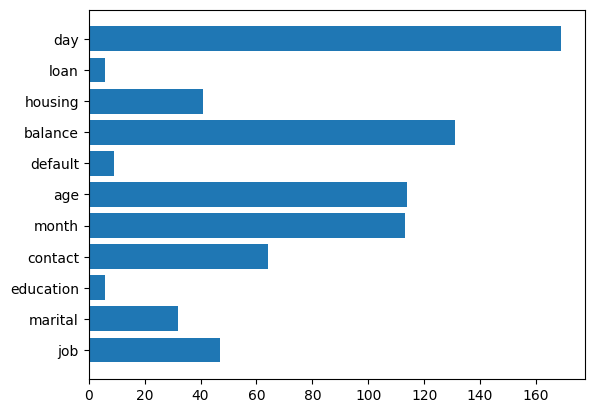

In [200]:
plt.barh(
    automl.model.feature_name_, automl.model.feature_importances_
)

### Train encoded

In [201]:
# Dynamically get the number of available CPU cores
num_cpus = multiprocessing.cpu_count()

# Log model info to MLflow in the main process
mlflow.set_experiment("flaml_parallel_experiment")
with mlflow.start_run():
    automl_e = AutoML()
    automl_e.fit(X_train_encoded.drop(columns='const'), y_train, **settings["automl"])

try:
    # Save the model
    with open("automl.pkl", "wb") as f:
        pickle.dump(automl, f)
except Exception as e:
    print("We could not save the model")
    print(e)

Traceback (most recent call last):
  File "c:\Users\Guill\miniconda3\envs\term_deposit\lib\site-packages\mlflow\store\tracking\file_store.py", line 327, in search_experiments
    exp = self._get_experiment(exp_id, view_type)
  File "c:\Users\Guill\miniconda3\envs\term_deposit\lib\site-packages\mlflow\store\tracking\file_store.py", line 421, in _get_experiment
    meta = FileStore._read_yaml(experiment_dir, FileStore.META_DATA_FILE_NAME)
  File "c:\Users\Guill\miniconda3\envs\term_deposit\lib\site-packages\mlflow\store\tracking\file_store.py", line 1367, in _read_yaml
    return _read_helper(root, file_name, attempts_remaining=retries)
  File "c:\Users\Guill\miniconda3\envs\term_deposit\lib\site-packages\mlflow\store\tracking\file_store.py", line 1360, in _read_helper
    result = read_yaml(root, file_name)
  File "c:\Users\Guill\miniconda3\envs\term_deposit\lib\site-packages\mlflow\utils\file_utils.py", line 309, in read_yaml
    raise MissingConfigException(f"Yaml file '{file_path}' d

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000513 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 693
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 47
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000641 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 693
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 47
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000713 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 696
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start training 

[flaml.automl: 11-06 22:34:38] {787} INFO -  at 0.3s,	best lgbm's error=0.9488,	best lgbm's error=0.9488
INFO:flaml.automl: at 0.3s,	best lgbm's error=0.9488,	best lgbm's error=0.9488
[flaml.automl: 11-06 22:34:38] {728} INFO - iteration 1  current learner lgbm
INFO:flaml.automl:iteration 1  current learner lgbm


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000596 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 697
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start training from score 2.411765
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000607 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 696
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start training from score 2.441446
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.001143 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 698
[LightGBM] [Info] Number of data points in the train set: 231

[flaml.automl: 11-06 22:34:39] {787} INFO -  at 0.7s,	best lgbm's error=0.9129,	best lgbm's error=0.9129
INFO:flaml.automl: at 0.7s,	best lgbm's error=0.9129,	best lgbm's error=0.9129
[flaml.automl: 11-06 22:34:39] {728} INFO - iteration 2  current learner lgbm
INFO:flaml.automl:iteration 2  current learner lgbm
[flaml.automl: 11-06 22:34:39] {787} INFO -  at 0.9s,	best lgbm's error=0.9077,	best lgbm's error=0.9077


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000879 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1038
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 47
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000694 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1038
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 47
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.020484 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1044
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start traini

INFO:flaml.automl: at 0.9s,	best lgbm's error=0.9077,	best lgbm's error=0.9077
[flaml.automl: 11-06 22:34:39] {728} INFO - iteration 3  current learner lgbm
INFO:flaml.automl:iteration 3  current learner lgbm


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000621 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 693
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 47
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000669 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 693
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 47
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000630 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 693
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 47
[LightGBM] [Info] Start training 

[flaml.automl: 11-06 22:34:40] {787} INFO -  at 1.6s,	best lgbm's error=0.9077,	best lgbm's error=0.9077
INFO:flaml.automl: at 1.6s,	best lgbm's error=0.9077,	best lgbm's error=0.9077
[flaml.automl: 11-06 22:34:40] {728} INFO - iteration 4  current learner lgbm
INFO:flaml.automl:iteration 4  current learner lgbm


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.002454 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1046
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start training from score 2.411765
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.001572 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 1040
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start training from score 2.441446
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000918 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1038
[LightGBM] [Info] Number of data points in the train set: 

[flaml.automl: 11-06 22:34:40] {787} INFO -  at 1.8s,	best lgbm's error=0.9035,	best lgbm's error=0.9035
INFO:flaml.automl: at 1.8s,	best lgbm's error=0.9035,	best lgbm's error=0.9035
[flaml.automl: 11-06 22:34:40] {728} INFO - iteration 5  current learner lgbm
INFO:flaml.automl:iteration 5  current learner lgbm


[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start training from score 2.383162
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000673 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1036
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start training from score 2.418780
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000778 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1046
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start training from score 2.411765
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000820 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] 

[flaml.automl: 11-06 22:34:40] {787} INFO -  at 2.2s,	best lgbm's error=0.8902,	best lgbm's error=0.8902
INFO:flaml.automl: at 2.2s,	best lgbm's error=0.8902,	best lgbm's error=0.8902
[flaml.automl: 11-06 22:34:40] {728} INFO - iteration 6  current learner lgbm
INFO:flaml.automl:iteration 6  current learner lgbm


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000704 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1040
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start training from score 2.441446
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000746 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1249
[LightGBM] [Info] Number of data points in the train set: 2316, number of used features: 47
[LightGBM] [Info] Start training from score 2.421848
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000900 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1249
[LightGBM] [Info] Number of data points in the train set: 2316, number of used features: 47
[LightGBM] [Info] Start traini

[flaml.automl: 11-06 22:34:41] {787} INFO -  at 2.7s,	best lgbm's error=0.8902,	best lgbm's error=0.8902
INFO:flaml.automl: at 2.7s,	best lgbm's error=0.8902,	best lgbm's error=0.8902
[flaml.automl: 11-06 22:34:41] {728} INFO - iteration 7  current learner xgboost
INFO:flaml.automl:iteration 7  current learner xgboost


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000590 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1040
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start training from score 2.441446


[flaml.automl: 11-06 22:34:41] {787} INFO -  at 3.2s,	best xgboost's error=0.9488,	best lgbm's error=0.8902
INFO:flaml.automl: at 3.2s,	best xgboost's error=0.9488,	best lgbm's error=0.8902
[flaml.automl: 11-06 22:34:41] {728} INFO - iteration 8  current learner extra_tree
INFO:flaml.automl:iteration 8  current learner extra_tree
[flaml.automl: 11-06 22:34:42] {787} INFO -  at 3.8s,	best extra_tree's error=1.4802,	best lgbm's error=0.8902
INFO:flaml.automl: at 3.8s,	best extra_tree's error=1.4802,	best lgbm's error=0.8902
[flaml.automl: 11-06 22:34:42] {728} INFO - iteration 9  current learner rf
INFO:flaml.automl:iteration 9  current learner rf
[flaml.automl: 11-06 22:34:43] {787} INFO -  at 4.4s,	best rf's error=1.2339,	best lgbm's error=0.8902
INFO:flaml.automl: at 4.4s,	best rf's error=1.2339,	best lgbm's error=0.8902
[flaml.automl: 11-06 22:34:43] {728} INFO - iteration 10  current learner extra_tree
INFO:flaml.automl:iteration 10  current learner extra_tree
[flaml.automl: 11-06 2

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000581 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 987
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 47
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000586 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 987
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 47
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000466 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 987
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 47
[LightGBM] [Info] Start training 

[flaml.automl: 11-06 22:34:45] {787} INFO -  at 6.9s,	best lgbm's error=0.8902,	best lgbm's error=0.8902
INFO:flaml.automl: at 6.9s,	best lgbm's error=0.8902,	best lgbm's error=0.8902
[flaml.automl: 11-06 22:34:45] {728} INFO - iteration 15  current learner extra_tree
INFO:flaml.automl:iteration 15  current learner extra_tree


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000830 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1036
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start training from score 2.418780
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000704 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1046
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start training from score 2.411765
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000653 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1040
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start traini

[flaml.automl: 11-06 22:34:46] {787} INFO -  at 7.4s,	best extra_tree's error=1.3704,	best lgbm's error=0.8902
INFO:flaml.automl: at 7.4s,	best extra_tree's error=1.3704,	best lgbm's error=0.8902
[flaml.automl: 11-06 22:34:46] {728} INFO - iteration 16  current learner xgboost
INFO:flaml.automl:iteration 16  current learner xgboost
[flaml.automl: 11-06 22:34:46] {787} INFO -  at 7.9s,	best xgboost's error=0.8989,	best lgbm's error=0.8902
INFO:flaml.automl: at 7.9s,	best xgboost's error=0.8989,	best lgbm's error=0.8902
[flaml.automl: 11-06 22:34:46] {728} INFO - iteration 17  current learner lgbm
INFO:flaml.automl:iteration 17  current learner lgbm


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000483 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 210
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 47
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001263 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 210
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 47
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000587 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 210
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 47
[LightGBM] [Info] Start training 

[flaml.automl: 11-06 22:34:47] {787} INFO -  at 8.5s,	best lgbm's error=0.8902,	best lgbm's error=0.8902
INFO:flaml.automl: at 8.5s,	best lgbm's error=0.8902,	best lgbm's error=0.8902
[flaml.automl: 11-06 22:34:47] {728} INFO - iteration 18  current learner lgbm
INFO:flaml.automl:iteration 18  current learner lgbm


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000709 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1046
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start training from score 2.411765
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000794 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1040
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start training from score 2.441446
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001158 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1038
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 47
[LightGBM] [Info] Start traini

[flaml.automl: 11-06 22:34:47] {787} INFO -  at 9.2s,	best lgbm's error=0.8902,	best lgbm's error=0.8902


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000652 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 312
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start training from score 2.383162
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000728 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 311
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start training from score 2.418780
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001699 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 317
[LightGBM] [Info] Number of data points in the train set: 185

INFO:flaml.automl: at 9.2s,	best lgbm's error=0.8902,	best lgbm's error=0.8902
[flaml.automl: 11-06 22:34:47] {728} INFO - iteration 19  current learner rf
INFO:flaml.automl:iteration 19  current learner rf
[flaml.automl: 11-06 22:34:49] {787} INFO -  at 10.4s,	best rf's error=1.0387,	best lgbm's error=0.8902
INFO:flaml.automl: at 10.4s,	best rf's error=1.0387,	best lgbm's error=0.8902
[flaml.automl: 11-06 22:34:49] {728} INFO - iteration 20  current learner lgbm
INFO:flaml.automl:iteration 20  current learner lgbm


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000787 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1038
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 47
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000496 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1038
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 47
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000539 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1038
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 47
[LightGBM] [Info] Start traini

[flaml.automl: 11-06 22:34:49] {787} INFO -  at 11.0s,	best lgbm's error=0.8902,	best lgbm's error=0.8902
INFO:flaml.automl: at 11.0s,	best lgbm's error=0.8902,	best lgbm's error=0.8902
[flaml.automl: 11-06 22:34:49] {728} INFO - iteration 21  current learner lgbm
INFO:flaml.automl:iteration 21  current learner lgbm


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000675 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 986
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start training from score 2.418780
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000683 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 995
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start training from score 2.411765
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001185 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 986
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start training 

[flaml.automl: 11-06 22:34:50] {787} INFO -  at 11.5s,	best lgbm's error=0.8902,	best lgbm's error=0.8902
INFO:flaml.automl: at 11.5s,	best lgbm's error=0.8902,	best lgbm's error=0.8902
[flaml.automl: 11-06 22:34:50] {728} INFO - iteration 22  current learner lgbm
INFO:flaml.automl:iteration 22  current learner lgbm


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000544 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 210
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 47
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000396 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 210
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start training from score 2.383162
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000269 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, y

[flaml.automl: 11-06 22:34:50] {787} INFO -  at 12.0s,	best lgbm's error=0.8902,	best lgbm's error=0.8902
INFO:flaml.automl: at 12.0s,	best lgbm's error=0.8902,	best lgbm's error=0.8902
[flaml.automl: 11-06 22:34:50] {728} INFO - iteration 23  current learner lgbm
INFO:flaml.automl:iteration 23  current learner lgbm


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.002256 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1038
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 47
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000849 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1038
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 47
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.004900 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 1038
[LightGBM] [Info] Number of data points in the train set: 

[flaml.automl: 11-06 22:34:51] {787} INFO -  at 12.6s,	best lgbm's error=0.8902,	best lgbm's error=0.8902
INFO:flaml.automl: at 12.6s,	best lgbm's error=0.8902,	best lgbm's error=0.8902


[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000612 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 992
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start training from score 2.383162
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000753 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 986
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start training from score 2.418780
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000682 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 995
[LightGBM] [Info] Number of data points in the train set: 1853, number o

[flaml.automl: 11-06 22:34:51] {728} INFO - iteration 24  current learner lgbm
INFO:flaml.automl:iteration 24  current learner lgbm


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000622 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1038
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 47
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000852 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1038
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 47
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000595 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1038
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 47
[LightGBM] [Info] Start traini

[flaml.automl: 11-06 22:34:52] {787} INFO -  at 13.4s,	best lgbm's error=0.8902,	best lgbm's error=0.8902
INFO:flaml.automl: at 13.4s,	best lgbm's error=0.8902,	best lgbm's error=0.8902
[flaml.automl: 11-06 22:34:52] {728} INFO - iteration 25  current learner lgbm
INFO:flaml.automl:iteration 25  current learner lgbm


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000272 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 146
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start training from score 2.441446
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000740 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1038
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 47
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000668 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1038
[LightGBM] [Info] Number of data points in the train set: 1

[flaml.automl: 11-06 22:34:52] {787} INFO -  at 13.9s,	best lgbm's error=0.8902,	best lgbm's error=0.8902
INFO:flaml.automl: at 13.9s,	best lgbm's error=0.8902,	best lgbm's error=0.8902
[flaml.automl: 11-06 22:34:52] {728} INFO - iteration 26  current learner lgbm
INFO:flaml.automl:iteration 26  current learner lgbm


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000363 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 317
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start training from score 2.411765
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000450 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 315
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start training from score 2.441446
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000527 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2

[flaml.automl: 11-06 22:34:52] {787} INFO -  at 14.3s,	best lgbm's error=0.8902,	best lgbm's error=0.8902
INFO:flaml.automl: at 14.3s,	best lgbm's error=0.8902,	best lgbm's error=0.8902
[flaml.automl: 11-06 22:34:52] {728} INFO - iteration 27  current learner lgbm
INFO:flaml.automl:iteration 27  current learner lgbm


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000633 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1038
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 47
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000494 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1038
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 47
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000633 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1038
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 47
[LightGBM] [Info] Start traini

[flaml.automl: 11-06 22:34:53] {787} INFO -  at 14.6s,	best lgbm's error=0.8902,	best lgbm's error=0.8902
INFO:flaml.automl: at 14.6s,	best lgbm's error=0.8902,	best lgbm's error=0.8902
[flaml.automl: 11-06 22:34:53] {728} INFO - iteration 28  current learner lgbm
INFO:flaml.automl:iteration 28  current learner lgbm


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000895 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 1044
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start training from score 2.383162
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000545 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1036
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start training from score 2.418780
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000608 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1046
[LightGBM] [Info] Number of data points in the train set: 

[flaml.automl: 11-06 22:34:53] {787} INFO -  at 15.1s,	best lgbm's error=0.8902,	best lgbm's error=0.8902
INFO:flaml.automl: at 15.1s,	best lgbm's error=0.8902,	best lgbm's error=0.8902
[flaml.automl: 11-06 22:34:53] {728} INFO - iteration 29  current learner lgbm
INFO:flaml.automl:iteration 29  current learner lgbm


[LightGBM] [Info] Total Bins 437
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 47
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000489 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 437
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 47
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000401 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 440
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start training from score 2.383162
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000503 seconds.
You can set `force_col_wise=true` to r

[flaml.automl: 11-06 22:34:54] {787} INFO -  at 15.5s,	best lgbm's error=0.8902,	best lgbm's error=0.8902
INFO:flaml.automl: at 15.5s,	best lgbm's error=0.8902,	best lgbm's error=0.8902
[flaml.automl: 11-06 22:34:54] {728} INFO - iteration 30  current learner lgbm
INFO:flaml.automl:iteration 30  current learner lgbm


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000570 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1046
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start training from score 2.411765
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000553 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1040
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start training from score 2.441446
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000514 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1038
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 47
[LightGBM] [Info] Start traini

[flaml.automl: 11-06 22:34:54] {787} INFO -  at 15.9s,	best lgbm's error=0.8902,	best lgbm's error=0.8902
INFO:flaml.automl: at 15.9s,	best lgbm's error=0.8902,	best lgbm's error=0.8902
[flaml.automl: 11-06 22:34:54] {728} INFO - iteration 31  current learner lgbm
INFO:flaml.automl:iteration 31  current learner lgbm


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000277 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 146
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start training from score 2.411765
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000226 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 146
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start training from score 2.441446
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000471 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1

[flaml.automl: 11-06 22:34:54] {787} INFO -  at 16.2s,	best lgbm's error=0.8902,	best lgbm's error=0.8902
INFO:flaml.automl: at 16.2s,	best lgbm's error=0.8902,	best lgbm's error=0.8902
[flaml.automl: 11-06 22:34:54] {728} INFO - iteration 32  current learner xgboost
INFO:flaml.automl:iteration 32  current learner xgboost


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000195 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 210
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 47
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000444 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 210
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 47
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000324 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, y

[flaml.automl: 11-06 22:34:55] {787} INFO -  at 16.8s,	best xgboost's error=0.8989,	best lgbm's error=0.8902
INFO:flaml.automl: at 16.8s,	best xgboost's error=0.8989,	best lgbm's error=0.8902
[flaml.automl: 11-06 22:34:55] {728} INFO - iteration 33  current learner lgbm
INFO:flaml.automl:iteration 33  current learner lgbm


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000648 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1038
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 47
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.049032 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 1038
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 47
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.001466 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins

[flaml.automl: 11-06 22:34:55] {787} INFO -  at 17.3s,	best lgbm's error=0.8902,	best lgbm's error=0.8902
INFO:flaml.automl: at 17.3s,	best lgbm's error=0.8902,	best lgbm's error=0.8902
[flaml.automl: 11-06 22:34:55] {728} INFO - iteration 34  current learner lgbm
INFO:flaml.automl:iteration 34  current learner lgbm


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000234 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 210
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start training from score 2.383162
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000259 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 210
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start training from score 2.418780
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000295 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, y

[flaml.automl: 11-06 22:34:56] {787} INFO -  at 17.7s,	best lgbm's error=0.8902,	best lgbm's error=0.8902
INFO:flaml.automl: at 17.7s,	best lgbm's error=0.8902,	best lgbm's error=0.8902
[flaml.automl: 11-06 22:34:56] {728} INFO - iteration 35  current learner rf
INFO:flaml.automl:iteration 35  current learner rf


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000747 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 986
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start training from score 2.441446


[flaml.automl: 11-06 22:34:57] {787} INFO -  at 18.8s,	best rf's error=1.0201,	best lgbm's error=0.8902
INFO:flaml.automl: at 18.8s,	best rf's error=1.0201,	best lgbm's error=0.8902
[flaml.automl: 11-06 22:34:57] {728} INFO - iteration 36  current learner lgbm
INFO:flaml.automl:iteration 36  current learner lgbm


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000756 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 987
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 47
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001927 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 987
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 47
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000806 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 987
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 47
[LightGBM] [Info] Start training 

[flaml.automl: 11-06 22:34:57] {787} INFO -  at 19.3s,	best lgbm's error=0.8902,	best lgbm's error=0.8902
INFO:flaml.automl: at 19.3s,	best lgbm's error=0.8902,	best lgbm's error=0.8902
[flaml.automl: 11-06 22:34:57] {728} INFO - iteration 37  current learner lgbm
INFO:flaml.automl:iteration 37  current learner lgbm


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000759 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1044
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start training from score 2.383162
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000659 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1036
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start training from score 2.418780
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000729 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1046
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start traini

[flaml.automl: 11-06 22:34:58] {787} INFO -  at 19.7s,	best lgbm's error=0.8902,	best lgbm's error=0.8902
INFO:flaml.automl: at 19.7s,	best lgbm's error=0.8902,	best lgbm's error=0.8902
[flaml.automl: 11-06 22:34:58] {728} INFO - iteration 38  current learner lgbm
INFO:flaml.automl:iteration 38  current learner lgbm


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001042 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1044
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start training from score 2.383162
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000643 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1036
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start training from score 2.418780
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000674 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1046
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start traini

[flaml.automl: 11-06 22:34:58] {787} INFO -  at 20.2s,	best lgbm's error=0.8902,	best lgbm's error=0.8902
INFO:flaml.automl: at 20.2s,	best lgbm's error=0.8902,	best lgbm's error=0.8902
[flaml.automl: 11-06 22:34:58] {728} INFO - iteration 39  current learner lgbm
INFO:flaml.automl:iteration 39  current learner lgbm


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000987 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1040
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start training from score 2.441446
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000275 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 313
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 47
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000473 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 313
[LightGBM] [Info] Number of data points in the train set: 18

[flaml.automl: 11-06 22:34:59] {787} INFO -  at 20.6s,	best lgbm's error=0.8902,	best lgbm's error=0.8902


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000601 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1038
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 47
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000766 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1038
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 47
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000773 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1038
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 47
[LightGBM] [Info] Start traini

INFO:flaml.automl: at 20.6s,	best lgbm's error=0.8902,	best lgbm's error=0.8902
[flaml.automl: 11-06 22:34:59] {728} INFO - iteration 40  current learner lgbm
INFO:flaml.automl:iteration 40  current learner lgbm


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001370 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1038
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 47
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001811 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1038
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 47
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000610 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1038
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 47
[LightGBM] [Info] Start traini

[flaml.automl: 11-06 22:34:59] {787} INFO -  at 21.2s,	best lgbm's error=0.8902,	best lgbm's error=0.8902
INFO:flaml.automl: at 21.2s,	best lgbm's error=0.8902,	best lgbm's error=0.8902
[flaml.automl: 11-06 22:34:59] {728} INFO - iteration 41  current learner lgbm
INFO:flaml.automl:iteration 41  current learner lgbm


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.002817 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 986
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start training from score 2.418780
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000726 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 995
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start training from score 2.411765
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000689 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 986
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start training 

[flaml.automl: 11-06 22:35:00] {787} INFO -  at 21.4s,	best lgbm's error=0.8877,	best lgbm's error=0.8877
INFO:flaml.automl: at 21.4s,	best lgbm's error=0.8877,	best lgbm's error=0.8877
[flaml.automl: 11-06 22:35:00] {728} INFO - iteration 42  current learner lgbm
INFO:flaml.automl:iteration 42  current learner lgbm


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000728 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start training from score 2.411765
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000256 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start training from score 2.441446
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000700 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, y

[flaml.automl: 11-06 22:35:00] {787} INFO -  at 21.9s,	best lgbm's error=0.8877,	best lgbm's error=0.8877
INFO:flaml.automl: at 21.9s,	best lgbm's error=0.8877,	best lgbm's error=0.8877
[flaml.automl: 11-06 22:35:00] {728} INFO - iteration 43  current learner lgbm
INFO:flaml.automl:iteration 43  current learner lgbm


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000243 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 146
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 47
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000248 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 146
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 47
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000333 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, y

[flaml.automl: 11-06 22:35:00] {787} INFO -  at 22.3s,	best lgbm's error=0.8877,	best lgbm's error=0.8877
INFO:flaml.automl: at 22.3s,	best lgbm's error=0.8877,	best lgbm's error=0.8877
[flaml.automl: 11-06 22:35:00] {728} INFO - iteration 44  current learner lgbm
INFO:flaml.automl:iteration 44  current learner lgbm


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000483 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 311
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start training from score 2.418780
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000429 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 317
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start training from score 2.411765
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000624 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 315
[LightGBM] [Info] Number of data points in the train set: 185

[flaml.automl: 11-06 22:35:01] {787} INFO -  at 22.7s,	best lgbm's error=0.8877,	best lgbm's error=0.8877
INFO:flaml.automl: at 22.7s,	best lgbm's error=0.8877,	best lgbm's error=0.8877
[flaml.automl: 11-06 22:35:01] {728} INFO - iteration 45  current learner lgbm
INFO:flaml.automl:iteration 45  current learner lgbm


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000542 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 146
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start training from score 2.383162
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000244 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 146
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start training from score 2.418780
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.001135 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, y

[flaml.automl: 11-06 22:35:01] {787} INFO -  at 23.1s,	best lgbm's error=0.8877,	best lgbm's error=0.8877
INFO:flaml.automl: at 23.1s,	best lgbm's error=0.8877,	best lgbm's error=0.8877
[flaml.automl: 11-06 22:35:01] {728} INFO - iteration 46  current learner lgbm
INFO:flaml.automl:iteration 46  current learner lgbm


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000488 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start training from score 2.441446
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000343 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 146
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 47
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000264 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, y

[flaml.automl: 11-06 22:35:01] {787} INFO -  at 23.4s,	best lgbm's error=0.8877,	best lgbm's error=0.8877
INFO:flaml.automl: at 23.4s,	best lgbm's error=0.8877,	best lgbm's error=0.8877
[flaml.automl: 11-06 22:35:01] {728} INFO - iteration 47  current learner lgbm
INFO:flaml.automl:iteration 47  current learner lgbm


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000332 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start training from score 2.418780
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.002078 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start training from score 2.411765
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000251 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, y

[flaml.automl: 11-06 22:35:02] {787} INFO -  at 23.8s,	best lgbm's error=0.8877,	best lgbm's error=0.8877
INFO:flaml.automl: at 23.8s,	best lgbm's error=0.8877,	best lgbm's error=0.8877
[flaml.automl: 11-06 22:35:02] {728} INFO - iteration 48  current learner rf
INFO:flaml.automl:iteration 48  current learner rf


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000569 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 992
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start training from score 2.383162
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000542 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 986
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start training from score 2.418780
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000698 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 995
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start training 

[flaml.automl: 11-06 22:35:03] {787} INFO -  at 25.0s,	best rf's error=0.9576,	best lgbm's error=0.8877
INFO:flaml.automl: at 25.0s,	best rf's error=0.9576,	best lgbm's error=0.8877
[flaml.automl: 11-06 22:35:03] {728} INFO - iteration 49  current learner lgbm
INFO:flaml.automl:iteration 49  current learner lgbm


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000218 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 313
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 47
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000636 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 313
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 47
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000717 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 313
[LightGBM] [Info] Number of data points in the train set: 185

[flaml.automl: 11-06 22:35:04] {787} INFO -  at 25.4s,	best lgbm's error=0.8877,	best lgbm's error=0.8877


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000353 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start training from score 2.383162
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000402 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start training from score 2.418780
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.021564 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, y

INFO:flaml.automl: at 25.4s,	best lgbm's error=0.8877,	best lgbm's error=0.8877
[flaml.automl: 11-06 22:35:04] {728} INFO - iteration 50  current learner lgbm
INFO:flaml.automl:iteration 50  current learner lgbm


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000258 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 47
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000301 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 47
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000286 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, y

[flaml.automl: 11-06 22:35:04] {787} INFO -  at 25.8s,	best lgbm's error=0.8877,	best lgbm's error=0.8877
INFO:flaml.automl: at 25.8s,	best lgbm's error=0.8877,	best lgbm's error=0.8877
[flaml.automl: 11-06 22:35:04] {728} INFO - iteration 51  current learner lgbm
INFO:flaml.automl:iteration 51  current learner lgbm


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000445 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 210
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start training from score 2.383162
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000524 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 210
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start training from score 2.418780
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000657 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 210
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start training 

[flaml.automl: 11-06 22:35:04] {787} INFO -  at 26.3s,	best lgbm's error=0.8877,	best lgbm's error=0.8877
INFO:flaml.automl: at 26.3s,	best lgbm's error=0.8877,	best lgbm's error=0.8877
[flaml.automl: 11-06 22:35:04] {728} INFO - iteration 52  current learner extra_tree
INFO:flaml.automl:iteration 52  current learner extra_tree


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000402 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start training from score 2.411765
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000279 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start training from score 2.441446


[flaml.automl: 11-06 22:35:05] {787} INFO -  at 26.9s,	best extra_tree's error=1.2363,	best lgbm's error=0.8877
INFO:flaml.automl: at 26.9s,	best extra_tree's error=1.2363,	best lgbm's error=0.8877
[flaml.automl: 11-06 22:35:05] {728} INFO - iteration 53  current learner lgbm
INFO:flaml.automl:iteration 53  current learner lgbm


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000213 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 146
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 47
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000234 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 146
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 47
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000239 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, y

[flaml.automl: 11-06 22:35:05] {787} INFO -  at 27.2s,	best lgbm's error=0.8877,	best lgbm's error=0.8877
INFO:flaml.automl: at 27.2s,	best lgbm's error=0.8877,	best lgbm's error=0.8877
[flaml.automl: 11-06 22:35:05] {728} INFO - iteration 54  current learner lgbm
INFO:flaml.automl:iteration 54  current learner lgbm


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.001345 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start training from score 2.383162
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000645 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start training from score 2.418780
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.001078 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, y

[flaml.automl: 11-06 22:35:06] {787} INFO -  at 27.6s,	best lgbm's error=0.8877,	best lgbm's error=0.8877


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000269 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 146
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start training from score 2.418780
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000533 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 146
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start training from score 2.411765
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000278 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, y

INFO:flaml.automl: at 27.6s,	best lgbm's error=0.8877,	best lgbm's error=0.8877
[flaml.automl: 11-06 22:35:06] {728} INFO - iteration 55  current learner lgbm
INFO:flaml.automl:iteration 55  current learner lgbm


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000448 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 313
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 47
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000809 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 313
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 47
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.001110 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, y

[flaml.automl: 11-06 22:35:06] {787} INFO -  at 27.9s,	best lgbm's error=0.8870,	best lgbm's error=0.8870
INFO:flaml.automl: at 27.9s,	best lgbm's error=0.8870,	best lgbm's error=0.8870
[flaml.automl: 11-06 22:35:06] {728} INFO - iteration 56  current learner lgbm
INFO:flaml.automl:iteration 56  current learner lgbm


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000229 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start training from score 2.418780
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000397 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start training from score 2.411765
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000412 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, y

[flaml.automl: 11-06 22:35:06] {787} INFO -  at 28.3s,	best lgbm's error=0.8870,	best lgbm's error=0.8870
INFO:flaml.automl: at 28.3s,	best lgbm's error=0.8870,	best lgbm's error=0.8870
[flaml.automl: 11-06 22:35:06] {728} INFO - iteration 57  current learner lgbm
INFO:flaml.automl:iteration 57  current learner lgbm


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000336 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start training from score 2.383162
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000188 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start training from score 2.418780
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000446 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, y

[flaml.automl: 11-06 22:35:07] {787} INFO -  at 28.6s,	best lgbm's error=0.8870,	best lgbm's error=0.8870
INFO:flaml.automl: at 28.6s,	best lgbm's error=0.8870,	best lgbm's error=0.8870
[flaml.automl: 11-06 22:35:07] {728} INFO - iteration 58  current learner rf
INFO:flaml.automl:iteration 58  current learner rf


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000273 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 47
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000432 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 47
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000289 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, y

[flaml.automl: 11-06 22:35:10] {787} INFO -  at 31.4s,	best rf's error=0.9576,	best lgbm's error=0.8870
INFO:flaml.automl: at 31.4s,	best rf's error=0.9576,	best lgbm's error=0.8870
[flaml.automl: 11-06 22:35:10] {728} INFO - iteration 59  current learner extra_tree
INFO:flaml.automl:iteration 59  current learner extra_tree
[flaml.automl: 11-06 22:35:10] {787} INFO -  at 32.0s,	best extra_tree's error=1.1833,	best lgbm's error=0.8870
INFO:flaml.automl: at 32.0s,	best extra_tree's error=1.1833,	best lgbm's error=0.8870
[flaml.automl: 11-06 22:35:10] {728} INFO - iteration 60  current learner lgbm
INFO:flaml.automl:iteration 60  current learner lgbm


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000205 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 47
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000265 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 47
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.001053 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, y

[flaml.automl: 11-06 22:35:10] {787} INFO -  at 32.3s,	best lgbm's error=0.8870,	best lgbm's error=0.8870
INFO:flaml.automl: at 32.3s,	best lgbm's error=0.8870,	best lgbm's error=0.8870
[flaml.automl: 11-06 22:35:10] {728} INFO - iteration 61  current learner lgbm
INFO:flaml.automl:iteration 61  current learner lgbm


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000696 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1046
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start training from score 2.411765
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001427 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1040
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start training from score 2.441446
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000233 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 146
[LightGBM] [Info] Number of data points in the train set: 1

[flaml.automl: 11-06 22:35:11] {787} INFO -  at 32.6s,	best lgbm's error=0.8870,	best lgbm's error=0.8870
INFO:flaml.automl: at 32.6s,	best lgbm's error=0.8870,	best lgbm's error=0.8870
[flaml.automl: 11-06 22:35:11] {728} INFO - iteration 62  current learner lgbm
INFO:flaml.automl:iteration 62  current learner lgbm


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000375 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 47
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000359 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 47
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000305 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, y

[flaml.automl: 11-06 22:35:11] {787} INFO -  at 33.0s,	best lgbm's error=0.8870,	best lgbm's error=0.8870
INFO:flaml.automl: at 33.0s,	best lgbm's error=0.8870,	best lgbm's error=0.8870
[flaml.automl: 11-06 22:35:11] {728} INFO - iteration 63  current learner extra_tree
INFO:flaml.automl:iteration 63  current learner extra_tree


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000250 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 146
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 47
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000862 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 146
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 47
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000249 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, y

[flaml.automl: 11-06 22:35:12] {787} INFO -  at 33.6s,	best extra_tree's error=1.1505,	best lgbm's error=0.8870
INFO:flaml.automl: at 33.6s,	best extra_tree's error=1.1505,	best lgbm's error=0.8870
[flaml.automl: 11-06 22:35:12] {728} INFO - iteration 64  current learner lgbm
INFO:flaml.automl:iteration 64  current learner lgbm


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000220 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 47
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000411 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 47
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000244 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, y

[flaml.automl: 11-06 22:35:12] {787} INFO -  at 33.9s,	best lgbm's error=0.8870,	best lgbm's error=0.8870
INFO:flaml.automl: at 33.9s,	best lgbm's error=0.8870,	best lgbm's error=0.8870
[flaml.automl: 11-06 22:35:12] {728} INFO - iteration 65  current learner lgbm
INFO:flaml.automl:iteration 65  current learner lgbm


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000278 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start training from score 2.411765
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000262 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start training from score 2.441446
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.038072 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, y

[flaml.automl: 11-06 22:35:12] {787} INFO -  at 34.3s,	best lgbm's error=0.8870,	best lgbm's error=0.8870


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000974 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start training from score 2.411765
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001198 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start training from score 2.441446
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000217 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2

INFO:flaml.automl: at 34.3s,	best lgbm's error=0.8870,	best lgbm's error=0.8870
[flaml.automl: 11-06 22:35:12] {728} INFO - iteration 66  current learner lgbm
INFO:flaml.automl:iteration 66  current learner lgbm


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000297 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 47
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000588 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 47
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000487 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, y

[flaml.automl: 11-06 22:35:13] {787} INFO -  at 34.7s,	best lgbm's error=0.8870,	best lgbm's error=0.8870
INFO:flaml.automl: at 34.7s,	best lgbm's error=0.8870,	best lgbm's error=0.8870
[flaml.automl: 11-06 22:35:13] {728} INFO - iteration 67  current learner lgbm
INFO:flaml.automl:iteration 67  current learner lgbm


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000329 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 146
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start training from score 2.418780
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.001906 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 146
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start training from score 2.411765
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.017088 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1

[flaml.automl: 11-06 22:35:13] {787} INFO -  at 35.0s,	best lgbm's error=0.8870,	best lgbm's error=0.8870
INFO:flaml.automl: at 35.0s,	best lgbm's error=0.8870,	best lgbm's error=0.8870
[flaml.automl: 11-06 22:35:13] {728} INFO - iteration 68  current learner lgbm
INFO:flaml.automl:iteration 68  current learner lgbm


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000821 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 311
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start training from score 2.418780
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000625 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 317
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start training from score 2.411765
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000481 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 315
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start training 

[flaml.automl: 11-06 22:35:13] {787} INFO -  at 35.3s,	best lgbm's error=0.8870,	best lgbm's error=0.8870
INFO:flaml.automl: at 35.3s,	best lgbm's error=0.8870,	best lgbm's error=0.8870
[flaml.automl: 11-06 22:35:13] {728} INFO - iteration 69  current learner lgbm
INFO:flaml.automl:iteration 69  current learner lgbm


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000277 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 47
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000281 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 47
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000439 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, y

[flaml.automl: 11-06 22:35:14] {787} INFO -  at 35.7s,	best lgbm's error=0.8870,	best lgbm's error=0.8870
INFO:flaml.automl: at 35.7s,	best lgbm's error=0.8870,	best lgbm's error=0.8870
[flaml.automl: 11-06 22:35:14] {728} INFO - iteration 70  current learner lgbm
INFO:flaml.automl:iteration 70  current learner lgbm


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000504 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 987
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 47
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000709 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 987
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 47
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000522 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 992
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start training 

[flaml.automl: 11-06 22:35:14] {787} INFO -  at 36.0s,	best lgbm's error=0.8870,	best lgbm's error=0.8870
INFO:flaml.automl: at 36.0s,	best lgbm's error=0.8870,	best lgbm's error=0.8870
[flaml.automl: 11-06 22:35:14] {728} INFO - iteration 71  current learner extra_tree
INFO:flaml.automl:iteration 71  current learner extra_tree


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000263 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start training from score 2.441446
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000863 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1038
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 47
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000631 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1038
[LightGBM] [Info] Number of data points in the train set: 1

[flaml.automl: 11-06 22:35:15] {787} INFO -  at 36.9s,	best extra_tree's error=1.1369,	best lgbm's error=0.8870
INFO:flaml.automl: at 36.9s,	best extra_tree's error=1.1369,	best lgbm's error=0.8870
[flaml.automl: 11-06 22:35:15] {728} INFO - iteration 72  current learner lgbm
INFO:flaml.automl:iteration 72  current learner lgbm


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000189 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 210
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 47
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000248 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 210
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 47
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000482 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2

[flaml.automl: 11-06 22:35:15] {787} INFO -  at 37.2s,	best lgbm's error=0.8870,	best lgbm's error=0.8870
INFO:flaml.automl: at 37.2s,	best lgbm's error=0.8870,	best lgbm's error=0.8870
[flaml.automl: 11-06 22:35:15] {728} INFO - iteration 73  current learner lgbm
INFO:flaml.automl:iteration 73  current learner lgbm


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000372 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start training from score 2.411765
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000674 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start training from score 2.441446
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000649 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 693
[LightGBM] [Info] Number of data points in the train set: 185

[flaml.automl: 11-06 22:35:16] {787} INFO -  at 37.5s,	best lgbm's error=0.8870,	best lgbm's error=0.8870
INFO:flaml.automl: at 37.5s,	best lgbm's error=0.8870,	best lgbm's error=0.8870
[flaml.automl: 11-06 22:35:16] {728} INFO - iteration 74  current learner lgbm
INFO:flaml.automl:iteration 74  current learner lgbm


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000211 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 47
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000202 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 47
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000361 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, y

[flaml.automl: 11-06 22:35:16] {787} INFO -  at 37.9s,	best lgbm's error=0.8870,	best lgbm's error=0.8870
INFO:flaml.automl: at 37.9s,	best lgbm's error=0.8870,	best lgbm's error=0.8870
[flaml.automl: 11-06 22:35:16] {728} INFO - iteration 75  current learner lgbm
INFO:flaml.automl:iteration 75  current learner lgbm


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000295 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start training from score 2.411765
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000373 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start training from score 2.441446
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000521 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 6

[flaml.automl: 11-06 22:35:16] {787} INFO -  at 38.2s,	best lgbm's error=0.8870,	best lgbm's error=0.8870
INFO:flaml.automl: at 38.2s,	best lgbm's error=0.8870,	best lgbm's error=0.8870
[flaml.automl: 11-06 22:35:16] {728} INFO - iteration 76  current learner lgbm
INFO:flaml.automl:iteration 76  current learner lgbm


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000223 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 47
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000267 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 47
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000217 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, y

[flaml.automl: 11-06 22:35:17] {787} INFO -  at 38.6s,	best lgbm's error=0.8870,	best lgbm's error=0.8870
INFO:flaml.automl: at 38.6s,	best lgbm's error=0.8870,	best lgbm's error=0.8870
[flaml.automl: 11-06 22:35:17] {728} INFO - iteration 77  current learner lgbm
INFO:flaml.automl:iteration 77  current learner lgbm


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000293 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start training from score 2.383162
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000230 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start training from score 2.418780
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000512 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, y

[flaml.automl: 11-06 22:35:17] {787} INFO -  at 38.9s,	best lgbm's error=0.8870,	best lgbm's error=0.8870


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000548 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 995
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start training from score 2.411765
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001190 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 986
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start training from score 2.441446
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000219 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 185

INFO:flaml.automl: at 38.9s,	best lgbm's error=0.8870,	best lgbm's error=0.8870
[flaml.automl: 11-06 22:35:17] {728} INFO - iteration 78  current learner lgbm
INFO:flaml.automl:iteration 78  current learner lgbm


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000785 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 437
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 47
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000690 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 437
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 47
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001653 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 437
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 47
[LightGBM] [Info] Start training 

[flaml.automl: 11-06 22:35:17] {787} INFO -  at 39.3s,	best lgbm's error=0.8870,	best lgbm's error=0.8870
INFO:flaml.automl: at 39.3s,	best lgbm's error=0.8870,	best lgbm's error=0.8870
[flaml.automl: 11-06 22:35:17] {728} INFO - iteration 79  current learner lgbm
INFO:flaml.automl:iteration 79  current learner lgbm


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000502 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 440
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start training from score 2.441446
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.001043 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 47
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000265 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 1

[flaml.automl: 11-06 22:35:18] {787} INFO -  at 39.6s,	best lgbm's error=0.8870,	best lgbm's error=0.8870
INFO:flaml.automl: at 39.6s,	best lgbm's error=0.8870,	best lgbm's error=0.8870
[flaml.automl: 11-06 22:35:18] {728} INFO - iteration 80  current learner lgbm
INFO:flaml.automl:iteration 80  current learner lgbm


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000764 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 695
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start training from score 2.418780
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000543 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 697
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start training from score 2.411765
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000561 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 696
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start training 

[flaml.automl: 11-06 22:35:18] {787} INFO -  at 40.0s,	best lgbm's error=0.8870,	best lgbm's error=0.8870
INFO:flaml.automl: at 40.0s,	best lgbm's error=0.8870,	best lgbm's error=0.8870
[flaml.automl: 11-06 22:35:18] {728} INFO - iteration 81  current learner lgbm
INFO:flaml.automl:iteration 81  current learner lgbm


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000483 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 210
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start training from score 2.411765
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000549 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 210
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start training from score 2.441446
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000647 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 185

[flaml.automl: 11-06 22:35:18] {787} INFO -  at 40.3s,	best lgbm's error=0.8870,	best lgbm's error=0.8870
INFO:flaml.automl: at 40.3s,	best lgbm's error=0.8870,	best lgbm's error=0.8870
[flaml.automl: 11-06 22:35:18] {728} INFO - iteration 82  current learner lgbm
INFO:flaml.automl:iteration 82  current learner lgbm


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000770 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 210
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 47
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000787 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 210
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start training from score 2.383162
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000295 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2

[flaml.automl: 11-06 22:35:19] {787} INFO -  at 40.7s,	best lgbm's error=0.8870,	best lgbm's error=0.8870
INFO:flaml.automl: at 40.7s,	best lgbm's error=0.8870,	best lgbm's error=0.8870
[flaml.automl: 11-06 22:35:19] {728} INFO - iteration 83  current learner lgbm
INFO:flaml.automl:iteration 83  current learner lgbm


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000611 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 986
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start training from score 2.441446
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000342 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 47
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000253 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 1

[flaml.automl: 11-06 22:35:19] {787} INFO -  at 41.0s,	best lgbm's error=0.8870,	best lgbm's error=0.8870
INFO:flaml.automl: at 41.0s,	best lgbm's error=0.8870,	best lgbm's error=0.8870
[flaml.automl: 11-06 22:35:19] {728} INFO - iteration 84  current learner lgbm
INFO:flaml.automl:iteration 84  current learner lgbm


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000522 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 437
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 47
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001457 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 440
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start training from score 2.383162
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000499 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 439
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start training 

[flaml.automl: 11-06 22:35:19] {787} INFO -  at 41.3s,	best lgbm's error=0.8870,	best lgbm's error=0.8870


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000341 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 210
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start training from score 2.418780
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000938 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 210
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start training from score 2.411765
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001111 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 210
[LightGBM] [Info] Number of data points in the train set: 185

INFO:flaml.automl: at 41.3s,	best lgbm's error=0.8870,	best lgbm's error=0.8870
[flaml.automl: 11-06 22:35:19] {728} INFO - iteration 85  current learner lgbm
INFO:flaml.automl:iteration 85  current learner lgbm


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000237 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 47
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.044965 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 47
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000261 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, y

[flaml.automl: 11-06 22:35:20] {787} INFO -  at 41.7s,	best lgbm's error=0.8870,	best lgbm's error=0.8870


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000269 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start training from score 2.418780
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000405 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start training from score 2.411765
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000227 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, y

INFO:flaml.automl: at 41.7s,	best lgbm's error=0.8870,	best lgbm's error=0.8870
[flaml.automl: 11-06 22:35:20] {728} INFO - iteration 86  current learner lgbm
INFO:flaml.automl:iteration 86  current learner lgbm


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000204 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 47
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000244 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 47
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000411 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, y

[flaml.automl: 11-06 22:35:20] {787} INFO -  at 42.0s,	best lgbm's error=0.8870,	best lgbm's error=0.8870
INFO:flaml.automl: at 42.0s,	best lgbm's error=0.8870,	best lgbm's error=0.8870
[flaml.automl: 11-06 22:35:20] {728} INFO - iteration 87  current learner lgbm
INFO:flaml.automl:iteration 87  current learner lgbm


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000454 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 210
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 47
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000520 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 210
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start training from score 2.383162
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000493 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 210
[LightGBM] [Info] Number of data points in the train set: 185

[flaml.automl: 11-06 22:35:21] {787} INFO -  at 42.5s,	best lgbm's error=0.8870,	best lgbm's error=0.8870
INFO:flaml.automl: at 42.5s,	best lgbm's error=0.8870,	best lgbm's error=0.8870
[flaml.automl: 11-06 22:35:21] {728} INFO - iteration 88  current learner lgbm
INFO:flaml.automl:iteration 88  current learner lgbm


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000457 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 441
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start training from score 2.411765
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000567 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 440
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start training from score 2.441446
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000219 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 185

[flaml.automl: 11-06 22:35:21] {787} INFO -  at 42.8s,	best lgbm's error=0.8870,	best lgbm's error=0.8870
INFO:flaml.automl: at 42.8s,	best lgbm's error=0.8870,	best lgbm's error=0.8870
[flaml.automl: 11-06 22:35:21] {728} INFO - iteration 89  current learner lgbm
INFO:flaml.automl:iteration 89  current learner lgbm


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000256 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start training from score 2.418780
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000596 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start training from score 2.411765
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000192 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 1

[flaml.automl: 11-06 22:35:21] {787} INFO -  at 43.1s,	best lgbm's error=0.8870,	best lgbm's error=0.8870


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000204 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start training from score 2.441446
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000946 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 987
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 47
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000884 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 987
[LightGBM] [Info] Number of data points in the train set: 185

INFO:flaml.automl: at 43.1s,	best lgbm's error=0.8870,	best lgbm's error=0.8870
[flaml.automl: 11-06 22:35:21] {728} INFO - iteration 90  current learner lgbm
INFO:flaml.automl:iteration 90  current learner lgbm


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000476 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 47
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000312 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 47
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000285 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, y

[flaml.automl: 11-06 22:35:22] {787} INFO -  at 43.4s,	best lgbm's error=0.8870,	best lgbm's error=0.8870
INFO:flaml.automl: at 43.4s,	best lgbm's error=0.8870,	best lgbm's error=0.8870
[flaml.automl: 11-06 22:35:22] {728} INFO - iteration 91  current learner lgbm
INFO:flaml.automl:iteration 91  current learner lgbm


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000400 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 210
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start training from score 2.418780
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000569 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 210
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start training from score 2.411765
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000479 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 210
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start training 

[flaml.automl: 11-06 22:35:22] {787} INFO -  at 43.8s,	best lgbm's error=0.8870,	best lgbm's error=0.8870


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000513 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 47
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000222 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 47
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000314 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 1

INFO:flaml.automl: at 43.8s,	best lgbm's error=0.8870,	best lgbm's error=0.8870
[flaml.automl: 11-06 22:35:22] {728} INFO - iteration 92  current learner lgbm
INFO:flaml.automl:iteration 92  current learner lgbm


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000269 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 47
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000348 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 47
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000262 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, y

[flaml.automl: 11-06 22:35:22] {787} INFO -  at 44.1s,	best lgbm's error=0.8870,	best lgbm's error=0.8870
INFO:flaml.automl: at 44.1s,	best lgbm's error=0.8870,	best lgbm's error=0.8870
[flaml.automl: 11-06 22:35:22] {728} INFO - iteration 93  current learner lgbm
INFO:flaml.automl:iteration 93  current learner lgbm


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000253 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start training from score 2.383162
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000445 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start training from score 2.418780
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000327 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, y

[flaml.automl: 11-06 22:35:23] {787} INFO -  at 44.5s,	best lgbm's error=0.8870,	best lgbm's error=0.8870


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001300 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start training from score 2.411765
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000286 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start training from score 2.441446
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000258 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 1

INFO:flaml.automl: at 44.5s,	best lgbm's error=0.8870,	best lgbm's error=0.8870
[flaml.automl: 11-06 22:35:23] {728} INFO - iteration 94  current learner lgbm
INFO:flaml.automl:iteration 94  current learner lgbm


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000642 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 693
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 47
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001179 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 693
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 47
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000464 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 696
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start training 

[flaml.automl: 11-06 22:35:23] {787} INFO -  at 44.8s,	best lgbm's error=0.8870,	best lgbm's error=0.8870
INFO:flaml.automl: at 44.8s,	best lgbm's error=0.8870,	best lgbm's error=0.8870
[flaml.automl: 11-06 22:35:23] {728} INFO - iteration 95  current learner lgbm
INFO:flaml.automl:iteration 95  current learner lgbm


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000540 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start training from score 2.418780
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000329 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start training from score 2.411765
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000334 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, y

[flaml.automl: 11-06 22:35:23] {787} INFO -  at 45.2s,	best lgbm's error=0.8870,	best lgbm's error=0.8870
INFO:flaml.automl: at 45.2s,	best lgbm's error=0.8870,	best lgbm's error=0.8870
[flaml.automl: 11-06 22:35:23] {728} INFO - iteration 96  current learner lgbm
INFO:flaml.automl:iteration 96  current learner lgbm


[LightGBM] [Info] Start training from score 2.411765
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000756 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 440
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start training from score 2.441446
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000241 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 47
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000294 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set 

[flaml.automl: 11-06 22:35:24] {787} INFO -  at 45.5s,	best lgbm's error=0.8870,	best lgbm's error=0.8870
INFO:flaml.automl: at 45.5s,	best lgbm's error=0.8870,	best lgbm's error=0.8870
[flaml.automl: 11-06 22:35:24] {728} INFO - iteration 97  current learner lgbm
INFO:flaml.automl:iteration 97  current learner lgbm


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000226 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 146
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 47
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000248 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 146
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start training from score 2.383162
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000817 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, y

[flaml.automl: 11-06 22:35:24] {787} INFO -  at 45.9s,	best lgbm's error=0.8870,	best lgbm's error=0.8870
INFO:flaml.automl: at 45.9s,	best lgbm's error=0.8870,	best lgbm's error=0.8870
[flaml.automl: 11-06 22:35:24] {728} INFO - iteration 98  current learner lgbm
INFO:flaml.automl:iteration 98  current learner lgbm


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.024586 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 47
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000408 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 47
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000264 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, y

[flaml.automl: 11-06 22:35:24] {787} INFO -  at 46.2s,	best lgbm's error=0.8870,	best lgbm's error=0.8870
INFO:flaml.automl: at 46.2s,	best lgbm's error=0.8870,	best lgbm's error=0.8870
[flaml.automl: 11-06 22:35:24] {728} INFO - iteration 99  current learner lgbm
INFO:flaml.automl:iteration 99  current learner lgbm


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000330 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start training from score 2.441446
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000447 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 210
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 47
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000491 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 210
[LightGBM] [Info] Number of data points in the train set: 185

[flaml.automl: 11-06 22:35:25] {787} INFO -  at 46.6s,	best lgbm's error=0.8870,	best lgbm's error=0.8870


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000271 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start training from score 2.383162
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000272 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start training from score 2.418780
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000429 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, y

INFO:flaml.automl: at 46.6s,	best lgbm's error=0.8870,	best lgbm's error=0.8870
[flaml.automl: 11-06 22:35:25] {728} INFO - iteration 100  current learner lgbm
INFO:flaml.automl:iteration 100  current learner lgbm


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000276 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 47
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000258 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 47
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000885 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1

[flaml.automl: 11-06 22:35:25] {787} INFO -  at 47.0s,	best lgbm's error=0.8870,	best lgbm's error=0.8870
INFO:flaml.automl: at 47.0s,	best lgbm's error=0.8870,	best lgbm's error=0.8870
[flaml.automl: 11-06 22:35:25] {728} INFO - iteration 101  current learner lgbm
INFO:flaml.automl:iteration 101  current learner lgbm


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000219 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 210
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start training from score 2.418780
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000542 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 210
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start training from score 2.411765
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000448 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2

[flaml.automl: 11-06 22:35:25] {787} INFO -  at 47.4s,	best lgbm's error=0.8870,	best lgbm's error=0.8870
INFO:flaml.automl: at 47.4s,	best lgbm's error=0.8870,	best lgbm's error=0.8870
[flaml.automl: 11-06 22:35:25] {728} INFO - iteration 102  current learner lgbm
INFO:flaml.automl:iteration 102  current learner lgbm


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000471 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 47
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000361 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 47
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000357 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, y

[flaml.automl: 11-06 22:35:26] {787} INFO -  at 47.7s,	best lgbm's error=0.8870,	best lgbm's error=0.8870
INFO:flaml.automl: at 47.7s,	best lgbm's error=0.8870,	best lgbm's error=0.8870
[flaml.automl: 11-06 22:35:26] {728} INFO - iteration 103  current learner lgbm
INFO:flaml.automl:iteration 103  current learner lgbm


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000237 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 146
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start training from score 2.383162
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000311 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 146
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start training from score 2.418780
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000458 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, y

[flaml.automl: 11-06 22:35:26] {787} INFO -  at 48.1s,	best lgbm's error=0.8870,	best lgbm's error=0.8870
INFO:flaml.automl: at 48.1s,	best lgbm's error=0.8870,	best lgbm's error=0.8870
[flaml.automl: 11-06 22:35:26] {728} INFO - iteration 104  current learner lgbm
INFO:flaml.automl:iteration 104  current learner lgbm


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.010024 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start training from score 2.441446
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000876 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1038
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 47
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000791 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1038
[LightGBM] [Info] Number of data points in the train set: 1

[flaml.automl: 11-06 22:35:27] {787} INFO -  at 48.4s,	best lgbm's error=0.8870,	best lgbm's error=0.8870
INFO:flaml.automl: at 48.4s,	best lgbm's error=0.8870,	best lgbm's error=0.8870
[flaml.automl: 11-06 22:35:27] {728} INFO - iteration 105  current learner lgbm
INFO:flaml.automl:iteration 105  current learner lgbm


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000305 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 47
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000243 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 47
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000406 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, y

[flaml.automl: 11-06 22:35:27] {787} INFO -  at 48.8s,	best lgbm's error=0.8870,	best lgbm's error=0.8870
INFO:flaml.automl: at 48.8s,	best lgbm's error=0.8870,	best lgbm's error=0.8870
[flaml.automl: 11-06 22:35:27] {728} INFO - iteration 106  current learner lgbm
INFO:flaml.automl:iteration 106  current learner lgbm


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000710 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 696
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start training from score 2.383162
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000555 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 695
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start training from score 2.418780
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000590 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 697
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start training 

[flaml.automl: 11-06 22:35:27] {787} INFO -  at 49.1s,	best lgbm's error=0.8870,	best lgbm's error=0.8870
INFO:flaml.automl: at 49.1s,	best lgbm's error=0.8870,	best lgbm's error=0.8870
[flaml.automl: 11-06 22:35:27] {728} INFO - iteration 107  current learner lgbm
INFO:flaml.automl:iteration 107  current learner lgbm


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000264 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 146
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start training from score 2.411765
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000792 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 146
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start training from score 2.441446
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000425 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 1

[flaml.automl: 11-06 22:35:28] {787} INFO -  at 49.5s,	best lgbm's error=0.8870,	best lgbm's error=0.8870
INFO:flaml.automl: at 49.5s,	best lgbm's error=0.8870,	best lgbm's error=0.8870
[flaml.automl: 11-06 22:35:28] {728} INFO - iteration 108  current learner lgbm
INFO:flaml.automl:iteration 108  current learner lgbm


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.033475 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 47
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000250 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start training from score 2.383162
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000315 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, y

[flaml.automl: 11-06 22:35:28] {787} INFO -  at 49.8s,	best lgbm's error=0.8870,	best lgbm's error=0.8870
INFO:flaml.automl: at 49.8s,	best lgbm's error=0.8870,	best lgbm's error=0.8870
[flaml.automl: 11-06 22:35:28] {728} INFO - iteration 109  current learner lgbm
INFO:flaml.automl:iteration 109  current learner lgbm


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000244 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start training from score 2.441446
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000239 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 210
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 47
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000722 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2

[flaml.automl: 11-06 22:35:28] {787} INFO -  at 50.1s,	best lgbm's error=0.8870,	best lgbm's error=0.8870
INFO:flaml.automl: at 50.1s,	best lgbm's error=0.8870,	best lgbm's error=0.8870
[flaml.automl: 11-06 22:35:28] {728} INFO - iteration 110  current learner lgbm
INFO:flaml.automl:iteration 110  current learner lgbm


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000250 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 47
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000239 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start training from score 2.383162
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000281 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, y

[flaml.automl: 11-06 22:35:29] {787} INFO -  at 50.6s,	best lgbm's error=0.8870,	best lgbm's error=0.8870
INFO:flaml.automl: at 50.6s,	best lgbm's error=0.8870,	best lgbm's error=0.8870
[flaml.automl: 11-06 22:35:29] {728} INFO - iteration 111  current learner lgbm
INFO:flaml.automl:iteration 111  current learner lgbm


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000610 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 210
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start training from score 2.383162
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000550 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 210
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start training from score 2.418780
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000567 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 210
[LightGBM] [Info] Number of data points in the train set: 185

[flaml.automl: 11-06 22:35:29] {787} INFO -  at 50.9s,	best lgbm's error=0.8870,	best lgbm's error=0.8870
INFO:flaml.automl: at 50.9s,	best lgbm's error=0.8870,	best lgbm's error=0.8870
[flaml.automl: 11-06 22:35:29] {728} INFO - iteration 112  current learner lgbm
INFO:flaml.automl:iteration 112  current learner lgbm


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000978 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 696
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start training from score 2.441446
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000463 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 47
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000508 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 185

[flaml.automl: 11-06 22:35:29] {787} INFO -  at 51.3s,	best lgbm's error=0.8870,	best lgbm's error=0.8870
INFO:flaml.automl: at 51.3s,	best lgbm's error=0.8870,	best lgbm's error=0.8870


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.002127 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 210
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start training from score 2.441446
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000281 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 47
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000240 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, y

[flaml.automl: 11-06 22:35:29] {728} INFO - iteration 113  current learner lgbm
INFO:flaml.automl:iteration 113  current learner lgbm


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000617 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 693
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 47
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000586 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 693
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 47
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000882 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 6

[flaml.automl: 11-06 22:35:30] {787} INFO -  at 51.6s,	best lgbm's error=0.8870,	best lgbm's error=0.8870
INFO:flaml.automl: at 51.6s,	best lgbm's error=0.8870,	best lgbm's error=0.8870
[flaml.automl: 11-06 22:35:30] {728} INFO - iteration 114  current learner lgbm
INFO:flaml.automl:iteration 114  current learner lgbm


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000184 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 47
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000218 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 47
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000601 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, y

[flaml.automl: 11-06 22:35:30] {787} INFO -  at 52.1s,	best lgbm's error=0.8870,	best lgbm's error=0.8870
INFO:flaml.automl: at 52.1s,	best lgbm's error=0.8870,	best lgbm's error=0.8870
[flaml.automl: 11-06 22:35:30] {728} INFO - iteration 115  current learner lgbm
INFO:flaml.automl:iteration 115  current learner lgbm


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000238 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start training from score 2.418780
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000312 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start training from score 2.411765
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000213 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, y

[flaml.automl: 11-06 22:35:31] {787} INFO -  at 52.4s,	best lgbm's error=0.8870,	best lgbm's error=0.8870
INFO:flaml.automl: at 52.4s,	best lgbm's error=0.8870,	best lgbm's error=0.8870
[flaml.automl: 11-06 22:35:31] {728} INFO - iteration 116  current learner lgbm
INFO:flaml.automl:iteration 116  current learner lgbm


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000766 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 437
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 47
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000590 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 440
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start training from score 2.383162
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000817 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 439
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start training 

[flaml.automl: 11-06 22:35:31] {787} INFO -  at 52.8s,	best lgbm's error=0.8870,	best lgbm's error=0.8870
INFO:flaml.automl: at 52.8s,	best lgbm's error=0.8870,	best lgbm's error=0.8870
[flaml.automl: 11-06 22:35:31] {728} INFO - iteration 117  current learner lgbm
INFO:flaml.automl:iteration 117  current learner lgbm


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000282 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start training from score 2.383162
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000195 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start training from score 2.418780
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000283 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, y

[flaml.automl: 11-06 22:35:31] {787} INFO -  at 53.1s,	best lgbm's error=0.8870,	best lgbm's error=0.8870


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000969 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 210
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start training from score 2.411765
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000519 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 210
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start training from score 2.441446
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000284 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 185

INFO:flaml.automl: at 53.1s,	best lgbm's error=0.8870,	best lgbm's error=0.8870
[flaml.automl: 11-06 22:35:31] {728} INFO - iteration 118  current learner lgbm
INFO:flaml.automl:iteration 118  current learner lgbm


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000245 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 47
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000247 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 47
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000300 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, y

[flaml.automl: 11-06 22:35:32] {787} INFO -  at 53.5s,	best lgbm's error=0.8870,	best lgbm's error=0.8870
INFO:flaml.automl: at 53.5s,	best lgbm's error=0.8870,	best lgbm's error=0.8870
[flaml.automl: 11-06 22:35:32] {728} INFO - iteration 119  current learner lgbm
INFO:flaml.automl:iteration 119  current learner lgbm


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000255 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 47
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000326 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 47
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000216 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, y

[flaml.automl: 11-06 22:35:32] {787} INFO -  at 53.8s,	best lgbm's error=0.8870,	best lgbm's error=0.8870
INFO:flaml.automl: at 53.8s,	best lgbm's error=0.8870,	best lgbm's error=0.8870
[flaml.automl: 11-06 22:35:32] {728} INFO - iteration 120  current learner lgbm
INFO:flaml.automl:iteration 120  current learner lgbm


[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start training from score 2.441446
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000338 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 47
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.001287 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 47
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing row-wise multi-

[flaml.automl: 11-06 22:35:32] {787} INFO -  at 54.2s,	best lgbm's error=0.8870,	best lgbm's error=0.8870
INFO:flaml.automl: at 54.2s,	best lgbm's error=0.8870,	best lgbm's error=0.8870
[flaml.automl: 11-06 22:35:32] {728} INFO - iteration 121  current learner lgbm
INFO:flaml.automl:iteration 121  current learner lgbm


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.004811 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 313
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 47
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000548 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 313
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 47
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000515 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 313
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 47
[LightGBM] [Info] Start training 

[flaml.automl: 11-06 22:35:33] {787} INFO -  at 54.5s,	best lgbm's error=0.8870,	best lgbm's error=0.8870
INFO:flaml.automl: at 54.5s,	best lgbm's error=0.8870,	best lgbm's error=0.8870
[flaml.automl: 11-06 22:35:33] {728} INFO - iteration 122  current learner lgbm
INFO:flaml.automl:iteration 122  current learner lgbm


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000208 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start training from score 2.441446
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000263 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 47
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000434 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, y

[flaml.automl: 11-06 22:35:33] {787} INFO -  at 54.9s,	best lgbm's error=0.8870,	best lgbm's error=0.8870
INFO:flaml.automl: at 54.9s,	best lgbm's error=0.8870,	best lgbm's error=0.8870
[flaml.automl: 11-06 22:35:33] {728} INFO - iteration 123  current learner lgbm
INFO:flaml.automl:iteration 123  current learner lgbm


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000206 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 146
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start training from score 2.383162
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000225 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 146
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start training from score 2.418780
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000327 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, y

[flaml.automl: 11-06 22:35:33] {787} INFO -  at 55.2s,	best lgbm's error=0.8870,	best lgbm's error=0.8870
INFO:flaml.automl: at 55.2s,	best lgbm's error=0.8870,	best lgbm's error=0.8870
[flaml.automl: 11-06 22:35:33] {728} INFO - iteration 124  current learner lgbm
INFO:flaml.automl:iteration 124  current learner lgbm


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000232 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 210
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start training from score 2.418780
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000357 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 210
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start training from score 2.411765
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000807 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2

[flaml.automl: 11-06 22:35:34] {787} INFO -  at 55.6s,	best lgbm's error=0.8870,	best lgbm's error=0.8870
INFO:flaml.automl: at 55.6s,	best lgbm's error=0.8870,	best lgbm's error=0.8870
[flaml.automl: 11-06 22:35:34] {728} INFO - iteration 125  current learner lgbm
INFO:flaml.automl:iteration 125  current learner lgbm


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000225 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 47
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.001781 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 47
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.001073 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, y

[flaml.automl: 11-06 22:35:34] {787} INFO -  at 56.0s,	best lgbm's error=0.8870,	best lgbm's error=0.8870
INFO:flaml.automl: at 56.0s,	best lgbm's error=0.8870,	best lgbm's error=0.8870
[flaml.automl: 11-06 22:35:34] {728} INFO - iteration 126  current learner lgbm
INFO:flaml.automl:iteration 126  current learner lgbm


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.002268 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 146
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 47
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000408 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 146
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start training from score 2.383162
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000686 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, y

[flaml.automl: 11-06 22:35:34] {787} INFO -  at 56.2s,	best lgbm's error=0.8870,	best lgbm's error=0.8870
INFO:flaml.automl: at 56.2s,	best lgbm's error=0.8870,	best lgbm's error=0.8870
[flaml.automl: 11-06 22:35:34] {728} INFO - iteration 127  current learner lgbm
INFO:flaml.automl:iteration 127  current learner lgbm


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000269 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start training from score 2.441446
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000248 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 47
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000285 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, y

[flaml.automl: 11-06 22:35:35] {787} INFO -  at 56.7s,	best lgbm's error=0.8870,	best lgbm's error=0.8870
INFO:flaml.automl: at 56.7s,	best lgbm's error=0.8870,	best lgbm's error=0.8870
[flaml.automl: 11-06 22:35:35] {728} INFO - iteration 128  current learner lgbm
INFO:flaml.automl:iteration 128  current learner lgbm


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000631 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 696
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start training from score 2.441446
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000372 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 47
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000234 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 1

[flaml.automl: 11-06 22:35:35] {787} INFO -  at 57.0s,	best lgbm's error=0.8870,	best lgbm's error=0.8870
INFO:flaml.automl: at 57.0s,	best lgbm's error=0.8870,	best lgbm's error=0.8870
[flaml.automl: 11-06 22:35:35] {728} INFO - iteration 129  current learner lgbm
INFO:flaml.automl:iteration 129  current learner lgbm


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001069 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 440
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start training from score 2.441446
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000345 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 47
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000345 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 1

[flaml.automl: 11-06 22:35:36] {787} INFO -  at 57.5s,	best lgbm's error=0.8870,	best lgbm's error=0.8870
INFO:flaml.automl: at 57.5s,	best lgbm's error=0.8870,	best lgbm's error=0.8870
[flaml.automl: 11-06 22:35:36] {728} INFO - iteration 130  current learner lgbm
INFO:flaml.automl:iteration 130  current learner lgbm


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.001333 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start training from score 2.411765
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000259 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start training from score 2.441446
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000288 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, y

[flaml.automl: 11-06 22:35:36] {787} INFO -  at 57.8s,	best lgbm's error=0.8870,	best lgbm's error=0.8870
INFO:flaml.automl: at 57.8s,	best lgbm's error=0.8870,	best lgbm's error=0.8870
[flaml.automl: 11-06 22:35:36] {728} INFO - iteration 131  current learner lgbm
INFO:flaml.automl:iteration 131  current learner lgbm


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000292 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 47
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000293 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 47
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000675 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, y

[flaml.automl: 11-06 22:35:36] {787} INFO -  at 58.3s,	best lgbm's error=0.8870,	best lgbm's error=0.8870
INFO:flaml.automl: at 58.3s,	best lgbm's error=0.8870,	best lgbm's error=0.8870
[flaml.automl: 11-06 22:35:36] {728} INFO - iteration 132  current learner lgbm
INFO:flaml.automl:iteration 132  current learner lgbm


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.019326 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start training from score 2.383162
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000285 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start training from score 2.418780
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000431 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, y

[flaml.automl: 11-06 22:35:37] {787} INFO -  at 58.6s,	best lgbm's error=0.8870,	best lgbm's error=0.8870
INFO:flaml.automl: at 58.6s,	best lgbm's error=0.8870,	best lgbm's error=0.8870
[flaml.automl: 11-06 22:35:37] {728} INFO - iteration 133  current learner lgbm
INFO:flaml.automl:iteration 133  current learner lgbm


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000286 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 47
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000358 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 47
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000675 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, y

[flaml.automl: 11-06 22:35:37] {787} INFO -  at 58.9s,	best lgbm's error=0.8870,	best lgbm's error=0.8870
INFO:flaml.automl: at 58.9s,	best lgbm's error=0.8870,	best lgbm's error=0.8870
[flaml.automl: 11-06 22:35:37] {728} INFO - iteration 134  current learner rf
INFO:flaml.automl:iteration 134  current learner rf


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000265 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 146
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start training from score 2.418780
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000420 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 146
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start training from score 2.411765
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000275 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, y

[flaml.automl: 11-06 22:35:40] {787} INFO -  at 62.0s,	best rf's error=0.9576,	best lgbm's error=0.8870
INFO:flaml.automl: at 62.0s,	best rf's error=0.9576,	best lgbm's error=0.8870
[flaml.automl: 11-06 22:35:40] {728} INFO - iteration 135  current learner lgbm
INFO:flaml.automl:iteration 135  current learner lgbm


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000223 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 47
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000249 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 47
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000611 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1

[flaml.automl: 11-06 22:35:40] {787} INFO -  at 62.3s,	best lgbm's error=0.8870,	best lgbm's error=0.8870
INFO:flaml.automl: at 62.3s,	best lgbm's error=0.8870,	best lgbm's error=0.8870
[flaml.automl: 11-06 22:35:40] {728} INFO - iteration 136  current learner lgbm
INFO:flaml.automl:iteration 136  current learner lgbm


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000613 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 146
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 47
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000284 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 146
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 47
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000311 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, y

[flaml.automl: 11-06 22:35:41] {787} INFO -  at 62.8s,	best lgbm's error=0.8870,	best lgbm's error=0.8870
INFO:flaml.automl: at 62.8s,	best lgbm's error=0.8870,	best lgbm's error=0.8870
[flaml.automl: 11-06 22:35:41] {728} INFO - iteration 137  current learner lgbm
INFO:flaml.automl:iteration 137  current learner lgbm


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000689 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 987
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 47
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000612 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 992
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start training from score 2.383162
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000796 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 986
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start training 

[flaml.automl: 11-06 22:35:41] {787} INFO -  at 63.1s,	best lgbm's error=0.8870,	best lgbm's error=0.8870
INFO:flaml.automl: at 63.1s,	best lgbm's error=0.8870,	best lgbm's error=0.8870
[flaml.automl: 11-06 22:35:41] {728} INFO - iteration 138  current learner lgbm
INFO:flaml.automl:iteration 138  current learner lgbm


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000277 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 146
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start training from score 2.441446
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000255 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 47
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000271 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, y

[flaml.automl: 11-06 22:35:41] {787} INFO -  at 63.4s,	best lgbm's error=0.8870,	best lgbm's error=0.8870
INFO:flaml.automl: at 63.4s,	best lgbm's error=0.8870,	best lgbm's error=0.8870
[flaml.automl: 11-06 22:35:42] {728} INFO - iteration 139  current learner lgbm
INFO:flaml.automl:iteration 139  current learner lgbm


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000637 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 210
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start training from score 2.418780
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000688 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 210
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start training from score 2.411765
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000225 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 210
[LightGBM] [Info] Number of data points in the train set: 185

[flaml.automl: 11-06 22:35:42] {787} INFO -  at 63.8s,	best lgbm's error=0.8870,	best lgbm's error=0.8870
INFO:flaml.automl: at 63.8s,	best lgbm's error=0.8870,	best lgbm's error=0.8870
[flaml.automl: 11-06 22:35:42] {728} INFO - iteration 140  current learner lgbm
INFO:flaml.automl:iteration 140  current learner lgbm


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000246 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start training from score 2.441446
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000518 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 146
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 47
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000311 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 1

[flaml.automl: 11-06 22:35:42] {787} INFO -  at 64.1s,	best lgbm's error=0.8870,	best lgbm's error=0.8870
INFO:flaml.automl: at 64.1s,	best lgbm's error=0.8870,	best lgbm's error=0.8870
[flaml.automl: 11-06 22:35:42] {728} INFO - iteration 141  current learner lgbm
INFO:flaml.automl:iteration 141  current learner lgbm


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.001149 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start training from score 2.418780
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000391 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start training from score 2.411765
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000228 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, y

[flaml.automl: 11-06 22:35:43] {787} INFO -  at 64.5s,	best lgbm's error=0.8870,	best lgbm's error=0.8870
INFO:flaml.automl: at 64.5s,	best lgbm's error=0.8870,	best lgbm's error=0.8870
[flaml.automl: 11-06 22:35:43] {728} INFO - iteration 142  current learner lgbm
INFO:flaml.automl:iteration 142  current learner lgbm


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000256 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start training from score 2.441446
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000215 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 47
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000247 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, y

[flaml.automl: 11-06 22:35:43] {787} INFO -  at 64.8s,	best lgbm's error=0.8870,	best lgbm's error=0.8870
INFO:flaml.automl: at 64.8s,	best lgbm's error=0.8870,	best lgbm's error=0.8870
[flaml.automl: 11-06 22:35:43] {728} INFO - iteration 143  current learner lgbm
INFO:flaml.automl:iteration 143  current learner lgbm


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000451 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 312
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start training from score 2.383162
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.002554 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 311
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start training from score 2.418780
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000557 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 317
[LightGBM] [Info] Number of data points in the train set: 185

[flaml.automl: 11-06 22:35:43] {787} INFO -  at 65.1s,	best lgbm's error=0.8870,	best lgbm's error=0.8870
INFO:flaml.automl: at 65.1s,	best lgbm's error=0.8870,	best lgbm's error=0.8870
[flaml.automl: 11-06 22:35:43] {728} INFO - iteration 144  current learner lgbm
INFO:flaml.automl:iteration 144  current learner lgbm


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000237 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start training from score 2.441446
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000502 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 313
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 47
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000495 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 313
[LightGBM] [Info] Number of data points in the train set: 185

[flaml.automl: 11-06 22:35:44] {787} INFO -  at 65.4s,	best lgbm's error=0.8870,	best lgbm's error=0.8870
INFO:flaml.automl: at 65.4s,	best lgbm's error=0.8870,	best lgbm's error=0.8870
[flaml.automl: 11-06 22:35:44] {728} INFO - iteration 145  current learner lgbm
INFO:flaml.automl:iteration 145  current learner lgbm


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000231 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start training from score 2.418780
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000695 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start training from score 2.411765
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000262 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, y

[flaml.automl: 11-06 22:35:44] {787} INFO -  at 65.7s,	best lgbm's error=0.8870,	best lgbm's error=0.8870
INFO:flaml.automl: at 65.7s,	best lgbm's error=0.8870,	best lgbm's error=0.8870
[flaml.automl: 11-06 22:35:44] {728} INFO - iteration 146  current learner lgbm
INFO:flaml.automl:iteration 146  current learner lgbm


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000208 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 47
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000196 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 47
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000295 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, y

[flaml.automl: 11-06 22:35:44] {787} INFO -  at 66.2s,	best lgbm's error=0.8870,	best lgbm's error=0.8870
INFO:flaml.automl: at 66.2s,	best lgbm's error=0.8870,	best lgbm's error=0.8870
[flaml.automl: 11-06 22:35:44] {728} INFO - iteration 147  current learner lgbm
INFO:flaml.automl:iteration 147  current learner lgbm


[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000640 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 693
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 47
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000512 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 696
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start training from score 2.383162
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.002062 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 695
[LightGBM] [Info] Number of data points in the train set: 1853, number o

[flaml.automl: 11-06 22:35:45] {787} INFO -  at 66.5s,	best lgbm's error=0.8870,	best lgbm's error=0.8870
INFO:flaml.automl: at 66.5s,	best lgbm's error=0.8870,	best lgbm's error=0.8870
[flaml.automl: 11-06 22:35:45] {728} INFO - iteration 148  current learner lgbm
INFO:flaml.automl:iteration 148  current learner lgbm


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000777 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start training from score 2.411765
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.001473 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start training from score 2.441446
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000476 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 1

[flaml.automl: 11-06 22:35:45] {787} INFO -  at 66.9s,	best lgbm's error=0.8870,	best lgbm's error=0.8870
INFO:flaml.automl: at 66.9s,	best lgbm's error=0.8870,	best lgbm's error=0.8870
[flaml.automl: 11-06 22:35:45] {728} INFO - iteration 149  current learner lgbm
INFO:flaml.automl:iteration 149  current learner lgbm


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001103 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 210
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start training from score 2.441446
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000277 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 47
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000213 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 1

[flaml.automl: 11-06 22:35:45] {787} INFO -  at 67.2s,	best lgbm's error=0.8870,	best lgbm's error=0.8870
INFO:flaml.automl: at 67.2s,	best lgbm's error=0.8870,	best lgbm's error=0.8870
[flaml.automl: 11-06 22:35:45] {728} INFO - iteration 150  current learner lgbm
INFO:flaml.automl:iteration 150  current learner lgbm


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000220 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start training from score 2.418780
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000336 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start training from score 2.411765
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000186 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, y

[flaml.automl: 11-06 22:35:46] {787} INFO -  at 67.5s,	best lgbm's error=0.8870,	best lgbm's error=0.8870
INFO:flaml.automl: at 67.5s,	best lgbm's error=0.8870,	best lgbm's error=0.8870
[flaml.automl: 11-06 22:35:46] {728} INFO - iteration 151  current learner lgbm
INFO:flaml.automl:iteration 151  current learner lgbm


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000495 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 210
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start training from score 2.441446
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000307 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 47
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000303 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 1

[flaml.automl: 11-06 22:35:46] {787} INFO -  at 67.9s,	best lgbm's error=0.8870,	best lgbm's error=0.8870
INFO:flaml.automl: at 67.9s,	best lgbm's error=0.8870,	best lgbm's error=0.8870
[flaml.automl: 11-06 22:35:46] {728} INFO - iteration 152  current learner lgbm
INFO:flaml.automl:iteration 152  current learner lgbm


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000585 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start training from score 2.383162
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000720 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start training from score 2.418780
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000360 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 1

[flaml.automl: 11-06 22:35:46] {787} INFO -  at 68.2s,	best lgbm's error=0.8870,	best lgbm's error=0.8870
INFO:flaml.automl: at 68.2s,	best lgbm's error=0.8870,	best lgbm's error=0.8870
[flaml.automl: 11-06 22:35:46] {728} INFO - iteration 153  current learner lgbm
INFO:flaml.automl:iteration 153  current learner lgbm


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000278 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start training from score 2.441446
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000517 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 210
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 47
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000538 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 210
[LightGBM] [Info] Number of data points in the train set: 185

[flaml.automl: 11-06 22:35:47] {787} INFO -  at 68.7s,	best lgbm's error=0.8870,	best lgbm's error=0.8870
INFO:flaml.automl: at 68.7s,	best lgbm's error=0.8870,	best lgbm's error=0.8870
[flaml.automl: 11-06 22:35:47] {728} INFO - iteration 154  current learner lgbm
INFO:flaml.automl:iteration 154  current learner lgbm


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000977 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start training from score 2.441446
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000630 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 313
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 47
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000522 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3

[flaml.automl: 11-06 22:35:47] {787} INFO -  at 69.0s,	best lgbm's error=0.8870,	best lgbm's error=0.8870
INFO:flaml.automl: at 69.0s,	best lgbm's error=0.8870,	best lgbm's error=0.8870
[flaml.automl: 11-06 22:35:47] {728} INFO - iteration 155  current learner rf
INFO:flaml.automl:iteration 155  current learner rf


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000437 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start training from score 2.411765
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000276 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start training from score 2.441446


[flaml.automl: 11-06 22:35:49] {787} INFO -  at 70.9s,	best rf's error=0.9576,	best lgbm's error=0.8870
INFO:flaml.automl: at 70.9s,	best rf's error=0.9576,	best lgbm's error=0.8870
[flaml.automl: 11-06 22:35:49] {728} INFO - iteration 156  current learner lgbm
INFO:flaml.automl:iteration 156  current learner lgbm


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000425 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 146
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 47
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000235 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 146
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 47
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000237 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, y

[flaml.automl: 11-06 22:35:49] {787} INFO -  at 71.2s,	best lgbm's error=0.8870,	best lgbm's error=0.8870
INFO:flaml.automl: at 71.2s,	best lgbm's error=0.8870,	best lgbm's error=0.8870
[flaml.automl: 11-06 22:35:49] {728} INFO - iteration 157  current learner lgbm
INFO:flaml.automl:iteration 157  current learner lgbm


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000513 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start training from score 2.418780
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000330 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start training from score 2.411765
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000317 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, y

[flaml.automl: 11-06 22:35:50] {787} INFO -  at 71.6s,	best lgbm's error=0.8870,	best lgbm's error=0.8870
INFO:flaml.automl: at 71.6s,	best lgbm's error=0.8870,	best lgbm's error=0.8870
[flaml.automl: 11-06 22:35:50] {728} INFO - iteration 158  current learner lgbm
INFO:flaml.automl:iteration 158  current learner lgbm


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000574 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start training from score 2.441446
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000491 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 146
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 47
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000316 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 146
[LightGBM] [Info] Number of data points in the train set: 185

[flaml.automl: 11-06 22:35:50] {787} INFO -  at 71.9s,	best lgbm's error=0.8870,	best lgbm's error=0.8870
INFO:flaml.automl: at 71.9s,	best lgbm's error=0.8870,	best lgbm's error=0.8870
[flaml.automl: 11-06 22:35:50] {728} INFO - iteration 159  current learner lgbm
INFO:flaml.automl:iteration 159  current learner lgbm


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000321 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 47
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001534 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start training from score 2.383162
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000279 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 1

[flaml.automl: 11-06 22:35:50] {787} INFO -  at 72.3s,	best lgbm's error=0.8870,	best lgbm's error=0.8870
INFO:flaml.automl: at 72.3s,	best lgbm's error=0.8870,	best lgbm's error=0.8870
[flaml.automl: 11-06 22:35:50] {728} INFO - iteration 160  current learner lgbm
INFO:flaml.automl:iteration 160  current learner lgbm


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000498 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 695
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start training from score 2.418780
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000571 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 697
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start training from score 2.411765
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000921 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 696
[LightGBM] [Info] Number of data points in the train set: 185

[flaml.automl: 11-06 22:35:51] {787} INFO -  at 72.6s,	best lgbm's error=0.8870,	best lgbm's error=0.8870
INFO:flaml.automl: at 72.6s,	best lgbm's error=0.8870,	best lgbm's error=0.8870
[flaml.automl: 11-06 22:35:51] {728} INFO - iteration 161  current learner lgbm
INFO:flaml.automl:iteration 161  current learner lgbm


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000630 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 693
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 47
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000453 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 693
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 47
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.020610 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 693
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 47
[LightGBM] [Info] Start training 

[flaml.automl: 11-06 22:35:51] {787} INFO -  at 73.0s,	best lgbm's error=0.8870,	best lgbm's error=0.8870
INFO:flaml.automl: at 73.0s,	best lgbm's error=0.8870,	best lgbm's error=0.8870
[flaml.automl: 11-06 22:35:51] {728} INFO - iteration 162  current learner lgbm
INFO:flaml.automl:iteration 162  current learner lgbm


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000233 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start training from score 2.383162
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000374 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start training from score 2.418780
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000341 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, y

[flaml.automl: 11-06 22:35:51] {787} INFO -  at 73.4s,	best lgbm's error=0.8870,	best lgbm's error=0.8870
INFO:flaml.automl: at 73.4s,	best lgbm's error=0.8870,	best lgbm's error=0.8870
[flaml.automl: 11-06 22:35:51] {728} INFO - iteration 163  current learner lgbm
INFO:flaml.automl:iteration 163  current learner lgbm


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000302 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start training from score 2.441446
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000283 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 47
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000248 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, y

[flaml.automl: 11-06 22:35:52] {787} INFO -  at 73.9s,	best lgbm's error=0.8870,	best lgbm's error=0.8870
INFO:flaml.automl: at 73.9s,	best lgbm's error=0.8870,	best lgbm's error=0.8870
[flaml.automl: 11-06 22:35:52] {728} INFO - iteration 164  current learner lgbm
INFO:flaml.automl:iteration 164  current learner lgbm


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000463 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 146
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start training from score 2.441446
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000212 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 47
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000309 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, y

[flaml.automl: 11-06 22:35:52] {787} INFO -  at 74.2s,	best lgbm's error=0.8870,	best lgbm's error=0.8870
INFO:flaml.automl: at 74.2s,	best lgbm's error=0.8870,	best lgbm's error=0.8870
[flaml.automl: 11-06 22:35:52] {728} INFO - iteration 165  current learner lgbm
INFO:flaml.automl:iteration 165  current learner lgbm


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000483 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 210
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 47
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000478 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 210
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 47
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.001293 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 210
[LightGBM] [Info] Number of data points in the train set: 185

[flaml.automl: 11-06 22:35:53] {787} INFO -  at 74.6s,	best lgbm's error=0.8870,	best lgbm's error=0.8870
INFO:flaml.automl: at 74.6s,	best lgbm's error=0.8870,	best lgbm's error=0.8870
[flaml.automl: 11-06 22:35:53] {728} INFO - iteration 166  current learner lgbm
INFO:flaml.automl:iteration 166  current learner lgbm


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000211 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start training from score 2.383162
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000264 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start training from score 2.418780
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000397 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, y

[flaml.automl: 11-06 22:35:53] {787} INFO -  at 74.9s,	best lgbm's error=0.8870,	best lgbm's error=0.8870
INFO:flaml.automl: at 74.9s,	best lgbm's error=0.8870,	best lgbm's error=0.8870
[flaml.automl: 11-06 22:35:53] {728} INFO - iteration 167  current learner lgbm
INFO:flaml.automl:iteration 167  current learner lgbm


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000297 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start training from score 2.411765
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000322 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start training from score 2.441446
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000274 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, y

[flaml.automl: 11-06 22:35:53] {787} INFO -  at 75.3s,	best lgbm's error=0.8870,	best lgbm's error=0.8870
INFO:flaml.automl: at 75.3s,	best lgbm's error=0.8870,	best lgbm's error=0.8870
[flaml.automl: 11-06 22:35:53] {728} INFO - iteration 168  current learner lgbm
INFO:flaml.automl:iteration 168  current learner lgbm


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000303 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start training from score 2.441446
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000376 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 47
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000248 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, y

[flaml.automl: 11-06 22:35:54] {787} INFO -  at 75.6s,	best lgbm's error=0.8870,	best lgbm's error=0.8870
INFO:flaml.automl: at 75.6s,	best lgbm's error=0.8870,	best lgbm's error=0.8870
[flaml.automl: 11-06 22:35:54] {728} INFO - iteration 169  current learner lgbm
INFO:flaml.automl:iteration 169  current learner lgbm


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000487 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 311
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start training from score 2.418780
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000698 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 317
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start training from score 2.411765
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000337 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 315
[LightGBM] [Info] Number of data points in the train set: 185

[flaml.automl: 11-06 22:35:54] {787} INFO -  at 76.1s,	best lgbm's error=0.8870,	best lgbm's error=0.8870
INFO:flaml.automl: at 76.1s,	best lgbm's error=0.8870,	best lgbm's error=0.8870
[flaml.automl: 11-06 22:35:54] {728} INFO - iteration 170  current learner lgbm
INFO:flaml.automl:iteration 170  current learner lgbm


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.002899 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start training from score 2.441446
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000681 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 146
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 47
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000621 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1

[flaml.automl: 11-06 22:35:55] {787} INFO -  at 76.4s,	best lgbm's error=0.8870,	best lgbm's error=0.8870
INFO:flaml.automl: at 76.4s,	best lgbm's error=0.8870,	best lgbm's error=0.8870
[flaml.automl: 11-06 22:35:55] {728} INFO - iteration 171  current learner lgbm
INFO:flaml.automl:iteration 171  current learner lgbm


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000236 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 146
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start training from score 2.441446
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000297 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 47
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000354 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, y

[flaml.automl: 11-06 22:35:55] {787} INFO -  at 76.8s,	best lgbm's error=0.8870,	best lgbm's error=0.8870
INFO:flaml.automl: at 76.8s,	best lgbm's error=0.8870,	best lgbm's error=0.8870
[flaml.automl: 11-06 22:35:55] {728} INFO - iteration 172  current learner lgbm
INFO:flaml.automl:iteration 172  current learner lgbm


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000245 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 47
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000265 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 47
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000267 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, y

[flaml.automl: 11-06 22:35:55] {787} INFO -  at 77.1s,	best lgbm's error=0.8870,	best lgbm's error=0.8870


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.002267 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 439
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start training from score 2.418780
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000591 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 441
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start training from score 2.411765
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000864 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 440
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start training 

INFO:flaml.automl: at 77.1s,	best lgbm's error=0.8870,	best lgbm's error=0.8870
[flaml.automl: 11-06 22:35:55] {728} INFO - iteration 173  current learner lgbm
INFO:flaml.automl:iteration 173  current learner lgbm


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000275 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 47
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000592 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 47
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000356 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, y

[flaml.automl: 11-06 22:35:56] {787} INFO -  at 77.5s,	best lgbm's error=0.8870,	best lgbm's error=0.8870
INFO:flaml.automl: at 77.5s,	best lgbm's error=0.8870,	best lgbm's error=0.8870
[flaml.automl: 11-06 22:35:56] {728} INFO - iteration 174  current learner lgbm
INFO:flaml.automl:iteration 174  current learner lgbm


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000288 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 146
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 47
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000310 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 146
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 47
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000296 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, y

[flaml.automl: 11-06 22:35:56] {787} INFO -  at 78.0s,	best lgbm's error=0.8870,	best lgbm's error=0.8870
INFO:flaml.automl: at 78.0s,	best lgbm's error=0.8870,	best lgbm's error=0.8870
[flaml.automl: 11-06 22:35:56] {728} INFO - iteration 175  current learner lgbm
INFO:flaml.automl:iteration 175  current learner lgbm


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000291 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 47
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000412 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 47
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000314 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, y

[flaml.automl: 11-06 22:35:57] {787} INFO -  at 78.4s,	best lgbm's error=0.8870,	best lgbm's error=0.8870
INFO:flaml.automl: at 78.4s,	best lgbm's error=0.8870,	best lgbm's error=0.8870
[flaml.automl: 11-06 22:35:57] {728} INFO - iteration 176  current learner lgbm
INFO:flaml.automl:iteration 176  current learner lgbm


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000336 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 47
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000325 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 47
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000280 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, y

[flaml.automl: 11-06 22:35:57] {787} INFO -  at 78.8s,	best lgbm's error=0.8870,	best lgbm's error=0.8870
INFO:flaml.automl: at 78.8s,	best lgbm's error=0.8870,	best lgbm's error=0.8870
[flaml.automl: 11-06 22:35:57] {728} INFO - iteration 177  current learner lgbm
INFO:flaml.automl:iteration 177  current learner lgbm


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000202 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start training from score 2.383162
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000610 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start training from score 2.418780
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000299 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 1

[flaml.automl: 11-06 22:35:57] {787} INFO -  at 79.2s,	best lgbm's error=0.8870,	best lgbm's error=0.8870
INFO:flaml.automl: at 79.2s,	best lgbm's error=0.8870,	best lgbm's error=0.8870
[flaml.automl: 11-06 22:35:57] {728} INFO - iteration 178  current learner lgbm
INFO:flaml.automl:iteration 178  current learner lgbm


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000393 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 47
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000265 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 47
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000259 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, y

[flaml.automl: 11-06 22:35:58] {787} INFO -  at 79.6s,	best lgbm's error=0.8870,	best lgbm's error=0.8870
INFO:flaml.automl: at 79.6s,	best lgbm's error=0.8870,	best lgbm's error=0.8870
[flaml.automl: 11-06 22:35:58] {728} INFO - iteration 179  current learner lgbm
INFO:flaml.automl:iteration 179  current learner lgbm


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000425 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start training from score 2.441446
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000478 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 210
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 47
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000405 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2

[flaml.automl: 11-06 22:35:58] {787} INFO -  at 80.1s,	best lgbm's error=0.8870,	best lgbm's error=0.8870
INFO:flaml.automl: at 80.1s,	best lgbm's error=0.8870,	best lgbm's error=0.8870
[flaml.automl: 11-06 22:35:58] {728} INFO - iteration 180  current learner lgbm
INFO:flaml.automl:iteration 180  current learner lgbm


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000365 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start training from score 2.418780
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000858 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start training from score 2.411765
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000668 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 1

[flaml.automl: 11-06 22:35:59] {787} INFO -  at 80.5s,	best lgbm's error=0.8870,	best lgbm's error=0.8870
INFO:flaml.automl: at 80.5s,	best lgbm's error=0.8870,	best lgbm's error=0.8870
[flaml.automl: 11-06 22:35:59] {728} INFO - iteration 181  current learner rf
INFO:flaml.automl:iteration 181  current learner rf


[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start training from score 2.411765
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000376 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start training from score 2.441446


[flaml.automl: 11-06 22:36:03] {787} INFO -  at 85.1s,	best rf's error=0.9576,	best lgbm's error=0.8870
INFO:flaml.automl: at 85.1s,	best rf's error=0.9576,	best lgbm's error=0.8870
[flaml.automl: 11-06 22:36:03] {728} INFO - iteration 182  current learner lgbm
INFO:flaml.automl:iteration 182  current learner lgbm


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000322 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 47
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000386 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 47
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000322 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, y

[flaml.automl: 11-06 22:36:03] {787} INFO -  at 85.4s,	best lgbm's error=0.8870,	best lgbm's error=0.8870
INFO:flaml.automl: at 85.4s,	best lgbm's error=0.8870,	best lgbm's error=0.8870
[flaml.automl: 11-06 22:36:03] {728} INFO - iteration 183  current learner lgbm
INFO:flaml.automl:iteration 183  current learner lgbm


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000587 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1036
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start training from score 2.418780
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000875 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1046
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start training from score 2.411765
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000757 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1040
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start traini

[flaml.automl: 11-06 22:36:04] {787} INFO -  at 85.7s,	best lgbm's error=0.8870,	best lgbm's error=0.8870


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000490 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 313
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 47
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000404 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 312
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start training from score 2.383162
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000616 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 311
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start training 

INFO:flaml.automl: at 85.7s,	best lgbm's error=0.8870,	best lgbm's error=0.8870
[flaml.automl: 11-06 22:36:04] {728} INFO - iteration 184  current learner lgbm
INFO:flaml.automl:iteration 184  current learner lgbm


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000251 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 47
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000861 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 47
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000337 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, y

[flaml.automl: 11-06 22:36:04] {787} INFO -  at 86.1s,	best lgbm's error=0.8870,	best lgbm's error=0.8870
INFO:flaml.automl: at 86.1s,	best lgbm's error=0.8870,	best lgbm's error=0.8870
[flaml.automl: 11-06 22:36:04] {728} INFO - iteration 185  current learner lgbm
INFO:flaml.automl:iteration 185  current learner lgbm


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000445 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start training from score 2.418780
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000365 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start training from score 2.411765
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000217 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, y

[flaml.automl: 11-06 22:36:05] {787} INFO -  at 86.5s,	best lgbm's error=0.8870,	best lgbm's error=0.8870
INFO:flaml.automl: at 86.5s,	best lgbm's error=0.8870,	best lgbm's error=0.8870
[flaml.automl: 11-06 22:36:05] {728} INFO - iteration 186  current learner lgbm
INFO:flaml.automl:iteration 186  current learner lgbm


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000409 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start training from score 2.411765
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000589 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start training from score 2.441446
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000241 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, y

[flaml.automl: 11-06 22:36:05] {787} INFO -  at 86.8s,	best lgbm's error=0.8870,	best lgbm's error=0.8870
INFO:flaml.automl: at 86.8s,	best lgbm's error=0.8870,	best lgbm's error=0.8870
[flaml.automl: 11-06 22:36:05] {728} INFO - iteration 187  current learner lgbm
INFO:flaml.automl:iteration 187  current learner lgbm


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000544 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1038
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 47
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000694 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1044
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start training from score 2.383162
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000631 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1036
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start traini

[flaml.automl: 11-06 22:36:05] {787} INFO -  at 87.2s,	best lgbm's error=0.8870,	best lgbm's error=0.8870
INFO:flaml.automl: at 87.2s,	best lgbm's error=0.8870,	best lgbm's error=0.8870
[flaml.automl: 11-06 22:36:05] {728} INFO - iteration 188  current learner lgbm
INFO:flaml.automl:iteration 188  current learner lgbm


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000410 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 47
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000866 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start training from score 2.383162
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000227 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 1

[flaml.automl: 11-06 22:36:06] {787} INFO -  at 87.5s,	best lgbm's error=0.8870,	best lgbm's error=0.8870
INFO:flaml.automl: at 87.5s,	best lgbm's error=0.8870,	best lgbm's error=0.8870
[flaml.automl: 11-06 22:36:06] {728} INFO - iteration 189  current learner lgbm
INFO:flaml.automl:iteration 189  current learner lgbm


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000469 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 315
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start training from score 2.441446
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000285 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 47
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000293 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 1

[flaml.automl: 11-06 22:36:06] {787} INFO -  at 87.8s,	best lgbm's error=0.8870,	best lgbm's error=0.8870
INFO:flaml.automl: at 87.8s,	best lgbm's error=0.8870,	best lgbm's error=0.8870
[flaml.automl: 11-06 22:36:06] {728} INFO - iteration 190  current learner lgbm
INFO:flaml.automl:iteration 190  current learner lgbm


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.004822 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start training from score 2.383162
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000193 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start training from score 2.418780
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000266 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, y

[flaml.automl: 11-06 22:36:06] {787} INFO -  at 88.2s,	best lgbm's error=0.8870,	best lgbm's error=0.8870
INFO:flaml.automl: at 88.2s,	best lgbm's error=0.8870,	best lgbm's error=0.8870
[flaml.automl: 11-06 22:36:06] {728} INFO - iteration 191  current learner lgbm
INFO:flaml.automl:iteration 191  current learner lgbm


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000712 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 986
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start training from score 2.441446
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.001150 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 47
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000234 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 1

[flaml.automl: 11-06 22:36:07] {787} INFO -  at 88.6s,	best lgbm's error=0.8870,	best lgbm's error=0.8870


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000304 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 146
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start training from score 2.411765
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000805 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 146
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start training from score 2.441446
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000216 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 1

INFO:flaml.automl: at 88.6s,	best lgbm's error=0.8870,	best lgbm's error=0.8870
[flaml.automl: 11-06 22:36:07] {728} INFO - iteration 192  current learner lgbm
INFO:flaml.automl:iteration 192  current learner lgbm


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000473 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 437
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 47
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000629 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 437
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 47
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000552 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 437
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 47
[LightGBM] [Info] Start training 

[flaml.automl: 11-06 22:36:07] {787} INFO -  at 88.9s,	best lgbm's error=0.8870,	best lgbm's error=0.8870
INFO:flaml.automl: at 88.9s,	best lgbm's error=0.8870,	best lgbm's error=0.8870
[flaml.automl: 11-06 22:36:07] {728} INFO - iteration 193  current learner lgbm
INFO:flaml.automl:iteration 193  current learner lgbm


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000271 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start training from score 2.383162
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000278 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start training from score 2.418780
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000371 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, y

[flaml.automl: 11-06 22:36:07] {787} INFO -  at 89.4s,	best lgbm's error=0.8870,	best lgbm's error=0.8870
INFO:flaml.automl: at 89.4s,	best lgbm's error=0.8870,	best lgbm's error=0.8870
[flaml.automl: 11-06 22:36:07] {728} INFO - iteration 194  current learner lgbm
INFO:flaml.automl:iteration 194  current learner lgbm


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000629 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 210
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start training from score 2.441446
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000653 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 210
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 47
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000500 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 210
[LightGBM] [Info] Number of data points in the train set: 185

[flaml.automl: 11-06 22:36:08] {787} INFO -  at 89.7s,	best lgbm's error=0.8870,	best lgbm's error=0.8870
INFO:flaml.automl: at 89.7s,	best lgbm's error=0.8870,	best lgbm's error=0.8870
[flaml.automl: 11-06 22:36:08] {728} INFO - iteration 195  current learner lgbm
INFO:flaml.automl:iteration 195  current learner lgbm


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000245 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 47
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000278 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start training from score 2.383162
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000740 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1

[flaml.automl: 11-06 22:36:08] {787} INFO -  at 90.1s,	best lgbm's error=0.8870,	best lgbm's error=0.8870
INFO:flaml.automl: at 90.1s,	best lgbm's error=0.8870,	best lgbm's error=0.8870
[flaml.automl: 11-06 22:36:08] {728} INFO - iteration 196  current learner lgbm
INFO:flaml.automl:iteration 196  current learner lgbm


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000210 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 146
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start training from score 2.383162
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000286 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 146
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start training from score 2.418780
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000308 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, y

[flaml.automl: 11-06 22:36:08] {787} INFO -  at 90.4s,	best lgbm's error=0.8870,	best lgbm's error=0.8870
INFO:flaml.automl: at 90.4s,	best lgbm's error=0.8870,	best lgbm's error=0.8870
[flaml.automl: 11-06 22:36:08] {728} INFO - iteration 197  current learner lgbm
INFO:flaml.automl:iteration 197  current learner lgbm


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000220 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start training from score 2.441446
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000287 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 146
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 47
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000274 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, y

[flaml.automl: 11-06 22:36:09] {787} INFO -  at 90.8s,	best lgbm's error=0.8870,	best lgbm's error=0.8870
INFO:flaml.automl: at 90.8s,	best lgbm's error=0.8870,	best lgbm's error=0.8870
[flaml.automl: 11-06 22:36:09] {728} INFO - iteration 198  current learner lgbm
INFO:flaml.automl:iteration 198  current learner lgbm


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000477 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 47
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000280 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 47
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000282 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, y

[flaml.automl: 11-06 22:36:09] {787} INFO -  at 91.1s,	best lgbm's error=0.8870,	best lgbm's error=0.8870
INFO:flaml.automl: at 91.1s,	best lgbm's error=0.8870,	best lgbm's error=0.8870
[flaml.automl: 11-06 22:36:09] {728} INFO - iteration 199  current learner lgbm
INFO:flaml.automl:iteration 199  current learner lgbm


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000429 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start training from score 2.441446
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000235 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 47
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000255 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, y

[flaml.automl: 11-06 22:36:10] {787} INFO -  at 91.5s,	best lgbm's error=0.8870,	best lgbm's error=0.8870
INFO:flaml.automl: at 91.5s,	best lgbm's error=0.8870,	best lgbm's error=0.8870
[flaml.automl: 11-06 22:36:10] {728} INFO - iteration 200  current learner lgbm
INFO:flaml.automl:iteration 200  current learner lgbm


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000527 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1044
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start training from score 2.383162
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000962 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1036
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start training from score 2.418780
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001246 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1046
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start traini

[flaml.automl: 11-06 22:36:10] {787} INFO -  at 91.8s,	best lgbm's error=0.8870,	best lgbm's error=0.8870
INFO:flaml.automl: at 91.8s,	best lgbm's error=0.8870,	best lgbm's error=0.8870
[flaml.automl: 11-06 22:36:10] {728} INFO - iteration 201  current learner lgbm
INFO:flaml.automl:iteration 201  current learner lgbm


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000210 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start training from score 2.418780
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000335 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start training from score 2.411765
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000250 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, y

[flaml.automl: 11-06 22:36:10] {787} INFO -  at 92.0s,	best lgbm's error=0.8834,	best lgbm's error=0.8834
INFO:flaml.automl: at 92.0s,	best lgbm's error=0.8834,	best lgbm's error=0.8834
[flaml.automl: 11-06 22:36:10] {728} INFO - iteration 202  current learner lgbm
INFO:flaml.automl:iteration 202  current learner lgbm


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001012 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 2316, number of used features: 47
[LightGBM] [Info] Start training from score 2.421848
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000448 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 2316, number of used features: 47
[LightGBM] [Info] Start training from score 2.421848
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.001743 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 1

[flaml.automl: 11-06 22:36:11] {787} INFO -  at 92.5s,	best lgbm's error=0.8834,	best lgbm's error=0.8834
INFO:flaml.automl: at 92.5s,	best lgbm's error=0.8834,	best lgbm's error=0.8834
[flaml.automl: 11-06 22:36:11] {728} INFO - iteration 203  current learner lgbm
INFO:flaml.automl:iteration 203  current learner lgbm


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000420 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 210
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start training from score 2.383162
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000440 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 210
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start training from score 2.418780
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000534 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 210
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start training 

[flaml.automl: 11-06 22:36:11] {787} INFO -  at 92.8s,	best lgbm's error=0.8834,	best lgbm's error=0.8834


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000818 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 47
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000289 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 47
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000270 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 1

INFO:flaml.automl: at 92.8s,	best lgbm's error=0.8834,	best lgbm's error=0.8834
[flaml.automl: 11-06 22:36:11] {728} INFO - iteration 204  current learner lgbm
INFO:flaml.automl:iteration 204  current learner lgbm


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000353 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 47
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000244 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 47
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000735 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1

[flaml.automl: 11-06 22:36:11] {787} INFO -  at 93.2s,	best lgbm's error=0.8834,	best lgbm's error=0.8834
INFO:flaml.automl: at 93.2s,	best lgbm's error=0.8834,	best lgbm's error=0.8834
[flaml.automl: 11-06 22:36:11] {728} INFO - iteration 205  current learner lgbm
INFO:flaml.automl:iteration 205  current learner lgbm


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000288 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 47
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000306 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 47
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000262 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, y

[flaml.automl: 11-06 22:36:12] {787} INFO -  at 93.6s,	best lgbm's error=0.8834,	best lgbm's error=0.8834
INFO:flaml.automl: at 93.6s,	best lgbm's error=0.8834,	best lgbm's error=0.8834
[flaml.automl: 11-06 22:36:12] {728} INFO - iteration 206  current learner lgbm
INFO:flaml.automl:iteration 206  current learner lgbm


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000615 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 440
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start training from score 2.383162
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000655 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 439
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start training from score 2.418780
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000646 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 441
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start training 

[flaml.automl: 11-06 22:36:12] {787} INFO -  at 94.1s,	best lgbm's error=0.8834,	best lgbm's error=0.8834
INFO:flaml.automl: at 94.1s,	best lgbm's error=0.8834,	best lgbm's error=0.8834
[flaml.automl: 11-06 22:36:12] {728} INFO - iteration 207  current learner lgbm
INFO:flaml.automl:iteration 207  current learner lgbm


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000288 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start training from score 2.441446
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000260 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 47
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000398 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, y

[flaml.automl: 11-06 22:36:12] {787} INFO -  at 94.4s,	best lgbm's error=0.8834,	best lgbm's error=0.8834
INFO:flaml.automl: at 94.4s,	best lgbm's error=0.8834,	best lgbm's error=0.8834
[flaml.automl: 11-06 22:36:12] {728} INFO - iteration 208  current learner lgbm
INFO:flaml.automl:iteration 208  current learner lgbm


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000264 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 146
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start training from score 2.411765
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000696 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 146
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start training from score 2.441446
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000234 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 1

[flaml.automl: 11-06 22:36:13] {787} INFO -  at 94.9s,	best lgbm's error=0.8834,	best lgbm's error=0.8834
INFO:flaml.automl: at 94.9s,	best lgbm's error=0.8834,	best lgbm's error=0.8834
[flaml.automl: 11-06 22:36:13] {728} INFO - iteration 209  current learner lgbm
INFO:flaml.automl:iteration 209  current learner lgbm


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000387 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start training from score 2.418780
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000305 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start training from score 2.411765
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000202 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, y

[flaml.automl: 11-06 22:36:13] {787} INFO -  at 95.2s,	best lgbm's error=0.8834,	best lgbm's error=0.8834
INFO:flaml.automl: at 95.2s,	best lgbm's error=0.8834,	best lgbm's error=0.8834
[flaml.automl: 11-06 22:36:13] {728} INFO - iteration 210  current learner lgbm
INFO:flaml.automl:iteration 210  current learner lgbm


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000533 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 47
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000221 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 47
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000259 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 1

[flaml.automl: 11-06 22:36:14] {787} INFO -  at 95.7s,	best lgbm's error=0.8834,	best lgbm's error=0.8834
INFO:flaml.automl: at 95.7s,	best lgbm's error=0.8834,	best lgbm's error=0.8834
[flaml.automl: 11-06 22:36:14] {728} INFO - iteration 211  current learner lgbm
INFO:flaml.automl:iteration 211  current learner lgbm


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000277 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start training from score 2.441446
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000240 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 47
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000335 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, y

[flaml.automl: 11-06 22:36:14] {787} INFO -  at 96.0s,	best lgbm's error=0.8834,	best lgbm's error=0.8834
INFO:flaml.automl: at 96.0s,	best lgbm's error=0.8834,	best lgbm's error=0.8834
[flaml.automl: 11-06 22:36:14] {728} INFO - iteration 212  current learner lgbm
INFO:flaml.automl:iteration 212  current learner lgbm


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000489 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 146
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 47
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000253 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 146
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 47
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000451 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1

[flaml.automl: 11-06 22:36:15] {787} INFO -  at 96.5s,	best lgbm's error=0.8834,	best lgbm's error=0.8834
INFO:flaml.automl: at 96.5s,	best lgbm's error=0.8834,	best lgbm's error=0.8834
[flaml.automl: 11-06 22:36:15] {728} INFO - iteration 213  current learner lgbm
INFO:flaml.automl:iteration 213  current learner lgbm


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000287 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 146
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 47
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000406 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 146
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 47
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000221 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, y

[flaml.automl: 11-06 22:36:15] {787} INFO -  at 96.8s,	best lgbm's error=0.8834,	best lgbm's error=0.8834
INFO:flaml.automl: at 96.8s,	best lgbm's error=0.8834,	best lgbm's error=0.8834
[flaml.automl: 11-06 22:36:15] {728} INFO - iteration 214  current learner lgbm
INFO:flaml.automl:iteration 214  current learner lgbm


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000621 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1040
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start training from score 2.441446
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000527 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 210
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 47
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000508 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 210
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 47
[LightGBM] [Info] Start training

[flaml.automl: 11-06 22:36:15] {787} INFO -  at 97.3s,	best lgbm's error=0.8834,	best lgbm's error=0.8834
INFO:flaml.automl: at 97.3s,	best lgbm's error=0.8834,	best lgbm's error=0.8834
[flaml.automl: 11-06 22:36:15] {728} INFO - iteration 215  current learner lgbm
INFO:flaml.automl:iteration 215  current learner lgbm


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000275 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start training from score 2.441446
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000604 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 313
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 47
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.001277 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3

[flaml.automl: 11-06 22:36:16] {787} INFO -  at 97.6s,	best lgbm's error=0.8834,	best lgbm's error=0.8834
INFO:flaml.automl: at 97.6s,	best lgbm's error=0.8834,	best lgbm's error=0.8834
[flaml.automl: 11-06 22:36:16] {728} INFO - iteration 216  current learner lgbm
INFO:flaml.automl:iteration 216  current learner lgbm


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000265 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 47
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000259 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 47
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000356 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, y

[flaml.automl: 11-06 22:36:16] {787} INFO -  at 98.0s,	best lgbm's error=0.8834,	best lgbm's error=0.8834
INFO:flaml.automl: at 98.0s,	best lgbm's error=0.8834,	best lgbm's error=0.8834
[flaml.automl: 11-06 22:36:16] {728} INFO - iteration 217  current learner lgbm
INFO:flaml.automl:iteration 217  current learner lgbm


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000319 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 47
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000284 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 47
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000238 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, y

[flaml.automl: 11-06 22:36:16] {787} INFO -  at 98.3s,	best lgbm's error=0.8834,	best lgbm's error=0.8834


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000319 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start training from score 2.411765
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000640 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start training from score 2.441446
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000549 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 210
[LightGBM] [Info] Number of data points in the train set: 185

INFO:flaml.automl: at 98.3s,	best lgbm's error=0.8834,	best lgbm's error=0.8834
[flaml.automl: 11-06 22:36:16] {728} INFO - iteration 218  current learner lgbm
INFO:flaml.automl:iteration 218  current learner lgbm


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000443 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 313
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 47
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000509 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 313
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 47
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000607 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 313
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 47
[LightGBM] [Info] Start training 

[flaml.automl: 11-06 22:36:17] {787} INFO -  at 98.8s,	best lgbm's error=0.8834,	best lgbm's error=0.8834
INFO:flaml.automl: at 98.8s,	best lgbm's error=0.8834,	best lgbm's error=0.8834
[flaml.automl: 11-06 22:36:17] {728} INFO - iteration 219  current learner lgbm
INFO:flaml.automl:iteration 219  current learner lgbm


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000206 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start training from score 2.441446
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000388 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 47
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000269 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, y

[flaml.automl: 11-06 22:36:17] {787} INFO -  at 99.1s,	best lgbm's error=0.8834,	best lgbm's error=0.8834
INFO:flaml.automl: at 99.1s,	best lgbm's error=0.8834,	best lgbm's error=0.8834
[flaml.automl: 11-06 22:36:17] {728} INFO - iteration 220  current learner lgbm
INFO:flaml.automl:iteration 220  current learner lgbm


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000439 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1038
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 47
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000612 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1038
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 47
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000617 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1044
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start traini

[flaml.automl: 11-06 22:36:18] {787} INFO -  at 99.6s,	best lgbm's error=0.8834,	best lgbm's error=0.8834
INFO:flaml.automl: at 99.6s,	best lgbm's error=0.8834,	best lgbm's error=0.8834
[flaml.automl: 11-06 22:36:18] {728} INFO - iteration 221  current learner lgbm
INFO:flaml.automl:iteration 221  current learner lgbm


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000313 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start training from score 2.411765
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000339 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start training from score 2.441446
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000626 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, y

[flaml.automl: 11-06 22:36:18] {787} INFO -  at 99.9s,	best lgbm's error=0.8834,	best lgbm's error=0.8834
INFO:flaml.automl: at 99.9s,	best lgbm's error=0.8834,	best lgbm's error=0.8834
[flaml.automl: 11-06 22:36:18] {728} INFO - iteration 222  current learner lgbm
INFO:flaml.automl:iteration 222  current learner lgbm


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000257 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start training from score 2.441446
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000323 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 146
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 47
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000689 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1

[flaml.automl: 11-06 22:36:18] {787} INFO -  at 100.4s,	best lgbm's error=0.8834,	best lgbm's error=0.8834
INFO:flaml.automl: at 100.4s,	best lgbm's error=0.8834,	best lgbm's error=0.8834
[flaml.automl: 11-06 22:36:18] {728} INFO - iteration 223  current learner lgbm
INFO:flaml.automl:iteration 223  current learner lgbm


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000756 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1038
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 47
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001120 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1038
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 47
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000940 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1038
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 47
[LightGBM] [Info] Start traini

[flaml.automl: 11-06 22:36:19] {787} INFO -  at 100.7s,	best lgbm's error=0.8834,	best lgbm's error=0.8834
INFO:flaml.automl: at 100.7s,	best lgbm's error=0.8834,	best lgbm's error=0.8834
[flaml.automl: 11-06 22:36:19] {728} INFO - iteration 224  current learner xgboost
INFO:flaml.automl:iteration 224  current learner xgboost


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000197 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 146
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 47
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000308 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 146
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start training from score 2.383162
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000230 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, y

[flaml.automl: 11-06 22:36:20] {787} INFO -  at 101.4s,	best xgboost's error=0.8989,	best lgbm's error=0.8834
INFO:flaml.automl: at 101.4s,	best xgboost's error=0.8989,	best lgbm's error=0.8834
[flaml.automl: 11-06 22:36:20] {728} INFO - iteration 225  current learner lgbm
INFO:flaml.automl:iteration 225  current learner lgbm


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000224 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 47
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000296 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 47
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000882 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, y

[flaml.automl: 11-06 22:36:20] {787} INFO -  at 101.7s,	best lgbm's error=0.8834,	best lgbm's error=0.8834
INFO:flaml.automl: at 101.7s,	best lgbm's error=0.8834,	best lgbm's error=0.8834
[flaml.automl: 11-06 22:36:20] {728} INFO - iteration 226  current learner lgbm
INFO:flaml.automl:iteration 226  current learner lgbm


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000525 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 146
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 47
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000270 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 146
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start training from score 2.383162
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000251 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 1

[flaml.automl: 11-06 22:36:20] {787} INFO -  at 102.2s,	best lgbm's error=0.8834,	best lgbm's error=0.8834
INFO:flaml.automl: at 102.2s,	best lgbm's error=0.8834,	best lgbm's error=0.8834
[flaml.automl: 11-06 22:36:20] {728} INFO - iteration 227  current learner lgbm
INFO:flaml.automl:iteration 227  current learner lgbm


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000526 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 47
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000224 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 47
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000244 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, y

[flaml.automl: 11-06 22:36:21] {787} INFO -  at 102.5s,	best lgbm's error=0.8834,	best lgbm's error=0.8834
INFO:flaml.automl: at 102.5s,	best lgbm's error=0.8834,	best lgbm's error=0.8834
[flaml.automl: 11-06 22:36:21] {728} INFO - iteration 228  current learner lgbm
INFO:flaml.automl:iteration 228  current learner lgbm


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000459 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 695
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start training from score 2.418780
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000576 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 697
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start training from score 2.411765
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000533 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 696
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start training 

[flaml.automl: 11-06 22:36:21] {787} INFO -  at 103.0s,	best lgbm's error=0.8834,	best lgbm's error=0.8834
INFO:flaml.automl: at 103.0s,	best lgbm's error=0.8834,	best lgbm's error=0.8834
[flaml.automl: 11-06 22:36:21] {728} INFO - iteration 229  current learner lgbm
INFO:flaml.automl:iteration 229  current learner lgbm


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.001072 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start training from score 2.418780
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000401 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start training from score 2.411765
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000184 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, y

[flaml.automl: 11-06 22:36:21] {787} INFO -  at 103.3s,	best lgbm's error=0.8834,	best lgbm's error=0.8834
INFO:flaml.automl: at 103.3s,	best lgbm's error=0.8834,	best lgbm's error=0.8834
[flaml.automl: 11-06 22:36:21] {728} INFO - iteration 230  current learner lgbm
INFO:flaml.automl:iteration 230  current learner lgbm


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000502 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start training from score 2.411765
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000785 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start training from score 2.441446
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000395 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3

[flaml.automl: 11-06 22:36:22] {787} INFO -  at 103.7s,	best lgbm's error=0.8834,	best lgbm's error=0.8834
INFO:flaml.automl: at 103.7s,	best lgbm's error=0.8834,	best lgbm's error=0.8834
[flaml.automl: 11-06 22:36:22] {728} INFO - iteration 231  current learner lgbm
INFO:flaml.automl:iteration 231  current learner lgbm


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000377 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 146
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 47
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000427 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 146
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 47
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000448 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, y

[flaml.automl: 11-06 22:36:22] {787} INFO -  at 104.0s,	best lgbm's error=0.8834,	best lgbm's error=0.8834
INFO:flaml.automl: at 104.0s,	best lgbm's error=0.8834,	best lgbm's error=0.8834
[flaml.automl: 11-06 22:36:22] {728} INFO - iteration 232  current learner lgbm
INFO:flaml.automl:iteration 232  current learner lgbm


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000248 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 146
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start training from score 2.383162
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000243 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 146
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start training from score 2.418780
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000316 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, y

[flaml.automl: 11-06 22:36:23] {787} INFO -  at 104.5s,	best lgbm's error=0.8834,	best lgbm's error=0.8834
INFO:flaml.automl: at 104.5s,	best lgbm's error=0.8834,	best lgbm's error=0.8834
[flaml.automl: 11-06 22:36:23] {728} INFO - iteration 233  current learner lgbm
INFO:flaml.automl:iteration 233  current learner lgbm


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000260 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 311
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start training from score 2.418780
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000572 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 317
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start training from score 2.411765
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000549 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 315
[LightGBM] [Info] Number of data points in the train set: 185

[flaml.automl: 11-06 22:36:23] {787} INFO -  at 104.8s,	best lgbm's error=0.8834,	best lgbm's error=0.8834
INFO:flaml.automl: at 104.8s,	best lgbm's error=0.8834,	best lgbm's error=0.8834
[flaml.automl: 11-06 22:36:23] {728} INFO - iteration 234  current learner lgbm
INFO:flaml.automl:iteration 234  current learner lgbm


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000310 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start training from score 2.441446
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000747 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1038
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 47
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000739 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1038
[LightGBM] [Info] Number of data points in the train set: 1

[flaml.automl: 11-06 22:36:23] {787} INFO -  at 105.2s,	best lgbm's error=0.8834,	best lgbm's error=0.8834
INFO:flaml.automl: at 105.2s,	best lgbm's error=0.8834,	best lgbm's error=0.8834
[flaml.automl: 11-06 22:36:23] {728} INFO - iteration 235  current learner lgbm
INFO:flaml.automl:iteration 235  current learner lgbm


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000256 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 47
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000260 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 47
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.007994 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, y

[flaml.automl: 11-06 22:36:24] {787} INFO -  at 105.5s,	best lgbm's error=0.8834,	best lgbm's error=0.8834
INFO:flaml.automl: at 105.5s,	best lgbm's error=0.8834,	best lgbm's error=0.8834
[flaml.automl: 11-06 22:36:24] {728} INFO - iteration 236  current learner lgbm
INFO:flaml.automl:iteration 236  current learner lgbm


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000267 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start training from score 2.411765
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000225 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start training from score 2.441446
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000244 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, y

[flaml.automl: 11-06 22:36:24] {787} INFO -  at 106.0s,	best lgbm's error=0.8834,	best lgbm's error=0.8834
INFO:flaml.automl: at 106.0s,	best lgbm's error=0.8834,	best lgbm's error=0.8834
[flaml.automl: 11-06 22:36:24] {728} INFO - iteration 237  current learner lgbm
INFO:flaml.automl:iteration 237  current learner lgbm


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000490 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start training from score 2.411765
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000277 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start training from score 2.441446
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000281 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, y

[flaml.automl: 11-06 22:36:24] {787} INFO -  at 106.3s,	best lgbm's error=0.8834,	best lgbm's error=0.8834
INFO:flaml.automl: at 106.3s,	best lgbm's error=0.8834,	best lgbm's error=0.8834
[flaml.automl: 11-06 22:36:24] {728} INFO - iteration 238  current learner lgbm
INFO:flaml.automl:iteration 238  current learner lgbm


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000251 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 47
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000292 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 47
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000272 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, y

[flaml.automl: 11-06 22:36:25] {787} INFO -  at 106.7s,	best lgbm's error=0.8834,	best lgbm's error=0.8834
INFO:flaml.automl: at 106.7s,	best lgbm's error=0.8834,	best lgbm's error=0.8834
[flaml.automl: 11-06 22:36:25] {728} INFO - iteration 239  current learner lgbm
INFO:flaml.automl:iteration 239  current learner lgbm


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000672 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 987
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 47
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000623 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 992
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start training from score 2.383162
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000548 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 986
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start training 

[flaml.automl: 11-06 22:36:25] {787} INFO -  at 107.0s,	best lgbm's error=0.8834,	best lgbm's error=0.8834
INFO:flaml.automl: at 107.0s,	best lgbm's error=0.8834,	best lgbm's error=0.8834
[flaml.automl: 11-06 22:36:25] {728} INFO - iteration 240  current learner lgbm
INFO:flaml.automl:iteration 240  current learner lgbm


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000298 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start training from score 2.411765
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000594 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start training from score 2.441446
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000657 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3

[flaml.automl: 11-06 22:36:25] {787} INFO -  at 107.3s,	best lgbm's error=0.8834,	best lgbm's error=0.8834
INFO:flaml.automl: at 107.3s,	best lgbm's error=0.8834,	best lgbm's error=0.8834
[flaml.automl: 11-06 22:36:25] {728} INFO - iteration 241  current learner extra_tree
INFO:flaml.automl:iteration 241  current learner extra_tree


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000203 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start training from score 2.418780
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000410 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start training from score 2.411765
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000222 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, y

[flaml.automl: 11-06 22:36:27] {787} INFO -  at 109.1s,	best extra_tree's error=1.1369,	best lgbm's error=0.8834
INFO:flaml.automl: at 109.1s,	best extra_tree's error=1.1369,	best lgbm's error=0.8834
[flaml.automl: 11-06 22:36:27] {728} INFO - iteration 242  current learner lgbm
INFO:flaml.automl:iteration 242  current learner lgbm


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000181 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 146
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 47
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000220 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 146
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 47
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000270 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, y

[flaml.automl: 11-06 22:36:27] {787} INFO -  at 109.4s,	best lgbm's error=0.8834,	best lgbm's error=0.8834
INFO:flaml.automl: at 109.4s,	best lgbm's error=0.8834,	best lgbm's error=0.8834
[flaml.automl: 11-06 22:36:27] {728} INFO - iteration 243  current learner lgbm
INFO:flaml.automl:iteration 243  current learner lgbm


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000314 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start training from score 2.411765
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000246 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start training from score 2.441446
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000484 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3

[flaml.automl: 11-06 22:36:28] {787} INFO -  at 109.8s,	best lgbm's error=0.8834,	best lgbm's error=0.8834


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000620 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 311
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start training from score 2.418780
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000467 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 317
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start training from score 2.411765
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000452 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 315
[LightGBM] [Info] Number of data points in the train set: 185

INFO:flaml.automl: at 109.8s,	best lgbm's error=0.8834,	best lgbm's error=0.8834
[flaml.automl: 11-06 22:36:28] {728} INFO - iteration 244  current learner lgbm
INFO:flaml.automl:iteration 244  current learner lgbm


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000288 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 47
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000240 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 47
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000238 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, y

[flaml.automl: 11-06 22:36:28] {787} INFO -  at 110.0s,	best lgbm's error=0.8834,	best lgbm's error=0.8834
INFO:flaml.automl: at 110.0s,	best lgbm's error=0.8834,	best lgbm's error=0.8834
[flaml.automl: 11-06 22:36:28] {728} INFO - iteration 245  current learner lgbm
INFO:flaml.automl:iteration 245  current learner lgbm


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000454 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 317
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start training from score 2.411765
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000568 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 315
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start training from score 2.441446
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000224 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 1

[flaml.automl: 11-06 22:36:28] {787} INFO -  at 110.3s,	best lgbm's error=0.8834,	best lgbm's error=0.8834
INFO:flaml.automl: at 110.3s,	best lgbm's error=0.8834,	best lgbm's error=0.8834
[flaml.automl: 11-06 22:36:28] {728} INFO - iteration 246  current learner lgbm
INFO:flaml.automl:iteration 246  current learner lgbm


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000232 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 210
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 47
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000461 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 210
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start training from score 2.383162
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000356 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2

[flaml.automl: 11-06 22:36:29] {787} INFO -  at 110.6s,	best lgbm's error=0.8834,	best lgbm's error=0.8834
INFO:flaml.automl: at 110.6s,	best lgbm's error=0.8834,	best lgbm's error=0.8834
[flaml.automl: 11-06 22:36:29] {728} INFO - iteration 247  current learner lgbm
INFO:flaml.automl:iteration 247  current learner lgbm


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000467 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start training from score 2.411765
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000461 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start training from score 2.441446
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000240 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, y

[flaml.automl: 11-06 22:36:29] {787} INFO -  at 110.9s,	best lgbm's error=0.8834,	best lgbm's error=0.8834


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000279 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start training from score 2.383162
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000263 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start training from score 2.418780
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000263 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, y

INFO:flaml.automl: at 110.9s,	best lgbm's error=0.8834,	best lgbm's error=0.8834
[flaml.automl: 11-06 22:36:29] {728} INFO - iteration 248  current learner lgbm
INFO:flaml.automl:iteration 248  current learner lgbm


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000209 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 146
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 47
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000842 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 146
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 47
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000785 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1

[flaml.automl: 11-06 22:36:29] {787} INFO -  at 111.2s,	best lgbm's error=0.8834,	best lgbm's error=0.8834
INFO:flaml.automl: at 111.2s,	best lgbm's error=0.8834,	best lgbm's error=0.8834
[flaml.automl: 11-06 22:36:29] {728} INFO - iteration 249  current learner lgbm
INFO:flaml.automl:iteration 249  current learner lgbm


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000244 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start training from score 2.418780
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.001530 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start training from score 2.411765
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000206 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, y

[flaml.automl: 11-06 22:36:30] {787} INFO -  at 111.6s,	best lgbm's error=0.8834,	best lgbm's error=0.8834
INFO:flaml.automl: at 111.6s,	best lgbm's error=0.8834,	best lgbm's error=0.8834
[flaml.automl: 11-06 22:36:30] {728} INFO - iteration 250  current learner lgbm
INFO:flaml.automl:iteration 250  current learner lgbm


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.001542 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 441
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start training from score 2.411765
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000415 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 440
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start training from score 2.441446
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000276 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 1

[flaml.automl: 11-06 22:36:30] {787} INFO -  at 111.9s,	best lgbm's error=0.8834,	best lgbm's error=0.8834
INFO:flaml.automl: at 111.9s,	best lgbm's error=0.8834,	best lgbm's error=0.8834
[flaml.automl: 11-06 22:36:30] {728} INFO - iteration 251  current learner lgbm
INFO:flaml.automl:iteration 251  current learner lgbm


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000474 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1038
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 47
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000618 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1044
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start training from score 2.383162
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000860 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1036
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start traini

[flaml.automl: 11-06 22:36:30] {787} INFO -  at 112.3s,	best lgbm's error=0.8834,	best lgbm's error=0.8834
INFO:flaml.automl: at 112.3s,	best lgbm's error=0.8834,	best lgbm's error=0.8834
[flaml.automl: 11-06 22:36:30] {728} INFO - iteration 252  current learner lgbm
INFO:flaml.automl:iteration 252  current learner lgbm


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000490 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 210
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start training from score 2.411765
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000525 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 210
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start training from score 2.441446
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000264 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 185

[flaml.automl: 11-06 22:36:31] {787} INFO -  at 112.7s,	best lgbm's error=0.8834,	best lgbm's error=0.8834
INFO:flaml.automl: at 112.7s,	best lgbm's error=0.8834,	best lgbm's error=0.8834
[flaml.automl: 11-06 22:36:31] {728} INFO - iteration 253  current learner lgbm
INFO:flaml.automl:iteration 253  current learner lgbm


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000244 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 47
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000244 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 47
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000488 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, y

[flaml.automl: 11-06 22:36:31] {787} INFO -  at 113.0s,	best lgbm's error=0.8834,	best lgbm's error=0.8834
INFO:flaml.automl: at 113.0s,	best lgbm's error=0.8834,	best lgbm's error=0.8834
[flaml.automl: 11-06 22:36:31] {728} INFO - iteration 254  current learner lgbm
INFO:flaml.automl:iteration 254  current learner lgbm


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001403 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 439
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start training from score 2.418780
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000608 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 441
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start training from score 2.411765
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000821 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 440
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start training 

[flaml.automl: 11-06 22:36:31] {787} INFO -  at 113.4s,	best lgbm's error=0.8834,	best lgbm's error=0.8834
INFO:flaml.automl: at 113.4s,	best lgbm's error=0.8834,	best lgbm's error=0.8834
[flaml.automl: 11-06 22:36:31] {728} INFO - iteration 255  current learner lgbm
INFO:flaml.automl:iteration 255  current learner lgbm


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000335 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start training from score 2.411765
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000265 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start training from score 2.441446
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000249 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, y

[flaml.automl: 11-06 22:36:32] {787} INFO -  at 113.7s,	best lgbm's error=0.8834,	best lgbm's error=0.8834
INFO:flaml.automl: at 113.7s,	best lgbm's error=0.8834,	best lgbm's error=0.8834
[flaml.automl: 11-06 22:36:32] {728} INFO - iteration 256  current learner lgbm
INFO:flaml.automl:iteration 256  current learner lgbm


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000236 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 146
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start training from score 2.441446
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000233 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 47
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000215 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, y

[flaml.automl: 11-06 22:36:32] {787} INFO -  at 114.2s,	best lgbm's error=0.8834,	best lgbm's error=0.8834
INFO:flaml.automl: at 114.2s,	best lgbm's error=0.8834,	best lgbm's error=0.8834
[flaml.automl: 11-06 22:36:32] {728} INFO - iteration 257  current learner lgbm
INFO:flaml.automl:iteration 257  current learner lgbm


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000545 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 696
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start training from score 2.441446
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.001005 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 313
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 47
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000488 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 313
[LightGBM] [Info] Number of data points in the train set: 185

[flaml.automl: 11-06 22:36:33] {787} INFO -  at 114.5s,	best lgbm's error=0.8834,	best lgbm's error=0.8834
INFO:flaml.automl: at 114.5s,	best lgbm's error=0.8834,	best lgbm's error=0.8834
[flaml.automl: 11-06 22:36:33] {728} INFO - iteration 258  current learner lgbm
INFO:flaml.automl:iteration 258  current learner lgbm


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000222 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start training from score 2.383162
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000213 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start training from score 2.418780
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000324 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, y

[flaml.automl: 11-06 22:36:33] {787} INFO -  at 114.9s,	best lgbm's error=0.8834,	best lgbm's error=0.8834
INFO:flaml.automl: at 114.9s,	best lgbm's error=0.8834,	best lgbm's error=0.8834
[flaml.automl: 11-06 22:36:33] {728} INFO - iteration 259  current learner lgbm
INFO:flaml.automl:iteration 259  current learner lgbm


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.001012 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start training from score 2.441446
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000238 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 47
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000333 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, y

[flaml.automl: 11-06 22:36:33] {787} INFO -  at 115.2s,	best lgbm's error=0.8834,	best lgbm's error=0.8834
INFO:flaml.automl: at 115.2s,	best lgbm's error=0.8834,	best lgbm's error=0.8834
[flaml.automl: 11-06 22:36:33] {728} INFO - iteration 260  current learner lgbm
INFO:flaml.automl:iteration 260  current learner lgbm


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.002145 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 146
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 47
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.003442 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 146
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 47
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000238 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 1

[flaml.automl: 11-06 22:36:34] {787} INFO -  at 115.6s,	best lgbm's error=0.8834,	best lgbm's error=0.8834


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000805 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1036
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start training from score 2.418780
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000939 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1046
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start training from score 2.411765
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000522 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1040
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start traini

INFO:flaml.automl: at 115.6s,	best lgbm's error=0.8834,	best lgbm's error=0.8834
[flaml.automl: 11-06 22:36:34] {728} INFO - iteration 261  current learner lgbm
INFO:flaml.automl:iteration 261  current learner lgbm


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000632 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 987
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 47
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000640 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 987
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 47
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000665 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 987
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 47
[LightGBM] [Info] Start training 

[flaml.automl: 11-06 22:36:34] {787} INFO -  at 116.0s,	best lgbm's error=0.8834,	best lgbm's error=0.8834
INFO:flaml.automl: at 116.0s,	best lgbm's error=0.8834,	best lgbm's error=0.8834
[flaml.automl: 11-06 22:36:34] {728} INFO - iteration 262  current learner lgbm
INFO:flaml.automl:iteration 262  current learner lgbm


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000495 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start training from score 2.383162
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000390 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start training from score 2.418780
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000414 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, y

[flaml.automl: 11-06 22:36:34] {787} INFO -  at 116.3s,	best lgbm's error=0.8834,	best lgbm's error=0.8834


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000339 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start training from score 2.441446
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000250 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 47
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000281 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, y

INFO:flaml.automl: at 116.3s,	best lgbm's error=0.8834,	best lgbm's error=0.8834
[flaml.automl: 11-06 22:36:34] {728} INFO - iteration 263  current learner lgbm
INFO:flaml.automl:iteration 263  current learner lgbm


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000288 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 146
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 47
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000265 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 146
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 47
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000277 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, y

[flaml.automl: 11-06 22:36:35] {787} INFO -  at 116.6s,	best lgbm's error=0.8834,	best lgbm's error=0.8834
INFO:flaml.automl: at 116.6s,	best lgbm's error=0.8834,	best lgbm's error=0.8834
[flaml.automl: 11-06 22:36:35] {728} INFO - iteration 264  current learner lgbm
INFO:flaml.automl:iteration 264  current learner lgbm


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000551 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start training from score 2.411765
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000237 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start training from score 2.441446
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000261 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, y

[flaml.automl: 11-06 22:36:35] {787} INFO -  at 117.1s,	best lgbm's error=0.8834,	best lgbm's error=0.8834
INFO:flaml.automl: at 117.1s,	best lgbm's error=0.8834,	best lgbm's error=0.8834
[flaml.automl: 11-06 22:36:35] {728} INFO - iteration 265  current learner lgbm
INFO:flaml.automl:iteration 265  current learner lgbm


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000294 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 146
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start training from score 2.441446
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000718 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 47
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000231 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 1

[flaml.automl: 11-06 22:36:36] {787} INFO -  at 117.4s,	best lgbm's error=0.8834,	best lgbm's error=0.8834
INFO:flaml.automl: at 117.4s,	best lgbm's error=0.8834,	best lgbm's error=0.8834
[flaml.automl: 11-06 22:36:36] {728} INFO - iteration 266  current learner lgbm
INFO:flaml.automl:iteration 266  current learner lgbm


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000241 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start training from score 2.441446
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000234 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 210
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 47
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000453 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2

[flaml.automl: 11-06 22:36:36] {787} INFO -  at 117.7s,	best lgbm's error=0.8834,	best lgbm's error=0.8834
INFO:flaml.automl: at 117.7s,	best lgbm's error=0.8834,	best lgbm's error=0.8834
[flaml.automl: 11-06 22:36:36] {728} INFO - iteration 267  current learner lgbm
INFO:flaml.automl:iteration 267  current learner lgbm


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000241 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 47
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000222 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 47
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000240 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, y

[flaml.automl: 11-06 22:36:36] {787} INFO -  at 118.0s,	best lgbm's error=0.8834,	best lgbm's error=0.8834


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000318 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start training from score 2.418780
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000362 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start training from score 2.411765
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000224 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, y

INFO:flaml.automl: at 118.0s,	best lgbm's error=0.8834,	best lgbm's error=0.8834
[flaml.automl: 11-06 22:36:36] {728} INFO - iteration 268  current learner lgbm
INFO:flaml.automl:iteration 268  current learner lgbm


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000232 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 47
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000306 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 47
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000263 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, y

[flaml.automl: 11-06 22:36:36] {787} INFO -  at 118.4s,	best lgbm's error=0.8834,	best lgbm's error=0.8834
INFO:flaml.automl: at 118.4s,	best lgbm's error=0.8834,	best lgbm's error=0.8834
[flaml.automl: 11-06 22:36:36] {728} INFO - iteration 269  current learner lgbm
INFO:flaml.automl:iteration 269  current learner lgbm


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000261 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 146
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start training from score 2.383162
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000259 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 146
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start training from score 2.418780
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000384 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, y

[flaml.automl: 11-06 22:36:37] {787} INFO -  at 118.8s,	best lgbm's error=0.8834,	best lgbm's error=0.8834
INFO:flaml.automl: at 118.8s,	best lgbm's error=0.8834,	best lgbm's error=0.8834
[flaml.automl: 11-06 22:36:37] {728} INFO - iteration 270  current learner lgbm
INFO:flaml.automl:iteration 270  current learner lgbm


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000619 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1044
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start training from score 2.383162
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000669 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1036
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start training from score 2.418780
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000531 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1046
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start traini

[flaml.automl: 11-06 22:36:37] {787} INFO -  at 119.1s,	best lgbm's error=0.8834,	best lgbm's error=0.8834
INFO:flaml.automl: at 119.1s,	best lgbm's error=0.8834,	best lgbm's error=0.8834
[flaml.automl: 11-06 22:36:37] {728} INFO - iteration 271  current learner lgbm
INFO:flaml.automl:iteration 271  current learner lgbm


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000302 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 313
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 47
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000649 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 313
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 47
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000569 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3

[flaml.automl: 11-06 22:36:38] {787} INFO -  at 119.4s,	best lgbm's error=0.8834,	best lgbm's error=0.8834
INFO:flaml.automl: at 119.4s,	best lgbm's error=0.8834,	best lgbm's error=0.8834
[flaml.automl: 11-06 22:36:38] {728} INFO - iteration 272  current learner lgbm
INFO:flaml.automl:iteration 272  current learner lgbm


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000234 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start training from score 2.418780
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000348 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start training from score 2.411765
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000218 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, y

[flaml.automl: 11-06 22:36:38] {787} INFO -  at 119.7s,	best lgbm's error=0.8834,	best lgbm's error=0.8834
INFO:flaml.automl: at 119.7s,	best lgbm's error=0.8834,	best lgbm's error=0.8834
[flaml.automl: 11-06 22:36:38] {728} INFO - iteration 273  current learner lgbm
INFO:flaml.automl:iteration 273  current learner lgbm


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000637 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 987
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 47
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000630 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 987
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 47
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001019 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 987
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 47
[LightGBM] [Info] Start training 

[flaml.automl: 11-06 22:36:38] {787} INFO -  at 120.0s,	best lgbm's error=0.8834,	best lgbm's error=0.8834
INFO:flaml.automl: at 120.0s,	best lgbm's error=0.8834,	best lgbm's error=0.8834
[flaml.automl: 11-06 22:36:38] {728} INFO - iteration 274  current learner lgbm
INFO:flaml.automl:iteration 274  current learner lgbm


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000282 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start training from score 2.441446
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000302 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 47
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000320 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, y

[flaml.automl: 11-06 22:36:38] {787} INFO -  at 120.4s,	best lgbm's error=0.8834,	best lgbm's error=0.8834
INFO:flaml.automl: at 120.4s,	best lgbm's error=0.8834,	best lgbm's error=0.8834
[flaml.automl: 11-06 22:36:38] {728} INFO - iteration 275  current learner lgbm
INFO:flaml.automl:iteration 275  current learner lgbm


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000548 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 210
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 47
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000536 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 210
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 47
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000501 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 210
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start training 

[flaml.automl: 11-06 22:36:39] {787} INFO -  at 120.8s,	best lgbm's error=0.8834,	best lgbm's error=0.8834
INFO:flaml.automl: at 120.8s,	best lgbm's error=0.8834,	best lgbm's error=0.8834
[flaml.automl: 11-06 22:36:39] {728} INFO - iteration 276  current learner lgbm
INFO:flaml.automl:iteration 276  current learner lgbm


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000746 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start training from score 2.411765
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000705 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start training from score 2.441446
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000703 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 9

[flaml.automl: 11-06 22:36:39] {787} INFO -  at 121.2s,	best lgbm's error=0.8834,	best lgbm's error=0.8834
INFO:flaml.automl: at 121.2s,	best lgbm's error=0.8834,	best lgbm's error=0.8834
[flaml.automl: 11-06 22:36:39] {728} INFO - iteration 277  current learner lgbm
INFO:flaml.automl:iteration 277  current learner lgbm


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000276 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start training from score 2.418780
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.001167 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start training from score 2.411765
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000302 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, y

[flaml.automl: 11-06 22:36:40] {787} INFO -  at 121.5s,	best lgbm's error=0.8834,	best lgbm's error=0.8834
INFO:flaml.automl: at 121.5s,	best lgbm's error=0.8834,	best lgbm's error=0.8834
[flaml.automl: 11-06 22:36:40] {728} INFO - iteration 278  current learner lgbm
INFO:flaml.automl:iteration 278  current learner lgbm


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000251 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 47
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000236 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 47
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000254 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, y

[flaml.automl: 11-06 22:36:40] {787} INFO -  at 121.8s,	best lgbm's error=0.8834,	best lgbm's error=0.8834
INFO:flaml.automl: at 121.8s,	best lgbm's error=0.8834,	best lgbm's error=0.8834
[flaml.automl: 11-06 22:36:40] {728} INFO - iteration 279  current learner lgbm
INFO:flaml.automl:iteration 279  current learner lgbm


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000219 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start training from score 2.441446
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000571 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 987
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 47
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000553 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 987
[LightGBM] [Info] Number of data points in the train set: 185

[flaml.automl: 11-06 22:36:40] {787} INFO -  at 122.2s,	best lgbm's error=0.8834,	best lgbm's error=0.8834
INFO:flaml.automl: at 122.2s,	best lgbm's error=0.8834,	best lgbm's error=0.8834
[flaml.automl: 11-06 22:36:40] {728} INFO - iteration 280  current learner lgbm
INFO:flaml.automl:iteration 280  current learner lgbm


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000513 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 47
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000241 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 47
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000337 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 1

[flaml.automl: 11-06 22:36:41] {787} INFO -  at 122.5s,	best lgbm's error=0.8834,	best lgbm's error=0.8834


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000309 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start training from score 2.411765
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000534 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start training from score 2.441446
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000236 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, y

INFO:flaml.automl: at 122.5s,	best lgbm's error=0.8834,	best lgbm's error=0.8834
[flaml.automl: 11-06 22:36:41] {728} INFO - iteration 281  current learner lgbm
INFO:flaml.automl:iteration 281  current learner lgbm


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000275 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 47
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000269 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 47
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000380 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, y

[flaml.automl: 11-06 22:36:41] {787} INFO -  at 122.8s,	best lgbm's error=0.8834,	best lgbm's error=0.8834
INFO:flaml.automl: at 122.8s,	best lgbm's error=0.8834,	best lgbm's error=0.8834
[flaml.automl: 11-06 22:36:41] {728} INFO - iteration 282  current learner lgbm
INFO:flaml.automl:iteration 282  current learner lgbm


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000563 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 312
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start training from score 2.383162
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000507 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 311
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start training from score 2.418780
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000516 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 317
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start training 

[flaml.automl: 11-06 22:36:41] {787} INFO -  at 123.1s,	best lgbm's error=0.8834,	best lgbm's error=0.8834
INFO:flaml.automl: at 123.1s,	best lgbm's error=0.8834,	best lgbm's error=0.8834
[flaml.automl: 11-06 22:36:41] {728} INFO - iteration 283  current learner lgbm
INFO:flaml.automl:iteration 283  current learner lgbm


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000245 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 47
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000252 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 47
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000444 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, y

[flaml.automl: 11-06 22:36:42] {787} INFO -  at 123.6s,	best lgbm's error=0.8834,	best lgbm's error=0.8834
INFO:flaml.automl: at 123.6s,	best lgbm's error=0.8834,	best lgbm's error=0.8834
[flaml.automl: 11-06 22:36:42] {728} INFO - iteration 284  current learner lgbm
INFO:flaml.automl:iteration 284  current learner lgbm


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.003769 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 146
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start training from score 2.441446
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000842 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 987
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 47
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000746 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 987
[LightGBM] [Info] Number of data points in the train set: 185

[flaml.automl: 11-06 22:36:42] {787} INFO -  at 123.9s,	best lgbm's error=0.8834,	best lgbm's error=0.8834
INFO:flaml.automl: at 123.9s,	best lgbm's error=0.8834,	best lgbm's error=0.8834
[flaml.automl: 11-06 22:36:42] {728} INFO - iteration 285  current learner lgbm
INFO:flaml.automl:iteration 285  current learner lgbm


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000291 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start training from score 2.383162
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000273 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start training from score 2.418780
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000335 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, y

[flaml.automl: 11-06 22:36:42] {787} INFO -  at 124.3s,	best lgbm's error=0.8834,	best lgbm's error=0.8834
INFO:flaml.automl: at 124.3s,	best lgbm's error=0.8834,	best lgbm's error=0.8834
[flaml.automl: 11-06 22:36:42] {728} INFO - iteration 286  current learner lgbm
INFO:flaml.automl:iteration 286  current learner lgbm


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000225 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start training from score 2.441446
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000353 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 47
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000254 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, y

[flaml.automl: 11-06 22:36:43] {787} INFO -  at 124.6s,	best lgbm's error=0.8834,	best lgbm's error=0.8834
INFO:flaml.automl: at 124.6s,	best lgbm's error=0.8834,	best lgbm's error=0.8834
[flaml.automl: 11-06 22:36:43] {728} INFO - iteration 287  current learner lgbm
INFO:flaml.automl:iteration 287  current learner lgbm


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000470 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 146
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start training from score 2.383162
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000241 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 146
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start training from score 2.418780
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000529 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1

[flaml.automl: 11-06 22:36:43] {787} INFO -  at 124.9s,	best lgbm's error=0.8834,	best lgbm's error=0.8834
INFO:flaml.automl: at 124.9s,	best lgbm's error=0.8834,	best lgbm's error=0.8834
[flaml.automl: 11-06 22:36:43] {728} INFO - iteration 288  current learner lgbm
INFO:flaml.automl:iteration 288  current learner lgbm


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000494 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 696
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start training from score 2.441446
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000316 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 47
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000210 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 1

[flaml.automl: 11-06 22:36:43] {787} INFO -  at 125.3s,	best lgbm's error=0.8834,	best lgbm's error=0.8834
INFO:flaml.automl: at 125.3s,	best lgbm's error=0.8834,	best lgbm's error=0.8834
[flaml.automl: 11-06 22:36:43] {728} INFO - iteration 289  current learner lgbm
INFO:flaml.automl:iteration 289  current learner lgbm


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000967 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 437
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 47
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000511 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 440
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start training from score 2.383162
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000573 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 439
[LightGBM] [Info] Number of data points in the train set: 185

[flaml.automl: 11-06 22:36:44] {787} INFO -  at 125.6s,	best lgbm's error=0.8834,	best lgbm's error=0.8834
INFO:flaml.automl: at 125.6s,	best lgbm's error=0.8834,	best lgbm's error=0.8834
[flaml.automl: 11-06 22:36:44] {728} INFO - iteration 290  current learner lgbm
INFO:flaml.automl:iteration 290  current learner lgbm


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000465 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 995
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start training from score 2.411765
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000512 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 986
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start training from score 2.441446
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000250 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 185

[flaml.automl: 11-06 22:36:44] {787} INFO -  at 125.9s,	best lgbm's error=0.8834,	best lgbm's error=0.8834
INFO:flaml.automl: at 125.9s,	best lgbm's error=0.8834,	best lgbm's error=0.8834
[flaml.automl: 11-06 22:36:44] {728} INFO - iteration 291  current learner lgbm
INFO:flaml.automl:iteration 291  current learner lgbm


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000277 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 146
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start training from score 2.383162
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000250 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 146
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start training from score 2.418780
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000698 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1

[flaml.automl: 11-06 22:36:44] {787} INFO -  at 126.3s,	best lgbm's error=0.8834,	best lgbm's error=0.8834
INFO:flaml.automl: at 126.3s,	best lgbm's error=0.8834,	best lgbm's error=0.8834
[flaml.automl: 11-06 22:36:44] {728} INFO - iteration 292  current learner lgbm
INFO:flaml.automl:iteration 292  current learner lgbm


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.006882 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 439
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start training from score 2.418780
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000566 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 441
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start training from score 2.411765
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.003391 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 440
[LightGBM] [Info] Number of data points in the train set: 185

[flaml.automl: 11-06 22:36:45] {787} INFO -  at 126.8s,	best lgbm's error=0.8834,	best lgbm's error=0.8834
INFO:flaml.automl: at 126.8s,	best lgbm's error=0.8834,	best lgbm's error=0.8834
[flaml.automl: 11-06 22:36:45] {728} INFO - iteration 293  current learner lgbm
INFO:flaml.automl:iteration 293  current learner lgbm


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000509 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1046
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start training from score 2.411765
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000451 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1040
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start training from score 2.441446
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000576 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 1

[flaml.automl: 11-06 22:36:45] {787} INFO -  at 127.1s,	best lgbm's error=0.8834,	best lgbm's error=0.8834
INFO:flaml.automl: at 127.1s,	best lgbm's error=0.8834,	best lgbm's error=0.8834
[flaml.automl: 11-06 22:36:45] {728} INFO - iteration 294  current learner lgbm
INFO:flaml.automl:iteration 294  current learner lgbm


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000217 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start training from score 2.441446
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000273 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 47
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000234 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, y

[flaml.automl: 11-06 22:36:45] {787} INFO -  at 127.4s,	best lgbm's error=0.8834,	best lgbm's error=0.8834
INFO:flaml.automl: at 127.4s,	best lgbm's error=0.8834,	best lgbm's error=0.8834
[flaml.automl: 11-06 22:36:46] {728} INFO - iteration 295  current learner lgbm
INFO:flaml.automl:iteration 295  current learner lgbm


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000240 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start training from score 2.441446
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000223 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 47
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000323 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, y

[flaml.automl: 11-06 22:36:46] {787} INFO -  at 127.7s,	best lgbm's error=0.8834,	best lgbm's error=0.8834
INFO:flaml.automl: at 127.7s,	best lgbm's error=0.8834,	best lgbm's error=0.8834
[flaml.automl: 11-06 22:36:46] {728} INFO - iteration 296  current learner lgbm
INFO:flaml.automl:iteration 296  current learner lgbm


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000296 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start training from score 2.418780
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000353 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start training from score 2.411765
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000218 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, y

[flaml.automl: 11-06 22:36:46] {787} INFO -  at 128.0s,	best lgbm's error=0.8834,	best lgbm's error=0.8834
INFO:flaml.automl: at 128.0s,	best lgbm's error=0.8834,	best lgbm's error=0.8834
[flaml.automl: 11-06 22:36:46] {728} INFO - iteration 297  current learner lgbm
INFO:flaml.automl:iteration 297  current learner lgbm


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000222 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 47
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000394 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 47
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000343 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, y

[flaml.automl: 11-06 22:36:47] {787} INFO -  at 128.4s,	best lgbm's error=0.8834,	best lgbm's error=0.8834
INFO:flaml.automl: at 128.4s,	best lgbm's error=0.8834,	best lgbm's error=0.8834
[flaml.automl: 11-06 22:36:47] {728} INFO - iteration 298  current learner lgbm
INFO:flaml.automl:iteration 298  current learner lgbm


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000252 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 146
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start training from score 2.418780
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000391 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 146
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start training from score 2.411765
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000222 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, y

[flaml.automl: 11-06 22:36:47] {787} INFO -  at 128.7s,	best lgbm's error=0.8834,	best lgbm's error=0.8834
INFO:flaml.automl: at 128.7s,	best lgbm's error=0.8834,	best lgbm's error=0.8834
[flaml.automl: 11-06 22:36:47] {728} INFO - iteration 299  current learner lgbm
INFO:flaml.automl:iteration 299  current learner lgbm


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000507 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 210
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start training from score 2.441446
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000219 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 47
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000326 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 1

[flaml.automl: 11-06 22:36:47] {787} INFO -  at 129.1s,	best lgbm's error=0.8834,	best lgbm's error=0.8834
INFO:flaml.automl: at 129.1s,	best lgbm's error=0.8834,	best lgbm's error=0.8834
[flaml.automl: 11-06 22:36:47] {728} INFO - iteration 300  current learner lgbm
INFO:flaml.automl:iteration 300  current learner lgbm


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000207 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start training from score 2.441446
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000732 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1038
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 47
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000688 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1038
[LightGBM] [Info] Number of data points in the train set: 1

[flaml.automl: 11-06 22:36:48] {787} INFO -  at 129.4s,	best lgbm's error=0.8834,	best lgbm's error=0.8834
INFO:flaml.automl: at 129.4s,	best lgbm's error=0.8834,	best lgbm's error=0.8834
[flaml.automl: 11-06 22:36:48] {728} INFO - iteration 301  current learner lgbm
INFO:flaml.automl:iteration 301  current learner lgbm


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000590 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1040
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start training from score 2.441446
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000327 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 47
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000229 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 

[flaml.automl: 11-06 22:36:48] {787} INFO -  at 129.8s,	best lgbm's error=0.8834,	best lgbm's error=0.8834
INFO:flaml.automl: at 129.8s,	best lgbm's error=0.8834,	best lgbm's error=0.8834
[flaml.automl: 11-06 22:36:48] {728} INFO - iteration 302  current learner lgbm
INFO:flaml.automl:iteration 302  current learner lgbm


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000559 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start training from score 2.418780
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000336 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start training from score 2.411765
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000507 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, y

[flaml.automl: 11-06 22:36:48] {787} INFO -  at 130.2s,	best lgbm's error=0.8834,	best lgbm's error=0.8834
INFO:flaml.automl: at 130.2s,	best lgbm's error=0.8834,	best lgbm's error=0.8834
[flaml.automl: 11-06 22:36:48] {728} INFO - iteration 303  current learner lgbm
INFO:flaml.automl:iteration 303  current learner lgbm


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000240 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start training from score 2.383162
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000261 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start training from score 2.418780
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000584 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1

[flaml.automl: 11-06 22:36:49] {787} INFO -  at 130.5s,	best lgbm's error=0.8834,	best lgbm's error=0.8834
INFO:flaml.automl: at 130.5s,	best lgbm's error=0.8834,	best lgbm's error=0.8834
[flaml.automl: 11-06 22:36:49] {728} INFO - iteration 304  current learner lgbm
INFO:flaml.automl:iteration 304  current learner lgbm


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000240 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start training from score 2.441446
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000216 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 47
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000317 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, y

[flaml.automl: 11-06 22:36:49] {787} INFO -  at 130.8s,	best lgbm's error=0.8834,	best lgbm's error=0.8834
INFO:flaml.automl: at 130.8s,	best lgbm's error=0.8834,	best lgbm's error=0.8834
[flaml.automl: 11-06 22:36:49] {728} INFO - iteration 305  current learner lgbm
INFO:flaml.automl:iteration 305  current learner lgbm


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000423 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start training from score 2.441446
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000758 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1038
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 47
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001266 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1038
[LightGBM] [Info] Number of data points in the train set: 1

[flaml.automl: 11-06 22:36:49] {787} INFO -  at 131.1s,	best lgbm's error=0.8834,	best lgbm's error=0.8834
INFO:flaml.automl: at 131.1s,	best lgbm's error=0.8834,	best lgbm's error=0.8834
[flaml.automl: 11-06 22:36:49] {728} INFO - iteration 306  current learner lgbm
INFO:flaml.automl:iteration 306  current learner lgbm


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000240 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 47
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000309 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start training from score 2.383162
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.006391 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, y

[flaml.automl: 11-06 22:36:50] {787} INFO -  at 131.4s,	best lgbm's error=0.8834,	best lgbm's error=0.8834
INFO:flaml.automl: at 131.4s,	best lgbm's error=0.8834,	best lgbm's error=0.8834
[flaml.automl: 11-06 22:36:50] {728} INFO - iteration 307  current learner lgbm
INFO:flaml.automl:iteration 307  current learner lgbm


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000594 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1040
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start training from score 2.441446
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000216 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 146
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 47
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000254 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 

[flaml.automl: 11-06 22:36:50] {787} INFO -  at 131.7s,	best lgbm's error=0.8834,	best lgbm's error=0.8834
INFO:flaml.automl: at 131.7s,	best lgbm's error=0.8834,	best lgbm's error=0.8834
[flaml.automl: 11-06 22:36:50] {728} INFO - iteration 308  current learner lgbm
INFO:flaml.automl:iteration 308  current learner lgbm


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000262 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 47
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000216 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 47
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000276 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, y

[flaml.automl: 11-06 22:36:50] {787} INFO -  at 132.1s,	best lgbm's error=0.8834,	best lgbm's error=0.8834
INFO:flaml.automl: at 132.1s,	best lgbm's error=0.8834,	best lgbm's error=0.8834
[flaml.automl: 11-06 22:36:50] {728} INFO - iteration 309  current learner lgbm
INFO:flaml.automl:iteration 309  current learner lgbm


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000344 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 47
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000397 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 47
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000416 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, y

[flaml.automl: 11-06 22:36:51] {787} INFO -  at 132.5s,	best lgbm's error=0.8834,	best lgbm's error=0.8834


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000282 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start training from score 2.441446
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000509 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 210
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 47
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000234 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2

INFO:flaml.automl: at 132.5s,	best lgbm's error=0.8834,	best lgbm's error=0.8834
[flaml.automl: 11-06 22:36:51] {728} INFO - iteration 310  current learner lgbm
INFO:flaml.automl:iteration 310  current learner lgbm


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000182 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 47
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000300 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 47
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000257 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, y

[flaml.automl: 11-06 22:36:51] {787} INFO -  at 132.8s,	best lgbm's error=0.8834,	best lgbm's error=0.8834
INFO:flaml.automl: at 132.8s,	best lgbm's error=0.8834,	best lgbm's error=0.8834
[flaml.automl: 11-06 22:36:51] {728} INFO - iteration 311  current learner lgbm
INFO:flaml.automl:iteration 311  current learner lgbm


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000239 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start training from score 2.383162
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000204 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start training from score 2.418780
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000358 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, y

[flaml.automl: 11-06 22:36:51] {787} INFO -  at 133.1s,	best lgbm's error=0.8834,	best lgbm's error=0.8834
INFO:flaml.automl: at 133.1s,	best lgbm's error=0.8834,	best lgbm's error=0.8834
[flaml.automl: 11-06 22:36:51] {728} INFO - iteration 312  current learner extra_tree
INFO:flaml.automl:iteration 312  current learner extra_tree


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000253 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 47
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000224 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 47
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000311 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, y

[flaml.automl: 11-06 22:36:54] {787} INFO -  at 135.9s,	best extra_tree's error=1.1369,	best lgbm's error=0.8834
INFO:flaml.automl: at 135.9s,	best extra_tree's error=1.1369,	best lgbm's error=0.8834
[flaml.automl: 11-06 22:36:54] {728} INFO - iteration 313  current learner lgbm
INFO:flaml.automl:iteration 313  current learner lgbm


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000253 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 47
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000276 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 47
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000200 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, y

[flaml.automl: 11-06 22:36:54] {787} INFO -  at 136.2s,	best lgbm's error=0.8834,	best lgbm's error=0.8834
INFO:flaml.automl: at 136.2s,	best lgbm's error=0.8834,	best lgbm's error=0.8834
[flaml.automl: 11-06 22:36:54] {728} INFO - iteration 314  current learner lgbm
INFO:flaml.automl:iteration 314  current learner lgbm


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000287 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 146
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start training from score 2.383162
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000495 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 146
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start training from score 2.418780
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000344 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 1

[flaml.automl: 11-06 22:36:55] {787} INFO -  at 136.5s,	best lgbm's error=0.8834,	best lgbm's error=0.8834


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000284 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 47
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000258 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 47
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000234 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, y

INFO:flaml.automl: at 136.5s,	best lgbm's error=0.8834,	best lgbm's error=0.8834
[flaml.automl: 11-06 22:36:55] {728} INFO - iteration 315  current learner lgbm
INFO:flaml.automl:iteration 315  current learner lgbm


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000603 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 987
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 47
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000722 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 987
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 47
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000598 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 987
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 47
[LightGBM] [Info] Start training 

[flaml.automl: 11-06 22:36:55] {787} INFO -  at 136.8s,	best lgbm's error=0.8834,	best lgbm's error=0.8834
INFO:flaml.automl: at 136.8s,	best lgbm's error=0.8834,	best lgbm's error=0.8834
[flaml.automl: 11-06 22:36:55] {728} INFO - iteration 316  current learner lgbm
INFO:flaml.automl:iteration 316  current learner lgbm


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000411 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start training from score 2.411765
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000304 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start training from score 2.441446
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000246 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, y

[flaml.automl: 11-06 22:36:55] {787} INFO -  at 137.2s,	best lgbm's error=0.8834,	best lgbm's error=0.8834
INFO:flaml.automl: at 137.2s,	best lgbm's error=0.8834,	best lgbm's error=0.8834
[flaml.automl: 11-06 22:36:55] {728} INFO - iteration 317  current learner lgbm
INFO:flaml.automl:iteration 317  current learner lgbm


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000295 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 146
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 47
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000378 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 146
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 47
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000283 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, y

[flaml.automl: 11-06 22:36:56] {787} INFO -  at 137.5s,	best lgbm's error=0.8834,	best lgbm's error=0.8834
INFO:flaml.automl: at 137.5s,	best lgbm's error=0.8834,	best lgbm's error=0.8834
[flaml.automl: 11-06 22:36:56] {728} INFO - iteration 318  current learner lgbm
INFO:flaml.automl:iteration 318  current learner lgbm


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000892 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 986
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start training from score 2.418780
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000534 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 995
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start training from score 2.411765
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000513 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 986
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start training 

[flaml.automl: 11-06 22:36:56] {787} INFO -  at 137.8s,	best lgbm's error=0.8834,	best lgbm's error=0.8834
INFO:flaml.automl: at 137.8s,	best lgbm's error=0.8834,	best lgbm's error=0.8834
[flaml.automl: 11-06 22:36:56] {728} INFO - iteration 319  current learner lgbm
INFO:flaml.automl:iteration 319  current learner lgbm


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.001107 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 47
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000522 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 47
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000284 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, y

[flaml.automl: 11-06 22:36:56] {787} INFO -  at 138.2s,	best lgbm's error=0.8834,	best lgbm's error=0.8834
INFO:flaml.automl: at 138.2s,	best lgbm's error=0.8834,	best lgbm's error=0.8834
[flaml.automl: 11-06 22:36:56] {728} INFO - iteration 320  current learner lgbm
INFO:flaml.automl:iteration 320  current learner lgbm


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000267 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start training from score 2.383162
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000260 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start training from score 2.418780
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000349 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, y

[flaml.automl: 11-06 22:36:57] {787} INFO -  at 138.6s,	best lgbm's error=0.8834,	best lgbm's error=0.8834
INFO:flaml.automl: at 138.6s,	best lgbm's error=0.8834,	best lgbm's error=0.8834
[flaml.automl: 11-06 22:36:57] {728} INFO - iteration 321  current learner lgbm
INFO:flaml.automl:iteration 321  current learner lgbm


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000233 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start training from score 2.383162
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.001016 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start training from score 2.418780
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000373 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, y

[flaml.automl: 11-06 22:36:57] {787} INFO -  at 139.0s,	best lgbm's error=0.8834,	best lgbm's error=0.8834


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000525 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 146
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start training from score 2.411765
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000282 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 146
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start training from score 2.441446
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000290 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, y

INFO:flaml.automl: at 139.0s,	best lgbm's error=0.8834,	best lgbm's error=0.8834
[flaml.automl: 11-06 22:36:57] {728} INFO - iteration 322  current learner lgbm
INFO:flaml.automl:iteration 322  current learner lgbm


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000341 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 47
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000290 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 47
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000246 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, y

[flaml.automl: 11-06 22:36:57] {787} INFO -  at 139.3s,	best lgbm's error=0.8834,	best lgbm's error=0.8834
INFO:flaml.automl: at 139.3s,	best lgbm's error=0.8834,	best lgbm's error=0.8834
[flaml.automl: 11-06 22:36:57] {728} INFO - iteration 323  current learner lgbm
INFO:flaml.automl:iteration 323  current learner lgbm


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000305 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 146
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start training from score 2.418780
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000305 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 146
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start training from score 2.411765
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000263 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, y

[flaml.automl: 11-06 22:36:58] {787} INFO -  at 139.8s,	best lgbm's error=0.8834,	best lgbm's error=0.8834
INFO:flaml.automl: at 139.8s,	best lgbm's error=0.8834,	best lgbm's error=0.8834
[flaml.automl: 11-06 22:36:58] {728} INFO - iteration 324  current learner lgbm
INFO:flaml.automl:iteration 324  current learner lgbm


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000519 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 210
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 47
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000639 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 210
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 47
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000516 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 210
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 47
[LightGBM] [Info] Start training 

[flaml.automl: 11-06 22:36:58] {787} INFO -  at 140.2s,	best lgbm's error=0.8834,	best lgbm's error=0.8834
INFO:flaml.automl: at 140.2s,	best lgbm's error=0.8834,	best lgbm's error=0.8834
[flaml.automl: 11-06 22:36:58] {728} INFO - iteration 325  current learner lgbm
INFO:flaml.automl:iteration 325  current learner lgbm


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000238 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start training from score 2.418780
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000368 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start training from score 2.411765
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000282 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, y

[flaml.automl: 11-06 22:36:59] {787} INFO -  at 140.5s,	best lgbm's error=0.8834,	best lgbm's error=0.8834
INFO:flaml.automl: at 140.5s,	best lgbm's error=0.8834,	best lgbm's error=0.8834
[flaml.automl: 11-06 22:36:59] {728} INFO - iteration 326  current learner lgbm


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000448 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 146
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start training from score 2.411765
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000260 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 146
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start training from score 2.441446
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000218 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, y

INFO:flaml.automl:iteration 326  current learner lgbm


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000324 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 47
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000420 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 47
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000300 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, y

[flaml.automl: 11-06 22:36:59] {787} INFO -  at 140.9s,	best lgbm's error=0.8834,	best lgbm's error=0.8834
INFO:flaml.automl: at 140.9s,	best lgbm's error=0.8834,	best lgbm's error=0.8834
[flaml.automl: 11-06 22:36:59] {728} INFO - iteration 327  current learner lgbm
INFO:flaml.automl:iteration 327  current learner lgbm


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000309 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 146
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start training from score 2.418780
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000317 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 146
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start training from score 2.411765
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000211 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, y

[flaml.automl: 11-06 22:36:59] {787} INFO -  at 141.2s,	best lgbm's error=0.8834,	best lgbm's error=0.8834


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000241 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start training from score 2.441446
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000282 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 210
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 47
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000271 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, y

INFO:flaml.automl: at 141.2s,	best lgbm's error=0.8834,	best lgbm's error=0.8834
[flaml.automl: 11-06 22:36:59] {728} INFO - iteration 328  current learner lgbm
INFO:flaml.automl:iteration 328  current learner lgbm


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000563 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 47
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.001424 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 47
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000562 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, y

[flaml.automl: 11-06 22:37:00] {787} INFO -  at 141.6s,	best lgbm's error=0.8834,	best lgbm's error=0.8834
INFO:flaml.automl: at 141.6s,	best lgbm's error=0.8834,	best lgbm's error=0.8834
[flaml.automl: 11-06 22:37:00] {728} INFO - iteration 329  current learner lgbm
INFO:flaml.automl:iteration 329  current learner lgbm


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000293 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 47
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000681 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 47
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000272 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, y

[flaml.automl: 11-06 22:37:00] {787} INFO -  at 142.0s,	best lgbm's error=0.8834,	best lgbm's error=0.8834
INFO:flaml.automl: at 142.0s,	best lgbm's error=0.8834,	best lgbm's error=0.8834
[flaml.automl: 11-06 22:37:00] {728} INFO - iteration 330  current learner lgbm
INFO:flaml.automl:iteration 330  current learner lgbm


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000489 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 210
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start training from score 2.383162
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000895 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 210
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start training from score 2.418780
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000536 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 210
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start training 

[flaml.automl: 11-06 22:37:00] {787} INFO -  at 142.4s,	best lgbm's error=0.8834,	best lgbm's error=0.8834
INFO:flaml.automl: at 142.4s,	best lgbm's error=0.8834,	best lgbm's error=0.8834
[flaml.automl: 11-06 22:37:00] {728} INFO - iteration 331  current learner lgbm
INFO:flaml.automl:iteration 331  current learner lgbm


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000213 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start training from score 2.441446
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000640 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1038
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 47
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000928 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1038
[LightGBM] [Info] Number of data points in the train set: 1

[flaml.automl: 11-06 22:37:01] {787} INFO -  at 142.7s,	best lgbm's error=0.8834,	best lgbm's error=0.8834
INFO:flaml.automl: at 142.7s,	best lgbm's error=0.8834,	best lgbm's error=0.8834
[flaml.automl: 11-06 22:37:01] {728} INFO - iteration 332  current learner lgbm
INFO:flaml.automl:iteration 332  current learner lgbm


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000244 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 47
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000519 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 47
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.001020 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, y

[flaml.automl: 11-06 22:37:01] {787} INFO -  at 143.0s,	best lgbm's error=0.8834,	best lgbm's error=0.8834
INFO:flaml.automl: at 143.0s,	best lgbm's error=0.8834,	best lgbm's error=0.8834
[flaml.automl: 11-06 22:37:01] {728} INFO - iteration 333  current learner lgbm
INFO:flaml.automl:iteration 333  current learner lgbm


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000345 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start training from score 2.411765
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000256 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start training from score 2.441446
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000408 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, y

[flaml.automl: 11-06 22:37:02] {787} INFO -  at 143.4s,	best lgbm's error=0.8834,	best lgbm's error=0.8834


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000673 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 146
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start training from score 2.411765
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000279 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 146
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start training from score 2.441446
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000404 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, y

INFO:flaml.automl: at 143.4s,	best lgbm's error=0.8834,	best lgbm's error=0.8834
[flaml.automl: 11-06 22:37:02] {728} INFO - iteration 334  current learner lgbm
INFO:flaml.automl:iteration 334  current learner lgbm


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000262 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 47
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000288 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 47
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000223 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, y

[flaml.automl: 11-06 22:37:02] {787} INFO -  at 143.8s,	best lgbm's error=0.8834,	best lgbm's error=0.8834
INFO:flaml.automl: at 143.8s,	best lgbm's error=0.8834,	best lgbm's error=0.8834
[flaml.automl: 11-06 22:37:02] {728} INFO - iteration 335  current learner lgbm
INFO:flaml.automl:iteration 335  current learner lgbm


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000276 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 146
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start training from score 2.383162
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000471 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 146
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start training from score 2.418780
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000378 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 1

[flaml.automl: 11-06 22:37:02] {787} INFO -  at 144.1s,	best lgbm's error=0.8834,	best lgbm's error=0.8834
INFO:flaml.automl: at 144.1s,	best lgbm's error=0.8834,	best lgbm's error=0.8834
[flaml.automl: 11-06 22:37:02] {728} INFO - iteration 336  current learner lgbm
INFO:flaml.automl:iteration 336  current learner lgbm


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000261 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 146
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start training from score 2.441446
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000245 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 47
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000287 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, y

[flaml.automl: 11-06 22:37:02] {787} INFO -  at 144.4s,	best lgbm's error=0.8834,	best lgbm's error=0.8834
INFO:flaml.automl: at 144.4s,	best lgbm's error=0.8834,	best lgbm's error=0.8834
[flaml.automl: 11-06 22:37:02] {728} INFO - iteration 337  current learner lgbm
INFO:flaml.automl:iteration 337  current learner lgbm


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000342 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 47
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000600 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start training from score 2.383162
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000262 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 1

[flaml.automl: 11-06 22:37:03] {787} INFO -  at 144.7s,	best lgbm's error=0.8834,	best lgbm's error=0.8834
INFO:flaml.automl: at 144.7s,	best lgbm's error=0.8834,	best lgbm's error=0.8834
[flaml.automl: 11-06 22:37:03] {728} INFO - iteration 338  current learner lgbm
INFO:flaml.automl:iteration 338  current learner lgbm


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000963 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 210
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start training from score 2.411765
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000533 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 210
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start training from score 2.441446
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000306 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 185

[flaml.automl: 11-06 22:37:03] {787} INFO -  at 145.1s,	best lgbm's error=0.8834,	best lgbm's error=0.8834
INFO:flaml.automl: at 145.1s,	best lgbm's error=0.8834,	best lgbm's error=0.8834
[flaml.automl: 11-06 22:37:03] {728} INFO - iteration 339  current learner lgbm


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000763 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start training from score 2.441446
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000774 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 47
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000496 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, y

INFO:flaml.automl:iteration 339  current learner lgbm


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000437 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 210
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 47
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000525 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 210
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 47
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000494 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 210
[LightGBM] [Info] Number of data points in the train set: 185

[flaml.automl: 11-06 22:37:04] {787} INFO -  at 145.4s,	best lgbm's error=0.8834,	best lgbm's error=0.8834
INFO:flaml.automl: at 145.4s,	best lgbm's error=0.8834,	best lgbm's error=0.8834
[flaml.automl: 11-06 22:37:04] {728} INFO - iteration 340  current learner lgbm
INFO:flaml.automl:iteration 340  current learner lgbm


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000238 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start training from score 2.383162
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000231 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start training from score 2.418780
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000363 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, y

[flaml.automl: 11-06 22:37:04] {787} INFO -  at 145.8s,	best lgbm's error=0.8834,	best lgbm's error=0.8834
INFO:flaml.automl: at 145.8s,	best lgbm's error=0.8834,	best lgbm's error=0.8834
[flaml.automl: 11-06 22:37:04] {728} INFO - iteration 341  current learner lgbm
INFO:flaml.automl:iteration 341  current learner lgbm


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000272 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start training from score 2.441446
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000785 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 693
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 47
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000693 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 693
[LightGBM] [Info] Number of data points in the train set: 185

[flaml.automl: 11-06 22:37:04] {787} INFO -  at 146.2s,	best lgbm's error=0.8834,	best lgbm's error=0.8834
INFO:flaml.automl: at 146.2s,	best lgbm's error=0.8834,	best lgbm's error=0.8834
[flaml.automl: 11-06 22:37:04] {728} INFO - iteration 342  current learner lgbm
INFO:flaml.automl:iteration 342  current learner lgbm


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000353 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start training from score 2.441446
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000251 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 47
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000334 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, y

[flaml.automl: 11-06 22:37:05] {787} INFO -  at 146.6s,	best lgbm's error=0.8834,	best lgbm's error=0.8834
INFO:flaml.automl: at 146.6s,	best lgbm's error=0.8834,	best lgbm's error=0.8834
[flaml.automl: 11-06 22:37:05] {728} INFO - iteration 343  current learner lgbm
INFO:flaml.automl:iteration 343  current learner lgbm


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000535 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 313
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 47
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000558 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 313
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 47
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.002604 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 313
[LightGBM] [Info] Number of data points in the train set: 185

[flaml.automl: 11-06 22:37:05] {787} INFO -  at 146.9s,	best lgbm's error=0.8834,	best lgbm's error=0.8834
INFO:flaml.automl: at 146.9s,	best lgbm's error=0.8834,	best lgbm's error=0.8834
[flaml.automl: 11-06 22:37:05] {728} INFO - iteration 344  current learner lgbm
INFO:flaml.automl:iteration 344  current learner lgbm


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000509 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 210
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start training from score 2.418780
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000429 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 210
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start training from score 2.411765
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000188 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2

[flaml.automl: 11-06 22:37:05] {787} INFO -  at 147.2s,	best lgbm's error=0.8834,	best lgbm's error=0.8834
INFO:flaml.automl: at 147.2s,	best lgbm's error=0.8834,	best lgbm's error=0.8834
[flaml.automl: 11-06 22:37:05] {728} INFO - iteration 345  current learner lgbm
INFO:flaml.automl:iteration 345  current learner lgbm


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000682 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 693
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 47
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000459 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 693
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 47
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000621 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 693
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 47
[LightGBM] [Info] Start training 

[flaml.automl: 11-06 22:37:06] {787} INFO -  at 147.6s,	best lgbm's error=0.8834,	best lgbm's error=0.8834
INFO:flaml.automl: at 147.6s,	best lgbm's error=0.8834,	best lgbm's error=0.8834
[flaml.automl: 11-06 22:37:06] {728} INFO - iteration 346  current learner lgbm
INFO:flaml.automl:iteration 346  current learner lgbm


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000221 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 146
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 47
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000248 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 146
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 47
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000196 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, y

[flaml.automl: 11-06 22:37:06] {787} INFO -  at 147.9s,	best lgbm's error=0.8834,	best lgbm's error=0.8834
INFO:flaml.automl: at 147.9s,	best lgbm's error=0.8834,	best lgbm's error=0.8834
[flaml.automl: 11-06 22:37:06] {728} INFO - iteration 347  current learner lgbm
INFO:flaml.automl:iteration 347  current learner lgbm


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000856 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 441
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start training from score 2.411765
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000721 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 440
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start training from score 2.441446
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000314 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 185

[flaml.automl: 11-06 22:37:06] {787} INFO -  at 148.3s,	best lgbm's error=0.8834,	best lgbm's error=0.8834
INFO:flaml.automl: at 148.3s,	best lgbm's error=0.8834,	best lgbm's error=0.8834
[flaml.automl: 11-06 22:37:06] {728} INFO - iteration 348  current learner lgbm
INFO:flaml.automl:iteration 348  current learner lgbm


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000234 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 146
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 47
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000295 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 146
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 47
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000302 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, y

[flaml.automl: 11-06 22:37:07] {787} INFO -  at 148.6s,	best lgbm's error=0.8834,	best lgbm's error=0.8834
INFO:flaml.automl: at 148.6s,	best lgbm's error=0.8834,	best lgbm's error=0.8834
[flaml.automl: 11-06 22:37:07] {728} INFO - iteration 349  current learner lgbm
INFO:flaml.automl:iteration 349  current learner lgbm


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000471 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 696
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start training from score 2.441446
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000979 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1038
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 47
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000853 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1038
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 47
[LightGBM] [Info] Start trainin

[flaml.automl: 11-06 22:37:07] {787} INFO -  at 149.1s,	best lgbm's error=0.8834,	best lgbm's error=0.8834


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.002830 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1036
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start training from score 2.418780
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000631 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1046
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start training from score 2.411765
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000541 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1040
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start traini

INFO:flaml.automl: at 149.1s,	best lgbm's error=0.8834,	best lgbm's error=0.8834
[flaml.automl: 11-06 22:37:07] {728} INFO - iteration 350  current learner lgbm
INFO:flaml.automl:iteration 350  current learner lgbm


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000518 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 210
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 47
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000287 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 210
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 47
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000723 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2

[flaml.automl: 11-06 22:37:08] {787} INFO -  at 149.4s,	best lgbm's error=0.8834,	best lgbm's error=0.8834
INFO:flaml.automl: at 149.4s,	best lgbm's error=0.8834,	best lgbm's error=0.8834
[flaml.automl: 11-06 22:37:08] {728} INFO - iteration 351  current learner lgbm
INFO:flaml.automl:iteration 351  current learner lgbm


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000236 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start training from score 2.383162
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000975 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start training from score 2.418780
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000394 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, y

[flaml.automl: 11-06 22:37:08] {787} INFO -  at 149.7s,	best lgbm's error=0.8834,	best lgbm's error=0.8834
INFO:flaml.automl: at 149.7s,	best lgbm's error=0.8834,	best lgbm's error=0.8834
[flaml.automl: 11-06 22:37:08] {728} INFO - iteration 352  current learner lgbm
INFO:flaml.automl:iteration 352  current learner lgbm


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000278 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start training from score 2.441446
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000245 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 210
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 47
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000677 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2

[flaml.automl: 11-06 22:37:08] {787} INFO -  at 150.1s,	best lgbm's error=0.8834,	best lgbm's error=0.8834
INFO:flaml.automl: at 150.1s,	best lgbm's error=0.8834,	best lgbm's error=0.8834
[flaml.automl: 11-06 22:37:08] {728} INFO - iteration 353  current learner lgbm
INFO:flaml.automl:iteration 353  current learner lgbm


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000295 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 47
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000204 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 47
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000366 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, y

[flaml.automl: 11-06 22:37:09] {787} INFO -  at 150.4s,	best lgbm's error=0.8834,	best lgbm's error=0.8834


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000440 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 146
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start training from score 2.418780
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000331 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 146
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start training from score 2.411765
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001479 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 146
[LightGBM] [Info] Number of data points in the train set: 185

INFO:flaml.automl: at 150.4s,	best lgbm's error=0.8834,	best lgbm's error=0.8834
[flaml.automl: 11-06 22:37:09] {728} INFO - iteration 354  current learner lgbm
INFO:flaml.automl:iteration 354  current learner lgbm


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000462 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 313
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 47
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000463 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 313
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 47
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000408 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 313
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 47
[LightGBM] [Info] Start training 

[flaml.automl: 11-06 22:37:09] {787} INFO -  at 150.7s,	best lgbm's error=0.8834,	best lgbm's error=0.8834
INFO:flaml.automl: at 150.7s,	best lgbm's error=0.8834,	best lgbm's error=0.8834
[flaml.automl: 11-06 22:37:09] {728} INFO - iteration 355  current learner lgbm
INFO:flaml.automl:iteration 355  current learner lgbm


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000265 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start training from score 2.418780
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000328 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start training from score 2.411765
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000222 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, y

[flaml.automl: 11-06 22:37:09] {787} INFO -  at 151.0s,	best lgbm's error=0.8834,	best lgbm's error=0.8834
INFO:flaml.automl: at 151.0s,	best lgbm's error=0.8834,	best lgbm's error=0.8834
[flaml.automl: 11-06 22:37:09] {728} INFO - iteration 356  current learner lgbm
INFO:flaml.automl:iteration 356  current learner lgbm


[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start training from score 2.441446
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000478 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 210
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 47
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000301 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 210
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 47
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000486 seconds.
You can

[flaml.automl: 11-06 22:37:09] {787} INFO -  at 151.3s,	best lgbm's error=0.8834,	best lgbm's error=0.8834
INFO:flaml.automl: at 151.3s,	best lgbm's error=0.8834,	best lgbm's error=0.8834
[flaml.automl: 11-06 22:37:09] {728} INFO - iteration 357  current learner lgbm
INFO:flaml.automl:iteration 357  current learner lgbm


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000407 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 210
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start training from score 2.441446
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000546 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 47
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000269 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 1

[flaml.automl: 11-06 22:37:10] {787} INFO -  at 151.6s,	best lgbm's error=0.8834,	best lgbm's error=0.8834
INFO:flaml.automl: at 151.6s,	best lgbm's error=0.8834,	best lgbm's error=0.8834
[flaml.automl: 11-06 22:37:10] {728} INFO - iteration 358  current learner lgbm
INFO:flaml.automl:iteration 358  current learner lgbm


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000653 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1038
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 47
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000917 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1044
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start training from score 2.383162
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000812 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1036
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start traini

[flaml.automl: 11-06 22:37:10] {787} INFO -  at 152.1s,	best lgbm's error=0.8834,	best lgbm's error=0.8834
INFO:flaml.automl: at 152.1s,	best lgbm's error=0.8834,	best lgbm's error=0.8834
[flaml.automl: 11-06 22:37:10] {728} INFO - iteration 359  current learner lgbm
INFO:flaml.automl:iteration 359  current learner lgbm


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000820 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1036
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start training from score 2.418780
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000623 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1046
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start training from score 2.411765
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000623 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1040
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start traini

[flaml.automl: 11-06 22:37:10] {787} INFO -  at 152.4s,	best lgbm's error=0.8834,	best lgbm's error=0.8834
INFO:flaml.automl: at 152.4s,	best lgbm's error=0.8834,	best lgbm's error=0.8834
[flaml.automl: 11-06 22:37:10] {728} INFO - iteration 360  current learner lgbm
INFO:flaml.automl:iteration 360  current learner lgbm


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000354 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start training from score 2.441446
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000205 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 210
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 47
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000473 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2

[flaml.automl: 11-06 22:37:11] {787} INFO -  at 152.7s,	best lgbm's error=0.8834,	best lgbm's error=0.8834
INFO:flaml.automl: at 152.7s,	best lgbm's error=0.8834,	best lgbm's error=0.8834
[flaml.automl: 11-06 22:37:11] {728} INFO - iteration 361  current learner lgbm
INFO:flaml.automl:iteration 361  current learner lgbm


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000341 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start training from score 2.441446
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000246 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 47
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000435 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, y

[flaml.automl: 11-06 22:37:11] {787} INFO -  at 153.0s,	best lgbm's error=0.8834,	best lgbm's error=0.8834
INFO:flaml.automl: at 153.0s,	best lgbm's error=0.8834,	best lgbm's error=0.8834
[flaml.automl: 11-06 22:37:11] {728} INFO - iteration 362  current learner lgbm
INFO:flaml.automl:iteration 362  current learner lgbm


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000229 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 146
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start training from score 2.383162
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000610 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 146
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start training from score 2.418780
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000389 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, y

[flaml.automl: 11-06 22:37:11] {787} INFO -  at 153.3s,	best lgbm's error=0.8834,	best lgbm's error=0.8834
INFO:flaml.automl: at 153.3s,	best lgbm's error=0.8834,	best lgbm's error=0.8834
[flaml.automl: 11-06 22:37:11] {728} INFO - iteration 363  current learner lgbm
INFO:flaml.automl:iteration 363  current learner lgbm


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000230 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start training from score 2.441446
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000442 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 313
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 47
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000512 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 313
[LightGBM] [Info] Number of data points in the train set: 185

[flaml.automl: 11-06 22:37:12] {787} INFO -  at 153.6s,	best lgbm's error=0.8834,	best lgbm's error=0.8834
INFO:flaml.automl: at 153.6s,	best lgbm's error=0.8834,	best lgbm's error=0.8834
[flaml.automl: 11-06 22:37:12] {728} INFO - iteration 364  current learner lgbm
INFO:flaml.automl:iteration 364  current learner lgbm


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000247 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start training from score 2.418780
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000342 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start training from score 2.411765
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000525 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, y

[flaml.automl: 11-06 22:37:12] {787} INFO -  at 153.9s,	best lgbm's error=0.8834,	best lgbm's error=0.8834
INFO:flaml.automl: at 153.9s,	best lgbm's error=0.8834,	best lgbm's error=0.8834
[flaml.automl: 11-06 22:37:12] {728} INFO - iteration 365  current learner lgbm
INFO:flaml.automl:iteration 365  current learner lgbm


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000228 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 47
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000229 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 47
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000250 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, y

[flaml.automl: 11-06 22:37:12] {787} INFO -  at 154.3s,	best lgbm's error=0.8834,	best lgbm's error=0.8834
INFO:flaml.automl: at 154.3s,	best lgbm's error=0.8834,	best lgbm's error=0.8834
[flaml.automl: 11-06 22:37:12] {728} INFO - iteration 366  current learner lgbm
INFO:flaml.automl:iteration 366  current learner lgbm


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000287 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start training from score 2.418780
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000310 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start training from score 2.411765
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000228 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, y

[flaml.automl: 11-06 22:37:13] {787} INFO -  at 154.6s,	best lgbm's error=0.8834,	best lgbm's error=0.8834
INFO:flaml.automl: at 154.6s,	best lgbm's error=0.8834,	best lgbm's error=0.8834
[flaml.automl: 11-06 22:37:13] {728} INFO - iteration 367  current learner lgbm
INFO:flaml.automl:iteration 367  current learner lgbm


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000855 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 146
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 47
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000265 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 146
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 47
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000457 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1

[flaml.automl: 11-06 22:37:13] {787} INFO -  at 155.0s,	best lgbm's error=0.8834,	best lgbm's error=0.8834
INFO:flaml.automl: at 155.0s,	best lgbm's error=0.8834,	best lgbm's error=0.8834
[flaml.automl: 11-06 22:37:13] {728} INFO - iteration 368  current learner lgbm
INFO:flaml.automl:iteration 368  current learner lgbm


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000295 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start training from score 2.441446
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000403 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 146
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 47
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000253 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, y

[flaml.automl: 11-06 22:37:13] {787} INFO -  at 155.3s,	best lgbm's error=0.8834,	best lgbm's error=0.8834
INFO:flaml.automl: at 155.3s,	best lgbm's error=0.8834,	best lgbm's error=0.8834
[flaml.automl: 11-06 22:37:13] {728} INFO - iteration 369  current learner lgbm
INFO:flaml.automl:iteration 369  current learner lgbm


[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 47
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000248 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start training from score 2.383162
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000228 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start training from score 2.418780
[LightGBM] [In

[flaml.automl: 11-06 22:37:14] {787} INFO -  at 155.6s,	best lgbm's error=0.8834,	best lgbm's error=0.8834


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000473 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start training from score 2.411765
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000982 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start training from score 2.441446
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000493 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 4

INFO:flaml.automl: at 155.6s,	best lgbm's error=0.8834,	best lgbm's error=0.8834
[flaml.automl: 11-06 22:37:14] {728} INFO - iteration 370  current learner lgbm
INFO:flaml.automl:iteration 370  current learner lgbm


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000285 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 47
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000272 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 47
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.001015 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, y

[flaml.automl: 11-06 22:37:14] {787} INFO -  at 155.9s,	best lgbm's error=0.8834,	best lgbm's error=0.8834
INFO:flaml.automl: at 155.9s,	best lgbm's error=0.8834,	best lgbm's error=0.8834
[flaml.automl: 11-06 22:37:14] {728} INFO - iteration 371  current learner lgbm
INFO:flaml.automl:iteration 371  current learner lgbm


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001865 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1044
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start training from score 2.383162
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000494 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1036
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start training from score 2.418780
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000683 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1046
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start traini

[flaml.automl: 11-06 22:37:14] {787} INFO -  at 156.3s,	best lgbm's error=0.8834,	best lgbm's error=0.8834
INFO:flaml.automl: at 156.3s,	best lgbm's error=0.8834,	best lgbm's error=0.8834
[flaml.automl: 11-06 22:37:14] {728} INFO - iteration 372  current learner lgbm
INFO:flaml.automl:iteration 372  current learner lgbm


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000309 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 146
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start training from score 2.418780
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000279 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 146
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start training from score 2.411765
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000232 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, y

[flaml.automl: 11-06 22:37:15] {787} INFO -  at 156.6s,	best lgbm's error=0.8834,	best lgbm's error=0.8834
INFO:flaml.automl: at 156.6s,	best lgbm's error=0.8834,	best lgbm's error=0.8834
[flaml.automl: 11-06 22:37:15] {728} INFO - iteration 373  current learner lgbm
INFO:flaml.automl:iteration 373  current learner lgbm


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000809 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 47
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000226 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 47
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000241 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, y

[flaml.automl: 11-06 22:37:15] {787} INFO -  at 156.9s,	best lgbm's error=0.8834,	best lgbm's error=0.8834
INFO:flaml.automl: at 156.9s,	best lgbm's error=0.8834,	best lgbm's error=0.8834
[flaml.automl: 11-06 22:37:15] {728} INFO - iteration 374  current learner lgbm
INFO:flaml.automl:iteration 374  current learner lgbm


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000365 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start training from score 2.411765
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000629 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start training from score 2.441446
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000204 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, y

[flaml.automl: 11-06 22:37:15] {787} INFO -  at 157.2s,	best lgbm's error=0.8834,	best lgbm's error=0.8834
INFO:flaml.automl: at 157.2s,	best lgbm's error=0.8834,	best lgbm's error=0.8834
[flaml.automl: 11-06 22:37:15] {728} INFO - iteration 375  current learner lgbm
INFO:flaml.automl:iteration 375  current learner lgbm


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000503 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 693
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 47
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000499 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 696
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start training from score 2.383162
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000766 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 695
[LightGBM] [Info] Number of data points in the train set: 185

[flaml.automl: 11-06 22:37:16] {787} INFO -  at 157.5s,	best lgbm's error=0.8834,	best lgbm's error=0.8834
INFO:flaml.automl: at 157.5s,	best lgbm's error=0.8834,	best lgbm's error=0.8834
[flaml.automl: 11-06 22:37:16] {728} INFO - iteration 376  current learner lgbm
INFO:flaml.automl:iteration 376  current learner lgbm


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000340 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start training from score 2.441446
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000282 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 47
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000415 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, y

[flaml.automl: 11-06 22:37:16] {787} INFO -  at 157.8s,	best lgbm's error=0.8834,	best lgbm's error=0.8834
INFO:flaml.automl: at 157.8s,	best lgbm's error=0.8834,	best lgbm's error=0.8834
[flaml.automl: 11-06 22:37:16] {728} INFO - iteration 377  current learner lgbm
INFO:flaml.automl:iteration 377  current learner lgbm


[LightGBM] [Info] Start training from score 2.383162
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000433 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 210
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start training from score 2.418780
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000322 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 210
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start training from score 2.411765
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000334 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set 

[flaml.automl: 11-06 22:37:16] {787} INFO -  at 158.2s,	best lgbm's error=0.8834,	best lgbm's error=0.8834
INFO:flaml.automl: at 158.2s,	best lgbm's error=0.8834,	best lgbm's error=0.8834
[flaml.automl: 11-06 22:37:16] {728} INFO - iteration 378  current learner lgbm
INFO:flaml.automl:iteration 378  current learner lgbm


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000277 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start training from score 2.418780
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000307 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start training from score 2.411765
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000497 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, y

[flaml.automl: 11-06 22:37:17] {787} INFO -  at 158.5s,	best lgbm's error=0.8834,	best lgbm's error=0.8834
INFO:flaml.automl: at 158.5s,	best lgbm's error=0.8834,	best lgbm's error=0.8834
[flaml.automl: 11-06 22:37:17] {728} INFO - iteration 379  current learner lgbm
INFO:flaml.automl:iteration 379  current learner lgbm


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000261 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 47
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000252 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 47
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000218 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, y

[flaml.automl: 11-06 22:37:17] {787} INFO -  at 158.8s,	best lgbm's error=0.8834,	best lgbm's error=0.8834


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000309 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start training from score 2.418780
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000341 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start training from score 2.411765
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000231 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, y

INFO:flaml.automl: at 158.8s,	best lgbm's error=0.8834,	best lgbm's error=0.8834
[flaml.automl: 11-06 22:37:17] {728} INFO - iteration 380  current learner lgbm
INFO:flaml.automl:iteration 380  current learner lgbm


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000558 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 987
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 47
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000646 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 987
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 47
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000456 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 987
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 47
[LightGBM] [Info] Start training 

[flaml.automl: 11-06 22:37:17] {787} INFO -  at 159.1s,	best lgbm's error=0.8834,	best lgbm's error=0.8834
INFO:flaml.automl: at 159.1s,	best lgbm's error=0.8834,	best lgbm's error=0.8834
[flaml.automl: 11-06 22:37:17] {728} INFO - iteration 381  current learner lgbm
INFO:flaml.automl:iteration 381  current learner lgbm


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000228 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start training from score 2.383162
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000248 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start training from score 2.418780
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000301 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, y

[flaml.automl: 11-06 22:37:18] {787} INFO -  at 159.4s,	best lgbm's error=0.8834,	best lgbm's error=0.8834
INFO:flaml.automl: at 159.4s,	best lgbm's error=0.8834,	best lgbm's error=0.8834
[flaml.automl: 11-06 22:37:18] {728} INFO - iteration 382  current learner lgbm
INFO:flaml.automl:iteration 382  current learner lgbm


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000571 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 986
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start training from score 2.441446
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000929 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 47
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000231 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 1

[flaml.automl: 11-06 22:37:18] {787} INFO -  at 159.8s,	best lgbm's error=0.8834,	best lgbm's error=0.8834
INFO:flaml.automl: at 159.8s,	best lgbm's error=0.8834,	best lgbm's error=0.8834
[flaml.automl: 11-06 22:37:18] {728} INFO - iteration 383  current learner lgbm
INFO:flaml.automl:iteration 383  current learner lgbm


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000214 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start training from score 2.383162
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000500 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start training from score 2.418780
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000264 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, y

[flaml.automl: 11-06 22:37:18] {787} INFO -  at 160.1s,	best lgbm's error=0.8834,	best lgbm's error=0.8834
INFO:flaml.automl: at 160.1s,	best lgbm's error=0.8834,	best lgbm's error=0.8834
[flaml.automl: 11-06 22:37:18] {728} INFO - iteration 384  current learner lgbm
INFO:flaml.automl:iteration 384  current learner lgbm


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000202 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 146
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 47
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000535 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 146
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 47
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000224 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, y

[flaml.automl: 11-06 22:37:19] {787} INFO -  at 160.5s,	best lgbm's error=0.8834,	best lgbm's error=0.8834
INFO:flaml.automl: at 160.5s,	best lgbm's error=0.8834,	best lgbm's error=0.8834
[flaml.automl: 11-06 22:37:19] {728} INFO - iteration 385  current learner lgbm
INFO:flaml.automl:iteration 385  current learner lgbm


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000391 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start training from score 2.411765
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000224 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start training from score 2.441446
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000239 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, y

[flaml.automl: 11-06 22:37:19] {787} INFO -  at 160.9s,	best lgbm's error=0.8834,	best lgbm's error=0.8834
INFO:flaml.automl: at 160.9s,	best lgbm's error=0.8834,	best lgbm's error=0.8834
[flaml.automl: 11-06 22:37:19] {728} INFO - iteration 386  current learner lgbm
INFO:flaml.automl:iteration 386  current learner lgbm


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000464 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start training from score 2.383162
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000283 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start training from score 2.418780
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000274 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 1

[flaml.automl: 11-06 22:37:19] {787} INFO -  at 161.2s,	best lgbm's error=0.8834,	best lgbm's error=0.8834
INFO:flaml.automl: at 161.2s,	best lgbm's error=0.8834,	best lgbm's error=0.8834
[flaml.automl: 11-06 22:37:19] {728} INFO - iteration 387  current learner lgbm
INFO:flaml.automl:iteration 387  current learner lgbm


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000208 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start training from score 2.418780
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000356 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start training from score 2.411765
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000227 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, y

[flaml.automl: 11-06 22:37:20] {787} INFO -  at 161.6s,	best lgbm's error=0.8834,	best lgbm's error=0.8834
INFO:flaml.automl: at 161.6s,	best lgbm's error=0.8834,	best lgbm's error=0.8834
[flaml.automl: 11-06 22:37:20] {728} INFO - iteration 388  current learner lgbm
INFO:flaml.automl:iteration 388  current learner lgbm


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.013661 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 47
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000210 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 47
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000215 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, y

[flaml.automl: 11-06 22:37:20] {787} INFO -  at 162.0s,	best lgbm's error=0.8834,	best lgbm's error=0.8834
INFO:flaml.automl: at 162.0s,	best lgbm's error=0.8834,	best lgbm's error=0.8834
[flaml.automl: 11-06 22:37:20] {728} INFO - iteration 389  current learner lgbm
INFO:flaml.automl:iteration 389  current learner lgbm


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.001239 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start training from score 2.411765
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000510 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start training from score 2.441446
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000246 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, y

[flaml.automl: 11-06 22:37:20] {787} INFO -  at 162.3s,	best lgbm's error=0.8834,	best lgbm's error=0.8834
INFO:flaml.automl: at 162.3s,	best lgbm's error=0.8834,	best lgbm's error=0.8834
[flaml.automl: 11-06 22:37:20] {728} INFO - iteration 390  current learner lgbm
INFO:flaml.automl:iteration 390  current learner lgbm


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000677 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 987
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 47
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000620 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 987
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 47
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000714 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 987
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 47
[LightGBM] [Info] Start training 

[flaml.automl: 11-06 22:37:21] {787} INFO -  at 162.6s,	best lgbm's error=0.8834,	best lgbm's error=0.8834
INFO:flaml.automl: at 162.6s,	best lgbm's error=0.8834,	best lgbm's error=0.8834
[flaml.automl: 11-06 22:37:21] {728} INFO - iteration 391  current learner lgbm
INFO:flaml.automl:iteration 391  current learner lgbm


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000183 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start training from score 2.441446
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001249 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 437
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 47
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000539 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 437
[LightGBM] [Info] Number of data points in the train set: 185

[flaml.automl: 11-06 22:37:21] {787} INFO -  at 162.9s,	best lgbm's error=0.8834,	best lgbm's error=0.8834
INFO:flaml.automl: at 162.9s,	best lgbm's error=0.8834,	best lgbm's error=0.8834
[flaml.automl: 11-06 22:37:21] {728} INFO - iteration 392  current learner lgbm
INFO:flaml.automl:iteration 392  current learner lgbm


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000227 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 47
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000273 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 47
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000384 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, y

[flaml.automl: 11-06 22:37:21] {787} INFO -  at 163.2s,	best lgbm's error=0.8834,	best lgbm's error=0.8834
INFO:flaml.automl: at 163.2s,	best lgbm's error=0.8834,	best lgbm's error=0.8834
[flaml.automl: 11-06 22:37:21] {728} INFO - iteration 393  current learner lgbm
INFO:flaml.automl:iteration 393  current learner lgbm


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000526 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 210
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 47
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000297 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 210
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 47
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000437 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2

[flaml.automl: 11-06 22:37:22] {787} INFO -  at 163.5s,	best lgbm's error=0.8834,	best lgbm's error=0.8834
INFO:flaml.automl: at 163.5s,	best lgbm's error=0.8834,	best lgbm's error=0.8834
[flaml.automl: 11-06 22:37:22] {728} INFO - iteration 394  current learner lgbm
INFO:flaml.automl:iteration 394  current learner lgbm


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000379 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start training from score 2.411765
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000258 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start training from score 2.441446
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000581 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1

[flaml.automl: 11-06 22:37:22] {787} INFO -  at 163.8s,	best lgbm's error=0.8834,	best lgbm's error=0.8834
INFO:flaml.automl: at 163.8s,	best lgbm's error=0.8834,	best lgbm's error=0.8834
[flaml.automl: 11-06 22:37:22] {728} INFO - iteration 395  current learner lgbm
INFO:flaml.automl:iteration 395  current learner lgbm


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000398 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 47
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000487 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 47
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000250 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, y

[flaml.automl: 11-06 22:37:22] {787} INFO -  at 164.1s,	best lgbm's error=0.8834,	best lgbm's error=0.8834


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000481 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 146
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start training from score 2.418780
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000358 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 146
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start training from score 2.411765
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000252 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 1

INFO:flaml.automl: at 164.1s,	best lgbm's error=0.8834,	best lgbm's error=0.8834
[flaml.automl: 11-06 22:37:22] {728} INFO - iteration 396  current learner lgbm
INFO:flaml.automl:iteration 396  current learner lgbm


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000894 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 693
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 47
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001527 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 693
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 47
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000713 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 696
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start training 

[flaml.automl: 11-06 22:37:23] {787} INFO -  at 164.5s,	best lgbm's error=0.8834,	best lgbm's error=0.8834


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000537 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 696
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start training from score 2.441446
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000621 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 47
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000251 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 185

INFO:flaml.automl: at 164.5s,	best lgbm's error=0.8834,	best lgbm's error=0.8834
[flaml.automl: 11-06 22:37:23] {728} INFO - iteration 397  current learner lgbm
INFO:flaml.automl:iteration 397  current learner lgbm


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000533 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 437
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 47
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000552 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 437
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 47
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000605 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 437
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 47
[LightGBM] [Info] Start training 

[flaml.automl: 11-06 22:37:23] {787} INFO -  at 164.8s,	best lgbm's error=0.8834,	best lgbm's error=0.8834
INFO:flaml.automl: at 164.8s,	best lgbm's error=0.8834,	best lgbm's error=0.8834
[flaml.automl: 11-06 22:37:23] {728} INFO - iteration 398  current learner lgbm
INFO:flaml.automl:iteration 398  current learner lgbm


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000269 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start training from score 2.411765
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000359 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start training from score 2.441446
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000249 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, y

[flaml.automl: 11-06 22:37:23] {787} INFO -  at 165.1s,	best lgbm's error=0.8834,	best lgbm's error=0.8834
INFO:flaml.automl: at 165.1s,	best lgbm's error=0.8834,	best lgbm's error=0.8834
[flaml.automl: 11-06 22:37:23] {728} INFO - iteration 399  current learner lgbm
INFO:flaml.automl:iteration 399  current learner lgbm


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000500 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 146
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 47
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000260 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 146
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 47
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000183 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, y

[flaml.automl: 11-06 22:37:24] {787} INFO -  at 165.5s,	best lgbm's error=0.8834,	best lgbm's error=0.8834
INFO:flaml.automl: at 165.5s,	best lgbm's error=0.8834,	best lgbm's error=0.8834
[flaml.automl: 11-06 22:37:24] {728} INFO - iteration 400  current learner lgbm
INFO:flaml.automl:iteration 400  current learner lgbm


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000271 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start training from score 2.383162
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000312 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start training from score 2.418780
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000327 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, y

[flaml.automl: 11-06 22:37:24] {787} INFO -  at 165.8s,	best lgbm's error=0.8834,	best lgbm's error=0.8834
INFO:flaml.automl: at 165.8s,	best lgbm's error=0.8834,	best lgbm's error=0.8834
[flaml.automl: 11-06 22:37:24] {728} INFO - iteration 401  current learner lgbm
INFO:flaml.automl:iteration 401  current learner lgbm


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000247 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start training from score 2.441446
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000377 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 146
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 47
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000280 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, y

[flaml.automl: 11-06 22:37:24] {787} INFO -  at 166.1s,	best lgbm's error=0.8834,	best lgbm's error=0.8834
INFO:flaml.automl: at 166.1s,	best lgbm's error=0.8834,	best lgbm's error=0.8834
[flaml.automl: 11-06 22:37:24] {728} INFO - iteration 402  current learner lgbm
INFO:flaml.automl:iteration 402  current learner lgbm


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000676 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1046
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start training from score 2.411765
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000575 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1040
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start training from score 2.441446
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000229 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 146
[LightGBM] [Info] Number of data points in the train set: 1

[flaml.automl: 11-06 22:37:25] {787} INFO -  at 166.5s,	best lgbm's error=0.8834,	best lgbm's error=0.8834


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000373 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 146
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start training from score 2.411765
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000553 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 146
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start training from score 2.441446
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000231 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 1

INFO:flaml.automl: at 166.5s,	best lgbm's error=0.8834,	best lgbm's error=0.8834
[flaml.automl: 11-06 22:37:25] {728} INFO - iteration 403  current learner lgbm
INFO:flaml.automl:iteration 403  current learner lgbm


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000487 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 210
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 47
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000420 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 210
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 47
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000686 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 210
[LightGBM] [Info] Number of data points in the train set: 185

[flaml.automl: 11-06 22:37:25] {787} INFO -  at 166.8s,	best lgbm's error=0.8834,	best lgbm's error=0.8834
INFO:flaml.automl: at 166.8s,	best lgbm's error=0.8834,	best lgbm's error=0.8834
[flaml.automl: 11-06 22:37:25] {728} INFO - iteration 404  current learner lgbm
INFO:flaml.automl:iteration 404  current learner lgbm


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000287 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 47
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.003242 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start training from score 2.383162
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000253 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, y

[flaml.automl: 11-06 22:37:25] {787} INFO -  at 167.1s,	best lgbm's error=0.8834,	best lgbm's error=0.8834


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000401 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start training from score 2.411765
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000250 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start training from score 2.441446
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000237 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, y

INFO:flaml.automl: at 167.1s,	best lgbm's error=0.8834,	best lgbm's error=0.8834
[flaml.automl: 11-06 22:37:25] {728} INFO - iteration 405  current learner lgbm
INFO:flaml.automl:iteration 405  current learner lgbm


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000332 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 47
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000284 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 47
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000229 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, y

[flaml.automl: 11-06 22:37:25] {787} INFO -  at 167.4s,	best lgbm's error=0.8834,	best lgbm's error=0.8834
INFO:flaml.automl: at 167.4s,	best lgbm's error=0.8834,	best lgbm's error=0.8834
[flaml.automl: 11-06 22:37:25] {728} INFO - iteration 406  current learner lgbm
INFO:flaml.automl:iteration 406  current learner lgbm


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.001038 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 146
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start training from score 2.418780
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000312 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 146
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start training from score 2.411765
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000472 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1

[flaml.automl: 11-06 22:37:26] {787} INFO -  at 167.7s,	best lgbm's error=0.8834,	best lgbm's error=0.8834
INFO:flaml.automl: at 167.7s,	best lgbm's error=0.8834,	best lgbm's error=0.8834
[flaml.automl: 11-06 22:37:26] {728} INFO - iteration 407  current learner lgbm
INFO:flaml.automl:iteration 407  current learner lgbm


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000242 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 47
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000269 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 47
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.001369 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, y

[flaml.automl: 11-06 22:37:26] {787} INFO -  at 168.0s,	best lgbm's error=0.8834,	best lgbm's error=0.8834
INFO:flaml.automl: at 168.0s,	best lgbm's error=0.8834,	best lgbm's error=0.8834
[flaml.automl: 11-06 22:37:26] {728} INFO - iteration 408  current learner lgbm
INFO:flaml.automl:iteration 408  current learner lgbm


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000385 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 317
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start training from score 2.411765
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000506 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 315
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start training from score 2.441446
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000538 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 210
[LightGBM] [Info] Number of data points in the train set: 185

[flaml.automl: 11-06 22:37:27] {787} INFO -  at 168.5s,	best lgbm's error=0.8834,	best lgbm's error=0.8834
INFO:flaml.automl: at 168.5s,	best lgbm's error=0.8834,	best lgbm's error=0.8834
[flaml.automl: 11-06 22:37:27] {728} INFO - iteration 409  current learner lgbm
INFO:flaml.automl:iteration 409  current learner lgbm


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000470 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start training from score 2.418780
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000267 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start training from score 2.411765
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000288 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, y

[flaml.automl: 11-06 22:37:27] {787} INFO -  at 168.8s,	best lgbm's error=0.8834,	best lgbm's error=0.8834
INFO:flaml.automl: at 168.8s,	best lgbm's error=0.8834,	best lgbm's error=0.8834
[flaml.automl: 11-06 22:37:27] {728} INFO - iteration 410  current learner lgbm
INFO:flaml.automl:iteration 410  current learner lgbm


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000228 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start training from score 2.441446
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000240 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 146
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 47
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000194 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, y

[flaml.automl: 11-06 22:37:27] {787} INFO -  at 169.1s,	best lgbm's error=0.8834,	best lgbm's error=0.8834
INFO:flaml.automl: at 169.1s,	best lgbm's error=0.8834,	best lgbm's error=0.8834
[flaml.automl: 11-06 22:37:27] {728} INFO - iteration 411  current learner lgbm
INFO:flaml.automl:iteration 411  current learner lgbm


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000503 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start training from score 2.441446
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000195 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 47
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000241 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, y

[flaml.automl: 11-06 22:37:27] {787} INFO -  at 169.4s,	best lgbm's error=0.8834,	best lgbm's error=0.8834
INFO:flaml.automl: at 169.4s,	best lgbm's error=0.8834,	best lgbm's error=0.8834
[flaml.automl: 11-06 22:37:27] {728} INFO - iteration 412  current learner lgbm
INFO:flaml.automl:iteration 412  current learner lgbm


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000201 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 146
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 47
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000263 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 146
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start training from score 2.383162
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000243 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, y

[flaml.automl: 11-06 22:37:28] {787} INFO -  at 169.7s,	best lgbm's error=0.8834,	best lgbm's error=0.8834
INFO:flaml.automl: at 169.7s,	best lgbm's error=0.8834,	best lgbm's error=0.8834
[flaml.automl: 11-06 22:37:28] {728} INFO - iteration 413  current learner lgbm
INFO:flaml.automl:iteration 413  current learner lgbm


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000249 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start training from score 2.441446
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000341 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 47
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000195 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, y

[flaml.automl: 11-06 22:37:28] {787} INFO -  at 170.0s,	best lgbm's error=0.8834,	best lgbm's error=0.8834
INFO:flaml.automl: at 170.0s,	best lgbm's error=0.8834,	best lgbm's error=0.8834
[flaml.automl: 11-06 22:37:28] {728} INFO - iteration 414  current learner lgbm
INFO:flaml.automl:iteration 414  current learner lgbm


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000396 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start training from score 2.411765
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000204 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start training from score 2.441446
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000732 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3

[flaml.automl: 11-06 22:37:28] {787} INFO -  at 170.4s,	best lgbm's error=0.8834,	best lgbm's error=0.8834
INFO:flaml.automl: at 170.4s,	best lgbm's error=0.8834,	best lgbm's error=0.8834
[flaml.automl: 11-06 22:37:29] {728} INFO - iteration 415  current learner lgbm
INFO:flaml.automl:iteration 415  current learner lgbm


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000483 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start training from score 2.441446
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000373 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 47
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.002550 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 1

[flaml.automl: 11-06 22:37:29] {787} INFO -  at 170.7s,	best lgbm's error=0.8834,	best lgbm's error=0.8834
INFO:flaml.automl: at 170.7s,	best lgbm's error=0.8834,	best lgbm's error=0.8834
[flaml.automl: 11-06 22:37:29] {728} INFO - iteration 416  current learner lgbm
INFO:flaml.automl:iteration 416  current learner lgbm


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000467 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start training from score 2.383162
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000494 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start training from score 2.418780
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000374 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, y

[flaml.automl: 11-06 22:37:29] {787} INFO -  at 171.0s,	best lgbm's error=0.8834,	best lgbm's error=0.8834
INFO:flaml.automl: at 171.0s,	best lgbm's error=0.8834,	best lgbm's error=0.8834
[flaml.automl: 11-06 22:37:29] {728} INFO - iteration 417  current learner lgbm
INFO:flaml.automl:iteration 417  current learner lgbm


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000654 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 47
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000876 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 47
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000263 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, y

[flaml.automl: 11-06 22:37:29] {787} INFO -  at 171.3s,	best lgbm's error=0.8834,	best lgbm's error=0.8834
INFO:flaml.automl: at 171.3s,	best lgbm's error=0.8834,	best lgbm's error=0.8834
[flaml.automl: 11-06 22:37:29] {728} INFO - iteration 418  current learner lgbm
INFO:flaml.automl:iteration 418  current learner lgbm


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000525 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 312
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start training from score 2.383162
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000491 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 311
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start training from score 2.418780
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000464 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 317
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start training 

[flaml.automl: 11-06 22:37:30] {787} INFO -  at 171.6s,	best lgbm's error=0.8834,	best lgbm's error=0.8834
INFO:flaml.automl: at 171.6s,	best lgbm's error=0.8834,	best lgbm's error=0.8834
[flaml.automl: 11-06 22:37:30] {728} INFO - iteration 419  current learner lgbm
INFO:flaml.automl:iteration 419  current learner lgbm


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000713 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 146
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start training from score 2.411765
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000290 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 146
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start training from score 2.441446
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000210 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, y

[flaml.automl: 11-06 22:37:30] {787} INFO -  at 172.1s,	best lgbm's error=0.8834,	best lgbm's error=0.8834
INFO:flaml.automl: at 172.1s,	best lgbm's error=0.8834,	best lgbm's error=0.8834
[flaml.automl: 11-06 22:37:30] {728} INFO - iteration 420  current learner lgbm
INFO:flaml.automl:iteration 420  current learner lgbm


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.103551 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start training from score 2.411765
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000371 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start training from score 2.441446
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000461 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2

[flaml.automl: 11-06 22:37:30] {787} INFO -  at 172.4s,	best lgbm's error=0.8834,	best lgbm's error=0.8834
INFO:flaml.automl: at 172.4s,	best lgbm's error=0.8834,	best lgbm's error=0.8834
[flaml.automl: 11-06 22:37:30] {728} INFO - iteration 421  current learner lgbm
INFO:flaml.automl:iteration 421  current learner lgbm


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000512 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 210
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start training from score 2.411765
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000896 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 210
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start training from score 2.441446
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000268 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 185

[flaml.automl: 11-06 22:37:31] {787} INFO -  at 172.7s,	best lgbm's error=0.8834,	best lgbm's error=0.8834
INFO:flaml.automl: at 172.7s,	best lgbm's error=0.8834,	best lgbm's error=0.8834
[flaml.automl: 11-06 22:37:31] {728} INFO - iteration 422  current learner lgbm
INFO:flaml.automl:iteration 422  current learner lgbm


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000278 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start training from score 2.383162
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000208 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start training from score 2.418780
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000455 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, y

[flaml.automl: 11-06 22:37:31] {787} INFO -  at 173.1s,	best lgbm's error=0.8834,	best lgbm's error=0.8834
INFO:flaml.automl: at 173.1s,	best lgbm's error=0.8834,	best lgbm's error=0.8834
[flaml.automl: 11-06 22:37:31] {728} INFO - iteration 423  current learner lgbm
INFO:flaml.automl:iteration 423  current learner lgbm


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000218 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start training from score 2.441446
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000268 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 47
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000276 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, y

[flaml.automl: 11-06 22:37:32] {787} INFO -  at 173.4s,	best lgbm's error=0.8834,	best lgbm's error=0.8834
INFO:flaml.automl: at 173.4s,	best lgbm's error=0.8834,	best lgbm's error=0.8834
[flaml.automl: 11-06 22:37:32] {728} INFO - iteration 424  current learner lgbm
INFO:flaml.automl:iteration 424  current learner lgbm


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000191 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start training from score 2.418780
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000305 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start training from score 2.411765
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000221 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, y

[flaml.automl: 11-06 22:37:32] {787} INFO -  at 173.7s,	best lgbm's error=0.8834,	best lgbm's error=0.8834


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000415 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start training from score 2.411765
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000292 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start training from score 2.441446
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001053 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1

INFO:flaml.automl: at 173.7s,	best lgbm's error=0.8834,	best lgbm's error=0.8834
[flaml.automl: 11-06 22:37:32] {728} INFO - iteration 425  current learner lgbm
INFO:flaml.automl:iteration 425  current learner lgbm


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000213 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 47
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000226 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 47
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000284 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, y

[flaml.automl: 11-06 22:37:32] {787} INFO -  at 174.0s,	best lgbm's error=0.8834,	best lgbm's error=0.8834
INFO:flaml.automl: at 174.0s,	best lgbm's error=0.8834,	best lgbm's error=0.8834
[flaml.automl: 11-06 22:37:32] {728} INFO - iteration 426  current learner lgbm
INFO:flaml.automl:iteration 426  current learner lgbm


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000223 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start training from score 2.418780
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000414 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start training from score 2.411765
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000214 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, y

[flaml.automl: 11-06 22:37:32] {787} INFO -  at 174.3s,	best lgbm's error=0.8834,	best lgbm's error=0.8834
INFO:flaml.automl: at 174.3s,	best lgbm's error=0.8834,	best lgbm's error=0.8834
[flaml.automl: 11-06 22:37:32] {728} INFO - iteration 427  current learner lgbm
INFO:flaml.automl:iteration 427  current learner lgbm


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000198 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 146
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 47
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000312 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 146
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 47
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000934 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, y

[flaml.automl: 11-06 22:37:33] {787} INFO -  at 174.7s,	best lgbm's error=0.8834,	best lgbm's error=0.8834
INFO:flaml.automl: at 174.7s,	best lgbm's error=0.8834,	best lgbm's error=0.8834
[flaml.automl: 11-06 22:37:33] {728} INFO - iteration 428  current learner lgbm
INFO:flaml.automl:iteration 428  current learner lgbm


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000259 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start training from score 2.418780
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000304 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start training from score 2.411765
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000227 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, y

[flaml.automl: 11-06 22:37:33] {787} INFO -  at 175.1s,	best lgbm's error=0.8834,	best lgbm's error=0.8834


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000368 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start training from score 2.411765
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000232 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start training from score 2.441446
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000226 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, y

INFO:flaml.automl: at 175.1s,	best lgbm's error=0.8834,	best lgbm's error=0.8834
[flaml.automl: 11-06 22:37:33] {728} INFO - iteration 429  current learner lgbm
INFO:flaml.automl:iteration 429  current learner lgbm


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000232 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 47
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000230 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 47
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000479 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, y

[flaml.automl: 11-06 22:37:33] {787} INFO -  at 175.4s,	best lgbm's error=0.8834,	best lgbm's error=0.8834
INFO:flaml.automl: at 175.4s,	best lgbm's error=0.8834,	best lgbm's error=0.8834
[flaml.automl: 11-06 22:37:33] {728} INFO - iteration 430  current learner lgbm
INFO:flaml.automl:iteration 430  current learner lgbm


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000663 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 312
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start training from score 2.383162
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000584 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 311
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start training from score 2.418780
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000572 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 317
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start training 

[flaml.automl: 11-06 22:37:34] {787} INFO -  at 175.7s,	best lgbm's error=0.8834,	best lgbm's error=0.8834


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000422 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start training from score 2.411765
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000336 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start training from score 2.441446
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000448 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 6

INFO:flaml.automl: at 175.7s,	best lgbm's error=0.8834,	best lgbm's error=0.8834
[flaml.automl: 11-06 22:37:34] {728} INFO - iteration 431  current learner lgbm
INFO:flaml.automl:iteration 431  current learner lgbm


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000307 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 47
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000530 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 47
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000307 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 1

[flaml.automl: 11-06 22:37:34] {787} INFO -  at 176.0s,	best lgbm's error=0.8834,	best lgbm's error=0.8834
INFO:flaml.automl: at 176.0s,	best lgbm's error=0.8834,	best lgbm's error=0.8834
[flaml.automl: 11-06 22:37:34] {728} INFO - iteration 432  current learner lgbm
INFO:flaml.automl:iteration 432  current learner lgbm


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000224 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start training from score 2.383162
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000291 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start training from score 2.418780
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000323 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, y

[flaml.automl: 11-06 22:37:34] {787} INFO -  at 176.3s,	best lgbm's error=0.8834,	best lgbm's error=0.8834


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000330 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start training from score 2.411765
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000827 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start training from score 2.441446
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001392 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 437
[LightGBM] [Info] Number of data points in the train set: 185

INFO:flaml.automl: at 176.3s,	best lgbm's error=0.8834,	best lgbm's error=0.8834
[flaml.automl: 11-06 22:37:34] {728} INFO - iteration 433  current learner lgbm
INFO:flaml.automl:iteration 433  current learner lgbm


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000225 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 47
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000337 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 47
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000193 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, y

[flaml.automl: 11-06 22:37:35] {787} INFO -  at 176.8s,	best lgbm's error=0.8834,	best lgbm's error=0.8834


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000419 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 146
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 47
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000464 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 146
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 47
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000291 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, y

INFO:flaml.automl: at 176.8s,	best lgbm's error=0.8834,	best lgbm's error=0.8834
[flaml.automl: 11-06 22:37:35] {728} INFO - iteration 434  current learner lgbm
INFO:flaml.automl:iteration 434  current learner lgbm


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000221 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 47
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000416 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 47
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000249 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, y

[flaml.automl: 11-06 22:37:35] {787} INFO -  at 177.4s,	best lgbm's error=0.8834,	best lgbm's error=0.8834
INFO:flaml.automl: at 177.4s,	best lgbm's error=0.8834,	best lgbm's error=0.8834
[flaml.automl: 11-06 22:37:36] {728} INFO - iteration 435  current learner lgbm
INFO:flaml.automl:iteration 435  current learner lgbm


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000475 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 146
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 47
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.001042 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 146
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 47
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000283 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, y

[flaml.automl: 11-06 22:37:36] {787} INFO -  at 177.8s,	best lgbm's error=0.8834,	best lgbm's error=0.8834
INFO:flaml.automl: at 177.8s,	best lgbm's error=0.8834,	best lgbm's error=0.8834
[flaml.automl: 11-06 22:37:36] {728} INFO - iteration 436  current learner lgbm
INFO:flaml.automl:iteration 436  current learner lgbm


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000306 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 47
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000270 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 47
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000233 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, y

[flaml.automl: 11-06 22:37:36] {787} INFO -  at 178.3s,	best lgbm's error=0.8834,	best lgbm's error=0.8834
INFO:flaml.automl: at 178.3s,	best lgbm's error=0.8834,	best lgbm's error=0.8834
[flaml.automl: 11-06 22:37:36] {728} INFO - iteration 437  current learner lgbm
INFO:flaml.automl:iteration 437  current learner lgbm


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.001593 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 47
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000654 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 47
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000316 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, y

[flaml.automl: 11-06 22:37:37] {787} INFO -  at 178.9s,	best lgbm's error=0.8834,	best lgbm's error=0.8834
INFO:flaml.automl: at 178.9s,	best lgbm's error=0.8834,	best lgbm's error=0.8834
[flaml.automl: 11-06 22:37:37] {728} INFO - iteration 438  current learner lgbm
INFO:flaml.automl:iteration 438  current learner lgbm


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000647 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1036
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start training from score 2.418780
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001266 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1046
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start training from score 2.411765
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000584 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1040
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start traini

[flaml.automl: 11-06 22:37:37] {787} INFO -  at 179.4s,	best lgbm's error=0.8834,	best lgbm's error=0.8834
INFO:flaml.automl: at 179.4s,	best lgbm's error=0.8834,	best lgbm's error=0.8834
[flaml.automl: 11-06 22:37:37] {728} INFO - iteration 439  current learner lgbm
INFO:flaml.automl:iteration 439  current learner lgbm


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000432 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start training from score 2.411765
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000330 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start training from score 2.441446
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000596 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, y

[flaml.automl: 11-06 22:37:38] {787} INFO -  at 179.9s,	best lgbm's error=0.8834,	best lgbm's error=0.8834
INFO:flaml.automl: at 179.9s,	best lgbm's error=0.8834,	best lgbm's error=0.8834
[flaml.automl: 11-06 22:37:38] {728} INFO - iteration 440  current learner lgbm
INFO:flaml.automl:iteration 440  current learner lgbm


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000543 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 47
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000311 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start training from score 2.383162
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000340 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, y

[flaml.automl: 11-06 22:37:38] {787} INFO -  at 180.2s,	best lgbm's error=0.8834,	best lgbm's error=0.8834
INFO:flaml.automl: at 180.2s,	best lgbm's error=0.8834,	best lgbm's error=0.8834
[flaml.automl: 11-06 22:37:38] {728} INFO - iteration 441  current learner lgbm
INFO:flaml.automl:iteration 441  current learner lgbm


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000280 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 210
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start training from score 2.418780
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000467 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 210
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start training from score 2.411765
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000463 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2

[flaml.automl: 11-06 22:37:39] {787} INFO -  at 180.7s,	best lgbm's error=0.8834,	best lgbm's error=0.8834
INFO:flaml.automl: at 180.7s,	best lgbm's error=0.8834,	best lgbm's error=0.8834
[flaml.automl: 11-06 22:37:39] {728} INFO - iteration 442  current learner lgbm
INFO:flaml.automl:iteration 442  current learner lgbm


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000721 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 210
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start training from score 2.441446
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000290 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 146
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 47
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000241 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 1

[flaml.automl: 11-06 22:37:39] {787} INFO -  at 181.0s,	best lgbm's error=0.8834,	best lgbm's error=0.8834


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000615 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 47
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000549 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 47
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000219 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, y

INFO:flaml.automl: at 181.0s,	best lgbm's error=0.8834,	best lgbm's error=0.8834
[flaml.automl: 11-06 22:37:39] {728} INFO - iteration 443  current learner lgbm
INFO:flaml.automl:iteration 443  current learner lgbm


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000264 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 146
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 47
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000287 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 146
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 47
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000321 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, y

[flaml.automl: 11-06 22:37:39] {787} INFO -  at 181.4s,	best lgbm's error=0.8834,	best lgbm's error=0.8834
INFO:flaml.automl: at 181.4s,	best lgbm's error=0.8834,	best lgbm's error=0.8834
[flaml.automl: 11-06 22:37:39] {728} INFO - iteration 444  current learner lgbm
INFO:flaml.automl:iteration 444  current learner lgbm


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000294 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start training from score 2.383162
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000202 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start training from score 2.418780
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000551 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, y

[flaml.automl: 11-06 22:37:40] {787} INFO -  at 181.9s,	best lgbm's error=0.8834,	best lgbm's error=0.8834
INFO:flaml.automl: at 181.9s,	best lgbm's error=0.8834,	best lgbm's error=0.8834
[flaml.automl: 11-06 22:37:40] {728} INFO - iteration 445  current learner lgbm
INFO:flaml.automl:iteration 445  current learner lgbm


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000989 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 987
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 47
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000623 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 987
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 47
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000720 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 992
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start training 

[flaml.automl: 11-06 22:37:40] {787} INFO -  at 182.2s,	best lgbm's error=0.8834,	best lgbm's error=0.8834
INFO:flaml.automl: at 182.2s,	best lgbm's error=0.8834,	best lgbm's error=0.8834
[flaml.automl: 11-06 22:37:40] {728} INFO - iteration 446  current learner lgbm
INFO:flaml.automl:iteration 446  current learner lgbm


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000245 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start training from score 2.441446
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000443 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 47
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000258 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 1

[flaml.automl: 11-06 22:37:41] {787} INFO -  at 182.6s,	best lgbm's error=0.8834,	best lgbm's error=0.8834
INFO:flaml.automl: at 182.6s,	best lgbm's error=0.8834,	best lgbm's error=0.8834
[flaml.automl: 11-06 22:37:41] {728} INFO - iteration 447  current learner lgbm
INFO:flaml.automl:iteration 447  current learner lgbm


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000448 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 146
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 47
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000447 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 146
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 47
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000477 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 146
[LightGBM] [Info] Number of data points in the train set: 185

[flaml.automl: 11-06 22:37:41] {787} INFO -  at 183.1s,	best lgbm's error=0.8834,	best lgbm's error=0.8834
INFO:flaml.automl: at 183.1s,	best lgbm's error=0.8834,	best lgbm's error=0.8834
[flaml.automl: 11-06 22:37:41] {728} INFO - iteration 448  current learner lgbm
INFO:flaml.automl:iteration 448  current learner lgbm


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000753 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 311
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start training from score 2.418780
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000536 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 317
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start training from score 2.411765
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000664 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3

[flaml.automl: 11-06 22:37:42] {787} INFO -  at 183.5s,	best lgbm's error=0.8834,	best lgbm's error=0.8834
INFO:flaml.automl: at 183.5s,	best lgbm's error=0.8834,	best lgbm's error=0.8834
[flaml.automl: 11-06 22:37:42] {728} INFO - iteration 449  current learner lgbm
INFO:flaml.automl:iteration 449  current learner lgbm


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000309 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start training from score 2.411765
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000248 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start training from score 2.441446
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000232 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, y

[flaml.automl: 11-06 22:37:42] {787} INFO -  at 184.1s,	best lgbm's error=0.8834,	best lgbm's error=0.8834
INFO:flaml.automl: at 184.1s,	best lgbm's error=0.8834,	best lgbm's error=0.8834
[flaml.automl: 11-06 22:37:42] {728} INFO - iteration 450  current learner lgbm
INFO:flaml.automl:iteration 450  current learner lgbm


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000504 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 317
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start training from score 2.411765
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.002311 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 315
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start training from score 2.441446
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000476 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 210
[LightGBM] [Info] Number of data points in the train set: 185

[flaml.automl: 11-06 22:37:43] {787} INFO -  at 184.5s,	best lgbm's error=0.8834,	best lgbm's error=0.8834
INFO:flaml.automl: at 184.5s,	best lgbm's error=0.8834,	best lgbm's error=0.8834
[flaml.automl: 11-06 22:37:43] {728} INFO - iteration 451  current learner lgbm
INFO:flaml.automl:iteration 451  current learner lgbm


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000626 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start training from score 2.411765
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000556 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start training from score 2.441446
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000648 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 1

[flaml.automl: 11-06 22:37:43] {787} INFO -  at 184.9s,	best lgbm's error=0.8834,	best lgbm's error=0.8834


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000252 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start training from score 2.441446
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000246 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 47
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000278 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, y

INFO:flaml.automl: at 184.9s,	best lgbm's error=0.8834,	best lgbm's error=0.8834
[flaml.automl: 11-06 22:37:43] {728} INFO - iteration 452  current learner lgbm
INFO:flaml.automl:iteration 452  current learner lgbm


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000274 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 47
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000374 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 47
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000533 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1

[flaml.automl: 11-06 22:37:43] {787} INFO -  at 185.2s,	best lgbm's error=0.8834,	best lgbm's error=0.8834
INFO:flaml.automl: at 185.2s,	best lgbm's error=0.8834,	best lgbm's error=0.8834
[flaml.automl: 11-06 22:37:43] {728} INFO - iteration 453  current learner lgbm
INFO:flaml.automl:iteration 453  current learner lgbm


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000251 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 313
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 47
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000557 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 313
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 47
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000945 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 312
[LightGBM] [Info] Number of data points in the train set: 185

[flaml.automl: 11-06 22:37:44] {787} INFO -  at 185.6s,	best lgbm's error=0.8834,	best lgbm's error=0.8834
INFO:flaml.automl: at 185.6s,	best lgbm's error=0.8834,	best lgbm's error=0.8834
[flaml.automl: 11-06 22:37:44] {728} INFO - iteration 454  current learner lgbm
INFO:flaml.automl:iteration 454  current learner lgbm


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000364 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 146
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start training from score 2.411765
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000327 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 146
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start training from score 2.441446
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000595 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 6

[flaml.automl: 11-06 22:37:44] {787} INFO -  at 186.1s,	best lgbm's error=0.8834,	best lgbm's error=0.8834
INFO:flaml.automl: at 186.1s,	best lgbm's error=0.8834,	best lgbm's error=0.8834
[flaml.automl: 11-06 22:37:44] {728} INFO - iteration 455  current learner lgbm
INFO:flaml.automl:iteration 455  current learner lgbm


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.002982 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start training from score 2.411765
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000299 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start training from score 2.441446
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000299 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, y

[flaml.automl: 11-06 22:37:45] {787} INFO -  at 186.5s,	best lgbm's error=0.8834,	best lgbm's error=0.8834
INFO:flaml.automl: at 186.5s,	best lgbm's error=0.8834,	best lgbm's error=0.8834
[flaml.automl: 11-06 22:37:45] {728} INFO - iteration 456  current learner lgbm
INFO:flaml.automl:iteration 456  current learner lgbm


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000312 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start training from score 2.418780
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000889 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start training from score 2.411765
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000247 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, y

[flaml.automl: 11-06 22:37:45] {787} INFO -  at 186.9s,	best lgbm's error=0.8834,	best lgbm's error=0.8834
INFO:flaml.automl: at 186.9s,	best lgbm's error=0.8834,	best lgbm's error=0.8834
[flaml.automl: 11-06 22:37:45] {728} INFO - iteration 457  current learner lgbm
INFO:flaml.automl:iteration 457  current learner lgbm


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000253 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start training from score 2.441446
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000672 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 47
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.002362 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, y

[flaml.automl: 11-06 22:37:45] {787} INFO -  at 187.3s,	best lgbm's error=0.8834,	best lgbm's error=0.8834
INFO:flaml.automl: at 187.3s,	best lgbm's error=0.8834,	best lgbm's error=0.8834
[flaml.automl: 11-06 22:37:45] {728} INFO - iteration 458  current learner lgbm
INFO:flaml.automl:iteration 458  current learner lgbm


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000671 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 987
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 47
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001268 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 987
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 47
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000520 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 987
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 47
[LightGBM] [Info] Start training 

[flaml.automl: 11-06 22:37:46] {787} INFO -  at 187.7s,	best lgbm's error=0.8834,	best lgbm's error=0.8834
INFO:flaml.automl: at 187.7s,	best lgbm's error=0.8834,	best lgbm's error=0.8834
[flaml.automl: 11-06 22:37:46] {728} INFO - iteration 459  current learner lgbm
INFO:flaml.automl:iteration 459  current learner lgbm


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.001226 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 210
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start training from score 2.418780
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000626 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 210
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start training from score 2.411765
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000436 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 210
[LightGBM] [Info] Number of data points in the train set: 185

[flaml.automl: 11-06 22:37:46] {787} INFO -  at 188.1s,	best lgbm's error=0.8834,	best lgbm's error=0.8834


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000889 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start training from score 2.411765
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000498 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start training from score 2.441446
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000385 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 1

INFO:flaml.automl: at 188.1s,	best lgbm's error=0.8834,	best lgbm's error=0.8834
[flaml.automl: 11-06 22:37:46] {728} INFO - iteration 460  current learner lgbm
INFO:flaml.automl:iteration 460  current learner lgbm


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000592 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 47
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000322 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 47
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.001315 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 1

[flaml.automl: 11-06 22:37:47] {787} INFO -  at 188.8s,	best lgbm's error=0.8834,	best lgbm's error=0.8834
INFO:flaml.automl: at 188.8s,	best lgbm's error=0.8834,	best lgbm's error=0.8834
[flaml.automl: 11-06 22:37:47] {728} INFO - iteration 461  current learner lgbm
INFO:flaml.automl:iteration 461  current learner lgbm


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000257 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 47
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000219 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 47
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000478 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1

[flaml.automl: 11-06 22:37:47] {787} INFO -  at 189.2s,	best lgbm's error=0.8834,	best lgbm's error=0.8834
INFO:flaml.automl: at 189.2s,	best lgbm's error=0.8834,	best lgbm's error=0.8834
[flaml.automl: 11-06 22:37:47] {728} INFO - iteration 462  current learner lgbm
INFO:flaml.automl:iteration 462  current learner lgbm


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001329 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1038
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 47
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000795 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1038
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 47
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warnin

[flaml.automl: 11-06 22:37:48] {787} INFO -  at 189.8s,	best lgbm's error=0.8834,	best lgbm's error=0.8834
INFO:flaml.automl: at 189.8s,	best lgbm's error=0.8834,	best lgbm's error=0.8834
[flaml.automl: 11-06 22:37:48] {728} INFO - iteration 463  current learner lgbm
INFO:flaml.automl:iteration 463  current learner lgbm


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000452 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 47
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000240 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start training from score 2.383162
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000221 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, y

[flaml.automl: 11-06 22:37:48] {787} INFO -  at 190.2s,	best lgbm's error=0.8834,	best lgbm's error=0.8834
INFO:flaml.automl: at 190.2s,	best lgbm's error=0.8834,	best lgbm's error=0.8834
[flaml.automl: 11-06 22:37:48] {728} INFO - iteration 464  current learner lgbm
INFO:flaml.automl:iteration 464  current learner lgbm


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000768 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start training from score 2.441446
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000268 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 47
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000284 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, y

[flaml.automl: 11-06 22:37:49] {787} INFO -  at 190.6s,	best lgbm's error=0.8834,	best lgbm's error=0.8834
INFO:flaml.automl: at 190.6s,	best lgbm's error=0.8834,	best lgbm's error=0.8834
[flaml.automl: 11-06 22:37:49] {728} INFO - iteration 465  current learner lgbm
INFO:flaml.automl:iteration 465  current learner lgbm


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000246 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 47
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000262 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 47
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000217 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, y

[flaml.automl: 11-06 22:37:49] {787} INFO -  at 191.2s,	best lgbm's error=0.8834,	best lgbm's error=0.8834
INFO:flaml.automl: at 191.2s,	best lgbm's error=0.8834,	best lgbm's error=0.8834
[flaml.automl: 11-06 22:37:49] {728} INFO - iteration 466  current learner lgbm
INFO:flaml.automl:iteration 466  current learner lgbm


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000536 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 437
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 47
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000607 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 437
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 47
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000448 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 437
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 47
[LightGBM] [Info] Start training 

[flaml.automl: 11-06 22:37:50] {787} INFO -  at 191.6s,	best lgbm's error=0.8834,	best lgbm's error=0.8834
INFO:flaml.automl: at 191.6s,	best lgbm's error=0.8834,	best lgbm's error=0.8834
[flaml.automl: 11-06 22:37:50] {728} INFO - iteration 467  current learner xgboost
INFO:flaml.automl:iteration 467  current learner xgboost


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000278 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start training from score 2.411765
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000242 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start training from score 2.441446


[flaml.automl: 11-06 22:37:51] {787} INFO -  at 192.4s,	best xgboost's error=0.8989,	best lgbm's error=0.8834
INFO:flaml.automl: at 192.4s,	best xgboost's error=0.8989,	best lgbm's error=0.8834
[flaml.automl: 11-06 22:37:51] {728} INFO - iteration 468  current learner lgbm
INFO:flaml.automl:iteration 468  current learner lgbm


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000533 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 47
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000276 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 47
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.001082 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 1

[flaml.automl: 11-06 22:37:51] {787} INFO -  at 192.8s,	best lgbm's error=0.8834,	best lgbm's error=0.8834
INFO:flaml.automl: at 192.8s,	best lgbm's error=0.8834,	best lgbm's error=0.8834
[flaml.automl: 11-06 22:37:51] {728} INFO - iteration 469  current learner lgbm
INFO:flaml.automl:iteration 469  current learner lgbm


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000424 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 312
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start training from score 2.383162
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000424 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 311
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start training from score 2.418780
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000492 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 317
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start training 

[flaml.automl: 11-06 22:37:51] {787} INFO -  at 193.2s,	best lgbm's error=0.8834,	best lgbm's error=0.8834
INFO:flaml.automl: at 193.2s,	best lgbm's error=0.8834,	best lgbm's error=0.8834
[flaml.automl: 11-06 22:37:51] {728} INFO - iteration 470  current learner lgbm
INFO:flaml.automl:iteration 470  current learner lgbm


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000424 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start training from score 2.411765
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000496 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start training from score 2.441446
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000613 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3

[flaml.automl: 11-06 22:37:52] {787} INFO -  at 194.0s,	best lgbm's error=0.8834,	best lgbm's error=0.8834


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000634 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start training from score 2.418780
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000398 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start training from score 2.411765
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000866 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, y

INFO:flaml.automl: at 194.0s,	best lgbm's error=0.8834,	best lgbm's error=0.8834
[flaml.automl: 11-06 22:37:52] {728} INFO - iteration 471  current learner lgbm
INFO:flaml.automl:iteration 471  current learner lgbm


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.006729 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 47
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000883 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 47
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000861 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 1

[flaml.automl: 11-06 22:37:53] {787} INFO -  at 194.6s,	best lgbm's error=0.8834,	best lgbm's error=0.8834
INFO:flaml.automl: at 194.6s,	best lgbm's error=0.8834,	best lgbm's error=0.8834
[flaml.automl: 11-06 22:37:53] {728} INFO - iteration 472  current learner lgbm
INFO:flaml.automl:iteration 472  current learner lgbm


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.009245 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 441
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start training from score 2.411765
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000592 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 440
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start training from score 2.441446
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000301 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 185

[flaml.automl: 11-06 22:37:53] {787} INFO -  at 195.1s,	best lgbm's error=0.8834,	best lgbm's error=0.8834
INFO:flaml.automl: at 195.1s,	best lgbm's error=0.8834,	best lgbm's error=0.8834
[flaml.automl: 11-06 22:37:53] {728} INFO - iteration 473  current learner lgbm
INFO:flaml.automl:iteration 473  current learner lgbm


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000658 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start training from score 2.418780
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000344 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start training from score 2.411765
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000295 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, y

[flaml.automl: 11-06 22:37:54] {787} INFO -  at 196.0s,	best lgbm's error=0.8834,	best lgbm's error=0.8834
INFO:flaml.automl: at 196.0s,	best lgbm's error=0.8834,	best lgbm's error=0.8834
[flaml.automl: 11-06 22:37:54] {728} INFO - iteration 474  current learner lgbm
INFO:flaml.automl:iteration 474  current learner lgbm


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000370 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 146
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 47
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.001407 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 146
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 47
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000269 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, y

[flaml.automl: 11-06 22:37:55] {787} INFO -  at 196.6s,	best lgbm's error=0.8834,	best lgbm's error=0.8834
INFO:flaml.automl: at 196.6s,	best lgbm's error=0.8834,	best lgbm's error=0.8834
[flaml.automl: 11-06 22:37:55] {728} INFO - iteration 475  current learner lgbm
INFO:flaml.automl:iteration 475  current learner lgbm


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.002188 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start training from score 2.441446
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000763 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1038
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 47
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001145 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1038
[LightGBM] [Info] Number of data points in the train set: 1

[flaml.automl: 11-06 22:37:55] {787} INFO -  at 197.3s,	best lgbm's error=0.8834,	best lgbm's error=0.8834
INFO:flaml.automl: at 197.3s,	best lgbm's error=0.8834,	best lgbm's error=0.8834
[flaml.automl: 11-06 22:37:55] {728} INFO - iteration 476  current learner lgbm
INFO:flaml.automl:iteration 476  current learner lgbm


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000377 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start training from score 2.441446
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000322 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 47
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000465 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, y

[flaml.automl: 11-06 22:37:56] {787} INFO -  at 198.2s,	best lgbm's error=0.8834,	best lgbm's error=0.8834
INFO:flaml.automl: at 198.2s,	best lgbm's error=0.8834,	best lgbm's error=0.8834
[flaml.automl: 11-06 22:37:56] {728} INFO - iteration 477  current learner lgbm
INFO:flaml.automl:iteration 477  current learner lgbm


[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000535 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 146
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start training from score 2.383162
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000541 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 146
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start training from score 2.418780
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000796 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 146
[LightGB

[flaml.automl: 11-06 22:37:57] {787} INFO -  at 198.7s,	best lgbm's error=0.8834,	best lgbm's error=0.8834
INFO:flaml.automl: at 198.7s,	best lgbm's error=0.8834,	best lgbm's error=0.8834
[flaml.automl: 11-06 22:37:57] {728} INFO - iteration 478  current learner lgbm
INFO:flaml.automl:iteration 478  current learner lgbm


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000333 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start training from score 2.441446
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000398 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 146
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 47
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.001203 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, y

[flaml.automl: 11-06 22:37:57] {787} INFO -  at 199.3s,	best lgbm's error=0.8834,	best lgbm's error=0.8834
INFO:flaml.automl: at 199.3s,	best lgbm's error=0.8834,	best lgbm's error=0.8834
[flaml.automl: 11-06 22:37:57] {728} INFO - iteration 479  current learner lgbm
INFO:flaml.automl:iteration 479  current learner lgbm


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000460 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start training from score 2.411765
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001124 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start training from score 2.441446
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000379 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 1

[flaml.automl: 11-06 22:37:58] {787} INFO -  at 200.0s,	best lgbm's error=0.8834,	best lgbm's error=0.8834
INFO:flaml.automl: at 200.0s,	best lgbm's error=0.8834,	best lgbm's error=0.8834
[flaml.automl: 11-06 22:37:58] {728} INFO - iteration 480  current learner lgbm
INFO:flaml.automl:iteration 480  current learner lgbm


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000471 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 47
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000434 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 47
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.001932 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, y

[flaml.automl: 11-06 22:37:59] {787} INFO -  at 200.5s,	best lgbm's error=0.8834,	best lgbm's error=0.8834


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000336 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 146
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start training from score 2.383162
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000410 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 146
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start training from score 2.418780
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000417 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, y

INFO:flaml.automl: at 200.5s,	best lgbm's error=0.8834,	best lgbm's error=0.8834
[flaml.automl: 11-06 22:37:59] {728} INFO - iteration 481  current learner lgbm
INFO:flaml.automl:iteration 481  current learner lgbm


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000691 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 210
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 47
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000600 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 210
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 47
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000568 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 210
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 47
[LightGBM] [Info] Start training 

[flaml.automl: 11-06 22:37:59] {787} INFO -  at 200.9s,	best lgbm's error=0.8834,	best lgbm's error=0.8834
INFO:flaml.automl: at 200.9s,	best lgbm's error=0.8834,	best lgbm's error=0.8834
[flaml.automl: 11-06 22:37:59] {728} INFO - iteration 482  current learner lgbm
INFO:flaml.automl:iteration 482  current learner lgbm


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000271 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start training from score 2.441446
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000254 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 47
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000305 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, y

[flaml.automl: 11-06 22:38:00] {787} INFO -  at 201.5s,	best lgbm's error=0.8834,	best lgbm's error=0.8834
INFO:flaml.automl: at 201.5s,	best lgbm's error=0.8834,	best lgbm's error=0.8834
[flaml.automl: 11-06 22:38:00] {728} INFO - iteration 483  current learner lgbm
INFO:flaml.automl:iteration 483  current learner lgbm


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000421 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 146
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start training from score 2.383162
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001024 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 146
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start training from score 2.418780
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000579 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 1

[flaml.automl: 11-06 22:38:00] {787} INFO -  at 201.9s,	best lgbm's error=0.8834,	best lgbm's error=0.8834
INFO:flaml.automl: at 201.9s,	best lgbm's error=0.8834,	best lgbm's error=0.8834
[flaml.automl: 11-06 22:38:00] {728} INFO - iteration 484  current learner lgbm
INFO:flaml.automl:iteration 484  current learner lgbm


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000304 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start training from score 2.418780
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000385 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start training from score 2.411765
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000246 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, y

[flaml.automl: 11-06 22:38:00] {787} INFO -  at 202.4s,	best lgbm's error=0.8834,	best lgbm's error=0.8834
INFO:flaml.automl: at 202.4s,	best lgbm's error=0.8834,	best lgbm's error=0.8834
[flaml.automl: 11-06 22:38:00] {728} INFO - iteration 485  current learner lgbm
INFO:flaml.automl:iteration 485  current learner lgbm


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000823 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 440
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start training from score 2.383162
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000620 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 439
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start training from score 2.418780
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001109 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 441
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start training 

[flaml.automl: 11-06 22:38:01] {787} INFO -  at 202.9s,	best lgbm's error=0.8834,	best lgbm's error=0.8834
INFO:flaml.automl: at 202.9s,	best lgbm's error=0.8834,	best lgbm's error=0.8834
[flaml.automl: 11-06 22:38:01] {728} INFO - iteration 486  current learner lgbm
INFO:flaml.automl:iteration 486  current learner lgbm


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000425 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 47
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000288 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 47
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000468 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, y

[flaml.automl: 11-06 22:38:02] {787} INFO -  at 203.4s,	best lgbm's error=0.8834,	best lgbm's error=0.8834
INFO:flaml.automl: at 203.4s,	best lgbm's error=0.8834,	best lgbm's error=0.8834
[flaml.automl: 11-06 22:38:02] {728} INFO - iteration 487  current learner lgbm
INFO:flaml.automl:iteration 487  current learner lgbm


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000408 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 47
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.002140 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 47
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000331 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, y

[flaml.automl: 11-06 22:38:02] {787} INFO -  at 203.8s,	best lgbm's error=0.8834,	best lgbm's error=0.8834
INFO:flaml.automl: at 203.8s,	best lgbm's error=0.8834,	best lgbm's error=0.8834
[flaml.automl: 11-06 22:38:02] {728} INFO - iteration 488  current learner lgbm
INFO:flaml.automl:iteration 488  current learner lgbm


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000314 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 313
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 47
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000230 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 313
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 47
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000293 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, y

[flaml.automl: 11-06 22:38:02] {787} INFO -  at 204.2s,	best lgbm's error=0.8834,	best lgbm's error=0.8834
INFO:flaml.automl: at 204.2s,	best lgbm's error=0.8834,	best lgbm's error=0.8834
[flaml.automl: 11-06 22:38:02] {728} INFO - iteration 489  current learner lgbm
INFO:flaml.automl:iteration 489  current learner lgbm


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001644 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 210
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 47
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000263 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 210
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 47
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000333 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2

[flaml.automl: 11-06 22:38:03] {787} INFO -  at 204.8s,	best lgbm's error=0.8834,	best lgbm's error=0.8834
INFO:flaml.automl: at 204.8s,	best lgbm's error=0.8834,	best lgbm's error=0.8834
[flaml.automl: 11-06 22:38:03] {728} INFO - iteration 490  current learner lgbm
INFO:flaml.automl:iteration 490  current learner lgbm


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000548 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start training from score 2.441446
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000512 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 47
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000247 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, y

[flaml.automl: 11-06 22:38:03] {787} INFO -  at 205.3s,	best lgbm's error=0.8834,	best lgbm's error=0.8834
INFO:flaml.automl: at 205.3s,	best lgbm's error=0.8834,	best lgbm's error=0.8834
[flaml.automl: 11-06 22:38:03] {728} INFO - iteration 491  current learner lgbm
INFO:flaml.automl:iteration 491  current learner lgbm


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000727 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 697
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start training from score 2.411765
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000759 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 696
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start training from score 2.441446
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000644 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 987
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 47
[LightGBM] [Info] Start training 

[flaml.automl: 11-06 22:38:04] {787} INFO -  at 205.7s,	best lgbm's error=0.8834,	best lgbm's error=0.8834
INFO:flaml.automl: at 205.7s,	best lgbm's error=0.8834,	best lgbm's error=0.8834
[flaml.automl: 11-06 22:38:04] {728} INFO - iteration 492  current learner lgbm
INFO:flaml.automl:iteration 492  current learner lgbm


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000458 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start training from score 2.411765
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000304 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start training from score 2.441446
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.067741 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, y

[flaml.automl: 11-06 22:38:04] {787} INFO -  at 206.4s,	best lgbm's error=0.8834,	best lgbm's error=0.8834
INFO:flaml.automl: at 206.4s,	best lgbm's error=0.8834,	best lgbm's error=0.8834
[flaml.automl: 11-06 22:38:04] {728} INFO - iteration 493  current learner lgbm
INFO:flaml.automl:iteration 493  current learner lgbm


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000693 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1040
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start training from score 2.441446
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000473 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 47
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000583 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 

[flaml.automl: 11-06 22:38:05] {787} INFO -  at 206.9s,	best lgbm's error=0.8834,	best lgbm's error=0.8834
INFO:flaml.automl: at 206.9s,	best lgbm's error=0.8834,	best lgbm's error=0.8834
[flaml.automl: 11-06 22:38:05] {728} INFO - iteration 494  current learner lgbm
INFO:flaml.automl:iteration 494  current learner lgbm


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000953 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 440
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start training from score 2.383162
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000677 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 439
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start training from score 2.418780
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000477 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 441
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start training 

[flaml.automl: 11-06 22:38:06] {787} INFO -  at 207.6s,	best lgbm's error=0.8834,	best lgbm's error=0.8834
INFO:flaml.automl: at 207.6s,	best lgbm's error=0.8834,	best lgbm's error=0.8834
[flaml.automl: 11-06 22:38:06] {728} INFO - iteration 495  current learner lgbm
INFO:flaml.automl:iteration 495  current learner lgbm


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000471 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 311
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start training from score 2.418780
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000715 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 317
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start training from score 2.411765
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000703 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 315
[LightGBM] [Info] Number of data points in the train set: 185

[flaml.automl: 11-06 22:38:06] {787} INFO -  at 208.2s,	best lgbm's error=0.8834,	best lgbm's error=0.8834
INFO:flaml.automl: at 208.2s,	best lgbm's error=0.8834,	best lgbm's error=0.8834
[flaml.automl: 11-06 22:38:06] {728} INFO - iteration 496  current learner lgbm
INFO:flaml.automl:iteration 496  current learner lgbm


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.003772 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 210
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start training from score 2.441446
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000302 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 47
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000405 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, y

[flaml.automl: 11-06 22:38:07] {787} INFO -  at 208.7s,	best lgbm's error=0.8834,	best lgbm's error=0.8834
INFO:flaml.automl: at 208.7s,	best lgbm's error=0.8834,	best lgbm's error=0.8834
[flaml.automl: 11-06 22:38:07] {728} INFO - iteration 497  current learner lgbm
INFO:flaml.automl:iteration 497  current learner lgbm


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000448 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start training from score 2.411765
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000311 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start training from score 2.441446
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000245 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, y

[flaml.automl: 11-06 22:38:07] {787} INFO -  at 209.1s,	best lgbm's error=0.8834,	best lgbm's error=0.8834
INFO:flaml.automl: at 209.1s,	best lgbm's error=0.8834,	best lgbm's error=0.8834
[flaml.automl: 11-06 22:38:07] {728} INFO - iteration 498  current learner lgbm
INFO:flaml.automl:iteration 498  current learner lgbm


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.005439 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 146
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start training from score 2.441446
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000644 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1038
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 47
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000700 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1038
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 47
[LightGBM] [Info] Start trainin

[flaml.automl: 11-06 22:38:08] {787} INFO -  at 209.8s,	best lgbm's error=0.8834,	best lgbm's error=0.8834
INFO:flaml.automl: at 209.8s,	best lgbm's error=0.8834,	best lgbm's error=0.8834
[flaml.automl: 11-06 22:38:08] {728} INFO - iteration 499  current learner lgbm
INFO:flaml.automl:iteration 499  current learner lgbm


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000657 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start training from score 2.418780
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000555 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start training from score 2.411765
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000758 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, y

[flaml.automl: 11-06 22:38:08] {787} INFO -  at 210.2s,	best lgbm's error=0.8834,	best lgbm's error=0.8834
INFO:flaml.automl: at 210.2s,	best lgbm's error=0.8834,	best lgbm's error=0.8834
[flaml.automl: 11-06 22:38:08] {728} INFO - iteration 500  current learner lgbm
INFO:flaml.automl:iteration 500  current learner lgbm


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000243 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 47
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000230 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 47
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000476 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, y

[flaml.automl: 11-06 22:38:09] {787} INFO -  at 210.6s,	best lgbm's error=0.8834,	best lgbm's error=0.8834
INFO:flaml.automl: at 210.6s,	best lgbm's error=0.8834,	best lgbm's error=0.8834
[flaml.automl: 11-06 22:38:09] {728} INFO - iteration 501  current learner lgbm
INFO:flaml.automl:iteration 501  current learner lgbm


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.003573 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 47
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000789 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start training from score 2.383162
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000239 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, y

[flaml.automl: 11-06 22:38:09] {787} INFO -  at 211.0s,	best lgbm's error=0.8834,	best lgbm's error=0.8834
INFO:flaml.automl: at 211.0s,	best lgbm's error=0.8834,	best lgbm's error=0.8834
[flaml.automl: 11-06 22:38:09] {728} INFO - iteration 502  current learner lgbm
INFO:flaml.automl:iteration 502  current learner lgbm


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000553 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 986
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start training from score 2.418780
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000969 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 995
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start training from score 2.411765
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000770 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 986
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start training 

[flaml.automl: 11-06 22:38:10] {787} INFO -  at 211.4s,	best lgbm's error=0.8834,	best lgbm's error=0.8834
INFO:flaml.automl: at 211.4s,	best lgbm's error=0.8834,	best lgbm's error=0.8834
[flaml.automl: 11-06 22:38:10] {728} INFO - iteration 503  current learner lgbm
INFO:flaml.automl:iteration 503  current learner lgbm


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000221 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start training from score 2.441446
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001903 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 47
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.001377 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 1

[flaml.automl: 11-06 22:38:10] {787} INFO -  at 211.9s,	best lgbm's error=0.8834,	best lgbm's error=0.8834
INFO:flaml.automl: at 211.9s,	best lgbm's error=0.8834,	best lgbm's error=0.8834
[flaml.automl: 11-06 22:38:10] {728} INFO - iteration 504  current learner lgbm
INFO:flaml.automl:iteration 504  current learner lgbm


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000901 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 696
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start training from score 2.383162
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000446 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 695
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start training from score 2.418780
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000592 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 697
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start training 

[flaml.automl: 11-06 22:38:10] {787} INFO -  at 212.3s,	best lgbm's error=0.8834,	best lgbm's error=0.8834
INFO:flaml.automl: at 212.3s,	best lgbm's error=0.8834,	best lgbm's error=0.8834
[flaml.automl: 11-06 22:38:10] {728} INFO - iteration 505  current learner lgbm
INFO:flaml.automl:iteration 505  current learner lgbm


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000447 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 210
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start training from score 2.441446
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000231 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 47
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000228 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 1

[flaml.automl: 11-06 22:38:11] {787} INFO -  at 212.7s,	best lgbm's error=0.8834,	best lgbm's error=0.8834
INFO:flaml.automl: at 212.7s,	best lgbm's error=0.8834,	best lgbm's error=0.8834
[flaml.automl: 11-06 22:38:11] {728} INFO - iteration 506  current learner lgbm
INFO:flaml.automl:iteration 506  current learner lgbm


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000531 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 47
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000591 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 47
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000256 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 1

[flaml.automl: 11-06 22:38:11] {787} INFO -  at 213.1s,	best lgbm's error=0.8834,	best lgbm's error=0.8834
INFO:flaml.automl: at 213.1s,	best lgbm's error=0.8834,	best lgbm's error=0.8834
[flaml.automl: 11-06 22:38:11] {728} INFO - iteration 507  current learner lgbm
INFO:flaml.automl:iteration 507  current learner lgbm


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000616 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1038
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 47
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000452 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1038
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 47
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000757 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1044
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start traini

[flaml.automl: 11-06 22:38:12] {787} INFO -  at 213.5s,	best lgbm's error=0.8834,	best lgbm's error=0.8834


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000470 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 315
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start training from score 2.441446
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000224 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 47
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000478 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, y

INFO:flaml.automl: at 213.5s,	best lgbm's error=0.8834,	best lgbm's error=0.8834
[flaml.automl: 11-06 22:38:12] {728} INFO - iteration 508  current learner lgbm
INFO:flaml.automl:iteration 508  current learner lgbm


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000552 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 47
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000532 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 47
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000754 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 1

[flaml.automl: 11-06 22:38:12] {787} INFO -  at 214.0s,	best lgbm's error=0.8834,	best lgbm's error=0.8834
INFO:flaml.automl: at 214.0s,	best lgbm's error=0.8834,	best lgbm's error=0.8834
[flaml.automl: 11-06 22:38:12] {728} INFO - iteration 509  current learner lgbm
INFO:flaml.automl:iteration 509  current learner lgbm


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000229 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 47
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.002596 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 47
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000246 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, y

[flaml.automl: 11-06 22:38:13] {787} INFO -  at 214.5s,	best lgbm's error=0.8834,	best lgbm's error=0.8834
INFO:flaml.automl: at 214.5s,	best lgbm's error=0.8834,	best lgbm's error=0.8834
[flaml.automl: 11-06 22:38:13] {728} INFO - iteration 510  current learner lgbm
INFO:flaml.automl:iteration 510  current learner lgbm


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000496 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start training from score 2.441446
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000416 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 146
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 47
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000198 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, y

[flaml.automl: 11-06 22:38:13] {787} INFO -  at 214.9s,	best lgbm's error=0.8834,	best lgbm's error=0.8834
INFO:flaml.automl: at 214.9s,	best lgbm's error=0.8834,	best lgbm's error=0.8834
[flaml.automl: 11-06 22:38:13] {728} INFO - iteration 511  current learner lgbm
INFO:flaml.automl:iteration 511  current learner lgbm


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000192 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start training from score 2.418780
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000342 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start training from score 2.411765
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000240 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, y

[flaml.automl: 11-06 22:38:14] {787} INFO -  at 215.5s,	best lgbm's error=0.8834,	best lgbm's error=0.8834


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000620 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start training from score 2.441446
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000757 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 313
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 47
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001206 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 313
[LightGBM] [Info] Number of data points in the train set: 185

INFO:flaml.automl: at 215.5s,	best lgbm's error=0.8834,	best lgbm's error=0.8834
[flaml.automl: 11-06 22:38:14] {728} INFO - iteration 512  current learner lgbm
INFO:flaml.automl:iteration 512  current learner lgbm


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000213 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 47
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000284 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 47
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000225 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, y

[flaml.automl: 11-06 22:38:14] {787} INFO -  at 215.9s,	best lgbm's error=0.8834,	best lgbm's error=0.8834
INFO:flaml.automl: at 215.9s,	best lgbm's error=0.8834,	best lgbm's error=0.8834
[flaml.automl: 11-06 22:38:14] {728} INFO - iteration 513  current learner lgbm
INFO:flaml.automl:iteration 513  current learner lgbm


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000672 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 987
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 47
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000707 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 987
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 47
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000549 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 987
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 47
[LightGBM] [Info] Start training 

[flaml.automl: 11-06 22:38:14] {787} INFO -  at 216.3s,	best lgbm's error=0.8834,	best lgbm's error=0.8834
INFO:flaml.automl: at 216.3s,	best lgbm's error=0.8834,	best lgbm's error=0.8834
[flaml.automl: 11-06 22:38:14] {728} INFO - iteration 514  current learner lgbm
INFO:flaml.automl:iteration 514  current learner lgbm


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000238 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 47
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000265 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start training from score 2.383162
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000215 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, y

[flaml.automl: 11-06 22:38:15] {787} INFO -  at 216.7s,	best lgbm's error=0.8834,	best lgbm's error=0.8834
INFO:flaml.automl: at 216.7s,	best lgbm's error=0.8834,	best lgbm's error=0.8834
[flaml.automl: 11-06 22:38:15] {728} INFO - iteration 515  current learner lgbm
INFO:flaml.automl:iteration 515  current learner lgbm


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000495 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 441
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start training from score 2.411765
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000472 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 440
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start training from score 2.441446
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000530 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 693
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 47
[LightGBM] [Info] Start training 

[flaml.automl: 11-06 22:38:15] {787} INFO -  at 217.0s,	best lgbm's error=0.8834,	best lgbm's error=0.8834
INFO:flaml.automl: at 217.0s,	best lgbm's error=0.8834,	best lgbm's error=0.8834
[flaml.automl: 11-06 22:38:15] {728} INFO - iteration 516  current learner lgbm
INFO:flaml.automl:iteration 516  current learner lgbm


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000441 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 47
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000266 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 47
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.001307 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, y

[flaml.automl: 11-06 22:38:15] {787} INFO -  at 217.4s,	best lgbm's error=0.8834,	best lgbm's error=0.8834
INFO:flaml.automl: at 217.4s,	best lgbm's error=0.8834,	best lgbm's error=0.8834
[flaml.automl: 11-06 22:38:15] {728} INFO - iteration 517  current learner lgbm
INFO:flaml.automl:iteration 517  current learner lgbm


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000284 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start training from score 2.441446
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000628 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1038
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 47
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000810 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1038
[LightGBM] [Info] Number of data points in the train set: 1

[flaml.automl: 11-06 22:38:16] {787} INFO -  at 217.8s,	best lgbm's error=0.8834,	best lgbm's error=0.8834
INFO:flaml.automl: at 217.8s,	best lgbm's error=0.8834,	best lgbm's error=0.8834
[flaml.automl: 11-06 22:38:16] {728} INFO - iteration 518  current learner lgbm
INFO:flaml.automl:iteration 518  current learner lgbm


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.006483 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 210
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 47
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001321 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 210
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 47
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000520 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2

[flaml.automl: 11-06 22:38:16] {787} INFO -  at 218.3s,	best lgbm's error=0.8834,	best lgbm's error=0.8834
INFO:flaml.automl: at 218.3s,	best lgbm's error=0.8834,	best lgbm's error=0.8834
[flaml.automl: 11-06 22:38:16] {728} INFO - iteration 519  current learner lgbm
INFO:flaml.automl:iteration 519  current learner lgbm


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000321 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 47
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000897 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 47
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000311 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 1

[flaml.automl: 11-06 22:38:17] {787} INFO -  at 218.8s,	best lgbm's error=0.8834,	best lgbm's error=0.8834
INFO:flaml.automl: at 218.8s,	best lgbm's error=0.8834,	best lgbm's error=0.8834
[flaml.automl: 11-06 22:38:17] {728} INFO - iteration 520  current learner lgbm
INFO:flaml.automl:iteration 520  current learner lgbm


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000503 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 210
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start training from score 2.441446
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000536 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 47
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000338 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 1

[flaml.automl: 11-06 22:38:17] {787} INFO -  at 219.2s,	best lgbm's error=0.8834,	best lgbm's error=0.8834
INFO:flaml.automl: at 219.2s,	best lgbm's error=0.8834,	best lgbm's error=0.8834
[flaml.automl: 11-06 22:38:17] {728} INFO - iteration 521  current learner lgbm
INFO:flaml.automl:iteration 521  current learner lgbm


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000622 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 437
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 47
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000525 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 437
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 47
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000583 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 437
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 47
[LightGBM] [Info] Start training 

[flaml.automl: 11-06 22:38:18] {787} INFO -  at 219.6s,	best lgbm's error=0.8834,	best lgbm's error=0.8834
INFO:flaml.automl: at 219.6s,	best lgbm's error=0.8834,	best lgbm's error=0.8834
[flaml.automl: 11-06 22:38:18] {728} INFO - iteration 522  current learner lgbm
INFO:flaml.automl:iteration 522  current learner lgbm


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000636 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 439
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start training from score 2.418780
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000528 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 441
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start training from score 2.411765
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000566 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 440
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start training 

[flaml.automl: 11-06 22:38:18] {787} INFO -  at 220.1s,	best lgbm's error=0.8834,	best lgbm's error=0.8834
INFO:flaml.automl: at 220.1s,	best lgbm's error=0.8834,	best lgbm's error=0.8834
[flaml.automl: 11-06 22:38:18] {728} INFO - iteration 523  current learner lgbm
INFO:flaml.automl:iteration 523  current learner lgbm


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000941 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 987
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 47
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000688 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 992
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start training from score 2.383162
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.001064 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 986
[LightGBM] [Info] Number of data points in the train set: 185

[flaml.automl: 11-06 22:38:19] {787} INFO -  at 220.5s,	best lgbm's error=0.8834,	best lgbm's error=0.8834
INFO:flaml.automl: at 220.5s,	best lgbm's error=0.8834,	best lgbm's error=0.8834
[flaml.automl: 11-06 22:38:19] {728} INFO - iteration 524  current learner lgbm
INFO:flaml.automl:iteration 524  current learner lgbm


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000306 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 146
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start training from score 2.411765
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000347 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 146
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start training from score 2.441446
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000268 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, y

[flaml.automl: 11-06 22:38:19] {787} INFO -  at 220.8s,	best lgbm's error=0.8834,	best lgbm's error=0.8834


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000417 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 146
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start training from score 2.411765
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000232 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 146
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start training from score 2.441446
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000235 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, y

INFO:flaml.automl: at 220.8s,	best lgbm's error=0.8834,	best lgbm's error=0.8834
[flaml.automl: 11-06 22:38:19] {728} INFO - iteration 525  current learner lgbm
INFO:flaml.automl:iteration 525  current learner lgbm


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000205 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 47
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000264 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 47
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000297 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, y

[flaml.automl: 11-06 22:38:19] {787} INFO -  at 221.2s,	best lgbm's error=0.8834,	best lgbm's error=0.8834
INFO:flaml.automl: at 221.2s,	best lgbm's error=0.8834,	best lgbm's error=0.8834
[flaml.automl: 11-06 22:38:19] {728} INFO - iteration 526  current learner lgbm
INFO:flaml.automl:iteration 526  current learner lgbm


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.001116 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 210
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start training from score 2.383162
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000462 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 210
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start training from score 2.418780
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.001157 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2

[flaml.automl: 11-06 22:38:20] {787} INFO -  at 221.6s,	best lgbm's error=0.8834,	best lgbm's error=0.8834
INFO:flaml.automl: at 221.6s,	best lgbm's error=0.8834,	best lgbm's error=0.8834
[flaml.automl: 11-06 22:38:20] {728} INFO - iteration 527  current learner lgbm
INFO:flaml.automl:iteration 527  current learner lgbm


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000448 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start training from score 2.418780
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000430 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start training from score 2.411765
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000220 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, y

[flaml.automl: 11-06 22:38:20] {787} INFO -  at 222.2s,	best lgbm's error=0.8834,	best lgbm's error=0.8834
INFO:flaml.automl: at 222.2s,	best lgbm's error=0.8834,	best lgbm's error=0.8834
[flaml.automl: 11-06 22:38:20] {728} INFO - iteration 528  current learner lgbm
INFO:flaml.automl:iteration 528  current learner lgbm


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000498 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 439
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start training from score 2.418780
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000597 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 441
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start training from score 2.411765
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000621 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 440
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start training 

[flaml.automl: 11-06 22:38:21] {787} INFO -  at 222.6s,	best lgbm's error=0.8834,	best lgbm's error=0.8834
INFO:flaml.automl: at 222.6s,	best lgbm's error=0.8834,	best lgbm's error=0.8834
[flaml.automl: 11-06 22:38:21] {728} INFO - iteration 529  current learner lgbm
INFO:flaml.automl:iteration 529  current learner lgbm


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000275 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 47
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000283 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 47
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000674 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, y

[flaml.automl: 11-06 22:38:21] {787} INFO -  at 223.0s,	best lgbm's error=0.8834,	best lgbm's error=0.8834
INFO:flaml.automl: at 223.0s,	best lgbm's error=0.8834,	best lgbm's error=0.8834
[flaml.automl: 11-06 22:38:21] {728} INFO - iteration 530  current learner lgbm
INFO:flaml.automl:iteration 530  current learner lgbm


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.002416 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 210
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start training from score 2.441446
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000307 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 47
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.002165 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 1

[flaml.automl: 11-06 22:38:22] {787} INFO -  at 223.5s,	best lgbm's error=0.8834,	best lgbm's error=0.8834


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001477 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 440
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start training from score 2.383162
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.013673 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 439
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start training from score 2.418780
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000499 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 441
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start training 

INFO:flaml.automl: at 223.5s,	best lgbm's error=0.8834,	best lgbm's error=0.8834
[flaml.automl: 11-06 22:38:22] {728} INFO - iteration 531  current learner lgbm
INFO:flaml.automl:iteration 531  current learner lgbm


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000331 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 47
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000286 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 47
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000471 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, y

[flaml.automl: 11-06 22:38:22] {787} INFO -  at 223.9s,	best lgbm's error=0.8834,	best lgbm's error=0.8834


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000931 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 146
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 47
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.001564 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 146
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start training from score 2.383162
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000264 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 1

INFO:flaml.automl: at 223.9s,	best lgbm's error=0.8834,	best lgbm's error=0.8834
[flaml.automl: 11-06 22:38:22] {728} INFO - iteration 532  current learner xgboost
INFO:flaml.automl:iteration 532  current learner xgboost
[flaml.automl: 11-06 22:38:23] {787} INFO -  at 224.7s,	best xgboost's error=0.8989,	best lgbm's error=0.8834
INFO:flaml.automl: at 224.7s,	best xgboost's error=0.8989,	best lgbm's error=0.8834
[flaml.automl: 11-06 22:38:23] {728} INFO - iteration 533  current learner lgbm
INFO:flaml.automl:iteration 533  current learner lgbm


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000254 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 47
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000770 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 47
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000265 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, y

[flaml.automl: 11-06 22:38:23] {787} INFO -  at 225.0s,	best lgbm's error=0.8834,	best lgbm's error=0.8834
INFO:flaml.automl: at 225.0s,	best lgbm's error=0.8834,	best lgbm's error=0.8834
[flaml.automl: 11-06 22:38:23] {728} INFO - iteration 534  current learner lgbm
INFO:flaml.automl:iteration 534  current learner lgbm


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000730 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1038
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 47
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000634 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1038
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 47
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000682 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1038
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 47
[LightGBM] [Info] Start traini

[flaml.automl: 11-06 22:38:24] {787} INFO -  at 225.5s,	best lgbm's error=0.8834,	best lgbm's error=0.8834
INFO:flaml.automl: at 225.5s,	best lgbm's error=0.8834,	best lgbm's error=0.8834
[flaml.automl: 11-06 22:38:24] {728} INFO - iteration 535  current learner lgbm
INFO:flaml.automl:iteration 535  current learner lgbm


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000244 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 312
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start training from score 2.383162
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000498 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 311
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start training from score 2.418780
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000955 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3

[flaml.automl: 11-06 22:38:24] {787} INFO -  at 226.0s,	best lgbm's error=0.8834,	best lgbm's error=0.8834


[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start training from score 2.441446
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000345 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 47
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000499 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 47
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing row-wise multi-

INFO:flaml.automl: at 226.0s,	best lgbm's error=0.8834,	best lgbm's error=0.8834
[flaml.automl: 11-06 22:38:24] {728} INFO - iteration 536  current learner lgbm
INFO:flaml.automl:iteration 536  current learner lgbm


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000235 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 47
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000255 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 47
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000332 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, y

[flaml.automl: 11-06 22:38:25] {787} INFO -  at 226.6s,	best lgbm's error=0.8834,	best lgbm's error=0.8834
INFO:flaml.automl: at 226.6s,	best lgbm's error=0.8834,	best lgbm's error=0.8834
[flaml.automl: 11-06 22:38:25] {728} INFO - iteration 537  current learner lgbm
INFO:flaml.automl:iteration 537  current learner lgbm


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000827 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 210
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start training from score 2.383162
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000598 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 210
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start training from score 2.418780
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000458 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 210
[LightGBM] [Info] Number of data points in the train set: 185

[flaml.automl: 11-06 22:38:25] {787} INFO -  at 227.0s,	best lgbm's error=0.8834,	best lgbm's error=0.8834
INFO:flaml.automl: at 227.0s,	best lgbm's error=0.8834,	best lgbm's error=0.8834
[flaml.automl: 11-06 22:38:25] {728} INFO - iteration 538  current learner lgbm
INFO:flaml.automl:iteration 538  current learner lgbm


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000344 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start training from score 2.411765
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000202 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start training from score 2.441446
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000619 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1

[flaml.automl: 11-06 22:38:25] {787} INFO -  at 227.3s,	best lgbm's error=0.8834,	best lgbm's error=0.8834
INFO:flaml.automl: at 227.3s,	best lgbm's error=0.8834,	best lgbm's error=0.8834
[flaml.automl: 11-06 22:38:25] {728} INFO - iteration 539  current learner lgbm
INFO:flaml.automl:iteration 539  current learner lgbm


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000362 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 47
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000314 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 47
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000526 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1

[flaml.automl: 11-06 22:38:26] {787} INFO -  at 227.6s,	best lgbm's error=0.8834,	best lgbm's error=0.8834
INFO:flaml.automl: at 227.6s,	best lgbm's error=0.8834,	best lgbm's error=0.8834
[flaml.automl: 11-06 22:38:26] {728} INFO - iteration 540  current learner lgbm
INFO:flaml.automl:iteration 540  current learner lgbm


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000888 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 317
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start training from score 2.411765
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000514 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 315
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start training from score 2.441446
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000531 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 313
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 47
[LightGBM] [Info] Start training 

[flaml.automl: 11-06 22:38:26] {787} INFO -  at 228.2s,	best lgbm's error=0.8834,	best lgbm's error=0.8834
INFO:flaml.automl: at 228.2s,	best lgbm's error=0.8834,	best lgbm's error=0.8834
[flaml.automl: 11-06 22:38:26] {728} INFO - iteration 541  current learner lgbm
INFO:flaml.automl:iteration 541  current learner lgbm


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000388 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start training from score 2.418780
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000329 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start training from score 2.411765
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000278 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, y

[flaml.automl: 11-06 22:38:27] {787} INFO -  at 228.7s,	best lgbm's error=0.8834,	best lgbm's error=0.8834


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000594 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 210
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start training from score 2.383162
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000549 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 210
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start training from score 2.418780
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000480 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 210
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start training 

INFO:flaml.automl: at 228.7s,	best lgbm's error=0.8834,	best lgbm's error=0.8834
[flaml.automl: 11-06 22:38:27] {728} INFO - iteration 542  current learner lgbm
INFO:flaml.automl:iteration 542  current learner lgbm


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000816 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 987
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 47
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000728 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 987
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 47
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000990 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 987
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 47
[LightGBM] [Info] Start training 

[flaml.automl: 11-06 22:38:27] {787} INFO -  at 229.2s,	best lgbm's error=0.8834,	best lgbm's error=0.8834
INFO:flaml.automl: at 229.2s,	best lgbm's error=0.8834,	best lgbm's error=0.8834
[flaml.automl: 11-06 22:38:27] {728} INFO - iteration 543  current learner lgbm
INFO:flaml.automl:iteration 543  current learner lgbm


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000588 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start training from score 2.441446
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000356 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 47
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.001518 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, y

[flaml.automl: 11-06 22:38:28] {787} INFO -  at 229.8s,	best lgbm's error=0.8834,	best lgbm's error=0.8834
INFO:flaml.automl: at 229.8s,	best lgbm's error=0.8834,	best lgbm's error=0.8834
[flaml.automl: 11-06 22:38:28] {728} INFO - iteration 544  current learner lgbm
INFO:flaml.automl:iteration 544  current learner lgbm


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000769 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 697
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start training from score 2.411765
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000587 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 696
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start training from score 2.441446
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000243 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 185

[flaml.automl: 11-06 22:38:28] {787} INFO -  at 230.2s,	best lgbm's error=0.8834,	best lgbm's error=0.8834
INFO:flaml.automl: at 230.2s,	best lgbm's error=0.8834,	best lgbm's error=0.8834
[flaml.automl: 11-06 22:38:28] {728} INFO - iteration 545  current learner lgbm
INFO:flaml.automl:iteration 545  current learner lgbm


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000270 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 146
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start training from score 2.418780
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000350 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 146
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start training from score 2.411765
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000234 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, y

[flaml.automl: 11-06 22:38:29] {787} INFO -  at 230.6s,	best lgbm's error=0.8834,	best lgbm's error=0.8834
INFO:flaml.automl: at 230.6s,	best lgbm's error=0.8834,	best lgbm's error=0.8834
[flaml.automl: 11-06 22:38:29] {728} INFO - iteration 546  current learner lgbm
INFO:flaml.automl:iteration 546  current learner lgbm


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000625 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 317
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start training from score 2.411765
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000618 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 315
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start training from score 2.441446
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000441 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 185

[flaml.automl: 11-06 22:38:29] {787} INFO -  at 231.1s,	best lgbm's error=0.8834,	best lgbm's error=0.8834
INFO:flaml.automl: at 231.1s,	best lgbm's error=0.8834,	best lgbm's error=0.8834
[flaml.automl: 11-06 22:38:29] {728} INFO - iteration 547  current learner lgbm
INFO:flaml.automl:iteration 547  current learner lgbm


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.025983 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1036
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start training from score 2.418780
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000615 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1046
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start training from score 2.411765
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000742 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1040
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start traini

[flaml.automl: 11-06 22:38:30] {787} INFO -  at 231.8s,	best lgbm's error=0.8834,	best lgbm's error=0.8834
INFO:flaml.automl: at 231.8s,	best lgbm's error=0.8834,	best lgbm's error=0.8834
[flaml.automl: 11-06 22:38:30] {728} INFO - iteration 548  current learner lgbm
INFO:flaml.automl:iteration 548  current learner lgbm


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000293 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 47
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000279 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 47
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000328 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, y

[flaml.automl: 11-06 22:38:30] {787} INFO -  at 232.3s,	best lgbm's error=0.8834,	best lgbm's error=0.8834
INFO:flaml.automl: at 232.3s,	best lgbm's error=0.8834,	best lgbm's error=0.8834
[flaml.automl: 11-06 22:38:30] {728} INFO - iteration 549  current learner lgbm
INFO:flaml.automl:iteration 549  current learner lgbm


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001141 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1046
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start training from score 2.411765
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000668 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1040
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start training from score 2.441446
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000652 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1038
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 47
[LightGBM] [Info] Start traini

[flaml.automl: 11-06 22:38:31] {787} INFO -  at 232.6s,	best lgbm's error=0.8834,	best lgbm's error=0.8834


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000637 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1046
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start training from score 2.411765
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.002282 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1040
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start training from score 2.441446
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000278 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 1

INFO:flaml.automl: at 232.6s,	best lgbm's error=0.8834,	best lgbm's error=0.8834
[flaml.automl: 11-06 22:38:31] {728} INFO - iteration 550  current learner lgbm
INFO:flaml.automl:iteration 550  current learner lgbm


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000681 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1038
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 47
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000789 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1038
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 47
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001107 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1038
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 47
[LightGBM] [Info] Start traini

[flaml.automl: 11-06 22:38:31] {787} INFO -  at 233.0s,	best lgbm's error=0.8834,	best lgbm's error=0.8834


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000296 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 47
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000252 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 47
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000264 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, y

INFO:flaml.automl: at 233.0s,	best lgbm's error=0.8834,	best lgbm's error=0.8834
[flaml.automl: 11-06 22:38:31] {728} INFO - iteration 551  current learner lgbm
INFO:flaml.automl:iteration 551  current learner lgbm


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000657 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1038
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 47
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000708 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1038
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 47
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001215 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1038
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 47
[LightGBM] [Info] Start traini

[flaml.automl: 11-06 22:38:32] {787} INFO -  at 233.6s,	best lgbm's error=0.8834,	best lgbm's error=0.8834
INFO:flaml.automl: at 233.6s,	best lgbm's error=0.8834,	best lgbm's error=0.8834
[flaml.automl: 11-06 22:38:32] {728} INFO - iteration 552  current learner lgbm
INFO:flaml.automl:iteration 552  current learner lgbm


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000425 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start training from score 2.411765
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000720 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start training from score 2.441446
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000383 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, y

[flaml.automl: 11-06 22:38:32] {787} INFO -  at 234.1s,	best lgbm's error=0.8834,	best lgbm's error=0.8834
INFO:flaml.automl: at 234.1s,	best lgbm's error=0.8834,	best lgbm's error=0.8834
[flaml.automl: 11-06 22:38:32] {728} INFO - iteration 553  current learner lgbm
INFO:flaml.automl:iteration 553  current learner lgbm


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.001081 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start training from score 2.411765
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000230 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start training from score 2.441446
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000268 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, y

[flaml.automl: 11-06 22:38:33] {787} INFO -  at 234.5s,	best lgbm's error=0.8834,	best lgbm's error=0.8834
INFO:flaml.automl: at 234.5s,	best lgbm's error=0.8834,	best lgbm's error=0.8834
[flaml.automl: 11-06 22:38:33] {728} INFO - iteration 554  current learner lgbm
INFO:flaml.automl:iteration 554  current learner lgbm


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000529 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 210
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start training from score 2.411765
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000280 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 210
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start training from score 2.441446
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.001009 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 1

[flaml.automl: 11-06 22:38:33] {787} INFO -  at 234.9s,	best lgbm's error=0.8834,	best lgbm's error=0.8834
INFO:flaml.automl: at 234.9s,	best lgbm's error=0.8834,	best lgbm's error=0.8834
[flaml.automl: 11-06 22:38:33] {728} INFO - iteration 555  current learner lgbm
INFO:flaml.automl:iteration 555  current learner lgbm


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000652 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1040
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start training from score 2.441446
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000701 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1038
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 47
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000761 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1038
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 47
[LightGBM] [Info] Start traini

[flaml.automl: 11-06 22:38:33] {787} INFO -  at 235.4s,	best lgbm's error=0.8834,	best lgbm's error=0.8834
INFO:flaml.automl: at 235.4s,	best lgbm's error=0.8834,	best lgbm's error=0.8834
[flaml.automl: 11-06 22:38:33] {728} INFO - iteration 556  current learner lgbm
INFO:flaml.automl:iteration 556  current learner lgbm


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000567 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start training from score 2.411765
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000254 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start training from score 2.441446
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000590 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 6

[flaml.automl: 11-06 22:38:34] {787} INFO -  at 235.8s,	best lgbm's error=0.8834,	best lgbm's error=0.8834
INFO:flaml.automl: at 235.8s,	best lgbm's error=0.8834,	best lgbm's error=0.8834
[flaml.automl: 11-06 22:38:34] {728} INFO - iteration 557  current learner lgbm
INFO:flaml.automl:iteration 557  current learner lgbm


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000387 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start training from score 2.411765
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000679 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start training from score 2.441446
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000366 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, y

[flaml.automl: 11-06 22:38:34] {787} INFO -  at 236.3s,	best lgbm's error=0.8834,	best lgbm's error=0.8834
INFO:flaml.automl: at 236.3s,	best lgbm's error=0.8834,	best lgbm's error=0.8834
[flaml.automl: 11-06 22:38:34] {728} INFO - iteration 558  current learner lgbm
INFO:flaml.automl:iteration 558  current learner lgbm


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.004149 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 697
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start training from score 2.411765
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000657 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 696
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start training from score 2.441446
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000303 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 1

[flaml.automl: 11-06 22:38:35] {787} INFO -  at 236.9s,	best lgbm's error=0.8834,	best lgbm's error=0.8834
INFO:flaml.automl: at 236.9s,	best lgbm's error=0.8834,	best lgbm's error=0.8834
[flaml.automl: 11-06 22:38:35] {728} INFO - iteration 559  current learner lgbm
INFO:flaml.automl:iteration 559  current learner lgbm


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000923 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start training from score 2.411765
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000391 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start training from score 2.441446
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000333 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, y

[flaml.automl: 11-06 22:38:35] {787} INFO -  at 237.2s,	best lgbm's error=0.8834,	best lgbm's error=0.8834
INFO:flaml.automl: at 237.2s,	best lgbm's error=0.8834,	best lgbm's error=0.8834
[flaml.automl: 11-06 22:38:35] {728} INFO - iteration 560  current learner lgbm
INFO:flaml.automl:iteration 560  current learner lgbm


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000208 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 146
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 47
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000465 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 146
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 47
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000232 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 1

[flaml.automl: 11-06 22:38:36] {787} INFO -  at 237.8s,	best lgbm's error=0.8834,	best lgbm's error=0.8834
INFO:flaml.automl: at 237.8s,	best lgbm's error=0.8834,	best lgbm's error=0.8834
[flaml.automl: 11-06 22:38:36] {728} INFO - iteration 561  current learner lgbm
INFO:flaml.automl:iteration 561  current learner lgbm


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000540 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 315
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start training from score 2.441446
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000481 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 437
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 47
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000574 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 437
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 47
[LightGBM] [Info] Start training 

[flaml.automl: 11-06 22:38:36] {787} INFO -  at 238.2s,	best lgbm's error=0.8834,	best lgbm's error=0.8834


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001000 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 441
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start training from score 2.411765
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000550 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 440
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start training from score 2.441446
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000360 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 185

INFO:flaml.automl: at 238.2s,	best lgbm's error=0.8834,	best lgbm's error=0.8834
[flaml.automl: 11-06 22:38:36] {728} INFO - iteration 562  current learner lgbm
INFO:flaml.automl:iteration 562  current learner lgbm


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.001009 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 146
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 47
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000306 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 146
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 47
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000301 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, y

[flaml.automl: 11-06 22:38:37] {787} INFO -  at 238.5s,	best lgbm's error=0.8834,	best lgbm's error=0.8834
INFO:flaml.automl: at 238.5s,	best lgbm's error=0.8834,	best lgbm's error=0.8834
[flaml.automl: 11-06 22:38:37] {728} INFO - iteration 563  current learner lgbm
INFO:flaml.automl:iteration 563  current learner lgbm


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000245 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start training from score 2.418780
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.002179 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start training from score 2.411765
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000263 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 1

[flaml.automl: 11-06 22:38:37] {787} INFO -  at 238.9s,	best lgbm's error=0.8834,	best lgbm's error=0.8834
INFO:flaml.automl: at 238.9s,	best lgbm's error=0.8834,	best lgbm's error=0.8834
[flaml.automl: 11-06 22:38:37] {728} INFO - iteration 564  current learner lgbm
INFO:flaml.automl:iteration 564  current learner lgbm


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000276 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 146
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start training from score 2.441446
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000220 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 146
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 47
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000237 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, y

[flaml.automl: 11-06 22:38:37] {787} INFO -  at 239.3s,	best lgbm's error=0.8834,	best lgbm's error=0.8834


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000511 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 47
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000205 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 47
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000303 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, y

INFO:flaml.automl: at 239.3s,	best lgbm's error=0.8834,	best lgbm's error=0.8834
[flaml.automl: 11-06 22:38:37] {728} INFO - iteration 565  current learner lgbm
INFO:flaml.automl:iteration 565  current learner lgbm


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.028166 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 47
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000253 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 47
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000358 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, y

[flaml.automl: 11-06 22:38:38] {787} INFO -  at 240.2s,	best lgbm's error=0.8834,	best lgbm's error=0.8834
INFO:flaml.automl: at 240.2s,	best lgbm's error=0.8834,	best lgbm's error=0.8834
[flaml.automl: 11-06 22:38:38] {728} INFO - iteration 566  current learner lgbm
INFO:flaml.automl:iteration 566  current learner lgbm


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001780 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 992
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start training from score 2.383162
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000640 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 986
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start training from score 2.418780
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000697 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 995
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start training 

[flaml.automl: 11-06 22:38:39] {787} INFO -  at 240.7s,	best lgbm's error=0.8834,	best lgbm's error=0.8834
INFO:flaml.automl: at 240.7s,	best lgbm's error=0.8834,	best lgbm's error=0.8834
[flaml.automl: 11-06 22:38:39] {728} INFO - iteration 567  current learner lgbm
INFO:flaml.automl:iteration 567  current learner lgbm


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000488 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 210
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 47
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000268 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 210
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 47
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000247 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2

[flaml.automl: 11-06 22:38:39] {787} INFO -  at 241.0s,	best lgbm's error=0.8834,	best lgbm's error=0.8834
INFO:flaml.automl: at 241.0s,	best lgbm's error=0.8834,	best lgbm's error=0.8834
[flaml.automl: 11-06 22:38:39] {728} INFO - iteration 568  current learner lgbm
INFO:flaml.automl:iteration 568  current learner lgbm


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001662 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1046
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start training from score 2.411765
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000622 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1040
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start training from score 2.441446
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.002138 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 1038
[LightGBM] [Info] Number of data points in the train set: 

[flaml.automl: 11-06 22:38:39] {787} INFO -  at 241.4s,	best lgbm's error=0.8834,	best lgbm's error=0.8834
INFO:flaml.automl: at 241.4s,	best lgbm's error=0.8834,	best lgbm's error=0.8834
[flaml.automl: 11-06 22:38:39] {728} INFO - iteration 569  current learner lgbm
INFO:flaml.automl:iteration 569  current learner lgbm


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000259 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 47
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000301 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 47
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000261 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, y

[flaml.automl: 11-06 22:38:40] {787} INFO -  at 241.7s,	best lgbm's error=0.8834,	best lgbm's error=0.8834
INFO:flaml.automl: at 241.7s,	best lgbm's error=0.8834,	best lgbm's error=0.8834
[flaml.automl: 11-06 22:38:40] {728} INFO - iteration 570  current learner lgbm
INFO:flaml.automl:iteration 570  current learner lgbm


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000352 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start training from score 2.411765
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000590 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start training from score 2.441446
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000832 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, y

[flaml.automl: 11-06 22:38:40] {787} INFO -  at 242.2s,	best lgbm's error=0.8834,	best lgbm's error=0.8834
INFO:flaml.automl: at 242.2s,	best lgbm's error=0.8834,	best lgbm's error=0.8834
[flaml.automl: 11-06 22:38:40] {728} INFO - iteration 571  current learner lgbm
INFO:flaml.automl:iteration 571  current learner lgbm


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000524 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1040
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start training from score 2.441446
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000499 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 210
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 47
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000520 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 210
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 47
[LightGBM] [Info] Start training

[flaml.automl: 11-06 22:38:41] {787} INFO -  at 242.7s,	best lgbm's error=0.8834,	best lgbm's error=0.8834
INFO:flaml.automl: at 242.7s,	best lgbm's error=0.8834,	best lgbm's error=0.8834
[flaml.automl: 11-06 22:38:41] {728} INFO - iteration 572  current learner lgbm
INFO:flaml.automl:iteration 572  current learner lgbm


[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start training from score 2.418780
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000297 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start training from score 2.411765
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000212 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start training from score 2.441446
[LightGBM] [Info] Auto-choosing row-wise multi-

[flaml.automl: 11-06 22:38:41] {787} INFO -  at 243.0s,	best lgbm's error=0.8834,	best lgbm's error=0.8834
INFO:flaml.automl: at 243.0s,	best lgbm's error=0.8834,	best lgbm's error=0.8834
[flaml.automl: 11-06 22:38:41] {728} INFO - iteration 573  current learner lgbm
INFO:flaml.automl:iteration 573  current learner lgbm


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000203 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 47
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000337 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 47
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000250 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, y

[flaml.automl: 11-06 22:38:41] {787} INFO -  at 243.3s,	best lgbm's error=0.8834,	best lgbm's error=0.8834
INFO:flaml.automl: at 243.3s,	best lgbm's error=0.8834,	best lgbm's error=0.8834
[flaml.automl: 11-06 22:38:41] {728} INFO - iteration 574  current learner lgbm
INFO:flaml.automl:iteration 574  current learner lgbm


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000312 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 210
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start training from score 2.411765
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000549 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 210
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start training from score 2.441446
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000383 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, y

[flaml.automl: 11-06 22:38:42] {787} INFO -  at 243.6s,	best lgbm's error=0.8834,	best lgbm's error=0.8834
INFO:flaml.automl: at 243.6s,	best lgbm's error=0.8834,	best lgbm's error=0.8834
[flaml.automl: 11-06 22:38:42] {728} INFO - iteration 575  current learner xgboost
INFO:flaml.automl:iteration 575  current learner xgboost


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000316 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 47
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000244 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 47
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000195 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, y

[flaml.automl: 11-06 22:38:42] {787} INFO -  at 244.3s,	best xgboost's error=0.8989,	best lgbm's error=0.8834
INFO:flaml.automl: at 244.3s,	best xgboost's error=0.8989,	best lgbm's error=0.8834
[flaml.automl: 11-06 22:38:42] {728} INFO - iteration 576  current learner lgbm
INFO:flaml.automl:iteration 576  current learner lgbm


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000249 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 146
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 47
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000598 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 146
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 47
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000853 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 1

[flaml.automl: 11-06 22:38:43] {787} INFO -  at 244.7s,	best lgbm's error=0.8834,	best lgbm's error=0.8834
INFO:flaml.automl: at 244.7s,	best lgbm's error=0.8834,	best lgbm's error=0.8834
[flaml.automl: 11-06 22:38:43] {728} INFO - iteration 577  current learner lgbm
INFO:flaml.automl:iteration 577  current learner lgbm


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000265 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start training from score 2.418780
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000338 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start training from score 2.411765
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000301 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, y

[flaml.automl: 11-06 22:38:43] {787} INFO -  at 245.3s,	best lgbm's error=0.8834,	best lgbm's error=0.8834
INFO:flaml.automl: at 245.3s,	best lgbm's error=0.8834,	best lgbm's error=0.8834
[flaml.automl: 11-06 22:38:43] {728} INFO - iteration 578  current learner lgbm
INFO:flaml.automl:iteration 578  current learner lgbm


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000493 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start training from score 2.383162
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000235 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start training from score 2.418780
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000512 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, y

[flaml.automl: 11-06 22:38:44] {787} INFO -  at 245.7s,	best lgbm's error=0.8834,	best lgbm's error=0.8834
INFO:flaml.automl: at 245.7s,	best lgbm's error=0.8834,	best lgbm's error=0.8834
[flaml.automl: 11-06 22:38:44] {728} INFO - iteration 579  current learner lgbm
INFO:flaml.automl:iteration 579  current learner lgbm


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000449 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1038
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 47
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000565 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1044
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start training from score 2.383162
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000528 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1036
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start traini

[flaml.automl: 11-06 22:38:44] {787} INFO -  at 246.4s,	best lgbm's error=0.8834,	best lgbm's error=0.8834


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.003084 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 697
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start training from score 2.411765
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.002230 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 696
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start training from score 2.441446


INFO:flaml.automl: at 246.4s,	best lgbm's error=0.8834,	best lgbm's error=0.8834
[flaml.automl: 11-06 22:38:44] {728} INFO - iteration 580  current learner lgbm
INFO:flaml.automl:iteration 580  current learner lgbm


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000503 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 313
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 47
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000482 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 313
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 47
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.001909 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 313
[LightGBM] [Info] Number of data points in the train set: 185

[flaml.automl: 11-06 22:38:45] {787} INFO -  at 246.9s,	best lgbm's error=0.8834,	best lgbm's error=0.8834
INFO:flaml.automl: at 246.9s,	best lgbm's error=0.8834,	best lgbm's error=0.8834
[flaml.automl: 11-06 22:38:45] {728} INFO - iteration 581  current learner lgbm
INFO:flaml.automl:iteration 581  current learner lgbm


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000420 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start training from score 2.411765
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000274 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start training from score 2.441446
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000257 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, y

[flaml.automl: 11-06 22:38:45] {787} INFO -  at 247.4s,	best lgbm's error=0.8834,	best lgbm's error=0.8834
INFO:flaml.automl: at 247.4s,	best lgbm's error=0.8834,	best lgbm's error=0.8834
[flaml.automl: 11-06 22:38:45] {728} INFO - iteration 582  current learner lgbm
INFO:flaml.automl:iteration 582  current learner lgbm


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000838 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 986
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start training from score 2.418780
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000587 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 995
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start training from score 2.411765
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000539 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 986
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start training 

[flaml.automl: 11-06 22:38:46] {787} INFO -  at 247.8s,	best lgbm's error=0.8834,	best lgbm's error=0.8834
INFO:flaml.automl: at 247.8s,	best lgbm's error=0.8834,	best lgbm's error=0.8834
[flaml.automl: 11-06 22:38:46] {728} INFO - iteration 583  current learner xgboost
INFO:flaml.automl:iteration 583  current learner xgboost


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000906 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1046
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start training from score 2.411765
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000658 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1040
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start training from score 2.441446


[flaml.automl: 11-06 22:38:47] {787} INFO -  at 248.9s,	best xgboost's error=0.8989,	best lgbm's error=0.8834
INFO:flaml.automl: at 248.9s,	best xgboost's error=0.8989,	best lgbm's error=0.8834
[flaml.automl: 11-06 22:38:47] {728} INFO - iteration 584  current learner lgbm
INFO:flaml.automl:iteration 584  current learner lgbm


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000207 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 146
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 47
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000249 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 146
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 47
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000267 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, y

[flaml.automl: 11-06 22:38:47] {787} INFO -  at 249.2s,	best lgbm's error=0.8834,	best lgbm's error=0.8834
INFO:flaml.automl: at 249.2s,	best lgbm's error=0.8834,	best lgbm's error=0.8834
[flaml.automl: 11-06 22:38:47] {728} INFO - iteration 585  current learner lgbm
INFO:flaml.automl:iteration 585  current learner lgbm


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.003175 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 47
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.002009 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start training from score 2.383162
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000273 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, y

[flaml.automl: 11-06 22:38:48] {787} INFO -  at 249.6s,	best lgbm's error=0.8834,	best lgbm's error=0.8834
INFO:flaml.automl: at 249.6s,	best lgbm's error=0.8834,	best lgbm's error=0.8834
[flaml.automl: 11-06 22:38:48] {728} INFO - iteration 586  current learner lgbm
INFO:flaml.automl:iteration 586  current learner lgbm


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000278 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start training from score 2.418780
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000347 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start training from score 2.411765
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000235 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, y

[flaml.automl: 11-06 22:38:48] {787} INFO -  at 250.0s,	best lgbm's error=0.8834,	best lgbm's error=0.8834
INFO:flaml.automl: at 250.0s,	best lgbm's error=0.8834,	best lgbm's error=0.8834
[flaml.automl: 11-06 22:38:48] {728} INFO - iteration 587  current learner lgbm
INFO:flaml.automl:iteration 587  current learner lgbm


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000276 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 315
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start training from score 2.441446
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000674 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 47
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000318 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 1

[flaml.automl: 11-06 22:38:48] {787} INFO -  at 250.3s,	best lgbm's error=0.8834,	best lgbm's error=0.8834
INFO:flaml.automl: at 250.3s,	best lgbm's error=0.8834,	best lgbm's error=0.8834
[flaml.automl: 11-06 22:38:48] {728} INFO - iteration 588  current learner lgbm
INFO:flaml.automl:iteration 588  current learner lgbm


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000251 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 47
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000293 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start training from score 2.383162
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000227 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, y

[flaml.automl: 11-06 22:38:49] {787} INFO -  at 250.7s,	best lgbm's error=0.8834,	best lgbm's error=0.8834
INFO:flaml.automl: at 250.7s,	best lgbm's error=0.8834,	best lgbm's error=0.8834
[flaml.automl: 11-06 22:38:49] {728} INFO - iteration 589  current learner lgbm
INFO:flaml.automl:iteration 589  current learner lgbm


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000314 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start training from score 2.411765
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000311 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start training from score 2.441446
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000215 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, y

[flaml.automl: 11-06 22:38:49] {787} INFO -  at 251.2s,	best lgbm's error=0.8834,	best lgbm's error=0.8834
INFO:flaml.automl: at 251.2s,	best lgbm's error=0.8834,	best lgbm's error=0.8834
[flaml.automl: 11-06 22:38:49] {728} INFO - iteration 590  current learner lgbm
INFO:flaml.automl:iteration 590  current learner lgbm


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000618 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1036
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start training from score 2.418780
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000724 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1046
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start training from score 2.411765
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.002429 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1040
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start traini

[flaml.automl: 11-06 22:38:50] {787} INFO -  at 251.6s,	best lgbm's error=0.8834,	best lgbm's error=0.8834
INFO:flaml.automl: at 251.6s,	best lgbm's error=0.8834,	best lgbm's error=0.8834
[flaml.automl: 11-06 22:38:50] {728} INFO - iteration 591  current learner lgbm
INFO:flaml.automl:iteration 591  current learner lgbm


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000804 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start training from score 2.418780
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000641 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start training from score 2.411765
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000280 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, y

[flaml.automl: 11-06 22:38:50] {787} INFO -  at 252.0s,	best lgbm's error=0.8834,	best lgbm's error=0.8834
INFO:flaml.automl: at 252.0s,	best lgbm's error=0.8834,	best lgbm's error=0.8834
[flaml.automl: 11-06 22:38:50] {728} INFO - iteration 592  current learner lgbm
INFO:flaml.automl:iteration 592  current learner lgbm


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000366 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 47
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000528 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 47
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000197 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, y

[flaml.automl: 11-06 22:38:51] {787} INFO -  at 252.5s,	best lgbm's error=0.8834,	best lgbm's error=0.8834
INFO:flaml.automl: at 252.5s,	best lgbm's error=0.8834,	best lgbm's error=0.8834
[flaml.automl: 11-06 22:38:51] {728} INFO - iteration 593  current learner lgbm
INFO:flaml.automl:iteration 593  current learner lgbm


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000482 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 313
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 47
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000528 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 313
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 47
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000198 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 312
[LightGBM] [Info] Number of data points in the train set: 185

[flaml.automl: 11-06 22:38:51] {787} INFO -  at 252.9s,	best lgbm's error=0.8834,	best lgbm's error=0.8834
INFO:flaml.automl: at 252.9s,	best lgbm's error=0.8834,	best lgbm's error=0.8834
[flaml.automl: 11-06 22:38:51] {728} INFO - iteration 594  current learner lgbm
INFO:flaml.automl:iteration 594  current learner lgbm


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000611 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start training from score 2.418780
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000380 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start training from score 2.411765
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000259 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, y

[flaml.automl: 11-06 22:38:51] {787} INFO -  at 253.4s,	best lgbm's error=0.8834,	best lgbm's error=0.8834
INFO:flaml.automl: at 253.4s,	best lgbm's error=0.8834,	best lgbm's error=0.8834
[flaml.automl: 11-06 22:38:51] {728} INFO - iteration 595  current learner lgbm
INFO:flaml.automl:iteration 595  current learner lgbm


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000962 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 986
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start training from score 2.418780
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000479 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 995
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start training from score 2.411765
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000588 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 986
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start training 

[flaml.automl: 11-06 22:38:52] {787} INFO -  at 253.7s,	best lgbm's error=0.8834,	best lgbm's error=0.8834
INFO:flaml.automl: at 253.7s,	best lgbm's error=0.8834,	best lgbm's error=0.8834
[flaml.automl: 11-06 22:38:52] {728} INFO - iteration 596  current learner lgbm
INFO:flaml.automl:iteration 596  current learner lgbm


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000507 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start training from score 2.441446
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000218 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 47
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000408 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, y

[flaml.automl: 11-06 22:38:52] {787} INFO -  at 254.1s,	best lgbm's error=0.8834,	best lgbm's error=0.8834
INFO:flaml.automl: at 254.1s,	best lgbm's error=0.8834,	best lgbm's error=0.8834
[flaml.automl: 11-06 22:38:52] {728} INFO - iteration 597  current learner lgbm
INFO:flaml.automl:iteration 597  current learner lgbm


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001575 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 441
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start training from score 2.411765
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000427 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 440
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start training from score 2.441446
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000478 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 210
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 47
[LightGBM] [Info] Start training 

[flaml.automl: 11-06 22:38:53] {787} INFO -  at 254.4s,	best lgbm's error=0.8834,	best lgbm's error=0.8834


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000621 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 210
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start training from score 2.411765
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000434 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 210
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start training from score 2.441446
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000224 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 185

INFO:flaml.automl: at 254.4s,	best lgbm's error=0.8834,	best lgbm's error=0.8834
[flaml.automl: 11-06 22:38:53] {728} INFO - iteration 598  current learner lgbm
INFO:flaml.automl:iteration 598  current learner lgbm


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000657 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 313
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 47
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.002641 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 313
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 47
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000513 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 313
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 47
[LightGBM] [Info] Start training 

[flaml.automl: 11-06 22:38:53] {787} INFO -  at 254.7s,	best lgbm's error=0.8834,	best lgbm's error=0.8834
INFO:flaml.automl: at 254.7s,	best lgbm's error=0.8834,	best lgbm's error=0.8834
[flaml.automl: 11-06 22:38:53] {728} INFO - iteration 599  current learner lgbm
INFO:flaml.automl:iteration 599  current learner lgbm


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000371 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start training from score 2.418780
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000311 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start training from score 2.411765
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000276 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, y

[flaml.automl: 11-06 22:38:53] {787} INFO -  at 255.2s,	best lgbm's error=0.8834,	best lgbm's error=0.8834
INFO:flaml.automl: at 255.2s,	best lgbm's error=0.8834,	best lgbm's error=0.8834
[flaml.automl: 11-06 22:38:53] {728} INFO - iteration 600  current learner lgbm
INFO:flaml.automl:iteration 600  current learner lgbm


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000639 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 995
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start training from score 2.411765
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000492 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 986
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start training from score 2.441446
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000296 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 185

[flaml.automl: 11-06 22:38:54] {787} INFO -  at 255.6s,	best lgbm's error=0.8834,	best lgbm's error=0.8834
INFO:flaml.automl: at 255.6s,	best lgbm's error=0.8834,	best lgbm's error=0.8834
[flaml.automl: 11-06 22:38:54] {728} INFO - iteration 601  current learner lgbm
INFO:flaml.automl:iteration 601  current learner lgbm


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000243 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start training from score 2.441446
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000755 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1038
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 47
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000895 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1038
[LightGBM] [Info] Number of data points in the train set: 1

[flaml.automl: 11-06 22:38:54] {787} INFO -  at 255.9s,	best lgbm's error=0.8834,	best lgbm's error=0.8834
INFO:flaml.automl: at 255.9s,	best lgbm's error=0.8834,	best lgbm's error=0.8834
[flaml.automl: 11-06 22:38:54] {728} INFO - iteration 602  current learner lgbm
INFO:flaml.automl:iteration 602  current learner lgbm


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000340 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 146
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start training from score 2.418780
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000260 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 146
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start training from score 2.411765
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000265 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, y

[flaml.automl: 11-06 22:38:54] {787} INFO -  at 256.2s,	best lgbm's error=0.8834,	best lgbm's error=0.8834


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000801 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start training from score 2.441446
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000329 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 47
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000379 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, y

INFO:flaml.automl: at 256.2s,	best lgbm's error=0.8834,	best lgbm's error=0.8834
[flaml.automl: 11-06 22:38:54] {728} INFO - iteration 603  current learner lgbm
INFO:flaml.automl:iteration 603  current learner lgbm


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001014 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 987
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 47
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000773 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 987
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 47
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000774 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 987
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 47
[LightGBM] [Info] Start training 

[flaml.automl: 11-06 22:38:55] {787} INFO -  at 256.6s,	best lgbm's error=0.8834,	best lgbm's error=0.8834
INFO:flaml.automl: at 256.6s,	best lgbm's error=0.8834,	best lgbm's error=0.8834
[flaml.automl: 11-06 22:38:55] {728} INFO - iteration 604  current learner lgbm
INFO:flaml.automl:iteration 604  current learner lgbm


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000264 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start training from score 2.383162
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000261 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start training from score 2.418780
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000468 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1

[flaml.automl: 11-06 22:38:55] {787} INFO -  at 256.9s,	best lgbm's error=0.8834,	best lgbm's error=0.8834


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000768 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start training from score 2.411765
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000244 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start training from score 2.441446
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000232 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, y

INFO:flaml.automl: at 256.9s,	best lgbm's error=0.8834,	best lgbm's error=0.8834
[flaml.automl: 11-06 22:38:55] {728} INFO - iteration 605  current learner lgbm
INFO:flaml.automl:iteration 605  current learner lgbm


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000250 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 47
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000247 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 47
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000294 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, y

[flaml.automl: 11-06 22:38:56] {787} INFO -  at 257.4s,	best lgbm's error=0.8834,	best lgbm's error=0.8834
INFO:flaml.automl: at 257.4s,	best lgbm's error=0.8834,	best lgbm's error=0.8834
[flaml.automl: 11-06 22:38:56] {728} INFO - iteration 606  current learner lgbm
INFO:flaml.automl:iteration 606  current learner lgbm


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000547 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 210
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start training from score 2.411765
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000644 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 210
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start training from score 2.441446
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000455 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 146
[LightGBM] [Info] Number of data points in the train set: 185

[flaml.automl: 11-06 22:38:56] {787} INFO -  at 257.9s,	best lgbm's error=0.8834,	best lgbm's error=0.8834
INFO:flaml.automl: at 257.9s,	best lgbm's error=0.8834,	best lgbm's error=0.8834
[flaml.automl: 11-06 22:38:56] {728} INFO - iteration 607  current learner lgbm
INFO:flaml.automl:iteration 607  current learner lgbm


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000421 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start training from score 2.411765
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000552 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start training from score 2.441446
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000947 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, y

[flaml.automl: 11-06 22:38:56] {787} INFO -  at 258.4s,	best lgbm's error=0.8834,	best lgbm's error=0.8834
INFO:flaml.automl: at 258.4s,	best lgbm's error=0.8834,	best lgbm's error=0.8834
[flaml.automl: 11-06 22:38:56] {728} INFO - iteration 608  current learner lgbm
INFO:flaml.automl:iteration 608  current learner lgbm


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000637 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 317
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start training from score 2.411765
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000452 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 315
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start training from score 2.441446
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000782 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1038
[LightGBM] [Info] Number of data points in the train set: 18

[flaml.automl: 11-06 22:38:57] {787} INFO -  at 258.8s,	best lgbm's error=0.8834,	best lgbm's error=0.8834
INFO:flaml.automl: at 258.8s,	best lgbm's error=0.8834,	best lgbm's error=0.8834
[flaml.automl: 11-06 22:38:57] {728} INFO - iteration 609  current learner lgbm
INFO:flaml.automl:iteration 609  current learner lgbm


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000354 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start training from score 2.411765
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001756 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start training from score 2.441446
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.002109 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1038
[LightGBM] [Info] Number of data points in the train set: 18

[flaml.automl: 11-06 22:38:57] {787} INFO -  at 259.1s,	best lgbm's error=0.8834,	best lgbm's error=0.8834
INFO:flaml.automl: at 259.1s,	best lgbm's error=0.8834,	best lgbm's error=0.8834
[flaml.automl: 11-06 22:38:57] {728} INFO - iteration 610  current learner lgbm
INFO:flaml.automl:iteration 610  current learner lgbm


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000249 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 47
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000280 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 47
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000420 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, y

[flaml.automl: 11-06 22:38:58] {787} INFO -  at 259.5s,	best lgbm's error=0.8834,	best lgbm's error=0.8834
INFO:flaml.automl: at 259.5s,	best lgbm's error=0.8834,	best lgbm's error=0.8834
[flaml.automl: 11-06 22:38:58] {728} INFO - iteration 611  current learner lgbm
INFO:flaml.automl:iteration 611  current learner lgbm


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000967 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 210
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start training from score 2.418780
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000515 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 210
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start training from score 2.411765
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000325 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2

[flaml.automl: 11-06 22:38:58] {787} INFO -  at 260.0s,	best lgbm's error=0.8834,	best lgbm's error=0.8834
INFO:flaml.automl: at 260.0s,	best lgbm's error=0.8834,	best lgbm's error=0.8834
[flaml.automl: 11-06 22:38:58] {728} INFO - iteration 612  current learner lgbm
INFO:flaml.automl:iteration 612  current learner lgbm


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000414 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start training from score 2.411765
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000261 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start training from score 2.441446
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000255 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, y

[flaml.automl: 11-06 22:38:58] {787} INFO -  at 260.4s,	best lgbm's error=0.8834,	best lgbm's error=0.8834
INFO:flaml.automl: at 260.4s,	best lgbm's error=0.8834,	best lgbm's error=0.8834
[flaml.automl: 11-06 22:38:58] {728} INFO - iteration 613  current learner lgbm
INFO:flaml.automl:iteration 613  current learner lgbm


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000406 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start training from score 2.383162
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000911 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start training from score 2.418780
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.001777 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 1

[flaml.automl: 11-06 22:38:59] {787} INFO -  at 260.7s,	best lgbm's error=0.8834,	best lgbm's error=0.8834
INFO:flaml.automl: at 260.7s,	best lgbm's error=0.8834,	best lgbm's error=0.8834
[flaml.automl: 11-06 22:38:59] {728} INFO - iteration 614  current learner lgbm
INFO:flaml.automl:iteration 614  current learner lgbm


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000231 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start training from score 2.441446
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000307 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 47
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000313 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, y

[flaml.automl: 11-06 22:38:59] {787} INFO -  at 261.0s,	best lgbm's error=0.8834,	best lgbm's error=0.8834
INFO:flaml.automl: at 261.0s,	best lgbm's error=0.8834,	best lgbm's error=0.8834
[flaml.automl: 11-06 22:38:59] {728} INFO - iteration 615  current learner lgbm
INFO:flaml.automl:iteration 615  current learner lgbm


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000596 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1044
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start training from score 2.383162
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000638 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1036
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start training from score 2.418780
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.003728 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1046
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start traini

[flaml.automl: 11-06 22:38:59] {787} INFO -  at 261.3s,	best lgbm's error=0.8834,	best lgbm's error=0.8834


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000358 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 146
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start training from score 2.411765
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000253 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 146
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start training from score 2.441446
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000721 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, y

INFO:flaml.automl: at 261.3s,	best lgbm's error=0.8834,	best lgbm's error=0.8834
[flaml.automl: 11-06 22:38:59] {728} INFO - iteration 616  current learner lgbm
INFO:flaml.automl:iteration 616  current learner lgbm


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000226 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 47
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000280 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 47
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000393 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, y

[flaml.automl: 11-06 22:39:00] {787} INFO -  at 261.8s,	best lgbm's error=0.8834,	best lgbm's error=0.8834


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000619 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 313
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 47
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.001519 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 313
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 47
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000326 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3

INFO:flaml.automl: at 261.8s,	best lgbm's error=0.8834,	best lgbm's error=0.8834
[flaml.automl: 11-06 22:39:00] {728} INFO - iteration 617  current learner lgbm
INFO:flaml.automl:iteration 617  current learner lgbm


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000298 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 47
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000314 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 47
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000277 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, y

[flaml.automl: 11-06 22:39:00] {787} INFO -  at 262.2s,	best lgbm's error=0.8834,	best lgbm's error=0.8834


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.001875 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 992
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start training from score 2.383162
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000716 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 986
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start training from score 2.418780
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000795 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 995
[LightGBM] [Info] Number of data points in the train set: 185

INFO:flaml.automl: at 262.2s,	best lgbm's error=0.8834,	best lgbm's error=0.8834
[flaml.automl: 11-06 22:39:00] {728} INFO - iteration 618  current learner lgbm
INFO:flaml.automl:iteration 618  current learner lgbm


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.003256 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 987
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 47
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000623 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 987
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 47
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000522 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 987
[LightGBM] [Info] Number of data points in the train set: 185

[flaml.automl: 11-06 22:39:01] {787} INFO -  at 262.6s,	best lgbm's error=0.8827,	best lgbm's error=0.8827
INFO:flaml.automl: at 262.6s,	best lgbm's error=0.8827,	best lgbm's error=0.8827
[flaml.automl: 11-06 22:39:01] {728} INFO - iteration 619  current learner lgbm
INFO:flaml.automl:iteration 619  current learner lgbm


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000208 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start training from score 2.383162
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000284 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start training from score 2.418780
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000335 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, y

[flaml.automl: 11-06 22:39:01] {787} INFO -  at 262.9s,	best lgbm's error=0.8827,	best lgbm's error=0.8827
INFO:flaml.automl: at 262.9s,	best lgbm's error=0.8827,	best lgbm's error=0.8827
[flaml.automl: 11-06 22:39:01] {728} INFO - iteration 620  current learner lgbm
INFO:flaml.automl:iteration 620  current learner lgbm


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000356 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start training from score 2.411765
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000260 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start training from score 2.441446
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000250 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, y

[flaml.automl: 11-06 22:39:01] {787} INFO -  at 263.3s,	best lgbm's error=0.8827,	best lgbm's error=0.8827
INFO:flaml.automl: at 263.3s,	best lgbm's error=0.8827,	best lgbm's error=0.8827
[flaml.automl: 11-06 22:39:01] {728} INFO - iteration 621  current learner lgbm
INFO:flaml.automl:iteration 621  current learner lgbm


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000370 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start training from score 2.411765
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000279 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start training from score 2.441446
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.001024 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, y

[flaml.automl: 11-06 22:39:02] {787} INFO -  at 263.6s,	best lgbm's error=0.8827,	best lgbm's error=0.8827
INFO:flaml.automl: at 263.6s,	best lgbm's error=0.8827,	best lgbm's error=0.8827
[flaml.automl: 11-06 22:39:02] {728} INFO - iteration 622  current learner lgbm
INFO:flaml.automl:iteration 622  current learner lgbm


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000228 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start training from score 2.418780
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000267 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start training from score 2.411765
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000285 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, y

[flaml.automl: 11-06 22:39:02] {787} INFO -  at 264.0s,	best lgbm's error=0.8827,	best lgbm's error=0.8827
INFO:flaml.automl: at 264.0s,	best lgbm's error=0.8827,	best lgbm's error=0.8827
[flaml.automl: 11-06 22:39:02] {728} INFO - iteration 623  current learner lgbm
INFO:flaml.automl:iteration 623  current learner lgbm


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.001378 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start training from score 2.441446
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000781 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1038
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 47
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000579 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1038
[LightGBM] [Info] Number of data points in the train set: 1

[flaml.automl: 11-06 22:39:02] {787} INFO -  at 264.3s,	best lgbm's error=0.8827,	best lgbm's error=0.8827
INFO:flaml.automl: at 264.3s,	best lgbm's error=0.8827,	best lgbm's error=0.8827
[flaml.automl: 11-06 22:39:02] {728} INFO - iteration 624  current learner lgbm
INFO:flaml.automl:iteration 624  current learner lgbm


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000279 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 47
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000273 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 47
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000283 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, y

[flaml.automl: 11-06 22:39:03] {787} INFO -  at 264.7s,	best lgbm's error=0.8827,	best lgbm's error=0.8827
INFO:flaml.automl: at 264.7s,	best lgbm's error=0.8827,	best lgbm's error=0.8827
[flaml.automl: 11-06 22:39:03] {728} INFO - iteration 625  current learner lgbm
INFO:flaml.automl:iteration 625  current learner lgbm


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000302 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 146
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 47
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000313 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 146
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 47
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000410 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, y

[flaml.automl: 11-06 22:39:03] {787} INFO -  at 265.1s,	best lgbm's error=0.8827,	best lgbm's error=0.8827
INFO:flaml.automl: at 265.1s,	best lgbm's error=0.8827,	best lgbm's error=0.8827
[flaml.automl: 11-06 22:39:03] {728} INFO - iteration 626  current learner lgbm
INFO:flaml.automl:iteration 626  current learner lgbm


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000305 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 47
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000289 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start training from score 2.383162
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000254 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, y

[flaml.automl: 11-06 22:39:04] {787} INFO -  at 265.6s,	best lgbm's error=0.8827,	best lgbm's error=0.8827
INFO:flaml.automl: at 265.6s,	best lgbm's error=0.8827,	best lgbm's error=0.8827
[flaml.automl: 11-06 22:39:04] {728} INFO - iteration 627  current learner lgbm
INFO:flaml.automl:iteration 627  current learner lgbm


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000471 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 437
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 47
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000478 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 437
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 47
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000732 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 437
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 47
[LightGBM] [Info] Start training 

[flaml.automl: 11-06 22:39:04] {787} INFO -  at 265.9s,	best lgbm's error=0.8827,	best lgbm's error=0.8827
INFO:flaml.automl: at 265.9s,	best lgbm's error=0.8827,	best lgbm's error=0.8827
[flaml.automl: 11-06 22:39:04] {728} INFO - iteration 628  current learner lgbm
INFO:flaml.automl:iteration 628  current learner lgbm


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000616 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start training from score 2.418780
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000460 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start training from score 2.411765
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000372 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 1

[flaml.automl: 11-06 22:39:04] {787} INFO -  at 266.4s,	best lgbm's error=0.8827,	best lgbm's error=0.8827
INFO:flaml.automl: at 266.4s,	best lgbm's error=0.8827,	best lgbm's error=0.8827
[flaml.automl: 11-06 22:39:04] {728} INFO - iteration 629  current learner lgbm
INFO:flaml.automl:iteration 629  current learner lgbm


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000342 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start training from score 2.418780
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000452 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start training from score 2.411765
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000225 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, y

[flaml.automl: 11-06 22:39:05] {787} INFO -  at 266.7s,	best lgbm's error=0.8827,	best lgbm's error=0.8827
INFO:flaml.automl: at 266.7s,	best lgbm's error=0.8827,	best lgbm's error=0.8827
[flaml.automl: 11-06 22:39:05] {728} INFO - iteration 630  current learner lgbm
INFO:flaml.automl:iteration 630  current learner lgbm


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000258 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 47
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000277 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 47
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000300 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, y

[flaml.automl: 11-06 22:39:05] {787} INFO -  at 267.1s,	best lgbm's error=0.8827,	best lgbm's error=0.8827
INFO:flaml.automl: at 267.1s,	best lgbm's error=0.8827,	best lgbm's error=0.8827
[flaml.automl: 11-06 22:39:05] {728} INFO - iteration 631  current learner lgbm
INFO:flaml.automl:iteration 631  current learner lgbm


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000664 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1038
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 47
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000673 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1044
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start training from score 2.383162
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000445 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1036
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start traini

[flaml.automl: 11-06 22:39:06] {787} INFO -  at 267.4s,	best lgbm's error=0.8827,	best lgbm's error=0.8827
INFO:flaml.automl: at 267.4s,	best lgbm's error=0.8827,	best lgbm's error=0.8827
[flaml.automl: 11-06 22:39:06] {728} INFO - iteration 632  current learner lgbm
INFO:flaml.automl:iteration 632  current learner lgbm


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000328 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start training from score 2.411765
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000806 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start training from score 2.441446
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000195 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, y

[flaml.automl: 11-06 22:39:06] {787} INFO -  at 267.7s,	best lgbm's error=0.8827,	best lgbm's error=0.8827
INFO:flaml.automl: at 267.7s,	best lgbm's error=0.8827,	best lgbm's error=0.8827
[flaml.automl: 11-06 22:39:06] {728} INFO - iteration 633  current learner lgbm
INFO:flaml.automl:iteration 633  current learner lgbm


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000247 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start training from score 2.441446
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000522 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 210
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 47
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000843 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2

[flaml.automl: 11-06 22:39:06] {787} INFO -  at 268.1s,	best lgbm's error=0.8827,	best lgbm's error=0.8827
INFO:flaml.automl: at 268.1s,	best lgbm's error=0.8827,	best lgbm's error=0.8827
[flaml.automl: 11-06 22:39:06] {728} INFO - iteration 634  current learner lgbm
INFO:flaml.automl:iteration 634  current learner lgbm


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000877 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start training from score 2.441446
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000608 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 437
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 47
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001387 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 437
[LightGBM] [Info] Number of data points in the train set: 185

[flaml.automl: 11-06 22:39:06] {787} INFO -  at 268.4s,	best lgbm's error=0.8827,	best lgbm's error=0.8827
INFO:flaml.automl: at 268.4s,	best lgbm's error=0.8827,	best lgbm's error=0.8827
[flaml.automl: 11-06 22:39:06] {728} INFO - iteration 635  current learner lgbm
INFO:flaml.automl:iteration 635  current learner lgbm


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000231 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 47
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000336 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 47
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000222 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, y

[flaml.automl: 11-06 22:39:07] {787} INFO -  at 268.8s,	best lgbm's error=0.8827,	best lgbm's error=0.8827
INFO:flaml.automl: at 268.8s,	best lgbm's error=0.8827,	best lgbm's error=0.8827
[flaml.automl: 11-06 22:39:07] {728} INFO - iteration 636  current learner lgbm
INFO:flaml.automl:iteration 636  current learner lgbm


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000609 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1046
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start training from score 2.411765
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000567 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1040
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start training from score 2.441446
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000263 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 146
[LightGBM] [Info] Number of data points in the train set: 1

[flaml.automl: 11-06 22:39:07] {787} INFO -  at 269.1s,	best lgbm's error=0.8827,	best lgbm's error=0.8827
INFO:flaml.automl: at 269.1s,	best lgbm's error=0.8827,	best lgbm's error=0.8827
[flaml.automl: 11-06 22:39:07] {728} INFO - iteration 637  current learner lgbm
INFO:flaml.automl:iteration 637  current learner lgbm


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000240 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 146
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start training from score 2.441446
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000587 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 47
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000336 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 1

[flaml.automl: 11-06 22:39:08] {787} INFO -  at 269.5s,	best lgbm's error=0.8827,	best lgbm's error=0.8827
INFO:flaml.automl: at 269.5s,	best lgbm's error=0.8827,	best lgbm's error=0.8827
[flaml.automl: 11-06 22:39:08] {728} INFO - iteration 638  current learner lgbm
INFO:flaml.automl:iteration 638  current learner lgbm


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000189 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start training from score 2.418780
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.007462 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start training from score 2.411765
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.003566 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, y

[flaml.automl: 11-06 22:39:08] {787} INFO -  at 269.8s,	best lgbm's error=0.8827,	best lgbm's error=0.8827
INFO:flaml.automl: at 269.8s,	best lgbm's error=0.8827,	best lgbm's error=0.8827
[flaml.automl: 11-06 22:39:08] {728} INFO - iteration 639  current learner lgbm
INFO:flaml.automl:iteration 639  current learner lgbm


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000695 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 986
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start training from score 2.441446
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000652 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 47
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000513 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 185

[flaml.automl: 11-06 22:39:08] {787} INFO -  at 270.2s,	best lgbm's error=0.8827,	best lgbm's error=0.8827
INFO:flaml.automl: at 270.2s,	best lgbm's error=0.8827,	best lgbm's error=0.8827
[flaml.automl: 11-06 22:39:08] {728} INFO - iteration 640  current learner lgbm
INFO:flaml.automl:iteration 640  current learner lgbm


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000805 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 693
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 47
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000794 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 696
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start training from score 2.383162
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000452 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 695
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start training 

[flaml.automl: 11-06 22:39:09] {787} INFO -  at 270.5s,	best lgbm's error=0.8827,	best lgbm's error=0.8827
INFO:flaml.automl: at 270.5s,	best lgbm's error=0.8827,	best lgbm's error=0.8827
[flaml.automl: 11-06 22:39:09] {728} INFO - iteration 641  current learner lgbm
INFO:flaml.automl:iteration 641  current learner lgbm


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000275 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start training from score 2.441446
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000306 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 47
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000351 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, y

[flaml.automl: 11-06 22:39:09] {787} INFO -  at 270.9s,	best lgbm's error=0.8827,	best lgbm's error=0.8827


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000349 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start training from score 2.411765
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.001112 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start training from score 2.441446
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000598 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1

INFO:flaml.automl: at 270.9s,	best lgbm's error=0.8827,	best lgbm's error=0.8827
[flaml.automl: 11-06 22:39:09] {728} INFO - iteration 642  current learner lgbm
INFO:flaml.automl:iteration 642  current learner lgbm


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000483 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 146
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 47
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000265 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 146
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 47
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.001875 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 1

[flaml.automl: 11-06 22:39:09] {787} INFO -  at 271.3s,	best lgbm's error=0.8827,	best lgbm's error=0.8827
INFO:flaml.automl: at 271.3s,	best lgbm's error=0.8827,	best lgbm's error=0.8827
[flaml.automl: 11-06 22:39:09] {728} INFO - iteration 643  current learner lgbm
INFO:flaml.automl:iteration 643  current learner lgbm


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000286 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start training from score 2.418780
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000284 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start training from score 2.411765
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000284 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, y

[flaml.automl: 11-06 22:39:10] {787} INFO -  at 271.8s,	best lgbm's error=0.8827,	best lgbm's error=0.8827
INFO:flaml.automl: at 271.8s,	best lgbm's error=0.8827,	best lgbm's error=0.8827


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000215 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start training from score 2.441446
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000545 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 210
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 47
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000693 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2

[flaml.automl: 11-06 22:39:10] {728} INFO - iteration 644  current learner lgbm
INFO:flaml.automl:iteration 644  current learner lgbm


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000671 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 47
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001078 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 47
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.001134 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 1

[flaml.automl: 11-06 22:39:10] {787} INFO -  at 272.1s,	best lgbm's error=0.8827,	best lgbm's error=0.8827
INFO:flaml.automl: at 272.1s,	best lgbm's error=0.8827,	best lgbm's error=0.8827
[flaml.automl: 11-06 22:39:10] {728} INFO - iteration 645  current learner lgbm
INFO:flaml.automl:iteration 645  current learner lgbm


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000271 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start training from score 2.383162
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000322 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start training from score 2.418780
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000293 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, y

[flaml.automl: 11-06 22:39:11] {787} INFO -  at 272.4s,	best lgbm's error=0.8827,	best lgbm's error=0.8827


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000381 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start training from score 2.411765
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000421 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start training from score 2.441446
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000640 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, y

INFO:flaml.automl: at 272.4s,	best lgbm's error=0.8827,	best lgbm's error=0.8827
[flaml.automl: 11-06 22:39:11] {728} INFO - iteration 646  current learner lgbm
INFO:flaml.automl:iteration 646  current learner lgbm


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000712 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1038
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 47
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000679 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1038
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 47
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001714 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1038
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 47
[LightGBM] [Info] Start traini

[flaml.automl: 11-06 22:39:11] {787} INFO -  at 272.8s,	best lgbm's error=0.8827,	best lgbm's error=0.8827
INFO:flaml.automl: at 272.8s,	best lgbm's error=0.8827,	best lgbm's error=0.8827
[flaml.automl: 11-06 22:39:11] {728} INFO - iteration 647  current learner lgbm
INFO:flaml.automl:iteration 647  current learner lgbm


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000229 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 47
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000510 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 47
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000265 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, y

[flaml.automl: 11-06 22:39:11] {787} INFO -  at 273.1s,	best lgbm's error=0.8827,	best lgbm's error=0.8827
INFO:flaml.automl: at 273.1s,	best lgbm's error=0.8827,	best lgbm's error=0.8827
[flaml.automl: 11-06 22:39:11] {728} INFO - iteration 648  current learner lgbm
INFO:flaml.automl:iteration 648  current learner lgbm


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000227 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 146
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start training from score 2.441446
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000791 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 210
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 47
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000596 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2

[flaml.automl: 11-06 22:39:12] {787} INFO -  at 273.5s,	best lgbm's error=0.8827,	best lgbm's error=0.8827


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000357 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 47
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000366 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start training from score 2.383162
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000316 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, y

INFO:flaml.automl: at 273.5s,	best lgbm's error=0.8827,	best lgbm's error=0.8827
[flaml.automl: 11-06 22:39:12] {728} INFO - iteration 649  current learner lgbm
INFO:flaml.automl:iteration 649  current learner lgbm


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000479 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 47
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.003199 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 47
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000610 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, y

[flaml.automl: 11-06 22:39:12] {787} INFO -  at 273.9s,	best lgbm's error=0.8827,	best lgbm's error=0.8827
INFO:flaml.automl: at 273.9s,	best lgbm's error=0.8827,	best lgbm's error=0.8827
[flaml.automl: 11-06 22:39:12] {728} INFO - iteration 650  current learner lgbm
INFO:flaml.automl:iteration 650  current learner lgbm


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000281 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 47
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000222 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 47
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.001679 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, y

[flaml.automl: 11-06 22:39:12] {787} INFO -  at 274.3s,	best lgbm's error=0.8827,	best lgbm's error=0.8827
INFO:flaml.automl: at 274.3s,	best lgbm's error=0.8827,	best lgbm's error=0.8827
[flaml.automl: 11-06 22:39:12] {728} INFO - iteration 651  current learner lgbm
INFO:flaml.automl:iteration 651  current learner lgbm


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000253 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 47
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000283 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start training from score 2.383162
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000258 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, y

[flaml.automl: 11-06 22:39:13] {787} INFO -  at 274.6s,	best lgbm's error=0.8827,	best lgbm's error=0.8827
INFO:flaml.automl: at 274.6s,	best lgbm's error=0.8827,	best lgbm's error=0.8827
[flaml.automl: 11-06 22:39:13] {728} INFO - iteration 652  current learner lgbm
INFO:flaml.automl:iteration 652  current learner lgbm


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000236 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 146
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start training from score 2.441446
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000296 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 47
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000269 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, y

[flaml.automl: 11-06 22:39:13] {787} INFO -  at 275.0s,	best lgbm's error=0.8827,	best lgbm's error=0.8827
INFO:flaml.automl: at 275.0s,	best lgbm's error=0.8827,	best lgbm's error=0.8827
[flaml.automl: 11-06 22:39:13] {728} INFO - iteration 653  current learner lgbm
INFO:flaml.automl:iteration 653  current learner lgbm


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000614 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1038
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 47
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000610 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1044
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start training from score 2.383162
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000592 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1036
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start traini

[flaml.automl: 11-06 22:39:13] {787} INFO -  at 275.3s,	best lgbm's error=0.8827,	best lgbm's error=0.8827
INFO:flaml.automl: at 275.3s,	best lgbm's error=0.8827,	best lgbm's error=0.8827
[flaml.automl: 11-06 22:39:13] {728} INFO - iteration 654  current learner lgbm
INFO:flaml.automl:iteration 654  current learner lgbm


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000260 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 210
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start training from score 2.441446
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000315 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 47
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000281 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, y

[flaml.automl: 11-06 22:39:14] {787} INFO -  at 275.7s,	best lgbm's error=0.8827,	best lgbm's error=0.8827
INFO:flaml.automl: at 275.7s,	best lgbm's error=0.8827,	best lgbm's error=0.8827
[flaml.automl: 11-06 22:39:14] {728} INFO - iteration 655  current learner lgbm
INFO:flaml.automl:iteration 655  current learner lgbm


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000237 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 47
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000227 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 47
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000246 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, y

[flaml.automl: 11-06 22:39:14] {787} INFO -  at 276.1s,	best lgbm's error=0.8827,	best lgbm's error=0.8827
INFO:flaml.automl: at 276.1s,	best lgbm's error=0.8827,	best lgbm's error=0.8827
[flaml.automl: 11-06 22:39:14] {728} INFO - iteration 656  current learner lgbm
INFO:flaml.automl:iteration 656  current learner lgbm


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000296 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start training from score 2.418780
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000460 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start training from score 2.411765
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.002290 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, y

[flaml.automl: 11-06 22:39:15] {787} INFO -  at 276.4s,	best lgbm's error=0.8827,	best lgbm's error=0.8827
INFO:flaml.automl: at 276.4s,	best lgbm's error=0.8827,	best lgbm's error=0.8827
[flaml.automl: 11-06 22:39:15] {728} INFO - iteration 657  current learner lgbm
INFO:flaml.automl:iteration 657  current learner lgbm


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000350 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start training from score 2.441446
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000653 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 47
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000307 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, y

[flaml.automl: 11-06 22:39:15] {787} INFO -  at 276.9s,	best lgbm's error=0.8827,	best lgbm's error=0.8827


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000681 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 313
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 47
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000638 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 313
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 47
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000532 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 313
[LightGBM] [Info] Number of data points in the train set: 185

INFO:flaml.automl: at 276.9s,	best lgbm's error=0.8827,	best lgbm's error=0.8827
[flaml.automl: 11-06 22:39:15] {728} INFO - iteration 658  current learner lgbm
INFO:flaml.automl:iteration 658  current learner lgbm


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000641 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 210
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 47
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000252 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 210
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 47
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000774 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2

[flaml.automl: 11-06 22:39:15] {787} INFO -  at 277.2s,	best lgbm's error=0.8827,	best lgbm's error=0.8827
INFO:flaml.automl: at 277.2s,	best lgbm's error=0.8827,	best lgbm's error=0.8827
[flaml.automl: 11-06 22:39:15] {728} INFO - iteration 659  current learner lgbm
INFO:flaml.automl:iteration 659  current learner lgbm


[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start training from score 2.383162
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000248 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start training from score 2.418780
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000434 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start training from score 2.411765
[LightGBM] [Info] Auto-choosing row-wise multi-

[flaml.automl: 11-06 22:39:16] {787} INFO -  at 277.6s,	best lgbm's error=0.8827,	best lgbm's error=0.8827
INFO:flaml.automl: at 277.6s,	best lgbm's error=0.8827,	best lgbm's error=0.8827
[flaml.automl: 11-06 22:39:16] {728} INFO - iteration 660  current learner lgbm
INFO:flaml.automl:iteration 660  current learner lgbm


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000270 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 146
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start training from score 2.383162
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000221 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 146
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start training from score 2.418780
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000385 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, y

[flaml.automl: 11-06 22:39:16] {787} INFO -  at 278.0s,	best lgbm's error=0.8827,	best lgbm's error=0.8827
INFO:flaml.automl: at 278.0s,	best lgbm's error=0.8827,	best lgbm's error=0.8827
[flaml.automl: 11-06 22:39:16] {728} INFO - iteration 661  current learner lgbm
INFO:flaml.automl:iteration 661  current learner lgbm


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000442 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start training from score 2.441446
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000231 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 146
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 47
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000305 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, y

[flaml.automl: 11-06 22:39:16] {787} INFO -  at 278.3s,	best lgbm's error=0.8827,	best lgbm's error=0.8827
INFO:flaml.automl: at 278.3s,	best lgbm's error=0.8827,	best lgbm's error=0.8827
[flaml.automl: 11-06 22:39:16] {728} INFO - iteration 662  current learner lgbm
INFO:flaml.automl:iteration 662  current learner lgbm


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000266 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 47
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000263 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start training from score 2.383162
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000421 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, y

[flaml.automl: 11-06 22:39:17] {787} INFO -  at 278.7s,	best lgbm's error=0.8827,	best lgbm's error=0.8827
INFO:flaml.automl: at 278.7s,	best lgbm's error=0.8827,	best lgbm's error=0.8827
[flaml.automl: 11-06 22:39:17] {728} INFO - iteration 663  current learner lgbm
INFO:flaml.automl:iteration 663  current learner lgbm


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000354 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start training from score 2.411765
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000331 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start training from score 2.441446
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000820 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 9

[flaml.automl: 11-06 22:39:17] {787} INFO -  at 279.2s,	best lgbm's error=0.8827,	best lgbm's error=0.8827
INFO:flaml.automl: at 279.2s,	best lgbm's error=0.8827,	best lgbm's error=0.8827


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000698 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 986
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start training from score 2.441446
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000442 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 47
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000482 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 185

[flaml.automl: 11-06 22:39:17] {728} INFO - iteration 664  current learner lgbm
INFO:flaml.automl:iteration 664  current learner lgbm


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000244 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 47
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000334 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 47
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000585 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, y

[flaml.automl: 11-06 22:39:18] {787} INFO -  at 279.7s,	best lgbm's error=0.8827,	best lgbm's error=0.8827


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000217 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start training from score 2.441446
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000213 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 210
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 47
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000198 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, y

INFO:flaml.automl: at 279.7s,	best lgbm's error=0.8827,	best lgbm's error=0.8827
[flaml.automl: 11-06 22:39:18] {728} INFO - iteration 665  current learner lgbm
INFO:flaml.automl:iteration 665  current learner lgbm


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000217 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 47
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000314 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 47
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000568 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, y

[flaml.automl: 11-06 22:39:18] {787} INFO -  at 280.0s,	best lgbm's error=0.8827,	best lgbm's error=0.8827
INFO:flaml.automl: at 280.0s,	best lgbm's error=0.8827,	best lgbm's error=0.8827
[flaml.automl: 11-06 22:39:18] {728} INFO - iteration 666  current learner lgbm
INFO:flaml.automl:iteration 666  current learner lgbm


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000257 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start training from score 2.418780
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000393 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start training from score 2.411765
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000246 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, y

[flaml.automl: 11-06 22:39:18] {787} INFO -  at 280.3s,	best lgbm's error=0.8827,	best lgbm's error=0.8827


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000247 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start training from score 2.441446
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000345 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 146
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 47
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000280 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, y

INFO:flaml.automl: at 280.3s,	best lgbm's error=0.8827,	best lgbm's error=0.8827
[flaml.automl: 11-06 22:39:18] {728} INFO - iteration 667  current learner lgbm
INFO:flaml.automl:iteration 667  current learner lgbm


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000312 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 47
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.004665 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 47
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000382 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, y

[flaml.automl: 11-06 22:39:19] {787} INFO -  at 280.8s,	best lgbm's error=0.8827,	best lgbm's error=0.8827
INFO:flaml.automl: at 280.8s,	best lgbm's error=0.8827,	best lgbm's error=0.8827
[flaml.automl: 11-06 22:39:19] {728} INFO - iteration 668  current learner lgbm
INFO:flaml.automl:iteration 668  current learner lgbm


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000233 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 146
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start training from score 2.441446
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000273 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 47
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000251 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, y

[flaml.automl: 11-06 22:39:19] {787} INFO -  at 281.2s,	best lgbm's error=0.8827,	best lgbm's error=0.8827
INFO:flaml.automl: at 281.2s,	best lgbm's error=0.8827,	best lgbm's error=0.8827
[flaml.automl: 11-06 22:39:19] {728} INFO - iteration 669  current learner lgbm
INFO:flaml.automl:iteration 669  current learner lgbm


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000236 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start training from score 2.441446
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000454 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 693
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 47
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000670 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 693
[LightGBM] [Info] Number of data points in the train set: 185

[flaml.automl: 11-06 22:39:20] {787} INFO -  at 281.5s,	best lgbm's error=0.8827,	best lgbm's error=0.8827
INFO:flaml.automl: at 281.5s,	best lgbm's error=0.8827,	best lgbm's error=0.8827
[flaml.automl: 11-06 22:39:20] {728} INFO - iteration 670  current learner lgbm
INFO:flaml.automl:iteration 670  current learner lgbm


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000780 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 441
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start training from score 2.411765
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000439 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 440
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start training from score 2.441446
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000619 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1038
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 47
[LightGBM] [Info] Start training

[flaml.automl: 11-06 22:39:20] {787} INFO -  at 282.0s,	best lgbm's error=0.8827,	best lgbm's error=0.8827
INFO:flaml.automl: at 282.0s,	best lgbm's error=0.8827,	best lgbm's error=0.8827
[flaml.automl: 11-06 22:39:20] {728} INFO - iteration 671  current learner lgbm
INFO:flaml.automl:iteration 671  current learner lgbm


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.001143 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start training from score 2.411765
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000261 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start training from score 2.441446
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000239 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, y

[flaml.automl: 11-06 22:39:20] {787} INFO -  at 282.3s,	best lgbm's error=0.8827,	best lgbm's error=0.8827
INFO:flaml.automl: at 282.3s,	best lgbm's error=0.8827,	best lgbm's error=0.8827
[flaml.automl: 11-06 22:39:20] {728} INFO - iteration 672  current learner lgbm
INFO:flaml.automl:iteration 672  current learner lgbm


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000693 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 47
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000316 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 47
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.001004 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, y

[flaml.automl: 11-06 22:39:21] {787} INFO -  at 282.6s,	best lgbm's error=0.8827,	best lgbm's error=0.8827
INFO:flaml.automl: at 282.6s,	best lgbm's error=0.8827,	best lgbm's error=0.8827
[flaml.automl: 11-06 22:39:21] {728} INFO - iteration 673  current learner lgbm
INFO:flaml.automl:iteration 673  current learner lgbm


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000238 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start training from score 2.441446
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000575 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 313
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 47
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000620 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 313
[LightGBM] [Info] Number of data points in the train set: 185

[flaml.automl: 11-06 22:39:21] {787} INFO -  at 282.9s,	best lgbm's error=0.8827,	best lgbm's error=0.8827
INFO:flaml.automl: at 282.9s,	best lgbm's error=0.8827,	best lgbm's error=0.8827
[flaml.automl: 11-06 22:39:21] {728} INFO - iteration 674  current learner lgbm
INFO:flaml.automl:iteration 674  current learner lgbm


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000445 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 47
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000254 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start training from score 2.383162
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000396 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 1

[flaml.automl: 11-06 22:39:21] {787} INFO -  at 283.3s,	best lgbm's error=0.8827,	best lgbm's error=0.8827
INFO:flaml.automl: at 283.3s,	best lgbm's error=0.8827,	best lgbm's error=0.8827
[flaml.automl: 11-06 22:39:21] {728} INFO - iteration 675  current learner lgbm
INFO:flaml.automl:iteration 675  current learner lgbm


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000300 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start training from score 2.383162
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000223 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start training from score 2.418780
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000358 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, y

[flaml.automl: 11-06 22:39:22] {787} INFO -  at 283.7s,	best lgbm's error=0.8827,	best lgbm's error=0.8827
INFO:flaml.automl: at 283.7s,	best lgbm's error=0.8827,	best lgbm's error=0.8827
[flaml.automl: 11-06 22:39:22] {728} INFO - iteration 676  current learner lgbm
INFO:flaml.automl:iteration 676  current learner lgbm


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000762 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start training from score 2.441446
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000239 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 47
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000289 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, y

[flaml.automl: 11-06 22:39:22] {787} INFO -  at 284.1s,	best lgbm's error=0.8827,	best lgbm's error=0.8827
INFO:flaml.automl: at 284.1s,	best lgbm's error=0.8827,	best lgbm's error=0.8827
[flaml.automl: 11-06 22:39:22] {728} INFO - iteration 677  current learner lgbm
INFO:flaml.automl:iteration 677  current learner lgbm


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000298 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 47
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000361 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 47
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000336 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, y

[flaml.automl: 11-06 22:39:23] {787} INFO -  at 284.4s,	best lgbm's error=0.8827,	best lgbm's error=0.8827
INFO:flaml.automl: at 284.4s,	best lgbm's error=0.8827,	best lgbm's error=0.8827
[flaml.automl: 11-06 22:39:23] {728} INFO - iteration 678  current learner lgbm
INFO:flaml.automl:iteration 678  current learner lgbm


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000664 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 210
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start training from score 2.411765
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000496 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 210
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start training from score 2.441446
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000329 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 185

[flaml.automl: 11-06 22:39:23] {787} INFO -  at 284.8s,	best lgbm's error=0.8827,	best lgbm's error=0.8827


[LightGBM] [Info] Start training from score 2.411765
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000276 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start training from score 2.441446
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000613 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 437
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 47
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.002723 seconds.
You can set `force_col_wise=true` t

INFO:flaml.automl: at 284.8s,	best lgbm's error=0.8827,	best lgbm's error=0.8827
[flaml.automl: 11-06 22:39:23] {728} INFO - iteration 679  current learner lgbm
INFO:flaml.automl:iteration 679  current learner lgbm


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000328 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 47
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000285 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 47
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000219 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, y

[flaml.automl: 11-06 22:39:23] {787} INFO -  at 285.2s,	best lgbm's error=0.8827,	best lgbm's error=0.8827
INFO:flaml.automl: at 285.2s,	best lgbm's error=0.8827,	best lgbm's error=0.8827
[flaml.automl: 11-06 22:39:23] {728} INFO - iteration 680  current learner lgbm
INFO:flaml.automl:iteration 680  current learner lgbm


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000638 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 47
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000253 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 47
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.046615 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1

[flaml.automl: 11-06 22:39:24] {787} INFO -  at 285.8s,	best lgbm's error=0.8827,	best lgbm's error=0.8827
INFO:flaml.automl: at 285.8s,	best lgbm's error=0.8827,	best lgbm's error=0.8827
[flaml.automl: 11-06 22:39:24] {728} INFO - iteration 681  current learner lgbm
INFO:flaml.automl:iteration 681  current learner lgbm


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000372 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 146
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start training from score 2.418780
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000745 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 146
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start training from score 2.411765
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000278 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, y

[flaml.automl: 11-06 22:39:24] {787} INFO -  at 286.2s,	best lgbm's error=0.8827,	best lgbm's error=0.8827
INFO:flaml.automl: at 286.2s,	best lgbm's error=0.8827,	best lgbm's error=0.8827
[flaml.automl: 11-06 22:39:24] {728} INFO - iteration 682  current learner lgbm
INFO:flaml.automl:iteration 682  current learner lgbm


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000273 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start training from score 2.441446
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000508 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 210
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 47
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000480 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 210
[LightGBM] [Info] Number of data points in the train set: 185

[flaml.automl: 11-06 22:39:25] {787} INFO -  at 286.5s,	best lgbm's error=0.8827,	best lgbm's error=0.8827
INFO:flaml.automl: at 286.5s,	best lgbm's error=0.8827,	best lgbm's error=0.8827
[flaml.automl: 11-06 22:39:25] {728} INFO - iteration 683  current learner lgbm
INFO:flaml.automl:iteration 683  current learner lgbm


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000287 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start training from score 2.418780
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000358 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start training from score 2.411765
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.002227 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1

[flaml.automl: 11-06 22:39:25] {787} INFO -  at 286.9s,	best lgbm's error=0.8827,	best lgbm's error=0.8827
INFO:flaml.automl: at 286.9s,	best lgbm's error=0.8827,	best lgbm's error=0.8827
[flaml.automl: 11-06 22:39:25] {728} INFO - iteration 684  current learner lgbm
INFO:flaml.automl:iteration 684  current learner lgbm


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.001650 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start training from score 2.411765
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000910 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start training from score 2.441446
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000518 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, y

[flaml.automl: 11-06 22:39:25] {787} INFO -  at 287.3s,	best lgbm's error=0.8827,	best lgbm's error=0.8827
INFO:flaml.automl: at 287.3s,	best lgbm's error=0.8827,	best lgbm's error=0.8827
[flaml.automl: 11-06 22:39:25] {728} INFO - iteration 685  current learner lgbm
INFO:flaml.automl:iteration 685  current learner lgbm


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001789 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 317
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start training from score 2.411765
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000491 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 315
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start training from score 2.441446
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000571 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 210
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 47
[LightGBM] [Info] Start training 

[flaml.automl: 11-06 22:39:26] {787} INFO -  at 287.8s,	best lgbm's error=0.8827,	best lgbm's error=0.8827
INFO:flaml.automl: at 287.8s,	best lgbm's error=0.8827,	best lgbm's error=0.8827
[flaml.automl: 11-06 22:39:26] {728} INFO - iteration 686  current learner lgbm
INFO:flaml.automl:iteration 686  current learner lgbm


[LightGBM] [Info] Start training from score 2.441446
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.002407 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 313
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 47
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.006075 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 313
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 47
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.020322 seconds.
You can set `force_row_wise=true` t

[flaml.automl: 11-06 22:39:27] {787} INFO -  at 288.4s,	best lgbm's error=0.8827,	best lgbm's error=0.8827
INFO:flaml.automl: at 288.4s,	best lgbm's error=0.8827,	best lgbm's error=0.8827
[flaml.automl: 11-06 22:39:27] {728} INFO - iteration 687  current learner lgbm
INFO:flaml.automl:iteration 687  current learner lgbm


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000260 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 47
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000470 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 47
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000306 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, y

[flaml.automl: 11-06 22:39:27] {787} INFO -  at 288.8s,	best lgbm's error=0.8827,	best lgbm's error=0.8827
INFO:flaml.automl: at 288.8s,	best lgbm's error=0.8827,	best lgbm's error=0.8827
[flaml.automl: 11-06 22:39:27] {728} INFO - iteration 688  current learner lgbm
INFO:flaml.automl:iteration 688  current learner lgbm


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000296 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 146
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start training from score 2.441446
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000427 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 313
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 47
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000517 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 313
[LightGBM] [Info] Number of data points in the train set: 185

[flaml.automl: 11-06 22:39:27] {787} INFO -  at 289.1s,	best lgbm's error=0.8827,	best lgbm's error=0.8827
INFO:flaml.automl: at 289.1s,	best lgbm's error=0.8827,	best lgbm's error=0.8827
[flaml.automl: 11-06 22:39:27] {728} INFO - iteration 689  current learner lgbm
INFO:flaml.automl:iteration 689  current learner lgbm


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000273 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 47
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000368 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start training from score 2.383162
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000252 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, y

[flaml.automl: 11-06 22:39:28] {787} INFO -  at 289.4s,	best lgbm's error=0.8827,	best lgbm's error=0.8827
INFO:flaml.automl: at 289.4s,	best lgbm's error=0.8827,	best lgbm's error=0.8827
[flaml.automl: 11-06 22:39:28] {728} INFO - iteration 690  current learner lgbm
INFO:flaml.automl:iteration 690  current learner lgbm


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000208 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 315
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start training from score 2.441446
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000752 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 47
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000301 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, y

[flaml.automl: 11-06 22:39:28] {787} INFO -  at 290.1s,	best lgbm's error=0.8827,	best lgbm's error=0.8827


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000360 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 146
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start training from score 2.418780
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.001963 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 146
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start training from score 2.411765
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000677 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, y

INFO:flaml.automl: at 290.1s,	best lgbm's error=0.8827,	best lgbm's error=0.8827
[flaml.automl: 11-06 22:39:28] {728} INFO - iteration 691  current learner lgbm
INFO:flaml.automl:iteration 691  current learner lgbm


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000266 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 47
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000245 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 47
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.002988 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1

[flaml.automl: 11-06 22:39:29] {787} INFO -  at 290.4s,	best lgbm's error=0.8827,	best lgbm's error=0.8827
INFO:flaml.automl: at 290.4s,	best lgbm's error=0.8827,	best lgbm's error=0.8827
[flaml.automl: 11-06 22:39:29] {728} INFO - iteration 692  current learner lgbm
INFO:flaml.automl:iteration 692  current learner lgbm


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000224 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 210
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 47
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000549 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 210
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start training from score 2.383162
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000227 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2

[flaml.automl: 11-06 22:39:29] {787} INFO -  at 290.9s,	best lgbm's error=0.8827,	best lgbm's error=0.8827
INFO:flaml.automl: at 290.9s,	best lgbm's error=0.8827,	best lgbm's error=0.8827
[flaml.automl: 11-06 22:39:29] {728} INFO - iteration 693  current learner lgbm
INFO:flaml.automl:iteration 693  current learner lgbm


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000569 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 439
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start training from score 2.418780
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000461 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 441
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start training from score 2.411765
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000552 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 440
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start training 

[flaml.automl: 11-06 22:39:29] {787} INFO -  at 291.2s,	best lgbm's error=0.8827,	best lgbm's error=0.8827
INFO:flaml.automl: at 291.2s,	best lgbm's error=0.8827,	best lgbm's error=0.8827
[flaml.automl: 11-06 22:39:29] {728} INFO - iteration 694  current learner lgbm
INFO:flaml.automl:iteration 694  current learner lgbm


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000661 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 440
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start training from score 2.441446
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000278 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 47
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000353 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 1

[flaml.automl: 11-06 22:39:30] {787} INFO -  at 291.7s,	best lgbm's error=0.8827,	best lgbm's error=0.8827
INFO:flaml.automl: at 291.7s,	best lgbm's error=0.8827,	best lgbm's error=0.8827
[flaml.automl: 11-06 22:39:30] {728} INFO - iteration 695  current learner lgbm
INFO:flaml.automl:iteration 695  current learner lgbm


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000617 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1040
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start training from score 2.441446
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000461 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 47
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000260 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 

[flaml.automl: 11-06 22:39:30] {787} INFO -  at 292.2s,	best lgbm's error=0.8827,	best lgbm's error=0.8827
INFO:flaml.automl: at 292.2s,	best lgbm's error=0.8827,	best lgbm's error=0.8827
[flaml.automl: 11-06 22:39:30] {728} INFO - iteration 696  current learner lgbm
INFO:flaml.automl:iteration 696  current learner lgbm


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001568 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1046
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start training from score 2.411765
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000604 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1040
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start training from score 2.441446
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000263 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 1

[flaml.automl: 11-06 22:39:31] {787} INFO -  at 292.6s,	best lgbm's error=0.8827,	best lgbm's error=0.8827
INFO:flaml.automl: at 292.6s,	best lgbm's error=0.8827,	best lgbm's error=0.8827
[flaml.automl: 11-06 22:39:31] {728} INFO - iteration 697  current learner lgbm
INFO:flaml.automl:iteration 697  current learner lgbm


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000781 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 47
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000656 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 47
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000295 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 1

[flaml.automl: 11-06 22:39:31] {787} INFO -  at 293.0s,	best lgbm's error=0.8827,	best lgbm's error=0.8827
INFO:flaml.automl: at 293.0s,	best lgbm's error=0.8827,	best lgbm's error=0.8827
[flaml.automl: 11-06 22:39:31] {728} INFO - iteration 698  current learner lgbm
INFO:flaml.automl:iteration 698  current learner lgbm


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000473 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1038
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 47
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000671 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1038
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 47
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.002735 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1044
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start traini

[flaml.automl: 11-06 22:39:31] {787} INFO -  at 293.3s,	best lgbm's error=0.8827,	best lgbm's error=0.8827
INFO:flaml.automl: at 293.3s,	best lgbm's error=0.8827,	best lgbm's error=0.8827
[flaml.automl: 11-06 22:39:31] {728} INFO - iteration 699  current learner lgbm
INFO:flaml.automl:iteration 699  current learner lgbm


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000569 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start training from score 2.411765
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000209 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start training from score 2.441446
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000289 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, y

[flaml.automl: 11-06 22:39:32] {787} INFO -  at 293.9s,	best lgbm's error=0.8827,	best lgbm's error=0.8827
INFO:flaml.automl: at 293.9s,	best lgbm's error=0.8827,	best lgbm's error=0.8827
[flaml.automl: 11-06 22:39:32] {728} INFO - iteration 700  current learner lgbm
INFO:flaml.automl:iteration 700  current learner lgbm


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000729 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 210
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start training from score 2.383162
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000206 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 210
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start training from score 2.418780
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000502 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 210
[LightGBM] [Info] Number of data points in the train set: 185

[flaml.automl: 11-06 22:39:32] {787} INFO -  at 294.2s,	best lgbm's error=0.8827,	best lgbm's error=0.8827


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000381 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start training from score 2.441446
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000661 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1038
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 47
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000768 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1038
[LightGBM] [Info] Number of data points in the train set: 1

INFO:flaml.automl: at 294.2s,	best lgbm's error=0.8827,	best lgbm's error=0.8827
[flaml.automl: 11-06 22:39:32] {728} INFO - iteration 701  current learner lgbm
INFO:flaml.automl:iteration 701  current learner lgbm


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001280 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 987
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 47
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000738 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 987
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 47
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001066 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 987
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 47
[LightGBM] [Info] Start training 

[flaml.automl: 11-06 22:39:33] {787} INFO -  at 294.6s,	best lgbm's error=0.8827,	best lgbm's error=0.8827
INFO:flaml.automl: at 294.6s,	best lgbm's error=0.8827,	best lgbm's error=0.8827
[flaml.automl: 11-06 22:39:33] {728} INFO - iteration 702  current learner lgbm
INFO:flaml.automl:iteration 702  current learner lgbm


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000678 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 47
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000666 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 47
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000851 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, y

[flaml.automl: 11-06 22:39:33] {787} INFO -  at 295.1s,	best lgbm's error=0.8827,	best lgbm's error=0.8827


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000496 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1044
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start training from score 2.383162
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000692 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1036
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start training from score 2.418780
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000517 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1046
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start traini

INFO:flaml.automl: at 295.1s,	best lgbm's error=0.8827,	best lgbm's error=0.8827
[flaml.automl: 11-06 22:39:33] {728} INFO - iteration 703  current learner lgbm
INFO:flaml.automl:iteration 703  current learner lgbm


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001083 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 437
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 47
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000567 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 437
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 47
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000693 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 437
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 47
[LightGBM] [Info] Start training 

[flaml.automl: 11-06 22:39:34] {787} INFO -  at 295.5s,	best lgbm's error=0.8827,	best lgbm's error=0.8827
INFO:flaml.automl: at 295.5s,	best lgbm's error=0.8827,	best lgbm's error=0.8827
[flaml.automl: 11-06 22:39:34] {728} INFO - iteration 704  current learner lgbm
INFO:flaml.automl:iteration 704  current learner lgbm


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000249 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 47
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000535 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start training from score 2.383162
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000302 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, y

[flaml.automl: 11-06 22:39:34] {787} INFO -  at 296.1s,	best lgbm's error=0.8827,	best lgbm's error=0.8827
INFO:flaml.automl: at 296.1s,	best lgbm's error=0.8827,	best lgbm's error=0.8827
[flaml.automl: 11-06 22:39:34] {728} INFO - iteration 705  current learner lgbm
INFO:flaml.automl:iteration 705  current learner lgbm


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000947 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1038
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 47
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000772 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1038
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 47
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001253 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1038
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 47
[LightGBM] [Info] Start traini

[flaml.automl: 11-06 22:39:35] {787} INFO -  at 296.5s,	best lgbm's error=0.8827,	best lgbm's error=0.8827
INFO:flaml.automl: at 296.5s,	best lgbm's error=0.8827,	best lgbm's error=0.8827
[flaml.automl: 11-06 22:39:35] {728} INFO - iteration 706  current learner lgbm
INFO:flaml.automl:iteration 706  current learner lgbm


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.002724 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 47
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000539 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 47
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.001020 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, y

[flaml.automl: 11-06 22:39:35] {787} INFO -  at 297.1s,	best lgbm's error=0.8827,	best lgbm's error=0.8827
INFO:flaml.automl: at 297.1s,	best lgbm's error=0.8827,	best lgbm's error=0.8827
[flaml.automl: 11-06 22:39:35] {728} INFO - iteration 707  current learner lgbm
INFO:flaml.automl:iteration 707  current learner lgbm


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000206 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start training from score 2.441446
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000320 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 47
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000746 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, y

[flaml.automl: 11-06 22:39:36] {787} INFO -  at 297.5s,	best lgbm's error=0.8827,	best lgbm's error=0.8827


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000443 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start training from score 2.411765
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000314 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start training from score 2.441446
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000570 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 4

INFO:flaml.automl: at 297.5s,	best lgbm's error=0.8827,	best lgbm's error=0.8827
[flaml.automl: 11-06 22:39:36] {728} INFO - iteration 708  current learner lgbm
INFO:flaml.automl:iteration 708  current learner lgbm


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.010181 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 47
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000738 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 47
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000534 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1

[flaml.automl: 11-06 22:39:36] {787} INFO -  at 297.9s,	best lgbm's error=0.8827,	best lgbm's error=0.8827
INFO:flaml.automl: at 297.9s,	best lgbm's error=0.8827,	best lgbm's error=0.8827
[flaml.automl: 11-06 22:39:36] {728} INFO - iteration 709  current learner lgbm
INFO:flaml.automl:iteration 709  current learner lgbm


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000544 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 439
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start training from score 2.418780
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000680 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 441
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start training from score 2.411765
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000577 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 440
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start training 

[flaml.automl: 11-06 22:39:37] {787} INFO -  at 298.4s,	best lgbm's error=0.8827,	best lgbm's error=0.8827
INFO:flaml.automl: at 298.4s,	best lgbm's error=0.8827,	best lgbm's error=0.8827
[flaml.automl: 11-06 22:39:37] {728} INFO - iteration 710  current learner lgbm
INFO:flaml.automl:iteration 710  current learner lgbm


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000228 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start training from score 2.441446
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000221 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 146
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 47
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000181 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, y

[flaml.automl: 11-06 22:39:37] {787} INFO -  at 298.9s,	best lgbm's error=0.8827,	best lgbm's error=0.8827
INFO:flaml.automl: at 298.9s,	best lgbm's error=0.8827,	best lgbm's error=0.8827
[flaml.automl: 11-06 22:39:37] {728} INFO - iteration 711  current learner lgbm
INFO:flaml.automl:iteration 711  current learner lgbm


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000684 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1038
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 47
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000517 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1044
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start training from score 2.383162
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000668 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1036
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start traini

[flaml.automl: 11-06 22:39:37] {787} INFO -  at 299.3s,	best lgbm's error=0.8827,	best lgbm's error=0.8827
INFO:flaml.automl: at 299.3s,	best lgbm's error=0.8827,	best lgbm's error=0.8827
[flaml.automl: 11-06 22:39:37] {728} INFO - iteration 712  current learner lgbm
INFO:flaml.automl:iteration 712  current learner lgbm


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000806 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 439
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start training from score 2.418780
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000618 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 441
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start training from score 2.411765
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000658 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 440
[LightGBM] [Info] Number of data points in the train set: 185

[flaml.automl: 11-06 22:39:38] {787} INFO -  at 299.6s,	best lgbm's error=0.8827,	best lgbm's error=0.8827


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000304 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start training from score 2.411765
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000251 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start training from score 2.441446
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000296 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, y

INFO:flaml.automl: at 299.6s,	best lgbm's error=0.8827,	best lgbm's error=0.8827
[flaml.automl: 11-06 22:39:38] {728} INFO - iteration 713  current learner lgbm
INFO:flaml.automl:iteration 713  current learner lgbm


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.001160 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 47
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000320 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 47
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000303 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, y

[flaml.automl: 11-06 22:39:38] {787} INFO -  at 300.1s,	best lgbm's error=0.8827,	best lgbm's error=0.8827
INFO:flaml.automl: at 300.1s,	best lgbm's error=0.8827,	best lgbm's error=0.8827
[flaml.automl: 11-06 22:39:38] {728} INFO - iteration 714  current learner lgbm
INFO:flaml.automl:iteration 714  current learner lgbm


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000469 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 317
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start training from score 2.411765
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000479 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 315
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start training from score 2.441446
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000629 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 987
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 47
[LightGBM] [Info] Start training 

[flaml.automl: 11-06 22:39:39] {787} INFO -  at 300.5s,	best lgbm's error=0.8827,	best lgbm's error=0.8827
INFO:flaml.automl: at 300.5s,	best lgbm's error=0.8827,	best lgbm's error=0.8827
[flaml.automl: 11-06 22:39:39] {728} INFO - iteration 715  current learner lgbm
INFO:flaml.automl:iteration 715  current learner lgbm


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000601 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1038
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 47
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000635 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1038
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 47
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000796 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1038
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 47
[LightGBM] [Info] Start traini

[flaml.automl: 11-06 22:39:39] {787} INFO -  at 300.9s,	best lgbm's error=0.8827,	best lgbm's error=0.8827
INFO:flaml.automl: at 300.9s,	best lgbm's error=0.8827,	best lgbm's error=0.8827
[flaml.automl: 11-06 22:39:39] {728} INFO - iteration 716  current learner lgbm
INFO:flaml.automl:iteration 716  current learner lgbm


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000297 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start training from score 2.383162
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000325 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start training from score 2.418780
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000420 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, y

[flaml.automl: 11-06 22:39:39] {787} INFO -  at 301.3s,	best lgbm's error=0.8827,	best lgbm's error=0.8827
INFO:flaml.automl: at 301.3s,	best lgbm's error=0.8827,	best lgbm's error=0.8827
[flaml.automl: 11-06 22:39:39] {728} INFO - iteration 717  current learner lgbm
INFO:flaml.automl:iteration 717  current learner lgbm


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000679 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start training from score 2.383162
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000266 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start training from score 2.418780
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000277 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, y

[flaml.automl: 11-06 22:39:40] {787} INFO -  at 301.8s,	best lgbm's error=0.8827,	best lgbm's error=0.8827
INFO:flaml.automl: at 301.8s,	best lgbm's error=0.8827,	best lgbm's error=0.8827
[flaml.automl: 11-06 22:39:40] {728} INFO - iteration 718  current learner lgbm
INFO:flaml.automl:iteration 718  current learner lgbm


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000322 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start training from score 2.411765
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000236 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start training from score 2.441446
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000543 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 9

[flaml.automl: 11-06 22:39:40] {787} INFO -  at 302.2s,	best lgbm's error=0.8827,	best lgbm's error=0.8827


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000803 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 986
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start training from score 2.441446
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000248 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 47
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000262 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 1

INFO:flaml.automl: at 302.2s,	best lgbm's error=0.8827,	best lgbm's error=0.8827
[flaml.automl: 11-06 22:39:40] {728} INFO - iteration 719  current learner lgbm
INFO:flaml.automl:iteration 719  current learner lgbm


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000244 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 47
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000299 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 47
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000316 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, y

[flaml.automl: 11-06 22:39:41] {787} INFO -  at 302.6s,	best lgbm's error=0.8827,	best lgbm's error=0.8827


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000240 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 146
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 47
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000326 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 146
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 47
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000324 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, y

INFO:flaml.automl: at 302.6s,	best lgbm's error=0.8827,	best lgbm's error=0.8827
[flaml.automl: 11-06 22:39:41] {728} INFO - iteration 720  current learner lgbm
INFO:flaml.automl:iteration 720  current learner lgbm


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001034 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 210
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 47
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000605 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 210
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 47
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.001226 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 210
[LightGBM] [Info] Number of data points in the train set: 185

[flaml.automl: 11-06 22:39:41] {787} INFO -  at 303.1s,	best lgbm's error=0.8827,	best lgbm's error=0.8827
INFO:flaml.automl: at 303.1s,	best lgbm's error=0.8827,	best lgbm's error=0.8827
[flaml.automl: 11-06 22:39:41] {728} INFO - iteration 721  current learner lgbm
INFO:flaml.automl:iteration 721  current learner lgbm


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000894 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 47
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000646 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 47
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.024074 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, y

[flaml.automl: 11-06 22:39:42] {787} INFO -  at 303.8s,	best lgbm's error=0.8827,	best lgbm's error=0.8827


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000589 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 693
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 47
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.001977 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 693
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 47
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000715 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 696
[LightGBM] [Info] Number of data points in the train set: 185

INFO:flaml.automl: at 303.8s,	best lgbm's error=0.8827,	best lgbm's error=0.8827
[flaml.automl: 11-06 22:39:42] {728} INFO - iteration 722  current learner lgbm
INFO:flaml.automl:iteration 722  current learner lgbm


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000323 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 47
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000526 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 47
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.002149 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, y

[flaml.automl: 11-06 22:39:42] {787} INFO -  at 304.3s,	best lgbm's error=0.8827,	best lgbm's error=0.8827
INFO:flaml.automl: at 304.3s,	best lgbm's error=0.8827,	best lgbm's error=0.8827
[flaml.automl: 11-06 22:39:42] {728} INFO - iteration 723  current learner lgbm
INFO:flaml.automl:iteration 723  current learner lgbm


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000628 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 210
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start training from score 2.411765
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000470 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 210
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start training from score 2.441446
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.003644 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 185

[flaml.automl: 11-06 22:39:43] {787} INFO -  at 304.8s,	best lgbm's error=0.8827,	best lgbm's error=0.8827
INFO:flaml.automl: at 304.8s,	best lgbm's error=0.8827,	best lgbm's error=0.8827
[flaml.automl: 11-06 22:39:43] {728} INFO - iteration 724  current learner lgbm
INFO:flaml.automl:iteration 724  current learner lgbm


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.007836 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 210
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start training from score 2.418780
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000338 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 210
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start training from score 2.411765
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000259 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2

[flaml.automl: 11-06 22:39:43] {787} INFO -  at 305.3s,	best lgbm's error=0.8827,	best lgbm's error=0.8827
INFO:flaml.automl: at 305.3s,	best lgbm's error=0.8827,	best lgbm's error=0.8827
[flaml.automl: 11-06 22:39:43] {728} INFO - iteration 725  current learner lgbm
INFO:flaml.automl:iteration 725  current learner lgbm


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001564 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start training from score 2.418780
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000509 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start training from score 2.411765
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000354 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 1

[flaml.automl: 11-06 22:39:44] {787} INFO -  at 305.7s,	best lgbm's error=0.8827,	best lgbm's error=0.8827
INFO:flaml.automl: at 305.7s,	best lgbm's error=0.8827,	best lgbm's error=0.8827
[flaml.automl: 11-06 22:39:44] {728} INFO - iteration 726  current learner lgbm
INFO:flaml.automl:iteration 726  current learner lgbm


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000332 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start training from score 2.411765
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000561 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start training from score 2.441446
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000383 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, y

[flaml.automl: 11-06 22:39:45] {787} INFO -  at 307.0s,	best lgbm's error=0.8827,	best lgbm's error=0.8827
INFO:flaml.automl: at 307.0s,	best lgbm's error=0.8827,	best lgbm's error=0.8827
[flaml.automl: 11-06 22:39:45] {728} INFO - iteration 727  current learner lgbm
INFO:flaml.automl:iteration 727  current learner lgbm


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000665 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 47
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000764 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 47
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000372 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 1

[flaml.automl: 11-06 22:39:46] {787} INFO -  at 308.3s,	best lgbm's error=0.8827,	best lgbm's error=0.8827
INFO:flaml.automl: at 308.3s,	best lgbm's error=0.8827,	best lgbm's error=0.8827
[flaml.automl: 11-06 22:39:46] {728} INFO - iteration 728  current learner lgbm
INFO:flaml.automl:iteration 728  current learner lgbm


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.014057 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start training from score 2.411765
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000878 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start training from score 2.441446
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.002922 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 1

[flaml.automl: 11-06 22:39:47] {787} INFO -  at 309.0s,	best lgbm's error=0.8827,	best lgbm's error=0.8827
INFO:flaml.automl: at 309.0s,	best lgbm's error=0.8827,	best lgbm's error=0.8827
[flaml.automl: 11-06 22:39:47] {728} INFO - iteration 729  current learner lgbm
INFO:flaml.automl:iteration 729  current learner lgbm


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.003327 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start training from score 2.418780
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.001237 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start training from score 2.411765
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.004511 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, y

[flaml.automl: 11-06 22:39:48] {787} INFO -  at 309.6s,	best lgbm's error=0.8827,	best lgbm's error=0.8827
INFO:flaml.automl: at 309.6s,	best lgbm's error=0.8827,	best lgbm's error=0.8827
[flaml.automl: 11-06 22:39:48] {728} INFO - iteration 730  current learner lgbm
INFO:flaml.automl:iteration 730  current learner lgbm


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000563 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 210
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start training from score 2.411765
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000553 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 210
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start training from score 2.441446
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000283 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 146
[LightGBM] [Info] Number of data points in the train set: 185

[flaml.automl: 11-06 22:39:48] {787} INFO -  at 310.1s,	best lgbm's error=0.8827,	best lgbm's error=0.8827
INFO:flaml.automl: at 310.1s,	best lgbm's error=0.8827,	best lgbm's error=0.8827
[flaml.automl: 11-06 22:39:48] {728} INFO - iteration 731  current learner lgbm
INFO:flaml.automl:iteration 731  current learner lgbm


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000422 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start training from score 2.411765
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.001108 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start training from score 2.441446
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000992 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1

[flaml.automl: 11-06 22:39:49] {787} INFO -  at 310.8s,	best lgbm's error=0.8827,	best lgbm's error=0.8827
INFO:flaml.automl: at 310.8s,	best lgbm's error=0.8827,	best lgbm's error=0.8827
[flaml.automl: 11-06 22:39:49] {728} INFO - iteration 732  current learner lgbm
INFO:flaml.automl:iteration 732  current learner lgbm


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000398 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 47
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000323 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 47
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000444 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, y

[flaml.automl: 11-06 22:39:49] {787} INFO -  at 311.3s,	best lgbm's error=0.8827,	best lgbm's error=0.8827
INFO:flaml.automl: at 311.3s,	best lgbm's error=0.8827,	best lgbm's error=0.8827
[flaml.automl: 11-06 22:39:49] {728} INFO - iteration 733  current learner lgbm
INFO:flaml.automl:iteration 733  current learner lgbm


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001858 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1040
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start training from score 2.441446
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000578 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 47
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000372 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 

[flaml.automl: 11-06 22:39:50] {787} INFO -  at 311.7s,	best lgbm's error=0.8827,	best lgbm's error=0.8827
INFO:flaml.automl: at 311.7s,	best lgbm's error=0.8827,	best lgbm's error=0.8827
[flaml.automl: 11-06 22:39:50] {728} INFO - iteration 734  current learner lgbm
INFO:flaml.automl:iteration 734  current learner lgbm


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000298 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 47
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000257 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 47
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000567 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1

[flaml.automl: 11-06 22:39:50] {787} INFO -  at 312.2s,	best lgbm's error=0.8827,	best lgbm's error=0.8827


[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001192 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 696
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start training from score 2.383162
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000837 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 695
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start training from score 2.418780
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000761 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 697
[LightGBM] [Info] Number of data points in the train set: 1853, number o

INFO:flaml.automl: at 312.2s,	best lgbm's error=0.8827,	best lgbm's error=0.8827
[flaml.automl: 11-06 22:39:50] {728} INFO - iteration 735  current learner lgbm
INFO:flaml.automl:iteration 735  current learner lgbm


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000611 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 437
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 47
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000772 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 437
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 47
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000643 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 437
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 47
[LightGBM] [Info] Start training 

[flaml.automl: 11-06 22:39:51] {787} INFO -  at 312.5s,	best lgbm's error=0.8827,	best lgbm's error=0.8827
INFO:flaml.automl: at 312.5s,	best lgbm's error=0.8827,	best lgbm's error=0.8827
[flaml.automl: 11-06 22:39:51] {728} INFO - iteration 736  current learner lgbm
INFO:flaml.automl:iteration 736  current learner lgbm


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000699 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start training from score 2.383162
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000633 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start training from score 2.418780
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000381 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, y

[flaml.automl: 11-06 22:39:51] {787} INFO -  at 313.2s,	best lgbm's error=0.8827,	best lgbm's error=0.8827
INFO:flaml.automl: at 313.2s,	best lgbm's error=0.8827,	best lgbm's error=0.8827
[flaml.automl: 11-06 22:39:51] {728} INFO - iteration 737  current learner lgbm
INFO:flaml.automl:iteration 737  current learner lgbm


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000818 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 440
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start training from score 2.441446
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.001274 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 146
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 47
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000489 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 1

[flaml.automl: 11-06 22:39:52] {787} INFO -  at 313.6s,	best lgbm's error=0.8827,	best lgbm's error=0.8827
INFO:flaml.automl: at 313.6s,	best lgbm's error=0.8827,	best lgbm's error=0.8827
[flaml.automl: 11-06 22:39:52] {728} INFO - iteration 738  current learner lgbm
INFO:flaml.automl:iteration 738  current learner lgbm


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000517 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 47
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000326 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 47
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000355 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, y

[flaml.automl: 11-06 22:39:52] {787} INFO -  at 314.0s,	best lgbm's error=0.8827,	best lgbm's error=0.8827
INFO:flaml.automl: at 314.0s,	best lgbm's error=0.8827,	best lgbm's error=0.8827
[flaml.automl: 11-06 22:39:52] {728} INFO - iteration 739  current learner lgbm
INFO:flaml.automl:iteration 739  current learner lgbm


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000656 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1038
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 47
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000712 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1038
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 47
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.001075 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 1038
[LightGBM] [Info] Number of data points in the train set: 

[flaml.automl: 11-06 22:39:53] {787} INFO -  at 314.4s,	best lgbm's error=0.8827,	best lgbm's error=0.8827
INFO:flaml.automl: at 314.4s,	best lgbm's error=0.8827,	best lgbm's error=0.8827
[flaml.automl: 11-06 22:39:53] {728} INFO - iteration 740  current learner lgbm
INFO:flaml.automl:iteration 740  current learner lgbm


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000242 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 210
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start training from score 2.418780
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000575 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 210
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start training from score 2.411765
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000587 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 210
[LightGBM] [Info] Number of data points in the train set: 185

[flaml.automl: 11-06 22:39:53] {787} INFO -  at 314.9s,	best lgbm's error=0.8827,	best lgbm's error=0.8827
INFO:flaml.automl: at 314.9s,	best lgbm's error=0.8827,	best lgbm's error=0.8827
[flaml.automl: 11-06 22:39:53] {728} INFO - iteration 741  current learner lgbm
INFO:flaml.automl:iteration 741  current learner lgbm


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000269 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start training from score 2.418780
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000351 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start training from score 2.411765
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000504 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1

[flaml.automl: 11-06 22:39:54] {787} INFO -  at 315.4s,	best lgbm's error=0.8827,	best lgbm's error=0.8827
INFO:flaml.automl: at 315.4s,	best lgbm's error=0.8827,	best lgbm's error=0.8827
[flaml.automl: 11-06 22:39:54] {728} INFO - iteration 742  current learner lgbm
INFO:flaml.automl:iteration 742  current learner lgbm


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000535 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 47
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.002011 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 47
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000286 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 1

[flaml.automl: 11-06 22:39:54] {787} INFO -  at 315.8s,	best lgbm's error=0.8827,	best lgbm's error=0.8827
INFO:flaml.automl: at 315.8s,	best lgbm's error=0.8827,	best lgbm's error=0.8827
[flaml.automl: 11-06 22:39:54] {728} INFO - iteration 743  current learner rf
INFO:flaml.automl:iteration 743  current learner rf


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000331 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 47
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000377 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 47
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000228 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, y

[flaml.automl: 11-06 22:39:57] {787} INFO -  at 318.7s,	best rf's error=0.9576,	best lgbm's error=0.8827
INFO:flaml.automl: at 318.7s,	best rf's error=0.9576,	best lgbm's error=0.8827
[flaml.automl: 11-06 22:39:57] {728} INFO - iteration 744  current learner lgbm
INFO:flaml.automl:iteration 744  current learner lgbm


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000250 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 47
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000246 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 47
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000281 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, y

[flaml.automl: 11-06 22:39:57] {787} INFO -  at 319.1s,	best lgbm's error=0.8827,	best lgbm's error=0.8827
INFO:flaml.automl: at 319.1s,	best lgbm's error=0.8827,	best lgbm's error=0.8827
[flaml.automl: 11-06 22:39:57] {728} INFO - iteration 745  current learner lgbm
INFO:flaml.automl:iteration 745  current learner lgbm


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000348 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 47
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000386 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 47
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000532 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, y

[flaml.automl: 11-06 22:39:58] {787} INFO -  at 319.5s,	best lgbm's error=0.8827,	best lgbm's error=0.8827
INFO:flaml.automl: at 319.5s,	best lgbm's error=0.8827,	best lgbm's error=0.8827
[flaml.automl: 11-06 22:39:58] {728} INFO - iteration 746  current learner lgbm
INFO:flaml.automl:iteration 746  current learner lgbm


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000376 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start training from score 2.411765
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000249 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start training from score 2.441446
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000275 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, y

[flaml.automl: 11-06 22:39:58] {787} INFO -  at 320.0s,	best lgbm's error=0.8827,	best lgbm's error=0.8827
INFO:flaml.automl: at 320.0s,	best lgbm's error=0.8827,	best lgbm's error=0.8827
[flaml.automl: 11-06 22:39:58] {728} INFO - iteration 747  current learner lgbm
INFO:flaml.automl:iteration 747  current learner lgbm


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000247 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 146
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 47
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000498 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 146
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 47
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000267 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, y

[flaml.automl: 11-06 22:39:58] {787} INFO -  at 320.4s,	best lgbm's error=0.8827,	best lgbm's error=0.8827
INFO:flaml.automl: at 320.4s,	best lgbm's error=0.8827,	best lgbm's error=0.8827
[flaml.automl: 11-06 22:39:58] {728} INFO - iteration 748  current learner lgbm
INFO:flaml.automl:iteration 748  current learner lgbm


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000317 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start training from score 2.418780
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000422 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start training from score 2.411765
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000327 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, y

[flaml.automl: 11-06 22:39:59] {787} INFO -  at 320.8s,	best lgbm's error=0.8827,	best lgbm's error=0.8827
INFO:flaml.automl: at 320.8s,	best lgbm's error=0.8827,	best lgbm's error=0.8827
[flaml.automl: 11-06 22:39:59] {728} INFO - iteration 749  current learner lgbm
INFO:flaml.automl:iteration 749  current learner lgbm


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000453 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start training from score 2.411765
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000273 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start training from score 2.441446
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000272 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, y

[flaml.automl: 11-06 22:39:59] {787} INFO -  at 321.2s,	best lgbm's error=0.8827,	best lgbm's error=0.8827
INFO:flaml.automl: at 321.2s,	best lgbm's error=0.8827,	best lgbm's error=0.8827
[flaml.automl: 11-06 22:39:59] {728} INFO - iteration 750  current learner lgbm
INFO:flaml.automl:iteration 750  current learner lgbm


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000302 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 47
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000306 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 47
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000306 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, y

[flaml.automl: 11-06 22:40:00] {787} INFO -  at 321.5s,	best lgbm's error=0.8827,	best lgbm's error=0.8827
INFO:flaml.automl: at 321.5s,	best lgbm's error=0.8827,	best lgbm's error=0.8827
[flaml.automl: 11-06 22:40:00] {728} INFO - iteration 751  current learner lgbm
INFO:flaml.automl:iteration 751  current learner lgbm


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.001104 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 311
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start training from score 2.418780
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001102 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 317
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start training from score 2.411765
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000543 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 315
[LightGBM] [Info] Number of data points in the train set: 185

[flaml.automl: 11-06 22:40:00] {787} INFO -  at 321.9s,	best lgbm's error=0.8827,	best lgbm's error=0.8827
INFO:flaml.automl: at 321.9s,	best lgbm's error=0.8827,	best lgbm's error=0.8827
[flaml.automl: 11-06 22:40:00] {728} INFO - iteration 752  current learner lgbm
INFO:flaml.automl:iteration 752  current learner lgbm


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000245 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start training from score 2.441446
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000271 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 47
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000301 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, y

[flaml.automl: 11-06 22:40:01] {787} INFO -  at 322.5s,	best lgbm's error=0.8827,	best lgbm's error=0.8827
INFO:flaml.automl: at 322.5s,	best lgbm's error=0.8827,	best lgbm's error=0.8827
[flaml.automl: 11-06 22:40:01] {728} INFO - iteration 753  current learner lgbm
INFO:flaml.automl:iteration 753  current learner lgbm


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.001718 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 146
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 47
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000245 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 146
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start training from score 2.383162
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000274 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, y

[flaml.automl: 11-06 22:40:01] {787} INFO -  at 322.9s,	best lgbm's error=0.8827,	best lgbm's error=0.8827
INFO:flaml.automl: at 322.9s,	best lgbm's error=0.8827,	best lgbm's error=0.8827
[flaml.automl: 11-06 22:40:01] {728} INFO - iteration 754  current learner lgbm
INFO:flaml.automl:iteration 754  current learner lgbm


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000361 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start training from score 2.411765
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000287 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start training from score 2.441446
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.001645 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, y

[flaml.automl: 11-06 22:40:01] {787} INFO -  at 323.3s,	best lgbm's error=0.8827,	best lgbm's error=0.8827
INFO:flaml.automl: at 323.3s,	best lgbm's error=0.8827,	best lgbm's error=0.8827
[flaml.automl: 11-06 22:40:01] {728} INFO - iteration 755  current learner lgbm
INFO:flaml.automl:iteration 755  current learner lgbm


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.001902 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 1040
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start training from score 2.441446
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000656 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 437
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 47
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000691 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 437
[LightGBM] [Info] Number of data points in the train set: 18

[flaml.automl: 11-06 22:40:02] {787} INFO -  at 323.7s,	best lgbm's error=0.8827,	best lgbm's error=0.8827
INFO:flaml.automl: at 323.7s,	best lgbm's error=0.8827,	best lgbm's error=0.8827
[flaml.automl: 11-06 22:40:02] {728} INFO - iteration 756  current learner lgbm
INFO:flaml.automl:iteration 756  current learner lgbm


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000267 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start training from score 2.383162
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000676 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start training from score 2.418780
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000783 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 1

[flaml.automl: 11-06 22:40:02] {787} INFO -  at 324.1s,	best lgbm's error=0.8827,	best lgbm's error=0.8827
INFO:flaml.automl: at 324.1s,	best lgbm's error=0.8827,	best lgbm's error=0.8827
[flaml.automl: 11-06 22:40:02] {728} INFO - iteration 757  current learner lgbm
INFO:flaml.automl:iteration 757  current learner lgbm


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000294 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 210
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 47
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000473 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 210
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 47
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000503 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 210
[LightGBM] [Info] Number of data points in the train set: 185

[flaml.automl: 11-06 22:40:03] {787} INFO -  at 324.4s,	best lgbm's error=0.8827,	best lgbm's error=0.8827
INFO:flaml.automl: at 324.4s,	best lgbm's error=0.8827,	best lgbm's error=0.8827
[flaml.automl: 11-06 22:40:03] {728} INFO - iteration 758  current learner lgbm
INFO:flaml.automl:iteration 758  current learner lgbm


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000411 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start training from score 2.411765
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000236 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start training from score 2.441446
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000258 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, y

[flaml.automl: 11-06 22:40:03] {787} INFO -  at 324.7s,	best lgbm's error=0.8827,	best lgbm's error=0.8827
INFO:flaml.automl: at 324.7s,	best lgbm's error=0.8827,	best lgbm's error=0.8827
[flaml.automl: 11-06 22:40:03] {728} INFO - iteration 759  current learner lgbm
INFO:flaml.automl:iteration 759  current learner lgbm


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000705 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 437
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 47
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000616 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 437
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 47
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000690 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 437
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 47
[LightGBM] [Info] Start training 

[flaml.automl: 11-06 22:40:03] {787} INFO -  at 325.3s,	best lgbm's error=0.8827,	best lgbm's error=0.8827
INFO:flaml.automl: at 325.3s,	best lgbm's error=0.8827,	best lgbm's error=0.8827
[flaml.automl: 11-06 22:40:03] {728} INFO - iteration 760  current learner lgbm
INFO:flaml.automl:iteration 760  current learner lgbm


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.001556 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 1038
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 47
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000636 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1038
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 47
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000729 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1038
[LightGBM] [Info] Number of data points in the train set: 

[flaml.automl: 11-06 22:40:04] {787} INFO -  at 325.7s,	best lgbm's error=0.8827,	best lgbm's error=0.8827
INFO:flaml.automl: at 325.7s,	best lgbm's error=0.8827,	best lgbm's error=0.8827
[flaml.automl: 11-06 22:40:04] {728} INFO - iteration 761  current learner lgbm
INFO:flaml.automl:iteration 761  current learner lgbm


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000332 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start training from score 2.441446
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000531 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 210
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 47
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000234 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2

[flaml.automl: 11-06 22:40:04] {787} INFO -  at 326.1s,	best lgbm's error=0.8827,	best lgbm's error=0.8827
INFO:flaml.automl: at 326.1s,	best lgbm's error=0.8827,	best lgbm's error=0.8827
[flaml.automl: 11-06 22:40:04] {728} INFO - iteration 762  current learner lgbm
INFO:flaml.automl:iteration 762  current learner lgbm


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000321 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start training from score 2.418780
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000366 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start training from score 2.411765
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000347 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, y

[flaml.automl: 11-06 22:40:05] {787} INFO -  at 326.5s,	best lgbm's error=0.8827,	best lgbm's error=0.8827
INFO:flaml.automl: at 326.5s,	best lgbm's error=0.8827,	best lgbm's error=0.8827
[flaml.automl: 11-06 22:40:05] {728} INFO - iteration 763  current learner lgbm
INFO:flaml.automl:iteration 763  current learner lgbm


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000459 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 210
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start training from score 2.411765
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000516 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 210
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start training from score 2.441446
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000535 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 1

[flaml.automl: 11-06 22:40:05] {787} INFO -  at 326.9s,	best lgbm's error=0.8827,	best lgbm's error=0.8827
INFO:flaml.automl: at 326.9s,	best lgbm's error=0.8827,	best lgbm's error=0.8827
[flaml.automl: 11-06 22:40:05] {728} INFO - iteration 764  current learner lgbm
INFO:flaml.automl:iteration 764  current learner lgbm


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000296 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 47
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000295 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 47
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000575 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, y

[flaml.automl: 11-06 22:40:05] {787} INFO -  at 327.4s,	best lgbm's error=0.8827,	best lgbm's error=0.8827
INFO:flaml.automl: at 327.4s,	best lgbm's error=0.8827,	best lgbm's error=0.8827
[flaml.automl: 11-06 22:40:05] {728} INFO - iteration 765  current learner lgbm
INFO:flaml.automl:iteration 765  current learner lgbm


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000794 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1038
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 47
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000795 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1038
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 47
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000696 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1038
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 47
[LightGBM] [Info] Start traini

[flaml.automl: 11-06 22:40:06] {787} INFO -  at 327.7s,	best lgbm's error=0.8827,	best lgbm's error=0.8827
INFO:flaml.automl: at 327.7s,	best lgbm's error=0.8827,	best lgbm's error=0.8827
[flaml.automl: 11-06 22:40:06] {728} INFO - iteration 766  current learner lgbm
INFO:flaml.automl:iteration 766  current learner lgbm


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000315 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start training from score 2.418780
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000584 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start training from score 2.411765
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000509 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, y

[flaml.automl: 11-06 22:40:06] {787} INFO -  at 328.1s,	best lgbm's error=0.8827,	best lgbm's error=0.8827
INFO:flaml.automl: at 328.1s,	best lgbm's error=0.8827,	best lgbm's error=0.8827
[flaml.automl: 11-06 22:40:06] {728} INFO - iteration 767  current learner lgbm
INFO:flaml.automl:iteration 767  current learner lgbm


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000271 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 47
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000345 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 47
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000216 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, y

[flaml.automl: 11-06 22:40:07] {787} INFO -  at 328.5s,	best lgbm's error=0.8827,	best lgbm's error=0.8827
INFO:flaml.automl: at 328.5s,	best lgbm's error=0.8827,	best lgbm's error=0.8827
[flaml.automl: 11-06 22:40:07] {728} INFO - iteration 768  current learner lgbm
INFO:flaml.automl:iteration 768  current learner lgbm


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000379 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start training from score 2.441446
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000269 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 146
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 47
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000304 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, y

[flaml.automl: 11-06 22:40:07] {787} INFO -  at 328.9s,	best lgbm's error=0.8827,	best lgbm's error=0.8827
INFO:flaml.automl: at 328.9s,	best lgbm's error=0.8827,	best lgbm's error=0.8827
[flaml.automl: 11-06 22:40:07] {728} INFO - iteration 769  current learner lgbm
INFO:flaml.automl:iteration 769  current learner lgbm


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001548 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 311
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start training from score 2.418780
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000434 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 317
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start training from score 2.411765
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000203 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 315
[LightGBM] [Info] Number of data points in the train set: 185

[flaml.automl: 11-06 22:40:07] {787} INFO -  at 329.2s,	best lgbm's error=0.8827,	best lgbm's error=0.8827
INFO:flaml.automl: at 329.2s,	best lgbm's error=0.8827,	best lgbm's error=0.8827
[flaml.automl: 11-06 22:40:07] {728} INFO - iteration 770  current learner lgbm
INFO:flaml.automl:iteration 770  current learner lgbm


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000293 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 47
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000491 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 47
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000189 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, y

[flaml.automl: 11-06 22:40:08] {787} INFO -  at 329.6s,	best lgbm's error=0.8827,	best lgbm's error=0.8827
INFO:flaml.automl: at 329.6s,	best lgbm's error=0.8827,	best lgbm's error=0.8827
[flaml.automl: 11-06 22:40:08] {728} INFO - iteration 771  current learner lgbm
INFO:flaml.automl:iteration 771  current learner lgbm


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000290 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start training from score 2.411765
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.026625 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start training from score 2.441446
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000678 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, y

[flaml.automl: 11-06 22:40:08] {787} INFO -  at 330.0s,	best lgbm's error=0.8827,	best lgbm's error=0.8827
INFO:flaml.automl: at 330.0s,	best lgbm's error=0.8827,	best lgbm's error=0.8827
[flaml.automl: 11-06 22:40:08] {728} INFO - iteration 772  current learner lgbm
INFO:flaml.automl:iteration 772  current learner lgbm


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000322 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 146
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start training from score 2.418780
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000277 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 146
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start training from score 2.411765
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000282 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, y

[flaml.automl: 11-06 22:40:08] {787} INFO -  at 330.3s,	best lgbm's error=0.8827,	best lgbm's error=0.8827


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000315 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 146
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start training from score 2.441446
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000284 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 47
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000882 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, y

INFO:flaml.automl: at 330.3s,	best lgbm's error=0.8827,	best lgbm's error=0.8827
[flaml.automl: 11-06 22:40:08] {728} INFO - iteration 773  current learner lgbm
INFO:flaml.automl:iteration 773  current learner lgbm


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000478 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 210
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 47
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000456 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 210
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 47
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000251 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2

[flaml.automl: 11-06 22:40:09] {787} INFO -  at 330.7s,	best lgbm's error=0.8827,	best lgbm's error=0.8827
INFO:flaml.automl: at 330.7s,	best lgbm's error=0.8827,	best lgbm's error=0.8827
[flaml.automl: 11-06 22:40:09] {728} INFO - iteration 774  current learner lgbm
INFO:flaml.automl:iteration 774  current learner lgbm


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000242 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start training from score 2.383162
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000221 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start training from score 2.418780
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000267 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, y

[flaml.automl: 11-06 22:40:09] {787} INFO -  at 331.0s,	best lgbm's error=0.8827,	best lgbm's error=0.8827


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000633 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1046
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start training from score 2.411765
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000596 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1040
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start training from score 2.441446
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000225 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 1

INFO:flaml.automl: at 331.0s,	best lgbm's error=0.8827,	best lgbm's error=0.8827
[flaml.automl: 11-06 22:40:09] {728} INFO - iteration 775  current learner lgbm
INFO:flaml.automl:iteration 775  current learner lgbm


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000297 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 47
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000532 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 47
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000250 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, y

[flaml.automl: 11-06 22:40:09] {787} INFO -  at 331.3s,	best lgbm's error=0.8827,	best lgbm's error=0.8827
INFO:flaml.automl: at 331.3s,	best lgbm's error=0.8827,	best lgbm's error=0.8827
[flaml.automl: 11-06 22:40:09] {728} INFO - iteration 776  current learner lgbm
INFO:flaml.automl:iteration 776  current learner lgbm


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000436 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 146
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start training from score 2.418780
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000500 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 146
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start training from score 2.411765
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000240 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, y

[flaml.automl: 11-06 22:40:10] {787} INFO -  at 331.7s,	best lgbm's error=0.8827,	best lgbm's error=0.8827
INFO:flaml.automl: at 331.7s,	best lgbm's error=0.8827,	best lgbm's error=0.8827
[flaml.automl: 11-06 22:40:10] {728} INFO - iteration 777  current learner lgbm
INFO:flaml.automl:iteration 777  current learner lgbm


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.002025 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 1038
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 47
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001602 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1038
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 47
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000725 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1038
[LightGBM] [Info] Number of data points in the train set: 

[flaml.automl: 11-06 22:40:10] {787} INFO -  at 332.0s,	best lgbm's error=0.8827,	best lgbm's error=0.8827
INFO:flaml.automl: at 332.0s,	best lgbm's error=0.8827,	best lgbm's error=0.8827
[flaml.automl: 11-06 22:40:10] {728} INFO - iteration 778  current learner lgbm
INFO:flaml.automl:iteration 778  current learner lgbm


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000224 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 47
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000999 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start training from score 2.383162
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000246 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 1

[flaml.automl: 11-06 22:40:11] {787} INFO -  at 332.5s,	best lgbm's error=0.8827,	best lgbm's error=0.8827
INFO:flaml.automl: at 332.5s,	best lgbm's error=0.8827,	best lgbm's error=0.8827
[flaml.automl: 11-06 22:40:11] {728} INFO - iteration 779  current learner lgbm
INFO:flaml.automl:iteration 779  current learner lgbm


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000219 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 146
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start training from score 2.383162
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000431 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 146
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start training from score 2.418780
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000306 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, y

[flaml.automl: 11-06 22:40:11] {787} INFO -  at 332.8s,	best lgbm's error=0.8827,	best lgbm's error=0.8827
INFO:flaml.automl: at 332.8s,	best lgbm's error=0.8827,	best lgbm's error=0.8827
[flaml.automl: 11-06 22:40:11] {728} INFO - iteration 780  current learner lgbm


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000265 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start training from score 2.441446
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000670 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1038
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 47
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000611 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1038
[LightGBM] [Info] Number of data points in the train set: 1

INFO:flaml.automl:iteration 780  current learner lgbm


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000545 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 437
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 47
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.001124 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 437
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 47
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000597 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 437
[LightGBM] [Info] Number of data points in the train set: 185

[flaml.automl: 11-06 22:40:11] {787} INFO -  at 333.1s,	best lgbm's error=0.8827,	best lgbm's error=0.8827
INFO:flaml.automl: at 333.1s,	best lgbm's error=0.8827,	best lgbm's error=0.8827
[flaml.automl: 11-06 22:40:11] {728} INFO - iteration 781  current learner lgbm
INFO:flaml.automl:iteration 781  current learner lgbm


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000318 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 47
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000269 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 47
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000242 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, y

[flaml.automl: 11-06 22:40:12] {787} INFO -  at 333.4s,	best lgbm's error=0.8827,	best lgbm's error=0.8827
INFO:flaml.automl: at 333.4s,	best lgbm's error=0.8827,	best lgbm's error=0.8827
[flaml.automl: 11-06 22:40:12] {728} INFO - iteration 782  current learner lgbm
INFO:flaml.automl:iteration 782  current learner lgbm


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000412 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 315
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start training from score 2.441446
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000212 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 47
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000241 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 1

[flaml.automl: 11-06 22:40:12] {787} INFO -  at 333.9s,	best lgbm's error=0.8827,	best lgbm's error=0.8827
INFO:flaml.automl: at 333.9s,	best lgbm's error=0.8827,	best lgbm's error=0.8827
[flaml.automl: 11-06 22:40:12] {728} INFO - iteration 783  current learner lgbm
INFO:flaml.automl:iteration 783  current learner lgbm


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000194 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 146
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start training from score 2.441446
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000297 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 47
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001166 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1

[flaml.automl: 11-06 22:40:12] {787} INFO -  at 334.3s,	best lgbm's error=0.8827,	best lgbm's error=0.8827
INFO:flaml.automl: at 334.3s,	best lgbm's error=0.8827,	best lgbm's error=0.8827
[flaml.automl: 11-06 22:40:12] {728} INFO - iteration 784  current learner lgbm
INFO:flaml.automl:iteration 784  current learner lgbm


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.001766 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start training from score 2.383162
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000265 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start training from score 2.418780
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000344 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, y

[flaml.automl: 11-06 22:40:13] {787} INFO -  at 334.7s,	best lgbm's error=0.8827,	best lgbm's error=0.8827
INFO:flaml.automl: at 334.7s,	best lgbm's error=0.8827,	best lgbm's error=0.8827
[flaml.automl: 11-06 22:40:13] {728} INFO - iteration 785  current learner lgbm
INFO:flaml.automl:iteration 785  current learner lgbm


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000625 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start training from score 2.411765
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000478 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start training from score 2.441446
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000626 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3

[flaml.automl: 11-06 22:40:13] {787} INFO -  at 335.1s,	best lgbm's error=0.8827,	best lgbm's error=0.8827
INFO:flaml.automl: at 335.1s,	best lgbm's error=0.8827,	best lgbm's error=0.8827
[flaml.automl: 11-06 22:40:13] {728} INFO - iteration 786  current learner lgbm
INFO:flaml.automl:iteration 786  current learner lgbm


[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000261 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start training from score 2.383162
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.001094 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start training from score 2.418780
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000298 seconds.
You can set `force_row_wise=true` t

[flaml.automl: 11-06 22:40:14] {787} INFO -  at 335.4s,	best lgbm's error=0.8827,	best lgbm's error=0.8827
INFO:flaml.automl: at 335.4s,	best lgbm's error=0.8827,	best lgbm's error=0.8827
[flaml.automl: 11-06 22:40:14] {728} INFO - iteration 787  current learner lgbm
INFO:flaml.automl:iteration 787  current learner lgbm


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000618 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 437
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 47
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000503 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 437
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 47
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000607 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 437
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 47
[LightGBM] [Info] Start training 

[flaml.automl: 11-06 22:40:14] {787} INFO -  at 335.8s,	best lgbm's error=0.8827,	best lgbm's error=0.8827
INFO:flaml.automl: at 335.8s,	best lgbm's error=0.8827,	best lgbm's error=0.8827
[flaml.automl: 11-06 22:40:14] {728} INFO - iteration 788  current learner lgbm
INFO:flaml.automl:iteration 788  current learner lgbm


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000886 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 47
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000238 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 47
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.003561 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, y

[flaml.automl: 11-06 22:40:14] {787} INFO -  at 336.1s,	best lgbm's error=0.8827,	best lgbm's error=0.8827
INFO:flaml.automl: at 336.1s,	best lgbm's error=0.8827,	best lgbm's error=0.8827
[flaml.automl: 11-06 22:40:14] {728} INFO - iteration 789  current learner lgbm
INFO:flaml.automl:iteration 789  current learner lgbm


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000191 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 210
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start training from score 2.441446
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000452 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 313
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 47
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000241 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3

[flaml.automl: 11-06 22:40:15] {787} INFO -  at 336.6s,	best lgbm's error=0.8827,	best lgbm's error=0.8827
INFO:flaml.automl: at 336.6s,	best lgbm's error=0.8827,	best lgbm's error=0.8827
[flaml.automl: 11-06 22:40:15] {728} INFO - iteration 790  current learner lgbm
INFO:flaml.automl:iteration 790  current learner lgbm


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000812 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 693
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 47
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001590 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 693
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 47
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000640 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 693
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 47
[LightGBM] [Info] Start training 

[flaml.automl: 11-06 22:40:15] {787} INFO -  at 336.9s,	best lgbm's error=0.8827,	best lgbm's error=0.8827
INFO:flaml.automl: at 336.9s,	best lgbm's error=0.8827,	best lgbm's error=0.8827
[flaml.automl: 11-06 22:40:15] {728} INFO - iteration 791  current learner lgbm
INFO:flaml.automl:iteration 791  current learner lgbm


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000302 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start training from score 2.383162
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000648 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start training from score 2.418780
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000315 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, y

[flaml.automl: 11-06 22:40:15] {787} INFO -  at 337.3s,	best lgbm's error=0.8827,	best lgbm's error=0.8827
INFO:flaml.automl: at 337.3s,	best lgbm's error=0.8827,	best lgbm's error=0.8827
[flaml.automl: 11-06 22:40:15] {728} INFO - iteration 792  current learner lgbm
INFO:flaml.automl:iteration 792  current learner lgbm


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000191 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start training from score 2.383162
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000278 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start training from score 2.418780
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000366 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, y

[flaml.automl: 11-06 22:40:16] {787} INFO -  at 337.6s,	best lgbm's error=0.8827,	best lgbm's error=0.8827


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.001340 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 47
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000418 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 47
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000240 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, y

INFO:flaml.automl: at 337.6s,	best lgbm's error=0.8827,	best lgbm's error=0.8827
[flaml.automl: 11-06 22:40:16] {728} INFO - iteration 793  current learner lgbm
INFO:flaml.automl:iteration 793  current learner lgbm


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000298 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 47
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000312 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 47
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000280 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, y

[flaml.automl: 11-06 22:40:16] {787} INFO -  at 337.9s,	best lgbm's error=0.8827,	best lgbm's error=0.8827
INFO:flaml.automl: at 337.9s,	best lgbm's error=0.8827,	best lgbm's error=0.8827
[flaml.automl: 11-06 22:40:16] {728} INFO - iteration 794  current learner lgbm
INFO:flaml.automl:iteration 794  current learner lgbm


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000639 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start training from score 2.383162
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000674 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start training from score 2.418780
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000379 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, y

[flaml.automl: 11-06 22:40:16] {787} INFO -  at 338.3s,	best lgbm's error=0.8827,	best lgbm's error=0.8827
INFO:flaml.automl: at 338.3s,	best lgbm's error=0.8827,	best lgbm's error=0.8827
[flaml.automl: 11-06 22:40:16] {728} INFO - iteration 795  current learner lgbm
INFO:flaml.automl:iteration 795  current learner lgbm


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000311 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start training from score 2.411765
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000220 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start training from score 2.441446
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000440 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 4

[flaml.automl: 11-06 22:40:17] {787} INFO -  at 338.7s,	best lgbm's error=0.8827,	best lgbm's error=0.8827
INFO:flaml.automl: at 338.7s,	best lgbm's error=0.8827,	best lgbm's error=0.8827
[flaml.automl: 11-06 22:40:17] {728} INFO - iteration 796  current learner lgbm
INFO:flaml.automl:iteration 796  current learner lgbm


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000604 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 440
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start training from score 2.441446
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.002284 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 47
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000280 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 1

[flaml.automl: 11-06 22:40:17] {787} INFO -  at 339.0s,	best lgbm's error=0.8827,	best lgbm's error=0.8827
INFO:flaml.automl: at 339.0s,	best lgbm's error=0.8827,	best lgbm's error=0.8827
[flaml.automl: 11-06 22:40:17] {728} INFO - iteration 797  current learner lgbm
INFO:flaml.automl:iteration 797  current learner lgbm


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000994 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 47
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000218 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 47
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000196 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 1

[flaml.automl: 11-06 22:40:18] {787} INFO -  at 339.5s,	best lgbm's error=0.8827,	best lgbm's error=0.8827


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000216 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start training from score 2.383162
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000222 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start training from score 2.418780
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000330 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, y

INFO:flaml.automl: at 339.5s,	best lgbm's error=0.8827,	best lgbm's error=0.8827
[flaml.automl: 11-06 22:40:18] {728} INFO - iteration 798  current learner lgbm
INFO:flaml.automl:iteration 798  current learner lgbm


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000185 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 47
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000273 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 47
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000291 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, y

[flaml.automl: 11-06 22:40:18] {787} INFO -  at 339.9s,	best lgbm's error=0.8827,	best lgbm's error=0.8827
INFO:flaml.automl: at 339.9s,	best lgbm's error=0.8827,	best lgbm's error=0.8827
[flaml.automl: 11-06 22:40:18] {728} INFO - iteration 799  current learner lgbm
INFO:flaml.automl:iteration 799  current learner lgbm


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000634 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1036
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start training from score 2.418780
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000678 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1046
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start training from score 2.411765
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000577 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1040
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start traini

[flaml.automl: 11-06 22:40:18] {787} INFO -  at 340.2s,	best lgbm's error=0.8827,	best lgbm's error=0.8827
INFO:flaml.automl: at 340.2s,	best lgbm's error=0.8827,	best lgbm's error=0.8827
[flaml.automl: 11-06 22:40:18] {728} INFO - iteration 800  current learner lgbm
INFO:flaml.automl:iteration 800  current learner lgbm


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000284 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 47
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000251 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 47
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000356 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, y

[flaml.automl: 11-06 22:40:19] {787} INFO -  at 340.5s,	best lgbm's error=0.8827,	best lgbm's error=0.8827
INFO:flaml.automl: at 340.5s,	best lgbm's error=0.8827,	best lgbm's error=0.8827
[flaml.automl: 11-06 22:40:19] {728} INFO - iteration 801  current learner lgbm
INFO:flaml.automl:iteration 801  current learner lgbm


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000814 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 210
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start training from score 2.411765
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000607 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 210
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start training from score 2.441446
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.001723 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 1

[flaml.automl: 11-06 22:40:19] {787} INFO -  at 340.8s,	best lgbm's error=0.8827,	best lgbm's error=0.8827
INFO:flaml.automl: at 340.8s,	best lgbm's error=0.8827,	best lgbm's error=0.8827
[flaml.automl: 11-06 22:40:19] {728} INFO - iteration 802  current learner lgbm
INFO:flaml.automl:iteration 802  current learner lgbm


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000211 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start training from score 2.383162
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000630 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start training from score 2.418780
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000331 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, y

[flaml.automl: 11-06 22:40:19] {787} INFO -  at 341.1s,	best lgbm's error=0.8827,	best lgbm's error=0.8827
INFO:flaml.automl: at 341.1s,	best lgbm's error=0.8827,	best lgbm's error=0.8827
[flaml.automl: 11-06 22:40:19] {728} INFO - iteration 803  current learner lgbm
INFO:flaml.automl:iteration 803  current learner lgbm


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000612 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 986
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start training from score 2.441446
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000566 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 693
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 47
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000604 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 693
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 47
[LightGBM] [Info] Start training 

[flaml.automl: 11-06 22:40:20] {787} INFO -  at 341.5s,	best lgbm's error=0.8827,	best lgbm's error=0.8827
INFO:flaml.automl: at 341.5s,	best lgbm's error=0.8827,	best lgbm's error=0.8827
[flaml.automl: 11-06 22:40:20] {728} INFO - iteration 804  current learner lgbm
INFO:flaml.automl:iteration 804  current learner lgbm


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000200 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 47
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000348 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 47
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000276 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, y

[flaml.automl: 11-06 22:40:20] {787} INFO -  at 341.9s,	best lgbm's error=0.8827,	best lgbm's error=0.8827
INFO:flaml.automl: at 341.9s,	best lgbm's error=0.8827,	best lgbm's error=0.8827
[flaml.automl: 11-06 22:40:20] {728} INFO - iteration 805  current learner lgbm
INFO:flaml.automl:iteration 805  current learner lgbm


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000774 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start training from score 2.418780
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000275 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start training from score 2.411765
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000224 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, y

[flaml.automl: 11-06 22:40:21] {787} INFO -  at 342.4s,	best lgbm's error=0.8827,	best lgbm's error=0.8827
INFO:flaml.automl: at 342.4s,	best lgbm's error=0.8827,	best lgbm's error=0.8827
[flaml.automl: 11-06 22:40:21] {728} INFO - iteration 806  current learner lgbm
INFO:flaml.automl:iteration 806  current learner lgbm


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000227 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start training from score 2.441446
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.001141 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 210
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 47
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000273 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, y

[flaml.automl: 11-06 22:40:21] {787} INFO -  at 342.8s,	best lgbm's error=0.8827,	best lgbm's error=0.8827
INFO:flaml.automl: at 342.8s,	best lgbm's error=0.8827,	best lgbm's error=0.8827
[flaml.automl: 11-06 22:40:21] {728} INFO - iteration 807  current learner lgbm
INFO:flaml.automl:iteration 807  current learner lgbm


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000680 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1040
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start training from score 2.441446
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000223 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 47
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000233 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 

[flaml.automl: 11-06 22:40:21] {787} INFO -  at 343.1s,	best lgbm's error=0.8827,	best lgbm's error=0.8827


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000901 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 47
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000636 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 47
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000232 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, y

INFO:flaml.automl: at 343.1s,	best lgbm's error=0.8827,	best lgbm's error=0.8827
[flaml.automl: 11-06 22:40:21] {728} INFO - iteration 808  current learner lgbm
INFO:flaml.automl:iteration 808  current learner lgbm


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000269 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 146
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 47
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000316 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 146
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 47
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000256 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, y

[flaml.automl: 11-06 22:40:22] {787} INFO -  at 343.5s,	best lgbm's error=0.8827,	best lgbm's error=0.8827
INFO:flaml.automl: at 343.5s,	best lgbm's error=0.8827,	best lgbm's error=0.8827
[flaml.automl: 11-06 22:40:22] {728} INFO - iteration 809  current learner lgbm
INFO:flaml.automl:iteration 809  current learner lgbm


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000204 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 47
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000301 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 47
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000841 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1

[flaml.automl: 11-06 22:40:22] {787} INFO -  at 343.9s,	best lgbm's error=0.8827,	best lgbm's error=0.8827
INFO:flaml.automl: at 343.9s,	best lgbm's error=0.8827,	best lgbm's error=0.8827
[flaml.automl: 11-06 22:40:22] {728} INFO - iteration 810  current learner lgbm
INFO:flaml.automl:iteration 810  current learner lgbm


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000423 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start training from score 2.411765
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000218 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start training from score 2.441446
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000655 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1

[flaml.automl: 11-06 22:40:22] {787} INFO -  at 344.3s,	best lgbm's error=0.8827,	best lgbm's error=0.8827


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000743 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1040
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start training from score 2.441446
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000286 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 47
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000213 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 

INFO:flaml.automl: at 344.3s,	best lgbm's error=0.8827,	best lgbm's error=0.8827
[flaml.automl: 11-06 22:40:22] {728} INFO - iteration 811  current learner lgbm
INFO:flaml.automl:iteration 811  current learner lgbm


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000590 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 437
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 47
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000552 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 437
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 47
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000637 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 437
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 47
[LightGBM] [Info] Start training 

[flaml.automl: 11-06 22:40:23] {787} INFO -  at 344.6s,	best lgbm's error=0.8827,	best lgbm's error=0.8827
INFO:flaml.automl: at 344.6s,	best lgbm's error=0.8827,	best lgbm's error=0.8827
[flaml.automl: 11-06 22:40:23] {728} INFO - iteration 812  current learner lgbm
INFO:flaml.automl:iteration 812  current learner lgbm


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.003619 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start training from score 2.418780
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.002149 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start training from score 2.411765
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000441 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 1

[flaml.automl: 11-06 22:40:23] {787} INFO -  at 345.2s,	best lgbm's error=0.8827,	best lgbm's error=0.8827
INFO:flaml.automl: at 345.2s,	best lgbm's error=0.8827,	best lgbm's error=0.8827
[flaml.automl: 11-06 22:40:23] {728} INFO - iteration 813  current learner lgbm
INFO:flaml.automl:iteration 813  current learner lgbm


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000470 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start training from score 2.411765
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000240 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start training from score 2.441446
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000956 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, y

[flaml.automl: 11-06 22:40:24] {787} INFO -  at 345.5s,	best lgbm's error=0.8827,	best lgbm's error=0.8827
INFO:flaml.automl: at 345.5s,	best lgbm's error=0.8827,	best lgbm's error=0.8827
[flaml.automl: 11-06 22:40:24] {728} INFO - iteration 814  current learner lgbm
INFO:flaml.automl:iteration 814  current learner lgbm


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000853 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start training from score 2.418780
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.001071 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start training from score 2.411765
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000466 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 1

[flaml.automl: 11-06 22:40:24] {787} INFO -  at 345.8s,	best lgbm's error=0.8827,	best lgbm's error=0.8827
INFO:flaml.automl: at 345.8s,	best lgbm's error=0.8827,	best lgbm's error=0.8827
[flaml.automl: 11-06 22:40:24] {728} INFO - iteration 815  current learner lgbm
INFO:flaml.automl:iteration 815  current learner lgbm


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000639 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 315
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start training from score 2.441446
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000549 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 47
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000353 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 1

[flaml.automl: 11-06 22:40:25] {787} INFO -  at 346.4s,	best lgbm's error=0.8827,	best lgbm's error=0.8827
INFO:flaml.automl: at 346.4s,	best lgbm's error=0.8827,	best lgbm's error=0.8827
[flaml.automl: 11-06 22:40:25] {728} INFO - iteration 816  current learner lgbm
INFO:flaml.automl:iteration 816  current learner lgbm


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000241 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start training from score 2.383162
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000368 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start training from score 2.418780
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000285 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, y

[flaml.automl: 11-06 22:40:25] {787} INFO -  at 346.7s,	best lgbm's error=0.8827,	best lgbm's error=0.8827


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000278 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start training from score 2.441446
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000673 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 146
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 47
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000693 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1

INFO:flaml.automl: at 346.7s,	best lgbm's error=0.8827,	best lgbm's error=0.8827
[flaml.automl: 11-06 22:40:25] {728} INFO - iteration 817  current learner lgbm
INFO:flaml.automl:iteration 817  current learner lgbm


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000512 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 437
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 47
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000521 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 437
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 47
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000553 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 437
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 47
[LightGBM] [Info] Start training 

[flaml.automl: 11-06 22:40:25] {787} INFO -  at 347.1s,	best lgbm's error=0.8827,	best lgbm's error=0.8827
INFO:flaml.automl: at 347.1s,	best lgbm's error=0.8827,	best lgbm's error=0.8827
[flaml.automl: 11-06 22:40:25] {728} INFO - iteration 818  current learner lgbm
INFO:flaml.automl:iteration 818  current learner lgbm


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000255 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start training from score 2.383162
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000282 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start training from score 2.418780
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000378 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, y

[flaml.automl: 11-06 22:40:26] {787} INFO -  at 347.4s,	best lgbm's error=0.8827,	best lgbm's error=0.8827
INFO:flaml.automl: at 347.4s,	best lgbm's error=0.8827,	best lgbm's error=0.8827
[flaml.automl: 11-06 22:40:26] {728} INFO - iteration 819  current learner lgbm
INFO:flaml.automl:iteration 819  current learner lgbm


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000466 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 437
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 47
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000654 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 437
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 47
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000842 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 437
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 47
[LightGBM] [Info] Start training 

[flaml.automl: 11-06 22:40:26] {787} INFO -  at 347.9s,	best lgbm's error=0.8827,	best lgbm's error=0.8827
INFO:flaml.automl: at 347.9s,	best lgbm's error=0.8827,	best lgbm's error=0.8827
[flaml.automl: 11-06 22:40:26] {728} INFO - iteration 820  current learner lgbm
INFO:flaml.automl:iteration 820  current learner lgbm


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000314 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start training from score 2.441446
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000262 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 47
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000356 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, y

[flaml.automl: 11-06 22:40:26] {787} INFO -  at 348.3s,	best lgbm's error=0.8827,	best lgbm's error=0.8827
INFO:flaml.automl: at 348.3s,	best lgbm's error=0.8827,	best lgbm's error=0.8827
[flaml.automl: 11-06 22:40:26] {728} INFO - iteration 821  current learner lgbm
INFO:flaml.automl:iteration 821  current learner lgbm


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000834 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1044
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start training from score 2.383162
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.002137 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 1036
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start training from score 2.418780
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000912 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1046
[LightGBM] [Info] Number of data points in the train set: 

[flaml.automl: 11-06 22:40:27] {787} INFO -  at 348.8s,	best lgbm's error=0.8827,	best lgbm's error=0.8827
INFO:flaml.automl: at 348.8s,	best lgbm's error=0.8827,	best lgbm's error=0.8827
[flaml.automl: 11-06 22:40:27] {728} INFO - iteration 822  current learner lgbm
INFO:flaml.automl:iteration 822  current learner lgbm


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000468 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1038
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 47
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000522 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1038
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 47
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000611 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1038
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 47
[LightGBM] [Info] Start traini

[flaml.automl: 11-06 22:40:27] {787} INFO -  at 349.2s,	best lgbm's error=0.8827,	best lgbm's error=0.8827
INFO:flaml.automl: at 349.2s,	best lgbm's error=0.8827,	best lgbm's error=0.8827
[flaml.automl: 11-06 22:40:27] {728} INFO - iteration 823  current learner lgbm
INFO:flaml.automl:iteration 823  current learner lgbm


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000235 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start training from score 2.383162
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000621 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start training from score 2.418780
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000419 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, y

[flaml.automl: 11-06 22:40:28] {787} INFO -  at 349.5s,	best lgbm's error=0.8827,	best lgbm's error=0.8827
INFO:flaml.automl: at 349.5s,	best lgbm's error=0.8827,	best lgbm's error=0.8827
[flaml.automl: 11-06 22:40:28] {728} INFO - iteration 824  current learner lgbm
INFO:flaml.automl:iteration 824  current learner lgbm


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000504 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 313
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 47
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000252 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 313
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 47
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000582 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 313
[LightGBM] [Info] Number of data points in the train set: 185

[flaml.automl: 11-06 22:40:28] {787} INFO -  at 349.9s,	best lgbm's error=0.8827,	best lgbm's error=0.8827
INFO:flaml.automl: at 349.9s,	best lgbm's error=0.8827,	best lgbm's error=0.8827
[flaml.automl: 11-06 22:40:28] {728} INFO - iteration 825  current learner lgbm
INFO:flaml.automl:iteration 825  current learner lgbm


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000321 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start training from score 2.418780
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000361 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start training from score 2.411765
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000260 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, y

[flaml.automl: 11-06 22:40:28] {787} INFO -  at 350.2s,	best lgbm's error=0.8827,	best lgbm's error=0.8827
INFO:flaml.automl: at 350.2s,	best lgbm's error=0.8827,	best lgbm's error=0.8827
[flaml.automl: 11-06 22:40:28] {728} INFO - iteration 826  current learner lgbm
INFO:flaml.automl:iteration 826  current learner lgbm


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000477 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start training from score 2.441446
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000737 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 146
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 47
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000256 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, y

[flaml.automl: 11-06 22:40:29] {787} INFO -  at 350.5s,	best lgbm's error=0.8827,	best lgbm's error=0.8827
INFO:flaml.automl: at 350.5s,	best lgbm's error=0.8827,	best lgbm's error=0.8827
[flaml.automl: 11-06 22:40:29] {728} INFO - iteration 827  current learner lgbm
INFO:flaml.automl:iteration 827  current learner lgbm


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000232 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start training from score 2.418780
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000669 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start training from score 2.411765
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000669 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, y

[flaml.automl: 11-06 22:40:29] {787} INFO -  at 351.0s,	best lgbm's error=0.8827,	best lgbm's error=0.8827
INFO:flaml.automl: at 351.0s,	best lgbm's error=0.8827,	best lgbm's error=0.8827
[flaml.automl: 11-06 22:40:29] {728} INFO - iteration 828  current learner lgbm
INFO:flaml.automl:iteration 828  current learner lgbm


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000650 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1036
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start training from score 2.418780
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000548 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1046
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start training from score 2.411765
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000442 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1040
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start traini

[flaml.automl: 11-06 22:40:29] {787} INFO -  at 351.3s,	best lgbm's error=0.8827,	best lgbm's error=0.8827
INFO:flaml.automl: at 351.3s,	best lgbm's error=0.8827,	best lgbm's error=0.8827
[flaml.automl: 11-06 22:40:29] {728} INFO - iteration 829  current learner lgbm
INFO:flaml.automl:iteration 829  current learner lgbm


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000245 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 47
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000235 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 47
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000335 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, y

[flaml.automl: 11-06 22:40:30] {787} INFO -  at 351.6s,	best lgbm's error=0.8827,	best lgbm's error=0.8827
INFO:flaml.automl: at 351.6s,	best lgbm's error=0.8827,	best lgbm's error=0.8827
[flaml.automl: 11-06 22:40:30] {728} INFO - iteration 830  current learner lgbm
INFO:flaml.automl:iteration 830  current learner lgbm


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000504 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 47
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000260 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 47
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000464 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1

[flaml.automl: 11-06 22:40:30] {787} INFO -  at 352.0s,	best lgbm's error=0.8827,	best lgbm's error=0.8827
INFO:flaml.automl: at 352.0s,	best lgbm's error=0.8827,	best lgbm's error=0.8827
[flaml.automl: 11-06 22:40:30] {728} INFO - iteration 831  current learner lgbm
INFO:flaml.automl:iteration 831  current learner lgbm


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000543 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 47
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000264 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 47
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000493 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, y

[flaml.automl: 11-06 22:40:30] {787} INFO -  at 352.4s,	best lgbm's error=0.8827,	best lgbm's error=0.8827
INFO:flaml.automl: at 352.4s,	best lgbm's error=0.8827,	best lgbm's error=0.8827
[flaml.automl: 11-06 22:40:30] {728} INFO - iteration 832  current learner lgbm
INFO:flaml.automl:iteration 832  current learner lgbm


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000360 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start training from score 2.418780
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000276 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start training from score 2.411765
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000248 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, y

[flaml.automl: 11-06 22:40:31] {787} INFO -  at 352.9s,	best lgbm's error=0.8827,	best lgbm's error=0.8827
INFO:flaml.automl: at 352.9s,	best lgbm's error=0.8827,	best lgbm's error=0.8827
[flaml.automl: 11-06 22:40:31] {728} INFO - iteration 833  current learner lgbm
INFO:flaml.automl:iteration 833  current learner lgbm


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000304 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start training from score 2.441446
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000874 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 47
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000303 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, y

[flaml.automl: 11-06 22:40:31] {787} INFO -  at 353.3s,	best lgbm's error=0.8827,	best lgbm's error=0.8827
INFO:flaml.automl: at 353.3s,	best lgbm's error=0.8827,	best lgbm's error=0.8827
[flaml.automl: 11-06 22:40:31] {728} INFO - iteration 834  current learner lgbm
INFO:flaml.automl:iteration 834  current learner lgbm


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000238 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 47
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000419 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 47
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000259 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, y

[flaml.automl: 11-06 22:40:32] {787} INFO -  at 353.6s,	best lgbm's error=0.8827,	best lgbm's error=0.8827


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000680 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1046
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start training from score 2.411765
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000652 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1040
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start training from score 2.441446
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000235 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 1

INFO:flaml.automl: at 353.6s,	best lgbm's error=0.8827,	best lgbm's error=0.8827
[flaml.automl: 11-06 22:40:32] {728} INFO - iteration 835  current learner lgbm
INFO:flaml.automl:iteration 835  current learner lgbm


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000336 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 47
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000274 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 47
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000229 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, y

[flaml.automl: 11-06 22:40:32] {787} INFO -  at 353.9s,	best lgbm's error=0.8827,	best lgbm's error=0.8827
INFO:flaml.automl: at 353.9s,	best lgbm's error=0.8827,	best lgbm's error=0.8827
[flaml.automl: 11-06 22:40:32] {728} INFO - iteration 836  current learner lgbm
INFO:flaml.automl:iteration 836  current learner lgbm


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000756 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 311
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start training from score 2.418780
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000754 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 317
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start training from score 2.411765
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000242 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 315
[LightGBM] [Info] Number of data points in the train set: 185

[flaml.automl: 11-06 22:40:32] {787} INFO -  at 354.2s,	best lgbm's error=0.8827,	best lgbm's error=0.8827
INFO:flaml.automl: at 354.2s,	best lgbm's error=0.8827,	best lgbm's error=0.8827
[flaml.automl: 11-06 22:40:32] {728} INFO - iteration 837  current learner lgbm
INFO:flaml.automl:iteration 837  current learner lgbm


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000537 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1040
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start training from score 2.441446
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000941 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 47
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000304 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 

[flaml.automl: 11-06 22:40:33] {787} INFO -  at 354.6s,	best lgbm's error=0.8827,	best lgbm's error=0.8827
INFO:flaml.automl: at 354.6s,	best lgbm's error=0.8827,	best lgbm's error=0.8827
[flaml.automl: 11-06 22:40:33] {728} INFO - iteration 838  current learner lgbm
INFO:flaml.automl:iteration 838  current learner lgbm


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000275 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 47
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000254 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start training from score 2.383162
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000297 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, y

[flaml.automl: 11-06 22:40:33] {787} INFO -  at 355.1s,	best lgbm's error=0.8827,	best lgbm's error=0.8827
INFO:flaml.automl: at 355.1s,	best lgbm's error=0.8827,	best lgbm's error=0.8827
[flaml.automl: 11-06 22:40:33] {728} INFO - iteration 839  current learner lgbm
INFO:flaml.automl:iteration 839  current learner lgbm


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000290 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start training from score 2.383162
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000312 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start training from score 2.418780
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000313 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, y

[flaml.automl: 11-06 22:40:34] {787} INFO -  at 355.4s,	best lgbm's error=0.8827,	best lgbm's error=0.8827
INFO:flaml.automl: at 355.4s,	best lgbm's error=0.8827,	best lgbm's error=0.8827
[flaml.automl: 11-06 22:40:34] {728} INFO - iteration 840  current learner lgbm
INFO:flaml.automl:iteration 840  current learner lgbm


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000475 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 146
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start training from score 2.441446
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000540 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 210
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 47
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000481 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 210
[LightGBM] [Info] Number of data points in the train set: 185

[flaml.automl: 11-06 22:40:34] {787} INFO -  at 355.9s,	best lgbm's error=0.8827,	best lgbm's error=0.8827
INFO:flaml.automl: at 355.9s,	best lgbm's error=0.8827,	best lgbm's error=0.8827
[flaml.automl: 11-06 22:40:34] {728} INFO - iteration 841  current learner lgbm
INFO:flaml.automl:iteration 841  current learner lgbm


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000287 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start training from score 2.411765
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000387 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start training from score 2.441446
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000691 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1

[flaml.automl: 11-06 22:40:34] {787} INFO -  at 356.2s,	best lgbm's error=0.8827,	best lgbm's error=0.8827
INFO:flaml.automl: at 356.2s,	best lgbm's error=0.8827,	best lgbm's error=0.8827
[flaml.automl: 11-06 22:40:34] {728} INFO - iteration 842  current learner lgbm
INFO:flaml.automl:iteration 842  current learner lgbm


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000335 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 47
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000251 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 47
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000964 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, y

[flaml.automl: 11-06 22:40:35] {787} INFO -  at 356.6s,	best lgbm's error=0.8827,	best lgbm's error=0.8827
INFO:flaml.automl: at 356.6s,	best lgbm's error=0.8827,	best lgbm's error=0.8827
[flaml.automl: 11-06 22:40:35] {728} INFO - iteration 843  current learner lgbm
INFO:flaml.automl:iteration 843  current learner lgbm


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000395 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start training from score 2.383162
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000256 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start training from score 2.418780
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000330 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, y

[flaml.automl: 11-06 22:40:35] {787} INFO -  at 356.9s,	best lgbm's error=0.8827,	best lgbm's error=0.8827
INFO:flaml.automl: at 356.9s,	best lgbm's error=0.8827,	best lgbm's error=0.8827
[flaml.automl: 11-06 22:40:35] {728} INFO - iteration 844  current learner lgbm
INFO:flaml.automl:iteration 844  current learner lgbm


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000305 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 146
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start training from score 2.441446
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000471 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 210
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 47
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000521 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 210
[LightGBM] [Info] Number of data points in the train set: 185

[flaml.automl: 11-06 22:40:35] {787} INFO -  at 357.3s,	best lgbm's error=0.8827,	best lgbm's error=0.8827
INFO:flaml.automl: at 357.3s,	best lgbm's error=0.8827,	best lgbm's error=0.8827
[flaml.automl: 11-06 22:40:35] {728} INFO - iteration 845  current learner lgbm
INFO:flaml.automl:iteration 845  current learner lgbm


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000354 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start training from score 2.383162
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000545 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start training from score 2.418780
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.017799 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, y

[flaml.automl: 11-06 22:40:36] {787} INFO -  at 357.8s,	best lgbm's error=0.8827,	best lgbm's error=0.8827
INFO:flaml.automl: at 357.8s,	best lgbm's error=0.8827,	best lgbm's error=0.8827
[flaml.automl: 11-06 22:40:36] {728} INFO - iteration 846  current learner lgbm
INFO:flaml.automl:iteration 846  current learner lgbm


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000502 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 210
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 47
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000514 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 210
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 47
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000923 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 210
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 47
[LightGBM] [Info] Start training 

[flaml.automl: 11-06 22:40:36] {787} INFO -  at 358.2s,	best lgbm's error=0.8827,	best lgbm's error=0.8827
INFO:flaml.automl: at 358.2s,	best lgbm's error=0.8827,	best lgbm's error=0.8827
[flaml.automl: 11-06 22:40:36] {728} INFO - iteration 847  current learner lgbm
INFO:flaml.automl:iteration 847  current learner lgbm


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000805 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 47
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000228 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 47
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000626 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, y

[flaml.automl: 11-06 22:40:37] {787} INFO -  at 358.7s,	best lgbm's error=0.8827,	best lgbm's error=0.8827
INFO:flaml.automl: at 358.7s,	best lgbm's error=0.8827,	best lgbm's error=0.8827
[flaml.automl: 11-06 22:40:37] {728} INFO - iteration 848  current learner lgbm
INFO:flaml.automl:iteration 848  current learner lgbm


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000298 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start training from score 2.383162
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000232 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start training from score 2.418780
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000446 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, y

[flaml.automl: 11-06 22:40:37] {787} INFO -  at 359.0s,	best lgbm's error=0.8827,	best lgbm's error=0.8827
INFO:flaml.automl: at 359.0s,	best lgbm's error=0.8827,	best lgbm's error=0.8827
[flaml.automl: 11-06 22:40:37] {728} INFO - iteration 849  current learner lgbm
INFO:flaml.automl:iteration 849  current learner lgbm


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000357 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 146
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 47
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000332 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 146
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 47
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000268 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, y

[flaml.automl: 11-06 22:40:37] {787} INFO -  at 359.3s,	best lgbm's error=0.8827,	best lgbm's error=0.8827
INFO:flaml.automl: at 359.3s,	best lgbm's error=0.8827,	best lgbm's error=0.8827
[flaml.automl: 11-06 22:40:37] {728} INFO - iteration 850  current learner lgbm
INFO:flaml.automl:iteration 850  current learner lgbm


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000258 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start training from score 2.383162
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000246 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start training from score 2.418780
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.001989 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, y

[flaml.automl: 11-06 22:40:38] {787} INFO -  at 359.6s,	best lgbm's error=0.8827,	best lgbm's error=0.8827


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000248 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start training from score 2.441446
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001340 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1038
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 47
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000712 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1038
[LightGBM] [Info] Number of data points in the train set: 1

INFO:flaml.automl: at 359.6s,	best lgbm's error=0.8827,	best lgbm's error=0.8827
[flaml.automl: 11-06 22:40:38] {728} INFO - iteration 851  current learner lgbm
INFO:flaml.automl:iteration 851  current learner lgbm


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000578 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 693
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 47
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000641 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 693
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 47
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000871 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 693
[LightGBM] [Info] Number of data points in the train set: 185

[flaml.automl: 11-06 22:40:38] {787} INFO -  at 360.0s,	best lgbm's error=0.8827,	best lgbm's error=0.8827
INFO:flaml.automl: at 360.0s,	best lgbm's error=0.8827,	best lgbm's error=0.8827
[flaml.automl: 11-06 22:40:38] {728} INFO - iteration 852  current learner lgbm
INFO:flaml.automl:iteration 852  current learner lgbm


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000217 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start training from score 2.383162
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000300 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start training from score 2.418780
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000666 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, y

[flaml.automl: 11-06 22:40:39] {787} INFO -  at 360.5s,	best lgbm's error=0.8827,	best lgbm's error=0.8827
INFO:flaml.automl: at 360.5s,	best lgbm's error=0.8827,	best lgbm's error=0.8827
[flaml.automl: 11-06 22:40:39] {728} INFO - iteration 853  current learner lgbm
INFO:flaml.automl:iteration 853  current learner lgbm


[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 47
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000521 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1044
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start training from score 2.383162
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000502 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1036
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start training from score 2.418780
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000694 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] 

[flaml.automl: 11-06 22:40:39] {787} INFO -  at 360.8s,	best lgbm's error=0.8827,	best lgbm's error=0.8827
INFO:flaml.automl: at 360.8s,	best lgbm's error=0.8827,	best lgbm's error=0.8827
[flaml.automl: 11-06 22:40:39] {728} INFO - iteration 854  current learner lgbm
INFO:flaml.automl:iteration 854  current learner lgbm


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000227 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 146
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start training from score 2.418780
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000359 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 146
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start training from score 2.411765
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000208 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, y

[flaml.automl: 11-06 22:40:39] {787} INFO -  at 361.3s,	best lgbm's error=0.8827,	best lgbm's error=0.8827
INFO:flaml.automl: at 361.3s,	best lgbm's error=0.8827,	best lgbm's error=0.8827
[flaml.automl: 11-06 22:40:39] {728} INFO - iteration 855  current learner lgbm
INFO:flaml.automl:iteration 855  current learner lgbm


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000754 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 146
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start training from score 2.418780
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000411 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 146
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start training from score 2.411765
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000187 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 1

[flaml.automl: 11-06 22:40:40] {787} INFO -  at 361.6s,	best lgbm's error=0.8827,	best lgbm's error=0.8827
INFO:flaml.automl: at 361.6s,	best lgbm's error=0.8827,	best lgbm's error=0.8827
[flaml.automl: 11-06 22:40:40] {728} INFO - iteration 856  current learner lgbm
INFO:flaml.automl:iteration 856  current learner lgbm


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000344 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 47
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000251 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 47
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000291 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, y

[flaml.automl: 11-06 22:40:40] {787} INFO -  at 361.9s,	best lgbm's error=0.8827,	best lgbm's error=0.8827


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000890 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 439
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start training from score 2.418780
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000776 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 441
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start training from score 2.411765
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000502 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 440
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start training 

INFO:flaml.automl: at 361.9s,	best lgbm's error=0.8827,	best lgbm's error=0.8827
[flaml.automl: 11-06 22:40:40] {728} INFO - iteration 857  current learner lgbm
INFO:flaml.automl:iteration 857  current learner lgbm


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000353 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 47
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.014859 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 47
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000384 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, y

[flaml.automl: 11-06 22:40:40] {787} INFO -  at 362.4s,	best lgbm's error=0.8827,	best lgbm's error=0.8827


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000956 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 1038
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 47
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001563 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1038
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 47
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001247 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1038
[LightGBM] [Info] Number of data points in the train set: 

INFO:flaml.automl: at 362.4s,	best lgbm's error=0.8827,	best lgbm's error=0.8827
[flaml.automl: 11-06 22:40:41] {728} INFO - iteration 858  current learner lgbm
INFO:flaml.automl:iteration 858  current learner lgbm


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000219 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 47
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000400 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 47
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000306 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, y

[flaml.automl: 11-06 22:40:41] {787} INFO -  at 362.9s,	best lgbm's error=0.8827,	best lgbm's error=0.8827
INFO:flaml.automl: at 362.9s,	best lgbm's error=0.8827,	best lgbm's error=0.8827
[flaml.automl: 11-06 22:40:41] {728} INFO - iteration 859  current learner lgbm
INFO:flaml.automl:iteration 859  current learner lgbm


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000191 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 146
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start training from score 2.441446
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000972 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 47
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000853 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, y

[flaml.automl: 11-06 22:40:41] {787} INFO -  at 363.2s,	best lgbm's error=0.8827,	best lgbm's error=0.8827
INFO:flaml.automl: at 363.2s,	best lgbm's error=0.8827,	best lgbm's error=0.8827
[flaml.automl: 11-06 22:40:41] {728} INFO - iteration 860  current learner lgbm
INFO:flaml.automl:iteration 860  current learner lgbm


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000488 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 987
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 47
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.001205 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 992
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start training from score 2.383162
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000795 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 986
[LightGBM] [Info] Number of data points in the train set: 185

[flaml.automl: 11-06 22:40:42] {787} INFO -  at 363.6s,	best lgbm's error=0.8827,	best lgbm's error=0.8827
INFO:flaml.automl: at 363.6s,	best lgbm's error=0.8827,	best lgbm's error=0.8827
[flaml.automl: 11-06 22:40:42] {728} INFO - iteration 861  current learner lgbm
INFO:flaml.automl:iteration 861  current learner lgbm


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000268 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 146
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start training from score 2.441446
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000263 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 146
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 47
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000764 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, y

[flaml.automl: 11-06 22:40:42] {787} INFO -  at 363.9s,	best lgbm's error=0.8827,	best lgbm's error=0.8827
INFO:flaml.automl: at 363.9s,	best lgbm's error=0.8827,	best lgbm's error=0.8827
[flaml.automl: 11-06 22:40:42] {728} INFO - iteration 862  current learner lgbm
INFO:flaml.automl:iteration 862  current learner lgbm


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000428 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start training from score 2.383162
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000251 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start training from score 2.418780
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000350 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, y

[flaml.automl: 11-06 22:40:42] {787} INFO -  at 364.3s,	best lgbm's error=0.8827,	best lgbm's error=0.8827
INFO:flaml.automl: at 364.3s,	best lgbm's error=0.8827,	best lgbm's error=0.8827
[flaml.automl: 11-06 22:40:42] {728} INFO - iteration 863  current learner lgbm
INFO:flaml.automl:iteration 863  current learner lgbm


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000300 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start training from score 2.411765
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000240 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start training from score 2.441446
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000334 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, y

[flaml.automl: 11-06 22:40:43] {787} INFO -  at 364.6s,	best lgbm's error=0.8827,	best lgbm's error=0.8827
INFO:flaml.automl: at 364.6s,	best lgbm's error=0.8827,	best lgbm's error=0.8827
[flaml.automl: 11-06 22:40:43] {728} INFO - iteration 864  current learner lgbm
INFO:flaml.automl:iteration 864  current learner lgbm


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000660 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1038
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 47
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000643 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1044
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start training from score 2.383162
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000791 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1036
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start traini

[flaml.automl: 11-06 22:40:43] {787} INFO -  at 365.3s,	best lgbm's error=0.8827,	best lgbm's error=0.8827
INFO:flaml.automl: at 365.3s,	best lgbm's error=0.8827,	best lgbm's error=0.8827
[flaml.automl: 11-06 22:40:43] {728} INFO - iteration 865  current learner lgbm
INFO:flaml.automl:iteration 865  current learner lgbm


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000219 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 47
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000204 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 47
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.001999 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, y

[flaml.automl: 11-06 22:40:44] {787} INFO -  at 365.6s,	best lgbm's error=0.8827,	best lgbm's error=0.8827
INFO:flaml.automl: at 365.6s,	best lgbm's error=0.8827,	best lgbm's error=0.8827
[flaml.automl: 11-06 22:40:44] {728} INFO - iteration 866  current learner lgbm
INFO:flaml.automl:iteration 866  current learner lgbm


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000550 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 315
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start training from score 2.441446
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000445 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 313
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 47
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000464 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 313
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 47
[LightGBM] [Info] Start training 

[flaml.automl: 11-06 22:40:44] {787} INFO -  at 366.0s,	best lgbm's error=0.8827,	best lgbm's error=0.8827
INFO:flaml.automl: at 366.0s,	best lgbm's error=0.8827,	best lgbm's error=0.8827
[flaml.automl: 11-06 22:40:44] {728} INFO - iteration 867  current learner lgbm
INFO:flaml.automl:iteration 867  current learner lgbm


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000240 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start training from score 2.383162
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000275 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start training from score 2.418780
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000326 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, y

[flaml.automl: 11-06 22:40:44] {787} INFO -  at 366.3s,	best lgbm's error=0.8827,	best lgbm's error=0.8827
INFO:flaml.automl: at 366.3s,	best lgbm's error=0.8827,	best lgbm's error=0.8827
[flaml.automl: 11-06 22:40:44] {728} INFO - iteration 868  current learner lgbm
INFO:flaml.automl:iteration 868  current learner lgbm


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000370 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start training from score 2.411765
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000606 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start training from score 2.441446
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000264 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, y

[flaml.automl: 11-06 22:40:45] {787} INFO -  at 366.8s,	best lgbm's error=0.8827,	best lgbm's error=0.8827
INFO:flaml.automl: at 366.8s,	best lgbm's error=0.8827,	best lgbm's error=0.8827
[flaml.automl: 11-06 22:40:45] {728} INFO - iteration 869  current learner lgbm
INFO:flaml.automl:iteration 869  current learner lgbm


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000603 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 146
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start training from score 2.441446
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000538 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 313
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 47
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001170 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 313
[LightGBM] [Info] Number of data points in the train set: 185

[flaml.automl: 11-06 22:40:45] {787} INFO -  at 367.2s,	best lgbm's error=0.8827,	best lgbm's error=0.8827


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000716 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 315
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start training from score 2.441446
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000312 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 47
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000276 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 1

INFO:flaml.automl: at 367.2s,	best lgbm's error=0.8827,	best lgbm's error=0.8827
[flaml.automl: 11-06 22:40:45] {728} INFO - iteration 870  current learner lgbm
INFO:flaml.automl:iteration 870  current learner lgbm


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000575 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 146
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 47
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.001488 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 146
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 47
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000590 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, y

[flaml.automl: 11-06 22:40:46] {787} INFO -  at 367.6s,	best lgbm's error=0.8827,	best lgbm's error=0.8827
INFO:flaml.automl: at 367.6s,	best lgbm's error=0.8827,	best lgbm's error=0.8827
[flaml.automl: 11-06 22:40:46] {728} INFO - iteration 871  current learner lgbm
INFO:flaml.automl:iteration 871  current learner lgbm


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000557 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 47
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.005164 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start training from score 2.383162
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.009744 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, y

[flaml.automl: 11-06 22:40:46] {787} INFO -  at 368.0s,	best lgbm's error=0.8827,	best lgbm's error=0.8827
INFO:flaml.automl: at 368.0s,	best lgbm's error=0.8827,	best lgbm's error=0.8827
[flaml.automl: 11-06 22:40:46] {728} INFO - iteration 872  current learner lgbm
INFO:flaml.automl:iteration 872  current learner lgbm


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000246 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start training from score 2.383162
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000228 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start training from score 2.418780
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000345 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, y

[flaml.automl: 11-06 22:40:46] {787} INFO -  at 368.4s,	best lgbm's error=0.8827,	best lgbm's error=0.8827
INFO:flaml.automl: at 368.4s,	best lgbm's error=0.8827,	best lgbm's error=0.8827
[flaml.automl: 11-06 22:40:46] {728} INFO - iteration 873  current learner lgbm
INFO:flaml.automl:iteration 873  current learner lgbm


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000664 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 210
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start training from score 2.441446
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000264 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 47
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000906 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 1

[flaml.automl: 11-06 22:40:47] {787} INFO -  at 368.8s,	best lgbm's error=0.8827,	best lgbm's error=0.8827
INFO:flaml.automl: at 368.8s,	best lgbm's error=0.8827,	best lgbm's error=0.8827
[flaml.automl: 11-06 22:40:47] {728} INFO - iteration 874  current learner lgbm
INFO:flaml.automl:iteration 874  current learner lgbm


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000504 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 440
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start training from score 2.441446
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000577 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 437
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 47
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001444 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 437
[LightGBM] [Info] Number of data points in the train set: 185

[flaml.automl: 11-06 22:40:47] {787} INFO -  at 369.2s,	best lgbm's error=0.8827,	best lgbm's error=0.8827
INFO:flaml.automl: at 369.2s,	best lgbm's error=0.8827,	best lgbm's error=0.8827
[flaml.automl: 11-06 22:40:47] {728} INFO - iteration 875  current learner lgbm
INFO:flaml.automl:iteration 875  current learner lgbm


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.002213 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start training from score 2.383162
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000413 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start training from score 2.418780
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.001658 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, y

[flaml.automl: 11-06 22:40:48] {787} INFO -  at 369.6s,	best lgbm's error=0.8827,	best lgbm's error=0.8827
INFO:flaml.automl: at 369.6s,	best lgbm's error=0.8827,	best lgbm's error=0.8827
[flaml.automl: 11-06 22:40:48] {728} INFO - iteration 876  current learner lgbm
INFO:flaml.automl:iteration 876  current learner lgbm


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000281 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start training from score 2.418780
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000343 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start training from score 2.411765
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000276 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, y

[flaml.automl: 11-06 22:40:48] {787} INFO -  at 369.9s,	best lgbm's error=0.8827,	best lgbm's error=0.8827
INFO:flaml.automl: at 369.9s,	best lgbm's error=0.8827,	best lgbm's error=0.8827
[flaml.automl: 11-06 22:40:48] {728} INFO - iteration 877  current learner lgbm
INFO:flaml.automl:iteration 877  current learner lgbm


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000917 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1038
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 47
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000962 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1038
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 47
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000484 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1044
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start traini

[flaml.automl: 11-06 22:40:48] {787} INFO -  at 370.3s,	best lgbm's error=0.8827,	best lgbm's error=0.8827
INFO:flaml.automl: at 370.3s,	best lgbm's error=0.8827,	best lgbm's error=0.8827
[flaml.automl: 11-06 22:40:48] {728} INFO - iteration 878  current learner lgbm
INFO:flaml.automl:iteration 878  current learner lgbm


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.001473 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start training from score 2.418780
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.001136 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start training from score 2.411765
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000783 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, y

[flaml.automl: 11-06 22:40:49] {787} INFO -  at 370.8s,	best lgbm's error=0.8827,	best lgbm's error=0.8827
INFO:flaml.automl: at 370.8s,	best lgbm's error=0.8827,	best lgbm's error=0.8827
[flaml.automl: 11-06 22:40:49] {728} INFO - iteration 879  current learner lgbm
INFO:flaml.automl:iteration 879  current learner lgbm


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000250 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 47
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000880 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 47
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000487 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 1

[flaml.automl: 11-06 22:40:49] {787} INFO -  at 371.2s,	best lgbm's error=0.8827,	best lgbm's error=0.8827
INFO:flaml.automl: at 371.2s,	best lgbm's error=0.8827,	best lgbm's error=0.8827
[flaml.automl: 11-06 22:40:49] {728} INFO - iteration 880  current learner lgbm
INFO:flaml.automl:iteration 880  current learner lgbm


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000271 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start training from score 2.383162
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000311 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start training from score 2.418780
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000350 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, y

[flaml.automl: 11-06 22:40:50] {787} INFO -  at 371.7s,	best lgbm's error=0.8827,	best lgbm's error=0.8827
INFO:flaml.automl: at 371.7s,	best lgbm's error=0.8827,	best lgbm's error=0.8827
[flaml.automl: 11-06 22:40:50] {728} INFO - iteration 881  current learner lgbm
INFO:flaml.automl:iteration 881  current learner lgbm


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000383 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start training from score 2.411765
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000702 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start training from score 2.441446
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000294 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, y

[flaml.automl: 11-06 22:40:50] {787} INFO -  at 372.1s,	best lgbm's error=0.8827,	best lgbm's error=0.8827
INFO:flaml.automl: at 372.1s,	best lgbm's error=0.8827,	best lgbm's error=0.8827
[flaml.automl: 11-06 22:40:50] {728} INFO - iteration 882  current learner lgbm
INFO:flaml.automl:iteration 882  current learner lgbm


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.001293 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 146
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start training from score 2.441446
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000633 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1038
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 47
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000676 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1038
[LightGBM] [Info] Number of data points in the train set: 1

[flaml.automl: 11-06 22:40:51] {787} INFO -  at 372.5s,	best lgbm's error=0.8827,	best lgbm's error=0.8827
INFO:flaml.automl: at 372.5s,	best lgbm's error=0.8827,	best lgbm's error=0.8827
[flaml.automl: 11-06 22:40:51] {728} INFO - iteration 883  current learner lgbm
INFO:flaml.automl:iteration 883  current learner lgbm


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000278 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start training from score 2.441446
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000496 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 313
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 47
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000560 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 313
[LightGBM] [Info] Number of data points in the train set: 185

[flaml.automl: 11-06 22:40:51] {787} INFO -  at 373.0s,	best lgbm's error=0.8827,	best lgbm's error=0.8827
INFO:flaml.automl: at 373.0s,	best lgbm's error=0.8827,	best lgbm's error=0.8827
[flaml.automl: 11-06 22:40:51] {728} INFO - iteration 884  current learner lgbm
INFO:flaml.automl:iteration 884  current learner lgbm


[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start training from score 2.383162
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000204 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start training from score 2.418780
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000375 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start training from score 2.411765
[LightGBM] [In

[flaml.automl: 11-06 22:40:51] {787} INFO -  at 373.3s,	best lgbm's error=0.8827,	best lgbm's error=0.8827
INFO:flaml.automl: at 373.3s,	best lgbm's error=0.8827,	best lgbm's error=0.8827
[flaml.automl: 11-06 22:40:51] {728} INFO - iteration 885  current learner lgbm
INFO:flaml.automl:iteration 885  current learner lgbm


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000254 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 47
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000450 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 47
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.001937 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, y

[flaml.automl: 11-06 22:40:52] {787} INFO -  at 373.7s,	best lgbm's error=0.8827,	best lgbm's error=0.8827
INFO:flaml.automl: at 373.7s,	best lgbm's error=0.8827,	best lgbm's error=0.8827
[flaml.automl: 11-06 22:40:52] {728} INFO - iteration 886  current learner lgbm
INFO:flaml.automl:iteration 886  current learner lgbm


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000295 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start training from score 2.383162
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000297 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start training from score 2.418780
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000572 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, y

[flaml.automl: 11-06 22:40:52] {787} INFO -  at 374.2s,	best lgbm's error=0.8827,	best lgbm's error=0.8827
INFO:flaml.automl: at 374.2s,	best lgbm's error=0.8827,	best lgbm's error=0.8827
[flaml.automl: 11-06 22:40:52] {728} INFO - iteration 887  current learner lgbm
INFO:flaml.automl:iteration 887  current learner lgbm


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.018870 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 47
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000352 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start training from score 2.383162
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000228 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, y

[flaml.automl: 11-06 22:40:53] {787} INFO -  at 374.5s,	best lgbm's error=0.8827,	best lgbm's error=0.8827
INFO:flaml.automl: at 374.5s,	best lgbm's error=0.8827,	best lgbm's error=0.8827
[flaml.automl: 11-06 22:40:53] {728} INFO - iteration 888  current learner lgbm
INFO:flaml.automl:iteration 888  current learner lgbm


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000690 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1040
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start training from score 2.441446
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000435 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 47
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000890 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 

[flaml.automl: 11-06 22:40:53] {787} INFO -  at 374.9s,	best lgbm's error=0.8827,	best lgbm's error=0.8827
INFO:flaml.automl: at 374.9s,	best lgbm's error=0.8827,	best lgbm's error=0.8827
[flaml.automl: 11-06 22:40:53] {728} INFO - iteration 889  current learner lgbm
INFO:flaml.automl:iteration 889  current learner lgbm


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000700 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 693
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 47
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000723 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 693
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 47
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000460 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 696
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start training 

[flaml.automl: 11-06 22:40:53] {787} INFO -  at 375.2s,	best lgbm's error=0.8827,	best lgbm's error=0.8827
INFO:flaml.automl: at 375.2s,	best lgbm's error=0.8827,	best lgbm's error=0.8827
[flaml.automl: 11-06 22:40:53] {728} INFO - iteration 890  current learner lgbm
INFO:flaml.automl:iteration 890  current learner lgbm


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000306 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start training from score 2.411765
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000267 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start training from score 2.441446
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000955 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 4

[flaml.automl: 11-06 22:40:54] {787} INFO -  at 375.7s,	best lgbm's error=0.8827,	best lgbm's error=0.8827
INFO:flaml.automl: at 375.7s,	best lgbm's error=0.8827,	best lgbm's error=0.8827
[flaml.automl: 11-06 22:40:54] {728} INFO - iteration 891  current learner lgbm
INFO:flaml.automl:iteration 891  current learner lgbm


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000433 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start training from score 2.418780
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000546 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start training from score 2.411765
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000600 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, y

[flaml.automl: 11-06 22:40:54] {787} INFO -  at 376.1s,	best lgbm's error=0.8827,	best lgbm's error=0.8827
INFO:flaml.automl: at 376.1s,	best lgbm's error=0.8827,	best lgbm's error=0.8827
[flaml.automl: 11-06 22:40:54] {728} INFO - iteration 892  current learner lgbm
INFO:flaml.automl:iteration 892  current learner lgbm


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000646 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1040
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start training from score 2.441446
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000331 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 47
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000341 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 

[flaml.automl: 11-06 22:40:55] {787} INFO -  at 376.4s,	best lgbm's error=0.8827,	best lgbm's error=0.8827
INFO:flaml.automl: at 376.4s,	best lgbm's error=0.8827,	best lgbm's error=0.8827
[flaml.automl: 11-06 22:40:55] {728} INFO - iteration 893  current learner lgbm
INFO:flaml.automl:iteration 893  current learner lgbm


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000560 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1038
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 47
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000600 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1038
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 47
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001047 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1044
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start traini

[flaml.automl: 11-06 22:40:55] {787} INFO -  at 376.9s,	best lgbm's error=0.8827,	best lgbm's error=0.8827
INFO:flaml.automl: at 376.9s,	best lgbm's error=0.8827,	best lgbm's error=0.8827
[flaml.automl: 11-06 22:40:55] {728} INFO - iteration 894  current learner lgbm
INFO:flaml.automl:iteration 894  current learner lgbm


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000279 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start training from score 2.418780
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000505 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start training from score 2.411765
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000737 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, y

[flaml.automl: 11-06 22:40:55] {787} INFO -  at 377.3s,	best lgbm's error=0.8827,	best lgbm's error=0.8827
INFO:flaml.automl: at 377.3s,	best lgbm's error=0.8827,	best lgbm's error=0.8827
[flaml.automl: 11-06 22:40:55] {728} INFO - iteration 895  current learner lgbm
INFO:flaml.automl:iteration 895  current learner lgbm


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000415 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start training from score 2.411765
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000184 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start training from score 2.441446
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000749 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, y

[flaml.automl: 11-06 22:40:56] {787} INFO -  at 378.3s,	best lgbm's error=0.8827,	best lgbm's error=0.8827
INFO:flaml.automl: at 378.3s,	best lgbm's error=0.8827,	best lgbm's error=0.8827
[flaml.automl: 11-06 22:40:56] {728} INFO - iteration 896  current learner lgbm
INFO:flaml.automl:iteration 896  current learner lgbm


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000577 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 146
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 47
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000616 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 146
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 47
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000283 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 146
[LightGBM] [Info] Number of data points in the train set: 185

[flaml.automl: 11-06 22:40:57] {787} INFO -  at 378.7s,	best lgbm's error=0.8827,	best lgbm's error=0.8827
INFO:flaml.automl: at 378.7s,	best lgbm's error=0.8827,	best lgbm's error=0.8827
[flaml.automl: 11-06 22:40:57] {728} INFO - iteration 897  current learner lgbm
INFO:flaml.automl:iteration 897  current learner lgbm


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000848 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start training from score 2.441446
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000289 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 47
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000314 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 1

[flaml.automl: 11-06 22:40:57] {787} INFO -  at 379.2s,	best lgbm's error=0.8827,	best lgbm's error=0.8827
INFO:flaml.automl: at 379.2s,	best lgbm's error=0.8827,	best lgbm's error=0.8827
[flaml.automl: 11-06 22:40:57] {728} INFO - iteration 898  current learner lgbm
INFO:flaml.automl:iteration 898  current learner lgbm


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000402 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 210
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start training from score 2.411765
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000523 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 210
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start training from score 2.441446
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000394 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2

[flaml.automl: 11-06 22:40:58] {787} INFO -  at 379.6s,	best lgbm's error=0.8827,	best lgbm's error=0.8827
INFO:flaml.automl: at 379.6s,	best lgbm's error=0.8827,	best lgbm's error=0.8827
[flaml.automl: 11-06 22:40:58] {728} INFO - iteration 899  current learner lgbm
INFO:flaml.automl:iteration 899  current learner lgbm


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000317 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 47
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.001462 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 47
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000357 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, y

[flaml.automl: 11-06 22:40:58] {787} INFO -  at 380.3s,	best lgbm's error=0.8827,	best lgbm's error=0.8827


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.004909 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 146
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start training from score 2.383162
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.003813 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 146
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start training from score 2.418780
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000460 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, y

INFO:flaml.automl: at 380.3s,	best lgbm's error=0.8827,	best lgbm's error=0.8827
[flaml.automl: 11-06 22:40:58] {728} INFO - iteration 900  current learner lgbm
INFO:flaml.automl:iteration 900  current learner lgbm


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000283 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 47
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000327 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 47
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000300 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, y

[flaml.automl: 11-06 22:40:59] {787} INFO -  at 380.7s,	best lgbm's error=0.8827,	best lgbm's error=0.8827
INFO:flaml.automl: at 380.7s,	best lgbm's error=0.8827,	best lgbm's error=0.8827
[flaml.automl: 11-06 22:40:59] {728} INFO - iteration 901  current learner lgbm
INFO:flaml.automl:iteration 901  current learner lgbm


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000463 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 47
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000325 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start training from score 2.383162
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.002942 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, y

[flaml.automl: 11-06 22:40:59] {787} INFO -  at 381.1s,	best lgbm's error=0.8827,	best lgbm's error=0.8827
INFO:flaml.automl: at 381.1s,	best lgbm's error=0.8827,	best lgbm's error=0.8827
[flaml.automl: 11-06 22:40:59] {728} INFO - iteration 902  current learner lgbm
INFO:flaml.automl:iteration 902  current learner lgbm


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000772 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 693
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 47
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000620 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 693
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 47
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000526 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 696
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start training 

[flaml.automl: 11-06 22:41:00] {787} INFO -  at 381.6s,	best lgbm's error=0.8827,	best lgbm's error=0.8827
INFO:flaml.automl: at 381.6s,	best lgbm's error=0.8827,	best lgbm's error=0.8827
[flaml.automl: 11-06 22:41:00] {728} INFO - iteration 903  current learner lgbm
INFO:flaml.automl:iteration 903  current learner lgbm


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.003005 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 313
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 47
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000468 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 313
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 47
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001383 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 312
[LightGBM] [Info] Number of data points in the train set: 185

[flaml.automl: 11-06 22:41:00] {787} INFO -  at 382.0s,	best lgbm's error=0.8827,	best lgbm's error=0.8827
INFO:flaml.automl: at 382.0s,	best lgbm's error=0.8827,	best lgbm's error=0.8827
[flaml.automl: 11-06 22:41:00] {728} INFO - iteration 904  current learner lgbm
INFO:flaml.automl:iteration 904  current learner lgbm


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.003081 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 47
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000922 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start training from score 2.383162
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000320 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, y

[flaml.automl: 11-06 22:41:01] {787} INFO -  at 382.5s,	best lgbm's error=0.8827,	best lgbm's error=0.8827
INFO:flaml.automl: at 382.5s,	best lgbm's error=0.8827,	best lgbm's error=0.8827
[flaml.automl: 11-06 22:41:01] {728} INFO - iteration 905  current learner lgbm
INFO:flaml.automl:iteration 905  current learner lgbm


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000521 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 210
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 47
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000489 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 210
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start training from score 2.383162
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000521 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 210
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start training 

[flaml.automl: 11-06 22:41:01] {787} INFO -  at 382.9s,	best lgbm's error=0.8827,	best lgbm's error=0.8827
INFO:flaml.automl: at 382.9s,	best lgbm's error=0.8827,	best lgbm's error=0.8827
[flaml.automl: 11-06 22:41:01] {728} INFO - iteration 906  current learner lgbm
INFO:flaml.automl:iteration 906  current learner lgbm


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000362 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start training from score 2.383162
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000281 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start training from score 2.418780
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000452 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, y

[flaml.automl: 11-06 22:41:01] {787} INFO -  at 383.3s,	best lgbm's error=0.8827,	best lgbm's error=0.8827
INFO:flaml.automl: at 383.3s,	best lgbm's error=0.8827,	best lgbm's error=0.8827
[flaml.automl: 11-06 22:41:01] {728} INFO - iteration 907  current learner lgbm
INFO:flaml.automl:iteration 907  current learner lgbm


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000358 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start training from score 2.441446
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000375 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 47
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000274 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, y

[flaml.automl: 11-06 22:41:02] {787} INFO -  at 383.7s,	best lgbm's error=0.8827,	best lgbm's error=0.8827
INFO:flaml.automl: at 383.7s,	best lgbm's error=0.8827,	best lgbm's error=0.8827
[flaml.automl: 11-06 22:41:02] {728} INFO - iteration 908  current learner lgbm
INFO:flaml.automl:iteration 908  current learner lgbm


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000689 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1038
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 47
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000665 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1038
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 47
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000882 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1038
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 47
[LightGBM] [Info] Start traini

[flaml.automl: 11-06 22:41:02] {787} INFO -  at 384.0s,	best lgbm's error=0.8827,	best lgbm's error=0.8827
INFO:flaml.automl: at 384.0s,	best lgbm's error=0.8827,	best lgbm's error=0.8827
[flaml.automl: 11-06 22:41:02] {728} INFO - iteration 909  current learner lgbm
INFO:flaml.automl:iteration 909  current learner lgbm


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000265 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 47
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000297 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start training from score 2.383162
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000366 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, y

[flaml.automl: 11-06 22:41:03] {787} INFO -  at 384.6s,	best lgbm's error=0.8827,	best lgbm's error=0.8827
INFO:flaml.automl: at 384.6s,	best lgbm's error=0.8827,	best lgbm's error=0.8827
[flaml.automl: 11-06 22:41:03] {728} INFO - iteration 910  current learner lgbm
INFO:flaml.automl:iteration 910  current learner lgbm


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000564 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 696
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start training from score 2.441446
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000790 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1038
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 47
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000853 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1038
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 47
[LightGBM] [Info] Start trainin

[flaml.automl: 11-06 22:41:03] {787} INFO -  at 385.0s,	best lgbm's error=0.8827,	best lgbm's error=0.8827


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000330 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 47
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000327 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start training from score 2.383162
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000278 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, y

INFO:flaml.automl: at 385.0s,	best lgbm's error=0.8827,	best lgbm's error=0.8827
[flaml.automl: 11-06 22:41:03] {728} INFO - iteration 911  current learner lgbm
INFO:flaml.automl:iteration 911  current learner lgbm


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000347 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 47
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000323 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 47
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000252 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, y

[flaml.automl: 11-06 22:41:03] {787} INFO -  at 385.4s,	best lgbm's error=0.8827,	best lgbm's error=0.8827
INFO:flaml.automl: at 385.4s,	best lgbm's error=0.8827,	best lgbm's error=0.8827
[flaml.automl: 11-06 22:41:03] {728} INFO - iteration 912  current learner lgbm
INFO:flaml.automl:iteration 912  current learner lgbm


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000308 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start training from score 2.418780
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000480 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start training from score 2.411765
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000244 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, y

[flaml.automl: 11-06 22:41:04] {787} INFO -  at 385.9s,	best lgbm's error=0.8827,	best lgbm's error=0.8827
INFO:flaml.automl: at 385.9s,	best lgbm's error=0.8827,	best lgbm's error=0.8827
[flaml.automl: 11-06 22:41:04] {728} INFO - iteration 913  current learner lgbm
INFO:flaml.automl:iteration 913  current learner lgbm


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000270 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 47
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000319 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 47
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000584 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, y

[flaml.automl: 11-06 22:41:05] {787} INFO -  at 386.4s,	best lgbm's error=0.8827,	best lgbm's error=0.8827


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000546 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start training from score 2.441446
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000567 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 146
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 47
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000269 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, y

INFO:flaml.automl: at 386.4s,	best lgbm's error=0.8827,	best lgbm's error=0.8827
[flaml.automl: 11-06 22:41:05] {728} INFO - iteration 914  current learner lgbm
INFO:flaml.automl:iteration 914  current learner lgbm


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001143 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 210
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 47
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000853 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 210
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 47
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.001009 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 210
[LightGBM] [Info] Number of data points in the train set: 185

[flaml.automl: 11-06 22:41:05] {787} INFO -  at 386.8s,	best lgbm's error=0.8827,	best lgbm's error=0.8827
INFO:flaml.automl: at 386.8s,	best lgbm's error=0.8827,	best lgbm's error=0.8827
[flaml.automl: 11-06 22:41:05] {728} INFO - iteration 915  current learner lgbm
INFO:flaml.automl:iteration 915  current learner lgbm


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000383 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start training from score 2.383162
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000336 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start training from score 2.418780
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000395 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, y

[flaml.automl: 11-06 22:41:05] {787} INFO -  at 387.2s,	best lgbm's error=0.8827,	best lgbm's error=0.8827
INFO:flaml.automl: at 387.2s,	best lgbm's error=0.8827,	best lgbm's error=0.8827
[flaml.automl: 11-06 22:41:05] {728} INFO - iteration 916  current learner lgbm
INFO:flaml.automl:iteration 916  current learner lgbm


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.001824 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 47
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000262 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 47
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000241 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, y

[flaml.automl: 11-06 22:41:06] {787} INFO -  at 387.6s,	best lgbm's error=0.8827,	best lgbm's error=0.8827
INFO:flaml.automl: at 387.6s,	best lgbm's error=0.8827,	best lgbm's error=0.8827
[flaml.automl: 11-06 22:41:06] {728} INFO - iteration 917  current learner lgbm
INFO:flaml.automl:iteration 917  current learner lgbm


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000746 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start training from score 2.411765
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000570 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start training from score 2.441446
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000488 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3

[flaml.automl: 11-06 22:41:06] {787} INFO -  at 388.2s,	best lgbm's error=0.8827,	best lgbm's error=0.8827
INFO:flaml.automl: at 388.2s,	best lgbm's error=0.8827,	best lgbm's error=0.8827
[flaml.automl: 11-06 22:41:06] {728} INFO - iteration 918  current learner lgbm
INFO:flaml.automl:iteration 918  current learner lgbm


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000617 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start training from score 2.411765
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000281 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start training from score 2.441446
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000392 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, y

[flaml.automl: 11-06 22:41:07] {787} INFO -  at 388.6s,	best lgbm's error=0.8827,	best lgbm's error=0.8827
INFO:flaml.automl: at 388.6s,	best lgbm's error=0.8827,	best lgbm's error=0.8827
[flaml.automl: 11-06 22:41:07] {728} INFO - iteration 919  current learner lgbm
INFO:flaml.automl:iteration 919  current learner lgbm


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000302 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start training from score 2.418780
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000549 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start training from score 2.411765
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000269 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, y

[flaml.automl: 11-06 22:41:07] {787} INFO -  at 389.0s,	best lgbm's error=0.8827,	best lgbm's error=0.8827
INFO:flaml.automl: at 389.0s,	best lgbm's error=0.8827,	best lgbm's error=0.8827
[flaml.automl: 11-06 22:41:07] {728} INFO - iteration 920  current learner lgbm
INFO:flaml.automl:iteration 920  current learner lgbm


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000557 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start training from score 2.441446
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000623 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1038
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 47
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000696 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1038
[LightGBM] [Info] Number of data points in the train set: 1

[flaml.automl: 11-06 22:41:08] {787} INFO -  at 389.4s,	best lgbm's error=0.8827,	best lgbm's error=0.8827
INFO:flaml.automl: at 389.4s,	best lgbm's error=0.8827,	best lgbm's error=0.8827
[flaml.automl: 11-06 22:41:08] {728} INFO - iteration 921  current learner lgbm
INFO:flaml.automl:iteration 921  current learner lgbm


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000666 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1040
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start training from score 2.441446
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000406 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 47
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000269 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 

[flaml.automl: 11-06 22:41:08] {787} INFO -  at 389.9s,	best lgbm's error=0.8827,	best lgbm's error=0.8827
INFO:flaml.automl: at 389.9s,	best lgbm's error=0.8827,	best lgbm's error=0.8827
[flaml.automl: 11-06 22:41:08] {728} INFO - iteration 922  current learner lgbm
INFO:flaml.automl:iteration 922  current learner lgbm


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.001039 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 47
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.001052 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 47
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000678 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, y

[flaml.automl: 11-06 22:41:08] {787} INFO -  at 390.3s,	best lgbm's error=0.8827,	best lgbm's error=0.8827


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000502 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 210
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 47
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000611 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 210
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 47
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001766 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 210
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start training 

INFO:flaml.automl: at 390.3s,	best lgbm's error=0.8827,	best lgbm's error=0.8827
[flaml.automl: 11-06 22:41:08] {728} INFO - iteration 923  current learner lgbm
INFO:flaml.automl:iteration 923  current learner lgbm


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001161 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 47
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000552 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 47
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000259 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 1

[flaml.automl: 11-06 22:41:09] {787} INFO -  at 390.8s,	best lgbm's error=0.8827,	best lgbm's error=0.8827
INFO:flaml.automl: at 390.8s,	best lgbm's error=0.8827,	best lgbm's error=0.8827
[flaml.automl: 11-06 22:41:09] {728} INFO - iteration 924  current learner lgbm
INFO:flaml.automl:iteration 924  current learner lgbm


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000425 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start training from score 2.441446
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000299 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 47
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000260 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 1

[flaml.automl: 11-06 22:41:09] {787} INFO -  at 391.1s,	best lgbm's error=0.8827,	best lgbm's error=0.8827
INFO:flaml.automl: at 391.1s,	best lgbm's error=0.8827,	best lgbm's error=0.8827
[flaml.automl: 11-06 22:41:09] {728} INFO - iteration 925  current learner lgbm
INFO:flaml.automl:iteration 925  current learner lgbm


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000637 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 693
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 47
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000784 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 693
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 47
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000635 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 696
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start training 

[flaml.automl: 11-06 22:41:10] {787} INFO -  at 391.6s,	best lgbm's error=0.8827,	best lgbm's error=0.8827
INFO:flaml.automl: at 391.6s,	best lgbm's error=0.8827,	best lgbm's error=0.8827
[flaml.automl: 11-06 22:41:10] {728} INFO - iteration 926  current learner lgbm
INFO:flaml.automl:iteration 926  current learner lgbm


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.115596 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start training from score 2.441446
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000720 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1038
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 47
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000777 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1038
[LightGBM] [Info] Number of data points in the train set: 1

[flaml.automl: 11-06 22:41:10] {787} INFO -  at 392.0s,	best lgbm's error=0.8827,	best lgbm's error=0.8827
INFO:flaml.automl: at 392.0s,	best lgbm's error=0.8827,	best lgbm's error=0.8827
[flaml.automl: 11-06 22:41:10] {728} INFO - iteration 927  current learner lgbm
INFO:flaml.automl:iteration 927  current learner lgbm


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000259 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 47
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000306 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 47
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000317 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, y

[flaml.automl: 11-06 22:41:10] {787} INFO -  at 392.4s,	best lgbm's error=0.8827,	best lgbm's error=0.8827
INFO:flaml.automl: at 392.4s,	best lgbm's error=0.8827,	best lgbm's error=0.8827
[flaml.automl: 11-06 22:41:10] {728} INFO - iteration 928  current learner lgbm
INFO:flaml.automl:iteration 928  current learner lgbm


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000229 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 312
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start training from score 2.383162
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000430 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 311
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start training from score 2.418780
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.001028 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3

[flaml.automl: 11-06 22:41:11] {787} INFO -  at 392.7s,	best lgbm's error=0.8827,	best lgbm's error=0.8827


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000474 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start training from score 2.441446
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000448 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 47
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000863 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1

INFO:flaml.automl: at 392.7s,	best lgbm's error=0.8827,	best lgbm's error=0.8827
[flaml.automl: 11-06 22:41:11] {728} INFO - iteration 929  current learner lgbm
INFO:flaml.automl:iteration 929  current learner lgbm


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000553 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 437
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 47
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000514 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 437
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 47
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000583 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 437
[LightGBM] [Info] Number of data points in the train set: 185

[flaml.automl: 11-06 22:41:11] {787} INFO -  at 393.0s,	best lgbm's error=0.8827,	best lgbm's error=0.8827
INFO:flaml.automl: at 393.0s,	best lgbm's error=0.8827,	best lgbm's error=0.8827
[flaml.automl: 11-06 22:41:11] {728} INFO - iteration 930  current learner lgbm
INFO:flaml.automl:iteration 930  current learner lgbm


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000248 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 47
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000286 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start training from score 2.383162
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000478 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, y

[flaml.automl: 11-06 22:41:11] {787} INFO -  at 393.4s,	best lgbm's error=0.8827,	best lgbm's error=0.8827
INFO:flaml.automl: at 393.4s,	best lgbm's error=0.8827,	best lgbm's error=0.8827
[flaml.automl: 11-06 22:41:11] {728} INFO - iteration 931  current learner lgbm
INFO:flaml.automl:iteration 931  current learner lgbm


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000270 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start training from score 2.441446
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000447 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 47
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000231 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, y

[flaml.automl: 11-06 22:41:12] {787} INFO -  at 393.8s,	best lgbm's error=0.8827,	best lgbm's error=0.8827
INFO:flaml.automl: at 393.8s,	best lgbm's error=0.8827,	best lgbm's error=0.8827
[flaml.automl: 11-06 22:41:12] {728} INFO - iteration 932  current learner lgbm
INFO:flaml.automl:iteration 932  current learner lgbm


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000560 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 210
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start training from score 2.441446
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000585 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 987
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 47
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000624 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 987
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 47
[LightGBM] [Info] Start training 

[flaml.automl: 11-06 22:41:12] {787} INFO -  at 394.2s,	best lgbm's error=0.8827,	best lgbm's error=0.8827
INFO:flaml.automl: at 394.2s,	best lgbm's error=0.8827,	best lgbm's error=0.8827
[flaml.automl: 11-06 22:41:12] {728} INFO - iteration 933  current learner lgbm
INFO:flaml.automl:iteration 933  current learner lgbm


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000236 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 47
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000288 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 47
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000407 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, y

[flaml.automl: 11-06 22:41:13] {787} INFO -  at 394.6s,	best lgbm's error=0.8827,	best lgbm's error=0.8827
INFO:flaml.automl: at 394.6s,	best lgbm's error=0.8827,	best lgbm's error=0.8827
[flaml.automl: 11-06 22:41:13] {728} INFO - iteration 934  current learner lgbm
INFO:flaml.automl:iteration 934  current learner lgbm


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001548 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1036
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start training from score 2.418780
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000877 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1046
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start training from score 2.411765
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000829 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 1040
[LightGBM] [Info] Number of data points in the train set: 

[flaml.automl: 11-06 22:41:13] {787} INFO -  at 394.9s,	best lgbm's error=0.8827,	best lgbm's error=0.8827


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000364 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start training from score 2.411765
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.001415 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start training from score 2.441446
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000216 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, y

INFO:flaml.automl: at 394.9s,	best lgbm's error=0.8827,	best lgbm's error=0.8827
[flaml.automl: 11-06 22:41:13] {728} INFO - iteration 935  current learner lgbm
INFO:flaml.automl:iteration 935  current learner lgbm


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.001226 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 47
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.001341 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 47
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000583 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, y

[flaml.automl: 11-06 22:41:13] {787} INFO -  at 395.4s,	best lgbm's error=0.8827,	best lgbm's error=0.8827
INFO:flaml.automl: at 395.4s,	best lgbm's error=0.8827,	best lgbm's error=0.8827
[flaml.automl: 11-06 22:41:13] {728} INFO - iteration 936  current learner lgbm
INFO:flaml.automl:iteration 936  current learner lgbm


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.001055 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 146
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 47
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.002863 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 146
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 47
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000467 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, y

[flaml.automl: 11-06 22:41:14] {787} INFO -  at 395.7s,	best lgbm's error=0.8827,	best lgbm's error=0.8827
INFO:flaml.automl: at 395.7s,	best lgbm's error=0.8827,	best lgbm's error=0.8827
[flaml.automl: 11-06 22:41:14] {728} INFO - iteration 937  current learner lgbm
INFO:flaml.automl:iteration 937  current learner lgbm


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000428 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 47
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.003714 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start training from score 2.383162
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.005196 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, y

[flaml.automl: 11-06 22:41:14] {787} INFO -  at 396.1s,	best lgbm's error=0.8827,	best lgbm's error=0.8827
INFO:flaml.automl: at 396.1s,	best lgbm's error=0.8827,	best lgbm's error=0.8827
[flaml.automl: 11-06 22:41:14] {728} INFO - iteration 938  current learner lgbm
INFO:flaml.automl:iteration 938  current learner lgbm


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000456 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start training from score 2.411765
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000505 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start training from score 2.441446
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000272 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, y

[flaml.automl: 11-06 22:41:15] {787} INFO -  at 396.4s,	best lgbm's error=0.8827,	best lgbm's error=0.8827
INFO:flaml.automl: at 396.4s,	best lgbm's error=0.8827,	best lgbm's error=0.8827
[flaml.automl: 11-06 22:41:15] {728} INFO - iteration 939  current learner lgbm
INFO:flaml.automl:iteration 939  current learner lgbm


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.002178 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 47
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000636 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 47
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000349 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, y

[flaml.automl: 11-06 22:41:15] {787} INFO -  at 396.8s,	best lgbm's error=0.8827,	best lgbm's error=0.8827
INFO:flaml.automl: at 396.8s,	best lgbm's error=0.8827,	best lgbm's error=0.8827
[flaml.automl: 11-06 22:41:15] {728} INFO - iteration 940  current learner lgbm
INFO:flaml.automl:iteration 940  current learner lgbm


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000223 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 47
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000340 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start training from score 2.383162
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000253 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, y

[flaml.automl: 11-06 22:41:15] {787} INFO -  at 397.2s,	best lgbm's error=0.8827,	best lgbm's error=0.8827
INFO:flaml.automl: at 397.2s,	best lgbm's error=0.8827,	best lgbm's error=0.8827
[flaml.automl: 11-06 22:41:15] {728} INFO - iteration 941  current learner lgbm
INFO:flaml.automl:iteration 941  current learner lgbm


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000631 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start training from score 2.411765
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000611 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start training from score 2.441446
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000276 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, y

[flaml.automl: 11-06 22:41:16] {787} INFO -  at 397.5s,	best lgbm's error=0.8827,	best lgbm's error=0.8827


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000669 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1038
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 47
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000665 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1038
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 47
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000603 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1038
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 47
[LightGBM] [Info] Start traini

INFO:flaml.automl: at 397.5s,	best lgbm's error=0.8827,	best lgbm's error=0.8827
[flaml.automl: 11-06 22:41:16] {728} INFO - iteration 942  current learner lgbm
INFO:flaml.automl:iteration 942  current learner lgbm


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000291 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 47
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000262 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 47
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000521 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, y

[flaml.automl: 11-06 22:41:16] {787} INFO -  at 397.9s,	best lgbm's error=0.8827,	best lgbm's error=0.8827
INFO:flaml.automl: at 397.9s,	best lgbm's error=0.8827,	best lgbm's error=0.8827
[flaml.automl: 11-06 22:41:16] {728} INFO - iteration 943  current learner lgbm
INFO:flaml.automl:iteration 943  current learner lgbm


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000579 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 987
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 47
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000676 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 992
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start training from score 2.383162
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.006850 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 986
[LightGBM] [Info] Number of data points in the train set: 185

[flaml.automl: 11-06 22:41:16] {787} INFO -  at 398.4s,	best lgbm's error=0.8827,	best lgbm's error=0.8827
INFO:flaml.automl: at 398.4s,	best lgbm's error=0.8827,	best lgbm's error=0.8827
[flaml.automl: 11-06 22:41:16] {728} INFO - iteration 944  current learner lgbm
INFO:flaml.automl:iteration 944  current learner lgbm


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000234 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 146
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start training from score 2.441446
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000270 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 47
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000595 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1

[flaml.automl: 11-06 22:41:17] {787} INFO -  at 398.7s,	best lgbm's error=0.8827,	best lgbm's error=0.8827
INFO:flaml.automl: at 398.7s,	best lgbm's error=0.8827,	best lgbm's error=0.8827
[flaml.automl: 11-06 22:41:17] {728} INFO - iteration 945  current learner lgbm
INFO:flaml.automl:iteration 945  current learner lgbm


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001411 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1038
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 47
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000972 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1044
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start training from score 2.383162
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001008 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1036
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start traini

[flaml.automl: 11-06 22:41:17] {787} INFO -  at 399.2s,	best lgbm's error=0.8827,	best lgbm's error=0.8827
INFO:flaml.automl: at 399.2s,	best lgbm's error=0.8827,	best lgbm's error=0.8827
[flaml.automl: 11-06 22:41:17] {728} INFO - iteration 946  current learner lgbm
INFO:flaml.automl:iteration 946  current learner lgbm


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001329 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 986
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start training from score 2.418780
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000486 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 995
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start training from score 2.411765
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000768 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 986
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start training 

[flaml.automl: 11-06 22:41:18] {787} INFO -  at 399.6s,	best lgbm's error=0.8827,	best lgbm's error=0.8827
INFO:flaml.automl: at 399.6s,	best lgbm's error=0.8827,	best lgbm's error=0.8827
[flaml.automl: 11-06 22:41:18] {728} INFO - iteration 947  current learner lgbm
INFO:flaml.automl:iteration 947  current learner lgbm


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000332 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start training from score 2.411765
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000262 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start training from score 2.441446
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000229 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, y

[flaml.automl: 11-06 22:41:18] {787} INFO -  at 400.1s,	best lgbm's error=0.8827,	best lgbm's error=0.8827
INFO:flaml.automl: at 400.1s,	best lgbm's error=0.8827,	best lgbm's error=0.8827
[flaml.automl: 11-06 22:41:18] {728} INFO - iteration 948  current learner lgbm
INFO:flaml.automl:iteration 948  current learner lgbm


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.001206 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 693
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 47
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000578 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 693
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 47
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000555 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 696
[LightGBM] [Info] Number of data points in the train set: 185

[flaml.automl: 11-06 22:41:19] {787} INFO -  at 400.4s,	best lgbm's error=0.8827,	best lgbm's error=0.8827
INFO:flaml.automl: at 400.4s,	best lgbm's error=0.8827,	best lgbm's error=0.8827
[flaml.automl: 11-06 22:41:19] {728} INFO - iteration 949  current learner lgbm
INFO:flaml.automl:iteration 949  current learner lgbm


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000558 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 441
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start training from score 2.411765
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000707 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 440
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start training from score 2.441446
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000442 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 313
[LightGBM] [Info] Number of data points in the train set: 185

[flaml.automl: 11-06 22:41:19] {787} INFO -  at 400.8s,	best lgbm's error=0.8827,	best lgbm's error=0.8827


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000636 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 47
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000336 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 47
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000245 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 1

INFO:flaml.automl: at 400.8s,	best lgbm's error=0.8827,	best lgbm's error=0.8827
[flaml.automl: 11-06 22:41:19] {728} INFO - iteration 950  current learner lgbm
INFO:flaml.automl:iteration 950  current learner lgbm


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000455 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1038
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 47
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000484 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1038
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 47
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000517 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1038
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 47
[LightGBM] [Info] Start traini

[flaml.automl: 11-06 22:41:19] {787} INFO -  at 401.1s,	best lgbm's error=0.8827,	best lgbm's error=0.8827
INFO:flaml.automl: at 401.1s,	best lgbm's error=0.8827,	best lgbm's error=0.8827
[flaml.automl: 11-06 22:41:19] {728} INFO - iteration 951  current learner lgbm
INFO:flaml.automl:iteration 951  current learner lgbm


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000292 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start training from score 2.418780
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000388 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start training from score 2.411765
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.001871 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, y

[flaml.automl: 11-06 22:41:20] {787} INFO -  at 401.6s,	best lgbm's error=0.8827,	best lgbm's error=0.8827
INFO:flaml.automl: at 401.6s,	best lgbm's error=0.8827,	best lgbm's error=0.8827
[flaml.automl: 11-06 22:41:20] {728} INFO - iteration 952  current learner lgbm
INFO:flaml.automl:iteration 952  current learner lgbm


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.017028 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start training from score 2.383162
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000290 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start training from score 2.418780
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.001604 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, y

[flaml.automl: 11-06 22:41:20] {787} INFO -  at 402.1s,	best lgbm's error=0.8827,	best lgbm's error=0.8827
INFO:flaml.automl: at 402.1s,	best lgbm's error=0.8827,	best lgbm's error=0.8827
[flaml.automl: 11-06 22:41:20] {728} INFO - iteration 953  current learner lgbm
INFO:flaml.automl:iteration 953  current learner lgbm


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000636 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1036
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start training from score 2.418780
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000961 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1046
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start training from score 2.411765
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000502 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1040
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start traini

[flaml.automl: 11-06 22:41:21] {787} INFO -  at 402.4s,	best lgbm's error=0.8827,	best lgbm's error=0.8827
INFO:flaml.automl: at 402.4s,	best lgbm's error=0.8827,	best lgbm's error=0.8827
[flaml.automl: 11-06 22:41:21] {728} INFO - iteration 954  current learner lgbm
INFO:flaml.automl:iteration 954  current learner lgbm


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000662 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 986
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start training from score 2.418780
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000822 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 995
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start training from score 2.411765
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000488 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 986
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start training 

[flaml.automl: 11-06 22:41:21] {787} INFO -  at 402.8s,	best lgbm's error=0.8827,	best lgbm's error=0.8827
INFO:flaml.automl: at 402.8s,	best lgbm's error=0.8827,	best lgbm's error=0.8827
[flaml.automl: 11-06 22:41:21] {728} INFO - iteration 955  current learner lgbm
INFO:flaml.automl:iteration 955  current learner lgbm


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000236 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 146
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start training from score 2.441446
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000313 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 47
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000256 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, y

[flaml.automl: 11-06 22:41:21] {787} INFO -  at 403.1s,	best lgbm's error=0.8827,	best lgbm's error=0.8827
INFO:flaml.automl: at 403.1s,	best lgbm's error=0.8827,	best lgbm's error=0.8827
[flaml.automl: 11-06 22:41:21] {728} INFO - iteration 956  current learner lgbm
INFO:flaml.automl:iteration 956  current learner lgbm


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000226 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 47
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.003480 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 47
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000615 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, y

[flaml.automl: 11-06 22:41:22] {787} INFO -  at 403.6s,	best lgbm's error=0.8827,	best lgbm's error=0.8827
INFO:flaml.automl: at 403.6s,	best lgbm's error=0.8827,	best lgbm's error=0.8827
[flaml.automl: 11-06 22:41:22] {728} INFO - iteration 957  current learner lgbm
INFO:flaml.automl:iteration 957  current learner lgbm


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000853 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1044
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start training from score 2.383162
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000577 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1036
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start training from score 2.418780
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000778 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1046
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start traini

[flaml.automl: 11-06 22:41:22] {787} INFO -  at 403.9s,	best lgbm's error=0.8827,	best lgbm's error=0.8827
INFO:flaml.automl: at 403.9s,	best lgbm's error=0.8827,	best lgbm's error=0.8827
[flaml.automl: 11-06 22:41:22] {728} INFO - iteration 958  current learner lgbm
INFO:flaml.automl:iteration 958  current learner lgbm


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000288 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 146
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start training from score 2.441446
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000253 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 47
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000253 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, y

[flaml.automl: 11-06 22:41:22] {787} INFO -  at 404.3s,	best lgbm's error=0.8827,	best lgbm's error=0.8827
INFO:flaml.automl: at 404.3s,	best lgbm's error=0.8827,	best lgbm's error=0.8827
[flaml.automl: 11-06 22:41:22] {728} INFO - iteration 959  current learner lgbm
INFO:flaml.automl:iteration 959  current learner lgbm


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000646 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 440
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start training from score 2.383162
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000488 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 439
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start training from score 2.418780
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000550 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 441
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start training 

[flaml.automl: 11-06 22:41:23] {787} INFO -  at 404.6s,	best lgbm's error=0.8827,	best lgbm's error=0.8827


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000295 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start training from score 2.411765
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000280 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start training from score 2.441446
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001030 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1

INFO:flaml.automl: at 404.6s,	best lgbm's error=0.8827,	best lgbm's error=0.8827
[flaml.automl: 11-06 22:41:23] {728} INFO - iteration 960  current learner lgbm
INFO:flaml.automl:iteration 960  current learner lgbm


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000288 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 47
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000263 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 47
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000243 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, y

[flaml.automl: 11-06 22:41:23] {787} INFO -  at 405.1s,	best lgbm's error=0.8827,	best lgbm's error=0.8827
INFO:flaml.automl: at 405.1s,	best lgbm's error=0.8827,	best lgbm's error=0.8827
[flaml.automl: 11-06 22:41:23] {728} INFO - iteration 961  current learner lgbm
INFO:flaml.automl:iteration 961  current learner lgbm


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.001093 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 47
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000887 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 47
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000845 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, y

[flaml.automl: 11-06 22:41:24] {787} INFO -  at 405.4s,	best lgbm's error=0.8827,	best lgbm's error=0.8827
INFO:flaml.automl: at 405.4s,	best lgbm's error=0.8827,	best lgbm's error=0.8827
[flaml.automl: 11-06 22:41:24] {728} INFO - iteration 962  current learner lgbm
INFO:flaml.automl:iteration 962  current learner lgbm


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000460 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 439
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start training from score 2.418780
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000710 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 441
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start training from score 2.411765
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000526 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 440
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start training 

[flaml.automl: 11-06 22:41:24] {787} INFO -  at 405.8s,	best lgbm's error=0.8827,	best lgbm's error=0.8827
INFO:flaml.automl: at 405.8s,	best lgbm's error=0.8827,	best lgbm's error=0.8827
[flaml.automl: 11-06 22:41:24] {728} INFO - iteration 963  current learner lgbm
INFO:flaml.automl:iteration 963  current learner lgbm


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000591 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start training from score 2.418780
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000416 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start training from score 2.411765
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000212 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, y

[flaml.automl: 11-06 22:41:24] {787} INFO -  at 406.2s,	best lgbm's error=0.8827,	best lgbm's error=0.8827


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000333 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 146
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start training from score 2.411765
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000293 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 146
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start training from score 2.441446
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000251 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, y

INFO:flaml.automl: at 406.2s,	best lgbm's error=0.8827,	best lgbm's error=0.8827
[flaml.automl: 11-06 22:41:24] {728} INFO - iteration 964  current learner lgbm
INFO:flaml.automl:iteration 964  current learner lgbm


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000255 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 47
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000217 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 47
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000300 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, y

[flaml.automl: 11-06 22:41:25] {787} INFO -  at 406.6s,	best lgbm's error=0.8827,	best lgbm's error=0.8827
INFO:flaml.automl: at 406.6s,	best lgbm's error=0.8827,	best lgbm's error=0.8827
[flaml.automl: 11-06 22:41:25] {728} INFO - iteration 965  current learner lgbm
INFO:flaml.automl:iteration 965  current learner lgbm


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000739 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 696
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start training from score 2.383162
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000677 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 695
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start training from score 2.418780
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000684 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 697
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start training 

[flaml.automl: 11-06 22:41:25] {787} INFO -  at 407.0s,	best lgbm's error=0.8827,	best lgbm's error=0.8827
INFO:flaml.automl: at 407.0s,	best lgbm's error=0.8827,	best lgbm's error=0.8827
[flaml.automl: 11-06 22:41:25] {728} INFO - iteration 966  current learner lgbm
INFO:flaml.automl:iteration 966  current learner lgbm


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000480 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1044
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start training from score 2.383162
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000653 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1036
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start training from score 2.418780
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000693 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1046
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start traini

[flaml.automl: 11-06 22:41:25] {787} INFO -  at 407.3s,	best lgbm's error=0.8827,	best lgbm's error=0.8827


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000460 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 210
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start training from score 2.411765
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000544 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 210
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start training from score 2.441446
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000258 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 1

INFO:flaml.automl: at 407.3s,	best lgbm's error=0.8827,	best lgbm's error=0.8827
[flaml.automl: 11-06 22:41:25] {728} INFO - iteration 967  current learner lgbm
INFO:flaml.automl:iteration 967  current learner lgbm


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000369 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 47
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000264 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 47
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000977 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, y

[flaml.automl: 11-06 22:41:26] {787} INFO -  at 407.6s,	best lgbm's error=0.8827,	best lgbm's error=0.8827
INFO:flaml.automl: at 407.6s,	best lgbm's error=0.8827,	best lgbm's error=0.8827
[flaml.automl: 11-06 22:41:26] {728} INFO - iteration 968  current learner lgbm
INFO:flaml.automl:iteration 968  current learner lgbm


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001021 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1036
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start training from score 2.418780
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000562 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1046
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start training from score 2.411765
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001155 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1040
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start traini

[flaml.automl: 11-06 22:41:26] {787} INFO -  at 408.0s,	best lgbm's error=0.8827,	best lgbm's error=0.8827


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000192 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start training from score 2.441446
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000288 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 47
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000253 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, y

INFO:flaml.automl: at 408.0s,	best lgbm's error=0.8827,	best lgbm's error=0.8827
[flaml.automl: 11-06 22:41:26] {728} INFO - iteration 969  current learner lgbm
INFO:flaml.automl:iteration 969  current learner lgbm


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000762 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1038
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 47
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001282 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1038
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 47
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000734 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1038
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 47
[LightGBM] [Info] Start traini

[flaml.automl: 11-06 22:41:26] {787} INFO -  at 408.4s,	best lgbm's error=0.8827,	best lgbm's error=0.8827


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000340 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 47
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000324 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 47
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.005406 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, y

INFO:flaml.automl: at 408.4s,	best lgbm's error=0.8827,	best lgbm's error=0.8827
[flaml.automl: 11-06 22:41:27] {728} INFO - iteration 970  current learner lgbm
INFO:flaml.automl:iteration 970  current learner lgbm


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000804 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1038
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 47
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000666 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1038
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 47
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000675 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1038
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 47
[LightGBM] [Info] Start traini

[flaml.automl: 11-06 22:41:27] {787} INFO -  at 408.8s,	best lgbm's error=0.8827,	best lgbm's error=0.8827
INFO:flaml.automl: at 408.8s,	best lgbm's error=0.8827,	best lgbm's error=0.8827
[flaml.automl: 11-06 22:41:27] {728} INFO - iteration 971  current learner lgbm
INFO:flaml.automl:iteration 971  current learner lgbm


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000301 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 47
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.001204 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start training from score 2.383162
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000353 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, y

[flaml.automl: 11-06 22:41:27] {787} INFO -  at 409.1s,	best lgbm's error=0.8827,	best lgbm's error=0.8827


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000966 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start training from score 2.411765
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000246 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start training from score 2.441446
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000286 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, y

INFO:flaml.automl: at 409.1s,	best lgbm's error=0.8827,	best lgbm's error=0.8827
[flaml.automl: 11-06 22:41:27] {728} INFO - iteration 972  current learner lgbm
INFO:flaml.automl:iteration 972  current learner lgbm


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000371 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 47
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000317 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 47
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000276 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, y

[flaml.automl: 11-06 22:41:28] {787} INFO -  at 409.5s,	best lgbm's error=0.8827,	best lgbm's error=0.8827
INFO:flaml.automl: at 409.5s,	best lgbm's error=0.8827,	best lgbm's error=0.8827
[flaml.automl: 11-06 22:41:28] {728} INFO - iteration 973  current learner lgbm
INFO:flaml.automl:iteration 973  current learner lgbm


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000651 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 437
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 47
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000469 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 437
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 47
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.001088 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 4

[flaml.automl: 11-06 22:41:28] {787} INFO -  at 409.9s,	best lgbm's error=0.8827,	best lgbm's error=0.8827
INFO:flaml.automl: at 409.9s,	best lgbm's error=0.8827,	best lgbm's error=0.8827
[flaml.automl: 11-06 22:41:28] {728} INFO - iteration 974  current learner lgbm
INFO:flaml.automl:iteration 974  current learner lgbm


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000250 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 47
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000224 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 47
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000224 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, y

[flaml.automl: 11-06 22:41:28] {787} INFO -  at 410.3s,	best lgbm's error=0.8827,	best lgbm's error=0.8827
INFO:flaml.automl: at 410.3s,	best lgbm's error=0.8827,	best lgbm's error=0.8827
[flaml.automl: 11-06 22:41:28] {728} INFO - iteration 975  current learner lgbm
INFO:flaml.automl:iteration 975  current learner lgbm


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000290 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start training from score 2.441446
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000533 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 210
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 47
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000230 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2

[flaml.automl: 11-06 22:41:29] {787} INFO -  at 410.8s,	best lgbm's error=0.8827,	best lgbm's error=0.8827
INFO:flaml.automl: at 410.8s,	best lgbm's error=0.8827,	best lgbm's error=0.8827
[flaml.automl: 11-06 22:41:29] {728} INFO - iteration 976  current learner lgbm
INFO:flaml.automl:iteration 976  current learner lgbm


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000349 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start training from score 2.441446
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000243 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 47
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000319 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, y

[flaml.automl: 11-06 22:41:29] {787} INFO -  at 411.2s,	best lgbm's error=0.8827,	best lgbm's error=0.8827
INFO:flaml.automl: at 411.2s,	best lgbm's error=0.8827,	best lgbm's error=0.8827
[flaml.automl: 11-06 22:41:29] {728} INFO - iteration 977  current learner lgbm
INFO:flaml.automl:iteration 977  current learner lgbm


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.002305 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start training from score 2.441446
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000243 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 47
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.001330 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, y

[flaml.automl: 11-06 22:41:30] {787} INFO -  at 411.5s,	best lgbm's error=0.8827,	best lgbm's error=0.8827
INFO:flaml.automl: at 411.5s,	best lgbm's error=0.8827,	best lgbm's error=0.8827
[flaml.automl: 11-06 22:41:30] {728} INFO - iteration 978  current learner lgbm
INFO:flaml.automl:iteration 978  current learner lgbm


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000215 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 47
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000407 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start training from score 2.383162
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000635 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, y

[flaml.automl: 11-06 22:41:30] {787} INFO -  at 411.9s,	best lgbm's error=0.8827,	best lgbm's error=0.8827
INFO:flaml.automl: at 411.9s,	best lgbm's error=0.8827,	best lgbm's error=0.8827
[flaml.automl: 11-06 22:41:30] {728} INFO - iteration 979  current learner lgbm
INFO:flaml.automl:iteration 979  current learner lgbm


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000578 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 146
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 47
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000621 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 146
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 47
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000245 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 1

[flaml.automl: 11-06 22:41:30] {787} INFO -  at 412.3s,	best lgbm's error=0.8827,	best lgbm's error=0.8827


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000286 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start training from score 2.418780
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000505 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start training from score 2.411765
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000439 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, y

INFO:flaml.automl: at 412.3s,	best lgbm's error=0.8827,	best lgbm's error=0.8827
[flaml.automl: 11-06 22:41:30] {728} INFO - iteration 980  current learner lgbm
INFO:flaml.automl:iteration 980  current learner lgbm


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000309 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 47
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000319 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 47
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000237 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, y

[flaml.automl: 11-06 22:41:31] {787} INFO -  at 412.6s,	best lgbm's error=0.8827,	best lgbm's error=0.8827
INFO:flaml.automl: at 412.6s,	best lgbm's error=0.8827,	best lgbm's error=0.8827
[flaml.automl: 11-06 22:41:31] {728} INFO - iteration 981  current learner lgbm
INFO:flaml.automl:iteration 981  current learner lgbm


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000623 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 311
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start training from score 2.418780
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000545 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 317
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start training from score 2.411765
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000702 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 315
[LightGBM] [Info] Number of data points in the train set: 185

[flaml.automl: 11-06 22:41:31] {787} INFO -  at 413.1s,	best lgbm's error=0.8827,	best lgbm's error=0.8827
INFO:flaml.automl: at 413.1s,	best lgbm's error=0.8827,	best lgbm's error=0.8827
[flaml.automl: 11-06 22:41:31] {728} INFO - iteration 982  current learner lgbm
INFO:flaml.automl:iteration 982  current learner lgbm


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000290 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 47
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000244 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 47
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000190 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, y

[flaml.automl: 11-06 22:41:32] {787} INFO -  at 413.5s,	best lgbm's error=0.8827,	best lgbm's error=0.8827
INFO:flaml.automl: at 413.5s,	best lgbm's error=0.8827,	best lgbm's error=0.8827
[flaml.automl: 11-06 22:41:32] {728} INFO - iteration 983  current learner lgbm
INFO:flaml.automl:iteration 983  current learner lgbm


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000258 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start training from score 2.441446
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000652 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 693
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 47
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000704 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 693
[LightGBM] [Info] Number of data points in the train set: 185

[flaml.automl: 11-06 22:41:32] {787} INFO -  at 413.8s,	best lgbm's error=0.8827,	best lgbm's error=0.8827
INFO:flaml.automl: at 413.8s,	best lgbm's error=0.8827,	best lgbm's error=0.8827
[flaml.automl: 11-06 22:41:32] {728} INFO - iteration 984  current learner lgbm
INFO:flaml.automl:iteration 984  current learner lgbm


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001680 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 696
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start training from score 2.441446
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000521 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 47
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000280 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 1

[flaml.automl: 11-06 22:41:32] {787} INFO -  at 414.2s,	best lgbm's error=0.8827,	best lgbm's error=0.8827
INFO:flaml.automl: at 414.2s,	best lgbm's error=0.8827,	best lgbm's error=0.8827
[flaml.automl: 11-06 22:41:32] {728} INFO - iteration 985  current learner lgbm
INFO:flaml.automl:iteration 985  current learner lgbm


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000289 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start training from score 2.418780
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000264 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start training from score 2.411765
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000210 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, y

[flaml.automl: 11-06 22:41:33] {787} INFO -  at 414.7s,	best lgbm's error=0.8827,	best lgbm's error=0.8827
INFO:flaml.automl: at 414.7s,	best lgbm's error=0.8827,	best lgbm's error=0.8827
[flaml.automl: 11-06 22:41:33] {728} INFO - iteration 986  current learner lgbm
INFO:flaml.automl:iteration 986  current learner lgbm


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000218 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 146
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 47
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000182 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 146
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 47
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000496 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1

[flaml.automl: 11-06 22:41:33] {787} INFO -  at 415.0s,	best lgbm's error=0.8827,	best lgbm's error=0.8827
INFO:flaml.automl: at 415.0s,	best lgbm's error=0.8827,	best lgbm's error=0.8827
[flaml.automl: 11-06 22:41:33] {728} INFO - iteration 987  current learner lgbm
INFO:flaml.automl:iteration 987  current learner lgbm


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000365 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start training from score 2.411765
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000243 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start training from score 2.441446
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000655 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1

[flaml.automl: 11-06 22:41:34] {787} INFO -  at 415.5s,	best lgbm's error=0.8827,	best lgbm's error=0.8827
INFO:flaml.automl: at 415.5s,	best lgbm's error=0.8827,	best lgbm's error=0.8827
[flaml.automl: 11-06 22:41:34] {728} INFO - iteration 988  current learner lgbm
INFO:flaml.automl:iteration 988  current learner lgbm


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000274 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 47
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000292 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 47
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000259 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, y

[flaml.automl: 11-06 22:41:34] {787} INFO -  at 415.8s,	best lgbm's error=0.8827,	best lgbm's error=0.8827
INFO:flaml.automl: at 415.8s,	best lgbm's error=0.8827,	best lgbm's error=0.8827
[flaml.automl: 11-06 22:41:34] {728} INFO - iteration 989  current learner lgbm
INFO:flaml.automl:iteration 989  current learner lgbm


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000206 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start training from score 2.383162
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000302 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start training from score 2.418780
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.001315 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, y

[flaml.automl: 11-06 22:41:34] {787} INFO -  at 416.2s,	best lgbm's error=0.8827,	best lgbm's error=0.8827


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000213 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start training from score 2.441446
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000545 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 47
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000980 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 1

INFO:flaml.automl: at 416.2s,	best lgbm's error=0.8827,	best lgbm's error=0.8827
[flaml.automl: 11-06 22:41:34] {728} INFO - iteration 990  current learner lgbm
INFO:flaml.automl:iteration 990  current learner lgbm


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000191 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 47
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000223 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 47
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000277 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, y

[flaml.automl: 11-06 22:41:35] {787} INFO -  at 416.5s,	best lgbm's error=0.8827,	best lgbm's error=0.8827
INFO:flaml.automl: at 416.5s,	best lgbm's error=0.8827,	best lgbm's error=0.8827
[flaml.automl: 11-06 22:41:35] {728} INFO - iteration 991  current learner lgbm
INFO:flaml.automl:iteration 991  current learner lgbm


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001396 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1038
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 47
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.001712 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 1038
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 47
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000591 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1044
[LightGBM] [Info] Number of data points in the train set: 

[flaml.automl: 11-06 22:41:35] {787} INFO -  at 416.8s,	best lgbm's error=0.8827,	best lgbm's error=0.8827
INFO:flaml.automl: at 416.8s,	best lgbm's error=0.8827,	best lgbm's error=0.8827
[flaml.automl: 11-06 22:41:35] {728} INFO - iteration 992  current learner lgbm
INFO:flaml.automl:iteration 992  current learner lgbm


[LightGBM] [Info] Start training from score 2.411765
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000311 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start training from score 2.441446
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000318 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 313
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 47
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000566 seconds.
You can set `force_col_wise=true` t

[flaml.automl: 11-06 22:41:35] {787} INFO -  at 417.3s,	best lgbm's error=0.8827,	best lgbm's error=0.8827
INFO:flaml.automl: at 417.3s,	best lgbm's error=0.8827,	best lgbm's error=0.8827
[flaml.automl: 11-06 22:41:35] {728} INFO - iteration 993  current learner lgbm
INFO:flaml.automl:iteration 993  current learner lgbm


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000711 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start training from score 2.411765
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000238 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start training from score 2.441446
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000247 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, y

[flaml.automl: 11-06 22:41:36] {787} INFO -  at 417.6s,	best lgbm's error=0.8827,	best lgbm's error=0.8827


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000203 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start training from score 2.441446
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000609 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 313
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 47
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.002540 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 313
[LightGBM] [Info] Number of data points in the train set: 185

INFO:flaml.automl: at 417.6s,	best lgbm's error=0.8827,	best lgbm's error=0.8827
[flaml.automl: 11-06 22:41:36] {728} INFO - iteration 994  current learner lgbm
INFO:flaml.automl:iteration 994  current learner lgbm


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000212 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 47
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000216 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 47
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000296 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, y

[flaml.automl: 11-06 22:41:36] {787} INFO -  at 418.0s,	best lgbm's error=0.8827,	best lgbm's error=0.8827
INFO:flaml.automl: at 418.0s,	best lgbm's error=0.8827,	best lgbm's error=0.8827
[flaml.automl: 11-06 22:41:36] {728} INFO - iteration 995  current learner lgbm
INFO:flaml.automl:iteration 995  current learner lgbm


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000436 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 312
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start training from score 2.383162
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000554 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 311
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start training from score 2.418780
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000564 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 317
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start training 

[flaml.automl: 11-06 22:41:36] {787} INFO -  at 418.3s,	best lgbm's error=0.8827,	best lgbm's error=0.8827
INFO:flaml.automl: at 418.3s,	best lgbm's error=0.8827,	best lgbm's error=0.8827
[flaml.automl: 11-06 22:41:36] {728} INFO - iteration 996  current learner lgbm
INFO:flaml.automl:iteration 996  current learner lgbm


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000244 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start training from score 2.441446
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000476 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 210
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 47
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000429 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2

[flaml.automl: 11-06 22:41:37] {787} INFO -  at 418.7s,	best lgbm's error=0.8827,	best lgbm's error=0.8827
INFO:flaml.automl: at 418.7s,	best lgbm's error=0.8827,	best lgbm's error=0.8827
[flaml.automl: 11-06 22:41:37] {728} INFO - iteration 997  current learner lgbm
INFO:flaml.automl:iteration 997  current learner lgbm


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000249 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 47
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000284 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 47
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000228 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, y

[flaml.automl: 11-06 22:41:37] {787} INFO -  at 419.2s,	best lgbm's error=0.8827,	best lgbm's error=0.8827
INFO:flaml.automl: at 419.2s,	best lgbm's error=0.8827,	best lgbm's error=0.8827
[flaml.automl: 11-06 22:41:37] {728} INFO - iteration 998  current learner lgbm
INFO:flaml.automl:iteration 998  current learner lgbm


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000254 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start training from score 2.441446
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000239 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 47
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000258 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, y

[flaml.automl: 11-06 22:41:38] {787} INFO -  at 419.6s,	best lgbm's error=0.8827,	best lgbm's error=0.8827
INFO:flaml.automl: at 419.6s,	best lgbm's error=0.8827,	best lgbm's error=0.8827
[flaml.automl: 11-06 22:41:38] {728} INFO - iteration 999  current learner lgbm
INFO:flaml.automl:iteration 999  current learner lgbm


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000859 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 210
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 47
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000850 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 210
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 47
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.005413 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 210
[LightGBM] [Info] Number of data points in the train set: 185

[flaml.automl: 11-06 22:41:38] {787} INFO -  at 420.0s,	best lgbm's error=0.8827,	best lgbm's error=0.8827
INFO:flaml.automl: at 420.0s,	best lgbm's error=0.8827,	best lgbm's error=0.8827
[flaml.automl: 11-06 22:41:38] {728} INFO - iteration 1000  current learner lgbm
INFO:flaml.automl:iteration 1000  current learner lgbm


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000344 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start training from score 2.418780
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.001737 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start training from score 2.411765
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000328 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, y

[flaml.automl: 11-06 22:41:38] {787} INFO -  at 420.4s,	best lgbm's error=0.8827,	best lgbm's error=0.8827
INFO:flaml.automl: at 420.4s,	best lgbm's error=0.8827,	best lgbm's error=0.8827
[flaml.automl: 11-06 22:41:38] {728} INFO - iteration 1001  current learner lgbm
INFO:flaml.automl:iteration 1001  current learner lgbm


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000299 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start training from score 2.411765
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000196 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start training from score 2.441446
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000220 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, y

[flaml.automl: 11-06 22:41:39] {787} INFO -  at 420.9s,	best lgbm's error=0.8827,	best lgbm's error=0.8827
INFO:flaml.automl: at 420.9s,	best lgbm's error=0.8827,	best lgbm's error=0.8827
[flaml.automl: 11-06 22:41:39] {728} INFO - iteration 1002  current learner lgbm
INFO:flaml.automl:iteration 1002  current learner lgbm


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.023423 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start training from score 2.418780
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000482 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start training from score 2.411765
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000267 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, y

[flaml.automl: 11-06 22:41:39] {787} INFO -  at 421.3s,	best lgbm's error=0.8827,	best lgbm's error=0.8827
INFO:flaml.automl: at 421.3s,	best lgbm's error=0.8827,	best lgbm's error=0.8827
[flaml.automl: 11-06 22:41:39] {728} INFO - iteration 1003  current learner lgbm
INFO:flaml.automl:iteration 1003  current learner lgbm


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.004607 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start training from score 2.383162
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000279 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start training from score 2.418780
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000360 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, y

[flaml.automl: 11-06 22:41:40] {787} INFO -  at 421.7s,	best lgbm's error=0.8827,	best lgbm's error=0.8827
INFO:flaml.automl: at 421.7s,	best lgbm's error=0.8827,	best lgbm's error=0.8827
[flaml.automl: 11-06 22:41:40] {728} INFO - iteration 1004  current learner lgbm
INFO:flaml.automl:iteration 1004  current learner lgbm


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000331 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 47
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000263 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 47
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000344 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, y

[flaml.automl: 11-06 22:41:40] {787} INFO -  at 422.1s,	best lgbm's error=0.8827,	best lgbm's error=0.8827


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001542 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start training from score 2.383162
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.001595 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start training from score 2.418780
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000369 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 1

INFO:flaml.automl: at 422.1s,	best lgbm's error=0.8827,	best lgbm's error=0.8827
[flaml.automl: 11-06 22:41:40] {728} INFO - iteration 1005  current learner lgbm
INFO:flaml.automl:iteration 1005  current learner lgbm


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.002773 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 47
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000665 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 47
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000662 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1

[flaml.automl: 11-06 22:41:41] {787} INFO -  at 422.6s,	best lgbm's error=0.8827,	best lgbm's error=0.8827
INFO:flaml.automl: at 422.6s,	best lgbm's error=0.8827,	best lgbm's error=0.8827
[flaml.automl: 11-06 22:41:41] {728} INFO - iteration 1006  current learner lgbm
INFO:flaml.automl:iteration 1006  current learner lgbm


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000378 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start training from score 2.411765
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.017680 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start training from score 2.441446
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000261 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, y

[flaml.automl: 11-06 22:41:41] {787} INFO -  at 423.0s,	best lgbm's error=0.8827,	best lgbm's error=0.8827
INFO:flaml.automl: at 423.0s,	best lgbm's error=0.8827,	best lgbm's error=0.8827
[flaml.automl: 11-06 22:41:41] {728} INFO - iteration 1007  current learner lgbm
INFO:flaml.automl:iteration 1007  current learner lgbm


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000231 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 146
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 47
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000287 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 146
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 47
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000288 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, y

[flaml.automl: 11-06 22:41:41] {787} INFO -  at 423.3s,	best lgbm's error=0.8827,	best lgbm's error=0.8827
INFO:flaml.automl: at 423.3s,	best lgbm's error=0.8827,	best lgbm's error=0.8827
[flaml.automl: 11-06 22:41:41] {728} INFO - iteration 1008  current learner lgbm
INFO:flaml.automl:iteration 1008  current learner lgbm


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000280 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 47
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000281 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 47
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000247 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, y

[flaml.automl: 11-06 22:41:42] {787} INFO -  at 423.7s,	best lgbm's error=0.8827,	best lgbm's error=0.8827
INFO:flaml.automl: at 423.7s,	best lgbm's error=0.8827,	best lgbm's error=0.8827
[flaml.automl: 11-06 22:41:42] {728} INFO - iteration 1009  current learner lgbm
INFO:flaml.automl:iteration 1009  current learner lgbm


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000235 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start training from score 2.441446
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000840 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 146
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 47
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000269 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, y

[flaml.automl: 11-06 22:41:42] {787} INFO -  at 424.2s,	best lgbm's error=0.8827,	best lgbm's error=0.8827
INFO:flaml.automl: at 424.2s,	best lgbm's error=0.8827,	best lgbm's error=0.8827
[flaml.automl: 11-06 22:41:42] {728} INFO - iteration 1010  current learner lgbm
INFO:flaml.automl:iteration 1010  current learner lgbm


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000225 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 47
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000277 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start training from score 2.383162
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000233 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, y

[flaml.automl: 11-06 22:41:43] {787} INFO -  at 424.6s,	best lgbm's error=0.8827,	best lgbm's error=0.8827
INFO:flaml.automl: at 424.6s,	best lgbm's error=0.8827,	best lgbm's error=0.8827
[flaml.automl: 11-06 22:41:43] {728} INFO - iteration 1011  current learner lgbm
INFO:flaml.automl:iteration 1011  current learner lgbm


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000922 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 210
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 47
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000189 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 210
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 47
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000428 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2

[flaml.automl: 11-06 22:41:43] {787} INFO -  at 424.9s,	best lgbm's error=0.8827,	best lgbm's error=0.8827


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.001921 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start training from score 2.418780
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000578 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start training from score 2.411765
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000275 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, y

INFO:flaml.automl: at 424.9s,	best lgbm's error=0.8827,	best lgbm's error=0.8827
[flaml.automl: 11-06 22:41:43] {728} INFO - iteration 1012  current learner lgbm
INFO:flaml.automl:iteration 1012  current learner lgbm


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000544 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 210
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 47
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000276 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 210
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 47
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000500 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 210
[LightGBM] [Info] Number of data points in the train set: 185

[flaml.automl: 11-06 22:41:43] {787} INFO -  at 425.2s,	best lgbm's error=0.8827,	best lgbm's error=0.8827
INFO:flaml.automl: at 425.2s,	best lgbm's error=0.8827,	best lgbm's error=0.8827
[flaml.automl: 11-06 22:41:43] {728} INFO - iteration 1013  current learner lgbm
INFO:flaml.automl:iteration 1013  current learner lgbm


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000454 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start training from score 2.383162
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000280 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start training from score 2.418780
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000418 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 1

[flaml.automl: 11-06 22:41:44] {787} INFO -  at 425.7s,	best lgbm's error=0.8827,	best lgbm's error=0.8827
INFO:flaml.automl: at 425.7s,	best lgbm's error=0.8827,	best lgbm's error=0.8827
[flaml.automl: 11-06 22:41:44] {728} INFO - iteration 1014  current learner lgbm
INFO:flaml.automl:iteration 1014  current learner lgbm


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000297 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start training from score 2.383162
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000250 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start training from score 2.418780
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000346 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, y

[flaml.automl: 11-06 22:41:44] {787} INFO -  at 426.2s,	best lgbm's error=0.8827,	best lgbm's error=0.8827
INFO:flaml.automl: at 426.2s,	best lgbm's error=0.8827,	best lgbm's error=0.8827
[flaml.automl: 11-06 22:41:44] {728} INFO - iteration 1015  current learner lgbm
INFO:flaml.automl:iteration 1015  current learner lgbm


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000318 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start training from score 2.383162
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000253 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start training from score 2.418780
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000417 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, y

[flaml.automl: 11-06 22:41:45] {787} INFO -  at 426.6s,	best lgbm's error=0.8827,	best lgbm's error=0.8827
INFO:flaml.automl: at 426.6s,	best lgbm's error=0.8827,	best lgbm's error=0.8827
[flaml.automl: 11-06 22:41:45] {728} INFO - iteration 1016  current learner lgbm
INFO:flaml.automl:iteration 1016  current learner lgbm


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.019563 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start training from score 2.411765
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000399 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start training from score 2.441446
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000664 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1

[flaml.automl: 11-06 22:41:45] {787} INFO -  at 427.0s,	best lgbm's error=0.8827,	best lgbm's error=0.8827
INFO:flaml.automl: at 427.0s,	best lgbm's error=0.8827,	best lgbm's error=0.8827
[flaml.automl: 11-06 22:41:45] {728} INFO - iteration 1017  current learner lgbm
INFO:flaml.automl:iteration 1017  current learner lgbm


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000361 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start training from score 2.441446
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000274 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 210
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 47
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000515 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2

[flaml.automl: 11-06 22:41:46] {787} INFO -  at 427.4s,	best lgbm's error=0.8827,	best lgbm's error=0.8827
INFO:flaml.automl: at 427.4s,	best lgbm's error=0.8827,	best lgbm's error=0.8827
[flaml.automl: 11-06 22:41:46] {728} INFO - iteration 1018  current learner lgbm
INFO:flaml.automl:iteration 1018  current learner lgbm


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.002679 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start training from score 2.441446
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000635 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 210
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 47
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000614 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2

[flaml.automl: 11-06 22:41:46] {787} INFO -  at 427.8s,	best lgbm's error=0.8827,	best lgbm's error=0.8827
INFO:flaml.automl: at 427.8s,	best lgbm's error=0.8827,	best lgbm's error=0.8827
[flaml.automl: 11-06 22:41:46] {728} INFO - iteration 1019  current learner lgbm
INFO:flaml.automl:iteration 1019  current learner lgbm


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000371 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 47
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000967 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start training from score 2.383162
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000284 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 1

[flaml.automl: 11-06 22:41:46] {787} INFO -  at 428.1s,	best lgbm's error=0.8827,	best lgbm's error=0.8827
INFO:flaml.automl: at 428.1s,	best lgbm's error=0.8827,	best lgbm's error=0.8827
[flaml.automl: 11-06 22:41:46] {728} INFO - iteration 1020  current learner lgbm
INFO:flaml.automl:iteration 1020  current learner lgbm


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000241 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start training from score 2.418780
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000748 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start training from score 2.411765
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000667 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 1

[flaml.automl: 11-06 22:41:47] {787} INFO -  at 428.6s,	best lgbm's error=0.8827,	best lgbm's error=0.8827
INFO:flaml.automl: at 428.6s,	best lgbm's error=0.8827,	best lgbm's error=0.8827
[flaml.automl: 11-06 22:41:47] {728} INFO - iteration 1021  current learner lgbm
INFO:flaml.automl:iteration 1021  current learner lgbm


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000191 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 146
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start training from score 2.441446
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000430 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 210
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 47
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000465 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2

[flaml.automl: 11-06 22:41:47] {787} INFO -  at 429.0s,	best lgbm's error=0.8827,	best lgbm's error=0.8827
INFO:flaml.automl: at 429.0s,	best lgbm's error=0.8827,	best lgbm's error=0.8827
[flaml.automl: 11-06 22:41:47] {728} INFO - iteration 1022  current learner lgbm
INFO:flaml.automl:iteration 1022  current learner lgbm


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000342 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start training from score 2.411765
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000353 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start training from score 2.441446
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000651 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 6

[flaml.automl: 11-06 22:41:47] {787} INFO -  at 429.4s,	best lgbm's error=0.8827,	best lgbm's error=0.8827
INFO:flaml.automl: at 429.4s,	best lgbm's error=0.8827,	best lgbm's error=0.8827
[flaml.automl: 11-06 22:41:47] {728} INFO - iteration 1023  current learner lgbm
INFO:flaml.automl:iteration 1023  current learner lgbm


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000283 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 47
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000239 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 47
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000558 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, y

[flaml.automl: 11-06 22:41:48] {787} INFO -  at 429.7s,	best lgbm's error=0.8827,	best lgbm's error=0.8827
INFO:flaml.automl: at 429.7s,	best lgbm's error=0.8827,	best lgbm's error=0.8827
[flaml.automl: 11-06 22:41:48] {728} INFO - iteration 1024  current learner lgbm
INFO:flaml.automl:iteration 1024  current learner lgbm


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000581 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1036
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start training from score 2.418780
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000696 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1046
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start training from score 2.411765
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000627 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1040
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start traini

[flaml.automl: 11-06 22:41:48] {787} INFO -  at 430.1s,	best lgbm's error=0.8827,	best lgbm's error=0.8827
INFO:flaml.automl: at 430.1s,	best lgbm's error=0.8827,	best lgbm's error=0.8827
[flaml.automl: 11-06 22:41:48] {728} INFO - iteration 1025  current learner lgbm
INFO:flaml.automl:iteration 1025  current learner lgbm


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000354 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 210
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start training from score 2.411765
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000672 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 210
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start training from score 2.441446
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.002021 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 1

[flaml.automl: 11-06 22:41:49] {787} INFO -  at 430.6s,	best lgbm's error=0.8827,	best lgbm's error=0.8827
INFO:flaml.automl: at 430.6s,	best lgbm's error=0.8827,	best lgbm's error=0.8827
[flaml.automl: 11-06 22:41:49] {728} INFO - iteration 1026  current learner lgbm
INFO:flaml.automl:iteration 1026  current learner lgbm


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000545 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start training from score 2.418780
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.001175 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start training from score 2.411765
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000810 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, y

[flaml.automl: 11-06 22:41:49] {787} INFO -  at 431.0s,	best lgbm's error=0.8827,	best lgbm's error=0.8827
INFO:flaml.automl: at 431.0s,	best lgbm's error=0.8827,	best lgbm's error=0.8827
[flaml.automl: 11-06 22:41:49] {728} INFO - iteration 1027  current learner lgbm
INFO:flaml.automl:iteration 1027  current learner lgbm


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000575 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 693
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 47
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000652 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 693
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 47
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000585 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 693
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 47
[LightGBM] [Info] Start training 

[flaml.automl: 11-06 22:41:49] {787} INFO -  at 431.3s,	best lgbm's error=0.8827,	best lgbm's error=0.8827
INFO:flaml.automl: at 431.3s,	best lgbm's error=0.8827,	best lgbm's error=0.8827
[flaml.automl: 11-06 22:41:49] {728} INFO - iteration 1028  current learner lgbm
INFO:flaml.automl:iteration 1028  current learner lgbm


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.001440 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start training from score 2.418780
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.001907 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start training from score 2.411765
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000241 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, y

[flaml.automl: 11-06 22:41:50] {787} INFO -  at 431.7s,	best lgbm's error=0.8827,	best lgbm's error=0.8827


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000482 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 210
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 47
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000286 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 210
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 47
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000481 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 210
[LightGBM] [Info] Number of data points in the train set: 185

INFO:flaml.automl: at 431.7s,	best lgbm's error=0.8827,	best lgbm's error=0.8827
[flaml.automl: 11-06 22:41:50] {728} INFO - iteration 1029  current learner lgbm
INFO:flaml.automl:iteration 1029  current learner lgbm


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.001450 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 210
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 47
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000601 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 210
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 47
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000339 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2

[flaml.automl: 11-06 22:41:50] {787} INFO -  at 432.2s,	best lgbm's error=0.8827,	best lgbm's error=0.8827
INFO:flaml.automl: at 432.2s,	best lgbm's error=0.8827,	best lgbm's error=0.8827
[flaml.automl: 11-06 22:41:50] {728} INFO - iteration 1030  current learner lgbm
INFO:flaml.automl:iteration 1030  current learner lgbm


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000425 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start training from score 2.411765
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000283 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start training from score 2.441446
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000222 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, y

[flaml.automl: 11-06 22:41:51] {787} INFO -  at 432.5s,	best lgbm's error=0.8827,	best lgbm's error=0.8827
INFO:flaml.automl: at 432.5s,	best lgbm's error=0.8827,	best lgbm's error=0.8827
[flaml.automl: 11-06 22:41:51] {728} INFO - iteration 1031  current learner lgbm
INFO:flaml.automl:iteration 1031  current learner lgbm


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000336 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start training from score 2.441446
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000273 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 47
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000303 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, y

[flaml.automl: 11-06 22:41:51] {787} INFO -  at 433.1s,	best lgbm's error=0.8827,	best lgbm's error=0.8827
INFO:flaml.automl: at 433.1s,	best lgbm's error=0.8827,	best lgbm's error=0.8827


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000470 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 311
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start training from score 2.418780
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000490 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 317
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start training from score 2.411765
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000576 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 315
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start training 

[flaml.automl: 11-06 22:41:51] {728} INFO - iteration 1032  current learner lgbm
INFO:flaml.automl:iteration 1032  current learner lgbm


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000596 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 146
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 47
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000276 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 146
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 47
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000735 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1

[flaml.automl: 11-06 22:41:52] {787} INFO -  at 433.4s,	best lgbm's error=0.8827,	best lgbm's error=0.8827
INFO:flaml.automl: at 433.4s,	best lgbm's error=0.8827,	best lgbm's error=0.8827
[flaml.automl: 11-06 22:41:52] {728} INFO - iteration 1033  current learner lgbm
INFO:flaml.automl:iteration 1033  current learner lgbm


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000244 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 47
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000254 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start training from score 2.383162
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000636 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, y

[flaml.automl: 11-06 22:41:52] {787} INFO -  at 433.9s,	best lgbm's error=0.8827,	best lgbm's error=0.8827
INFO:flaml.automl: at 433.9s,	best lgbm's error=0.8827,	best lgbm's error=0.8827
[flaml.automl: 11-06 22:41:52] {728} INFO - iteration 1034  current learner lgbm
INFO:flaml.automl:iteration 1034  current learner lgbm


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000814 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1044
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start training from score 2.383162
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000555 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1036
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start training from score 2.418780
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000499 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1046
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start traini

[flaml.automl: 11-06 22:41:52] {787} INFO -  at 434.3s,	best lgbm's error=0.8827,	best lgbm's error=0.8827
INFO:flaml.automl: at 434.3s,	best lgbm's error=0.8827,	best lgbm's error=0.8827
[flaml.automl: 11-06 22:41:52] {728} INFO - iteration 1035  current learner lgbm
INFO:flaml.automl:iteration 1035  current learner lgbm


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000411 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 146
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start training from score 2.411765
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000342 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 146
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start training from score 2.441446
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001689 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2

[flaml.automl: 11-06 22:41:53] {787} INFO -  at 434.6s,	best lgbm's error=0.8827,	best lgbm's error=0.8827


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000993 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 47
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000454 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 47
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000990 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, y

INFO:flaml.automl: at 434.6s,	best lgbm's error=0.8827,	best lgbm's error=0.8827
[flaml.automl: 11-06 22:41:53] {728} INFO - iteration 1036  current learner lgbm
INFO:flaml.automl:iteration 1036  current learner lgbm


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000227 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 47
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000246 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 47
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000339 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, y

[flaml.automl: 11-06 22:41:53] {787} INFO -  at 435.2s,	best lgbm's error=0.8827,	best lgbm's error=0.8827
INFO:flaml.automl: at 435.2s,	best lgbm's error=0.8827,	best lgbm's error=0.8827
[flaml.automl: 11-06 22:41:53] {728} INFO - iteration 1037  current learner lgbm
INFO:flaml.automl:iteration 1037  current learner lgbm


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000244 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start training from score 2.418780
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000368 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start training from score 2.411765
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000308 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, y

[flaml.automl: 11-06 22:41:54] {787} INFO -  at 435.6s,	best lgbm's error=0.8827,	best lgbm's error=0.8827
INFO:flaml.automl: at 435.6s,	best lgbm's error=0.8827,	best lgbm's error=0.8827
[flaml.automl: 11-06 22:41:54] {728} INFO - iteration 1038  current learner lgbm
INFO:flaml.automl:iteration 1038  current learner lgbm


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000550 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1040
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start training from score 2.441446
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000295 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 47
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.041333 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 

[flaml.automl: 11-06 22:41:54] {787} INFO -  at 436.2s,	best lgbm's error=0.8827,	best lgbm's error=0.8827
INFO:flaml.automl: at 436.2s,	best lgbm's error=0.8827,	best lgbm's error=0.8827
[flaml.automl: 11-06 22:41:54] {728} INFO - iteration 1039  current learner lgbm
INFO:flaml.automl:iteration 1039  current learner lgbm


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000591 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1036
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start training from score 2.418780
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.001418 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 1046
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start training from score 2.411765
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000798 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1040
[LightGBM] [Info] Number of data points in the train set: 

[flaml.automl: 11-06 22:41:55] {787} INFO -  at 436.7s,	best lgbm's error=0.8827,	best lgbm's error=0.8827


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000313 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start training from score 2.441446
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000333 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 47
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000298 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, y

INFO:flaml.automl: at 436.7s,	best lgbm's error=0.8827,	best lgbm's error=0.8827
[flaml.automl: 11-06 22:41:55] {728} INFO - iteration 1040  current learner lgbm
INFO:flaml.automl:iteration 1040  current learner lgbm


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000551 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 47
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000591 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 47
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.002335 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 1

[flaml.automl: 11-06 22:41:55] {787} INFO -  at 437.2s,	best lgbm's error=0.8827,	best lgbm's error=0.8827


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000867 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1038
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 47
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001233 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1038
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 47
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000669 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1038
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 47
[LightGBM] [Info] Start traini

INFO:flaml.automl: at 437.2s,	best lgbm's error=0.8827,	best lgbm's error=0.8827
[flaml.automl: 11-06 22:41:55] {728} INFO - iteration 1041  current learner lgbm
INFO:flaml.automl:iteration 1041  current learner lgbm


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000964 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 693
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 47
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000719 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 693
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 47
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000654 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 696
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start training 

[flaml.automl: 11-06 22:41:56] {787} INFO -  at 437.7s,	best lgbm's error=0.8827,	best lgbm's error=0.8827
INFO:flaml.automl: at 437.7s,	best lgbm's error=0.8827,	best lgbm's error=0.8827


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000715 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start training from score 2.383162
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000449 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start training from score 2.418780
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000388 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, y

[flaml.automl: 11-06 22:41:56] {728} INFO - iteration 1042  current learner lgbm
INFO:flaml.automl:iteration 1042  current learner lgbm


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000342 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 146
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 47
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.002041 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 146
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 47
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000652 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, y

[flaml.automl: 11-06 22:41:56] {787} INFO -  at 438.1s,	best lgbm's error=0.8827,	best lgbm's error=0.8827
INFO:flaml.automl: at 438.1s,	best lgbm's error=0.8827,	best lgbm's error=0.8827
[flaml.automl: 11-06 22:41:56] {728} INFO - iteration 1043  current learner lgbm
INFO:flaml.automl:iteration 1043  current learner lgbm


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.001333 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start training from score 2.441446
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000376 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 47
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000833 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, y

[flaml.automl: 11-06 22:41:57] {787} INFO -  at 438.8s,	best lgbm's error=0.8827,	best lgbm's error=0.8827


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000680 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start training from score 2.441446
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000890 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1038
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 47
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000797 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1038
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 47
[LightGBM] [Info] Start trainin

INFO:flaml.automl: at 438.8s,	best lgbm's error=0.8827,	best lgbm's error=0.8827
[flaml.automl: 11-06 22:41:57] {728} INFO - iteration 1044  current learner lgbm
INFO:flaml.automl:iteration 1044  current learner lgbm


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000302 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 47
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000317 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 47
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000593 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, y

[flaml.automl: 11-06 22:41:57] {787} INFO -  at 439.2s,	best lgbm's error=0.8827,	best lgbm's error=0.8827
INFO:flaml.automl: at 439.2s,	best lgbm's error=0.8827,	best lgbm's error=0.8827
[flaml.automl: 11-06 22:41:57] {728} INFO - iteration 1045  current learner lgbm
INFO:flaml.automl:iteration 1045  current learner lgbm


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000511 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 210
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 47
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000457 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 210
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start training from score 2.383162
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000540 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 210
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start training 

[flaml.automl: 11-06 22:41:58] {787} INFO -  at 439.6s,	best lgbm's error=0.8827,	best lgbm's error=0.8827
INFO:flaml.automl: at 439.6s,	best lgbm's error=0.8827,	best lgbm's error=0.8827
[flaml.automl: 11-06 22:41:58] {728} INFO - iteration 1046  current learner lgbm
INFO:flaml.automl:iteration 1046  current learner lgbm


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000268 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 146
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 47
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000314 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 146
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 47
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000905 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1

[flaml.automl: 11-06 22:41:58] {787} INFO -  at 440.0s,	best lgbm's error=0.8827,	best lgbm's error=0.8827
INFO:flaml.automl: at 440.0s,	best lgbm's error=0.8827,	best lgbm's error=0.8827
[flaml.automl: 11-06 22:41:58] {728} INFO - iteration 1047  current learner lgbm
INFO:flaml.automl:iteration 1047  current learner lgbm


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.001523 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 1036
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start training from score 2.418780
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000658 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1046
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start training from score 2.411765
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000847 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1040
[LightGBM] [Info] Number of data points in the train set: 

[flaml.automl: 11-06 22:41:59] {787} INFO -  at 440.5s,	best lgbm's error=0.8827,	best lgbm's error=0.8827
INFO:flaml.automl: at 440.5s,	best lgbm's error=0.8827,	best lgbm's error=0.8827
[flaml.automl: 11-06 22:41:59] {728} INFO - iteration 1048  current learner lgbm
INFO:flaml.automl:iteration 1048  current learner lgbm


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000584 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 47
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000374 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 47
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000881 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 185

[flaml.automl: 11-06 22:41:59] {787} INFO -  at 440.9s,	best lgbm's error=0.8827,	best lgbm's error=0.8827
INFO:flaml.automl: at 440.9s,	best lgbm's error=0.8827,	best lgbm's error=0.8827
[flaml.automl: 11-06 22:41:59] {728} INFO - iteration 1049  current learner lgbm
INFO:flaml.automl:iteration 1049  current learner lgbm


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.003172 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start training from score 2.418780
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000403 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start training from score 2.411765
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000308 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, y

[flaml.automl: 11-06 22:41:59] {787} INFO -  at 441.4s,	best lgbm's error=0.8827,	best lgbm's error=0.8827
INFO:flaml.automl: at 441.4s,	best lgbm's error=0.8827,	best lgbm's error=0.8827
[flaml.automl: 11-06 22:41:59] {728} INFO - iteration 1050  current learner lgbm
INFO:flaml.automl:iteration 1050  current learner lgbm


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000232 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start training from score 2.418780
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.001251 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start training from score 2.411765
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000273 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, y

[flaml.automl: 11-06 22:42:00] {787} INFO -  at 441.9s,	best lgbm's error=0.8827,	best lgbm's error=0.8827
INFO:flaml.automl: at 441.9s,	best lgbm's error=0.8827,	best lgbm's error=0.8827
[flaml.automl: 11-06 22:42:00] {728} INFO - iteration 1051  current learner lgbm
INFO:flaml.automl:iteration 1051  current learner lgbm


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000259 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start training from score 2.383162
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000673 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start training from score 2.418780
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000401 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, y

[flaml.automl: 11-06 22:42:00] {787} INFO -  at 442.4s,	best lgbm's error=0.8827,	best lgbm's error=0.8827
INFO:flaml.automl: at 442.4s,	best lgbm's error=0.8827,	best lgbm's error=0.8827
[flaml.automl: 11-06 22:42:00] {728} INFO - iteration 1052  current learner lgbm
INFO:flaml.automl:iteration 1052  current learner lgbm


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000304 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 47
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000247 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start training from score 2.383162
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000244 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, y

[flaml.automl: 11-06 22:42:01] {787} INFO -  at 442.8s,	best lgbm's error=0.8827,	best lgbm's error=0.8827
INFO:flaml.automl: at 442.8s,	best lgbm's error=0.8827,	best lgbm's error=0.8827
[flaml.automl: 11-06 22:42:01] {728} INFO - iteration 1053  current learner lgbm
INFO:flaml.automl:iteration 1053  current learner lgbm


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000297 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 47
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000237 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start training from score 2.383162
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000278 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, y

[flaml.automl: 11-06 22:42:01] {787} INFO -  at 443.2s,	best lgbm's error=0.8827,	best lgbm's error=0.8827
INFO:flaml.automl: at 443.2s,	best lgbm's error=0.8827,	best lgbm's error=0.8827
[flaml.automl: 11-06 22:42:01] {728} INFO - iteration 1054  current learner lgbm
INFO:flaml.automl:iteration 1054  current learner lgbm


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000501 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start training from score 2.418780
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000379 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start training from score 2.411765
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000285 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, y

[flaml.automl: 11-06 22:42:02] {787} INFO -  at 443.6s,	best lgbm's error=0.8827,	best lgbm's error=0.8827
INFO:flaml.automl: at 443.6s,	best lgbm's error=0.8827,	best lgbm's error=0.8827
[flaml.automl: 11-06 22:42:02] {728} INFO - iteration 1055  current learner lgbm
INFO:flaml.automl:iteration 1055  current learner lgbm


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000537 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 315
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start training from score 2.441446
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.032583 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 47
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000286 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 185

[flaml.automl: 11-06 22:42:02] {787} INFO -  at 444.1s,	best lgbm's error=0.8827,	best lgbm's error=0.8827
INFO:flaml.automl: at 444.1s,	best lgbm's error=0.8827,	best lgbm's error=0.8827
[flaml.automl: 11-06 22:42:02] {728} INFO - iteration 1056  current learner lgbm
INFO:flaml.automl:iteration 1056  current learner lgbm


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000434 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 146
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start training from score 2.418780
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000353 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 146
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start training from score 2.411765
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000522 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1

[flaml.automl: 11-06 22:42:03] {787} INFO -  at 444.5s,	best lgbm's error=0.8827,	best lgbm's error=0.8827
INFO:flaml.automl: at 444.5s,	best lgbm's error=0.8827,	best lgbm's error=0.8827
[flaml.automl: 11-06 22:42:03] {728} INFO - iteration 1057  current learner lgbm
INFO:flaml.automl:iteration 1057  current learner lgbm


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000217 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 146
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start training from score 2.441446
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000470 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 210
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 47
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000558 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 210
[LightGBM] [Info] Number of data points in the train set: 185

[flaml.automl: 11-06 22:42:03] {787} INFO -  at 444.8s,	best lgbm's error=0.8827,	best lgbm's error=0.8827
INFO:flaml.automl: at 444.8s,	best lgbm's error=0.8827,	best lgbm's error=0.8827
[flaml.automl: 11-06 22:42:03] {728} INFO - iteration 1058  current learner lgbm
INFO:flaml.automl:iteration 1058  current learner lgbm


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000874 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 47
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000282 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 47
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000368 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, y

[flaml.automl: 11-06 22:42:03] {787} INFO -  at 445.2s,	best lgbm's error=0.8827,	best lgbm's error=0.8827
INFO:flaml.automl: at 445.2s,	best lgbm's error=0.8827,	best lgbm's error=0.8827
[flaml.automl: 11-06 22:42:03] {728} INFO - iteration 1059  current learner lgbm
INFO:flaml.automl:iteration 1059  current learner lgbm


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000383 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start training from score 2.411765
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000208 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start training from score 2.441446
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000488 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1

[flaml.automl: 11-06 22:42:04] {787} INFO -  at 445.8s,	best lgbm's error=0.8827,	best lgbm's error=0.8827
INFO:flaml.automl: at 445.8s,	best lgbm's error=0.8827,	best lgbm's error=0.8827
[flaml.automl: 11-06 22:42:04] {728} INFO - iteration 1060  current learner lgbm
INFO:flaml.automl:iteration 1060  current learner lgbm


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000404 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start training from score 2.411765
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000733 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start training from score 2.441446
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000590 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2

[flaml.automl: 11-06 22:42:04] {787} INFO -  at 446.1s,	best lgbm's error=0.8827,	best lgbm's error=0.8827
INFO:flaml.automl: at 446.1s,	best lgbm's error=0.8827,	best lgbm's error=0.8827
[flaml.automl: 11-06 22:42:04] {728} INFO - iteration 1061  current learner lgbm
INFO:flaml.automl:iteration 1061  current learner lgbm


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000264 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 47
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000311 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 47
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000457 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, y

[flaml.automl: 11-06 22:42:05] {787} INFO -  at 446.6s,	best lgbm's error=0.8827,	best lgbm's error=0.8827
INFO:flaml.automl: at 446.6s,	best lgbm's error=0.8827,	best lgbm's error=0.8827
[flaml.automl: 11-06 22:42:05] {728} INFO - iteration 1062  current learner lgbm
INFO:flaml.automl:iteration 1062  current learner lgbm


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000472 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 315
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start training from score 2.441446
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000321 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 47
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000330 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 1

[flaml.automl: 11-06 22:42:05] {787} INFO -  at 447.1s,	best lgbm's error=0.8827,	best lgbm's error=0.8827
INFO:flaml.automl: at 447.1s,	best lgbm's error=0.8827,	best lgbm's error=0.8827
[flaml.automl: 11-06 22:42:05] {728} INFO - iteration 1063  current learner lgbm
INFO:flaml.automl:iteration 1063  current learner lgbm


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000860 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1046
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start training from score 2.411765
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000583 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1040
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start training from score 2.441446
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.001059 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 210
[LightGBM] [Info] Number of data points in the train set: 1

[flaml.automl: 11-06 22:42:06] {787} INFO -  at 447.5s,	best lgbm's error=0.8827,	best lgbm's error=0.8827
INFO:flaml.automl: at 447.5s,	best lgbm's error=0.8827,	best lgbm's error=0.8827
[flaml.automl: 11-06 22:42:06] {728} INFO - iteration 1064  current learner lgbm
INFO:flaml.automl:iteration 1064  current learner lgbm


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000335 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 47
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000356 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 47
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001239 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1

[flaml.automl: 11-06 22:42:06] {787} INFO -  at 447.9s,	best lgbm's error=0.8827,	best lgbm's error=0.8827
INFO:flaml.automl: at 447.9s,	best lgbm's error=0.8827,	best lgbm's error=0.8827
[flaml.automl: 11-06 22:42:06] {728} INFO - iteration 1065  current learner lgbm
INFO:flaml.automl:iteration 1065  current learner lgbm


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000353 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 146
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start training from score 2.383162
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.001281 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 146
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start training from score 2.418780
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000323 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, y

[flaml.automl: 11-06 22:42:06] {787} INFO -  at 448.3s,	best lgbm's error=0.8827,	best lgbm's error=0.8827
INFO:flaml.automl: at 448.3s,	best lgbm's error=0.8827,	best lgbm's error=0.8827
[flaml.automl: 11-06 22:42:06] {728} INFO - iteration 1066  current learner lgbm
INFO:flaml.automl:iteration 1066  current learner lgbm


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000263 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start training from score 2.418780
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000346 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start training from score 2.411765
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000229 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, y

[flaml.automl: 11-06 22:42:07] {787} INFO -  at 448.8s,	best lgbm's error=0.8827,	best lgbm's error=0.8827
INFO:flaml.automl: at 448.8s,	best lgbm's error=0.8827,	best lgbm's error=0.8827
[flaml.automl: 11-06 22:42:07] {728} INFO - iteration 1067  current learner lgbm
INFO:flaml.automl:iteration 1067  current learner lgbm


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000379 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start training from score 2.383162
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000261 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start training from score 2.418780
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000346 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, y

[flaml.automl: 11-06 22:42:07] {787} INFO -  at 449.2s,	best lgbm's error=0.8827,	best lgbm's error=0.8827
INFO:flaml.automl: at 449.2s,	best lgbm's error=0.8827,	best lgbm's error=0.8827
[flaml.automl: 11-06 22:42:07] {728} INFO - iteration 1068  current learner lgbm
INFO:flaml.automl:iteration 1068  current learner lgbm


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000640 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start training from score 2.411765
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000257 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start training from score 2.441446
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.001994 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, y

[flaml.automl: 11-06 22:42:08] {787} INFO -  at 449.7s,	best lgbm's error=0.8827,	best lgbm's error=0.8827
INFO:flaml.automl: at 449.7s,	best lgbm's error=0.8827,	best lgbm's error=0.8827
[flaml.automl: 11-06 22:42:08] {728} INFO - iteration 1069  current learner lgbm
INFO:flaml.automl:iteration 1069  current learner lgbm


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000283 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start training from score 2.383162
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000423 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start training from score 2.418780
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000370 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 1

[flaml.automl: 11-06 22:42:08] {787} INFO -  at 450.2s,	best lgbm's error=0.8827,	best lgbm's error=0.8827
INFO:flaml.automl: at 450.2s,	best lgbm's error=0.8827,	best lgbm's error=0.8827
[flaml.automl: 11-06 22:42:08] {728} INFO - iteration 1070  current learner lgbm
INFO:flaml.automl:iteration 1070  current learner lgbm


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000366 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 313
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 47
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000660 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 313
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 47
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000442 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 312
[LightGBM] [Info] Number of data points in the train set: 185

[flaml.automl: 11-06 22:42:09] {787} INFO -  at 450.5s,	best lgbm's error=0.8827,	best lgbm's error=0.8827
INFO:flaml.automl: at 450.5s,	best lgbm's error=0.8827,	best lgbm's error=0.8827
[flaml.automl: 11-06 22:42:09] {728} INFO - iteration 1071  current learner lgbm
INFO:flaml.automl:iteration 1071  current learner lgbm


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000237 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 146
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start training from score 2.441446
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000642 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1038
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 47
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000663 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1038
[LightGBM] [Info] Number of data points in the train set: 1

[flaml.automl: 11-06 22:42:09] {787} INFO -  at 450.9s,	best lgbm's error=0.8827,	best lgbm's error=0.8827
INFO:flaml.automl: at 450.9s,	best lgbm's error=0.8827,	best lgbm's error=0.8827
[flaml.automl: 11-06 22:42:09] {728} INFO - iteration 1072  current learner lgbm
INFO:flaml.automl:iteration 1072  current learner lgbm


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000308 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 47
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000283 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start training from score 2.383162
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000239 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, y

[flaml.automl: 11-06 22:42:09] {787} INFO -  at 451.3s,	best lgbm's error=0.8827,	best lgbm's error=0.8827
INFO:flaml.automl: at 451.3s,	best lgbm's error=0.8827,	best lgbm's error=0.8827
[flaml.automl: 11-06 22:42:09] {728} INFO - iteration 1073  current learner lgbm
INFO:flaml.automl:iteration 1073  current learner lgbm


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000272 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start training from score 2.383162
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000262 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start training from score 2.418780
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000395 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, y

[flaml.automl: 11-06 22:42:10] {787} INFO -  at 451.7s,	best lgbm's error=0.8827,	best lgbm's error=0.8827
INFO:flaml.automl: at 451.7s,	best lgbm's error=0.8827,	best lgbm's error=0.8827
[flaml.automl: 11-06 22:42:10] {728} INFO - iteration 1074  current learner lgbm
INFO:flaml.automl:iteration 1074  current learner lgbm


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000220 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start training from score 2.441446
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000181 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 47
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000273 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, y

[flaml.automl: 11-06 22:42:10] {787} INFO -  at 452.0s,	best lgbm's error=0.8827,	best lgbm's error=0.8827
INFO:flaml.automl: at 452.0s,	best lgbm's error=0.8827,	best lgbm's error=0.8827
[flaml.automl: 11-06 22:42:10] {728} INFO - iteration 1075  current learner lgbm
INFO:flaml.automl:iteration 1075  current learner lgbm


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000223 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 47
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000241 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 47
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000662 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, y

[flaml.automl: 11-06 22:42:11] {787} INFO -  at 452.6s,	best lgbm's error=0.8827,	best lgbm's error=0.8827
INFO:flaml.automl: at 452.6s,	best lgbm's error=0.8827,	best lgbm's error=0.8827
[flaml.automl: 11-06 22:42:11] {728} INFO - iteration 1076  current learner lgbm
INFO:flaml.automl:iteration 1076  current learner lgbm


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000320 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 47
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000220 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 47
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000824 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1

[flaml.automl: 11-06 22:42:11] {787} INFO -  at 453.0s,	best lgbm's error=0.8827,	best lgbm's error=0.8827
INFO:flaml.automl: at 453.0s,	best lgbm's error=0.8827,	best lgbm's error=0.8827
[flaml.automl: 11-06 22:42:11] {728} INFO - iteration 1077  current learner lgbm
INFO:flaml.automl:iteration 1077  current learner lgbm


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000590 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1038
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 47
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000627 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1038
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 47
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000826 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1038
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 47
[LightGBM] [Info] Start traini

[flaml.automl: 11-06 22:42:11] {787} INFO -  at 453.3s,	best lgbm's error=0.8827,	best lgbm's error=0.8827
INFO:flaml.automl: at 453.3s,	best lgbm's error=0.8827,	best lgbm's error=0.8827
[flaml.automl: 11-06 22:42:11] {728} INFO - iteration 1078  current learner lgbm
INFO:flaml.automl:iteration 1078  current learner lgbm


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000839 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 146
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start training from score 2.411765
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000282 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 146
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start training from score 2.441446
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000226 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, y

[flaml.automl: 11-06 22:42:12] {787} INFO -  at 453.9s,	best lgbm's error=0.8827,	best lgbm's error=0.8827
INFO:flaml.automl: at 453.9s,	best lgbm's error=0.8827,	best lgbm's error=0.8827
[flaml.automl: 11-06 22:42:12] {728} INFO - iteration 1079  current learner lgbm
INFO:flaml.automl:iteration 1079  current learner lgbm


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000433 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 47
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000651 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 47
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000187 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, y

[flaml.automl: 11-06 22:42:12] {787} INFO -  at 454.3s,	best lgbm's error=0.8827,	best lgbm's error=0.8827
INFO:flaml.automl: at 454.3s,	best lgbm's error=0.8827,	best lgbm's error=0.8827
[flaml.automl: 11-06 22:42:12] {728} INFO - iteration 1080  current learner lgbm
INFO:flaml.automl:iteration 1080  current learner lgbm


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000366 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start training from score 2.411765
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000592 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start training from score 2.441446
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000273 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, y

[flaml.automl: 11-06 22:42:13] {787} INFO -  at 454.7s,	best lgbm's error=0.8827,	best lgbm's error=0.8827
INFO:flaml.automl: at 454.7s,	best lgbm's error=0.8827,	best lgbm's error=0.8827
[flaml.automl: 11-06 22:42:13] {728} INFO - iteration 1081  current learner lgbm
INFO:flaml.automl:iteration 1081  current learner lgbm


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000732 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 441
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start training from score 2.411765
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000601 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 440
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start training from score 2.441446
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000626 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1038
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 47
[LightGBM] [Info] Start training

[flaml.automl: 11-06 22:42:13] {787} INFO -  at 455.3s,	best lgbm's error=0.8827,	best lgbm's error=0.8827
INFO:flaml.automl: at 455.3s,	best lgbm's error=0.8827,	best lgbm's error=0.8827
[flaml.automl: 11-06 22:42:13] {728} INFO - iteration 1082  current learner lgbm
INFO:flaml.automl:iteration 1082  current learner lgbm


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000292 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start training from score 2.383162
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000268 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start training from score 2.418780
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000343 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, y

[flaml.automl: 11-06 22:42:14] {787} INFO -  at 455.6s,	best lgbm's error=0.8827,	best lgbm's error=0.8827
INFO:flaml.automl: at 455.6s,	best lgbm's error=0.8827,	best lgbm's error=0.8827
[flaml.automl: 11-06 22:42:14] {728} INFO - iteration 1083  current learner lgbm
INFO:flaml.automl:iteration 1083  current learner lgbm


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000329 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start training from score 2.411765
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000540 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start training from score 2.441446
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000271 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 1

[flaml.automl: 11-06 22:42:14] {787} INFO -  at 455.9s,	best lgbm's error=0.8827,	best lgbm's error=0.8827
INFO:flaml.automl: at 455.9s,	best lgbm's error=0.8827,	best lgbm's error=0.8827
[flaml.automl: 11-06 22:42:14] {728} INFO - iteration 1084  current learner lgbm
INFO:flaml.automl:iteration 1084  current learner lgbm


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000201 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 47
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000270 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 47
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000267 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, y

[flaml.automl: 11-06 22:42:14] {787} INFO -  at 456.4s,	best lgbm's error=0.8827,	best lgbm's error=0.8827
INFO:flaml.automl: at 456.4s,	best lgbm's error=0.8827,	best lgbm's error=0.8827
[flaml.automl: 11-06 22:42:14] {728} INFO - iteration 1085  current learner lgbm
INFO:flaml.automl:iteration 1085  current learner lgbm


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000869 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 987
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 47
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000656 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 987
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 47
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000643 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 992
[LightGBM] [Info] Number of data points in the train set: 185

[flaml.automl: 11-06 22:42:15] {787} INFO -  at 456.8s,	best lgbm's error=0.8827,	best lgbm's error=0.8827
INFO:flaml.automl: at 456.8s,	best lgbm's error=0.8827,	best lgbm's error=0.8827
[flaml.automl: 11-06 22:42:15] {728} INFO - iteration 1086  current learner lgbm
INFO:flaml.automl:iteration 1086  current learner lgbm


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000478 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 311
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start training from score 2.418780
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000502 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 317
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start training from score 2.411765
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000262 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 315
[LightGBM] [Info] Number of data points in the train set: 185

[flaml.automl: 11-06 22:42:15] {787} INFO -  at 457.2s,	best lgbm's error=0.8827,	best lgbm's error=0.8827
INFO:flaml.automl: at 457.2s,	best lgbm's error=0.8827,	best lgbm's error=0.8827
[flaml.automl: 11-06 22:42:15] {728} INFO - iteration 1087  current learner lgbm
INFO:flaml.automl:iteration 1087  current learner lgbm


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001298 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start training from score 2.418780
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000320 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start training from score 2.411765
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000264 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 1

[flaml.automl: 11-06 22:42:16] {787} INFO -  at 457.6s,	best lgbm's error=0.8827,	best lgbm's error=0.8827
INFO:flaml.automl: at 457.6s,	best lgbm's error=0.8827,	best lgbm's error=0.8827
[flaml.automl: 11-06 22:42:16] {728} INFO - iteration 1088  current learner lgbm
INFO:flaml.automl:iteration 1088  current learner lgbm


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000617 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 210
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start training from score 2.441446
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.008291 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 146
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 47
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000560 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 146
[LightGBM] [Info] Number of data points in the train set: 185

[flaml.automl: 11-06 22:42:17] {787} INFO -  at 458.5s,	best lgbm's error=0.8827,	best lgbm's error=0.8827
INFO:flaml.automl: at 458.5s,	best lgbm's error=0.8827,	best lgbm's error=0.8827
[flaml.automl: 11-06 22:42:17] {728} INFO - iteration 1089  current learner lgbm
INFO:flaml.automl:iteration 1089  current learner lgbm


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000275 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 47
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000309 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 47
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000242 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, y

[flaml.automl: 11-06 22:42:17] {787} INFO -  at 459.0s,	best lgbm's error=0.8827,	best lgbm's error=0.8827
INFO:flaml.automl: at 459.0s,	best lgbm's error=0.8827,	best lgbm's error=0.8827
[flaml.automl: 11-06 22:42:17] {728} INFO - iteration 1090  current learner lgbm
INFO:flaml.automl:iteration 1090  current learner lgbm


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.001208 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 987
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 47
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001977 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 987
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 47
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000711 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 992
[LightGBM] [Info] Number of data points in the train set: 185

[flaml.automl: 11-06 22:42:17] {787} INFO -  at 459.3s,	best lgbm's error=0.8827,	best lgbm's error=0.8827
INFO:flaml.automl: at 459.3s,	best lgbm's error=0.8827,	best lgbm's error=0.8827
[flaml.automl: 11-06 22:42:17] {728} INFO - iteration 1091  current learner lgbm
INFO:flaml.automl:iteration 1091  current learner lgbm


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000503 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1046
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start training from score 2.411765
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001094 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1040
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start training from score 2.441446
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000227 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 1

[flaml.automl: 11-06 22:42:18] {787} INFO -  at 459.8s,	best lgbm's error=0.8827,	best lgbm's error=0.8827
INFO:flaml.automl: at 459.8s,	best lgbm's error=0.8827,	best lgbm's error=0.8827
[flaml.automl: 11-06 22:42:18] {728} INFO - iteration 1092  current learner lgbm
INFO:flaml.automl:iteration 1092  current learner lgbm


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000543 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start training from score 2.441446
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000246 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 47
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000270 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, y

[flaml.automl: 11-06 22:42:18] {787} INFO -  at 460.1s,	best lgbm's error=0.8827,	best lgbm's error=0.8827
INFO:flaml.automl: at 460.1s,	best lgbm's error=0.8827,	best lgbm's error=0.8827
[flaml.automl: 11-06 22:42:18] {728} INFO - iteration 1093  current learner lgbm
INFO:flaml.automl:iteration 1093  current learner lgbm


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.001462 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 210
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start training from score 2.383162
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000496 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 210
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start training from score 2.418780
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000791 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 210
[LightGBM] [Info] Number of data points in the train set: 185

[flaml.automl: 11-06 22:42:19] {787} INFO -  at 460.5s,	best lgbm's error=0.8827,	best lgbm's error=0.8827
INFO:flaml.automl: at 460.5s,	best lgbm's error=0.8827,	best lgbm's error=0.8827
[flaml.automl: 11-06 22:42:19] {728} INFO - iteration 1094  current learner lgbm
INFO:flaml.automl:iteration 1094  current learner lgbm


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000317 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start training from score 2.411765
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000289 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start training from score 2.441446
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000281 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, y

[flaml.automl: 11-06 22:42:19] {787} INFO -  at 461.0s,	best lgbm's error=0.8827,	best lgbm's error=0.8827
INFO:flaml.automl: at 461.0s,	best lgbm's error=0.8827,	best lgbm's error=0.8827
[flaml.automl: 11-06 22:42:19] {728} INFO - iteration 1095  current learner lgbm
INFO:flaml.automl:iteration 1095  current learner lgbm


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000778 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1044
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start training from score 2.383162
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000536 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1036
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start training from score 2.418780
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000460 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1046
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start traini

[flaml.automl: 11-06 22:42:20] {787} INFO -  at 461.4s,	best lgbm's error=0.8827,	best lgbm's error=0.8827
INFO:flaml.automl: at 461.4s,	best lgbm's error=0.8827,	best lgbm's error=0.8827
[flaml.automl: 11-06 22:42:20] {728} INFO - iteration 1096  current learner lgbm
INFO:flaml.automl:iteration 1096  current learner lgbm


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000387 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start training from score 2.418780
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000362 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start training from score 2.411765
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000259 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, y

[flaml.automl: 11-06 22:42:20] {787} INFO -  at 461.7s,	best lgbm's error=0.8827,	best lgbm's error=0.8827
INFO:flaml.automl: at 461.7s,	best lgbm's error=0.8827,	best lgbm's error=0.8827
[flaml.automl: 11-06 22:42:20] {728} INFO - iteration 1097  current learner lgbm
INFO:flaml.automl:iteration 1097  current learner lgbm


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000385 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 47
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000246 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 47
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000252 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, y

[flaml.automl: 11-06 22:42:20] {787} INFO -  at 462.2s,	best lgbm's error=0.8827,	best lgbm's error=0.8827
INFO:flaml.automl: at 462.2s,	best lgbm's error=0.8827,	best lgbm's error=0.8827
[flaml.automl: 11-06 22:42:20] {728} INFO - iteration 1098  current learner lgbm
INFO:flaml.automl:iteration 1098  current learner lgbm


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000544 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1038
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 47
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000443 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1038
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 47
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000512 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1038
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 47
[LightGBM] [Info] Start traini

[flaml.automl: 11-06 22:42:21] {787} INFO -  at 462.5s,	best lgbm's error=0.8827,	best lgbm's error=0.8827
INFO:flaml.automl: at 462.5s,	best lgbm's error=0.8827,	best lgbm's error=0.8827
[flaml.automl: 11-06 22:42:21] {728} INFO - iteration 1099  current learner lgbm
INFO:flaml.automl:iteration 1099  current learner lgbm


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000366 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 210
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start training from score 2.411765
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000498 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 210
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start training from score 2.441446
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000210 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 1

[flaml.automl: 11-06 22:42:21] {787} INFO -  at 462.9s,	best lgbm's error=0.8827,	best lgbm's error=0.8827
INFO:flaml.automl: at 462.9s,	best lgbm's error=0.8827,	best lgbm's error=0.8827
[flaml.automl: 11-06 22:42:21] {728} INFO - iteration 1100  current learner lgbm
INFO:flaml.automl:iteration 1100  current learner lgbm


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.001586 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 1038
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 47
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000819 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1038
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 47
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000620 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1038
[LightGBM] [Info] Number of data points in the train set: 

[flaml.automl: 11-06 22:42:22] {787} INFO -  at 463.5s,	best lgbm's error=0.8827,	best lgbm's error=0.8827
INFO:flaml.automl: at 463.5s,	best lgbm's error=0.8827,	best lgbm's error=0.8827
[flaml.automl: 11-06 22:42:22] {728} INFO - iteration 1101  current learner lgbm
INFO:flaml.automl:iteration 1101  current learner lgbm


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000267 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 47
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000249 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 47
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000219 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, y

[flaml.automl: 11-06 22:42:22] {787} INFO -  at 463.9s,	best lgbm's error=0.8827,	best lgbm's error=0.8827
INFO:flaml.automl: at 463.9s,	best lgbm's error=0.8827,	best lgbm's error=0.8827
[flaml.automl: 11-06 22:42:22] {728} INFO - iteration 1102  current learner lgbm
INFO:flaml.automl:iteration 1102  current learner lgbm


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000309 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start training from score 2.411765
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000232 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start training from score 2.441446
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000808 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, y

[flaml.automl: 11-06 22:42:22] {787} INFO -  at 464.2s,	best lgbm's error=0.8827,	best lgbm's error=0.8827
INFO:flaml.automl: at 464.2s,	best lgbm's error=0.8827,	best lgbm's error=0.8827
[flaml.automl: 11-06 22:42:22] {728} INFO - iteration 1103  current learner lgbm
INFO:flaml.automl:iteration 1103  current learner lgbm


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000294 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 47
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000272 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 47
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000302 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, y

[flaml.automl: 11-06 22:42:23] {787} INFO -  at 464.7s,	best lgbm's error=0.8827,	best lgbm's error=0.8827


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001467 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start training from score 2.441446
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000918 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1038
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 47
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000785 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1038
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 47
[LightGBM] [Info] Start trainin

INFO:flaml.automl: at 464.7s,	best lgbm's error=0.8827,	best lgbm's error=0.8827
[flaml.automl: 11-06 22:42:23] {728} INFO - iteration 1104  current learner lgbm
INFO:flaml.automl:iteration 1104  current learner lgbm


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000209 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 47
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000231 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 47
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000321 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, y

[flaml.automl: 11-06 22:42:23] {787} INFO -  at 465.1s,	best lgbm's error=0.8827,	best lgbm's error=0.8827
INFO:flaml.automl: at 465.1s,	best lgbm's error=0.8827,	best lgbm's error=0.8827
[flaml.automl: 11-06 22:42:23] {728} INFO - iteration 1105  current learner lgbm
INFO:flaml.automl:iteration 1105  current learner lgbm


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000246 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 146
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start training from score 2.383162
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000925 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 146
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start training from score 2.418780
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000606 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1

[flaml.automl: 11-06 22:42:24] {787} INFO -  at 465.5s,	best lgbm's error=0.8827,	best lgbm's error=0.8827
INFO:flaml.automl: at 465.5s,	best lgbm's error=0.8827,	best lgbm's error=0.8827
[flaml.automl: 11-06 22:42:24] {728} INFO - iteration 1106  current learner lgbm
INFO:flaml.automl:iteration 1106  current learner lgbm


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000488 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 47
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000238 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 47
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000889 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, y

[flaml.automl: 11-06 22:42:24] {787} INFO -  at 466.0s,	best lgbm's error=0.8827,	best lgbm's error=0.8827
INFO:flaml.automl: at 466.0s,	best lgbm's error=0.8827,	best lgbm's error=0.8827
[flaml.automl: 11-06 22:42:24] {728} INFO - iteration 1107  current learner lgbm
INFO:flaml.automl:iteration 1107  current learner lgbm


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000258 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start training from score 2.418780
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000857 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start training from score 2.411765
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000205 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, y

[flaml.automl: 11-06 22:42:24] {787} INFO -  at 466.3s,	best lgbm's error=0.8827,	best lgbm's error=0.8827
INFO:flaml.automl: at 466.3s,	best lgbm's error=0.8827,	best lgbm's error=0.8827
[flaml.automl: 11-06 22:42:24] {728} INFO - iteration 1108  current learner lgbm
INFO:flaml.automl:iteration 1108  current learner lgbm


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001076 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 146
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 47
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000570 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 146
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 47
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000278 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 1

[flaml.automl: 11-06 22:42:25] {787} INFO -  at 466.7s,	best lgbm's error=0.8827,	best lgbm's error=0.8827
INFO:flaml.automl: at 466.7s,	best lgbm's error=0.8827,	best lgbm's error=0.8827
[flaml.automl: 11-06 22:42:25] {728} INFO - iteration 1109  current learner lgbm
INFO:flaml.automl:iteration 1109  current learner lgbm


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000301 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start training from score 2.383162
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000228 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start training from score 2.418780
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000329 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, y

[flaml.automl: 11-06 22:42:25] {787} INFO -  at 467.2s,	best lgbm's error=0.8827,	best lgbm's error=0.8827
INFO:flaml.automl: at 467.2s,	best lgbm's error=0.8827,	best lgbm's error=0.8827
[flaml.automl: 11-06 22:42:25] {728} INFO - iteration 1110  current learner lgbm
INFO:flaml.automl:iteration 1110  current learner lgbm


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000746 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start training from score 2.411765
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000263 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start training from score 2.441446
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000668 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 693
[LightGBM] [Info] Number of data points in the train set: 185

[flaml.automl: 11-06 22:42:26] {787} INFO -  at 467.5s,	best lgbm's error=0.8827,	best lgbm's error=0.8827
INFO:flaml.automl: at 467.5s,	best lgbm's error=0.8827,	best lgbm's error=0.8827
[flaml.automl: 11-06 22:42:26] {728} INFO - iteration 1111  current learner lgbm
INFO:flaml.automl:iteration 1111  current learner lgbm


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000269 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 47
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000297 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 47
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000465 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, y

[flaml.automl: 11-06 22:42:26] {787} INFO -  at 467.8s,	best lgbm's error=0.8827,	best lgbm's error=0.8827
INFO:flaml.automl: at 467.8s,	best lgbm's error=0.8827,	best lgbm's error=0.8827
[flaml.automl: 11-06 22:42:26] {728} INFO - iteration 1112  current learner lgbm
INFO:flaml.automl:iteration 1112  current learner lgbm


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000332 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start training from score 2.411765
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000257 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start training from score 2.441446
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000438 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, y

[flaml.automl: 11-06 22:42:26] {787} INFO -  at 468.3s,	best lgbm's error=0.8827,	best lgbm's error=0.8827
INFO:flaml.automl: at 468.3s,	best lgbm's error=0.8827,	best lgbm's error=0.8827
[flaml.automl: 11-06 22:42:26] {728} INFO - iteration 1113  current learner lgbm
INFO:flaml.automl:iteration 1113  current learner lgbm


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000361 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start training from score 2.411765
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000373 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start training from score 2.441446
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000237 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, y

[flaml.automl: 11-06 22:42:27] {787} INFO -  at 468.8s,	best lgbm's error=0.8827,	best lgbm's error=0.8827
INFO:flaml.automl: at 468.8s,	best lgbm's error=0.8827,	best lgbm's error=0.8827
[flaml.automl: 11-06 22:42:27] {728} INFO - iteration 1114  current learner lgbm
INFO:flaml.automl:iteration 1114  current learner lgbm


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.001108 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 47
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.001011 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 47
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000551 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1

[flaml.automl: 11-06 22:42:27] {787} INFO -  at 469.1s,	best lgbm's error=0.8827,	best lgbm's error=0.8827
INFO:flaml.automl: at 469.1s,	best lgbm's error=0.8827,	best lgbm's error=0.8827
[flaml.automl: 11-06 22:42:27] {728} INFO - iteration 1115  current learner lgbm
INFO:flaml.automl:iteration 1115  current learner lgbm


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000469 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 210
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start training from score 2.383162
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000582 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 210
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start training from score 2.418780
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000530 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 210
[LightGBM] [Info] Number of data points in the train set: 185

[flaml.automl: 11-06 22:42:28] {787} INFO -  at 469.5s,	best lgbm's error=0.8827,	best lgbm's error=0.8827
INFO:flaml.automl: at 469.5s,	best lgbm's error=0.8827,	best lgbm's error=0.8827
[flaml.automl: 11-06 22:42:28] {728} INFO - iteration 1116  current learner lgbm
INFO:flaml.automl:iteration 1116  current learner lgbm


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000706 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 995
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start training from score 2.411765
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000514 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 986
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start training from score 2.441446
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000306 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 185

[flaml.automl: 11-06 22:42:28] {787} INFO -  at 470.1s,	best lgbm's error=0.8827,	best lgbm's error=0.8827
INFO:flaml.automl: at 470.1s,	best lgbm's error=0.8827,	best lgbm's error=0.8827
[flaml.automl: 11-06 22:42:28] {728} INFO - iteration 1117  current learner lgbm
INFO:flaml.automl:iteration 1117  current learner lgbm


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000249 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start training from score 2.418780
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000291 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start training from score 2.411765
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000227 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, y

[flaml.automl: 11-06 22:42:29] {787} INFO -  at 470.5s,	best lgbm's error=0.8827,	best lgbm's error=0.8827
INFO:flaml.automl: at 470.5s,	best lgbm's error=0.8827,	best lgbm's error=0.8827
[flaml.automl: 11-06 22:42:29] {728} INFO - iteration 1118  current learner lgbm
INFO:flaml.automl:iteration 1118  current learner lgbm


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000590 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1040
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start training from score 2.441446
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000218 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 47
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000250 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 

[flaml.automl: 11-06 22:42:29] {787} INFO -  at 470.8s,	best lgbm's error=0.8827,	best lgbm's error=0.8827
INFO:flaml.automl: at 470.8s,	best lgbm's error=0.8827,	best lgbm's error=0.8827
[flaml.automl: 11-06 22:42:29] {728} INFO - iteration 1119  current learner lgbm
INFO:flaml.automl:iteration 1119  current learner lgbm


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000212 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start training from score 2.441446
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000333 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 210
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 47
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.002846 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, y

[flaml.automl: 11-06 22:42:29] {787} INFO -  at 471.3s,	best lgbm's error=0.8827,	best lgbm's error=0.8827
INFO:flaml.automl: at 471.3s,	best lgbm's error=0.8827,	best lgbm's error=0.8827
[flaml.automl: 11-06 22:42:29] {728} INFO - iteration 1120  current learner lgbm
INFO:flaml.automl:iteration 1120  current learner lgbm


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000283 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 47
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000351 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 47
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000521 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, y

[flaml.automl: 11-06 22:42:30] {787} INFO -  at 471.7s,	best lgbm's error=0.8827,	best lgbm's error=0.8827


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000437 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start training from score 2.411765
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000237 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start training from score 2.441446
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000247 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, y

INFO:flaml.automl: at 471.7s,	best lgbm's error=0.8827,	best lgbm's error=0.8827
[flaml.automl: 11-06 22:42:30] {728} INFO - iteration 1121  current learner lgbm
INFO:flaml.automl:iteration 1121  current learner lgbm


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000496 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 210
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 47
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000608 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 210
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 47
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000501 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 210
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 47
[LightGBM] [Info] Start training 

[flaml.automl: 11-06 22:42:30] {787} INFO -  at 472.1s,	best lgbm's error=0.8827,	best lgbm's error=0.8827
INFO:flaml.automl: at 472.1s,	best lgbm's error=0.8827,	best lgbm's error=0.8827
[flaml.automl: 11-06 22:42:30] {728} INFO - iteration 1122  current learner lgbm
INFO:flaml.automl:iteration 1122  current learner lgbm


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000419 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 47
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000384 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 47
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000557 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, y

[flaml.automl: 11-06 22:42:31] {787} INFO -  at 472.7s,	best lgbm's error=0.8827,	best lgbm's error=0.8827
INFO:flaml.automl: at 472.7s,	best lgbm's error=0.8827,	best lgbm's error=0.8827
[flaml.automl: 11-06 22:42:31] {728} INFO - iteration 1123  current learner lgbm
INFO:flaml.automl:iteration 1123  current learner lgbm


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000227 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 210
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start training from score 2.441446
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000199 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 47
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.001235 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, y

[flaml.automl: 11-06 22:42:31] {787} INFO -  at 473.0s,	best lgbm's error=0.8827,	best lgbm's error=0.8827
INFO:flaml.automl: at 473.0s,	best lgbm's error=0.8827,	best lgbm's error=0.8827
[flaml.automl: 11-06 22:42:31] {728} INFO - iteration 1124  current learner lgbm
INFO:flaml.automl:iteration 1124  current learner lgbm


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000959 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start training from score 2.418780
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000698 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start training from score 2.411765
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000277 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 1

[flaml.automl: 11-06 22:42:31] {787} INFO -  at 473.3s,	best lgbm's error=0.8827,	best lgbm's error=0.8827
INFO:flaml.automl: at 473.3s,	best lgbm's error=0.8827,	best lgbm's error=0.8827
[flaml.automl: 11-06 22:42:31] {728} INFO - iteration 1125  current learner lgbm
INFO:flaml.automl:iteration 1125  current learner lgbm


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000466 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1038
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 47
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000539 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1038
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 47
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000981 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1038
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 47
[LightGBM] [Info] Start traini

[flaml.automl: 11-06 22:42:32] {787} INFO -  at 473.7s,	best lgbm's error=0.8827,	best lgbm's error=0.8827
INFO:flaml.automl: at 473.7s,	best lgbm's error=0.8827,	best lgbm's error=0.8827
[flaml.automl: 11-06 22:42:32] {728} INFO - iteration 1126  current learner lgbm
INFO:flaml.automl:iteration 1126  current learner lgbm


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000311 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start training from score 2.411765
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000301 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start training from score 2.441446
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.001949 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, y

[flaml.automl: 11-06 22:42:32] {787} INFO -  at 474.3s,	best lgbm's error=0.8827,	best lgbm's error=0.8827
INFO:flaml.automl: at 474.3s,	best lgbm's error=0.8827,	best lgbm's error=0.8827
[flaml.automl: 11-06 22:42:32] {728} INFO - iteration 1127  current learner lgbm
INFO:flaml.automl:iteration 1127  current learner lgbm


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000602 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1036
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start training from score 2.418780
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000543 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1046
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start training from score 2.411765
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000632 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1040
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start traini

[flaml.automl: 11-06 22:42:33] {787} INFO -  at 474.7s,	best lgbm's error=0.8827,	best lgbm's error=0.8827
INFO:flaml.automl: at 474.7s,	best lgbm's error=0.8827,	best lgbm's error=0.8827
[flaml.automl: 11-06 22:42:33] {728} INFO - iteration 1128  current learner lgbm
INFO:flaml.automl:iteration 1128  current learner lgbm


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000440 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 47
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000299 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 47
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000260 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, y

[flaml.automl: 11-06 22:42:33] {787} INFO -  at 475.0s,	best lgbm's error=0.8827,	best lgbm's error=0.8827
INFO:flaml.automl: at 475.0s,	best lgbm's error=0.8827,	best lgbm's error=0.8827
[flaml.automl: 11-06 22:42:33] {728} INFO - iteration 1129  current learner lgbm
INFO:flaml.automl:iteration 1129  current learner lgbm


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000379 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 146
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start training from score 2.411765
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001079 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 146
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start training from score 2.441446
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000589 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1038
[LightGBM] [Info] Number of data points in the train set: 18

[flaml.automl: 11-06 22:42:33] {787} INFO -  at 475.4s,	best lgbm's error=0.8827,	best lgbm's error=0.8827
INFO:flaml.automl: at 475.4s,	best lgbm's error=0.8827,	best lgbm's error=0.8827
[flaml.automl: 11-06 22:42:33] {728} INFO - iteration 1130  current learner lgbm
INFO:flaml.automl:iteration 1130  current learner lgbm


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.002290 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1040
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start training from score 2.441446
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000269 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 47
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000272 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 

[flaml.automl: 11-06 22:42:34] {787} INFO -  at 475.9s,	best lgbm's error=0.8827,	best lgbm's error=0.8827
INFO:flaml.automl: at 475.9s,	best lgbm's error=0.8827,	best lgbm's error=0.8827
[flaml.automl: 11-06 22:42:34] {728} INFO - iteration 1131  current learner lgbm
INFO:flaml.automl:iteration 1131  current learner lgbm


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000805 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 146
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start training from score 2.441446
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000510 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 313
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 47
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000581 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 313
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 47
[LightGBM] [Info] Start training 

[flaml.automl: 11-06 22:42:35] {787} INFO -  at 476.7s,	best lgbm's error=0.8827,	best lgbm's error=0.8827
INFO:flaml.automl: at 476.7s,	best lgbm's error=0.8827,	best lgbm's error=0.8827
[flaml.automl: 11-06 22:42:35] {728} INFO - iteration 1132  current learner lgbm
INFO:flaml.automl:iteration 1132  current learner lgbm


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000932 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start training from score 2.441446
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000543 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 313
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 47
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001787 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 313
[LightGBM] [Info] Number of data points in the train set: 185

[flaml.automl: 11-06 22:42:36] {787} INFO -  at 477.6s,	best lgbm's error=0.8827,	best lgbm's error=0.8827
INFO:flaml.automl: at 477.6s,	best lgbm's error=0.8827,	best lgbm's error=0.8827
[flaml.automl: 11-06 22:42:36] {728} INFO - iteration 1133  current learner lgbm
INFO:flaml.automl:iteration 1133  current learner lgbm


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000552 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1038
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 47
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.001188 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 1038
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 47
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000697 seconds.


[flaml.automl: 11-06 22:42:38] {787} INFO -  at 479.6s,	best lgbm's error=0.8827,	best lgbm's error=0.8827
INFO:flaml.automl: at 479.6s,	best lgbm's error=0.8827,	best lgbm's error=0.8827
[flaml.automl: 11-06 22:42:38] {728} INFO - iteration 1134  current learner lgbm
INFO:flaml.automl:iteration 1134  current learner lgbm


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000623 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 437
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 47
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000600 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 437
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 47
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further

[flaml.automl: 11-06 22:42:38] {787} INFO -  at 480.1s,	best lgbm's error=0.8827,	best lgbm's error=0.8827
INFO:flaml.automl: at 480.1s,	best lgbm's error=0.8827,	best lgbm's error=0.8827
[flaml.automl: 11-06 22:42:38] {728} INFO - iteration 1135  current learner lgbm
INFO:flaml.automl:iteration 1135  current learner lgbm


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000515 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1040
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start training from score 2.441446
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000611 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 313
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 47
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000605 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 313
[LightGBM] [Info] Number of data points in the tr

[flaml.automl: 11-06 22:42:39] {787} INFO -  at 480.7s,	best lgbm's error=0.8827,	best lgbm's error=0.8827
INFO:flaml.automl: at 480.7s,	best lgbm's error=0.8827,	best lgbm's error=0.8827
[flaml.automl: 11-06 22:42:39] {728} INFO - iteration 1136  current learner lgbm
INFO:flaml.automl:iteration 1136  current learner lgbm


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000568 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1038
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 47
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000687 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1044
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start training from score 2.383162
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000722 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1036
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start traini

[flaml.automl: 11-06 22:42:39] {787} INFO -  at 481.3s,	best lgbm's error=0.8827,	best lgbm's error=0.8827
INFO:flaml.automl: at 481.3s,	best lgbm's error=0.8827,	best lgbm's error=0.8827
[flaml.automl: 11-06 22:42:39] {728} INFO - iteration 1137  current learner lgbm
INFO:flaml.automl:iteration 1137  current learner lgbm


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000595 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 313
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 47
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.002678 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 313
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 47
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning]

[flaml.automl: 11-06 22:42:40] {787} INFO -  at 481.7s,	best lgbm's error=0.8827,	best lgbm's error=0.8827
INFO:flaml.automl: at 481.7s,	best lgbm's error=0.8827,	best lgbm's error=0.8827
[flaml.automl: 11-06 22:42:40] {728} INFO - iteration 1138  current learner lgbm
INFO:flaml.automl:iteration 1138  current learner lgbm


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000580 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1038
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 47
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000783 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 1038
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 47
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000638 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1044
[LightGBM] [Info] Number of data points in the train set: 

[flaml.automl: 11-06 22:42:40] {787} INFO -  at 482.0s,	best lgbm's error=0.8827,	best lgbm's error=0.8827
INFO:flaml.automl: at 482.0s,	best lgbm's error=0.8827,	best lgbm's error=0.8827
[flaml.automl: 11-06 22:42:40] {728} INFO - iteration 1139  current learner lgbm
INFO:flaml.automl:iteration 1139  current learner lgbm


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000990 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start training from score 2.411765
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000321 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=tr

[flaml.automl: 11-06 22:42:41] {787} INFO -  at 482.6s,	best lgbm's error=0.8827,	best lgbm's error=0.8827
INFO:flaml.automl: at 482.6s,	best lgbm's error=0.8827,	best lgbm's error=0.8827
[flaml.automl: 11-06 22:42:41] {728} INFO - iteration 1140  current learner lgbm
INFO:flaml.automl:iteration 1140  current learner lgbm


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000233 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start training from score 2.383162
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead 

[flaml.automl: 11-06 22:42:41] {787} INFO -  at 483.0s,	best lgbm's error=0.8827,	best lgbm's error=0.8827
INFO:flaml.automl: at 483.0s,	best lgbm's error=0.8827,	best lgbm's error=0.8827
[flaml.automl: 11-06 22:42:41] {728} INFO - iteration 1141  current learner lgbm
INFO:flaml.automl:iteration 1141  current learner lgbm


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000504 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 312
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start training from score 2.383162
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, b

[flaml.automl: 11-06 22:42:42] {787} INFO -  at 483.5s,	best lgbm's error=0.8827,	best lgbm's error=0.8827
INFO:flaml.automl: at 483.5s,	best lgbm's error=0.8827,	best lgbm's error=0.8827
[flaml.automl: 11-06 22:42:42] {728} INFO - iteration 1142  current learner lgbm
INFO:flaml.automl:iteration 1142  current learner lgbm


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000260 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start training from score 2.383162
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -

[flaml.automl: 11-06 22:42:42] {787} INFO -  at 484.2s,	best lgbm's error=0.8827,	best lgbm's error=0.8827
INFO:flaml.automl: at 484.2s,	best lgbm's error=0.8827,	best lgbm's error=0.8827
[flaml.automl: 11-06 22:42:42] {728} INFO - iteration 1143  current learner lgbm
INFO:flaml.automl:iteration 1143  current learner lgbm


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000497 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 146
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 47
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000673 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 146
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 47
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Au

[flaml.automl: 11-06 22:42:43] {787} INFO -  at 484.8s,	best lgbm's error=0.8827,	best lgbm's error=0.8827
INFO:flaml.automl: at 484.8s,	best lgbm's error=0.8827,	best lgbm's error=0.8827
[flaml.automl: 11-06 22:42:43] {728} INFO - iteration 1144  current learner lgbm
INFO:flaml.automl:iteration 1144  current learner lgbm


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000475 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [I

[flaml.automl: 11-06 22:42:43] {787} INFO -  at 485.3s,	best lgbm's error=0.8827,	best lgbm's error=0.8827
INFO:flaml.automl: at 485.3s,	best lgbm's error=0.8827,	best lgbm's error=0.8827
[flaml.automl: 11-06 22:42:43] {728} INFO - iteration 1145  current learner lgbm
INFO:flaml.automl:iteration 1145  current learner lgbm


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000264 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 47
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000421 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start training from score 2.383162
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000508 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 185

[flaml.automl: 11-06 22:42:44] {787} INFO -  at 485.6s,	best lgbm's error=0.8827,	best lgbm's error=0.8827
INFO:flaml.automl: at 485.6s,	best lgbm's error=0.8827,	best lgbm's error=0.8827
[flaml.automl: 11-06 22:42:44] {728} INFO - iteration 1146  current learner lgbm
INFO:flaml.automl:iteration 1146  current learner lgbm


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000531 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 315
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start training from score 2.441446
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000370 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 47
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000265 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 1

[flaml.automl: 11-06 22:42:44] {787} INFO -  at 485.9s,	best lgbm's error=0.8827,	best lgbm's error=0.8827
INFO:flaml.automl: at 485.9s,	best lgbm's error=0.8827,	best lgbm's error=0.8827
[flaml.automl: 11-06 22:42:44] {728} INFO - iteration 1147  current learner lgbm
INFO:flaml.automl:iteration 1147  current learner lgbm


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000583 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1044
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start training from score 2.383162
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000570 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1036
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start training from score 2.418780
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.001004 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 1046
[LightGBM] [Info] Number of data points in the train set: 

[flaml.automl: 11-06 22:42:44] {787} INFO -  at 486.4s,	best lgbm's error=0.8827,	best lgbm's error=0.8827
INFO:flaml.automl: at 486.4s,	best lgbm's error=0.8827,	best lgbm's error=0.8827
[flaml.automl: 11-06 22:42:44] {728} INFO - iteration 1148  current learner lgbm
INFO:flaml.automl:iteration 1148  current learner lgbm


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000469 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 47
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000226 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start training from score 2.383162
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000295 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 1

[flaml.automl: 11-06 22:42:45] {787} INFO -  at 486.8s,	best lgbm's error=0.8827,	best lgbm's error=0.8827
INFO:flaml.automl: at 486.8s,	best lgbm's error=0.8827,	best lgbm's error=0.8827
[flaml.automl: 11-06 22:42:45] {728} INFO - iteration 1149  current learner lgbm
INFO:flaml.automl:iteration 1149  current learner lgbm


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000207 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start training from score 2.418780
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000416 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start training from score 2.411765
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000292 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, y

[flaml.automl: 11-06 22:42:45] {787} INFO -  at 487.2s,	best lgbm's error=0.8827,	best lgbm's error=0.8827
INFO:flaml.automl: at 487.2s,	best lgbm's error=0.8827,	best lgbm's error=0.8827
[flaml.automl: 11-06 22:42:45] {728} INFO - iteration 1150  current learner lgbm
INFO:flaml.automl:iteration 1150  current learner lgbm


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000503 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start training from score 2.411765
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000253 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start training from score 2.441446
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000606 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3

[flaml.automl: 11-06 22:42:46] {787} INFO -  at 487.7s,	best lgbm's error=0.8827,	best lgbm's error=0.8827
INFO:flaml.automl: at 487.7s,	best lgbm's error=0.8827,	best lgbm's error=0.8827
[flaml.automl: 11-06 22:42:46] {728} INFO - iteration 1151  current learner rf
INFO:flaml.automl:iteration 1151  current learner rf


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000229 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start training from score 2.383162
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000960 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start training from score 2.418780
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000443 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, y

[flaml.automl: 11-06 22:42:51] {787} INFO -  at 493.2s,	best rf's error=0.9576,	best lgbm's error=0.8827
INFO:flaml.automl: at 493.2s,	best rf's error=0.9576,	best lgbm's error=0.8827
[flaml.automl: 11-06 22:42:51] {728} INFO - iteration 1152  current learner lgbm
INFO:flaml.automl:iteration 1152  current learner lgbm


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000267 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 47
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000257 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 47
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000449 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1

[flaml.automl: 11-06 22:42:52] {787} INFO -  at 493.7s,	best lgbm's error=0.8827,	best lgbm's error=0.8827
INFO:flaml.automl: at 493.7s,	best lgbm's error=0.8827,	best lgbm's error=0.8827
[flaml.automl: 11-06 22:42:52] {728} INFO - iteration 1153  current learner lgbm
INFO:flaml.automl:iteration 1153  current learner lgbm


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[flaml.automl: 11-06 22:42:52] {787} INFO -  at 494.3s,	best lgbm's error=0.8827,	best lgbm's error=0.8827
INFO:flaml.automl: at 494.3s,	best lgbm's error=0.8827,	best lgbm's error=0.8827
[flaml.automl: 11-06 22:42:52] {728} INFO - iteration 1154  current learner lgbm
INFO:flaml.automl:iteration 1154  current learner lgbm


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000269 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 210
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 47
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000265 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=tr

[flaml.automl: 11-06 22:42:53] {787} INFO -  at 495.2s,	best lgbm's error=0.8827,	best lgbm's error=0.8827


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

INFO:flaml.automl: at 495.2s,	best lgbm's error=0.8827,	best lgbm's error=0.8827
[flaml.automl: 11-06 22:42:53] {728} INFO - iteration 1155  current learner lgbm
INFO:flaml.automl:iteration 1155  current learner lgbm


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000230 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 47
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000551 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 47
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000254 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 1

[flaml.automl: 11-06 22:42:54] {787} INFO -  at 495.6s,	best lgbm's error=0.8827,	best lgbm's error=0.8827
INFO:flaml.automl: at 495.6s,	best lgbm's error=0.8827,	best lgbm's error=0.8827
[flaml.automl: 11-06 22:42:54] {728} INFO - iteration 1156  current learner lgbm
INFO:flaml.automl:iteration 1156  current learner lgbm


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000682 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 210
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start training from score 2.441446
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000218 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 47
[LightGBM

[flaml.automl: 11-06 22:42:54] {787} INFO -  at 496.2s,	best lgbm's error=0.8827,	best lgbm's error=0.8827
INFO:flaml.automl: at 496.2s,	best lgbm's error=0.8827,	best lgbm's error=0.8827
[flaml.automl: 11-06 22:42:54] {728} INFO - iteration 1157  current learner lgbm
INFO:flaml.automl:iteration 1157  current learner lgbm


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000441 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1044
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start training from score 2.383162
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000733 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1036
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features:

[flaml.automl: 11-06 22:42:55] {787} INFO -  at 496.8s,	best lgbm's error=0.8827,	best lgbm's error=0.8827
INFO:flaml.automl: at 496.8s,	best lgbm's error=0.8827,	best lgbm's error=0.8827
[flaml.automl: 11-06 22:42:55] {728} INFO - iteration 1158  current learner lgbm
INFO:flaml.automl:iteration 1158  current learner lgbm


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.001893 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start training from score 2.411765
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -

[flaml.automl: 11-06 22:42:55] {787} INFO -  at 497.2s,	best lgbm's error=0.8827,	best lgbm's error=0.8827
INFO:flaml.automl: at 497.2s,	best lgbm's error=0.8827,	best lgbm's error=0.8827
[flaml.automl: 11-06 22:42:55] {728} INFO - iteration 1159  current learner lgbm
INFO:flaml.automl:iteration 1159  current learner lgbm


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.001167 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start training from score 2.441446
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000213 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 313
[LightGBM] [Info] Number of data poin

[flaml.automl: 11-06 22:42:56] {787} INFO -  at 497.7s,	best lgbm's error=0.8827,	best lgbm's error=0.8827
INFO:flaml.automl: at 497.7s,	best lgbm's error=0.8827,	best lgbm's error=0.8827
[flaml.automl: 11-06 22:42:56] {728} INFO - iteration 1160  current learner lgbm
INFO:flaml.automl:iteration 1160  current learner lgbm


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.002444 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 47
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000540 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start training from score 2.383162
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000363 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 185

[flaml.automl: 11-06 22:42:57] {787} INFO -  at 498.7s,	best lgbm's error=0.8827,	best lgbm's error=0.8827
INFO:flaml.automl: at 498.7s,	best lgbm's error=0.8827,	best lgbm's error=0.8827
[flaml.automl: 11-06 22:42:57] {728} INFO - iteration 1161  current learner lgbm
INFO:flaml.automl:iteration 1161  current learner lgbm


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.005987 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1038
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 47
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000761 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1038
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 47
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000816 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 1038
[LightGBM] [Info] Number of data points in the train set: 

[flaml.automl: 11-06 22:42:58] {787} INFO -  at 499.6s,	best lgbm's error=0.8827,	best lgbm's error=0.8827
INFO:flaml.automl: at 499.6s,	best lgbm's error=0.8827,	best lgbm's error=0.8827
[flaml.automl: 11-06 22:42:58] {728} INFO - iteration 1162  current learner lgbm
INFO:flaml.automl:iteration 1162  current learner lgbm


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000587 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start training from score 2.411765
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, b

[flaml.automl: 11-06 22:42:59] {787} INFO -  at 500.7s,	best lgbm's error=0.8827,	best lgbm's error=0.8827
INFO:flaml.automl: at 500.7s,	best lgbm's error=0.8827,	best lgbm's error=0.8827
[flaml.automl: 11-06 22:42:59] {728} INFO - iteration 1163  current learner lgbm
INFO:flaml.automl:iteration 1163  current learner lgbm


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000245 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start training from score 2.418780
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000602 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start training from score 2.411765
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000683 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 1

[flaml.automl: 11-06 22:43:00] {787} INFO -  at 501.5s,	best lgbm's error=0.8827,	best lgbm's error=0.8827


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000991 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 696
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start training from score 2.383162
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -

INFO:flaml.automl: at 501.5s,	best lgbm's error=0.8827,	best lgbm's error=0.8827
[flaml.automl: 11-06 22:43:00] {728} INFO - iteration 1164  current learner lgbm
INFO:flaml.automl:iteration 1164  current learner lgbm


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000380 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 47
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.104273 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 47
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000262 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, y

[flaml.automl: 11-06 22:43:02] {787} INFO -  at 504.2s,	best lgbm's error=0.8827,	best lgbm's error=0.8827
INFO:flaml.automl: at 504.2s,	best lgbm's error=0.8827,	best lgbm's error=0.8827
[flaml.automl: 11-06 22:43:02] {728} INFO - iteration 1165  current learner lgbm
INFO:flaml.automl:iteration 1165  current learner lgbm


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000517 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 210
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 47
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000586 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 210
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 47
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further

[flaml.automl: 11-06 22:43:04] {787} INFO -  at 505.7s,	best lgbm's error=0.8827,	best lgbm's error=0.8827
INFO:flaml.automl: at 505.7s,	best lgbm's error=0.8827,	best lgbm's error=0.8827
[flaml.automl: 11-06 22:43:04] {728} INFO - iteration 1166  current learner lgbm
INFO:flaml.automl:iteration 1166  current learner lgbm


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000491 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start training from score 2.383162
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000230 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM

[flaml.automl: 11-06 22:43:10] {787} INFO -  at 511.8s,	best lgbm's error=0.8827,	best lgbm's error=0.8827
INFO:flaml.automl: at 511.8s,	best lgbm's error=0.8827,	best lgbm's error=0.8827
[flaml.automl: 11-06 22:43:10] {728} INFO - iteration 1167  current learner lgbm
INFO:flaml.automl:iteration 1167  current learner lgbm


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000478 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 47
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000271 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 47
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further

[flaml.automl: 11-06 22:43:11] {787} INFO -  at 513.1s,	best lgbm's error=0.8827,	best lgbm's error=0.8827
INFO:flaml.automl: at 513.1s,	best lgbm's error=0.8827,	best lgbm's error=0.8827
[flaml.automl: 11-06 22:43:11] {728} INFO - iteration 1168  current learner lgbm
INFO:flaml.automl:iteration 1168  current learner lgbm


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000787 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1040
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start training from score 2.441446
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000230 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 210
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 47
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000540 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] 

[flaml.automl: 11-06 22:43:16] {787} INFO -  at 517.7s,	best lgbm's error=0.8827,	best lgbm's error=0.8827


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000249 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 47
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000246 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 47
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits wit

INFO:flaml.automl: at 517.7s,	best lgbm's error=0.8827,	best lgbm's error=0.8827
[flaml.automl: 11-06 22:43:16] {728} INFO - iteration 1169  current learner lgbm
INFO:flaml.automl:iteration 1169  current learner lgbm


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001901 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 146
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 47
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000578 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 146
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 47
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning]

[flaml.automl: 11-06 22:43:18] {787} INFO -  at 519.7s,	best lgbm's error=0.8827,	best lgbm's error=0.8827
INFO:flaml.automl: at 519.7s,	best lgbm's error=0.8827,	best lgbm's error=0.8827
[flaml.automl: 11-06 22:43:18] {728} INFO - iteration 1170  current learner lgbm
INFO:flaml.automl:iteration 1170  current learner lgbm


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000605 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [I

[flaml.automl: 11-06 22:43:20] {787} INFO -  at 522.3s,	best lgbm's error=0.8827,	best lgbm's error=0.8827
INFO:flaml.automl: at 522.3s,	best lgbm's error=0.8827,	best lgbm's error=0.8827
[flaml.automl: 11-06 22:43:20] {728} INFO - iteration 1171  current learner lgbm
INFO:flaml.automl:iteration 1171  current learner lgbm


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[flaml.automl: 11-06 22:43:27] {787} INFO -  at 529.3s,	best lgbm's error=0.8827,	best lgbm's error=0.8827
INFO:flaml.automl: at 529.3s,	best lgbm's error=0.8827,	best lgbm's error=0.8827
[flaml.automl: 11-06 22:43:27] {728} INFO - iteration 1172  current learner lgbm
INFO:flaml.automl:iteration 1172  current learner lgbm


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[flaml.automl: 11-06 22:43:30] {787} INFO -  at 532.2s,	best lgbm's error=0.8827,	best lgbm's error=0.8827
INFO:flaml.automl: at 532.2s,	best lgbm's error=0.8827,	best lgbm's error=0.8827
[flaml.automl: 11-06 22:43:30] {728} INFO - iteration 1173  current learner lgbm
INFO:flaml.automl:iteration 1173  current learner lgbm


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000489 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 210
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 47
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.004806 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 210
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 47
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000579 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 210
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 47
[LightGBM] [Info] Start training 

[flaml.automl: 11-06 22:43:33] {787} INFO -  at 535.0s,	best lgbm's error=0.8827,	best lgbm's error=0.8827
INFO:flaml.automl: at 535.0s,	best lgbm's error=0.8827,	best lgbm's error=0.8827
[flaml.automl: 11-06 22:43:33] {728} INFO - iteration 1174  current learner lgbm
INFO:flaml.automl:iteration 1174  current learner lgbm


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[flaml.automl: 11-06 22:43:45] {787} INFO -  at 547.4s,	best lgbm's error=0.8827,	best lgbm's error=0.8827
INFO:flaml.automl: at 547.4s,	best lgbm's error=0.8827,	best lgbm's error=0.8827
[flaml.automl: 11-06 22:43:45] {728} INFO - iteration 1175  current learner lgbm
INFO:flaml.automl:iteration 1175  current learner lgbm


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000351 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 47
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000321 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start training from score 2.383162
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000344 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, y

[flaml.automl: 11-06 22:43:49] {787} INFO -  at 550.7s,	best lgbm's error=0.8827,	best lgbm's error=0.8827
INFO:flaml.automl: at 550.7s,	best lgbm's error=0.8827,	best lgbm's error=0.8827
[flaml.automl: 11-06 22:43:49] {728} INFO - iteration 1176  current learner lgbm
INFO:flaml.automl:iteration 1176  current learner lgbm


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000239 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 47
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000312 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 47
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits wit

[flaml.automl: 11-06 22:43:52] {787} INFO -  at 554.1s,	best lgbm's error=0.8827,	best lgbm's error=0.8827
INFO:flaml.automl: at 554.1s,	best lgbm's error=0.8827,	best lgbm's error=0.8827
[flaml.automl: 11-06 22:43:52] {728} INFO - iteration 1177  current learner lgbm
INFO:flaml.automl:iteration 1177  current learner lgbm


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000593 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1038
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 47
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000624 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1038
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 47
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warnin

[flaml.automl: 11-06 22:43:57] {787} INFO -  at 558.5s,	best lgbm's error=0.8827,	best lgbm's error=0.8827
INFO:flaml.automl: at 558.5s,	best lgbm's error=0.8827,	best lgbm's error=0.8827
[flaml.automl: 11-06 22:43:57] {728} INFO - iteration 1178  current learner lgbm
INFO:flaml.automl:iteration 1178  current learner lgbm


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.001161 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start training from score 2.441446
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -

[flaml.automl: 11-06 22:44:00] {787} INFO -  at 561.4s,	best lgbm's error=0.8827,	best lgbm's error=0.8827
INFO:flaml.automl: at 561.4s,	best lgbm's error=0.8827,	best lgbm's error=0.8827
[flaml.automl: 11-06 22:44:00] {728} INFO - iteration 1179  current learner lgbm
INFO:flaml.automl:iteration 1179  current learner lgbm


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[flaml.automl: 11-06 22:44:03] {787} INFO -  at 564.4s,	best lgbm's error=0.8827,	best lgbm's error=0.8827
INFO:flaml.automl: at 564.4s,	best lgbm's error=0.8827,	best lgbm's error=0.8827
[flaml.automl: 11-06 22:44:03] {728} INFO - iteration 1180  current learner lgbm
INFO:flaml.automl:iteration 1180  current learner lgbm


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[flaml.automl: 11-06 22:44:05] {787} INFO -  at 567.2s,	best lgbm's error=0.8827,	best lgbm's error=0.8827
INFO:flaml.automl: at 567.2s,	best lgbm's error=0.8827,	best lgbm's error=0.8827
[flaml.automl: 11-06 22:44:05] {728} INFO - iteration 1181  current learner lgbm
INFO:flaml.automl:iteration 1181  current learner lgbm


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000526 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 210
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 47
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000800 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 210
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 47
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning]

[flaml.automl: 11-06 22:44:12] {787} INFO -  at 573.6s,	best lgbm's error=0.8827,	best lgbm's error=0.8827
INFO:flaml.automl: at 573.6s,	best lgbm's error=0.8827,	best lgbm's error=0.8827
[flaml.automl: 11-06 22:44:12] {728} INFO - iteration 1182  current learner lgbm
INFO:flaml.automl:iteration 1182  current learner lgbm


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[flaml.automl: 11-06 22:44:21] {787} INFO -  at 582.5s,	best lgbm's error=0.8827,	best lgbm's error=0.8827
INFO:flaml.automl: at 582.5s,	best lgbm's error=0.8827,	best lgbm's error=0.8827
[flaml.automl: 11-06 22:44:21] {728} INFO - iteration 1183  current learner lgbm
INFO:flaml.automl:iteration 1183  current learner lgbm


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000535 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 47
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000647 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 47
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning]

[flaml.automl: 11-06 22:44:23] {787} INFO -  at 584.5s,	best lgbm's error=0.8827,	best lgbm's error=0.8827
INFO:flaml.automl: at 584.5s,	best lgbm's error=0.8827,	best lgbm's error=0.8827
[flaml.automl: 11-06 22:44:23] {728} INFO - iteration 1184  current learner lgbm
INFO:flaml.automl:iteration 1184  current learner lgbm


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000721 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 437
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 47
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000745 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 437
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 47
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further

[flaml.automl: 11-06 22:44:29] {787} INFO -  at 591.3s,	best lgbm's error=0.8827,	best lgbm's error=0.8827
INFO:flaml.automl: at 591.3s,	best lgbm's error=0.8827,	best lgbm's error=0.8827
[flaml.automl: 11-06 22:44:29] {728} INFO - iteration 1185  current learner lgbm
INFO:flaml.automl:iteration 1185  current learner lgbm


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000510 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 114
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start training from score 2.441446
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000515 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 210
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 47
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000572 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 210
[LightGBM] [Info] Number of data points in the tra

[flaml.automl: 11-06 22:44:37] {787} INFO -  at 598.9s,	best lgbm's error=0.8827,	best lgbm's error=0.8827
INFO:flaml.automl: at 598.9s,	best lgbm's error=0.8827,	best lgbm's error=0.8827
[flaml.automl: 11-06 22:44:37] {728} INFO - iteration 1186  current learner lgbm
INFO:flaml.automl:iteration 1186  current learner lgbm


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000940 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1038
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 47
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000650 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1038
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 47
[LightGBM] [Info] Start training from score 2.454104
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000891 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1038
[LightGBM] [Info] Number of data points in the train set: 1852, number of used features: 47
[LightGBM] [Info] Start traini

[flaml.automl: 11-06 22:44:38] {787} INFO -  at 599.9s,	best lgbm's error=0.8827,	best lgbm's error=0.8827
INFO:flaml.automl: at 599.9s,	best lgbm's error=0.8827,	best lgbm's error=0.8827
[flaml.automl: 11-06 22:44:38] {728} INFO - iteration 1187  current learner catboost
INFO:flaml.automl:iteration 1187  current learner catboost


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001006 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1040
[LightGBM] [Info] Number of data points in the train set: 1853, number of used features: 47
[LightGBM] [Info] Start training from score 2.441446


[flaml.automl: 11-06 22:44:38] {787} INFO -  at 600.1s,	best catboost's error=0.9877,	best lgbm's error=0.8827
INFO:flaml.automl: at 600.1s,	best catboost's error=0.9877,	best lgbm's error=0.8827
[flaml.automl: 11-06 22:44:38] {814} INFO - LGBMRegressor(learning_rate=0.6479991062758228, max_bin=7,
              min_child_weight=15.000768472503403, n_estimators=13, n_jobs=-1,
              num_leaves=4, objective='regression',
              reg_alpha=6.016522415015727e-09, reg_lambda=0.26213447618647634)
INFO:flaml.automl:LGBMRegressor(learning_rate=0.6479991062758228, max_bin=7,
              min_child_weight=15.000768472503403, n_estimators=13, n_jobs=-1,
              num_leaves=4, objective='regression',
              reg_alpha=6.016522415015727e-09, reg_lambda=0.26213447618647634)
[flaml.automl: 11-06 22:44:38] {702} INFO - fit succeeded
INFO:flaml.automl:fit succeeded


We could not save the model
cannot pickle '_io.TextIOWrapper' object


In [202]:
# # Align the columns of X_test_encoded with X_train_encoded
# X_test_encoded.reindex(columns=X_train_encoded.columns).reindex(['const'], axis=1, fill_value=1)

# # Make predictions using the best models
# y_predict_e = automl.predict(X_test_encoded)

In [205]:
# # Make predictions using the best model
# y_predict_e = automl.predict(X_test_encoded)

# # Plot the true vs predicted values
# plot_true_vs_predicted(
#     y_test, np.round(y_predict),
#     title = "AutoML Model: True vs Predicted"
# )